In [2]:
%matplotlib inline 
import pickle
import os
import numpy as np
import json
from PIL import Image,ImageDraw
import sys

import cv2
import matplotlib.pyplot as plt  
import matplotlib.patches as patches

from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
from skimage.measure import find_contours

from shapely.geometry import Polygon
from shapely.geometry import Point
from shapely.geometry import box

In [3]:
from random import sample

In [33]:
imagePath = r'C:\Users\jiali\Desktop\choroColorRead\generatedMaps\quantiles'
imageName = 'us_Blues_4_neg.jpg'
# testImages = os.listdir(imagePath)

In [34]:
# read detection results from pickle file
detectResultsPath = r'D:\OneDrive - The Ohio State University\choroColorRead'
detectResultFileName = 'detectResultSpatialPattern.pickle'
with open(detectResultsPath + '\\' + detectResultFileName, 'rb') as f:
    detectResults = pickle.load(f)

In [35]:
detectResult = detectResults[-1]

In [36]:
property = detectResult[1]
boxes = property['rois']
masks = property['masks']
class_ids = property['class_ids']

# extract mask for mapping area
N = boxes.shape[0]
if not N:
    print("\n*** No instances to display *** \n")
else:
    assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

image = cv2.imread(imagePath + '\\' + imageName)
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

masked_image = image.astype(np.uint32).copy()
maskPolyList = []

In [37]:
image.shape

(966, 1695, 3)

In [38]:
height = image.shape[0]
print(height)
width = image.shape[1]
print(width)

966
1695


In [39]:
# get the polygon for mapping area
for i in range(N):
#     if i > 0:
#         continue
    if class_ids[i] != 3:
        continue
    # Bounding box
    if not np.any(boxes[i]):
        # Skip this instance. Has no bbox. Likely lost in image cropping.
        continue
    y1, x1, y2, x2 = boxes[i]
    bboxMap = box(x1, y1, x2, y2)
    # Mask
    mask = masks[:, :, i]
    print('shape of mask: ')
    print(mask.shape)

    # Mask Polygon
    # Pad to ensure proper polygons for masks that touch image edges.
    padded_mask = np.zeros((mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
    padded_mask[1:-1, 1:-1] = mask
    contours = find_contours(padded_mask, 0.5)
    for verts in contours:
        # Subtract the padding and flip (y, x) to (x, y)
        verts = np.fliplr(verts) - 1
        vertList = [(vert[0],vert[1]) for vert in verts]
        maskPolygon = Polygon(vertList)
        maskPolyList.append(maskPolygon)

shape of mask: 
(966, 1695)


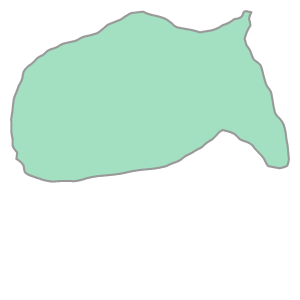

In [40]:
maskPolygon

In [41]:
# rgb color list
colorList = [[191, 214, 230], [107, 174, 216], [33, 114, 180], [239, 243, 255]]

In [42]:
def bgr2rgb(value):
    return value[2],value[0],value[1]
def valueEqualColor(value,color):
    colorR, colorG, colorB = color[0], color[1], color[2]
    valueR, valueG, valueB = value[0], value[1], value[2]
    if abs(colorR - valueR) > 10 or abs(colorB - valueB) > 10 or abs(colorG - valueG) > 10:
        return False
    else:
        return True

In [43]:
def rgb2Grey(dominantColor):
    rgb_weights = [0.2989, 0.5870, 0.1140]
    dominantColorGrey = int(np.dot(dominantColor, rgb_weights))
    return dominantColorGrey

In [44]:
# traverse the whole image
colorGrey0 = rgb2Grey(colorList[0])
colorGrey1 = rgb2Grey(colorList[1])
colorGrey2 = rgb2Grey(colorList[2])
colorGrey3 = rgb2Grey(colorList[3])

In [45]:
pixelCoordList0, pixelCoordList1, pixelCoordList2, pixelCoordList3 = [],[],[],[]
for i in range(height):
    for j in range(mask.shape[1]):
        # test x,y axis
#         if i != 148 or j != 257:
#             continue
        point = Point(j,i)
#         if bboxMap.contains(point) and maskPolygon.contains(point):
        if mask[i,j] == True:
#             print('yes!')
            value =  imageGray[i,j]
            print(value)
            b, g, r = image[i,j]
#             value_rgb = value
#             print(value_rgb)
            if not (abs(b - g) < 10 and abs(b-r) < 10 and abs(g - r)<10):
                if abs(value - colorGrey0) <= 10:
                    print('0: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList0.append((j,i))  
                elif abs(value - colorGrey1) <= 10:
                    print('1: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList1.append((j,i))  
                elif abs(value - colorGrey2) <= 10:
                    print('0: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList2.append((j,i))  
                elif abs(value - colorGrey3) <= 10:
                    print('0: j: '+ str(j) + ' i: ' + str(i))
                    pixelCoordList3.append((j,i))  

162
1: j: 245 i: 130
162
1: j: 246 i: 130
162
1: j: 247 i: 130
159
1: j: 248 i: 130
159
1: j: 249 i: 130
159
1: j: 250 i: 130
159
1: j: 251 i: 130
159
1: j: 252 i: 130
159
1: j: 253 i: 130
159
1: j: 254 i: 130
159
1: j: 255 i: 130
161
1: j: 256 i: 130
157
1: j: 257 i: 130
160
1: j: 258 i: 130
161
1: j: 259 i: 130
157
1: j: 260 i: 130
160
1: j: 261 i: 130
158
1: j: 262 i: 130
144
129
162
1: j: 239 i: 131
163
1: j: 240 i: 131
160
1: j: 241 i: 131
158
1: j: 242 i: 131
158
1: j: 243 i: 131
160
1: j: 244 i: 131
160
1: j: 245 i: 131
159
1: j: 246 i: 131
157
1: j: 247 i: 131
159
1: j: 248 i: 131
159
1: j: 249 i: 131
159
1: j: 250 i: 131
159
1: j: 251 i: 131
159
1: j: 252 i: 131
159
1: j: 253 i: 131
159
1: j: 254 i: 131
159
1: j: 255 i: 131
161
1: j: 256 i: 131
156
1: j: 257 i: 131
160
1: j: 258 i: 131
161
1: j: 259 i: 131
157
1: j: 260 i: 131
160
1: j: 261 i: 131
156
1: j: 262 i: 131
140
128
116
100
0: j: 266 i: 131
95
0: j: 267 i: 131
99
0: j: 268 i: 131
99
0: j: 269 i: 131
96
0: j: 270 i: 1

C:\Users\jiali\anaconda3\envs\imageProcess\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in ubyte_scalars
  app.launch_new_instance()


125
130
184
213
0: j: 304 i: 135
204
0: j: 305 i: 135
209
0: j: 306 i: 135
215
0: j: 307 i: 135
210
0: j: 308 i: 135
209
0: j: 309 i: 135
212
0: j: 310 i: 135
208
0: j: 311 i: 135
208
0: j: 312 i: 135
203
0: j: 313 i: 135
199
0: j: 314 i: 135
120
128
97
0: j: 317 i: 135
97
0: j: 318 i: 135
97
0: j: 319 i: 135
97
0: j: 320 i: 135
97
0: j: 321 i: 135
97
0: j: 322 i: 135
97
0: j: 323 i: 135
97
0: j: 324 i: 135
97
0: j: 325 i: 135
97
0: j: 326 i: 135
97
0: j: 327 i: 135
97
0: j: 328 i: 135
97
0: j: 329 i: 135
97
0: j: 330 i: 135
96
0: j: 331 i: 135
96
0: j: 332 i: 135
96
0: j: 333 i: 135
96
0: j: 334 i: 135
95
0: j: 335 i: 135
97
0: j: 336 i: 135
95
0: j: 337 i: 135
91
0: j: 338 i: 135
130
132
120
188
252
241
0: j: 344 i: 135
241
0: j: 345 i: 135
240
0: j: 346 i: 135
241
0: j: 347 i: 135
243
0: j: 348 i: 135
243
0: j: 349 i: 135
243
0: j: 350 i: 135
243
0: j: 351 i: 135
135
131
137
150
1: j: 355 i: 135
156
1: j: 356 i: 135
154
1: j: 357 i: 135
158
1: j: 358 i: 135
168
1: j: 359 i: 135
159


208
0: j: 278 i: 142
207
0: j: 279 i: 142
209
0: j: 280 i: 142
209
0: j: 281 i: 142
206
0: j: 282 i: 142
212
0: j: 283 i: 142
208
0: j: 284 i: 142
198
0: j: 285 i: 142
133
126
152
1: j: 288 i: 142
158
1: j: 289 i: 142
160
1: j: 290 i: 142
158
1: j: 291 i: 142
160
1: j: 292 i: 142
160
1: j: 293 i: 142
147
130
128
195
203
0: j: 298 i: 142
216
0: j: 299 i: 142
206
0: j: 300 i: 142
209
0: j: 301 i: 142
208
0: j: 302 i: 142
208
0: j: 303 i: 142
210
0: j: 304 i: 142
212
0: j: 305 i: 142
215
0: j: 306 i: 142
216
0: j: 307 i: 142
216
0: j: 308 i: 142
212
0: j: 309 i: 142
206
0: j: 310 i: 142
202
0: j: 311 i: 142
217
0: j: 312 i: 142
147
130
108
94
0: j: 316 i: 142
98
0: j: 317 i: 142
101
0: j: 318 i: 142
100
0: j: 319 i: 142
97
0: j: 320 i: 142
97
0: j: 321 i: 142
97
0: j: 322 i: 142
97
0: j: 323 i: 142
97
0: j: 324 i: 142
97
0: j: 325 i: 142
97
0: j: 326 i: 142
97
0: j: 327 i: 142
97
0: j: 328 i: 142
98
0: j: 329 i: 142
95
0: j: 330 i: 142
97
0: j: 331 i: 142
100
0: j: 332 i: 142
94
0: j: 333

251
246
0: j: 245 i: 145
235
0: j: 246 i: 145
240
0: j: 247 i: 145
239
0: j: 248 i: 145
232
251
0: j: 250 i: 145
234
0: j: 251 i: 145
242
128
135
124
141
129
124
126
140
127
124
129
138
106
0: j: 265 i: 145
94
0: j: 266 i: 145
104
0: j: 267 i: 145
102
0: j: 268 i: 145
127
129
169
192
199
0: j: 273 i: 145
218
0: j: 274 i: 145
209
0: j: 275 i: 145
204
0: j: 276 i: 145
213
0: j: 277 i: 145
207
0: j: 278 i: 145
210
0: j: 279 i: 145
207
0: j: 280 i: 145
205
0: j: 281 i: 145
215
0: j: 282 i: 145
219
203
0: j: 284 i: 145
156
1: j: 285 i: 145
135
124
147
156
1: j: 289 i: 145
166
1: j: 290 i: 145
156
1: j: 291 i: 145
160
1: j: 292 i: 145
159
1: j: 293 i: 145
129
122
182
208
0: j: 297 i: 145
213
0: j: 298 i: 145
207
0: j: 299 i: 145
215
0: j: 300 i: 145
216
0: j: 301 i: 145
210
0: j: 302 i: 145
216
0: j: 303 i: 145
211
0: j: 304 i: 145
216
0: j: 305 i: 145
211
0: j: 306 i: 145
206
0: j: 307 i: 145
210
0: j: 308 i: 145
211
0: j: 309 i: 145
210
0: j: 310 i: 145
214
0: j: 311 i: 145
176
130
125
98


209
0: j: 396 i: 147
209
0: j: 397 i: 147
209
0: j: 398 i: 147
209
0: j: 399 i: 147
195
130
129
93
0: j: 403 i: 147
103
0: j: 404 i: 147
91
0: j: 405 i: 147
108
94
0: j: 407 i: 147
99
0: j: 408 i: 147
98
0: j: 409 i: 147
254
254
254
167
1: j: 183 i: 148
132
125
180
181
114
136
179
134
129
125
124
125
119
108
102
0: j: 198 i: 148
103
0: j: 199 i: 148
97
0: j: 200 i: 148
97
0: j: 201 i: 148
97
0: j: 202 i: 148
97
0: j: 203 i: 148
97
0: j: 204 i: 148
97
0: j: 205 i: 148
97
0: j: 206 i: 148
97
0: j: 207 i: 148
90
0: j: 208 i: 148
102
0: j: 209 i: 148
133
116
152
1: j: 212 i: 148
203
0: j: 213 i: 148
235
0: j: 214 i: 148
248
0: j: 215 i: 148
241
0: j: 216 i: 148
238
0: j: 217 i: 148
159
128
145
218
0: j: 221 i: 148
204
0: j: 222 i: 148
208
0: j: 223 i: 148
208
0: j: 224 i: 148
210
0: j: 225 i: 148
209
0: j: 226 i: 148
207
0: j: 227 i: 148
211
0: j: 228 i: 148
215
0: j: 229 i: 148
212
0: j: 230 i: 148
205
0: j: 231 i: 148
186
130
133
220
244
245
243
234
0: j: 239 i: 148
243
0: j: 240 i: 148


200
0: j: 297 i: 150
215
0: j: 298 i: 150
221
207
0: j: 300 i: 150
207
0: j: 301 i: 150
216
0: j: 302 i: 150
212
0: j: 303 i: 150
209
0: j: 304 i: 150
211
0: j: 305 i: 150
221
210
0: j: 307 i: 150
198
0: j: 308 i: 150
217
0: j: 309 i: 150
209
0: j: 310 i: 150
157
1: j: 311 i: 150
126
128
128
122
120
104
0: j: 317 i: 150
133
121
119
103
0: j: 321 i: 150
93
0: j: 322 i: 150
97
0: j: 323 i: 150
99
0: j: 324 i: 150
95
0: j: 325 i: 150
94
0: j: 326 i: 150
97
0: j: 327 i: 150
98
0: j: 328 i: 150
92
0: j: 329 i: 150
100
0: j: 330 i: 150
103
0: j: 331 i: 150
94
0: j: 332 i: 150
107
0: j: 333 i: 150
126
126
217
0: j: 336 i: 150
241
0: j: 337 i: 150
245
0: j: 338 i: 150
242
0: j: 339 i: 150
245
0: j: 340 i: 150
242
0: j: 341 i: 150
241
0: j: 342 i: 150
245
0: j: 343 i: 150
243
0: j: 344 i: 150
243
0: j: 345 i: 150
243
0: j: 346 i: 150
243
0: j: 347 i: 150
243
0: j: 348 i: 150
243
0: j: 349 i: 150
243
0: j: 350 i: 150
243
0: j: 351 i: 150
248
0: j: 352 i: 150
242
0: j: 353 i: 150
243
243
0: j: 35

162
1: j: 167 i: 153
162
1: j: 168 i: 153
162
1: j: 169 i: 153
165
1: j: 170 i: 153
155
1: j: 171 i: 153
156
1: j: 172 i: 153
160
1: j: 173 i: 153
142
128
126
107
0: j: 177 i: 153
94
0: j: 178 i: 153
98
0: j: 179 i: 153
103
0: j: 180 i: 153
100
0: j: 181 i: 153
95
0: j: 182 i: 153
95
0: j: 183 i: 153
131
123
215
0: j: 186 i: 153
253
0: j: 187 i: 153
243
0: j: 188 i: 153
245
0: j: 189 i: 153
251
0: j: 190 i: 153
239
0: j: 191 i: 153
246
0: j: 192 i: 153
238
0: j: 193 i: 153
243
0: j: 194 i: 153
243
0: j: 195 i: 153
213
0: j: 196 i: 153
169
132
109
117
122
134
113
102
0: j: 204 i: 153
101
0: j: 205 i: 153
85
98
0: j: 207 i: 153
103
0: j: 208 i: 153
120
122
125
216
0: j: 212 i: 153
240
0: j: 213 i: 153
244
0: j: 214 i: 153
248
249
0: j: 216 i: 153
245
0: j: 217 i: 153
244
0: j: 218 i: 153
246
0: j: 219 i: 153
236
0: j: 220 i: 153
204
157
122
139
187
204
0: j: 226 i: 153
209
0: j: 227 i: 153
216
0: j: 228 i: 153
217
0: j: 229 i: 153
146
121
210
0: j: 232 i: 153
252
246
0: j: 234 i: 153
238

125
121
121
125
130
134
143
130
155
1: j: 170 i: 155
155
1: j: 171 i: 155
158
1: j: 172 i: 155
158
1: j: 173 i: 155
123
126
104
0: j: 176 i: 155
98
0: j: 177 i: 155
95
0: j: 178 i: 155
97
0: j: 179 i: 155
98
0: j: 180 i: 155
96
0: j: 181 i: 155
97
0: j: 182 i: 155
102
0: j: 183 i: 155
126
123
145
199
237
0: j: 188 i: 155
241
0: j: 189 i: 155
249
0: j: 190 i: 155
241
0: j: 191 i: 155
244
0: j: 192 i: 155
247
0: j: 193 i: 155
237
0: j: 194 i: 155
240
253
240
0: j: 197 i: 155
216
0: j: 198 i: 155
217
0: j: 199 i: 155
177
167
1: j: 201 i: 155
159
1: j: 202 i: 155
141
124
119
110
101
0: j: 207 i: 155
98
0: j: 208 i: 155
113
135
128
238
0: j: 212 i: 155
240
0: j: 213 i: 155
246
0: j: 214 i: 155
234
0: j: 215 i: 155
239
0: j: 216 i: 155
244
0: j: 217 i: 155
241
0: j: 218 i: 155
237
246
0: j: 220 i: 155
251
230
198
116
119
132
159
1: j: 227 i: 155
208
0: j: 228 i: 155
223
165
1: j: 230 i: 155
127
121
139
228
226
243
0: j: 236 i: 155
139
137
128
126
136
158
176
162
130
125
148
1: j: 247 i: 155


96
0: j: 180 i: 157
95
0: j: 181 i: 157
94
0: j: 182 i: 157
95
0: j: 183 i: 157
99
0: j: 184 i: 157
122
136
142
253
246
0: j: 189 i: 157
235
0: j: 190 i: 157
246
0: j: 191 i: 157
243
0: j: 192 i: 157
245
240
0: j: 194 i: 157
241
0: j: 195 i: 157
247
0: j: 196 i: 157
245
0: j: 197 i: 157
241
0: j: 198 i: 157
243
0: j: 199 i: 157
240
0: j: 200 i: 157
241
0: j: 201 i: 157
246
0: j: 202 i: 157
243
0: j: 203 i: 157
199
0: j: 204 i: 157
159
1: j: 205 i: 157
143
110
132
126
134
145
247
0: j: 212 i: 157
239
0: j: 213 i: 157
242
0: j: 214 i: 157
249
247
0: j: 216 i: 157
242
0: j: 217 i: 157
243
0: j: 218 i: 157
248
0: j: 219 i: 157
246
0: j: 220 i: 157
239
0: j: 221 i: 157
239
0: j: 222 i: 157
246
0: j: 223 i: 157
254
213
0: j: 225 i: 157
178
131
136
161
1: j: 229 i: 157
193
218
0: j: 231 i: 157
192
116
129
142
128
105
0: j: 237 i: 157
146
146
157
1: j: 240 i: 157
152
1: j: 241 i: 157
148
1: j: 242 i: 157
133
118
129
147
149
1: j: 247 i: 157
158
1: j: 248 i: 157
157
1: j: 249 i: 157
165
1: j: 2

209
0: j: 482 i: 158
209
0: j: 483 i: 158
209
0: j: 484 i: 158
210
0: j: 485 i: 158
210
0: j: 486 i: 158
211
0: j: 487 i: 158
213
0: j: 488 i: 158
200
0: j: 489 i: 158
209
0: j: 490 i: 158
204
0: j: 491 i: 158
201
0: j: 492 i: 158
153
1: j: 493 i: 158
133
125
125
138
151
1: j: 498 i: 158
157
1: j: 499 i: 158
161
1: j: 500 i: 158
164
1: j: 501 i: 158
165
1: j: 502 i: 158
163
1: j: 503 i: 158
253
248
125
130
130
122
112
93
0: j: 160 i: 159
94
0: j: 161 i: 159
95
0: j: 162 i: 159
96
0: j: 163 i: 159
97
0: j: 164 i: 159
98
0: j: 165 i: 159
98
0: j: 166 i: 159
98
0: j: 167 i: 159
109
122
145
241
0: j: 171 i: 159
231
129
124
133
132
127
117
107
0: j: 179 i: 159
100
0: j: 180 i: 159
98
0: j: 181 i: 159
96
0: j: 182 i: 159
94
0: j: 183 i: 159
99
0: j: 184 i: 159
90
0: j: 185 i: 159
124
130
172
243
0: j: 189 i: 159
239
0: j: 190 i: 159
244
0: j: 191 i: 159
244
0: j: 192 i: 159
239
0: j: 193 i: 159
247
0: j: 194 i: 159
247
0: j: 195 i: 159
232
237
0: j: 197 i: 159
251
0: j: 198 i: 159
246
0: j: 

113
129
136
129
107
0: j: 367 i: 160
95
0: j: 368 i: 160
104
0: j: 369 i: 160
88
0: j: 370 i: 160
103
0: j: 371 i: 160
95
0: j: 372 i: 160
109
101
0: j: 374 i: 160
96
0: j: 375 i: 160
91
0: j: 376 i: 160
103
0: j: 377 i: 160
94
0: j: 378 i: 160
94
0: j: 379 i: 160
96
0: j: 380 i: 160
97
0: j: 381 i: 160
103
0: j: 382 i: 160
87
0: j: 383 i: 160
96
0: j: 384 i: 160
96
0: j: 385 i: 160
94
0: j: 386 i: 160
98
0: j: 387 i: 160
104
0: j: 388 i: 160
98
0: j: 389 i: 160
102
0: j: 390 i: 160
122
132
143
214
0: j: 394 i: 160
208
0: j: 395 i: 160
207
206
0: j: 397 i: 160
183
133
122
102
0: j: 401 i: 160
97
0: j: 402 i: 160
102
0: j: 403 i: 160
97
0: j: 404 i: 160
93
0: j: 405 i: 160
96
0: j: 406 i: 160
96
0: j: 407 i: 160
114
125
117
112
82
102
0: j: 413 i: 160
101
0: j: 414 i: 160
98
0: j: 415 i: 160
99
0: j: 416 i: 160
98
0: j: 417 i: 160
98
0: j: 418 i: 160
98
0: j: 419 i: 160
97
0: j: 420 i: 160
96
0: j: 421 i: 160
96
0: j: 422 i: 160
96
0: j: 423 i: 160
100
0: j: 424 i: 160
95
0: j: 425 i: 1

211
0: j: 261 i: 162
206
0: j: 262 i: 162
203
0: j: 263 i: 162
217
0: j: 264 i: 162
211
0: j: 265 i: 162
205
0: j: 266 i: 162
202
0: j: 267 i: 162
204
0: j: 268 i: 162
211
0: j: 269 i: 162
218
0: j: 270 i: 162
222
210
0: j: 272 i: 162
210
0: j: 273 i: 162
206
0: j: 274 i: 162
154
1: j: 275 i: 162
123
111
102
0: j: 278 i: 162
97
0: j: 279 i: 162
97
0: j: 280 i: 162
97
0: j: 281 i: 162
97
0: j: 282 i: 162
97
0: j: 283 i: 162
97
0: j: 284 i: 162
97
0: j: 285 i: 162
97
0: j: 286 i: 162
97
0: j: 287 i: 162
96
0: j: 288 i: 162
97
0: j: 289 i: 162
121
132
109
95
0: j: 293 i: 162
100
0: j: 294 i: 162
98
0: j: 295 i: 162
95
0: j: 296 i: 162
101
0: j: 297 i: 162
97
0: j: 298 i: 162
94
0: j: 299 i: 162
99
0: j: 300 i: 162
97
0: j: 301 i: 162
96
0: j: 302 i: 162
104
0: j: 303 i: 162
129
130
230
253
237
0: j: 308 i: 162
245
0: j: 309 i: 162
244
0: j: 310 i: 162
246
0: j: 311 i: 162
254
117
126
112
86
104
0: j: 317 i: 162
98
0: j: 318 i: 162
92
0: j: 319 i: 162
93
0: j: 320 i: 162
95
0: j: 321 i: 16

222
182
153
1: j: 189 i: 164
135
117
117
157
191
205
0: j: 195 i: 164
222
242
0: j: 197 i: 164
237
0: j: 198 i: 164
216
0: j: 199 i: 164
224
236
248
204
130
120
153
1: j: 206 i: 164
160
1: j: 207 i: 164
163
1: j: 208 i: 164
152
1: j: 209 i: 164
163
1: j: 210 i: 164
160
1: j: 211 i: 164
125
138
166
1: j: 214 i: 164
222
240
0: j: 216 i: 164
246
0: j: 217 i: 164
252
0: j: 218 i: 164
251
246
0: j: 220 i: 164
240
0: j: 221 i: 164
238
0: j: 222 i: 164
238
0: j: 223 i: 164
241
0: j: 224 i: 164
243
0: j: 225 i: 164
244
0: j: 226 i: 164
244
0: j: 227 i: 164
241
0: j: 228 i: 164
238
0: j: 229 i: 164
238
239
0: j: 231 i: 164
180
133
129
146
160
1: j: 236 i: 164
166
1: j: 237 i: 164
156
1: j: 238 i: 164
160
1: j: 239 i: 164
159
1: j: 240 i: 164
159
1: j: 241 i: 164
159
1: j: 242 i: 164
159
1: j: 243 i: 164
159
1: j: 244 i: 164
159
1: j: 245 i: 164
159
1: j: 246 i: 164
159
1: j: 247 i: 164
157
1: j: 248 i: 164
166
1: j: 249 i: 164
158
1: j: 250 i: 164
153
1: j: 251 i: 164
143
119
119
142
132
160
1:

254
254
254
254
254
254
254
255
219
120
129
132
115
126
125
125
116
109
105
0: j: 162 i: 166
104
0: j: 163 i: 166
99
0: j: 164 i: 166
95
0: j: 165 i: 166
106
0: j: 166 i: 166
123
137
237
0: j: 169 i: 166
247
0: j: 170 i: 166
247
0: j: 171 i: 166
246
0: j: 172 i: 166
239
0: j: 173 i: 166
242
0: j: 174 i: 166
238
0: j: 175 i: 166
239
0: j: 176 i: 166
241
0: j: 177 i: 166
244
0: j: 178 i: 166
246
0: j: 179 i: 166
246
0: j: 180 i: 166
244
0: j: 181 i: 166
244
0: j: 182 i: 166
243
0: j: 183 i: 166
246
0: j: 184 i: 166
247
0: j: 185 i: 166
249
0: j: 186 i: 166
240
0: j: 187 i: 166
230
242
0: j: 189 i: 166
253
0: j: 190 i: 166
245
0: j: 191 i: 166
221
182
143
130
130
127
123
123
131
121
125
138
135
126
139
161
1: j: 207 i: 166
160
1: j: 208 i: 166
153
1: j: 209 i: 166
160
1: j: 210 i: 166
161
1: j: 211 i: 166
142
135
125
123
128
124
128
150
1: j: 219 i: 166
185
215
0: j: 221 i: 166
229
231
241
0: j: 224 i: 166
241
0: j: 225 i: 166
243
0: j: 226 i: 166
244
0: j: 227 i: 166
245
0: j: 228 i: 166

254
254
254
254
254
254
254
254
254
163
120
137
119
113
97
0: j: 157 i: 168
97
0: j: 158 i: 168
122
125
125
126
128
129
129
130
132
198
0: j: 168 i: 168
231
243
0: j: 170 i: 168
243
250
0: j: 172 i: 168
245
0: j: 173 i: 168
237
0: j: 174 i: 168
245
0: j: 175 i: 168
249
246
0: j: 177 i: 168
242
0: j: 178 i: 168
239
0: j: 179 i: 168
240
0: j: 180 i: 168
241
0: j: 181 i: 168
242
0: j: 182 i: 168
242
0: j: 183 i: 168
245
0: j: 184 i: 168
246
0: j: 185 i: 168
246
0: j: 186 i: 168
244
0: j: 187 i: 168
242
0: j: 188 i: 168
242
0: j: 189 i: 168
243
0: j: 190 i: 168
245
0: j: 191 i: 168
249
242
240
0: j: 194 i: 168
244
0: j: 195 i: 168
244
0: j: 196 i: 168
239
0: j: 197 i: 168
237
0: j: 198 i: 168
239
245
0: j: 200 i: 168
238
0: j: 201 i: 168
242
0: j: 202 i: 168
245
0: j: 203 i: 168
131
123
140
157
1: j: 207 i: 168
159
1: j: 208 i: 168
159
1: j: 209 i: 168
159
1: j: 210 i: 168
159
1: j: 211 i: 168
159
1: j: 212 i: 168
159
1: j: 213 i: 168
159
1: j: 214 i: 168
159
1: j: 215 i: 168
155
1: j: 216

255
254
254
254
254
254
254
254
254
255
255
239
225
143
116
133
130
108
121
111
107
0: j: 162 i: 170
111
110
105
0: j: 165 i: 170
111
124
130
136
125
116
132
162
198
0: j: 174 i: 170
233
0: j: 175 i: 170
244
246
0: j: 177 i: 170
248
0: j: 178 i: 170
246
0: j: 179 i: 170
242
0: j: 180 i: 170
239
0: j: 181 i: 170
240
0: j: 182 i: 170
242
0: j: 183 i: 170
253
246
0: j: 185 i: 170
241
0: j: 186 i: 170
239
0: j: 187 i: 170
243
0: j: 188 i: 170
245
0: j: 189 i: 170
246
0: j: 190 i: 170
245
0: j: 191 i: 170
245
0: j: 192 i: 170
245
0: j: 193 i: 170
246
0: j: 194 i: 170
248
0: j: 195 i: 170
244
0: j: 196 i: 170
240
0: j: 197 i: 170
242
0: j: 198 i: 170
247
244
238
0: j: 201 i: 170
243
0: j: 202 i: 170
227
122
132
125
156
1: j: 207 i: 170
159
1: j: 208 i: 170
159
1: j: 209 i: 170
159
1: j: 210 i: 170
159
1: j: 211 i: 170
159
1: j: 212 i: 170
159
1: j: 213 i: 170
159
1: j: 214 i: 170
159
1: j: 215 i: 170
164
1: j: 216 i: 170
159
1: j: 217 i: 170
158
1: j: 218 i: 170
141
125
116
127
166
1: j: 223

127
124
121
120
119
117
116
115
126
125
119
113
117
126
127
122
124
131
126
119
126
127
131
128
227
249
237
0: j: 306 i: 171
241
0: j: 307 i: 171
246
0: j: 308 i: 171
238
0: j: 309 i: 171
244
0: j: 310 i: 171
243
0: j: 311 i: 171
244
0: j: 312 i: 171
178
130
114
142
130
126
107
0: j: 319 i: 171
103
0: j: 320 i: 171
104
0: j: 321 i: 171
103
0: j: 322 i: 171
99
0: j: 323 i: 171
94
0: j: 324 i: 171
92
0: j: 325 i: 171
95
0: j: 326 i: 171
98
0: j: 327 i: 171
96
0: j: 328 i: 171
99
0: j: 329 i: 171
97
0: j: 330 i: 171
98
0: j: 331 i: 171
99
0: j: 332 i: 171
94
0: j: 333 i: 171
104
0: j: 334 i: 171
130
123
107
0: j: 337 i: 171
96
0: j: 338 i: 171
99
0: j: 339 i: 171
103
0: j: 340 i: 171
100
0: j: 341 i: 171
96
0: j: 342 i: 171
97
0: j: 343 i: 171
100
0: j: 344 i: 171
97
0: j: 345 i: 171
97
0: j: 346 i: 171
99
0: j: 347 i: 171
98
0: j: 348 i: 171
96
0: j: 349 i: 171
96
0: j: 350 i: 171
98
0: j: 351 i: 171
117
134
127
227
243
0: j: 356 i: 171
249
244
0: j: 358 i: 171
246
0: j: 359 i: 171
244
0

118
101
0: j: 290 i: 173
94
0: j: 291 i: 173
94
0: j: 292 i: 173
95
0: j: 293 i: 173
95
0: j: 294 i: 173
96
0: j: 295 i: 173
100
0: j: 296 i: 173
105
0: j: 297 i: 173
94
0: j: 298 i: 173
89
0: j: 299 i: 173
97
0: j: 300 i: 173
116
117
157
1: j: 303 i: 173
247
239
0: j: 305 i: 173
236
0: j: 306 i: 173
240
0: j: 307 i: 173
242
0: j: 308 i: 173
240
0: j: 309 i: 173
242
0: j: 310 i: 173
244
0: j: 311 i: 173
162
1: j: 312 i: 173
93
0: j: 313 i: 173
132
138
118
123
126
138
133
131
127
119
110
102
0: j: 325 i: 173
97
0: j: 326 i: 173
95
0: j: 327 i: 173
93
0: j: 328 i: 173
98
0: j: 329 i: 173
96
0: j: 330 i: 173
97
0: j: 331 i: 173
101
0: j: 332 i: 173
99
0: j: 333 i: 173
103
0: j: 334 i: 173
120
122
125
131
133
119
100
0: j: 341 i: 173
95
0: j: 342 i: 173
101
0: j: 343 i: 173
96
0: j: 344 i: 173
94
0: j: 345 i: 173
99
0: j: 346 i: 173
109
110
103
0: j: 349 i: 173
101
0: j: 350 i: 173
105
0: j: 351 i: 173
105
0: j: 352 i: 173
118
133
213
0: j: 355 i: 173
243
0: j: 356 i: 173
254
246
243
244
0

94
0: j: 467 i: 174
122
127
129
186
213
0: j: 472 i: 174
218
0: j: 473 i: 174
209
0: j: 474 i: 174
207
0: j: 475 i: 174
208
0: j: 476 i: 174
206
0: j: 477 i: 174
208
0: j: 478 i: 174
212
0: j: 479 i: 174
209
0: j: 480 i: 174
209
0: j: 481 i: 174
209
0: j: 482 i: 174
209
0: j: 483 i: 174
209
0: j: 484 i: 174
209
0: j: 485 i: 174
209
0: j: 486 i: 174
209
0: j: 487 i: 174
209
0: j: 488 i: 174
209
0: j: 489 i: 174
209
0: j: 490 i: 174
209
0: j: 491 i: 174
209
0: j: 492 i: 174
209
0: j: 493 i: 174
209
0: j: 494 i: 174
209
0: j: 495 i: 174
213
0: j: 496 i: 174
202
0: j: 497 i: 174
123
132
156
1: j: 500 i: 174
160
1: j: 501 i: 174
156
1: j: 502 i: 174
159
1: j: 503 i: 174
161
1: j: 504 i: 174
161
1: j: 505 i: 174
161
1: j: 506 i: 174
161
1: j: 507 i: 174
161
1: j: 508 i: 174
161
1: j: 509 i: 174
161
1: j: 510 i: 174
160
1: j: 511 i: 174
157
1: j: 512 i: 174
158
1: j: 513 i: 174
157
1: j: 514 i: 174
156
1: j: 515 i: 174
159
1: j: 516 i: 174
161
1: j: 517 i: 174
155
1: j: 518 i: 174
145
137
127

157
1: j: 236 i: 176
148
1: j: 237 i: 176
160
1: j: 238 i: 176
166
1: j: 239 i: 176
158
1: j: 240 i: 176
160
1: j: 241 i: 176
131
114
205
0: j: 244 i: 176
246
0: j: 245 i: 176
250
0: j: 246 i: 176
242
244
232
217
215
0: j: 251 i: 176
231
246
0: j: 253 i: 176
244
0: j: 254 i: 176
231
247
0: j: 256 i: 176
246
0: j: 257 i: 176
244
0: j: 258 i: 176
243
0: j: 259 i: 176
242
0: j: 260 i: 176
242
0: j: 261 i: 176
243
0: j: 262 i: 176
245
0: j: 263 i: 176
244
0: j: 264 i: 176
249
0: j: 265 i: 176
227
248
0: j: 267 i: 176
240
0: j: 268 i: 176
185
116
135
159
1: j: 272 i: 176
159
1: j: 273 i: 176
159
1: j: 274 i: 176
159
1: j: 275 i: 176
159
1: j: 276 i: 176
159
1: j: 277 i: 176
159
1: j: 278 i: 176
159
1: j: 279 i: 176
163
1: j: 280 i: 176
155
1: j: 281 i: 176
161
1: j: 282 i: 176
161
1: j: 283 i: 176
155
1: j: 284 i: 176
164
1: j: 285 i: 176
158
1: j: 286 i: 176
124
130
120
98
0: j: 290 i: 176
88
0: j: 291 i: 176
98
0: j: 292 i: 176
101
0: j: 293 i: 176
98
0: j: 294 i: 176
101
0: j: 295 i: 176

99
0: j: 454 i: 177
99
0: j: 455 i: 177
97
0: j: 456 i: 177
97
0: j: 457 i: 177
97
0: j: 458 i: 177
97
0: j: 459 i: 177
97
0: j: 460 i: 177
97
0: j: 461 i: 177
97
0: j: 462 i: 177
97
0: j: 463 i: 177
92
0: j: 464 i: 177
99
0: j: 465 i: 177
97
0: j: 466 i: 177
93
0: j: 467 i: 177
131
122
193
210
0: j: 471 i: 177
209
0: j: 472 i: 177
209
0: j: 473 i: 177
209
0: j: 474 i: 177
209
0: j: 475 i: 177
209
0: j: 476 i: 177
209
0: j: 477 i: 177
209
0: j: 478 i: 177
209
0: j: 479 i: 177
210
0: j: 480 i: 177
211
0: j: 481 i: 177
212
0: j: 482 i: 177
211
0: j: 483 i: 177
206
0: j: 484 i: 177
202
0: j: 485 i: 177
202
0: j: 486 i: 177
206
0: j: 487 i: 177
207
0: j: 488 i: 177
202
0: j: 489 i: 177
205
0: j: 490 i: 177
216
0: j: 491 i: 177
218
0: j: 492 i: 177
209
0: j: 493 i: 177
205
0: j: 494 i: 177
210
0: j: 495 i: 177
205
0: j: 496 i: 177
137
128
134
162
1: j: 500 i: 177
158
1: j: 501 i: 177
157
1: j: 502 i: 177
159
1: j: 503 i: 177
158
1: j: 504 i: 177
159
1: j: 505 i: 177
160
1: j: 506 i: 177
161

155
1: j: 204 i: 179
162
1: j: 205 i: 179
164
1: j: 206 i: 179
153
1: j: 207 i: 179
159
1: j: 208 i: 179
159
1: j: 209 i: 179
159
1: j: 210 i: 179
159
1: j: 211 i: 179
159
1: j: 212 i: 179
159
1: j: 213 i: 179
159
1: j: 214 i: 179
159
1: j: 215 i: 179
159
1: j: 216 i: 179
159
1: j: 217 i: 179
159
1: j: 218 i: 179
159
1: j: 219 i: 179
159
1: j: 220 i: 179
159
1: j: 221 i: 179
159
1: j: 222 i: 179
159
1: j: 223 i: 179
156
1: j: 224 i: 179
159
1: j: 225 i: 179
161
1: j: 226 i: 179
155
1: j: 227 i: 179
154
1: j: 228 i: 179
166
1: j: 229 i: 179
158
1: j: 230 i: 179
128
130
133
118
127
133
121
130
139
121
133
132
119
122
122
121
119
143
170
204
0: j: 250 i: 179
227
234
0: j: 252 i: 179
237
0: j: 253 i: 179
240
0: j: 254 i: 179
244
0: j: 255 i: 179
246
0: j: 256 i: 179
246
0: j: 257 i: 179
246
0: j: 258 i: 179
245
0: j: 259 i: 179
242
0: j: 260 i: 179
241
0: j: 261 i: 179
240
0: j: 262 i: 179
240
0: j: 263 i: 179
248
0: j: 264 i: 179
238
0: j: 265 i: 179
237
0: j: 266 i: 179
246
0: j: 267 i: 

213
0: j: 544 i: 180
214
0: j: 545 i: 180
208
0: j: 546 i: 180
201
0: j: 547 i: 180
202
0: j: 548 i: 180
204
0: j: 549 i: 180
207
0: j: 550 i: 180
212
0: j: 551 i: 180
136
132
112
95
0: j: 555 i: 180
97
0: j: 556 i: 180
99
0: j: 557 i: 180
96
0: j: 558 i: 180
98
0: j: 559 i: 180
97
0: j: 560 i: 180
97
0: j: 561 i: 180
97
0: j: 562 i: 180
97
0: j: 563 i: 180
97
0: j: 564 i: 180
97
0: j: 565 i: 180
97
0: j: 566 i: 180
97
0: j: 567 i: 180
91
0: j: 568 i: 180
128
121
202
0: j: 571 i: 180
247
0: j: 572 i: 180
245
0: j: 573 i: 180
236
243
242
241
0: j: 577 i: 180
241
0: j: 578 i: 180
241
0: j: 579 i: 180
241
0: j: 580 i: 180
241
0: j: 581 i: 180
240
0: j: 582 i: 180
240
210
0: j: 584 i: 180
135
114
132
150
1: j: 588 i: 180
163
1: j: 589 i: 180
160
1: j: 590 i: 180
162
1: j: 591 i: 180
157
1: j: 592 i: 180
161
1: j: 593 i: 180
156
1: j: 594 i: 180
163
1: j: 595 i: 180
161
1: j: 596 i: 180
160
1: j: 597 i: 180
160
1: j: 598 i: 180
132
130
134
207
0: j: 602 i: 180
218
0: j: 603 i: 180
199
0: j:

124
115
130
159
1: j: 495 i: 182
136
122
126
137
118
130
116
122
118
119
121
123
125
126
128
128
127
120
123
134
136
128
124
129
129
129
131
137
146
153
1: j: 525 i: 182
158
1: j: 526 i: 182
160
1: j: 527 i: 182
159
1: j: 528 i: 182
145
136
130
209
0: j: 532 i: 182
209
0: j: 533 i: 182
211
0: j: 534 i: 182
206
0: j: 535 i: 182
208
0: j: 536 i: 182
199
0: j: 537 i: 182
192
194
205
0: j: 540 i: 182
213
0: j: 541 i: 182
212
0: j: 542 i: 182
208
0: j: 543 i: 182
207
0: j: 544 i: 182
212
0: j: 545 i: 182
205
0: j: 546 i: 182
206
0: j: 547 i: 182
216
0: j: 548 i: 182
207
0: j: 549 i: 182
200
0: j: 550 i: 182
214
0: j: 551 i: 182
131
128
108
94
0: j: 555 i: 182
99
0: j: 556 i: 182
101
0: j: 557 i: 182
95
0: j: 558 i: 182
95
0: j: 559 i: 182
97
0: j: 560 i: 182
97
0: j: 561 i: 182
97
0: j: 562 i: 182
97
0: j: 563 i: 182
97
0: j: 564 i: 182
97
0: j: 565 i: 182
97
0: j: 566 i: 182
97
0: j: 567 i: 182
101
0: j: 568 i: 182
132
125
228
242
0: j: 572 i: 182
237
0: j: 573 i: 182
247
249
239
240
0: j:

155
1: j: 276 i: 184
152
1: j: 277 i: 184
154
1: j: 278 i: 184
158
1: j: 279 i: 184
157
1: j: 280 i: 184
161
1: j: 281 i: 184
164
1: j: 282 i: 184
155
1: j: 283 i: 184
161
1: j: 284 i: 184
136
116
180
209
0: j: 288 i: 184
209
0: j: 289 i: 184
209
0: j: 290 i: 184
209
0: j: 291 i: 184
209
0: j: 292 i: 184
209
0: j: 293 i: 184
209
0: j: 294 i: 184
209
0: j: 295 i: 184
212
0: j: 296 i: 184
203
0: j: 297 i: 184
216
0: j: 298 i: 184
121
126
204
0: j: 301 i: 184
240
0: j: 302 i: 184
251
0: j: 303 i: 184
238
0: j: 304 i: 184
240
0: j: 305 i: 184
243
0: j: 306 i: 184
245
0: j: 307 i: 184
245
0: j: 308 i: 184
243
0: j: 309 i: 184
243
0: j: 310 i: 184
241
0: j: 311 i: 184
243
0: j: 312 i: 184
242
0: j: 313 i: 184
241
0: j: 314 i: 184
241
0: j: 315 i: 184
242
0: j: 316 i: 184
242
0: j: 317 i: 184
241
0: j: 318 i: 184
240
0: j: 319 i: 184
172
102
0: j: 321 i: 184
132
167
1: j: 323 i: 184
151
1: j: 324 i: 184
178
147
161
1: j: 327 i: 184
164
1: j: 328 i: 184
142
140
123
116
240
147
124
134
117
93
0

255
255
254
250
0: j: 144 i: 186
251
0: j: 145 i: 186
246
0: j: 146 i: 186
254
254
181
114
149
1: j: 151 i: 186
155
1: j: 152 i: 186
148
1: j: 153 i: 186
139
132
129
129
130
131
138
125
140
183
213
0: j: 164 i: 186
211
0: j: 165 i: 186
204
0: j: 166 i: 186
211
0: j: 167 i: 186
215
0: j: 168 i: 186
214
0: j: 169 i: 186
206
0: j: 170 i: 186
205
0: j: 171 i: 186
134
124
120
131
122
125
128
129
128
127
128
129
128
196
245
0: j: 186 i: 186
242
0: j: 187 i: 186
243
0: j: 188 i: 186
243
0: j: 189 i: 186
242
0: j: 190 i: 186
244
0: j: 191 i: 186
237
248
0: j: 193 i: 186
244
0: j: 194 i: 186
229
238
0: j: 196 i: 186
181
137
125
157
1: j: 200 i: 186
158
1: j: 201 i: 186
160
1: j: 202 i: 186
161
1: j: 203 i: 186
161
1: j: 204 i: 186
160
1: j: 205 i: 186
157
1: j: 206 i: 186
156
1: j: 207 i: 186
159
1: j: 208 i: 186
159
1: j: 209 i: 186
159
1: j: 210 i: 186
160
1: j: 211 i: 186
160
1: j: 212 i: 186
160
1: j: 213 i: 186
161
1: j: 214 i: 186
161
1: j: 215 i: 186
159
1: j: 216 i: 186
159
1: j: 217 i:

209
0: j: 434 i: 187
212
0: j: 435 i: 187
214
0: j: 436 i: 187
213
0: j: 437 i: 187
207
0: j: 438 i: 187
208
0: j: 439 i: 187
190
135
127
119
93
0: j: 444 i: 187
91
0: j: 445 i: 187
94
0: j: 446 i: 187
97
0: j: 447 i: 187
99
0: j: 448 i: 187
98
0: j: 449 i: 187
97
0: j: 450 i: 187
97
0: j: 451 i: 187
98
0: j: 452 i: 187
97
0: j: 453 i: 187
95
0: j: 454 i: 187
92
0: j: 455 i: 187
91
0: j: 456 i: 187
94
0: j: 457 i: 187
97
0: j: 458 i: 187
98
0: j: 459 i: 187
98
0: j: 460 i: 187
98
0: j: 461 i: 187
100
0: j: 462 i: 187
102
0: j: 463 i: 187
103
0: j: 464 i: 187
103
0: j: 465 i: 187
111
132
148
1: j: 468 i: 187
213
0: j: 469 i: 187
210
0: j: 470 i: 187
196
214
0: j: 472 i: 187
209
0: j: 473 i: 187
210
0: j: 474 i: 187
211
0: j: 475 i: 187
208
0: j: 476 i: 187
209
0: j: 477 i: 187
211
0: j: 478 i: 187
207
0: j: 479 i: 187
204
0: j: 480 i: 187
193
153
1: j: 482 i: 187
115
129
174
163
1: j: 486 i: 187
125
135
121
106
0: j: 490 i: 187
101
0: j: 491 i: 187
98
0: j: 492 i: 187
95
0: j: 493 i: 18

255
247
0: j: 145 i: 189
255
255
151
1: j: 148 i: 189
130
144
160
1: j: 151 i: 189
161
1: j: 152 i: 189
156
1: j: 153 i: 189
156
1: j: 154 i: 189
161
1: j: 155 i: 189
156
1: j: 156 i: 189
140
127
124
120
145
223
236
0: j: 163 i: 189
206
0: j: 164 i: 189
183
134
105
0: j: 167 i: 189
122
174
191
157
1: j: 171 i: 189
123
133
148
1: j: 174 i: 189
152
1: j: 175 i: 189
160
1: j: 176 i: 189
158
1: j: 177 i: 189
159
1: j: 178 i: 189
162
1: j: 179 i: 189
163
1: j: 180 i: 189
154
1: j: 181 i: 189
138
125
172
250
0: j: 185 i: 189
239
0: j: 186 i: 189
244
0: j: 187 i: 189
244
0: j: 188 i: 189
246
0: j: 189 i: 189
238
0: j: 190 i: 189
243
0: j: 191 i: 189
237
0: j: 192 i: 189
243
0: j: 193 i: 189
220
123
123
140
125
133
126
128
131
136
143
149
1: j: 205 i: 189
154
1: j: 206 i: 189
157
1: j: 207 i: 189
160
1: j: 208 i: 189
161
1: j: 209 i: 189
161
1: j: 210 i: 189
161
1: j: 211 i: 189
160
1: j: 212 i: 189
158
1: j: 213 i: 189
156
1: j: 214 i: 189
155
1: j: 215 i: 189
159
1: j: 216 i: 189
159
1: j: 2

122
134
166
190
217
0: j: 423 i: 190
215
0: j: 424 i: 190
212
0: j: 425 i: 190
210
0: j: 426 i: 190
208
0: j: 427 i: 190
209
0: j: 428 i: 190
211
0: j: 429 i: 190
213
0: j: 430 i: 190
214
0: j: 431 i: 190
214
0: j: 432 i: 190
217
0: j: 433 i: 190
202
0: j: 434 i: 190
213
0: j: 435 i: 190
217
0: j: 436 i: 190
208
0: j: 437 i: 190
218
0: j: 438 i: 190
210
0: j: 439 i: 190
215
0: j: 440 i: 190
210
0: j: 441 i: 190
204
0: j: 442 i: 190
166
1: j: 443 i: 190
137
134
126
130
129
124
118
113
110
108
106
0: j: 454 i: 190
104
0: j: 455 i: 190
105
0: j: 456 i: 190
97
0: j: 457 i: 190
91
0: j: 458 i: 190
93
0: j: 459 i: 190
103
0: j: 460 i: 190
114
119
121
127
125
133
126
128
131
133
158
1: j: 471 i: 190
170
179
204
0: j: 474 i: 190
189
131
111
129
133
134
145
170
186
248
0: j: 484 i: 190
238
0: j: 485 i: 190
254
213
0: j: 487 i: 190
133
120
103
0: j: 490 i: 190
95
0: j: 491 i: 190
97
0: j: 492 i: 190
101
0: j: 493 i: 190
99
0: j: 494 i: 190
94
0: j: 495 i: 190
97
0: j: 496 i: 190
97
0: j: 497 i: 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
255
254
210
0: j: 1162 i: 191
142
130
169
200
0: j: 1166 i: 191
217
0: j: 1167 i: 191
211
0: j: 1168 i: 191
214
0: j: 1169 i: 191
209
0: j: 1170 i: 191
212
0: j: 1171 i: 191
213
173
133
129
139
156
1: j: 1177 i: 191
166
1: j: 1178 i: 191
161
1: j: 1179 i: 191
157
1: j: 1180 i: 191
160
1: j: 1181 i: 191
161
1: j: 1182 i: 191
156
1: j: 1183 i: 191
162
1: j: 1184 i: 191
163
1: j: 1185 i: 191
162
1: j: 1186 i: 191
159
1: j: 1187 i: 191
255
255
255
255
255
254
252
0: j: 144 i: 192
252
0: j: 145 i: 192
213
0: j: 146 i: 192
129
133
122
125
156
1: j: 151 i: 192
159
1: j: 152 i: 192
149
1: j: 153 i: 192
159
1: j: 154 i: 192
161
1: j: 155 i: 192
162
1: j: 156 i: 192
157
1: j: 157 i: 192
135
134
125
122
204
0: j: 162 i: 192
249
0: j: 163 i: 192
243
0: j: 164 i: 192
242
250
187
127
118
120
131
131
145
169
159
1: j: 175 i: 19

237
0: j: 258 i: 193
245
0: j: 259 i: 193
141
128
149
1: j: 262 i: 193
156
1: j: 263 i: 193
155
1: j: 264 i: 193
159
1: j: 265 i: 193
155
1: j: 266 i: 193
142
129
126
130
133
161
1: j: 272 i: 193
154
1: j: 273 i: 193
157
1: j: 274 i: 193
162
1: j: 275 i: 193
159
1: j: 276 i: 193
153
1: j: 277 i: 193
140
124
126
155
1: j: 281 i: 193
157
1: j: 282 i: 193
130
138
167
1: j: 285 i: 193
200
0: j: 286 i: 193
217
0: j: 287 i: 193
210
0: j: 288 i: 193
215
0: j: 289 i: 193
184
145
135
135
141
161
1: j: 295 i: 193
179
134
120
105
0: j: 299 i: 193
90
0: j: 300 i: 193
96
0: j: 301 i: 193
96
0: j: 302 i: 193
97
0: j: 303 i: 193
97
0: j: 304 i: 193
97
0: j: 305 i: 193
97
0: j: 306 i: 193
97
0: j: 307 i: 193
97
0: j: 308 i: 193
97
0: j: 309 i: 193
97
0: j: 310 i: 193
97
0: j: 311 i: 193
97
0: j: 312 i: 193
97
0: j: 313 i: 193
97
0: j: 314 i: 193
97
0: j: 315 i: 193
97
0: j: 316 i: 193
97
0: j: 317 i: 193
97
0: j: 318 i: 193
97
0: j: 319 i: 193
99
0: j: 320 i: 193
96
0: j: 321 i: 193
100
0: j: 322 i: 1

132
129
132
134
130
120
134
138
126
128
122
124
127
133
140
147
155
160
1: j: 582 i: 194
163
170
171
129
131
147
142
155
1: j: 590 i: 194
148
1: j: 591 i: 194
162
1: j: 592 i: 194
163
1: j: 593 i: 194
162
1: j: 594 i: 194
159
1: j: 595 i: 194
160
1: j: 596 i: 194
163
1: j: 597 i: 194
164
1: j: 598 i: 194
162
1: j: 599 i: 194
136
150
1: j: 601 i: 194
200
0: j: 602 i: 194
200
0: j: 603 i: 194
204
0: j: 604 i: 194
214
0: j: 605 i: 194
204
0: j: 606 i: 194
136
132
149
1: j: 609 i: 194
163
1: j: 610 i: 194
163
1: j: 611 i: 194
160
1: j: 612 i: 194
163
1: j: 613 i: 194
163
1: j: 614 i: 194
160
1: j: 615 i: 194
155
1: j: 616 i: 194
156
1: j: 617 i: 194
156
1: j: 618 i: 194
157
1: j: 619 i: 194
157
1: j: 620 i: 194
156
1: j: 621 i: 194
155
1: j: 622 i: 194
154
1: j: 623 i: 194
150
1: j: 624 i: 194
159
1: j: 625 i: 194
135
138
135
124
138
123
129
199
0: j: 633 i: 194
198
0: j: 634 i: 194
211
0: j: 635 i: 194
206
0: j: 636 i: 194
213
0: j: 637 i: 194
217
0: j: 638 i: 194
205
0: j: 639 i: 194
209

221
209
0: j: 520 i: 195
215
0: j: 521 i: 195
210
0: j: 522 i: 195
206
0: j: 523 i: 195
213
0: j: 524 i: 195
212
0: j: 525 i: 195
206
0: j: 526 i: 195
208
0: j: 527 i: 195
180
129
136
207
0: j: 531 i: 195
209
0: j: 532 i: 195
210
0: j: 533 i: 195
207
0: j: 534 i: 195
212
0: j: 535 i: 195
209
0: j: 536 i: 195
209
0: j: 537 i: 195
209
0: j: 538 i: 195
209
0: j: 539 i: 195
209
0: j: 540 i: 195
209
0: j: 541 i: 195
209
0: j: 542 i: 195
209
0: j: 543 i: 195
206
0: j: 544 i: 195
216
0: j: 545 i: 195
208
0: j: 546 i: 195
211
0: j: 547 i: 195
217
0: j: 548 i: 195
209
0: j: 549 i: 195
208
0: j: 550 i: 195
208
204
0: j: 552 i: 195
207
0: j: 553 i: 195
171
129
132
128
116
115
130
131
127
120
145
136
129
127
127
124
120
127
129
126
130
132
129
129
129
128
128
128
128
128
125
128
118
130
131
126
136
122
124
127
130
130
129
128
127
125
114
126
145
142
151
1: j: 604 i: 195
156
1: j: 605 i: 195
166
1: j: 606 i: 195
121
128
140
149
1: j: 610 i: 195
149
1: j: 611 i: 195
148
1: j: 612 i: 195
151
1: j: 61

145
114
126
135
149
1: j: 1178 i: 196
159
1: j: 1179 i: 196
161
1: j: 1180 i: 196
159
1: j: 1181 i: 196
157
1: j: 1182 i: 196
158
1: j: 1183 i: 196
159
1: j: 1184 i: 196
157
1: j: 1185 i: 196
157
1: j: 1186 i: 196
160
1: j: 1187 i: 196
162
1: j: 1188 i: 196
155
1: j: 1189 i: 196
140
126
132
255
255
255
255
255
255
255
255
254
251
0: j: 144 i: 197
200
0: j: 145 i: 197
122
138
160
1: j: 148 i: 197
160
1: j: 149 i: 197
163
1: j: 150 i: 197
155
1: j: 151 i: 197
156
1: j: 152 i: 197
159
1: j: 153 i: 197
163
1: j: 154 i: 197
135
120
129
128
136
107
0: j: 160 i: 197
148
1: j: 161 i: 197
185
206
253
242
0: j: 165 i: 197
242
0: j: 166 i: 197
253
0: j: 167 i: 197
170
123
131
122
104
0: j: 172 i: 197
114
116
131
134
146
141
157
1: j: 179 i: 197
125
129
218
0: j: 182 i: 197
232
243
0: j: 184 i: 197
225
193
155
128
123
137
153
1: j: 191 i: 197
171
116
129
125
127
156
1: j: 197 i: 197
169
158
1: j: 199 i: 197
159
1: j: 200 i: 197
158
1: j: 201 i: 197
158
1: j: 202 i: 197
158
1: j: 203 i: 197
158
1: 

122
131
156
1: j: 687 i: 197
161
1: j: 688 i: 197
153
1: j: 689 i: 197
154
1: j: 690 i: 197
139
129
121
118
96
0: j: 695 i: 197
97
0: j: 696 i: 197
97
0: j: 697 i: 197
97
0: j: 698 i: 197
97
0: j: 699 i: 197
97
0: j: 700 i: 197
97
0: j: 701 i: 197
97
0: j: 702 i: 197
97
0: j: 703 i: 197
100
0: j: 704 i: 197
89
0: j: 705 i: 197
117
136
122
137
116
135
134
133
126
118
122
134
139
135
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
254
232
130
125
184
218
0: j: 1165 i: 197
197
215
0: j: 1167 i: 197
196
217
0: j: 1169 i: 197
222
202
0: j: 1171 i: 197
200
0: j: 1172 i: 197
223
202
0: j: 1174 i: 197
142
123
131
145
158
1: j: 1179 i: 197
161
1: j: 1180 i: 197
158
1: j: 1181 i: 197
157
1: j: 1182 i: 197
160
1: j: 1183 i: 197
159
1: j: 1184 i: 197
159
1: j: 1185 i: 197
159
1: j: 1186 i: 197
158
1: j: 1187 i: 197
159
1: j: 1188 i: 197
156
1: j: 1189 

209
0: j: 436 i: 199
209
0: j: 437 i: 199
209
0: j: 438 i: 199
209
0: j: 439 i: 199
181
146
140
128
128
131
116
132
121
125
150
1: j: 450 i: 199
165
1: j: 451 i: 199
158
1: j: 452 i: 199
160
1: j: 453 i: 199
157
1: j: 454 i: 199
134
124
155
253
225
242
0: j: 460 i: 199
245
0: j: 461 i: 199
240
0: j: 462 i: 199
244
0: j: 463 i: 199
250
246
0: j: 465 i: 199
240
0: j: 466 i: 199
239
0: j: 467 i: 199
241
0: j: 468 i: 199
242
0: j: 469 i: 199
243
0: j: 470 i: 199
243
0: j: 471 i: 199
239
0: j: 472 i: 199
241
0: j: 473 i: 199
244
0: j: 474 i: 199
247
0: j: 475 i: 199
248
0: j: 476 i: 199
247
0: j: 477 i: 199
246
0: j: 478 i: 199
244
0: j: 479 i: 199
246
0: j: 480 i: 199
235
0: j: 481 i: 199
245
0: j: 482 i: 199
243
0: j: 483 i: 199
244
0: j: 484 i: 199
243
0: j: 485 i: 199
141
132
120
104
0: j: 489 i: 199
93
0: j: 490 i: 199
95
0: j: 491 i: 199
99
0: j: 492 i: 199
96
0: j: 493 i: 199
95
0: j: 494 i: 199
98
0: j: 495 i: 199
97
0: j: 496 i: 199
94
0: j: 497 i: 199
97
0: j: 498 i: 199
101
0: j:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
0: j: 1153 i: 200
255
255
254
254
246
0: j: 1158 i: 200
238
129
131
155
1: j: 1162 i: 200
211
0: j: 1163 i: 200
214
0: j: 1164 i: 200
196
215
0: j: 1166 i: 200
209
0: j: 1167 i: 200
210
0: j: 1168 i: 200
205
0: j: 1169 i: 200
214
0: j: 1170 i: 200
211
0: j: 1171 i: 200
202
0: j: 1172 i: 200
218
0: j: 1173 i: 200
202
0: j: 1174 i: 200
142
127
131
170
150
1: j: 1179 i: 200
161
1: j: 1180 i: 200
160
1: j: 1181 i: 200
157
1: j: 1182 i: 200
158
1: j: 1183 i: 200
159
1: j: 1184 i: 200
159
1: j: 1185 i: 200
159
1: j: 1186 i: 200
159
1: j: 1187 i: 200
159
1: j: 1188 i: 200
159
1: j: 1189 i: 200
159
1: j: 1190 i: 200
159
1: j: 1191 i: 200
161
1: j: 1192 i: 200
158
1: j: 1193 i: 200
255
255
255
255
245
255
255
255
255
243
255
234
130
120
152
1: j: 146 i: 201
155
1: j: 147 i: 201
128
128
128
124
144
156
1: j: 153 i: 201
140
134

97
0: j: 412 i: 202
97
0: j: 413 i: 202
97
0: j: 414 i: 202
97
0: j: 415 i: 202
98
0: j: 416 i: 202
97
0: j: 417 i: 202
91
0: j: 418 i: 202
94
0: j: 419 i: 202
101
0: j: 420 i: 202
120
136
199
0: j: 423 i: 202
209
0: j: 424 i: 202
209
0: j: 425 i: 202
209
0: j: 426 i: 202
209
0: j: 427 i: 202
209
0: j: 428 i: 202
209
0: j: 429 i: 202
209
0: j: 430 i: 202
209
0: j: 431 i: 202
207
0: j: 432 i: 202
204
0: j: 433 i: 202
210
0: j: 434 i: 202
212
0: j: 435 i: 202
205
0: j: 436 i: 202
208
0: j: 437 i: 202
213
0: j: 438 i: 202
208
0: j: 439 i: 202
131
127
141
155
1: j: 443 i: 202
155
1: j: 444 i: 202
159
1: j: 445 i: 202
166
1: j: 446 i: 202
164
1: j: 447 i: 202
163
1: j: 448 i: 202
163
1: j: 449 i: 202
161
1: j: 450 i: 202
160
1: j: 451 i: 202
161
1: j: 452 i: 202
157
1: j: 453 i: 202
142
127
131
240
0: j: 457 i: 202
246
246
0: j: 459 i: 202
243
0: j: 460 i: 202
243
0: j: 461 i: 202
243
0: j: 462 i: 202
243
0: j: 463 i: 202
243
0: j: 464 i: 202
243
0: j: 465 i: 202
243
0: j: 466 i: 202
243
0:

243
243
0: j: 718 i: 203
242
0: j: 719 i: 203
243
0: j: 720 i: 203
243
0: j: 721 i: 203
243
0: j: 722 i: 203
243
0: j: 723 i: 203
243
0: j: 724 i: 203
243
0: j: 725 i: 203
243
0: j: 726 i: 203
242
0: j: 727 i: 203
238
0: j: 728 i: 203
246
0: j: 729 i: 203
244
0: j: 730 i: 203
215
0: j: 731 i: 203
132
126
99
0: j: 734 i: 203
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
0: j: 1155 i: 203
255
252
233
0: j: 1158 i: 203
129
127
129
129
156
1: j: 1163 i: 203
205
0: j: 1164 i: 203
211
0: j: 1165 i: 203
208
0: j: 1166 i: 203
212
0: j: 1167 i: 203
211
0: j: 1168 i: 203
203
0: j: 1169 i: 203
210
0: j: 1170 i: 203
214
0: j: 1171 i: 203
206
0: j: 1172 i: 203
207
0: j: 1173 i: 203
214
0: j: 1174 i: 203
210
0: j: 1175 i: 203
166
1: j: 1176 i: 203
124
132
157
1: j: 1179 i: 203
160
1: j: 1180 i: 203
157
1: j: 1181 i: 203
162
1: j: 1182 i: 203
160
1: j: 

147
157
1: j: 237 i: 205
160
1: j: 238 i: 205
154
1: j: 239 i: 205
163
1: j: 240 i: 205
155
1: j: 241 i: 205
154
1: j: 242 i: 205
162
1: j: 243 i: 205
164
1: j: 244 i: 205
157
1: j: 245 i: 205
153
1: j: 246 i: 205
157
1: j: 247 i: 205
170
161
1: j: 249 i: 205
147
135
129
129
133
137
129
118
136
154
1: j: 259 i: 205
169
181
136
121
146
157
1: j: 265 i: 205
161
1: j: 266 i: 205
163
1: j: 267 i: 205
163
1: j: 268 i: 205
146
129
129
131
123
130
103
0: j: 275 i: 205
100
0: j: 276 i: 205
96
0: j: 277 i: 205
95
0: j: 278 i: 205
98
0: j: 279 i: 205
95
0: j: 280 i: 205
96
0: j: 281 i: 205
123
127
166
1: j: 284 i: 205
209
0: j: 285 i: 205
210
0: j: 286 i: 205
135
122
160
1: j: 289 i: 205
199
0: j: 290 i: 205
199
0: j: 291 i: 205
199
0: j: 292 i: 205
198
0: j: 293 i: 205
207
0: j: 294 i: 205
210
0: j: 295 i: 205
207
0: j: 296 i: 205
203
0: j: 297 i: 205
146
125
129
126
111
102
0: j: 303 i: 205
99
0: j: 304 i: 205
109
122
133
140
148
1: j: 309 i: 205
156
1: j: 310 i: 205
163
1: j: 311 i: 205
157
1

118
135
136
177
214
0: j: 190 i: 206
205
0: j: 191 i: 206
191
125
121
174
205
0: j: 196 i: 206
208
0: j: 197 i: 206
220
211
0: j: 199 i: 206
213
0: j: 200 i: 206
219
207
0: j: 202 i: 206
208
0: j: 203 i: 206
129
115
155
1: j: 206 i: 206
250
0: j: 207 i: 206
239
0: j: 208 i: 206
246
0: j: 209 i: 206
248
0: j: 210 i: 206
236
0: j: 211 i: 206
185
134
119
106
0: j: 215 i: 206
98
0: j: 216 i: 206
99
0: j: 217 i: 206
100
0: j: 218 i: 206
100
0: j: 219 i: 206
96
0: j: 220 i: 206
96
0: j: 221 i: 206
110
126
157
1: j: 224 i: 206
200
0: j: 225 i: 206
217
0: j: 226 i: 206
204
0: j: 227 i: 206
206
0: j: 228 i: 206
217
0: j: 229 i: 206
209
0: j: 230 i: 206
195
198
0: j: 232 i: 206
142
123
150
1: j: 235 i: 206
167
1: j: 236 i: 206
168
1: j: 237 i: 206
161
1: j: 238 i: 206
149
1: j: 239 i: 206
163
1: j: 240 i: 206
157
1: j: 241 i: 206
154
1: j: 242 i: 206
156
1: j: 243 i: 206
157
1: j: 244 i: 206
157
1: j: 245 i: 206
160
1: j: 246 i: 206
165
1: j: 247 i: 206
149
1: j: 248 i: 206
153
1: j: 249 i: 206


204
0: j: 1165 i: 206
208
0: j: 1166 i: 206
207
0: j: 1167 i: 206
208
0: j: 1168 i: 206
209
0: j: 1169 i: 206
206
0: j: 1170 i: 206
207
0: j: 1171 i: 206
212
0: j: 1172 i: 206
209
0: j: 1173 i: 206
206
0: j: 1174 i: 206
211
0: j: 1175 i: 206
210
0: j: 1176 i: 206
205
0: j: 1177 i: 206
132
123
138
159
1: j: 1181 i: 206
157
1: j: 1182 i: 206
157
1: j: 1183 i: 206
159
1: j: 1184 i: 206
159
1: j: 1185 i: 206
159
1: j: 1186 i: 206
159
1: j: 1187 i: 206
159
1: j: 1188 i: 206
159
1: j: 1189 i: 206
159
1: j: 1190 i: 206
159
1: j: 1191 i: 206
164
1: j: 1192 i: 206
162
1: j: 1193 i: 206
146
134
255
255
255
255
255
255
255
255
255
249
253
255
255
242
144
130
190
226
177
139
122
131
130
119
141
122
134
125
145
160
1: j: 156 i: 207
195
198
0: j: 158 i: 207
212
0: j: 159 i: 207
179
133
128
134
159
1: j: 164 i: 207
156
1: j: 165 i: 207
162
1: j: 166 i: 207
132
129
119
95
0: j: 170 i: 207
102
0: j: 171 i: 207
96
0: j: 172 i: 207
87
0: j: 173 i: 207
105
0: j: 174 i: 207
93
0: j: 175 i: 207
102
0: j: 17

177
214
0: j: 150 i: 208
189
154
1: j: 152 i: 208
130
125
133
124
119
135
152
1: j: 159 i: 208
139
125
124
142
156
1: j: 164 i: 208
150
1: j: 165 i: 208
137
131
123
105
0: j: 169 i: 208
93
0: j: 170 i: 208
96
0: j: 171 i: 208
99
0: j: 172 i: 208
96
0: j: 173 i: 208
96
0: j: 174 i: 208
101
0: j: 175 i: 208
97
0: j: 176 i: 208
97
0: j: 177 i: 208
97
0: j: 178 i: 208
97
0: j: 179 i: 208
97
0: j: 180 i: 208
97
0: j: 181 i: 208
97
0: j: 182 i: 208
97
0: j: 183 i: 208
101
0: j: 184 i: 208
90
0: j: 185 i: 208
98
0: j: 186 i: 208
106
0: j: 187 i: 208
129
128
217
0: j: 190 i: 208
204
0: j: 191 i: 208
147
119
169
207
0: j: 195 i: 208
209
0: j: 196 i: 208
214
0: j: 197 i: 208
206
0: j: 198 i: 208
207
0: j: 199 i: 208
214
0: j: 200 i: 208
213
0: j: 201 i: 208
202
0: j: 202 i: 208
218
0: j: 203 i: 208
172
123
122
199
240
0: j: 208 i: 208
246
0: j: 209 i: 208
244
0: j: 210 i: 208
237
0: j: 211 i: 208
247
0: j: 212 i: 208
156
1: j: 213 i: 208
136
122
91
0: j: 216 i: 208
94
0: j: 217 i: 208
102
0: j: 

204
0: j: 284 i: 209
214
0: j: 285 i: 209
134
126
167
1: j: 288 i: 209
211
0: j: 289 i: 209
145
127
129
140
136
127
124
124
125
129
136
145
154
1: j: 302 i: 209
160
1: j: 303 i: 209
151
1: j: 304 i: 209
153
1: j: 305 i: 209
156
1: j: 306 i: 209
160
1: j: 307 i: 209
161
1: j: 308 i: 209
162
1: j: 309 i: 209
161
1: j: 310 i: 209
160
1: j: 311 i: 209
159
1: j: 312 i: 209
159
1: j: 313 i: 209
159
1: j: 314 i: 209
159
1: j: 315 i: 209
159
1: j: 316 i: 209
159
1: j: 317 i: 209
159
1: j: 318 i: 209
159
1: j: 319 i: 209
158
1: j: 320 i: 209
158
1: j: 321 i: 209
158
1: j: 322 i: 209
159
1: j: 323 i: 209
159
1: j: 324 i: 209
160
1: j: 325 i: 209
160
1: j: 326 i: 209
160
1: j: 327 i: 209
155
1: j: 328 i: 209
160
1: j: 329 i: 209
142
129
130
184
208
0: j: 334 i: 209
204
0: j: 335 i: 209
211
0: j: 336 i: 209
209
0: j: 337 i: 209
210
0: j: 338 i: 209
208
0: j: 339 i: 209
213
0: j: 340 i: 209
154
1: j: 341 i: 209
131
136
244
0: j: 344 i: 209
247
0: j: 345 i: 209
242
0: j: 346 i: 209
241
0: j: 347 i: 

243
0: j: 399 i: 210
239
0: j: 400 i: 210
253
226
151
1: j: 403 i: 210
130
129
107
0: j: 406 i: 210
91
0: j: 407 i: 210
95
0: j: 408 i: 210
97
0: j: 409 i: 210
95
0: j: 410 i: 210
91
0: j: 411 i: 210
94
0: j: 412 i: 210
100
0: j: 413 i: 210
98
0: j: 414 i: 210
91
0: j: 415 i: 210
96
0: j: 416 i: 210
98
0: j: 417 i: 210
110
139
126
146
212
0: j: 422 i: 210
204
0: j: 423 i: 210
205
0: j: 424 i: 210
211
0: j: 425 i: 210
204
0: j: 426 i: 210
211
0: j: 427 i: 210
210
0: j: 428 i: 210
203
0: j: 429 i: 210
210
0: j: 430 i: 210
201
0: j: 431 i: 210
215
0: j: 432 i: 210
215
0: j: 433 i: 210
214
0: j: 434 i: 210
213
0: j: 435 i: 210
212
0: j: 436 i: 210
211
0: j: 437 i: 210
210
0: j: 438 i: 210
209
0: j: 439 i: 210
205
0: j: 440 i: 210
145
123
147
159
1: j: 444 i: 210
160
1: j: 445 i: 210
163
1: j: 446 i: 210
161
1: j: 447 i: 210
157
1: j: 448 i: 210
159
1: j: 449 i: 210
160
1: j: 450 i: 210
160
1: j: 451 i: 210
161
1: j: 452 i: 210
157
1: j: 453 i: 210
144
131
142
247
0: j: 457 i: 210
246
0: j:

130
128
132
116
131
123
126
156
1: j: 496 i: 211
150
1: j: 497 i: 211
153
1: j: 498 i: 211
156
1: j: 499 i: 211
152
1: j: 500 i: 211
152
1: j: 501 i: 211
145
128
124
207
0: j: 505 i: 211
247
243
239
0: j: 508 i: 211
240
0: j: 509 i: 211
244
0: j: 510 i: 211
241
0: j: 511 i: 211
243
0: j: 512 i: 211
243
0: j: 513 i: 211
243
0: j: 514 i: 211
243
0: j: 515 i: 211
243
0: j: 516 i: 211
243
0: j: 517 i: 211
243
0: j: 518 i: 211
243
0: j: 519 i: 211
242
0: j: 520 i: 211
199
0: j: 521 i: 211
133
127
244
249
239
135
125
176
207
0: j: 530 i: 211
214
0: j: 531 i: 211
215
0: j: 532 i: 211
203
0: j: 533 i: 211
140
127
105
0: j: 536 i: 211
98
0: j: 537 i: 211
93
0: j: 538 i: 211
94
0: j: 539 i: 211
95
0: j: 540 i: 211
95
0: j: 541 i: 211
96
0: j: 542 i: 211
100
0: j: 543 i: 211
96
0: j: 544 i: 211
104
0: j: 545 i: 211
123
128
108
94
0: j: 549 i: 211
95
0: j: 550 i: 211
95
0: j: 551 i: 211
97
0: j: 552 i: 211
97
0: j: 553 i: 211
97
0: j: 554 i: 211
97
0: j: 555 i: 211
97
0: j: 556 i: 211
97
0: j: 557

243
0: j: 516 i: 212
243
0: j: 517 i: 212
243
0: j: 518 i: 212
243
0: j: 519 i: 212
251
224
128
122
222
248
0: j: 525 i: 212
238
0: j: 526 i: 212
142
125
183
204
0: j: 530 i: 212
211
0: j: 531 i: 212
212
0: j: 532 i: 212
206
0: j: 533 i: 212
138
131
108
101
0: j: 537 i: 212
97
0: j: 538 i: 212
98
0: j: 539 i: 212
99
0: j: 540 i: 212
98
0: j: 541 i: 212
99
0: j: 542 i: 212
102
0: j: 543 i: 212
91
0: j: 544 i: 212
100
0: j: 545 i: 212
122
126
105
0: j: 548 i: 212
91
0: j: 549 i: 212
96
0: j: 550 i: 212
99
0: j: 551 i: 212
97
0: j: 552 i: 212
97
0: j: 553 i: 212
97
0: j: 554 i: 212
97
0: j: 555 i: 212
97
0: j: 556 i: 212
97
0: j: 557 i: 212
97
0: j: 558 i: 212
97
0: j: 559 i: 212
96
0: j: 560 i: 212
90
0: j: 561 i: 212
112
130
137
238
0: j: 565 i: 212
246
0: j: 566 i: 212
235
0: j: 567 i: 212
241
0: j: 568 i: 212
222
194
203
0: j: 571 i: 212
220
226
239
0: j: 574 i: 212
234
0: j: 575 i: 212
237
0: j: 576 i: 212
203
0: j: 577 i: 212
135
118
130
138
117
124
139
158
1: j: 585 i: 212
206
0: j

124
120
128
120
135
142
114
124
129
144
123
134
117
129
170
207
0: j: 587 i: 213
185
128
131
138
137
136
135
134
134
133
134
134
138
126
139
119
129
127
130
135
128
119
116
122
126
125
129
135
127
125
124
125
127
125
122
122
130
126
127
125
119
126
132
123
128
107
0: j: 633 i: 213
96
0: j: 634 i: 213
95
0: j: 635 i: 213
92
0: j: 636 i: 213
94
0: j: 637 i: 213
99
0: j: 638 i: 213
95
0: j: 639 i: 213
115
124
143
240
0: j: 643 i: 213
243
243
246
0: j: 646 i: 213
239
0: j: 647 i: 213
245
0: j: 648 i: 213
238
0: j: 649 i: 213
130
126
153
1: j: 652 i: 213
155
1: j: 653 i: 213
159
1: j: 654 i: 213
159
1: j: 655 i: 213
157
1: j: 656 i: 213
160
1: j: 657 i: 213
158
1: j: 658 i: 213
158
1: j: 659 i: 213
159
1: j: 660 i: 213
144
128
128
163
1: j: 664 i: 213
163
1: j: 665 i: 213
163
1: j: 666 i: 213
163
1: j: 667 i: 213
163
1: j: 668 i: 213
163
1: j: 669 i: 213
163
1: j: 670 i: 213
163
1: j: 671 i: 213
159
1: j: 672 i: 213
165
1: j: 673 i: 213
156
1: j: 674 i: 213
169
131
127
217
0: j: 678 i: 213


136
158
1: j: 688 i: 214
162
1: j: 689 i: 214
158
1: j: 690 i: 214
156
1: j: 691 i: 214
148
1: j: 692 i: 214
123
125
160
1: j: 695 i: 214
158
1: j: 696 i: 214
158
1: j: 697 i: 214
159
1: j: 698 i: 214
161
1: j: 699 i: 214
159
1: j: 700 i: 214
150
1: j: 701 i: 214
135
123
149
1: j: 704 i: 214
207
0: j: 705 i: 214
205
0: j: 706 i: 214
202
0: j: 707 i: 214
208
0: j: 708 i: 214
218
0: j: 709 i: 214
218
0: j: 710 i: 214
200
0: j: 711 i: 214
210
0: j: 712 i: 214
202
0: j: 713 i: 214
192
144
131
100
125
137
155
1: j: 720 i: 214
238
0: j: 721 i: 214
238
0: j: 722 i: 214
236
0: j: 723 i: 214
248
0: j: 724 i: 214
238
0: j: 725 i: 214
248
241
0: j: 727 i: 214
245
0: j: 728 i: 214
237
0: j: 729 i: 214
246
0: j: 730 i: 214
241
0: j: 731 i: 214
159
1: j: 732 i: 214
129
116
95
0: j: 735 i: 214
97
0: j: 736 i: 214
97
0: j: 737 i: 214
97
0: j: 738 i: 214
97
0: j: 739 i: 214
97
0: j: 740 i: 214
97
0: j: 741 i: 214
97
0: j: 742 i: 214
97
0: j: 743 i: 214
97
0: j: 744 i: 214
97
0: j: 745 i: 214
97
0: j: 7

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
254
255
255
254
249
0: j: 1145 i: 215
254
255
216
149
1: j: 1149 i: 215
121
133
127
141
126
155
1: j: 1155 i: 215
243
0: j: 1156 i: 215
129
126
129
120
93
0: j: 1161 i: 215
93
0: j: 1162 i: 215
106
0: j: 1163 i: 215
95
0: j: 1164 i: 215
94
0: j: 1165 i: 215
117
130
132
128
130
128
118
129
171
211
0: j: 1175 i: 215
210
0: j: 1176 i: 215
206
0: j: 1177 i: 215
204
0: j: 1178 i: 215
217
0: j: 1179 i: 215
200
0: j: 1180 i: 215
220
187
131
134
146
196
216
0: j: 1187 i: 215
170
131
119
101
0: j: 1191 i: 215
95
0: j: 1192 i: 215
96
0: j: 1193 i: 215
97
0: j: 1194 i: 215
98
0: j: 1195 i: 215
98
0: j: 1196 i: 215
255
255
255
255
255
255
255
255
255
255
255
255
255
255
248
255
255
252
255
255
255
255
220
126
142
232
236
0: j: 141 i: 216
254
229
191
131
134
118
147
191
211
0: j: 150 i: 216
199
0: j: 151 i: 216
212
0: j: 152 i: 216
205
0: j: 153 i: 

255
255
255
255
255
255
255
255
255
252
253
255
255
255
252
0: j: 134 i: 217
255
255
190
119
172
233
0: j: 140 i: 217
243
0: j: 141 i: 217
249
240
0: j: 143 i: 217
217
145
129
122
143
123
139
164
1: j: 151 i: 217
181
209
0: j: 153 i: 217
213
0: j: 154 i: 217
188
124
119
132
153
1: j: 159 i: 217
162
1: j: 160 i: 217
161
1: j: 161 i: 217
160
1: j: 162 i: 217
160
1: j: 163 i: 217
159
1: j: 164 i: 217
160
1: j: 165 i: 217
160
1: j: 166 i: 217
161
1: j: 167 i: 217
153
1: j: 168 i: 217
143
128
116
107
0: j: 172 i: 217
101
0: j: 173 i: 217
95
0: j: 174 i: 217
90
0: j: 175 i: 217
90
0: j: 176 i: 217
90
0: j: 177 i: 217
95
0: j: 178 i: 217
102
0: j: 179 i: 217
103
0: j: 180 i: 217
100
0: j: 181 i: 217
100
0: j: 182 i: 217
102
0: j: 183 i: 217
120
108
118
140
177
207
0: j: 189 i: 217
208
0: j: 190 i: 217
209
0: j: 191 i: 217
208
0: j: 192 i: 217
208
0: j: 193 i: 217
211
0: j: 194 i: 217
209
0: j: 195 i: 217
208
0: j: 196 i: 217
215
0: j: 197 i: 217
205
0: j: 198 i: 217
176
138
124
123
154
1: j: 

147
144
144
149
1: j: 165 i: 218
155
1: j: 166 i: 218
160
1: j: 167 i: 218
160
1: j: 168 i: 218
149
1: j: 169 i: 218
136
126
122
116
108
101
0: j: 175 i: 218
103
0: j: 176 i: 218
98
0: j: 177 i: 218
95
0: j: 178 i: 218
94
0: j: 179 i: 218
94
0: j: 180 i: 218
98
0: j: 181 i: 218
109
121
137
133
136
173
201
0: j: 188 i: 218
205
0: j: 189 i: 218
210
0: j: 190 i: 218
207
0: j: 191 i: 218
208
0: j: 192 i: 218
206
0: j: 193 i: 218
211
0: j: 194 i: 218
212
0: j: 195 i: 218
207
0: j: 196 i: 218
211
0: j: 197 i: 218
212
0: j: 198 i: 218
202
0: j: 199 i: 218
195
169
131
120
165
1: j: 204 i: 218
230
254
245
130
126
133
86
79
96
0: j: 213 i: 218
110
99
0: j: 215 i: 218
102
0: j: 216 i: 218
88
0: j: 217 i: 218
97
0: j: 218 i: 218
127
122
168
1: j: 221 i: 218
221
211
0: j: 223 i: 218
213
0: j: 224 i: 218
212
0: j: 225 i: 218
212
0: j: 226 i: 218
211
0: j: 227 i: 218
208
0: j: 228 i: 218
205
0: j: 229 i: 218
209
0: j: 230 i: 218
214
0: j: 231 i: 218
202
0: j: 232 i: 218
220
220
205
0: j: 235 i: 218
1

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
254
253
253
255
254
250
0: j: 1144 i: 218
253
0: j: 1145 i: 218
254
161
115
132
87
0: j: 1150 i: 218
100
0: j: 1151 i: 218
98
0: j: 1152 i: 218
101
0: j: 1153 i: 218
117
125
168
1: j: 1156 i: 218
239
0: j: 1157 i: 218
244
0: j: 1158 i: 218
199
0: j: 1159 i: 218
128
118
100
0: j: 1162 i: 218
92
0: j: 1163 i: 218
100
0: j: 1164 i: 218
101
0: j: 1165 i: 218
94
0: j: 1166 i: 218
95
0: j: 1167 i: 218
99
0: j: 1168 i: 218
94
0: j: 1169 i: 218
99
0: j: 1170 i: 218
93
0: j: 1171 i: 218
101
0: j: 1172 i: 218
118
123
139
209
0: j: 1176 i: 218
204
0: j: 1177 i: 218
216
0: j: 1178 i: 218
211
0: j: 1179 i: 218
203
0: j: 1180 i: 218
212
0: j: 1181 i: 218
212
0: j: 1182 i: 218
211
0: j: 1183 i: 218
209
0: j: 1184 i: 218
213
0: j: 1185 i: 218
217
0: j: 1186 i: 218
206
0: j: 1187 i: 218
203
0: j: 1188 i: 218
216
0: j: 1189 i: 218
133
127
113
95
0: j: 1193 i: 218
89
0: j: 1194 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
254
253
253
255
254
253
0: j: 1144 i: 219
250
0: j: 1145 i: 219
254
210
132
133
87
0: j: 1150 i: 219
101
0: j: 1151 i: 219
95
0: j: 1152 i: 219
95
0: j: 1153 i: 219
112
128
136
231
252
0: j: 1158 i: 219
233
0: j: 1159 i: 219
136
129
111
89
0: j: 1163 i: 219
95
0: j: 1164 i: 219
103
0: j: 1165 i: 219
94
0: j: 1166 i: 219
102
0: j: 1167 i: 219
102
0: j: 1168 i: 219
93
0: j: 1169 i: 219
99
0: j: 1170 i: 219
98
0: j: 1171 i: 219
99
0: j: 1172 i: 219
121
132
125
196
187
215
0: j: 1178 i: 219
211
0: j: 1179 i: 219
203
0: j: 1180 i: 219
213
0: j: 1181 i: 219
205
0: j: 1182 i: 219
215
0: j: 1183 i: 219
207
0: j: 1184 i: 219
204
0: j: 1185 i: 219
218
0: j: 1186 i: 219
205
0: j: 1187 i: 219
209
0: j: 1188 i: 219
219
140
125
124
108
95
0: j: 1194 i: 219
93
0: j: 1195 i: 219
94
0: j: 1196 i: 219
95
0: j: 1197 i: 219
255
255
255
255
255
255
255
255
255


0: j: 727 i: 220
236
0: j: 728 i: 220
237
0: j: 729 i: 220
244
0: j: 730 i: 220
241
0: j: 731 i: 220
184
128
118
101
0: j: 735 i: 220
97
0: j: 736 i: 220
97
0: j: 737 i: 220
97
0: j: 738 i: 220
97
0: j: 739 i: 220
97
0: j: 740 i: 220
97
0: j: 741 i: 220
97
0: j: 742 i: 220
97
0: j: 743 i: 220
97
0: j: 744 i: 220
97
0: j: 745 i: 220
97
0: j: 746 i: 220
97
0: j: 747 i: 220
97
0: j: 748 i: 220
97
0: j: 749 i: 220
97
0: j: 750 i: 220
97
0: j: 751 i: 220
102
0: j: 752 i: 220
98
0: j: 753 i: 220
102
0: j: 754 i: 220
92
0: j: 755 i: 220
130
134
192
200
0: j: 759 i: 220
146
128
143
241
0: j: 763 i: 220
250
0: j: 764 i: 220
253
242
0: j: 766 i: 220
253
0: j: 767 i: 220
254
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 1136 i: 220
253
0: j: 1137 i: 220
255
254
253
253
255
254
252
0: j: 1144 i: 220
249
0: j: 1145 i: 220
253
0: j: 1146 i: 220
253
133
127
100
0: j: 1150 i: 220
94
0: j

209
0: j: 617 i: 221
209
0: j: 618 i: 221
209
0: j: 619 i: 221
209
0: j: 620 i: 221
209
0: j: 621 i: 221
209
0: j: 622 i: 221
209
0: j: 623 i: 221
210
0: j: 624 i: 221
210
0: j: 625 i: 221
208
0: j: 626 i: 221
208
0: j: 627 i: 221
212
0: j: 628 i: 221
206
0: j: 629 i: 221
213
0: j: 630 i: 221
134
125
110
96
0: j: 634 i: 221
95
0: j: 635 i: 221
99
0: j: 636 i: 221
100
0: j: 637 i: 221
97
0: j: 638 i: 221
96
0: j: 639 i: 221
100
0: j: 640 i: 221
99
0: j: 641 i: 221
97
0: j: 642 i: 221
103
0: j: 643 i: 221
97
0: j: 644 i: 221
119
131
182
238
0: j: 648 i: 221
238
0: j: 649 i: 221
238
0: j: 650 i: 221
238
0: j: 651 i: 221
238
0: j: 652 i: 221
238
0: j: 653 i: 221
238
238
244
0: j: 656 i: 221
242
0: j: 657 i: 221
233
0: j: 658 i: 221
246
0: j: 659 i: 221
245
0: j: 660 i: 221
228
134
137
156
1: j: 664 i: 221
157
1: j: 665 i: 221
158
1: j: 666 i: 221
159
1: j: 667 i: 221
159
1: j: 668 i: 221
159
1: j: 669 i: 221
159
1: j: 670 i: 221
158
1: j: 671 i: 221
153
1: j: 672 i: 221
141
129
138
200
0: 

0: j: 605 i: 222
96
0: j: 606 i: 222
98
0: j: 607 i: 222
94
0: j: 608 i: 222
99
0: j: 609 i: 222
95
0: j: 610 i: 222
104
0: j: 611 i: 222
123
131
159
1: j: 614 i: 222
210
0: j: 615 i: 222
209
0: j: 616 i: 222
209
0: j: 617 i: 222
209
0: j: 618 i: 222
209
0: j: 619 i: 222
209
0: j: 620 i: 222
209
0: j: 621 i: 222
209
0: j: 622 i: 222
209
0: j: 623 i: 222
210
0: j: 624 i: 222
210
0: j: 625 i: 222
208
0: j: 626 i: 222
208
0: j: 627 i: 222
212
0: j: 628 i: 222
206
0: j: 629 i: 222
213
0: j: 630 i: 222
134
123
108
95
0: j: 634 i: 222
92
0: j: 635 i: 222
94
0: j: 636 i: 222
95
0: j: 637 i: 222
95
0: j: 638 i: 222
96
0: j: 639 i: 222
95
0: j: 640 i: 222
94
0: j: 641 i: 222
93
0: j: 642 i: 222
103
0: j: 643 i: 222
100
0: j: 644 i: 222
122
133
184
246
0: j: 648 i: 222
246
0: j: 649 i: 222
246
0: j: 650 i: 222
246
0: j: 651 i: 222
246
0: j: 652 i: 222
246
0: j: 653 i: 222
247
0: j: 654 i: 222
247
236
0: j: 656 i: 222
243
0: j: 657 i: 222
235
0: j: 658 i: 222
248
0: j: 659 i: 222
249
237
122
117


143
120
140
125
134
158
1: j: 352 i: 224
156
1: j: 353 i: 224
157
1: j: 354 i: 224
160
1: j: 355 i: 224
163
1: j: 356 i: 224
159
1: j: 357 i: 224
148
1: j: 358 i: 224
139
131
129
145
154
1: j: 363 i: 224
150
1: j: 364 i: 224
126
135
204
0: j: 367 i: 224
243
0: j: 368 i: 224
243
0: j: 369 i: 224
242
0: j: 370 i: 224
242
0: j: 371 i: 224
242
0: j: 372 i: 224
242
0: j: 373 i: 224
242
0: j: 374 i: 224
243
0: j: 375 i: 224
246
0: j: 376 i: 224
239
0: j: 377 i: 224
172
136
151
212
0: j: 381 i: 224
217
0: j: 382 i: 224
202
0: j: 383 i: 224
209
0: j: 384 i: 224
212
0: j: 385 i: 224
210
0: j: 386 i: 224
203
0: j: 387 i: 224
203
0: j: 388 i: 224
211
0: j: 389 i: 224
203
0: j: 390 i: 224
180
125
143
199
245
247
244
247
0: j: 398 i: 224
239
0: j: 399 i: 224
243
0: j: 400 i: 224
232
245
0: j: 402 i: 224
246
0: j: 403 i: 224
244
0: j: 404 i: 224
242
0: j: 405 i: 224
245
142
130
112
97
0: j: 410 i: 224
95
0: j: 411 i: 224
96
0: j: 412 i: 224
95
0: j: 413 i: 224
93
0: j: 414 i: 224
93
0: j: 415 i: 224

155
1: j: 362 i: 225
166
1: j: 363 i: 225
161
1: j: 364 i: 225
131
123
176
243
243
0: j: 369 i: 225
243
0: j: 370 i: 225
243
0: j: 371 i: 225
242
0: j: 372 i: 225
242
0: j: 373 i: 225
242
0: j: 374 i: 225
242
0: j: 375 i: 225
248
0: j: 376 i: 225
242
0: j: 377 i: 225
152
1: j: 378 i: 225
124
156
1: j: 380 i: 225
208
0: j: 381 i: 225
216
0: j: 382 i: 225
209
0: j: 383 i: 225
204
0: j: 384 i: 225
220
190
147
150
1: j: 388 i: 225
164
1: j: 389 i: 225
166
1: j: 390 i: 225
171
120
120
171
234
248
239
0: j: 397 i: 225
242
247
252
0: j: 400 i: 225
242
0: j: 401 i: 225
246
0: j: 402 i: 225
236
0: j: 403 i: 225
238
0: j: 404 i: 225
245
0: j: 405 i: 225
238
130
124
109
97
0: j: 410 i: 225
97
0: j: 411 i: 225
101
0: j: 412 i: 225
101
0: j: 413 i: 225
101
0: j: 414 i: 225
102
0: j: 415 i: 225
92
0: j: 416 i: 225
94
0: j: 417 i: 225
95
0: j: 418 i: 225
95
0: j: 419 i: 225
97
0: j: 420 i: 225
99
0: j: 421 i: 225
97
0: j: 422 i: 225
93
0: j: 423 i: 225
119
129
184
245
0: j: 427 i: 225
238
0: j: 428 i

158
1: j: 256 i: 226
157
1: j: 257 i: 226
160
1: j: 258 i: 226
158
1: j: 259 i: 226
157
1: j: 260 i: 226
163
1: j: 261 i: 226
154
1: j: 262 i: 226
128
125
162
245
0: j: 266 i: 226
238
0: j: 267 i: 226
250
0: j: 268 i: 226
235
0: j: 269 i: 226
246
0: j: 270 i: 226
236
0: j: 271 i: 226
242
0: j: 272 i: 226
243
0: j: 273 i: 226
243
0: j: 274 i: 226
243
0: j: 275 i: 226
243
0: j: 276 i: 226
243
0: j: 277 i: 226
243
0: j: 278 i: 226
243
0: j: 279 i: 226
231
254
242
0: j: 282 i: 226
235
0: j: 283 i: 226
249
0: j: 284 i: 226
237
0: j: 285 i: 226
188
128
133
148
1: j: 289 i: 226
159
1: j: 290 i: 226
158
1: j: 291 i: 226
157
1: j: 292 i: 226
161
1: j: 293 i: 226
162
1: j: 294 i: 226
158
1: j: 295 i: 226
159
1: j: 296 i: 226
159
1: j: 297 i: 226
159
1: j: 298 i: 226
159
1: j: 299 i: 226
159
1: j: 300 i: 226
159
1: j: 301 i: 226
159
1: j: 302 i: 226
159
1: j: 303 i: 226
159
1: j: 304 i: 226
159
1: j: 305 i: 226
159
1: j: 306 i: 226
159
1: j: 307 i: 226
159
1: j: 308 i: 226
159
1: j: 309 i: 226
15

255
255
255
255
255
254
255
254
255
255
255
255
254
254
254
255
254
254
254
254
254
254
253
0: j: 1116 i: 226
254
254
254
251
0: j: 1120 i: 226
254
254
254
254
254
254
252
0: j: 1127 i: 226
253
0: j: 1128 i: 226
253
0: j: 1129 i: 226
250
0: j: 1130 i: 226
251
0: j: 1131 i: 226
255
254
253
251
0: j: 1135 i: 226
253
240
0: j: 1137 i: 226
200
0: j: 1138 i: 226
160
1: j: 1139 i: 226
131
119
117
118
116
117
126
124
131
124
94
0: j: 1150 i: 226
90
0: j: 1151 i: 226
97
0: j: 1152 i: 226
93
0: j: 1153 i: 226
103
0: j: 1154 i: 226
94
0: j: 1155 i: 226
107
0: j: 1156 i: 226
123
136
202
0: j: 1159 i: 226
236
0: j: 1160 i: 226
254
161
125
117
119
130
118
99
0: j: 1168 i: 226
94
0: j: 1169 i: 226
98
0: j: 1170 i: 226
101
0: j: 1171 i: 226
94
0: j: 1172 i: 226
95
0: j: 1173 i: 226
100
0: j: 1174 i: 226
97
0: j: 1175 i: 226
102
0: j: 1176 i: 226
96
0: j: 1177 i: 226
123
131
120
196
212
0: j: 1182 i: 226
224
215
0: j: 1184 i: 226
194
124
130
120
181
155
1: j: 1190 i: 226
135
135
147
159
1: j: 1194 i: 

1: j: 215 i: 228
161
1: j: 216 i: 228
160
1: j: 217 i: 228
161
1: j: 218 i: 228
158
1: j: 219 i: 228
143
127
128
139
169
187
199
0: j: 226 i: 228
209
0: j: 227 i: 228
216
0: j: 228 i: 228
211
0: j: 229 i: 228
207
0: j: 230 i: 228
215
0: j: 231 i: 228
219
136
124
135
156
1: j: 236 i: 228
156
1: j: 237 i: 228
156
1: j: 238 i: 228
157
1: j: 239 i: 228
157
1: j: 240 i: 228
161
1: j: 241 i: 228
155
1: j: 242 i: 228
136
122
126
137
145
162
1: j: 248 i: 228
159
1: j: 249 i: 228
158
1: j: 250 i: 228
160
1: j: 251 i: 228
161
1: j: 252 i: 228
158
1: j: 253 i: 228
156
1: j: 254 i: 228
156
1: j: 255 i: 228
160
1: j: 256 i: 228
156
1: j: 257 i: 228
158
1: j: 258 i: 228
159
1: j: 259 i: 228
158
1: j: 260 i: 228
163
1: j: 261 i: 228
155
1: j: 262 i: 228
133
120
129
163
1: j: 266 i: 228
235
0: j: 267 i: 228
245
0: j: 268 i: 228
246
0: j: 269 i: 228
240
0: j: 270 i: 228
246
0: j: 271 i: 228
243
0: j: 272 i: 228
243
0: j: 273 i: 228
243
0: j: 274 i: 228
243
0: j: 275 i: 228
243
0: j: 276 i: 228
243
0: j

158
1: j: 242 i: 229
149
1: j: 243 i: 229
135
127
135
147
159
1: j: 248 i: 229
159
1: j: 249 i: 229
160
1: j: 250 i: 229
161
1: j: 251 i: 229
160
1: j: 252 i: 229
158
1: j: 253 i: 229
157
1: j: 254 i: 229
156
1: j: 255 i: 229
161
1: j: 256 i: 229
156
1: j: 257 i: 229
159
1: j: 258 i: 229
160
1: j: 259 i: 229
157
1: j: 260 i: 229
161
1: j: 261 i: 229
158
1: j: 262 i: 229
142
127
118
127
227
239
0: j: 268 i: 229
246
0: j: 269 i: 229
233
0: j: 270 i: 229
244
0: j: 271 i: 229
243
0: j: 272 i: 229
243
0: j: 273 i: 229
243
0: j: 274 i: 229
243
0: j: 275 i: 229
243
0: j: 276 i: 229
243
0: j: 277 i: 229
243
0: j: 278 i: 229
243
0: j: 279 i: 229
236
0: j: 280 i: 229
245
0: j: 281 i: 229
250
0: j: 282 i: 229
232
158
1: j: 284 i: 229
113
141
157
1: j: 287 i: 229
160
1: j: 288 i: 229
162
1: j: 289 i: 229
163
1: j: 290 i: 229
162
1: j: 291 i: 229
160
1: j: 292 i: 229
158
1: j: 293 i: 229
159
1: j: 294 i: 229
159
1: j: 295 i: 229
159
1: j: 296 i: 229
159
1: j: 297 i: 229
159
1: j: 298 i: 229
159
1: 

191
204
0: j: 383 i: 230
166
1: j: 384 i: 230
127
131
162
1: j: 387 i: 230
164
1: j: 388 i: 230
158
1: j: 389 i: 230
160
1: j: 390 i: 230
153
1: j: 391 i: 230
151
1: j: 392 i: 230
152
1: j: 393 i: 230
158
1: j: 394 i: 230
171
159
1: j: 396 i: 230
122
134
193
207
0: j: 400 i: 230
211
0: j: 401 i: 230
204
0: j: 402 i: 230
207
0: j: 403 i: 230
202
0: j: 404 i: 230
189
131
141
151
1: j: 408 i: 230
159
1: j: 409 i: 230
163
1: j: 410 i: 230
158
1: j: 411 i: 230
153
1: j: 412 i: 230
152
1: j: 413 i: 230
149
1: j: 414 i: 230
145
134
138
132
121
124
134
132
119
131
144
245
0: j: 426 i: 230
245
0: j: 427 i: 230
241
0: j: 428 i: 230
242
0: j: 429 i: 230
244
0: j: 430 i: 230
241
0: j: 431 i: 230
245
0: j: 432 i: 230
245
0: j: 433 i: 230
220
128
131
142
156
1: j: 438 i: 230
161
1: j: 439 i: 230
159
1: j: 440 i: 230
157
1: j: 441 i: 230
155
1: j: 442 i: 230
153
1: j: 443 i: 230
153
1: j: 444 i: 230
155
1: j: 445 i: 230
156
1: j: 446 i: 230
158
1: j: 447 i: 230
155
1: j: 448 i: 230
145
136
125
125
15

255
255
255
255
255
255
254
254
254
254
254
254
254
254
254
254
254
254
254
255
255
255
254
255
255
254
246
226
202
185
141
138
131
123
120
129
147
162
1: j: 1127 i: 231
140
129
115
105
0: j: 1131 i: 231
102
0: j: 1132 i: 231
100
0: j: 1133 i: 231
95
0: j: 1134 i: 231
91
0: j: 1135 i: 231
94
0: j: 1136 i: 231
98
0: j: 1137 i: 231
98
0: j: 1138 i: 231
97
0: j: 1139 i: 231
108
124
125
116
99
0: j: 1144 i: 231
96
0: j: 1145 i: 231
103
0: j: 1146 i: 231
107
0: j: 1147 i: 231
123
125
96
0: j: 1150 i: 231
91
0: j: 1151 i: 231
101
0: j: 1152 i: 231
95
0: j: 1153 i: 231
94
0: j: 1154 i: 231
102
0: j: 1155 i: 231
95
0: j: 1156 i: 231
93
0: j: 1157 i: 231
117
126
136
229
253
244
213
0: j: 1164 i: 231
251
0: j: 1165 i: 231
229
248
0: j: 1167 i: 231
208
0: j: 1168 i: 231
145
113
128
136
125
122
127
112
91
0: j: 1177 i: 231
123
135
125
220
251
0: j: 1182 i: 231
234
0: j: 1183 i: 231
245
0: j: 1184 i: 231
233
0: j: 1185 i: 231
244
0: j: 1186 i: 231
247
0: j: 1187 i: 231
231
253
0: j: 1189 i: 231
194

254
249
0: j: 1102 i: 232
254
252
0: j: 1104 i: 232
253
0: j: 1105 i: 232
254
255
255
255
255
255
254
230
186
169
134
132
122
132
123
133
141
159
1: j: 1123 i: 232
187
201
0: j: 1125 i: 232
205
0: j: 1126 i: 232
213
0: j: 1127 i: 232
163
1: j: 1128 i: 232
129
134
84
94
0: j: 1132 i: 232
101
0: j: 1133 i: 232
90
0: j: 1134 i: 232
105
0: j: 1135 i: 232
100
0: j: 1136 i: 232
103
0: j: 1137 i: 232
98
0: j: 1138 i: 232
94
0: j: 1139 i: 232
109
129
122
99
0: j: 1143 i: 232
91
0: j: 1144 i: 232
93
0: j: 1145 i: 232
104
0: j: 1146 i: 232
119
124
114
103
0: j: 1150 i: 232
98
0: j: 1151 i: 232
99
0: j: 1152 i: 232
95
0: j: 1153 i: 232
97
0: j: 1154 i: 232
101
0: j: 1155 i: 232
97
0: j: 1156 i: 232
93
0: j: 1157 i: 232
105
0: j: 1158 i: 232
123
135
212
0: j: 1161 i: 232
239
0: j: 1162 i: 232
247
242
0: j: 1164 i: 232
233
0: j: 1165 i: 232
250
0: j: 1166 i: 232
237
0: j: 1167 i: 232
246
0: j: 1168 i: 232
181
123
132
134
133
109
137
128
88
0: j: 1177 i: 232
142
124
118
205
0: j: 1181 i: 232
241
0: 

96
0: j: 1145 i: 233
100
0: j: 1146 i: 233
116
127
120
103
0: j: 1150 i: 233
91
0: j: 1151 i: 233
97
0: j: 1152 i: 233
94
0: j: 1153 i: 233
96
0: j: 1154 i: 233
100
0: j: 1155 i: 233
96
0: j: 1156 i: 233
91
0: j: 1157 i: 233
101
0: j: 1158 i: 233
117
124
170
245
0: j: 1162 i: 233
241
0: j: 1163 i: 233
246
0: j: 1164 i: 233
240
0: j: 1165 i: 233
242
0: j: 1166 i: 233
236
0: j: 1167 i: 233
243
0: j: 1168 i: 233
236
0: j: 1169 i: 233
230
245
234
0: j: 1172 i: 233
205
0: j: 1173 i: 233
156
1: j: 1174 i: 233
121
124
126
121
133
150
1: j: 1180 i: 233
214
0: j: 1181 i: 233
254
239
0: j: 1183 i: 233
245
0: j: 1184 i: 233
246
0: j: 1185 i: 233
246
0: j: 1186 i: 233
243
0: j: 1187 i: 233
236
0: j: 1188 i: 233
239
0: j: 1189 i: 233
171
135
126
123
127
121
131
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 128 i: 234
253
0: j: 129 i: 234
195
133
127
161
1: j: 133 i: 234
167
1: j: 134 i: 234
152
1: j: 135 i: 234
161
1: j: 136 i: 234
160
1: j: 137 i: 234
159
1: j: 138 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 128 i: 235
252
0: j: 129 i: 235
164
132
131
156
1: j: 133 i: 235
164
1: j: 134 i: 235
161
1: j: 135 i: 235
160
1: j: 136 i: 235
160
1: j: 137 i: 235
160
1: j: 138 i: 235
159
1: j: 139 i: 235
159
1: j: 140 i: 235
158
1: j: 141 i: 235
158
1: j: 142 i: 235
158
1: j: 143 i: 235
156
1: j: 144 i: 235
157
1: j: 145 i: 235
157
1: j: 146 i: 235
158
1: j: 147 i: 235
161
1: j: 148 i: 235
157
1: j: 149 i: 235
141
124
121
130
135
131
125
126
130
132
120
129
143
155
1: j: 163 i: 235
162
1: j: 164 i: 235
163
1: j: 165 i: 235
161
1: j: 166 i: 235
159
1: j: 167 i: 235
156
1: j: 168 i: 235
158
1: j: 169 i: 235
159
1: j: 170 i: 235
161
1: j: 171 i: 235
161
1: j: 172 i: 235
161
1: j: 173 i: 235
160
1: j: 174 i: 235
159
1: j: 175 i: 235
163
1: j: 176 i: 235
133
132
149
1: j: 179 i: 235
199
0: j: 180 i: 235
201
0: j: 181 i: 235
212
0: j: 182 i: 235
214
0: j: 183 i: 235
213
0: j: 184 i: 235
211
0: j: 185 i: 235
208
0: j: 186 i: 235

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
223
133
136
147
157
1: j: 133 i: 236
159
1: j: 134 i: 236
162
1: j: 135 i: 236
157
1: j: 136 i: 236
159
1: j: 137 i: 236
162
1: j: 138 i: 236
163
1: j: 139 i: 236
163
1: j: 140 i: 236
161
1: j: 141 i: 236
159
1: j: 142 i: 236
157
1: j: 143 i: 236
162
1: j: 144 i: 236
160
1: j: 145 i: 236
157
1: j: 146 i: 236
156
1: j: 147 i: 236
158
1: j: 148 i: 236
159
1: j: 149 i: 236
150
1: j: 150 i: 236
138
128
131
130
125
125
134
145
151
1: j: 159 i: 236
135
129
129
140
157
1: j: 164 i: 236
167
1: j: 165 i: 236
163
1: j: 166 i: 236
156
1: j: 167 i: 236
161
1: j: 168 i: 236
161
1: j: 169 i: 236
162
1: j: 170 i: 236
162
1: j: 171 i: 236
162
1: j: 172 i: 236
160
1: j: 173 i: 236
158
1: j: 174 i: 236
157
1: j: 175 i: 236
159
1: j: 176 i: 236
131
127
122
149
1: j: 180 i: 236
155
1: j: 181 i: 236
185
196
204
0: j: 184 i: 236
210
0: j: 185 i: 236
214
0: j: 186 i: 236
212
0: j: 187 i: 236
207
0: j: 188 i: 236
206
0: j: 189 i: 236
210
0: j: 19

159
1: j: 729 i: 236
159
1: j: 730 i: 236
159
1: j: 731 i: 236
160
1: j: 732 i: 236
125
132
225
243
0: j: 736 i: 236
243
0: j: 737 i: 236
242
0: j: 738 i: 236
241
0: j: 739 i: 236
241
0: j: 740 i: 236
241
0: j: 741 i: 236
242
0: j: 742 i: 236
243
0: j: 743 i: 236
245
0: j: 744 i: 236
243
0: j: 745 i: 236
243
0: j: 746 i: 236
163
1: j: 747 i: 236
125
118
100
0: j: 750 i: 236
95
0: j: 751 i: 236
99
0: j: 752 i: 236
99
0: j: 753 i: 236
98
0: j: 754 i: 236
98
0: j: 755 i: 236
98
0: j: 756 i: 236
98
0: j: 757 i: 236
99
0: j: 758 i: 236
99
0: j: 759 i: 236
97
0: j: 760 i: 236
114
130
144
211
0: j: 764 i: 236
211
0: j: 765 i: 236
208
0: j: 766 i: 236
211
0: j: 767 i: 236
207
0: j: 768 i: 236
215
0: j: 769 i: 236
208
0: j: 770 i: 236
205
0: j: 771 i: 236
216
0: j: 772 i: 236
127
136
106
0: j: 775 i: 236
94
0: j: 776 i: 236
98
0: j: 777 i: 236
103
0: j: 778 i: 236
93
0: j: 779 i: 236
102
0: j: 780 i: 236
121
145
192
141
138
130
126
117
112
100
0: j: 790 i: 236
93
0: j: 791 i: 236
92
0: j: 792 i

243
0: j: 736 i: 237
243
0: j: 737 i: 237
243
0: j: 738 i: 237
241
0: j: 739 i: 237
241
0: j: 740 i: 237
242
0: j: 741 i: 237
242
0: j: 742 i: 237
243
0: j: 743 i: 237
247
0: j: 744 i: 237
244
0: j: 745 i: 237
242
170
125
118
97
0: j: 750 i: 237
97
0: j: 751 i: 237
98
0: j: 752 i: 237
97
0: j: 753 i: 237
97
0: j: 754 i: 237
96
0: j: 755 i: 237
96
0: j: 756 i: 237
97
0: j: 757 i: 237
98
0: j: 758 i: 237
98
0: j: 759 i: 237
99
0: j: 760 i: 237
112
129
139
212
0: j: 764 i: 237
209
0: j: 765 i: 237
209
0: j: 766 i: 237
210
0: j: 767 i: 237
210
0: j: 768 i: 237
214
0: j: 769 i: 237
207
0: j: 770 i: 237
205
0: j: 771 i: 237
216
0: j: 772 i: 237
133
134
104
0: j: 775 i: 237
107
0: j: 776 i: 237
102
0: j: 777 i: 237
98
0: j: 778 i: 237
94
0: j: 779 i: 237
117
136
154
1: j: 782 i: 237
207
217
0: j: 784 i: 237
204
0: j: 785 i: 237
171
149
1: j: 787 i: 237
122
117
101
0: j: 790 i: 237
96
0: j: 791 i: 237
90
0: j: 792 i: 237
92
0: j: 793 i: 237
97
0: j: 794 i: 237
89
0: j: 795 i: 237
255
255
255
2

129
214
243
0: j: 736 i: 238
243
0: j: 737 i: 238
243
0: j: 738 i: 238
242
0: j: 739 i: 238
242
0: j: 740 i: 238
243
0: j: 741 i: 238
243
0: j: 742 i: 238
243
0: j: 743 i: 238
246
0: j: 744 i: 238
245
0: j: 745 i: 238
243
0: j: 746 i: 238
178
128
121
95
0: j: 750 i: 238
98
0: j: 751 i: 238
97
0: j: 752 i: 238
97
0: j: 753 i: 238
97
0: j: 754 i: 238
96
0: j: 755 i: 238
96
0: j: 756 i: 238
96
0: j: 757 i: 238
96
0: j: 758 i: 238
97
0: j: 759 i: 238
99
0: j: 760 i: 238
110
129
135
213
0: j: 764 i: 238
207
0: j: 765 i: 238
211
0: j: 766 i: 238
210
0: j: 767 i: 238
208
0: j: 768 i: 238
211
0: j: 769 i: 238
209
0: j: 770 i: 238
208
0: j: 771 i: 238
210
0: j: 772 i: 238
139
128
108
83
91
0: j: 777 i: 238
100
0: j: 778 i: 238
102
0: j: 779 i: 238
115
119
140
211
0: j: 783 i: 238
204
0: j: 784 i: 238
215
0: j: 785 i: 238
203
0: j: 786 i: 238
192
150
1: j: 788 i: 238
132
99
0: j: 790 i: 238
88
0: j: 791 i: 238
106
0: j: 792 i: 238
95
0: j: 793 i: 238
108
96
0: j: 795 i: 238
100
0: j: 796 i: 238


100
0: j: 522 i: 239
104
0: j: 523 i: 239
103
0: j: 524 i: 239
126
122
151
1: j: 527 i: 239
145
153
1: j: 529 i: 239
161
1: j: 530 i: 239
168
1: j: 531 i: 239
180
194
204
0: j: 534 i: 239
207
0: j: 535 i: 239
209
0: j: 536 i: 239
209
0: j: 537 i: 239
209
0: j: 538 i: 239
209
0: j: 539 i: 239
209
0: j: 540 i: 239
209
0: j: 541 i: 239
209
0: j: 542 i: 239
209
0: j: 543 i: 239
207
0: j: 544 i: 239
205
0: j: 545 i: 239
133
128
111
96
0: j: 549 i: 239
93
0: j: 550 i: 239
99
0: j: 551 i: 239
98
0: j: 552 i: 239
97
0: j: 553 i: 239
97
0: j: 554 i: 239
97
0: j: 555 i: 239
97
0: j: 556 i: 239
97
0: j: 557 i: 239
96
0: j: 558 i: 239
96
0: j: 559 i: 239
95
0: j: 560 i: 239
98
0: j: 561 i: 239
104
0: j: 562 i: 239
131
131
155
1: j: 565 i: 239
156
1: j: 566 i: 239
156
1: j: 567 i: 239
158
1: j: 568 i: 239
158
1: j: 569 i: 239
159
1: j: 570 i: 239
161
1: j: 571 i: 239
163
1: j: 572 i: 239
163
1: j: 573 i: 239
161
1: j: 574 i: 239
158
1: j: 575 i: 239
156
1: j: 576 i: 239
131
129
214
0: j: 579 i: 239

145
127
129
98
0: j: 750 i: 240
92
0: j: 751 i: 240
96
0: j: 752 i: 240
96
0: j: 753 i: 240
96
0: j: 754 i: 240
97
0: j: 755 i: 240
97
0: j: 756 i: 240
98
0: j: 757 i: 240
98
0: j: 758 i: 240
98
0: j: 759 i: 240
101
0: j: 760 i: 240
99
0: j: 761 i: 240
128
132
206
0: j: 764 i: 240
212
0: j: 765 i: 240
209
0: j: 766 i: 240
208
0: j: 767 i: 240
209
0: j: 768 i: 240
208
0: j: 769 i: 240
213
0: j: 770 i: 240
207
0: j: 771 i: 240
216
0: j: 772 i: 240
136
130
110
99
0: j: 776 i: 240
97
0: j: 777 i: 240
102
0: j: 778 i: 240
98
0: j: 779 i: 240
104
0: j: 780 i: 240
130
128
212
0: j: 783 i: 240
209
0: j: 784 i: 240
206
0: j: 785 i: 240
215
0: j: 786 i: 240
201
0: j: 787 i: 240
184
125
112
125
96
0: j: 792 i: 240
98
0: j: 793 i: 240
99
0: j: 794 i: 240
97
0: j: 795 i: 240
96
0: j: 796 i: 240
97
0: j: 797 i: 240
100
0: j: 798 i: 240
102
0: j: 799 i: 240
100
0: j: 800 i: 240
94
0: j: 801 i: 240
253
0: j: 1082 i: 240
255
254
190
132
125
125
136
129
112
101
0: j: 1092 i: 240
119
86
104
0: j: 1095 i:

209
0: j: 400 i: 242
205
0: j: 401 i: 242
208
0: j: 402 i: 242
208
0: j: 403 i: 242
178
157
1: j: 405 i: 242
124
126
155
1: j: 408 i: 242
157
1: j: 409 i: 242
159
1: j: 410 i: 242
159
1: j: 411 i: 242
158
1: j: 412 i: 242
157
1: j: 413 i: 242
158
1: j: 414 i: 242
159
1: j: 415 i: 242
155
1: j: 416 i: 242
164
1: j: 417 i: 242
145
130
128
147
152
1: j: 422 i: 242
161
1: j: 423 i: 242
161
1: j: 424 i: 242
158
1: j: 425 i: 242
159
1: j: 426 i: 242
158
1: j: 427 i: 242
156
1: j: 428 i: 242
162
1: j: 429 i: 242
156
1: j: 430 i: 242
135
126
156
1: j: 433 i: 242
208
0: j: 434 i: 242
207
0: j: 435 i: 242
211
0: j: 436 i: 242
209
0: j: 437 i: 242
208
0: j: 438 i: 242
209
0: j: 439 i: 242
207
0: j: 440 i: 242
214
0: j: 441 i: 242
205
0: j: 442 i: 242
209
0: j: 443 i: 242
210
0: j: 444 i: 242
205
0: j: 445 i: 242
213
0: j: 446 i: 242
207
0: j: 447 i: 242
194
224
201
0: j: 450 i: 242
165
1: j: 451 i: 242
142
122
127
137
128
200
233
0: j: 458 i: 242
237
0: j: 459 i: 242
136
142
137
153
1: j: 463 i: 

136
120
146
160
1: j: 144 i: 243
160
1: j: 145 i: 243
158
1: j: 146 i: 243
157
1: j: 147 i: 243
157
1: j: 148 i: 243
158
1: j: 149 i: 243
159
1: j: 150 i: 243
160
1: j: 151 i: 243
159
1: j: 152 i: 243
159
1: j: 153 i: 243
159
1: j: 154 i: 243
159
1: j: 155 i: 243
159
1: j: 156 i: 243
159
1: j: 157 i: 243
159
1: j: 158 i: 243
159
1: j: 159 i: 243
160
1: j: 160 i: 243
159
1: j: 161 i: 243
159
1: j: 162 i: 243
158
1: j: 163 i: 243
158
1: j: 164 i: 243
158
1: j: 165 i: 243
158
1: j: 166 i: 243
158
1: j: 167 i: 243
152
1: j: 168 i: 243
158
1: j: 169 i: 243
161
1: j: 170 i: 243
158
1: j: 171 i: 243
157
1: j: 172 i: 243
158
1: j: 173 i: 243
159
1: j: 174 i: 243
157
1: j: 175 i: 243
141
121
154
1: j: 178 i: 243
209
0: j: 179 i: 243
209
0: j: 180 i: 243
206
0: j: 181 i: 243
210
0: j: 182 i: 243
205
0: j: 183 i: 243
213
0: j: 184 i: 243
203
0: j: 185 i: 243
213
0: j: 186 i: 243
205
0: j: 187 i: 243
196
211
0: j: 189 i: 243
143
135
143
154
1: j: 193 i: 243
161
1: j: 194 i: 243
159
1: j: 195 i: 24

126
124
125
124
121
122
128
160
188
215
0: j: 706 i: 243
198
0: j: 707 i: 243
194
129
142
99
0: j: 711 i: 243
98
0: j: 712 i: 243
95
0: j: 713 i: 243
100
0: j: 714 i: 243
94
0: j: 715 i: 243
97
0: j: 716 i: 243
99
0: j: 717 i: 243
98
0: j: 718 i: 243
126
125
150
1: j: 721 i: 243
160
1: j: 722 i: 243
154
1: j: 723 i: 243
155
1: j: 724 i: 243
156
1: j: 725 i: 243
155
1: j: 726 i: 243
158
1: j: 727 i: 243
157
1: j: 728 i: 243
159
1: j: 729 i: 243
157
1: j: 730 i: 243
161
1: j: 731 i: 243
155
1: j: 732 i: 243
131
140
183
239
0: j: 736 i: 243
240
0: j: 737 i: 243
241
0: j: 738 i: 243
243
0: j: 739 i: 243
244
245
246
0: j: 742 i: 243
246
0: j: 743 i: 243
242
0: j: 744 i: 243
240
0: j: 745 i: 243
232
212
137
129
95
0: j: 750 i: 243
92
0: j: 751 i: 243
98
0: j: 752 i: 243
98
0: j: 753 i: 243
98
0: j: 754 i: 243
98
0: j: 755 i: 243
97
0: j: 756 i: 243
97
0: j: 757 i: 243
97
0: j: 758 i: 243
97
0: j: 759 i: 243
95
0: j: 760 i: 243
95
0: j: 761 i: 243
127
133
208
0: j: 764 i: 243
215
0: j: 765 i:

254
254
254
254
254
255
255
255
254
253
0: j: 121 i: 245
255
244
255
193
124
136
198
0: j: 128 i: 245
209
0: j: 129 i: 245
206
0: j: 130 i: 245
211
0: j: 131 i: 245
230
225
210
0: j: 134 i: 245
212
0: j: 135 i: 245
208
0: j: 136 i: 245
205
0: j: 137 i: 245
206
0: j: 138 i: 245
211
0: j: 139 i: 245
194
132
142
117
127
135
146
157
1: j: 147 i: 245
163
1: j: 148 i: 245
163
1: j: 149 i: 245
159
1: j: 150 i: 245
156
1: j: 151 i: 245
159
1: j: 152 i: 245
159
1: j: 153 i: 245
159
1: j: 154 i: 245
159
1: j: 155 i: 245
159
1: j: 156 i: 245
159
1: j: 157 i: 245
159
1: j: 158 i: 245
159
1: j: 159 i: 245
159
1: j: 160 i: 245
158
1: j: 161 i: 245
158
1: j: 162 i: 245
158
1: j: 163 i: 245
158
1: j: 164 i: 245
159
1: j: 165 i: 245
160
1: j: 166 i: 245
161
1: j: 167 i: 245
161
1: j: 168 i: 245
162
1: j: 169 i: 245
161
1: j: 170 i: 245
158
1: j: 171 i: 245
159
1: j: 172 i: 245
161
1: j: 173 i: 245
158
1: j: 174 i: 245
152
1: j: 175 i: 245
117
132
184
209
0: j: 179 i: 245
211
0: j: 180 i: 245
201
0: j: 

0: j: 1157 i: 245
106
0: j: 1158 i: 245
114
117
120
115
133
121
224
246
0: j: 1166 i: 245
242
0: j: 1167 i: 245
252
227
192
124
135
195
242
0: j: 1174 i: 245
148
1: j: 1175 i: 245
137
108
86
101
0: j: 1179 i: 245
102
0: j: 1180 i: 245
86
101
0: j: 1182 i: 245
121
136
188
201
138
118
140
136
125
133
95
0: j: 1193 i: 245
97
0: j: 1194 i: 245
254
254
254
254
254
254
254
254
253
0: j: 120 i: 246
255
255
250
234
140
122
132
142
164
1: j: 129 i: 246
190
203
0: j: 131 i: 246
198
0: j: 132 i: 246
191
201
0: j: 134 i: 246
221
209
0: j: 136 i: 246
199
0: j: 137 i: 246
218
0: j: 138 i: 246
219
221
191
180
139
125
128
135
142
149
1: j: 148 i: 246
154
1: j: 149 i: 246
157
1: j: 150 i: 246
158
1: j: 151 i: 246
159
1: j: 152 i: 246
159
1: j: 153 i: 246
159
1: j: 154 i: 246
159
1: j: 155 i: 246
159
1: j: 156 i: 246
159
1: j: 157 i: 246
159
1: j: 158 i: 246
159
1: j: 159 i: 246
157
1: j: 160 i: 246
157
1: j: 161 i: 246
158
1: j: 162 i: 246
159
1: j: 163 i: 246
160
1: j: 164 i: 246
161
1: j: 165 i: 246


255
255
254
255
254
254
254
254
250
0: j: 120 i: 247
255
234
254
199
0: j: 124 i: 247
114
127
124
122
123
128
135
155
1: j: 132 i: 247
192
211
0: j: 134 i: 247
203
0: j: 135 i: 247
218
0: j: 136 i: 247
200
0: j: 137 i: 247
205
0: j: 138 i: 247
206
0: j: 139 i: 247
194
233
0: j: 141 i: 247
197
168
1: j: 143 i: 247
137
132
126
124
129
140
154
1: j: 150 i: 247
162
1: j: 151 i: 247
159
1: j: 152 i: 247
159
1: j: 153 i: 247
159
1: j: 154 i: 247
159
1: j: 155 i: 247
159
1: j: 156 i: 247
159
1: j: 157 i: 247
159
1: j: 158 i: 247
159
1: j: 159 i: 247
157
1: j: 160 i: 247
157
1: j: 161 i: 247
158
1: j: 162 i: 247
159
1: j: 163 i: 247
159
1: j: 164 i: 247
158
1: j: 165 i: 247
158
1: j: 166 i: 247
157
1: j: 167 i: 247
160
1: j: 168 i: 247
160
1: j: 169 i: 247
158
1: j: 170 i: 247
158
1: j: 171 i: 247
160
1: j: 172 i: 247
155
1: j: 173 i: 247
138
121
145
183
220
207
0: j: 179 i: 247
220
207
0: j: 181 i: 247
212
0: j: 182 i: 247
206
0: j: 183 i: 247
202
0: j: 184 i: 247
212
0: j: 185 i: 247
212
0: 

209
0: j: 399 i: 248
205
0: j: 400 i: 248
216
0: j: 401 i: 248
205
0: j: 402 i: 248
201
0: j: 403 i: 248
213
0: j: 404 i: 248
137
122
149
1: j: 407 i: 248
158
1: j: 408 i: 248
162
1: j: 409 i: 248
156
1: j: 410 i: 248
153
1: j: 411 i: 248
156
1: j: 412 i: 248
147
132
130
130
125
125
136
151
1: j: 420 i: 248
161
1: j: 421 i: 248
161
1: j: 422 i: 248
156
1: j: 423 i: 248
161
1: j: 424 i: 248
161
1: j: 425 i: 248
163
1: j: 426 i: 248
165
1: j: 427 i: 248
164
1: j: 428 i: 248
154
1: j: 429 i: 248
139
128
132
161
1: j: 433 i: 248
191
215
0: j: 435 i: 248
194
219
215
0: j: 438 i: 248
197
202
0: j: 440 i: 248
207
0: j: 441 i: 248
212
0: j: 442 i: 248
214
0: j: 443 i: 248
207
0: j: 444 i: 248
207
0: j: 445 i: 248
188
132
126
213
0: j: 449 i: 248
236
0: j: 450 i: 248
237
0: j: 451 i: 248
251
243
0: j: 453 i: 248
237
0: j: 454 i: 248
244
0: j: 455 i: 248
243
0: j: 456 i: 248
243
0: j: 457 i: 248
243
0: j: 458 i: 248
243
0: j: 459 i: 248
243
0: j: 460 i: 248
243
0: j: 461 i: 248
243
0: j: 462 i: 

240
0: j: 326 i: 249
235
0: j: 327 i: 249
243
0: j: 328 i: 249
243
0: j: 329 i: 249
243
0: j: 330 i: 249
243
0: j: 331 i: 249
243
0: j: 332 i: 249
243
0: j: 333 i: 249
243
0: j: 334 i: 249
243
0: j: 335 i: 249
240
254
195
131
139
151
1: j: 341 i: 249
160
1: j: 342 i: 249
163
1: j: 343 i: 249
159
1: j: 344 i: 249
159
1: j: 345 i: 249
159
1: j: 346 i: 249
159
1: j: 347 i: 249
159
1: j: 348 i: 249
159
1: j: 349 i: 249
159
1: j: 350 i: 249
159
1: j: 351 i: 249
159
1: j: 352 i: 249
159
1: j: 353 i: 249
159
1: j: 354 i: 249
159
1: j: 355 i: 249
159
1: j: 356 i: 249
159
1: j: 357 i: 249
159
1: j: 358 i: 249
159
1: j: 359 i: 249
161
1: j: 360 i: 249
146
129
139
247
0: j: 364 i: 249
234
0: j: 365 i: 249
245
0: j: 366 i: 249
247
0: j: 367 i: 249
243
0: j: 368 i: 249
243
0: j: 369 i: 249
243
0: j: 370 i: 249
243
0: j: 371 i: 249
243
0: j: 372 i: 249
243
0: j: 373 i: 249
243
0: j: 374 i: 249
243
0: j: 375 i: 249
244
0: j: 376 i: 249
240
0: j: 377 i: 249
243
0: j: 378 i: 249
243
0: j: 379 i: 249
24

255
255
255
251
254
255
254
254
249
0: j: 117 i: 250
249
0: j: 118 i: 250
254
255
253
203
0: j: 122 i: 250
137
121
144
160
1: j: 126 i: 250
161
1: j: 127 i: 250
159
1: j: 128 i: 250
154
1: j: 129 i: 250
153
1: j: 130 i: 250
135
131
146
211
0: j: 134 i: 250
217
0: j: 135 i: 250
209
0: j: 136 i: 250
209
0: j: 137 i: 250
209
0: j: 138 i: 250
209
0: j: 139 i: 250
209
0: j: 140 i: 250
209
0: j: 141 i: 250
209
0: j: 142 i: 250
209
0: j: 143 i: 250
206
206
168
1: j: 146 i: 250
133
129
150
1: j: 149 i: 250
156
1: j: 150 i: 250
156
1: j: 151 i: 250
160
1: j: 152 i: 250
160
1: j: 153 i: 250
160
1: j: 154 i: 250
160
1: j: 155 i: 250
159
1: j: 156 i: 250
159
1: j: 157 i: 250
159
1: j: 158 i: 250
159
1: j: 159 i: 250
159
1: j: 160 i: 250
159
1: j: 161 i: 250
159
1: j: 162 i: 250
159
1: j: 163 i: 250
159
1: j: 164 i: 250
159
1: j: 165 i: 250
159
1: j: 166 i: 250
159
1: j: 167 i: 250
154
1: j: 168 i: 250
167
1: j: 169 i: 250
152
1: j: 170 i: 250
126
118
121
143
178
210
0: j: 176 i: 250
212
0: j: 177 

212
0: j: 633 i: 250
210
0: j: 634 i: 250
207
0: j: 635 i: 250
211
0: j: 636 i: 250
207
0: j: 637 i: 250
212
0: j: 638 i: 250
128
127
105
0: j: 641 i: 250
96
0: j: 642 i: 250
99
0: j: 643 i: 250
96
0: j: 644 i: 250
96
0: j: 645 i: 250
100
0: j: 646 i: 250
97
0: j: 647 i: 250
96
0: j: 648 i: 250
99
0: j: 649 i: 250
99
0: j: 650 i: 250
97
0: j: 651 i: 250
98
0: j: 652 i: 250
110
132
150
1: j: 655 i: 250
243
0: j: 656 i: 250
243
0: j: 657 i: 250
243
0: j: 658 i: 250
243
0: j: 659 i: 250
243
0: j: 660 i: 250
243
0: j: 661 i: 250
243
0: j: 662 i: 250
243
0: j: 663 i: 250
242
0: j: 664 i: 250
242
0: j: 665 i: 250
195
129
126
159
1: j: 669 i: 250
157
1: j: 670 i: 250
160
1: j: 671 i: 250
134
139
168
198
0: j: 675 i: 250
205
0: j: 676 i: 250
203
0: j: 677 i: 250
204
0: j: 678 i: 250
202
0: j: 679 i: 250
212
0: j: 680 i: 250
213
208
0: j: 682 i: 250
211
0: j: 683 i: 250
207
0: j: 684 i: 250
210
0: j: 685 i: 250
209
0: j: 686 i: 250
209
0: j: 687 i: 250
202
0: j: 688 i: 250
205
0: j: 689 i: 250


0: j: 649 i: 251
100
0: j: 650 i: 251
97
0: j: 651 i: 251
97
0: j: 652 i: 251
110
133
152
1: j: 655 i: 251
243
0: j: 656 i: 251
243
0: j: 657 i: 251
243
0: j: 658 i: 251
243
0: j: 659 i: 251
243
0: j: 660 i: 251
243
0: j: 661 i: 251
243
0: j: 662 i: 251
243
0: j: 663 i: 251
239
0: j: 664 i: 251
240
0: j: 665 i: 251
216
0: j: 666 i: 251
127
129
156
1: j: 669 i: 251
158
1: j: 670 i: 251
165
1: j: 671 i: 251
131
127
136
146
142
141
144
140
131
141
133
146
138
139
137
135
138
136
135
139
141
131
121
120
98
0: j: 696 i: 251
95
0: j: 697 i: 251
100
0: j: 698 i: 251
94
0: j: 699 i: 251
97
0: j: 700 i: 251
99
0: j: 701 i: 251
98
0: j: 702 i: 251
126
126
210
0: j: 705 i: 251
242
0: j: 706 i: 251
248
0: j: 707 i: 251
204
0: j: 708 i: 251
198
0: j: 709 i: 251
197
199
0: j: 711 i: 251
207
0: j: 712 i: 251
207
0: j: 713 i: 251
209
200
210
0: j: 716 i: 251
212
0: j: 717 i: 251
202
0: j: 718 i: 251
142
125
144
162
1: j: 722 i: 251
153
1: j: 723 i: 251
159
1: j: 724 i: 251
161
1: j: 725 i: 251
133
122

143
147
149
1: j: 559 i: 252
158
1: j: 560 i: 252
162
1: j: 561 i: 252
161
1: j: 562 i: 252
127
133
136
137
139
136
134
130
126
125
131
142
151
1: j: 575 i: 252
157
1: j: 576 i: 252
158
1: j: 577 i: 252
160
1: j: 578 i: 252
160
1: j: 579 i: 252
158
1: j: 580 i: 252
157
1: j: 581 i: 252
157
1: j: 582 i: 252
157
1: j: 583 i: 252
162
1: j: 584 i: 252
160
1: j: 585 i: 252
157
1: j: 586 i: 252
161
1: j: 587 i: 252
164
1: j: 588 i: 252
150
1: j: 589 i: 252
134
132
188
238
0: j: 593 i: 252
253
0: j: 594 i: 252
246
0: j: 595 i: 252
242
0: j: 596 i: 252
247
0: j: 597 i: 252
248
0: j: 598 i: 252
244
0: j: 599 i: 252
248
0: j: 600 i: 252
250
0: j: 601 i: 252
244
164
1: j: 603 i: 252
128
134
159
1: j: 606 i: 252
165
1: j: 607 i: 252
157
1: j: 608 i: 252
157
1: j: 609 i: 252
158
1: j: 610 i: 252
158
1: j: 611 i: 252
159
1: j: 612 i: 252
159
1: j: 613 i: 252
160
1: j: 614 i: 252
160
1: j: 615 i: 252
158
1: j: 616 i: 252
159
1: j: 617 i: 252
161
1: j: 618 i: 252
158
1: j: 619 i: 252
126
128
185
211
0

153
1: j: 490 i: 253
151
1: j: 491 i: 253
148
1: j: 492 i: 253
142
137
134
136
135
133
132
131
130
130
130
128
133
118
124
158
1: j: 508 i: 253
204
0: j: 509 i: 253
212
0: j: 510 i: 253
213
0: j: 511 i: 253
210
0: j: 512 i: 253
211
0: j: 513 i: 253
209
0: j: 514 i: 253
206
0: j: 515 i: 253
205
0: j: 516 i: 253
207
0: j: 517 i: 253
207
0: j: 518 i: 253
206
0: j: 519 i: 253
199
0: j: 520 i: 253
208
0: j: 521 i: 253
159
1: j: 522 i: 253
137
121
128
157
1: j: 526 i: 253
162
1: j: 527 i: 253
164
1: j: 528 i: 253
164
1: j: 529 i: 253
163
1: j: 530 i: 253
161
1: j: 531 i: 253
160
1: j: 532 i: 253
158
1: j: 533 i: 253
157
1: j: 534 i: 253
157
1: j: 535 i: 253
155
1: j: 536 i: 253
156
1: j: 537 i: 253
157
1: j: 538 i: 253
159
1: j: 539 i: 253
159
1: j: 540 i: 253
159
1: j: 541 i: 253
159
1: j: 542 i: 253
159
1: j: 543 i: 253
146
131
122
154
1: j: 547 i: 253
143
132
131
129
132
132
130
128
126
124
122
121
118
129
131
123
132
132
131
133
131
131
130
129
128
129
133
136
134
133
132
133
135
137
138

0: j: 428 i: 254
97
0: j: 429 i: 254
97
0: j: 430 i: 254
97
0: j: 431 i: 254
102
0: j: 432 i: 254
122
131
123
177
206
0: j: 437 i: 254
219
210
0: j: 439 i: 254
208
0: j: 440 i: 254
189
207
0: j: 442 i: 254
181
155
1: j: 444 i: 254
149
1: j: 445 i: 254
119
125
228
246
243
245
0: j: 451 i: 254
245
0: j: 452 i: 254
240
0: j: 453 i: 254
247
0: j: 454 i: 254
240
0: j: 455 i: 254
243
0: j: 456 i: 254
243
0: j: 457 i: 254
243
0: j: 458 i: 254
243
0: j: 459 i: 254
243
0: j: 460 i: 254
243
0: j: 461 i: 254
243
0: j: 462 i: 254
243
0: j: 463 i: 254
234
0: j: 464 i: 254
244
0: j: 465 i: 254
243
0: j: 466 i: 254
254
215
0: j: 468 i: 254
203
0: j: 469 i: 254
185
155
1: j: 471 i: 254
135
123
109
99
0: j: 475 i: 254
96
0: j: 476 i: 254
97
0: j: 477 i: 254
97
0: j: 478 i: 254
96
0: j: 479 i: 254
99
0: j: 480 i: 254
114
134
130
159
1: j: 484 i: 254
165
1: j: 485 i: 254
154
1: j: 486 i: 254
160
1: j: 487 i: 254
159
1: j: 488 i: 254
160
1: j: 489 i: 254
163
1: j: 490 i: 254
164
1: j: 491 i: 254
164
1: j:

217
0: j: 187 i: 255
205
0: j: 188 i: 255
203
0: j: 189 i: 255
203
0: j: 190 i: 255
186
163
1: j: 192 i: 255
143
124
126
142
156
1: j: 197 i: 255
160
1: j: 198 i: 255
159
1: j: 199 i: 255
159
1: j: 200 i: 255
159
1: j: 201 i: 255
159
1: j: 202 i: 255
159
1: j: 203 i: 255
159
1: j: 204 i: 255
159
1: j: 205 i: 255
159
1: j: 206 i: 255
159
1: j: 207 i: 255
155
1: j: 208 i: 255
160
1: j: 209 i: 255
161
1: j: 210 i: 255
157
1: j: 211 i: 255
158
1: j: 212 i: 255
162
1: j: 213 i: 255
161
1: j: 214 i: 255
156
1: j: 215 i: 255
144
130
124
214
0: j: 219 i: 255
199
0: j: 220 i: 255
211
0: j: 221 i: 255
212
0: j: 222 i: 255
207
0: j: 223 i: 255
209
0: j: 224 i: 255
209
0: j: 225 i: 255
209
0: j: 226 i: 255
209
0: j: 227 i: 255
209
0: j: 228 i: 255
209
0: j: 229 i: 255
209
0: j: 230 i: 255
209
0: j: 231 i: 255
209
0: j: 232 i: 255
209
0: j: 233 i: 255
209
0: j: 234 i: 255
209
0: j: 235 i: 255
209
0: j: 236 i: 255
209
0: j: 237 i: 255
209
0: j: 238 i: 255
209
0: j: 239 i: 255
135
115
131
110
88
0: j

254
254
255
183
119
146
209
0: j: 1075 i: 255
208
0: j: 1076 i: 255
207
0: j: 1077 i: 255
219
201
0: j: 1079 i: 255
209
0: j: 1080 i: 255
209
0: j: 1081 i: 255
209
0: j: 1082 i: 255
209
0: j: 1083 i: 255
209
0: j: 1084 i: 255
209
0: j: 1085 i: 255
209
0: j: 1086 i: 255
209
0: j: 1087 i: 255
206
0: j: 1088 i: 255
215
0: j: 1089 i: 255
208
0: j: 1090 i: 255
209
0: j: 1091 i: 255
211
0: j: 1092 i: 255
140
125
116
95
0: j: 1096 i: 255
99
0: j: 1097 i: 255
100
0: j: 1098 i: 255
96
0: j: 1099 i: 255
93
0: j: 1100 i: 255
100
0: j: 1101 i: 255
115
129
127
146
190
223
234
0: j: 1108 i: 255
249
253
232
245
0: j: 1112 i: 255
245
0: j: 1113 i: 255
238
0: j: 1114 i: 255
241
0: j: 1115 i: 255
249
0: j: 1116 i: 255
243
0: j: 1117 i: 255
173
132
127
122
122
130
139
139
131
124
155
206
219
205
0: j: 1131 i: 255
207
0: j: 1132 i: 255
168
1: j: 1133 i: 255
124
128
137
124
159
1: j: 1138 i: 255
196
207
0: j: 1140 i: 255
215
0: j: 1141 i: 255
213
0: j: 1142 i: 255
207
0: j: 1143 i: 255
133
129
132
205
0: j

211
0: j: 1154 i: 256
213
0: j: 1155 i: 256
205
0: j: 1156 i: 256
197
132
133
135
152
1: j: 1161 i: 256
162
1: j: 1162 i: 256
159
1: j: 1163 i: 256
157
1: j: 1164 i: 256
158
1: j: 1165 i: 256
143
122
170
206
0: j: 1169 i: 256
129
129
126
123
133
99
0: j: 1175 i: 256
103
0: j: 1176 i: 256
86
92
0: j: 1178 i: 256
101
0: j: 1179 i: 256
91
0: j: 1180 i: 256
98
0: j: 1181 i: 256
121
126
191
248
255
254
254
248
0: j: 1189 i: 256
254
255
255
255
255
255
255
255
255
255
255
255
255
250
254
236
0: j: 114 i: 257
252
0: j: 115 i: 257
251
0: j: 116 i: 257
228
143
129
146
153
1: j: 121 i: 257
160
1: j: 122 i: 257
162
1: j: 123 i: 257
158
1: j: 124 i: 257
156
1: j: 125 i: 257
158
1: j: 126 i: 257
162
1: j: 127 i: 257
157
1: j: 128 i: 257
167
1: j: 129 i: 257
152
1: j: 130 i: 257
141
129
151
1: j: 133 i: 257
214
0: j: 134 i: 257
207
0: j: 135 i: 257
209
0: j: 136 i: 257
209
0: j: 137 i: 257
209
0: j: 138 i: 257
209
0: j: 139 i: 257
209
0: j: 140 i: 257
209
0: j: 141 i: 257
209
0: j: 142 i: 257
209
0:

126
133
130
127
127
127
127
127
127
126
126
120
130
127
120
134
158
1: j: 669 i: 257
166
1: j: 670 i: 257
159
1: j: 671 i: 257
130
129
130
208
0: j: 675 i: 257
205
0: j: 676 i: 257
212
0: j: 677 i: 257
204
0: j: 678 i: 257
212
0: j: 679 i: 257
202
0: j: 680 i: 257
181
129
131
97
0: j: 684 i: 257
107
0: j: 685 i: 257
94
0: j: 686 i: 257
108
99
0: j: 688 i: 257
94
0: j: 689 i: 257
97
0: j: 690 i: 257
99
0: j: 691 i: 257
96
0: j: 692 i: 257
108
125
130
96
0: j: 696 i: 257
97
0: j: 697 i: 257
94
0: j: 698 i: 257
95
0: j: 699 i: 257
97
0: j: 700 i: 257
91
0: j: 701 i: 257
96
0: j: 702 i: 257
117
131
198
0: j: 705 i: 257
240
0: j: 706 i: 257
242
0: j: 707 i: 257
248
247
0: j: 709 i: 257
238
0: j: 710 i: 257
234
0: j: 711 i: 257
236
0: j: 712 i: 257
242
0: j: 713 i: 257
241
0: j: 714 i: 257
236
0: j: 715 i: 257
240
0: j: 716 i: 257
250
0: j: 717 i: 257
245
0: j: 718 i: 257
230
131
117
156
1: j: 722 i: 257
163
1: j: 723 i: 257
147
134
137
203
0: j: 727 i: 257
204
0: j: 728 i: 257
204
0: j: 729

184
192
245
243
0: j: 368 i: 258
243
0: j: 369 i: 258
243
0: j: 370 i: 258
242
0: j: 371 i: 258
242
0: j: 372 i: 258
242
0: j: 373 i: 258
242
0: j: 374 i: 258
242
0: j: 375 i: 258
243
0: j: 376 i: 258
236
0: j: 377 i: 258
245
0: j: 378 i: 258
240
0: j: 379 i: 258
242
0: j: 380 i: 258
141
130
144
156
1: j: 384 i: 258
157
1: j: 385 i: 258
160
1: j: 386 i: 258
127
119
154
1: j: 389 i: 258
210
0: j: 390 i: 258
209
0: j: 391 i: 258
201
0: j: 392 i: 258
202
0: j: 393 i: 258
203
0: j: 394 i: 258
205
0: j: 395 i: 258
207
0: j: 396 i: 258
209
0: j: 397 i: 258
210
0: j: 398 i: 258
211
0: j: 399 i: 258
215
0: j: 400 i: 258
213
0: j: 401 i: 258
209
0: j: 402 i: 258
155
1: j: 403 i: 258
126
135
140
122
127
158
1: j: 409 i: 258
167
1: j: 410 i: 258
154
1: j: 411 i: 258
154
1: j: 412 i: 258
155
1: j: 413 i: 258
141
126
130
120
108
99
0: j: 419 i: 258
96
0: j: 420 i: 258
97
0: j: 421 i: 258
97
0: j: 422 i: 258
97
0: j: 423 i: 258
97
0: j: 424 i: 258
97
0: j: 425 i: 258
97
0: j: 426 i: 258
97
0: j: 427

255
255
255
255
255
255
255
255
255
255
255
244
0: j: 113 i: 259
254
253
0: j: 115 i: 259
226
138
131
150
1: j: 119 i: 259
162
1: j: 120 i: 259
161
1: j: 121 i: 259
159
1: j: 122 i: 259
159
1: j: 123 i: 259
159
1: j: 124 i: 259
160
1: j: 125 i: 259
159
1: j: 126 i: 259
158
1: j: 127 i: 259
162
1: j: 128 i: 259
150
1: j: 129 i: 259
156
1: j: 130 i: 259
125
128
150
1: j: 133 i: 259
207
0: j: 134 i: 259
209
0: j: 135 i: 259
209
0: j: 136 i: 259
209
0: j: 137 i: 259
209
0: j: 138 i: 259
209
0: j: 139 i: 259
209
0: j: 140 i: 259
209
0: j: 141 i: 259
209
0: j: 142 i: 259
209
0: j: 143 i: 259
213
0: j: 144 i: 259
210
0: j: 145 i: 259
205
0: j: 146 i: 259
202
0: j: 147 i: 259
202
0: j: 148 i: 259
206
0: j: 149 i: 259
212
0: j: 150 i: 259
215
0: j: 151 i: 259
144
129
134
153
1: j: 155 i: 259
159
1: j: 156 i: 259
160
1: j: 157 i: 259
159
1: j: 158 i: 259
153
1: j: 159 i: 259
164
1: j: 160 i: 259
161
1: j: 161 i: 259
159
1: j: 162 i: 259
156
1: j: 163 i: 259
148
1: j: 164 i: 259
137
130
128
137
1

207
0: j: 659 i: 259
206
0: j: 660 i: 259
206
0: j: 661 i: 259
206
0: j: 662 i: 259
206
0: j: 663 i: 259
211
0: j: 664 i: 259
209
160
1: j: 666 i: 259
122
142
160
1: j: 669 i: 259
155
1: j: 670 i: 259
160
1: j: 671 i: 259
140
129
133
206
0: j: 675 i: 259
213
0: j: 676 i: 259
209
0: j: 677 i: 259
204
0: j: 678 i: 259
209
0: j: 679 i: 259
212
0: j: 680 i: 259
201
0: j: 681 i: 259
127
130
104
0: j: 684 i: 259
93
0: j: 685 i: 259
106
0: j: 686 i: 259
96
0: j: 687 i: 259
98
0: j: 688 i: 259
92
0: j: 689 i: 259
96
0: j: 690 i: 259
97
0: j: 691 i: 259
94
0: j: 692 i: 259
106
0: j: 693 i: 259
124
129
97
0: j: 696 i: 259
100
0: j: 697 i: 259
96
0: j: 698 i: 259
95
0: j: 699 i: 259
100
0: j: 700 i: 259
98
0: j: 701 i: 259
103
0: j: 702 i: 259
120
128
195
248
0: j: 706 i: 259
245
0: j: 707 i: 259
208
0: j: 708 i: 259
180
178
187
172
172
173
172
164
1: j: 716 i: 259
156
1: j: 717 i: 259
156
1: j: 718 i: 259
161
1: j: 719 i: 259
129
128
144
152
1: j: 723 i: 259
150
1: j: 724 i: 259
121
126
211
0: j

93
0: j: 696 i: 260
97
0: j: 697 i: 260
92
0: j: 698 i: 260
91
0: j: 699 i: 260
96
0: j: 700 i: 260
95
0: j: 701 i: 260
98
0: j: 702 i: 260
111
133
180
231
233
0: j: 707 i: 260
182
133
123
132
129
128
131
136
133
125
123
127
126
128
139
154
1: j: 723 i: 260
158
1: j: 724 i: 260
128
135
210
0: j: 727 i: 260
214
0: j: 728 i: 260
213
0: j: 729 i: 260
211
0: j: 730 i: 260
204
0: j: 731 i: 260
143
136
180
246
248
0: j: 736 i: 260
233
0: j: 737 i: 260
235
0: j: 738 i: 260
143
130
138
159
1: j: 742 i: 260
155
1: j: 743 i: 260
160
1: j: 744 i: 260
156
1: j: 745 i: 260
156
1: j: 746 i: 260
160
1: j: 747 i: 260
161
1: j: 748 i: 260
157
1: j: 749 i: 260
157
1: j: 750 i: 260
159
1: j: 751 i: 260
154
1: j: 752 i: 260
145
127
147
210
0: j: 756 i: 260
206
0: j: 757 i: 260
208
0: j: 758 i: 260
205
0: j: 759 i: 260
205
0: j: 760 i: 260
207
0: j: 761 i: 260
180
129
142
233
0: j: 765 i: 260
237
0: j: 766 i: 260
236
0: j: 767 i: 260
244
0: j: 768 i: 260
244
0: j: 769 i: 260
243
0: j: 770 i: 260
243
0: j: 

99
0: j: 589 i: 261
99
0: j: 590 i: 261
99
0: j: 591 i: 261
96
0: j: 592 i: 261
90
0: j: 593 i: 261
113
127
146
205
0: j: 597 i: 261
224
209
0: j: 599 i: 261
206
0: j: 600 i: 261
207
0: j: 601 i: 261
210
0: j: 602 i: 261
208
0: j: 603 i: 261
206
0: j: 604 i: 261
202
0: j: 605 i: 261
131
129
107
0: j: 608 i: 261
101
0: j: 609 i: 261
98
0: j: 610 i: 261
100
0: j: 611 i: 261
101
0: j: 612 i: 261
99
0: j: 613 i: 261
99
0: j: 614 i: 261
101
0: j: 615 i: 261
97
0: j: 616 i: 261
97
0: j: 617 i: 261
97
0: j: 618 i: 261
96
0: j: 619 i: 261
96
0: j: 620 i: 261
96
0: j: 621 i: 261
95
0: j: 622 i: 261
95
0: j: 623 i: 261
102
0: j: 624 i: 261
128
133
191
241
0: j: 628 i: 261
235
0: j: 629 i: 261
239
0: j: 630 i: 261
235
0: j: 631 i: 261
249
0: j: 632 i: 261
251
248
0: j: 634 i: 261
243
0: j: 635 i: 261
244
0: j: 636 i: 261
242
0: j: 637 i: 261
246
0: j: 638 i: 261
160
1: j: 639 i: 261
131
116
101
0: j: 642 i: 261
97
0: j: 643 i: 261
98
0: j: 644 i: 261
97
0: j: 645 i: 261
96
0: j: 646 i: 261
96
0: 

213
0: j: 1137 i: 262
212
0: j: 1138 i: 262
206
0: j: 1139 i: 262
207
0: j: 1140 i: 262
210
0: j: 1141 i: 262
201
0: j: 1142 i: 262
185
133
123
205
0: j: 1146 i: 262
201
0: j: 1147 i: 262
211
0: j: 1148 i: 262
214
0: j: 1149 i: 262
205
0: j: 1150 i: 262
209
0: j: 1151 i: 262
206
0: j: 1152 i: 262
210
0: j: 1153 i: 262
208
0: j: 1154 i: 262
209
0: j: 1155 i: 262
155
1: j: 1156 i: 262
118
136
143
148
1: j: 1160 i: 262
155
1: j: 1161 i: 262
160
1: j: 1162 i: 262
161
1: j: 1163 i: 262
160
1: j: 1164 i: 262
160
1: j: 1165 i: 262
159
1: j: 1166 i: 262
157
1: j: 1167 i: 262
126
132
175
205
0: j: 1171 i: 262
197
207
0: j: 1173 i: 262
209
0: j: 1174 i: 262
219
209
0: j: 1176 i: 262
194
160
1: j: 1178 i: 262
137
133
118
111
127
193
241
251
254
255
252
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
248
0: j: 112 i: 263
255
189
132
121
159
1: j: 117 i: 263
154
1: j: 118 i: 263
156
1: j: 119 i: 263
159
1: j: 120 i: 263
161
1: j: 121 i: 263
162
1: j: 122 i: 263
161
1: j: 123 i: 

209
0: j: 659 i: 263
210
0: j: 660 i: 263
210
0: j: 661 i: 263
210
0: j: 662 i: 263
210
0: j: 663 i: 263
152
1: j: 664 i: 263
121
122
154
1: j: 667 i: 263
169
162
1: j: 669 i: 263
157
1: j: 670 i: 263
156
1: j: 671 i: 263
134
133
130
135
132
127
142
129
134
131
139
129
127
126
118
118
127
123
128
129
120
122
129
128
170
179
177
175
182
181
177
181
164
1: j: 704 i: 263
168
1: j: 705 i: 263
180
178
177
195
180
130
119
137
154
1: j: 714 i: 263
157
1: j: 715 i: 263
157
1: j: 716 i: 263
159
1: j: 717 i: 263
159
1: j: 718 i: 263
155
1: j: 719 i: 263
133
127
136
162
1: j: 723 i: 263
156
1: j: 724 i: 263
132
129
125
134
130
121
131
120
138
129
118
114
138
124
135
152
1: j: 740 i: 263
152
1: j: 741 i: 263
165
1: j: 742 i: 263
152
1: j: 743 i: 263
121
140
156
1: j: 746 i: 263
163
1: j: 747 i: 263
171
177
165
145
125
143
127
133
193
181
173
172
168
1: j: 760 i: 263
153
1: j: 761 i: 263
152
1: j: 762 i: 263
134
119
159
1: j: 765 i: 263
143
145
136
135
134
133
131
130
129
128
131
129
143
115
130
12

255
254
254
254
255
239
0: j: 1065 i: 264
254
253
171
124
136
129
129
125
127
142
170
196
208
0: j: 1078 i: 264
210
0: j: 1079 i: 264
208
0: j: 1080 i: 264
209
0: j: 1081 i: 264
210
0: j: 1082 i: 264
212
0: j: 1083 i: 264
213
0: j: 1084 i: 264
211
0: j: 1085 i: 264
207
0: j: 1086 i: 264
204
0: j: 1087 i: 264
213
0: j: 1088 i: 264
208
0: j: 1089 i: 264
206
0: j: 1090 i: 264
208
0: j: 1091 i: 264
208
0: j: 1092 i: 264
206
0: j: 1093 i: 264
205
0: j: 1094 i: 264
207
0: j: 1095 i: 264
129
121
111
107
0: j: 1099 i: 264
112
121
129
134
131
166
1: j: 1105 i: 264
201
0: j: 1106 i: 264
241
0: j: 1107 i: 264
249
238
0: j: 1109 i: 264
243
0: j: 1110 i: 264
240
0: j: 1111 i: 264
250
249
240
0: j: 1114 i: 264
246
0: j: 1115 i: 264
238
0: j: 1116 i: 264
236
0: j: 1117 i: 264
213
0: j: 1118 i: 264
124
126
161
1: j: 1121 i: 264
166
1: j: 1122 i: 264
152
1: j: 1123 i: 264
158
1: j: 1124 i: 264
162
1: j: 1125 i: 264
157
1: j: 1126 i: 264
159
1: j: 1127 i: 264
178
143
127
131
128
124
128
130
127
126
134


123
144
142
139
129
122
130
146
156
1: j: 1165 i: 265
153
1: j: 1166 i: 265
145
163
1: j: 1168 i: 265
135
128
152
1: j: 1171 i: 265
206
0: j: 1172 i: 265
206
0: j: 1173 i: 265
203
0: j: 1174 i: 265
205
0: j: 1175 i: 265
210
0: j: 1176 i: 265
216
0: j: 1177 i: 265
215
0: j: 1178 i: 265
205
0: j: 1179 i: 265
209
0: j: 1180 i: 265
182
141
157
1: j: 1183 i: 265
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
254
255
255
254
247
0: j: 111 i: 266
175
130
122
154
1: j: 115 i: 266
162
1: j: 116 i: 266
141
129
134
124
130
154
1: j: 122 i: 266
166
1: j: 123 i: 266
156
1: j: 124 i: 266
159
1: j: 125 i: 266
164
1: j: 126 i: 266
150
1: j: 127 i: 266
133
120
135
158
1: j: 131 i: 266
191
215
0: j: 133 i: 266
208
0: j: 134 i: 266
206
0: j: 135 i: 266
209
0: j: 136 i: 266
209
0: j: 137 i: 266
209
0: j: 138 i: 266
209
0: j: 139 i: 266
209
0: j: 140 i: 266
209
0: j: 141 i: 266
209
0: j: 142 i: 266
209
0: j: 143 i: 266
209
0: j: 144 i: 266
209
0: j: 145 i: 266
209
0: j: 146

209
0: j: 156 i: 267
209
0: j: 157 i: 267
209
0: j: 158 i: 267
209
0: j: 159 i: 267
218
0: j: 160 i: 267
198
0: j: 161 i: 267
207
0: j: 162 i: 267
209
0: j: 163 i: 267
192
137
132
151
1: j: 167 i: 267
159
1: j: 168 i: 267
159
1: j: 169 i: 267
159
1: j: 170 i: 267
159
1: j: 171 i: 267
159
1: j: 172 i: 267
159
1: j: 173 i: 267
159
1: j: 174 i: 267
159
1: j: 175 i: 267
157
1: j: 176 i: 267
160
1: j: 177 i: 267
156
1: j: 178 i: 267
132
128
218
0: j: 181 i: 267
243
0: j: 182 i: 267
243
0: j: 183 i: 267
243
241
0: j: 185 i: 267
238
0: j: 186 i: 267
238
0: j: 187 i: 267
247
254
250
0: j: 190 i: 267
238
0: j: 191 i: 267
248
0: j: 192 i: 267
230
199
0: j: 194 i: 267
164
1: j: 195 i: 267
137
127
130
137
118
138
145
164
1: j: 203 i: 267
169
155
1: j: 205 i: 267
151
1: j: 206 i: 267
141
130
120
129
122
136
105
0: j: 213 i: 267
96
0: j: 214 i: 267
101
0: j: 215 i: 267
97
0: j: 216 i: 267
97
0: j: 217 i: 267
97
0: j: 218 i: 267
97
0: j: 219 i: 267
97
0: j: 220 i: 267
97
0: j: 221 i: 267
97
0: j: 222

252
0: j: 191 i: 268
248
0: j: 192 i: 268
245
0: j: 193 i: 268
245
0: j: 194 i: 268
248
0: j: 195 i: 268
245
0: j: 196 i: 268
223
184
152
1: j: 199 i: 268
134
136
124
128
129
136
161
1: j: 206 i: 268
163
1: j: 207 i: 268
141
130
125
117
129
96
0: j: 213 i: 268
96
0: j: 214 i: 268
98
0: j: 215 i: 268
97
0: j: 216 i: 268
97
0: j: 217 i: 268
97
0: j: 218 i: 268
97
0: j: 219 i: 268
97
0: j: 220 i: 268
97
0: j: 221 i: 268
97
0: j: 222 i: 268
97
0: j: 223 i: 268
97
0: j: 224 i: 268
97
0: j: 225 i: 268
97
0: j: 226 i: 268
97
0: j: 227 i: 268
97
0: j: 228 i: 268
97
0: j: 229 i: 268
97
0: j: 230 i: 268
97
0: j: 231 i: 268
92
0: j: 232 i: 268
94
0: j: 233 i: 268
96
0: j: 234 i: 268
97
0: j: 235 i: 268
95
0: j: 236 i: 268
95
0: j: 237 i: 268
97
0: j: 238 i: 268
98
0: j: 239 i: 268
101
0: j: 240 i: 268
93
0: j: 241 i: 268
124
129
143
215
206
0: j: 246 i: 268
208
0: j: 247 i: 268
209
0: j: 248 i: 268
209
0: j: 249 i: 268
209
0: j: 250 i: 268
209
0: j: 251 i: 268
209
0: j: 252 i: 268
209
0: j: 253 i

255
254
255
255
254
247
0: j: 111 i: 269
132
127
153
1: j: 114 i: 269
167
1: j: 115 i: 269
150
1: j: 116 i: 269
154
1: j: 117 i: 269
160
1: j: 118 i: 269
136
133
129
145
159
1: j: 123 i: 269
158
1: j: 124 i: 269
161
1: j: 125 i: 269
154
1: j: 126 i: 269
127
130
194
209
0: j: 130 i: 269
201
0: j: 131 i: 269
207
0: j: 132 i: 269
209
0: j: 133 i: 269
211
0: j: 134 i: 269
203
0: j: 135 i: 269
209
0: j: 136 i: 269
209
0: j: 137 i: 269
209
0: j: 138 i: 269
209
0: j: 139 i: 269
209
0: j: 140 i: 269
209
0: j: 141 i: 269
209
0: j: 142 i: 269
209
0: j: 143 i: 269
209
0: j: 144 i: 269
209
0: j: 145 i: 269
209
0: j: 146 i: 269
209
0: j: 147 i: 269
209
0: j: 148 i: 269
209
0: j: 149 i: 269
209
0: j: 150 i: 269
209
0: j: 151 i: 269
209
0: j: 152 i: 269
209
0: j: 153 i: 269
209
0: j: 154 i: 269
209
0: j: 155 i: 269
209
0: j: 156 i: 269
209
0: j: 157 i: 269
209
0: j: 158 i: 269
209
0: j: 159 i: 269
203
0: j: 160 i: 269
217
0: j: 161 i: 269
212
0: j: 162 i: 269
210
0: j: 163 i: 269
152
1: j: 164 i: 269

255
255
255
255
255
255
255
255
255
252
255
255
255
255
255
255
254
157
1: j: 112 i: 270
127
144
168
1: j: 115 i: 270
155
1: j: 116 i: 270
155
1: j: 117 i: 270
161
1: j: 118 i: 270
139
125
135
149
1: j: 122 i: 270
159
1: j: 123 i: 270
161
1: j: 124 i: 270
157
1: j: 125 i: 270
144
129
139
213
0: j: 129 i: 270
218
0: j: 130 i: 270
201
0: j: 131 i: 270
206
0: j: 132 i: 270
207
0: j: 133 i: 270
212
0: j: 134 i: 270
203
0: j: 135 i: 270
209
0: j: 136 i: 270
209
0: j: 137 i: 270
209
0: j: 138 i: 270
209
0: j: 139 i: 270
209
0: j: 140 i: 270
209
0: j: 141 i: 270
209
0: j: 142 i: 270
209
0: j: 143 i: 270
209
0: j: 144 i: 270
209
0: j: 145 i: 270
209
0: j: 146 i: 270
209
0: j: 147 i: 270
209
0: j: 148 i: 270
209
0: j: 149 i: 270
209
0: j: 150 i: 270
209
0: j: 151 i: 270
209
0: j: 152 i: 270
209
0: j: 153 i: 270
209
0: j: 154 i: 270
209
0: j: 155 i: 270
209
0: j: 156 i: 270
209
0: j: 157 i: 270
209
0: j: 158 i: 270
209
0: j: 159 i: 270
203
0: j: 160 i: 270
214
0: j: 161 i: 270
205
0: j: 162 i: 2

210
0: j: 289 i: 271
212
0: j: 290 i: 271
212
0: j: 291 i: 271
208
0: j: 292 i: 271
195
180
168
1: j: 295 i: 271
146
138
131
137
171
210
0: j: 301 i: 271
194
140
131
115
99
0: j: 306 i: 271
95
0: j: 307 i: 271
96
0: j: 308 i: 271
96
0: j: 309 i: 271
96
0: j: 310 i: 271
96
0: j: 311 i: 271
98
0: j: 312 i: 271
97
0: j: 313 i: 271
97
0: j: 314 i: 271
96
0: j: 315 i: 271
96
0: j: 316 i: 271
97
0: j: 317 i: 271
98
0: j: 318 i: 271
99
0: j: 319 i: 271
94
0: j: 320 i: 271
96
0: j: 321 i: 271
98
0: j: 322 i: 271
99
0: j: 323 i: 271
98
0: j: 324 i: 271
97
0: j: 325 i: 271
97
0: j: 326 i: 271
97
0: j: 327 i: 271
97
0: j: 328 i: 271
82
96
0: j: 330 i: 271
107
0: j: 331 i: 271
92
0: j: 332 i: 271
127
120
127
128
139
119
145
230
252
236
0: j: 342 i: 271
246
0: j: 343 i: 271
241
0: j: 344 i: 271
248
138
123
133
159
1: j: 349 i: 271
148
1: j: 350 i: 271
159
1: j: 351 i: 271
159
1: j: 352 i: 271
159
1: j: 353 i: 271
159
1: j: 354 i: 271
159
1: j: 355 i: 271
159
1: j: 356 i: 271
159
1: j: 357 i: 271
15

211
0: j: 142 i: 272
208
0: j: 143 i: 272
203
0: j: 144 i: 272
210
0: j: 145 i: 272
214
0: j: 146 i: 272
213
0: j: 147 i: 272
212
0: j: 148 i: 272
212
0: j: 149 i: 272
211
0: j: 150 i: 272
207
0: j: 151 i: 272
218
0: j: 152 i: 272
212
0: j: 153 i: 272
208
0: j: 154 i: 272
209
0: j: 155 i: 272
206
0: j: 156 i: 272
178
174
194
217
0: j: 160 i: 272
191
148
1: j: 162 i: 272
124
132
145
154
1: j: 166 i: 272
166
1: j: 167 i: 272
158
1: j: 168 i: 272
155
1: j: 169 i: 272
157
1: j: 170 i: 272
162
1: j: 171 i: 272
161
1: j: 172 i: 272
155
1: j: 173 i: 272
155
1: j: 174 i: 272
160
1: j: 175 i: 272
161
1: j: 176 i: 272
132
121
194
245
0: j: 180 i: 272
240
0: j: 181 i: 272
246
0: j: 182 i: 272
243
0: j: 183 i: 272
243
0: j: 184 i: 272
243
0: j: 185 i: 272
243
0: j: 186 i: 272
243
0: j: 187 i: 272
243
0: j: 188 i: 272
242
0: j: 189 i: 272
243
0: j: 190 i: 272
243
0: j: 191 i: 272
243
0: j: 192 i: 272
243
0: j: 193 i: 272
243
0: j: 194 i: 272
243
0: j: 195 i: 272
243
0: j: 196 i: 272
243
0: j: 197 i

128
142
114
117
158
1: j: 1124 i: 272
156
1: j: 1125 i: 272
156
1: j: 1126 i: 272
165
1: j: 1127 i: 272
159
1: j: 1128 i: 272
162
1: j: 1129 i: 272
162
1: j: 1130 i: 272
161
1: j: 1131 i: 272
160
1: j: 1132 i: 272
154
1: j: 1133 i: 272
140
126
129
93
0: j: 1137 i: 272
100
0: j: 1138 i: 272
96
0: j: 1139 i: 272
101
0: j: 1140 i: 272
95
0: j: 1141 i: 272
127
130
164
1: j: 1144 i: 272
179
174
135
121
129
124
132
134
155
1: j: 1153 i: 272
162
1: j: 1154 i: 272
157
1: j: 1155 i: 272
151
1: j: 1156 i: 272
139
127
128
130
129
129
135
149
1: j: 1164 i: 272
158
1: j: 1165 i: 272
148
1: j: 1166 i: 272
132
120
211
0: j: 1169 i: 272
199
0: j: 1170 i: 272
153
1: j: 1171 i: 272
137
126
158
1: j: 1174 i: 272
200
0: j: 1175 i: 272
209
0: j: 1176 i: 272
215
0: j: 1177 i: 272
211
0: j: 1178 i: 272
132
130
224
254
249
0: j: 1183 i: 272
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
255
254
253
0: j: 107 i: 273
254
254
254
255
212
130
132
161
1: j: 115 i: 273
156
1: j: 116

211
0: j: 761 i: 273
212
0: j: 762 i: 273
137
136
110
105
0: j: 766 i: 273
100
0: j: 767 i: 273
93
0: j: 768 i: 273
93
0: j: 769 i: 273
97
0: j: 770 i: 273
102
0: j: 771 i: 273
103
0: j: 772 i: 273
104
0: j: 773 i: 273
111
120
136
139
207
0: j: 778 i: 273
207
0: j: 779 i: 273
208
0: j: 780 i: 273
211
0: j: 781 i: 273
206
0: j: 782 i: 273
200
0: j: 783 i: 273
210
0: j: 784 i: 273
216
0: j: 785 i: 273
212
0: j: 786 i: 273
208
0: j: 787 i: 273
212
0: j: 788 i: 273
208
0: j: 789 i: 273
203
0: j: 790 i: 273
207
0: j: 791 i: 273
145
129
171
216
0: j: 795 i: 273
206
0: j: 796 i: 273
203
0: j: 797 i: 273
215
0: j: 798 i: 273
205
0: j: 799 i: 273
210
0: j: 800 i: 273
205
0: j: 801 i: 273
208
0: j: 802 i: 273
206
0: j: 803 i: 273
158
1: j: 804 i: 273
123
124
99
0: j: 807 i: 273
96
0: j: 808 i: 273
95
0: j: 809 i: 273
95
0: j: 810 i: 273
95
0: j: 811 i: 273
95
0: j: 812 i: 273
96
0: j: 813 i: 273
98
0: j: 814 i: 273
101
0: j: 815 i: 273
97
0: j: 816 i: 273
99
0: j: 817 i: 273
98
0: j: 818 i: 273


160
1: j: 642 i: 274
160
1: j: 643 i: 274
157
1: j: 644 i: 274
160
1: j: 645 i: 274
161
1: j: 646 i: 274
158
1: j: 647 i: 274
157
1: j: 648 i: 274
162
1: j: 649 i: 274
159
1: j: 650 i: 274
157
1: j: 651 i: 274
160
1: j: 652 i: 274
147
129
124
216
0: j: 656 i: 274
218
0: j: 657 i: 274
206
0: j: 658 i: 274
196
204
0: j: 660 i: 274
213
0: j: 661 i: 274
213
0: j: 662 i: 274
212
0: j: 663 i: 274
169
153
1: j: 665 i: 274
141
139
131
113
98
0: j: 670 i: 274
93
0: j: 671 i: 274
114
127
119
135
126
153
150
1: j: 678 i: 274
160
150
1: j: 680 i: 274
151
1: j: 681 i: 274
153
1: j: 682 i: 274
155
1: j: 683 i: 274
156
1: j: 684 i: 274
156
1: j: 685 i: 274
156
1: j: 686 i: 274
155
1: j: 687 i: 274
155
1: j: 688 i: 274
164
1: j: 689 i: 274
161
1: j: 690 i: 274
143
132
133
139
141
145
149
1: j: 697 i: 274
140
140
147
133
132
159
1: j: 703 i: 274
210
0: j: 704 i: 274
218
0: j: 705 i: 274
216
0: j: 706 i: 274
198
0: j: 707 i: 274
206
0: j: 708 i: 274
209
0: j: 709 i: 274
195
208
0: j: 711 i: 274
198
0: j

129
113
129
127
129
124
168
1: j: 159 i: 276
151
1: j: 160 i: 276
155
1: j: 161 i: 276
152
1: j: 162 i: 276
154
1: j: 163 i: 276
165
1: j: 164 i: 276
164
1: j: 165 i: 276
156
1: j: 166 i: 276
157
1: j: 167 i: 276
161
1: j: 168 i: 276
159
1: j: 169 i: 276
157
1: j: 170 i: 276
157
1: j: 171 i: 276
159
1: j: 172 i: 276
161
1: j: 173 i: 276
160
1: j: 174 i: 276
157
1: j: 175 i: 276
132
121
195
246
0: j: 179 i: 276
249
232
248
0: j: 182 i: 276
241
0: j: 183 i: 276
243
0: j: 184 i: 276
243
0: j: 185 i: 276
243
0: j: 186 i: 276
243
0: j: 187 i: 276
243
0: j: 188 i: 276
243
0: j: 189 i: 276
243
0: j: 190 i: 276
243
0: j: 191 i: 276
243
0: j: 192 i: 276
243
0: j: 193 i: 276
243
0: j: 194 i: 276
243
0: j: 195 i: 276
243
0: j: 196 i: 276
243
0: j: 197 i: 276
243
0: j: 198 i: 276
243
0: j: 199 i: 276
246
0: j: 200 i: 276
240
0: j: 201 i: 276
241
0: j: 202 i: 276
248
0: j: 203 i: 276
243
0: j: 204 i: 276
246
157
126
111
102
0: j: 209 i: 276
96
0: j: 210 i: 276
96
0: j: 211 i: 276
99
0: j: 212 i: 27

133
122
120
129
150
1: j: 1170 i: 276
167
1: j: 1171 i: 276
197
226
194
131
125
178
182
140
131
254
254
244
0: j: 1183 i: 276
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
250
255
255
250
255
255
229
140
126
153
1: j: 114 i: 277
164
1: j: 115 i: 277
154
1: j: 116 i: 277
157
1: j: 117 i: 277
158
1: j: 118 i: 277
163
1: j: 119 i: 277
162
1: j: 120 i: 277
157
1: j: 121 i: 277
153
1: j: 122 i: 277
160
1: j: 123 i: 277
137
121
147
210
0: j: 127 i: 277
252
0: j: 128 i: 277
201
0: j: 129 i: 277
140
114
127
144
132
110
134
132
133
139
150
1: j: 140 i: 277
163
1: j: 141 i: 277
174
180
217
0: j: 144 i: 277
185
144
123
128
139
136
124
147
163
1: j: 153 i: 277
163
1: j: 154 i: 277
187
150
1: j: 156 i: 277
135
124
161
1: j: 159 i: 277
156
1: j: 160 i: 277
161
1: j: 161 i: 277
156
1: j: 162 i: 277
155
1: j: 163 i: 277
164
1: j: 164 i: 277
163
1: j: 165 i: 277
158
1: j: 166 i: 277
162
1: j: 167 i: 277
160
1: j: 168 i: 277
160
1: j: 169 i: 277
158
1: j: 170 i: 277
156
1: 

135
133
128
112
98
0: j: 1078 i: 277
92
0: j: 1079 i: 277
96
0: j: 1080 i: 277
100
0: j: 1081 i: 277
97
0: j: 1082 i: 277
98
0: j: 1083 i: 277
101
0: j: 1084 i: 277
96
0: j: 1085 i: 277
102
0: j: 1086 i: 277
124
129
183
216
0: j: 1090 i: 277
208
0: j: 1091 i: 277
212
0: j: 1092 i: 277
156
1: j: 1093 i: 277
130
125
97
0: j: 1096 i: 277
96
0: j: 1097 i: 277
95
0: j: 1098 i: 277
96
0: j: 1099 i: 277
98
0: j: 1100 i: 277
99
0: j: 1101 i: 277
98
0: j: 1102 i: 277
97
0: j: 1103 i: 277
105
0: j: 1104 i: 277
109
138
132
223
248
255
247
239
0: j: 1112 i: 277
243
0: j: 1113 i: 277
238
0: j: 1114 i: 277
240
0: j: 1115 i: 277
240
0: j: 1116 i: 277
246
0: j: 1117 i: 277
191
130
123
231
148
1: j: 1122 i: 277
120
131
140
134
129
157
1: j: 1128 i: 277
159
1: j: 1129 i: 277
159
1: j: 1130 i: 277
159
1: j: 1131 i: 277
161
1: j: 1132 i: 277
159
1: j: 1133 i: 277
149
1: j: 1134 i: 277
137
130
128
105
0: j: 1138 i: 277
100
0: j: 1139 i: 277
94
0: j: 1140 i: 277
100
0: j: 1141 i: 277
103
0: j: 1142 i: 277
1

118
105
0: j: 766 i: 278
100
0: j: 767 i: 278
99
0: j: 768 i: 278
98
0: j: 769 i: 278
98
0: j: 770 i: 278
99
0: j: 771 i: 278
96
0: j: 772 i: 278
94
0: j: 773 i: 278
99
0: j: 774 i: 278
107
0: j: 775 i: 278
135
140
207
0: j: 778 i: 278
205
0: j: 779 i: 278
205
0: j: 780 i: 278
210
0: j: 781 i: 278
211
0: j: 782 i: 278
211
0: j: 783 i: 278
210
0: j: 784 i: 278
208
0: j: 785 i: 278
203
0: j: 786 i: 278
203
0: j: 787 i: 278
198
0: j: 788 i: 278
167
1: j: 789 i: 278
137
131
133
124
124
131
130
124
121
121
123
129
118
126
133
126
136
140
130
133
125
108
103
0: j: 812 i: 278
117
132
139
171
171
181
178
186
199
0: j: 821 i: 278
183
138
126
209
240
0: j: 826 i: 278
245
0: j: 827 i: 278
249
236
0: j: 829 i: 278
155
129
117
130
142
132
155
1: j: 836 i: 278
156
1: j: 837 i: 278
168
1: j: 838 i: 278
172
126
136
251
0: j: 842 i: 278
247
0: j: 843 i: 278
254
134
130
141
142
125
158
1: j: 850 i: 278
254
255
252
0: j: 853 i: 278
243
0: j: 854 i: 278
255
255
255
255
255
255
255
255
255
255
255
255
255


160
1: j: 615 i: 279
158
1: j: 616 i: 279
158
1: j: 617 i: 279
158
1: j: 618 i: 279
158
1: j: 619 i: 279
158
1: j: 620 i: 279
158
1: j: 621 i: 279
158
1: j: 622 i: 279
158
1: j: 623 i: 279
153
1: j: 624 i: 279
130
132
185
214
0: j: 628 i: 279
190
191
197
197
186
186
176
186
175
171
134
130
147
160
1: j: 642 i: 279
160
1: j: 643 i: 279
157
1: j: 644 i: 279
160
1: j: 645 i: 279
161
1: j: 646 i: 279
158
1: j: 647 i: 279
160
1: j: 648 i: 279
159
1: j: 649 i: 279
156
1: j: 650 i: 279
159
1: j: 651 i: 279
159
1: j: 652 i: 279
142
132
142
215
203
211
0: j: 658 i: 279
217
0: j: 659 i: 279
205
0: j: 660 i: 279
206
0: j: 661 i: 279
212
0: j: 662 i: 279
203
0: j: 663 i: 279
213
0: j: 664 i: 279
205
0: j: 665 i: 279
210
0: j: 666 i: 279
210
0: j: 667 i: 279
171
122
119
150
1: j: 671 i: 279
132
123
134
128
124
166
1: j: 677 i: 279
215
0: j: 678 i: 279
212
0: j: 679 i: 279
209
0: j: 680 i: 279
210
0: j: 681 i: 279
211
0: j: 682 i: 279
212
0: j: 683 i: 279
212
0: j: 684 i: 279
211
0: j: 685 i: 279
21

165
1: j: 398 i: 280
128
127
236
0: j: 401 i: 280
240
0: j: 402 i: 280
238
0: j: 403 i: 280
253
239
0: j: 405 i: 280
244
0: j: 406 i: 280
244
0: j: 407 i: 280
243
0: j: 408 i: 280
243
0: j: 409 i: 280
243
0: j: 410 i: 280
243
0: j: 411 i: 280
243
0: j: 412 i: 280
243
0: j: 413 i: 280
243
0: j: 414 i: 280
243
0: j: 415 i: 280
243
0: j: 416 i: 280
243
0: j: 417 i: 280
243
0: j: 418 i: 280
243
0: j: 419 i: 280
243
0: j: 420 i: 280
243
0: j: 421 i: 280
243
0: j: 422 i: 280
243
0: j: 423 i: 280
243
0: j: 424 i: 280
238
0: j: 425 i: 280
244
0: j: 426 i: 280
247
0: j: 427 i: 280
239
0: j: 428 i: 280
238
0: j: 429 i: 280
244
0: j: 430 i: 280
242
0: j: 431 i: 280
143
129
149
1: j: 434 i: 280
160
1: j: 435 i: 280
158
1: j: 436 i: 280
160
1: j: 437 i: 280
156
1: j: 438 i: 280
163
1: j: 439 i: 280
159
1: j: 440 i: 280
159
1: j: 441 i: 280
159
1: j: 442 i: 280
159
1: j: 443 i: 280
159
1: j: 444 i: 280
159
1: j: 445 i: 280
159
1: j: 446 i: 280
159
1: j: 447 i: 280
141
130
129
151
1: j: 451 i: 280
18

242
0: j: 181 i: 281
240
0: j: 182 i: 281
244
0: j: 183 i: 281
243
0: j: 184 i: 281
243
0: j: 185 i: 281
243
0: j: 186 i: 281
243
0: j: 187 i: 281
243
0: j: 188 i: 281
243
0: j: 189 i: 281
243
0: j: 190 i: 281
243
0: j: 191 i: 281
243
0: j: 192 i: 281
243
0: j: 193 i: 281
243
0: j: 194 i: 281
243
0: j: 195 i: 281
242
0: j: 196 i: 281
242
0: j: 197 i: 281
243
0: j: 198 i: 281
243
0: j: 199 i: 281
244
0: j: 200 i: 281
241
0: j: 201 i: 281
240
0: j: 202 i: 281
247
0: j: 203 i: 281
198
0: j: 204 i: 281
139
124
102
0: j: 207 i: 281
97
0: j: 208 i: 281
97
0: j: 209 i: 281
97
0: j: 210 i: 281
97
0: j: 211 i: 281
97
0: j: 212 i: 281
97
0: j: 213 i: 281
97
0: j: 214 i: 281
97
0: j: 215 i: 281
97
0: j: 216 i: 281
97
0: j: 217 i: 281
97
0: j: 218 i: 281
97
0: j: 219 i: 281
97
0: j: 220 i: 281
97
0: j: 221 i: 281
97
0: j: 222 i: 281
97
0: j: 223 i: 281
97
0: j: 224 i: 281
97
0: j: 225 i: 281
97
0: j: 226 i: 281
97
0: j: 227 i: 281
97
0: j: 228 i: 281
97
0: j: 229 i: 281
97
0: j: 230 i: 281
97
0: j

255
254
254
254
254
254
254
254
254
255
252
255
253
0: j: 106 i: 282
254
254
235
0: j: 109 i: 282
137
126
156
1: j: 112 i: 282
157
1: j: 113 i: 282
159
1: j: 114 i: 282
159
1: j: 115 i: 282
155
1: j: 116 i: 282
147
139
133
137
172
174
212
0: j: 123 i: 282
251
0: j: 124 i: 282
240
0: j: 125 i: 282
248
0: j: 126 i: 282
241
0: j: 127 i: 282
241
0: j: 128 i: 282
243
0: j: 129 i: 282
243
0: j: 130 i: 282
243
0: j: 131 i: 282
244
0: j: 132 i: 282
245
0: j: 133 i: 282
241
0: j: 134 i: 282
156
1: j: 135 i: 282
124
165
1: j: 137 i: 282
207
0: j: 138 i: 282
206
0: j: 139 i: 282
214
0: j: 140 i: 282
209
0: j: 141 i: 282
213
0: j: 142 i: 282
214
0: j: 143 i: 282
214
0: j: 144 i: 282
210
0: j: 145 i: 282
211
0: j: 146 i: 282
215
0: j: 147 i: 282
212
0: j: 148 i: 282
205
0: j: 149 i: 282
206
0: j: 150 i: 282
214
0: j: 151 i: 282
212
0: j: 152 i: 282
206
0: j: 153 i: 282
208
0: j: 154 i: 282
133
133
137
164
1: j: 158 i: 282
158
1: j: 159 i: 282
159
1: j: 160 i: 282
159
1: j: 161 i: 282
159
1: j: 162 

129
127
125
110
95
0: j: 1078 i: 282
84
96
0: j: 1080 i: 282
96
0: j: 1081 i: 282
96
0: j: 1082 i: 282
97
0: j: 1083 i: 282
98
0: j: 1084 i: 282
97
0: j: 1085 i: 282
95
0: j: 1086 i: 282
92
0: j: 1087 i: 282
116
133
131
204
0: j: 1091 i: 282
211
0: j: 1092 i: 282
208
0: j: 1093 i: 282
196
136
125
109
97
0: j: 1098 i: 282
97
0: j: 1099 i: 282
98
0: j: 1100 i: 282
95
0: j: 1101 i: 282
95
0: j: 1102 i: 282
100
0: j: 1103 i: 282
96
0: j: 1104 i: 282
96
0: j: 1105 i: 282
100
0: j: 1106 i: 282
116
125
174
234
0: j: 1110 i: 282
246
241
254
242
0: j: 1114 i: 282
235
0: j: 1115 i: 282
248
247
0: j: 1117 i: 282
224
132
130
200
0: j: 1121 i: 282
254
236
0: j: 1123 i: 282
246
0: j: 1124 i: 282
244
0: j: 1125 i: 282
199
133
138
155
1: j: 1129 i: 282
140
128
124
138
130
134
131
121
103
0: j: 1138 i: 282
100
0: j: 1139 i: 282
112
117
120
131
122
159
1: j: 1145 i: 282
252
0: j: 1146 i: 282
236
0: j: 1147 i: 282
157
1: j: 1148 i: 282
132
139
143
124
128
123
123
131
130
123
126
119
134
135
133
131
118
1

187
191
196
197
204
0: j: 785 i: 283
206
194
130
132
101
0: j: 790 i: 283
96
0: j: 791 i: 283
97
0: j: 792 i: 283
97
0: j: 793 i: 283
97
0: j: 794 i: 283
97
0: j: 795 i: 283
97
0: j: 796 i: 283
97
0: j: 797 i: 283
97
0: j: 798 i: 283
97
0: j: 799 i: 283
97
0: j: 800 i: 283
97
0: j: 801 i: 283
97
0: j: 802 i: 283
97
0: j: 803 i: 283
97
0: j: 804 i: 283
97
0: j: 805 i: 283
97
0: j: 806 i: 283
97
0: j: 807 i: 283
95
0: j: 808 i: 283
127
129
204
215
0: j: 812 i: 283
200
0: j: 813 i: 283
143
134
136
142
130
127
139
199
0: j: 821 i: 283
204
0: j: 822 i: 283
168
1: j: 823 i: 283
140
154
1: j: 825 i: 283
205
0: j: 826 i: 283
202
0: j: 827 i: 283
194
182
224
236
248
0: j: 832 i: 283
241
0: j: 833 i: 283
228
232
133
125
251
0: j: 838 i: 283
250
227
142
117
119
125
119
145
124
127
174
250
254
255
254
253
0: j: 854 i: 283
255
255
255
255
255
255
255
254
255
253
0: j: 864 i: 283
253
0: j: 865 i: 283
253
0: j: 866 i: 283
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254

214
0: j: 686 i: 284
206
0: j: 687 i: 284
213
0: j: 688 i: 284
214
0: j: 689 i: 284
210
0: j: 690 i: 284
209
0: j: 691 i: 284
134
125
150
1: j: 694 i: 284
156
1: j: 695 i: 284
158
1: j: 696 i: 284
161
1: j: 697 i: 284
157
1: j: 698 i: 284
161
1: j: 699 i: 284
160
1: j: 700 i: 284
134
129
162
1: j: 703 i: 284
210
0: j: 704 i: 284
207
0: j: 705 i: 284
206
0: j: 706 i: 284
212
0: j: 707 i: 284
204
0: j: 708 i: 284
208
0: j: 709 i: 284
207
0: j: 710 i: 284
158
1: j: 711 i: 284
129
141
153
1: j: 714 i: 284
156
1: j: 715 i: 284
156
1: j: 716 i: 284
158
1: j: 717 i: 284
158
1: j: 718 i: 284
156
1: j: 719 i: 284
139
131
148
231
248
240
243
243
0: j: 727 i: 284
245
0: j: 728 i: 284
241
0: j: 729 i: 284
164
1: j: 730 i: 284
115
129
131
167
1: j: 734 i: 284
153
1: j: 735 i: 284
131
125
156
1: j: 738 i: 284
149
1: j: 739 i: 284
134
122
224
240
0: j: 743 i: 284
245
0: j: 744 i: 284
241
0: j: 745 i: 284
242
0: j: 746 i: 284
245
0: j: 747 i: 284
243
0: j: 748 i: 284
239
0: j: 749 i: 284
242
0: j: 750

214
0: j: 603 i: 285
215
0: j: 604 i: 285
216
0: j: 605 i: 285
216
0: j: 606 i: 285
215
0: j: 607 i: 285
129
130
148
1: j: 610 i: 285
164
1: j: 611 i: 285
163
1: j: 612 i: 285
162
1: j: 613 i: 285
164
1: j: 614 i: 285
160
1: j: 615 i: 285
160
1: j: 616 i: 285
161
1: j: 617 i: 285
161
1: j: 618 i: 285
161
1: j: 619 i: 285
162
1: j: 620 i: 285
162
1: j: 621 i: 285
163
1: j: 622 i: 285
163
1: j: 623 i: 285
148
1: j: 624 i: 285
127
135
207
0: j: 627 i: 285
212
0: j: 628 i: 285
208
0: j: 629 i: 285
210
0: j: 630 i: 285
209
0: j: 631 i: 285
211
0: j: 632 i: 285
205
0: j: 633 i: 285
212
0: j: 634 i: 285
206
0: j: 635 i: 285
210
0: j: 636 i: 285
207
0: j: 637 i: 285
202
0: j: 638 i: 285
126
125
99
0: j: 641 i: 285
89
0: j: 642 i: 285
95
0: j: 643 i: 285
94
0: j: 644 i: 285
91
0: j: 645 i: 285
94
0: j: 646 i: 285
93
0: j: 647 i: 285
126
131
190
243
0: j: 651 i: 285
244
0: j: 652 i: 285
240
0: j: 653 i: 285
247
0: j: 654 i: 285
240
0: j: 655 i: 285
241
0: j: 656 i: 285
243
0: j: 657 i: 285
248
2

244
0: j: 515 i: 286
243
0: j: 516 i: 286
243
0: j: 517 i: 286
242
0: j: 518 i: 286
242
0: j: 519 i: 286
198
0: j: 520 i: 286
133
127
149
1: j: 523 i: 286
156
1: j: 524 i: 286
159
1: j: 525 i: 286
157
1: j: 526 i: 286
163
1: j: 527 i: 286
159
1: j: 528 i: 286
159
1: j: 529 i: 286
159
1: j: 530 i: 286
159
1: j: 531 i: 286
159
1: j: 532 i: 286
159
1: j: 533 i: 286
159
1: j: 534 i: 286
159
1: j: 535 i: 286
161
1: j: 536 i: 286
158
1: j: 537 i: 286
161
1: j: 538 i: 286
155
1: j: 539 i: 286
161
1: j: 540 i: 286
157
1: j: 541 i: 286
128
126
191
208
0: j: 545 i: 286
209
0: j: 546 i: 286
203
0: j: 547 i: 286
208
0: j: 548 i: 286
211
0: j: 549 i: 286
210
0: j: 550 i: 286
213
0: j: 551 i: 286
209
0: j: 552 i: 286
209
0: j: 553 i: 286
209
0: j: 554 i: 286
208
0: j: 555 i: 286
208
0: j: 556 i: 286
208
0: j: 557 i: 286
207
0: j: 558 i: 286
207
0: j: 559 i: 286
192
124
130
210
0: j: 563 i: 286
211
0: j: 564 i: 286
208
0: j: 565 i: 286
207
0: j: 566 i: 286
211
0: j: 567 i: 286
201
0: j: 568 i: 286
20

242
0: j: 424 i: 287
240
0: j: 425 i: 287
244
0: j: 426 i: 287
244
0: j: 427 i: 287
243
0: j: 428 i: 287
247
0: j: 429 i: 287
235
0: j: 430 i: 287
207
0: j: 431 i: 287
131
133
160
1: j: 434 i: 287
161
1: j: 435 i: 287
154
1: j: 436 i: 287
161
1: j: 437 i: 287
158
1: j: 438 i: 287
159
1: j: 439 i: 287
159
1: j: 440 i: 287
159
1: j: 441 i: 287
159
1: j: 442 i: 287
159
1: j: 443 i: 287
159
1: j: 444 i: 287
159
1: j: 445 i: 287
159
1: j: 446 i: 287
159
1: j: 447 i: 287
157
1: j: 448 i: 287
163
1: j: 449 i: 287
161
1: j: 450 i: 287
153
1: j: 451 i: 287
153
1: j: 452 i: 287
160
1: j: 453 i: 287
156
1: j: 454 i: 287
144
128
123
123
128
129
127
128
132
123
125
128
131
133
133
132
131
148
1: j: 472 i: 287
156
1: j: 473 i: 287
170
184
196
203
0: j: 477 i: 287
206
0: j: 478 i: 287
207
0: j: 479 i: 287
208
0: j: 480 i: 287
210
0: j: 481 i: 287
154
1: j: 482 i: 287
130
118
97
0: j: 485 i: 287
97
0: j: 486 i: 287
96
0: j: 487 i: 287
97
0: j: 488 i: 287
97
0: j: 489 i: 287
97
0: j: 490 i: 287
97
0: j

94
0: j: 322 i: 288
96
0: j: 323 i: 288
99
0: j: 324 i: 288
96
0: j: 325 i: 288
96
0: j: 326 i: 288
101
0: j: 327 i: 288
99
0: j: 328 i: 288
95
0: j: 329 i: 288
94
0: j: 330 i: 288
95
0: j: 331 i: 288
94
0: j: 332 i: 288
97
0: j: 333 i: 288
111
127
125
225
201
0: j: 338 i: 288
208
0: j: 339 i: 288
209
0: j: 340 i: 288
208
0: j: 341 i: 288
213
0: j: 342 i: 288
201
0: j: 343 i: 288
126
125
128
126
126
134
128
129
102
0: j: 352 i: 288
104
0: j: 353 i: 288
108
113
118
123
127
129
129
125
138
123
107
0: j: 364 i: 288
233
0: j: 365 i: 288
242
0: j: 366 i: 288
247
0: j: 367 i: 288
238
0: j: 368 i: 288
242
0: j: 369 i: 288
245
0: j: 370 i: 288
244
0: j: 371 i: 288
240
0: j: 372 i: 288
240
0: j: 373 i: 288
242
0: j: 374 i: 288
245
0: j: 375 i: 288
245
0: j: 376 i: 288
246
0: j: 377 i: 288
229
245
0: j: 379 i: 288
241
0: j: 380 i: 288
241
0: j: 381 i: 288
193
130
134
209
0: j: 385 i: 288
205
0: j: 386 i: 288
208
0: j: 387 i: 288
215
0: j: 388 i: 288
198
0: j: 389 i: 288
212
0: j: 390 i: 288
207


134
140
209
0: j: 240 i: 289
209
0: j: 241 i: 289
209
0: j: 242 i: 289
209
0: j: 243 i: 289
209
0: j: 244 i: 289
209
0: j: 245 i: 289
209
0: j: 246 i: 289
209
0: j: 247 i: 289
209
0: j: 248 i: 289
209
0: j: 249 i: 289
209
0: j: 250 i: 289
209
0: j: 251 i: 289
209
0: j: 252 i: 289
209
0: j: 253 i: 289
209
0: j: 254 i: 289
209
0: j: 255 i: 289
206
0: j: 256 i: 289
214
0: j: 257 i: 289
207
0: j: 258 i: 289
208
0: j: 259 i: 289
211
0: j: 260 i: 289
202
0: j: 261 i: 289
133
129
104
0: j: 264 i: 289
95
0: j: 265 i: 289
95
0: j: 266 i: 289
111
126
124
108
93
0: j: 271 i: 289
117
119
129
146
158
1: j: 276 i: 289
161
1: j: 277 i: 289
159
1: j: 278 i: 289
159
1: j: 279 i: 289
155
1: j: 280 i: 289
162
1: j: 281 i: 289
161
1: j: 282 i: 289
133
129
145
150
1: j: 286 i: 289
167
1: j: 287 i: 289
186
195
206
0: j: 290 i: 289
211
0: j: 291 i: 289
211
0: j: 292 i: 289
208
0: j: 293 i: 289
206
0: j: 294 i: 289
207
0: j: 295 i: 289
207
0: j: 296 i: 289
215
0: j: 297 i: 289
208
0: j: 298 i: 289
208
0: j: 2

209
0: j: 138 i: 290
209
0: j: 139 i: 290
209
0: j: 140 i: 290
209
0: j: 141 i: 290
209
0: j: 142 i: 290
209
0: j: 143 i: 290
208
0: j: 144 i: 290
208
0: j: 145 i: 290
210
0: j: 146 i: 290
212
0: j: 147 i: 290
211
0: j: 148 i: 290
208
0: j: 149 i: 290
207
0: j: 150 i: 290
209
0: j: 151 i: 290
171
134
126
149
1: j: 155 i: 290
161
1: j: 156 i: 290
157
1: j: 157 i: 290
157
1: j: 158 i: 290
159
1: j: 159 i: 290
159
1: j: 160 i: 290
159
1: j: 161 i: 290
159
1: j: 162 i: 290
159
1: j: 163 i: 290
159
1: j: 164 i: 290
159
1: j: 165 i: 290
159
1: j: 166 i: 290
159
1: j: 167 i: 290
160
1: j: 168 i: 290
158
1: j: 169 i: 290
159
1: j: 170 i: 290
162
1: j: 171 i: 290
160
1: j: 172 i: 290
154
1: j: 173 i: 290
151
1: j: 174 i: 290
151
1: j: 175 i: 290
145
146
128
129
126
114
129
145
243
0: j: 184 i: 290
243
0: j: 185 i: 290
243
0: j: 186 i: 290
242
0: j: 187 i: 290
243
0: j: 188 i: 290
243
0: j: 189 i: 290
243
0: j: 190 i: 290
243
0: j: 191 i: 290
243
0: j: 192 i: 290
243
243
0: j: 194 i: 290
243
0: 

135
110
90
0: j: 1157 i: 290
91
0: j: 1158 i: 290
94
0: j: 1159 i: 290
94
0: j: 1160 i: 290
94
0: j: 1161 i: 290
93
0: j: 1162 i: 290
92
0: j: 1163 i: 290
95
0: j: 1164 i: 290
104
0: j: 1165 i: 290
117
127
124
129
140
128
116
153
1: j: 1173 i: 290
204
0: j: 1174 i: 290
224
216
0: j: 1176 i: 290
216
0: j: 1177 i: 290
210
0: j: 1178 i: 290
212
0: j: 1179 i: 290
161
1: j: 1180 i: 290
109
127
137
132
140
237
255
255
253
255
255
254
254
255
255
255
255
255
255
253
254
255
253
255
191
114
135
153
1: j: 112 i: 291
162
1: j: 113 i: 291
163
1: j: 114 i: 291
157
1: j: 115 i: 291
158
1: j: 116 i: 291
164
1: j: 117 i: 291
156
1: j: 118 i: 291
142
132
135
185
234
0: j: 123 i: 291
249
0: j: 124 i: 291
246
0: j: 125 i: 291
236
0: j: 126 i: 291
243
0: j: 127 i: 291
244
0: j: 128 i: 291
241
0: j: 129 i: 291
243
0: j: 130 i: 291
247
0: j: 131 i: 291
191
127
136
206
0: j: 135 i: 291
209
0: j: 136 i: 291
209
0: j: 137 i: 291
209
0: j: 138 i: 291
209
0: j: 139 i: 291
209
0: j: 140 i: 291
209
0: j: 141 i: 2

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
249
254
255
247
255
254
247
0: j: 1063 i: 291
212
134
125
127
175
238
0: j: 1069 i: 291
229
245
0: j: 1071 i: 291
243
0: j: 1072 i: 291
245
0: j: 1073 i: 291
238
0: j: 1074 i: 291
242
0: j: 1075 i: 291
120
125
126
126
130
132
131
121
107
0: j: 1084 i: 291
97
0: j: 1085 i: 291
95
0: j: 1086 i: 291
97
0: j: 1087 i: 291
98
0: j: 1088 i: 291
96
0: j: 1089 i: 291
101
0: j: 1090 i: 291
121
122
161
1: j: 1093 i: 291
205
0: j: 1094 i: 291
158
1: j: 1095 i: 291
136
136
125
125
126
128
120
106
0: j: 1103 i: 291
116
120
124
124
127
130
131
130
159
1: j: 1112 i: 291
244
0: j: 1113 i: 291
238
0: j: 1114 i: 291
252
249
0: j: 1116 i: 291
242
0: j: 1117 i: 291
239
0: j: 1118 i: 291
248
0: j: 1119 i: 291
251
206
131
131
218
0: j: 1124 i: 291
249
238
0: j: 1126 i: 291
252
150
125
175
246
0: j: 1131 i: 291
233
0: j: 1132 i: 291
244
0: j: 1133 i: 291
127
123
9

129
134
131
137
148
1: j: 742 i: 292
148
1: j: 743 i: 292
160
1: j: 744 i: 292
161
1: j: 745 i: 292
161
1: j: 746 i: 292
159
1: j: 747 i: 292
157
1: j: 748 i: 292
158
1: j: 749 i: 292
161
1: j: 750 i: 292
164
1: j: 751 i: 292
156
1: j: 752 i: 292
134
153
1: j: 754 i: 292
231
245
0: j: 756 i: 292
243
0: j: 757 i: 292
243
0: j: 758 i: 292
244
0: j: 759 i: 292
240
0: j: 760 i: 292
227
151
1: j: 762 i: 292
126
108
98
0: j: 765 i: 292
102
0: j: 766 i: 292
105
0: j: 767 i: 292
96
0: j: 768 i: 292
96
0: j: 769 i: 292
97
0: j: 770 i: 292
98
0: j: 771 i: 292
99
0: j: 772 i: 292
100
0: j: 773 i: 292
100
0: j: 774 i: 292
101
0: j: 775 i: 292
123
126
190
245
0: j: 779 i: 292
241
242
0: j: 781 i: 292
244
0: j: 782 i: 292
245
239
0: j: 784 i: 292
243
0: j: 785 i: 292
247
0: j: 786 i: 292
239
0: j: 787 i: 292
136
125
123
123
131
131
130
128
125
126
130
134
129
130
133
135
138
141
143
144
156
148
1: j: 809 i: 292
132
132
177
173
192
192
203
0: j: 816 i: 292
214
0: j: 817 i: 292
234
0: j: 818 i: 292
17

209
0: j: 557 i: 293
209
0: j: 558 i: 293
209
0: j: 559 i: 293
162
1: j: 560 i: 293
126
150
1: j: 562 i: 293
210
0: j: 563 i: 293
216
0: j: 564 i: 293
212
0: j: 565 i: 293
215
0: j: 566 i: 293
212
0: j: 567 i: 293
203
0: j: 568 i: 293
220
221
146
126
107
0: j: 573 i: 293
133
127
149
128
137
138
141
157
1: j: 581 i: 293
160
1: j: 582 i: 293
165
1: j: 583 i: 293
156
1: j: 584 i: 293
164
1: j: 585 i: 293
157
1: j: 586 i: 293
133
126
153
1: j: 589 i: 293
196
224
209
0: j: 592 i: 293
209
0: j: 593 i: 293
210
0: j: 594 i: 293
210
0: j: 595 i: 293
209
0: j: 596 i: 293
206
0: j: 597 i: 293
201
0: j: 598 i: 293
197
206
0: j: 600 i: 293
206
0: j: 601 i: 293
211
0: j: 602 i: 293
209
0: j: 603 i: 293
207
0: j: 604 i: 293
172
121
123
97
0: j: 608 i: 293
98
0: j: 609 i: 293
97
0: j: 610 i: 293
94
0: j: 611 i: 293
110
128
127
240
0: j: 615 i: 293
243
0: j: 616 i: 293
243
0: j: 617 i: 293
242
0: j: 618 i: 293
242
0: j: 619 i: 293
241
0: j: 620 i: 293
240
240
0: j: 622 i: 293
239
0: j: 623 i: 293
217
1

159
1: j: 450 i: 294
159
1: j: 451 i: 294
159
1: j: 452 i: 294
159
1: j: 453 i: 294
159
1: j: 454 i: 294
159
1: j: 455 i: 294
160
1: j: 456 i: 294
157
1: j: 457 i: 294
149
1: j: 458 i: 294
123
123
184
207
0: j: 462 i: 294
208
0: j: 463 i: 294
207
0: j: 464 i: 294
209
0: j: 465 i: 294
212
0: j: 466 i: 294
214
0: j: 467 i: 294
214
0: j: 468 i: 294
213
0: j: 469 i: 294
211
0: j: 470 i: 294
210
0: j: 471 i: 294
208
0: j: 472 i: 294
208
0: j: 473 i: 294
207
0: j: 474 i: 294
207
0: j: 475 i: 294
208
0: j: 476 i: 294
210
0: j: 477 i: 294
211
0: j: 478 i: 294
212
0: j: 479 i: 294
204
0: j: 480 i: 294
165
1: j: 481 i: 294
125
123
99
0: j: 484 i: 294
99
0: j: 485 i: 294
91
0: j: 486 i: 294
94
0: j: 487 i: 294
97
0: j: 488 i: 294
97
0: j: 489 i: 294
97
0: j: 490 i: 294
97
0: j: 491 i: 294
97
0: j: 492 i: 294
97
0: j: 493 i: 294
97
0: j: 494 i: 294
97
0: j: 495 i: 294
98
0: j: 496 i: 294
96
0: j: 497 i: 294
96
0: j: 498 i: 294
108
130
133
242
0: j: 502 i: 294
241
243
0: j: 504 i: 294
243
0: j: 505

209
0: j: 295 i: 295
209
0: j: 296 i: 295
209
0: j: 297 i: 295
210
0: j: 298 i: 295
209
0: j: 299 i: 295
144
130
170
243
0: j: 303 i: 295
244
0: j: 304 i: 295
246
0: j: 305 i: 295
233
0: j: 306 i: 295
249
0: j: 307 i: 295
237
0: j: 308 i: 295
239
0: j: 309 i: 295
142
125
141
153
1: j: 313 i: 295
163
1: j: 314 i: 295
163
1: j: 315 i: 295
160
1: j: 316 i: 295
160
1: j: 317 i: 295
162
1: j: 318 i: 295
162
1: j: 319 i: 295
156
1: j: 320 i: 295
161
1: j: 321 i: 295
162
1: j: 322 i: 295
152
1: j: 323 i: 295
138
129
126
126
129
127
123
127
151
1: j: 332 i: 295
184
208
0: j: 334 i: 295
215
0: j: 335 i: 295
211
0: j: 336 i: 295
213
0: j: 337 i: 295
201
0: j: 338 i: 295
213
0: j: 339 i: 295
200
0: j: 340 i: 295
212
0: j: 341 i: 295
207
0: j: 342 i: 295
213
0: j: 343 i: 295
205
0: j: 344 i: 295
221
200
0: j: 346 i: 295
213
0: j: 347 i: 295
184
129
120
96
0: j: 351 i: 295
95
0: j: 352 i: 295
95
0: j: 353 i: 295
96
0: j: 354 i: 295
96
0: j: 355 i: 295
97
0: j: 356 i: 295
97
0: j: 357 i: 295
97
0: j

161
1: j: 154 i: 296
158
1: j: 155 i: 296
156
1: j: 156 i: 296
161
1: j: 157 i: 296
161
1: j: 158 i: 296
156
1: j: 159 i: 296
159
1: j: 160 i: 296
159
1: j: 161 i: 296
159
1: j: 162 i: 296
159
1: j: 163 i: 296
159
1: j: 164 i: 296
159
1: j: 165 i: 296
159
1: j: 166 i: 296
159
1: j: 167 i: 296
159
1: j: 168 i: 296
159
1: j: 169 i: 296
159
1: j: 170 i: 296
159
1: j: 171 i: 296
159
1: j: 172 i: 296
159
1: j: 173 i: 296
159
1: j: 174 i: 296
159
1: j: 175 i: 296
164
1: j: 176 i: 296
156
1: j: 177 i: 296
161
1: j: 178 i: 296
157
1: j: 179 i: 296
133
125
176
244
0: j: 183 i: 296
243
0: j: 184 i: 296
243
0: j: 185 i: 296
243
0: j: 186 i: 296
243
0: j: 187 i: 296
243
0: j: 188 i: 296
243
0: j: 189 i: 296
243
0: j: 190 i: 296
243
0: j: 191 i: 296
243
0: j: 192 i: 296
243
0: j: 193 i: 296
243
0: j: 194 i: 296
243
0: j: 195 i: 296
243
0: j: 196 i: 296
243
0: j: 197 i: 296
243
0: j: 198 i: 296
243
0: j: 199 i: 296
156
145
130
122
121
124
125
125
108
102
0: j: 209 i: 296
102
0: j: 210 i: 296
96
0: j

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
250
250
255
255
255
254
255
255
255
255
254
253
253
251
255
255
254
250
251
255
255
252
255
255
255
254
254
255
255
253
0: j: 1056 i: 296
254
254
254
190
126
128
208
244
237
0: j: 1065 i: 296
247
0: j: 1066 i: 296
238
242
246
231
254
238
0: j: 1072 i: 296
253
0: j: 1073 i: 296
238
0: j: 1074 i: 296
232
140
135
113
89
0: j: 1079 i: 296
98
0: j: 1080 i: 296
95
0: j: 1081 i: 296
95
0: j: 1082 i: 296
98
0: j: 1083 i: 296
100
0: j: 1084 i: 296
98
0: j: 1085 i: 296
95
0: j: 1086 i: 296
94
0: j: 1087 i: 296
98
0: j: 1088 i: 296
98
0: j: 1089 i: 296
99
0: j: 1090 i: 296
96
0: j: 1091 i: 296
120
132
200
0: j: 1094 i: 296
205
0: j: 1095 i: 296
213
0: j: 1096 i: 296
207
0: j: 1097 i: 296
209
0: j: 1098 i: 296
135
123
145
160
1: j: 1102 i: 296
153
1: j: 1103 i: 296
158
1: j: 1104 i: 296
158
1: j: 1105 i: 296
158
1: j: 1106 i: 296
161
1: j: 1107 i: 296
163
1: j: 1108 i: 296
162
1: j: 1109 i: 296
158
1: j: 1110 i: 296
155
1: j: 1111 i: 296


93
0: j: 646 i: 297
93
0: j: 647 i: 297
126
129
212
0: j: 650 i: 297
245
0: j: 651 i: 297
248
0: j: 652 i: 297
237
0: j: 653 i: 297
238
0: j: 654 i: 297
235
0: j: 655 i: 297
236
0: j: 656 i: 297
245
0: j: 657 i: 297
250
0: j: 658 i: 297
245
0: j: 659 i: 297
141
133
148
1: j: 662 i: 297
170
160
1: j: 664 i: 297
150
1: j: 665 i: 297
165
1: j: 666 i: 297
161
1: j: 667 i: 297
141
127
116
126
122
126
125
127
140
129
130
119
139
131
135
123
115
125
132
206
0: j: 687 i: 297
249
0: j: 688 i: 297
231
129
124
136
127
127
143
152
1: j: 696 i: 297
159
1: j: 697 i: 297
163
1: j: 698 i: 297
163
1: j: 699 i: 297
162
1: j: 700 i: 297
161
1: j: 701 i: 297
157
1: j: 702 i: 297
152
1: j: 703 i: 297
131
125
175
128
130
126
126
121
125
163
195
206
0: j: 715 i: 297
213
0: j: 716 i: 297
213
0: j: 717 i: 297
184
146
125
129
136
146
155
1: j: 724 i: 297
159
1: j: 725 i: 297
160
1: j: 726 i: 297
159
1: j: 727 i: 297
153
1: j: 728 i: 297
159
1: j: 729 i: 297
136
122
147
245
0: j: 733 i: 297
233
0: j: 734 i: 297


97
0: j: 493 i: 298
97
0: j: 494 i: 298
97
0: j: 495 i: 298
94
0: j: 496 i: 298
96
0: j: 497 i: 298
103
0: j: 498 i: 298
119
135
174
254
245
0: j: 503 i: 298
237
0: j: 504 i: 298
238
0: j: 505 i: 298
240
0: j: 506 i: 298
243
0: j: 507 i: 298
245
0: j: 508 i: 298
248
0: j: 509 i: 298
250
251
0: j: 511 i: 298
236
0: j: 512 i: 298
239
0: j: 513 i: 298
240
0: j: 514 i: 298
241
0: j: 515 i: 298
245
0: j: 516 i: 298
242
0: j: 517 i: 298
252
0: j: 518 i: 298
177
130
115
100
0: j: 522 i: 298
96
0: j: 523 i: 298
98
0: j: 524 i: 298
97
0: j: 525 i: 298
96
0: j: 526 i: 298
96
0: j: 527 i: 298
98
0: j: 528 i: 298
122
125
151
1: j: 531 i: 298
211
0: j: 532 i: 298
207
0: j: 533 i: 298
207
0: j: 534 i: 298
209
0: j: 535 i: 298
209
0: j: 536 i: 298
209
0: j: 537 i: 298
209
0: j: 538 i: 298
209
0: j: 539 i: 298
209
0: j: 540 i: 298
209
0: j: 541 i: 298
209
0: j: 542 i: 298
209
0: j: 543 i: 298
209
0: j: 544 i: 298
209
0: j: 545 i: 298
209
0: j: 546 i: 298
209
0: j: 547 i: 298
209
0: j: 548 i: 298
209
0

156
1: j: 379 i: 299
158
1: j: 380 i: 299
128
127
209
0: j: 383 i: 299
209
0: j: 384 i: 299
209
0: j: 385 i: 299
209
0: j: 386 i: 299
209
0: j: 387 i: 299
209
0: j: 388 i: 299
209
0: j: 389 i: 299
209
0: j: 390 i: 299
209
0: j: 391 i: 299
209
0: j: 392 i: 299
209
0: j: 393 i: 299
209
0: j: 394 i: 299
209
0: j: 395 i: 299
209
0: j: 396 i: 299
209
0: j: 397 i: 299
209
0: j: 398 i: 299
209
0: j: 399 i: 299
178
135
131
126
116
125
118
238
0: j: 407 i: 299
241
0: j: 408 i: 299
183
120
124
134
143
201
0: j: 414 i: 299
250
0: j: 415 i: 299
250
0: j: 416 i: 299
244
0: j: 417 i: 299
233
0: j: 418 i: 299
242
0: j: 419 i: 299
241
0: j: 420 i: 299
254
244
0: j: 422 i: 299
144
136
143
116
128
146
145
143
134
131
119
105
0: j: 434 i: 299
98
0: j: 435 i: 299
97
0: j: 436 i: 299
97
0: j: 437 i: 299
97
0: j: 438 i: 299
97
0: j: 439 i: 299
92
0: j: 440 i: 299
92
0: j: 441 i: 299
94
0: j: 442 i: 299
96
0: j: 443 i: 299
98
0: j: 444 i: 299
100
0: j: 445 i: 299
101
0: j: 446 i: 299
102
0: j: 447 i: 299
106

0: j: 229 i: 300
97
0: j: 230 i: 300
97
0: j: 231 i: 300
98
0: j: 232 i: 300
94
0: j: 233 i: 300
98
0: j: 234 i: 300
121
136
175
213
0: j: 238 i: 300
207
0: j: 239 i: 300
209
0: j: 240 i: 300
209
0: j: 241 i: 300
209
0: j: 242 i: 300
209
0: j: 243 i: 300
209
0: j: 244 i: 300
209
0: j: 245 i: 300
209
0: j: 246 i: 300
209
0: j: 247 i: 300
209
0: j: 248 i: 300
209
0: j: 249 i: 300
209
0: j: 250 i: 300
209
0: j: 251 i: 300
209
0: j: 252 i: 300
209
0: j: 253 i: 300
209
0: j: 254 i: 300
209
0: j: 255 i: 300
212
0: j: 256 i: 300
211
0: j: 257 i: 300
202
0: j: 258 i: 300
173
125
121
97
0: j: 262 i: 300
96
0: j: 263 i: 300
97
0: j: 264 i: 300
97
0: j: 265 i: 300
97
0: j: 266 i: 300
97
0: j: 267 i: 300
97
0: j: 268 i: 300
97
0: j: 269 i: 300
97
0: j: 270 i: 300
97
0: j: 271 i: 300
91
0: j: 272 i: 300
113
124
130
145
155
1: j: 277 i: 300
158
1: j: 278 i: 300
162
1: j: 279 i: 300
153
1: j: 280 i: 300
135
125
177
213
0: j: 284 i: 300
208
0: j: 285 i: 300
207
0: j: 286 i: 300
213
0: j: 287 i: 300
20

96
0: j: 131 i: 301
103
0: j: 132 i: 301
120
129
131
124
128
134
144
158
1: j: 140 i: 301
179
201
0: j: 142 i: 301
216
0: j: 143 i: 301
201
0: j: 144 i: 301
213
0: j: 145 i: 301
221
214
0: j: 147 i: 301
206
0: j: 148 i: 301
155
1: j: 149 i: 301
115
137
157
1: j: 152 i: 301
159
1: j: 153 i: 301
160
1: j: 154 i: 301
159
1: j: 155 i: 301
158
1: j: 156 i: 301
157
1: j: 157 i: 301
159
1: j: 158 i: 301
160
1: j: 159 i: 301
159
1: j: 160 i: 301
159
1: j: 161 i: 301
159
1: j: 162 i: 301
159
1: j: 163 i: 301
159
1: j: 164 i: 301
159
1: j: 165 i: 301
159
1: j: 166 i: 301
159
1: j: 167 i: 301
159
1: j: 168 i: 301
159
1: j: 169 i: 301
159
1: j: 170 i: 301
159
1: j: 171 i: 301
159
1: j: 172 i: 301
159
1: j: 173 i: 301
159
1: j: 174 i: 301
159
1: j: 175 i: 301
160
1: j: 176 i: 301
157
1: j: 177 i: 301
154
1: j: 178 i: 301
132
129
199
0: j: 181 i: 301
249
239
243
243
0: j: 185 i: 301
243
0: j: 186 i: 301
243
0: j: 187 i: 301
243
0: j: 188 i: 301
243
0: j: 189 i: 301
243
0: j: 190 i: 301
242
0: j: 191

144
126
184
246
0: j: 813 i: 301
248
0: j: 814 i: 301
254
243
0: j: 816 i: 301
245
0: j: 817 i: 301
251
0: j: 818 i: 301
238
0: j: 819 i: 301
134
121
94
0: j: 822 i: 301
96
0: j: 823 i: 301
92
0: j: 824 i: 301
93
0: j: 825 i: 301
96
0: j: 826 i: 301
99
0: j: 827 i: 301
99
0: j: 828 i: 301
101
0: j: 829 i: 301
111
122
120
108
104
0: j: 834 i: 301
99
0: j: 835 i: 301
110
125
142
185
195
205
0: j: 841 i: 301
203
0: j: 842 i: 301
181
128
163
254
250
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
248
0: j: 864 i: 301
252
0: j: 865 i: 301
142
129
120
133
134
120
142
118
125
129
127
126
135
119
128
139
135
124
130
137
138
142
142
154
1: j: 889 i: 301
159
1: j: 890 i: 301
148
1: j: 891 i: 301
128
151
1: j: 893 i: 301
243
0: j: 894 i: 301
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
255
250
237
229
229
233
236
238
238
255
255
241
243
255
255
251
249
237
216
191
167
144
127
117
123
141
167
1: 

97
0: j: 487 i: 302
97
0: j: 488 i: 302
97
0: j: 489 i: 302
97
0: j: 490 i: 302
97
0: j: 491 i: 302
97
0: j: 492 i: 302
97
0: j: 493 i: 302
97
0: j: 494 i: 302
97
0: j: 495 i: 302
102
0: j: 496 i: 302
98
0: j: 497 i: 302
97
0: j: 498 i: 302
119
119
141
138
149
1: j: 503 i: 302
147
155
169
187
207
0: j: 508 i: 302
225
239
0: j: 510 i: 302
246
0: j: 511 i: 302
247
0: j: 512 i: 302
247
0: j: 513 i: 302
245
0: j: 514 i: 302
244
0: j: 515 i: 302
247
0: j: 516 i: 302
237
0: j: 517 i: 302
235
148
127
112
97
0: j: 522 i: 302
94
0: j: 523 i: 302
97
0: j: 524 i: 302
97
0: j: 525 i: 302
96
0: j: 526 i: 302
97
0: j: 527 i: 302
99
0: j: 528 i: 302
130
125
147
154
1: j: 532 i: 302
187
206
0: j: 534 i: 302
210
0: j: 535 i: 302
209
0: j: 536 i: 302
209
0: j: 537 i: 302
209
0: j: 538 i: 302
209
0: j: 539 i: 302
209
0: j: 540 i: 302
209
0: j: 541 i: 302
209
0: j: 542 i: 302
209
0: j: 543 i: 302
209
0: j: 544 i: 302
209
0: j: 545 i: 302
209
0: j: 546 i: 302
209
0: j: 547 i: 302
209
0: j: 548 i: 302
209
0

94
0: j: 263 i: 303
97
0: j: 264 i: 303
97
0: j: 265 i: 303
97
0: j: 266 i: 303
97
0: j: 267 i: 303
97
0: j: 268 i: 303
97
0: j: 269 i: 303
97
0: j: 270 i: 303
97
0: j: 271 i: 303
101
0: j: 272 i: 303
94
0: j: 273 i: 303
91
0: j: 274 i: 303
108
127
127
131
151
1: j: 279 i: 303
126
132
144
209
0: j: 283 i: 303
210
0: j: 284 i: 303
211
0: j: 285 i: 303
208
0: j: 286 i: 303
209
0: j: 287 i: 303
209
0: j: 288 i: 303
209
0: j: 289 i: 303
209
0: j: 290 i: 303
209
0: j: 291 i: 303
209
0: j: 292 i: 303
209
0: j: 293 i: 303
209
0: j: 294 i: 303
209
0: j: 295 i: 303
205
0: j: 296 i: 303
206
0: j: 297 i: 303
153
1: j: 298 i: 303
128
122
156
1: j: 301 i: 303
173
205
0: j: 303 i: 303
235
0: j: 304 i: 303
251
0: j: 305 i: 303
247
0: j: 306 i: 303
234
0: j: 307 i: 303
243
0: j: 308 i: 303
231
248
207
166
136
126
149
1: j: 315 i: 303
168
1: j: 316 i: 303
162
1: j: 317 i: 303
154
1: j: 318 i: 303
156
1: j: 319 i: 303
157
1: j: 320 i: 303
160
1: j: 321 i: 303
159
1: j: 322 i: 303
156
1: j: 323 i: 303
15

248
0: j: 105 i: 304
248
0: j: 106 i: 304
255
255
192
125
170
240
0: j: 112 i: 304
249
0: j: 113 i: 304
245
0: j: 114 i: 304
239
0: j: 115 i: 304
243
0: j: 116 i: 304
232
254
107
0: j: 119 i: 304
131
112
98
0: j: 122 i: 304
98
0: j: 123 i: 304
100
0: j: 124 i: 304
95
0: j: 125 i: 304
94
0: j: 126 i: 304
99
0: j: 127 i: 304
97
0: j: 128 i: 304
97
0: j: 129 i: 304
97
0: j: 130 i: 304
97
0: j: 131 i: 304
97
0: j: 132 i: 304
97
0: j: 133 i: 304
97
0: j: 134 i: 304
97
0: j: 135 i: 304
98
0: j: 136 i: 304
97
0: j: 137 i: 304
95
0: j: 138 i: 304
95
0: j: 139 i: 304
97
0: j: 140 i: 304
102
0: j: 141 i: 304
107
0: j: 142 i: 304
110
120
125
129
129
128
130
135
141
155
1: j: 152 i: 304
158
1: j: 153 i: 304
162
1: j: 154 i: 304
163
1: j: 155 i: 304
161
1: j: 156 i: 304
159
1: j: 157 i: 304
157
1: j: 158 i: 304
156
1: j: 159 i: 304
159
1: j: 160 i: 304
158
1: j: 161 i: 304
157
1: j: 162 i: 304
157
1: j: 163 i: 304
158
1: j: 164 i: 304
160
1: j: 165 i: 304
162
1: j: 166 i: 304
163
1: j: 167 i: 304
1

0: j: 1064 i: 304
123
127
173
215
0: j: 1068 i: 304
205
0: j: 1069 i: 304
210
0: j: 1070 i: 304
210
0: j: 1071 i: 304
195
213
0: j: 1073 i: 304
208
0: j: 1074 i: 304
212
0: j: 1075 i: 304
210
128
126
150
1: j: 1079 i: 304
158
1: j: 1080 i: 304
156
1: j: 1081 i: 304
158
1: j: 1082 i: 304
160
1: j: 1083 i: 304
148
1: j: 1084 i: 304
130
121
123
121
98
0: j: 1089 i: 304
86
118
127
142
119
126
150
168
125
143
118
124
111
135
126
132
154
1: j: 1106 i: 304
151
1: j: 1107 i: 304
163
1: j: 1108 i: 304
143
138
122
126
107
0: j: 1113 i: 304
110
117
113
123
135
127
135
149
1: j: 1121 i: 304
141
125
132
150
1: j: 1125 i: 304
159
1: j: 1126 i: 304
164
1: j: 1127 i: 304
165
1: j: 1128 i: 304
161
1: j: 1129 i: 304
161
1: j: 1130 i: 304
131
130
225
245
0: j: 1134 i: 304
240
0: j: 1135 i: 304
233
0: j: 1136 i: 304
241
0: j: 1137 i: 304
129
135
133
147
159
1: j: 1142 i: 304
164
1: j: 1143 i: 304
164
1: j: 1144 i: 304
163
1: j: 1145 i: 304
159
1: j: 1146 i: 304
157
1: j: 1147 i: 304
159
1: j: 1148 i: 304


236
0: j: 769 i: 305
247
0: j: 770 i: 305
246
0: j: 771 i: 305
141
140
192
247
0: j: 775 i: 305
246
246
0: j: 777 i: 305
242
0: j: 778 i: 305
239
0: j: 779 i: 305
239
0: j: 780 i: 305
246
0: j: 781 i: 305
251
0: j: 782 i: 305
252
0: j: 783 i: 305
248
0: j: 784 i: 305
242
0: j: 785 i: 305
239
0: j: 786 i: 305
243
0: j: 787 i: 305
234
0: j: 788 i: 305
127
126
122
129
122
121
124
126
133
131
119
122
131
129
122
132
124
127
128
130
129
128
127
126
124
123
123
119
127
128
119
109
105
0: j: 821 i: 305
105
0: j: 822 i: 305
105
0: j: 823 i: 305
102
0: j: 824 i: 305
99
0: j: 825 i: 305
109
135
149
1: j: 828 i: 305
229
247
0: j: 830 i: 305
248
0: j: 831 i: 305
241
0: j: 832 i: 305
216
0: j: 833 i: 305
138
139
203
0: j: 836 i: 305
216
0: j: 837 i: 305
210
0: j: 838 i: 305
215
0: j: 839 i: 305
203
0: j: 840 i: 305
212
0: j: 841 i: 305
181
142
127
185
250
0: j: 846 i: 305
252
0: j: 847 i: 305
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
172
124
111
103
0: j: 867 i: 305
97
0: j: 8

92
0: j: 609 i: 306
98
0: j: 610 i: 306
96
0: j: 611 i: 306
115
125
147
239
0: j: 615 i: 306
243
0: j: 616 i: 306
243
0: j: 617 i: 306
244
0: j: 618 i: 306
244
0: j: 619 i: 306
245
0: j: 620 i: 306
244
0: j: 621 i: 306
240
0: j: 622 i: 306
238
0: j: 623 i: 306
171
124
129
160
1: j: 627 i: 306
156
1: j: 628 i: 306
152
1: j: 629 i: 306
161
1: j: 630 i: 306
156
1: j: 631 i: 306
160
1: j: 632 i: 306
160
1: j: 633 i: 306
160
1: j: 634 i: 306
159
1: j: 635 i: 306
159
1: j: 636 i: 306
158
1: j: 637 i: 306
158
1: j: 638 i: 306
158
1: j: 639 i: 306
156
1: j: 640 i: 306
116
124
231
243
0: j: 644 i: 306
249
0: j: 645 i: 306
246
0: j: 646 i: 306
243
0: j: 647 i: 306
244
0: j: 648 i: 306
248
0: j: 649 i: 306
244
0: j: 650 i: 306
244
0: j: 651 i: 306
240
0: j: 652 i: 306
243
0: j: 653 i: 306
252
0: j: 654 i: 306
135
133
149
1: j: 657 i: 306
163
1: j: 658 i: 306
166
1: j: 659 i: 306
162
1: j: 660 i: 306
160
1: j: 661 i: 306
161
1: j: 662 i: 306
162
1: j: 663 i: 306
166
1: j: 664 i: 306
154
1: j: 665 

97
0: j: 455 i: 307
97
0: j: 456 i: 307
99
0: j: 457 i: 307
124
131
179
208
0: j: 461 i: 307
211
0: j: 462 i: 307
209
0: j: 463 i: 307
209
0: j: 464 i: 307
209
0: j: 465 i: 307
209
0: j: 466 i: 307
209
0: j: 467 i: 307
209
0: j: 468 i: 307
209
0: j: 469 i: 307
209
0: j: 470 i: 307
209
0: j: 471 i: 307
212
0: j: 472 i: 307
210
0: j: 473 i: 307
208
0: j: 474 i: 307
208
0: j: 475 i: 307
209
0: j: 476 i: 307
210
0: j: 477 i: 307
210
0: j: 478 i: 307
210
0: j: 479 i: 307
156
130
113
100
0: j: 483 i: 307
97
0: j: 484 i: 307
96
0: j: 485 i: 307
97
0: j: 486 i: 307
98
0: j: 487 i: 307
97
0: j: 488 i: 307
97
0: j: 489 i: 307
97
0: j: 490 i: 307
97
0: j: 491 i: 307
97
0: j: 492 i: 307
97
0: j: 493 i: 307
97
0: j: 494 i: 307
97
0: j: 495 i: 307
102
0: j: 496 i: 307
97
0: j: 497 i: 307
114
129
153
237
0: j: 501 i: 307
239
0: j: 502 i: 307
238
0: j: 503 i: 307
243
0: j: 504 i: 307
244
0: j: 505 i: 307
245
0: j: 506 i: 307
247
246
0: j: 508 i: 307
246
0: j: 509 i: 307
245
0: j: 510 i: 307
244
0: j: 

213
0: j: 312 i: 308
210
0: j: 313 i: 308
200
0: j: 314 i: 308
186
175
162
1: j: 317 i: 308
138
115
134
130
124
119
120
132
136
126
151
1: j: 328 i: 308
148
1: j: 329 i: 308
153
1: j: 330 i: 308
160
1: j: 331 i: 308
153
1: j: 332 i: 308
135
125
128
138
119
131
135
121
128
124
185
200
0: j: 344 i: 308
200
0: j: 345 i: 308
203
0: j: 346 i: 308
208
0: j: 347 i: 308
213
0: j: 348 i: 308
213
0: j: 349 i: 308
207
0: j: 350 i: 308
202
0: j: 351 i: 308
194
182
175
171
159
1: j: 356 i: 308
143
131
122
132
141
152
1: j: 362 i: 308
159
1: j: 363 i: 308
161
1: j: 364 i: 308
159
1: j: 365 i: 308
156
1: j: 366 i: 308
155
1: j: 367 i: 308
160
1: j: 368 i: 308
160
1: j: 369 i: 308
160
1: j: 370 i: 308
160
1: j: 371 i: 308
159
1: j: 372 i: 308
159
1: j: 373 i: 308
159
1: j: 374 i: 308
159
1: j: 375 i: 308
154
1: j: 376 i: 308
140
136
124
133
126
213
0: j: 382 i: 308
207
0: j: 383 i: 308
209
0: j: 384 i: 308
209
0: j: 385 i: 308
209
0: j: 386 i: 308
209
0: j: 387 i: 308
209
0: j: 388 i: 308
209
0: j: 38

242
0: j: 181 i: 309
241
0: j: 182 i: 309
245
0: j: 183 i: 309
243
243
0: j: 185 i: 309
243
0: j: 186 i: 309
243
0: j: 187 i: 309
243
0: j: 188 i: 309
243
0: j: 189 i: 309
242
0: j: 190 i: 309
242
0: j: 191 i: 309
242
0: j: 192 i: 309
243
0: j: 193 i: 309
243
0: j: 194 i: 309
243
0: j: 195 i: 309
243
0: j: 196 i: 309
243
0: j: 197 i: 309
243
0: j: 198 i: 309
243
0: j: 199 i: 309
243
0: j: 200 i: 309
243
0: j: 201 i: 309
243
0: j: 202 i: 309
243
0: j: 203 i: 309
243
0: j: 204 i: 309
243
0: j: 205 i: 309
243
0: j: 206 i: 309
243
0: j: 207 i: 309
226
137
133
97
0: j: 211 i: 309
103
0: j: 212 i: 309
92
0: j: 213 i: 309
101
0: j: 214 i: 309
94
0: j: 215 i: 309
97
0: j: 216 i: 309
97
0: j: 217 i: 309
97
0: j: 218 i: 309
97
0: j: 219 i: 309
97
0: j: 220 i: 309
97
0: j: 221 i: 309
97
0: j: 222 i: 309
97
0: j: 223 i: 309
97
0: j: 224 i: 309
97
0: j: 225 i: 309
97
0: j: 226 i: 309
97
0: j: 227 i: 309
97
0: j: 228 i: 309
97
0: j: 229 i: 309
97
0: j: 230 i: 309
97
0: j: 231 i: 309
100
0: j: 232 i:

252
0: j: 1158 i: 309
237
0: j: 1159 i: 309
242
0: j: 1160 i: 309
246
0: j: 1161 i: 309
246
0: j: 1162 i: 309
237
0: j: 1163 i: 309
243
0: j: 1164 i: 309
237
0: j: 1165 i: 309
254
204
0: j: 1167 i: 309
120
124
120
133
124
137
141
159
1: j: 1175 i: 309
160
1: j: 1176 i: 309
158
1: j: 1177 i: 309
149
1: j: 1178 i: 309
131
124
146
185
211
0: j: 1183 i: 309
209
0: j: 1184 i: 309
202
0: j: 1185 i: 309
208
0: j: 1186 i: 309
255
255
255
255
255
255
255
255
255
255
255
255
255
249
255
255
243
130
132
162
199
0: j: 112 i: 310
228
231
238
233
138
121
119
96
0: j: 120 i: 310
97
0: j: 121 i: 310
97
0: j: 122 i: 310
97
0: j: 123 i: 310
98
0: j: 124 i: 310
98
0: j: 125 i: 310
97
0: j: 126 i: 310
95
0: j: 127 i: 310
97
0: j: 128 i: 310
97
0: j: 129 i: 310
97
0: j: 130 i: 310
97
0: j: 131 i: 310
97
0: j: 132 i: 310
97
0: j: 133 i: 310
97
0: j: 134 i: 310
97
0: j: 135 i: 310
96
0: j: 136 i: 310
96
0: j: 137 i: 310
96
0: j: 138 i: 310
96
0: j: 139 i: 310
97
0: j: 140 i: 310
97
0: j: 141 i: 310
98
0: j: 

117
118
117
117
118
122
125
130
149
1: j: 593 i: 310
200
0: j: 594 i: 310
211
0: j: 595 i: 310
196
198
0: j: 597 i: 310
192
186
135
117
138
152
140
131
124
126
133
137
131
132
135
131
123
113
125
128
129
126
123
125
133
141
130
131
131
128
128
133
130
119
125
125
125
126
127
127
127
128
123
118
114
134
138
122
129
127
126
128
134
129
142
134
137
108
121
127
130
129
129
132
131
128
132
130
135
127
126
126
121
146
119
121
144
145
119
121
136
128
128
130
133
137
138
131
121
118
129
133
134
131
130
130
127
121
135
194
209
0: j: 698 i: 310
206
208
0: j: 700 i: 310
210
0: j: 701 i: 310
217
0: j: 702 i: 310
210
0: j: 703 i: 310
212
0: j: 704 i: 310
201
0: j: 705 i: 310
206
0: j: 706 i: 310
212
0: j: 707 i: 310
212
0: j: 708 i: 310
135
113
145
138
124
125
142
120
140
135
145
139
120
118
127
126
126
131
130
124
127
125
133
129
127
136
119
121
123
126
130
132
130
127
124
120
137
130
124
128
142
115
138
251
0: j: 752 i: 310
230
172
127
123
131
134
141
136
125
135
138
132
135
171
243
0: j: 767 i: 

226
245
237
0: j: 329 i: 311
203
0: j: 330 i: 311
153
1: j: 331 i: 311
129
140
156
1: j: 334 i: 311
159
1: j: 335 i: 311
156
1: j: 336 i: 311
158
1: j: 337 i: 311
159
1: j: 338 i: 311
137
140
151
1: j: 341 i: 311
206
0: j: 342 i: 311
212
0: j: 343 i: 311
210
0: j: 344 i: 311
210
0: j: 345 i: 311
210
0: j: 346 i: 311
211
0: j: 347 i: 311
212
0: j: 348 i: 311
212
0: j: 349 i: 311
211
0: j: 350 i: 311
211
0: j: 351 i: 311
206
0: j: 352 i: 311
208
0: j: 353 i: 311
219
213
0: j: 355 i: 311
198
0: j: 356 i: 311
209
0: j: 357 i: 311
216
0: j: 358 i: 311
196
192
181
161
1: j: 362 i: 311
140
130
135
152
1: j: 366 i: 311
167
1: j: 367 i: 311
162
1: j: 368 i: 311
162
1: j: 369 i: 311
161
1: j: 370 i: 311
160
1: j: 371 i: 311
159
1: j: 372 i: 311
158
1: j: 373 i: 311
157
1: j: 374 i: 311
157
1: j: 375 i: 311
159
1: j: 376 i: 311
154
1: j: 377 i: 311
164
1: j: 378 i: 311
126
128
193
205
0: j: 382 i: 311
212
0: j: 383 i: 311
209
0: j: 384 i: 311
209
0: j: 385 i: 311
209
0: j: 386 i: 311
209
0: j: 38

122
120
100
0: j: 120 i: 312
96
0: j: 121 i: 312
94
0: j: 122 i: 312
97
0: j: 123 i: 312
97
0: j: 124 i: 312
95
0: j: 125 i: 312
96
0: j: 126 i: 312
100
0: j: 127 i: 312
97
0: j: 128 i: 312
97
0: j: 129 i: 312
97
0: j: 130 i: 312
97
0: j: 131 i: 312
97
0: j: 132 i: 312
97
0: j: 133 i: 312
97
0: j: 134 i: 312
97
0: j: 135 i: 312
97
0: j: 136 i: 312
97
0: j: 137 i: 312
97
0: j: 138 i: 312
97
0: j: 139 i: 312
97
0: j: 140 i: 312
97
0: j: 141 i: 312
97
0: j: 142 i: 312
97
0: j: 143 i: 312
97
0: j: 144 i: 312
97
0: j: 145 i: 312
97
0: j: 146 i: 312
97
0: j: 147 i: 312
97
0: j: 148 i: 312
97
0: j: 149 i: 312
97
0: j: 150 i: 312
97
0: j: 151 i: 312
97
0: j: 152 i: 312
97
0: j: 153 i: 312
97
0: j: 154 i: 312
97
0: j: 155 i: 312
97
0: j: 156 i: 312
97
0: j: 157 i: 312
97
0: j: 158 i: 312
97
0: j: 159 i: 312
101
0: j: 160 i: 312
100
0: j: 161 i: 312
101
0: j: 162 i: 312
90
0: j: 163 i: 312
131
115
181
200
202
0: j: 168 i: 312
179
149
1: j: 170 i: 312
129
124
127
129
129
121
132
171
224
248
0: j:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
254
251
0: j: 1010 i: 312
255
249
245
0: j: 1013 i: 312
229
118
126
211
220
202
0: j: 1019 i: 312
215
0: j: 1020 i: 312
213
0: j: 1021 i: 312
204
0: j: 1022 i: 312
198
0: j: 1023 i: 312
172
155
1: j: 1025 i: 312
132
117
116
209
0: j: 1029 i: 312
206
0: j: 1030 i: 312
234
0: j: 1031 i: 312
236
0: j: 1032 i: 312
237
0: j: 1033 i: 312
252
0: j: 1034 i: 312
242
0: j: 1035 i: 312
244
0: j: 1036 i: 312
117
133
126
142
131
139
142
153
1: j: 1044 i: 312
160
1: j: 1045 i: 312
140
134
153
1: j: 1048 i: 312
252
0: j: 1049 i: 312
242
0: j: 1050 i: 312
236
0: j: 1051 i: 312
238
0: j: 1052 i: 312
246
0: j: 1053 i: 312
235
0: j: 1054 i: 312
243
0: j: 1055 i: 312
242
0: j: 1056 i: 312
144
128
145
165
1: j: 1060 i: 312
161
1: j: 1061 i: 312
119
129
106
0: j: 1064 i: 312
92
0: j: 1065 i: 312
92
0: j: 1066 i: 312
113
128
126
124
128
133
165
1: j: 1073 i: 312
154
1: j: 1074 i: 312
132
123
123
135
127
127
125
129
122
127
131
12

1: j: 528 i: 313
157
1: j: 529 i: 313
157
1: j: 530 i: 313
159
1: j: 531 i: 313
160
1: j: 532 i: 313
161
1: j: 533 i: 313
162
1: j: 534 i: 313
163
1: j: 535 i: 313
157
1: j: 536 i: 313
157
1: j: 537 i: 313
157
1: j: 538 i: 313
158
1: j: 539 i: 313
158
1: j: 540 i: 313
158
1: j: 541 i: 313
158
1: j: 542 i: 313
158
1: j: 543 i: 313
160
1: j: 544 i: 313
159
1: j: 545 i: 313
158
1: j: 546 i: 313
157
1: j: 547 i: 313
158
1: j: 548 i: 313
159
1: j: 549 i: 313
157
1: j: 550 i: 313
155
1: j: 551 i: 313
159
1: j: 552 i: 313
160
1: j: 553 i: 313
159
1: j: 554 i: 313
159
1: j: 555 i: 313
162
1: j: 556 i: 313
159
1: j: 557 i: 313
144
129
114
141
127
119
126
121
130
138
133
131
134
141
150
1: j: 572 i: 313
156
1: j: 573 i: 313
163
1: j: 574 i: 313
168
1: j: 575 i: 313
178
186
121
120
101
0: j: 580 i: 313
101
0: j: 581 i: 313
102
0: j: 582 i: 313
101
0: j: 583 i: 313
96
0: j: 584 i: 313
94
0: j: 585 i: 313
101
0: j: 586 i: 313
96
0: j: 587 i: 313
98
0: j: 588 i: 313
97
0: j: 589 i: 313
93
0: j: 590 

227
212
0: j: 352 i: 314
212
0: j: 353 i: 314
213
0: j: 354 i: 314
213
0: j: 355 i: 314
211
0: j: 356 i: 314
209
0: j: 357 i: 314
207
0: j: 358 i: 314
205
0: j: 359 i: 314
212
0: j: 360 i: 314
207
0: j: 361 i: 314
214
0: j: 362 i: 314
178
172
157
1: j: 365 i: 314
145
135
123
134
148
1: j: 370 i: 314
158
1: j: 371 i: 314
161
1: j: 372 i: 314
160
1: j: 373 i: 314
158
1: j: 374 i: 314
157
1: j: 375 i: 314
154
1: j: 376 i: 314
160
1: j: 377 i: 314
146
131
133
183
198
0: j: 382 i: 314
225
204
0: j: 384 i: 314
209
0: j: 385 i: 314
205
0: j: 386 i: 314
204
0: j: 387 i: 314
211
0: j: 388 i: 314
209
0: j: 389 i: 314
206
0: j: 390 i: 314
213
0: j: 391 i: 314
149
1: j: 392 i: 314
127
125
137
139
135
127
113
120
113
116
122
126
131
122
99
0: j: 407 i: 314
97
0: j: 408 i: 314
97
0: j: 409 i: 314
97
0: j: 410 i: 314
97
0: j: 411 i: 314
97
0: j: 412 i: 314
97
0: j: 413 i: 314
97
0: j: 414 i: 314
97
0: j: 415 i: 314
100
0: j: 416 i: 314
99
0: j: 417 i: 314
97
0: j: 418 i: 314
95
0: j: 419 i: 314
94
0:

97
0: j: 216 i: 315
97
0: j: 217 i: 315
97
0: j: 218 i: 315
97
0: j: 219 i: 315
97
0: j: 220 i: 315
97
0: j: 221 i: 315
97
0: j: 222 i: 315
97
0: j: 223 i: 315
95
0: j: 224 i: 315
100
0: j: 225 i: 315
96
0: j: 226 i: 315
95
0: j: 227 i: 315
99
0: j: 228 i: 315
97
0: j: 229 i: 315
97
0: j: 230 i: 315
110
130
135
212
0: j: 234 i: 315
206
0: j: 235 i: 315
209
0: j: 236 i: 315
210
0: j: 237 i: 315
201
0: j: 238 i: 315
208
0: j: 239 i: 315
209
0: j: 240 i: 315
209
0: j: 241 i: 315
209
0: j: 242 i: 315
209
0: j: 243 i: 315
209
0: j: 244 i: 315
209
0: j: 245 i: 315
209
0: j: 246 i: 315
209
0: j: 247 i: 315
213
0: j: 248 i: 315
204
0: j: 249 i: 315
207
0: j: 250 i: 315
212
0: j: 251 i: 315
208
0: j: 252 i: 315
204
0: j: 253 i: 315
209
0: j: 254 i: 315
213
0: j: 255 i: 315
141
126
115
96
0: j: 259 i: 315
93
0: j: 260 i: 315
97
0: j: 261 i: 315
100
0: j: 262 i: 315
96
0: j: 263 i: 315
97
0: j: 264 i: 315
97
0: j: 265 i: 315
97
0: j: 266 i: 315
97
0: j: 267 i: 315
97
0: j: 268 i: 315
97
0: j: 269

255
255
255
255
255
255
255
255
255
255
255
255
254
245
0: j: 104 i: 316
254
182
137
145
227
248
0: j: 110 i: 316
239
0: j: 111 i: 316
232
249
0: j: 113 i: 316
211
0: j: 114 i: 316
175
147
112
128
132
120
109
99
0: j: 122 i: 316
96
0: j: 123 i: 316
97
0: j: 124 i: 316
96
0: j: 125 i: 316
97
0: j: 126 i: 316
99
0: j: 127 i: 316
97
0: j: 128 i: 316
97
0: j: 129 i: 316
97
0: j: 130 i: 316
97
0: j: 131 i: 316
97
0: j: 132 i: 316
97
0: j: 133 i: 316
97
0: j: 134 i: 316
97
0: j: 135 i: 316
97
0: j: 136 i: 316
97
0: j: 137 i: 316
97
0: j: 138 i: 316
97
0: j: 139 i: 316
97
0: j: 140 i: 316
97
0: j: 141 i: 316
97
0: j: 142 i: 316
97
0: j: 143 i: 316
97
0: j: 144 i: 316
97
0: j: 145 i: 316
97
0: j: 146 i: 316
97
0: j: 147 i: 316
97
0: j: 148 i: 316
97
0: j: 149 i: 316
97
0: j: 150 i: 316
97
0: j: 151 i: 316
97
0: j: 152 i: 316
97
0: j: 153 i: 316
97
0: j: 154 i: 316
97
0: j: 155 i: 316
97
0: j: 156 i: 316
97
0: j: 157 i: 316
97
0: j: 158 i: 316
97
0: j: 159 i: 316
102
0: j: 160 i: 316
94
0: j: 1

97
0: j: 146 i: 317
97
0: j: 147 i: 317
97
0: j: 148 i: 317
97
0: j: 149 i: 317
97
0: j: 150 i: 317
97
0: j: 151 i: 317
97
0: j: 152 i: 317
97
0: j: 153 i: 317
97
0: j: 154 i: 317
97
0: j: 155 i: 317
97
0: j: 156 i: 317
97
0: j: 157 i: 317
97
0: j: 158 i: 317
97
0: j: 159 i: 317
97
0: j: 160 i: 317
94
0: j: 161 i: 317
106
0: j: 162 i: 317
127
133
194
208
0: j: 166 i: 317
213
0: j: 167 i: 317
212
0: j: 168 i: 317
210
0: j: 169 i: 317
207
0: j: 170 i: 317
204
0: j: 171 i: 317
204
0: j: 172 i: 317
209
0: j: 173 i: 317
216
0: j: 174 i: 317
222
197
203
0: j: 177 i: 317
208
0: j: 178 i: 317
210
0: j: 179 i: 317
212
0: j: 180 i: 317
214
0: j: 181 i: 317
212
0: j: 182 i: 317
207
0: j: 183 i: 317
209
0: j: 184 i: 317
212
0: j: 185 i: 317
206
0: j: 186 i: 317
183
153
1: j: 188 i: 317
131
125
128
138
132
130
139
159
1: j: 196 i: 317
188
223
249
239
0: j: 200 i: 317
245
0: j: 201 i: 317
245
0: j: 202 i: 317
244
0: j: 203 i: 317
238
0: j: 204 i: 317
247
0: j: 205 i: 317
223
138
125
108
96
0: j: 210

132
150
1: j: 1021 i: 317
162
1: j: 1022 i: 317
153
1: j: 1023 i: 317
171
164
1: j: 1025 i: 317
158
1: j: 1026 i: 317
134
119
179
234
238
226
204
0: j: 1033 i: 317
170
152
1: j: 1035 i: 317
145
128
132
140
107
0: j: 1040 i: 317
92
0: j: 1041 i: 317
92
0: j: 1042 i: 317
88
0: j: 1043 i: 317
102
0: j: 1044 i: 317
123
124
134
236
0: j: 1048 i: 317
235
0: j: 1049 i: 317
237
0: j: 1050 i: 317
183
150
1: j: 1052 i: 317
141
135
119
123
132
133
119
124
156
1: j: 1061 i: 317
159
1: j: 1062 i: 317
130
130
112
95
0: j: 1066 i: 317
93
0: j: 1067 i: 317
98
0: j: 1068 i: 317
100
0: j: 1069 i: 317
99
0: j: 1070 i: 317
98
0: j: 1071 i: 317
124
129
150
1: j: 1074 i: 317
244
0: j: 1075 i: 317
241
0: j: 1076 i: 317
248
0: j: 1077 i: 317
243
0: j: 1078 i: 317
249
0: j: 1079 i: 317
158
1: j: 1080 i: 317
124
141
161
1: j: 1083 i: 317
158
1: j: 1084 i: 317
160
1: j: 1085 i: 317
156
1: j: 1086 i: 317
159
1: j: 1087 i: 317
163
1: j: 1088 i: 317
155
1: j: 1089 i: 317
157
1: j: 1090 i: 317
128
136
203
0: j: 1093

157
1: j: 698 i: 318
151
1: j: 699 i: 318
134
135
214
0: j: 702 i: 318
212
0: j: 703 i: 318
211
0: j: 704 i: 318
208
0: j: 705 i: 318
209
0: j: 706 i: 318
205
0: j: 707 i: 318
209
0: j: 708 i: 318
181
132
130
158
1: j: 712 i: 318
158
1: j: 713 i: 318
158
1: j: 714 i: 318
158
1: j: 715 i: 318
157
1: j: 716 i: 318
157
1: j: 717 i: 318
157
1: j: 718 i: 318
158
1: j: 719 i: 318
158
1: j: 720 i: 318
132
129
167
1: j: 723 i: 318
204
0: j: 724 i: 318
212
0: j: 725 i: 318
208
0: j: 726 i: 318
208
0: j: 727 i: 318
155
1: j: 728 i: 318
128
135
160
1: j: 731 i: 318
162
1: j: 732 i: 318
160
1: j: 733 i: 318
157
1: j: 734 i: 318
142
125
138
156
1: j: 738 i: 318
160
1: j: 739 i: 318
156
1: j: 740 i: 318
160
1: j: 741 i: 318
152
1: j: 742 i: 318
129
127
194
208
0: j: 746 i: 318
215
0: j: 747 i: 318
202
0: j: 748 i: 318
209
0: j: 749 i: 318
206
201
0: j: 751 i: 318
205
202
0: j: 753 i: 318
173
142
142
155
1: j: 757 i: 318
161
1: j: 758 i: 318
163
1: j: 759 i: 318
162
1: j: 760 i: 318
158
1: j: 761 i: 

93
0: j: 383 i: 319
115
114
121
136
130
96
0: j: 389 i: 319
84
106
0: j: 391 i: 319
96
0: j: 392 i: 319
103
0: j: 393 i: 319
94
0: j: 394 i: 319
94
0: j: 395 i: 319
108
99
0: j: 397 i: 319
86
95
0: j: 399 i: 319
99
0: j: 400 i: 319
99
0: j: 401 i: 319
99
0: j: 402 i: 319
92
0: j: 403 i: 319
94
0: j: 404 i: 319
118
132
122
97
0: j: 408 i: 319
97
0: j: 409 i: 319
97
0: j: 410 i: 319
97
0: j: 411 i: 319
97
0: j: 412 i: 319
97
0: j: 413 i: 319
97
0: j: 414 i: 319
97
0: j: 415 i: 319
99
0: j: 416 i: 319
98
0: j: 417 i: 319
96
0: j: 418 i: 319
96
0: j: 419 i: 319
96
0: j: 420 i: 319
97
0: j: 421 i: 319
98
0: j: 422 i: 319
99
0: j: 423 i: 319
95
0: j: 424 i: 319
98
0: j: 425 i: 319
101
0: j: 426 i: 319
102
0: j: 427 i: 319
99
0: j: 428 i: 319
96
0: j: 429 i: 319
95
0: j: 430 i: 319
94
0: j: 431 i: 319
98
0: j: 432 i: 319
97
0: j: 433 i: 319
99
0: j: 434 i: 319
104
0: j: 435 i: 319
111
114
113
111
118
125
128
124
124
127
127
124
125
127
128
130
131
130
129
128
131
122
121
140
150
1: j: 460 i: 

96
0: j: 133 i: 320
94
0: j: 134 i: 320
94
0: j: 135 i: 320
97
0: j: 136 i: 320
98
0: j: 137 i: 320
93
0: j: 138 i: 320
92
0: j: 139 i: 320
96
0: j: 140 i: 320
95
0: j: 141 i: 320
95
0: j: 142 i: 320
102
0: j: 143 i: 320
97
0: j: 144 i: 320
97
0: j: 145 i: 320
97
0: j: 146 i: 320
97
0: j: 147 i: 320
97
0: j: 148 i: 320
97
0: j: 149 i: 320
97
0: j: 150 i: 320
97
0: j: 151 i: 320
97
0: j: 152 i: 320
97
0: j: 153 i: 320
97
0: j: 154 i: 320
97
0: j: 155 i: 320
97
0: j: 156 i: 320
97
0: j: 157 i: 320
97
0: j: 158 i: 320
97
0: j: 159 i: 320
95
0: j: 160 i: 320
95
0: j: 161 i: 320
130
118
200
0: j: 164 i: 320
208
0: j: 165 i: 320
203
0: j: 166 i: 320
211
0: j: 167 i: 320
209
0: j: 168 i: 320
209
0: j: 169 i: 320
209
0: j: 170 i: 320
209
0: j: 171 i: 320
209
0: j: 172 i: 320
209
0: j: 173 i: 320
209
0: j: 174 i: 320
209
0: j: 175 i: 320
209
0: j: 176 i: 320
209
0: j: 177 i: 320
209
0: j: 178 i: 320
209
0: j: 179 i: 320
209
0: j: 180 i: 320
209
0: j: 181 i: 320
209
0: j: 182 i: 320
209
0: j: 18

214
0: j: 912 i: 320
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
254
254
254
254
253
0: j: 1016 i: 320
254
236
0: j: 1018 i: 320
126
132
143
171
148
1: j: 1023 i: 320
160
1: j: 1024 i: 320
154
1: j: 1025 i: 320
163
1: j: 1026 i: 320
140
118
134
161
1: j: 1030 i: 320
191
207
0: j: 1032 i: 320
200
0: j: 1033 i: 320
217
0: j: 1034 i: 320
208
0: j: 1035 i: 320
212
0: j: 1036 i: 320
213
0: j: 1037 i: 320
161
1: j: 1038 i: 320
131
119
98
0: j: 1041 i: 320
90
0: j: 1042 i: 320
96
0: j: 1043 i: 320
104
0: j: 1044 i: 320
118
129
128
240
0: j: 1048 i: 320
225
202
0: j: 1050 i: 320
127
134
212
0: j: 1053 i: 320
215
0: j: 1054 i: 320
208
0: j: 1055 i: 320
203
0: j: 1056 i: 320
217
0: j: 1057 i: 320
204
0: j: 1058 i: 320
216
0: j: 1059 i: 320
153
1: j: 1060 i: 320
116
135
159
1: j: 1063 i: 320
147
142
120
117
139
144
142
155
1: j: 1071 i: 320
157
1: j: 1072 i: 320
142
128
157
1: j: 1075 i: 320
248
0: j: 1076 i: 320


128
131
124
124
128
124
122
122
124
138
141
132
131
132
107
0: j: 648 i: 321
132
126
129
138
131
133
131
124
128
133
129
121
125
130
124
133
130
130
131
131
129
124
116
130
126
120
130
125
119
131
121
127
127
126
125
124
123
122
121
118
122
125
127
126
125
126
127
126
133
135
146
131
117
128
123
124
126
128
130
129
127
124
122
132
130
129
128
128
128
128
127
136
123
127
127
120
126
132
137
132
129
132
132
128
133
134
123
126
117
133
131
125
133
128
128
128
124
134
117
126
131
151
155
1: j: 751 i: 321
162
1: j: 752 i: 321
163
1: j: 753 i: 321
166
1: j: 754 i: 321
170
174
178
181
183
182
185
130
127
109
99
0: j: 765 i: 321
103
0: j: 766 i: 321
100
0: j: 767 i: 321
97
0: j: 768 i: 321
101
0: j: 769 i: 321
102
0: j: 770 i: 321
119
135
201
230
241
0: j: 775 i: 321
244
233
0: j: 777 i: 321
146
134
148
1: j: 780 i: 321
161
1: j: 781 i: 321
152
1: j: 782 i: 321
143
149
1: j: 784 i: 321
151
1: j: 785 i: 321
158
1: j: 786 i: 321
151
1: j: 787 i: 321
151
1: j: 788 i: 321
144
118
120
149
1: j: 792

97
0: j: 396 i: 322
97
0: j: 397 i: 322
97
0: j: 398 i: 322
97
0: j: 399 i: 322
99
0: j: 400 i: 322
97
0: j: 401 i: 322
97
0: j: 402 i: 322
95
0: j: 403 i: 322
99
0: j: 404 i: 322
120
129
117
96
0: j: 408 i: 322
95
0: j: 409 i: 322
96
0: j: 410 i: 322
96
0: j: 411 i: 322
97
0: j: 412 i: 322
97
0: j: 413 i: 322
97
0: j: 414 i: 322
98
0: j: 415 i: 322
97
0: j: 416 i: 322
97
0: j: 417 i: 322
97
0: j: 418 i: 322
97
0: j: 419 i: 322
97
0: j: 420 i: 322
97
0: j: 421 i: 322
97
0: j: 422 i: 322
97
0: j: 423 i: 322
97
0: j: 424 i: 322
97
0: j: 425 i: 322
97
0: j: 426 i: 322
97
0: j: 427 i: 322
97
0: j: 428 i: 322
97
0: j: 429 i: 322
97
0: j: 430 i: 322
97
0: j: 431 i: 322
97
0: j: 432 i: 322
97
0: j: 433 i: 322
97
0: j: 434 i: 322
97
0: j: 435 i: 322
97
0: j: 436 i: 322
97
0: j: 437 i: 322
97
0: j: 438 i: 322
97
0: j: 439 i: 322
99
0: j: 440 i: 322
98
0: j: 441 i: 322
97
0: j: 442 i: 322
96
0: j: 443 i: 322
95
0: j: 444 i: 322
94
0: j: 445 i: 322
93
0: j: 446 i: 322
93
0: j: 447 i: 322
124
125


214
0: j: 187 i: 323
212
0: j: 188 i: 323
204
0: j: 189 i: 323
213
0: j: 190 i: 323
204
0: j: 191 i: 323
126
138
104
0: j: 194 i: 323
95
0: j: 195 i: 323
102
0: j: 196 i: 323
93
0: j: 197 i: 323
98
0: j: 198 i: 323
96
0: j: 199 i: 323
98
0: j: 200 i: 323
100
0: j: 201 i: 323
100
0: j: 202 i: 323
96
0: j: 203 i: 323
94
0: j: 204 i: 323
100
0: j: 205 i: 323
114
126
183
226
246
0: j: 210 i: 323
211
0: j: 211 i: 323
159
1: j: 212 i: 323
134
133
135
122
126
131
134
130
116
98
0: j: 222 i: 323
85
102
0: j: 224 i: 323
104
0: j: 225 i: 323
99
0: j: 226 i: 323
88
0: j: 227 i: 323
86
100
0: j: 229 i: 323
119
132
170
206
0: j: 233 i: 323
203
0: j: 234 i: 323
207
0: j: 235 i: 323
214
0: j: 236 i: 323
208
0: j: 237 i: 323
215
0: j: 238 i: 323
211
0: j: 239 i: 323
209
0: j: 240 i: 323
209
0: j: 241 i: 323
209
0: j: 242 i: 323
209
0: j: 243 i: 323
209
0: j: 244 i: 323
209
0: j: 245 i: 323
209
0: j: 246 i: 323
209
0: j: 247 i: 323
210
0: j: 248 i: 323
204
0: j: 249 i: 323
207
0: j: 250 i: 323
211
0: j

131
119
140
154
1: j: 1064 i: 323
128
129
147
151
1: j: 1068 i: 323
158
1: j: 1069 i: 323
162
1: j: 1070 i: 323
150
1: j: 1071 i: 323
161
1: j: 1072 i: 323
143
131
112
169
151
1: j: 1077 i: 323
143
129
128
119
130
132
144
163
1: j: 1085 i: 323
158
1: j: 1086 i: 323
158
1: j: 1087 i: 323
150
1: j: 1088 i: 323
161
1: j: 1089 i: 323
161
1: j: 1090 i: 323
141
127
127
137
128
107
0: j: 1096 i: 323
103
0: j: 1097 i: 323
99
0: j: 1098 i: 323
96
0: j: 1099 i: 323
96
0: j: 1100 i: 323
96
0: j: 1101 i: 323
96
0: j: 1102 i: 323
95
0: j: 1103 i: 323
99
0: j: 1104 i: 323
88
0: j: 1105 i: 323
96
0: j: 1106 i: 323
102
0: j: 1107 i: 323
91
0: j: 1108 i: 323
101
0: j: 1109 i: 323
124
129
113
150
1: j: 1113 i: 323
190
240
0: j: 1115 i: 323
253
0: j: 1116 i: 323
241
0: j: 1117 i: 323
239
0: j: 1118 i: 323
217
0: j: 1119 i: 323
118
123
119
127
127
137
161
1: j: 1126 i: 323
168
1: j: 1127 i: 323
155
1: j: 1128 i: 323
155
1: j: 1129 i: 323
154
1: j: 1130 i: 323
139
123
126
132
123
153
160
1: j: 1137 i: 323


208
0: j: 755 i: 324
208
0: j: 756 i: 324
208
0: j: 757 i: 324
209
0: j: 758 i: 324
209
0: j: 759 i: 324
209
0: j: 760 i: 324
203
0: j: 761 i: 324
137
128
108
98
0: j: 765 i: 324
99
0: j: 766 i: 324
92
0: j: 767 i: 324
93
0: j: 768 i: 324
93
0: j: 769 i: 324
99
0: j: 770 i: 324
127
134
129
158
1: j: 774 i: 324
160
1: j: 775 i: 324
170
165
177
185
207
0: j: 780 i: 324
214
0: j: 781 i: 324
209
0: j: 782 i: 324
217
0: j: 783 i: 324
204
0: j: 784 i: 324
200
0: j: 785 i: 324
207
0: j: 786 i: 324
208
0: j: 787 i: 324
216
0: j: 788 i: 324
199
0: j: 789 i: 324
147
125
128
128
129
130
128
125
126
129
123
140
123
131
149
128
123
129
155
1: j: 808 i: 324
151
1: j: 809 i: 324
163
1: j: 810 i: 324
167
1: j: 811 i: 324
173
165
1: j: 813 i: 324
147
161
1: j: 815 i: 324
129
126
146
150
1: j: 819 i: 324
152
1: j: 820 i: 324
159
1: j: 821 i: 324
155
1: j: 822 i: 324
163
1: j: 823 i: 324
156
1: j: 824 i: 324
161
1: j: 825 i: 324
164
1: j: 826 i: 324
156
1: j: 827 i: 324
136
123
128
143
138
118
122
127
12

101
0: j: 487 i: 325
99
0: j: 488 i: 325
99
0: j: 489 i: 325
99
0: j: 490 i: 325
100
0: j: 491 i: 325
101
0: j: 492 i: 325
101
0: j: 493 i: 325
102
0: j: 494 i: 325
102
0: j: 495 i: 325
87
0: j: 496 i: 325
94
0: j: 497 i: 325
110
118
136
125
144
168
1: j: 503 i: 325
147
144
140
135
132
131
131
132
127
143
124
129
138
132
128
134
103
0: j: 520 i: 325
102
0: j: 521 i: 325
101
0: j: 522 i: 325
100
0: j: 523 i: 325
99
0: j: 524 i: 325
99
0: j: 525 i: 325
99
0: j: 526 i: 325
99
0: j: 527 i: 325
100
0: j: 528 i: 325
100
0: j: 529 i: 325
99
0: j: 530 i: 325
98
0: j: 531 i: 325
97
0: j: 532 i: 325
96
0: j: 533 i: 325
95
0: j: 534 i: 325
94
0: j: 535 i: 325
107
0: j: 536 i: 325
102
0: j: 537 i: 325
112
123
151
1: j: 540 i: 325
209
0: j: 541 i: 325
248
0: j: 542 i: 325
247
0: j: 543 i: 325
238
0: j: 544 i: 325
239
0: j: 545 i: 325
240
0: j: 546 i: 325
242
0: j: 547 i: 325
243
0: j: 548 i: 325
243
0: j: 549 i: 325
244
0: j: 550 i: 325
244
0: j: 551 i: 325
251
0: j: 552 i: 325
254
252
0: j: 554 i:

247
0: j: 209 i: 326
246
0: j: 210 i: 326
241
0: j: 211 i: 326
239
0: j: 212 i: 326
242
0: j: 213 i: 326
243
241
241
0: j: 216 i: 326
242
0: j: 217 i: 326
244
0: j: 218 i: 326
244
0: j: 219 i: 326
242
0: j: 220 i: 326
239
0: j: 221 i: 326
237
0: j: 222 i: 326
236
0: j: 223 i: 326
186
167
1: j: 225 i: 326
145
132
123
119
128
141
134
139
165
1: j: 234 i: 326
185
194
205
0: j: 237 i: 326
210
0: j: 238 i: 326
212
0: j: 239 i: 326
209
0: j: 240 i: 326
209
0: j: 241 i: 326
209
0: j: 242 i: 326
209
0: j: 243 i: 326
209
0: j: 244 i: 326
209
0: j: 245 i: 326
209
0: j: 246 i: 326
209
0: j: 247 i: 326
209
0: j: 248 i: 326
207
0: j: 249 i: 326
211
0: j: 250 i: 326
206
0: j: 251 i: 326
214
0: j: 252 i: 326
178
133
122
100
0: j: 256 i: 326
95
0: j: 257 i: 326
98
0: j: 258 i: 326
99
0: j: 259 i: 326
94
0: j: 260 i: 326
97
0: j: 261 i: 326
101
0: j: 262 i: 326
94
0: j: 263 i: 326
97
0: j: 264 i: 326
97
0: j: 265 i: 326
97
0: j: 266 i: 326
97
0: j: 267 i: 326
97
0: j: 268 i: 326
97
0: j: 269 i: 326
97


154
1: j: 1049 i: 326
153
1: j: 1050 i: 326
159
1: j: 1051 i: 326
162
1: j: 1052 i: 326
161
1: j: 1053 i: 326
164
1: j: 1054 i: 326
161
1: j: 1055 i: 326
143
123
111
135
128
126
143
158
1: j: 1063 i: 326
214
0: j: 1064 i: 326
171
128
127
153
1: j: 1068 i: 326
162
1: j: 1069 i: 326
156
1: j: 1070 i: 326
157
1: j: 1071 i: 326
162
1: j: 1072 i: 326
150
1: j: 1073 i: 326
134
132
124
120
122
139
229
253
239
147
117
145
143
138
127
139
162
1: j: 1090 i: 326
160
1: j: 1091 i: 326
123
128
101
0: j: 1094 i: 326
100
0: j: 1095 i: 326
98
0: j: 1096 i: 326
97
0: j: 1097 i: 326
96
0: j: 1098 i: 326
96
0: j: 1099 i: 326
97
0: j: 1100 i: 326
98
0: j: 1101 i: 326
96
0: j: 1102 i: 326
95
0: j: 1103 i: 326
97
0: j: 1104 i: 326
97
0: j: 1105 i: 326
92
0: j: 1106 i: 326
93
0: j: 1107 i: 326
103
0: j: 1108 i: 326
110
122
140
202
0: j: 1112 i: 326
227
231
194
172
192
220
239
0: j: 1119 i: 326
239
0: j: 1120 i: 326
234
0: j: 1121 i: 326
216
0: j: 1122 i: 326
127
136
153
1: j: 1125 i: 326
146
136
133
128
139


159
1: j: 675 i: 327
133
126
179
216
0: j: 679 i: 327
210
0: j: 680 i: 327
210
0: j: 681 i: 327
209
0: j: 682 i: 327
209
0: j: 683 i: 327
208
0: j: 684 i: 327
208
0: j: 685 i: 327
208
0: j: 686 i: 327
207
0: j: 687 i: 327
130
122
110
100
0: j: 691 i: 327
94
0: j: 692 i: 327
93
0: j: 693 i: 327
94
0: j: 694 i: 327
95
0: j: 695 i: 327
100
0: j: 696 i: 327
89
0: j: 697 i: 327
101
0: j: 698 i: 327
93
0: j: 699 i: 327
127
129
197
206
0: j: 703 i: 327
208
0: j: 704 i: 327
208
0: j: 705 i: 327
208
0: j: 706 i: 327
208
0: j: 707 i: 327
208
0: j: 708 i: 327
209
209
0: j: 710 i: 327
209
145
131
112
100
0: j: 715 i: 327
96
0: j: 716 i: 327
97
0: j: 717 i: 327
95
0: j: 718 i: 327
92
0: j: 719 i: 327
101
0: j: 720 i: 327
97
0: j: 721 i: 327
95
0: j: 722 i: 327
98
0: j: 723 i: 327
132
125
205
0: j: 726 i: 327
203
0: j: 727 i: 327
209
208
214
0: j: 730 i: 327
214
0: j: 731 i: 327
207
0: j: 732 i: 327
209
0: j: 733 i: 327
210
0: j: 734 i: 327
199
0: j: 735 i: 327
124
127
157
1: j: 738 i: 327
163
1: j:

142
142
146
157
1: j: 336 i: 328
154
1: j: 337 i: 328
165
1: j: 338 i: 328
160
1: j: 339 i: 328
158
1: j: 340 i: 328
164
1: j: 341 i: 328
156
1: j: 342 i: 328
163
1: j: 343 i: 328
157
1: j: 344 i: 328
157
1: j: 345 i: 328
154
1: j: 346 i: 328
138
123
126
118
95
0: j: 351 i: 328
93
0: j: 352 i: 328
110
123
130
142
203
224
248
0: j: 359 i: 328
248
242
0: j: 361 i: 328
242
0: j: 362 i: 328
247
0: j: 363 i: 328
246
0: j: 364 i: 328
238
0: j: 365 i: 328
237
0: j: 366 i: 328
245
0: j: 367 i: 328
246
0: j: 368 i: 328
243
0: j: 369 i: 328
244
0: j: 370 i: 328
235
0: j: 371 i: 328
237
0: j: 372 i: 328
247
0: j: 373 i: 328
244
0: j: 374 i: 328
242
0: j: 375 i: 328
147
134
114
99
0: j: 379 i: 328
95
0: j: 380 i: 328
96
0: j: 381 i: 328
96
0: j: 382 i: 328
93
0: j: 383 i: 328
92
0: j: 384 i: 328
124
130
108
97
0: j: 388 i: 328
97
0: j: 389 i: 328
95
0: j: 390 i: 328
95
0: j: 391 i: 328
97
0: j: 392 i: 328
97
0: j: 393 i: 328
97
0: j: 394 i: 328
97
0: j: 395 i: 328
97
0: j: 396 i: 328
97
0: j: 397 

166
1: j: 1022 i: 328
157
1: j: 1023 i: 328
162
1: j: 1024 i: 328
159
1: j: 1025 i: 328
158
1: j: 1026 i: 328
159
1: j: 1027 i: 328
157
1: j: 1028 i: 328
149
1: j: 1029 i: 328
134
123
166
1: j: 1032 i: 328
145
145
129
123
136
120
132
130
139
136
117
130
130
122
159
1: j: 1047 i: 328
159
1: j: 1048 i: 328
159
1: j: 1049 i: 328
159
1: j: 1050 i: 328
159
1: j: 1051 i: 328
159
1: j: 1052 i: 328
159
1: j: 1053 i: 328
159
1: j: 1054 i: 328
159
1: j: 1055 i: 328
156
1: j: 1056 i: 328
140
135
146
210
0: j: 1060 i: 328
212
212
211
217
203
0: j: 1065 i: 328
135
133
143
162
1: j: 1069 i: 328
160
1: j: 1070 i: 328
140
121
134
127
137
127
108
126
128
131
237
0: j: 1081 i: 328
246
0: j: 1082 i: 328
197
121
136
168
1: j: 1086 i: 328
164
1: j: 1087 i: 328
140
122
129
129
124
138
121
92
0: j: 1095 i: 328
90
0: j: 1096 i: 328
98
0: j: 1097 i: 328
99
0: j: 1098 i: 328
93
0: j: 1099 i: 328
93
0: j: 1100 i: 328
99
0: j: 1101 i: 328
98
0: j: 1102 i: 328
91
0: j: 1103 i: 328
97
0: j: 1104 i: 328
93
0: j: 110

134
137
145
122
138
252
251
255
255
255
254
253
255
246
255
172
122
142
239
239
0: j: 103 i: 330
243
0: j: 104 i: 330
243
0: j: 105 i: 330
243
0: j: 106 i: 330
243
0: j: 107 i: 330
243
0: j: 108 i: 330
243
0: j: 109 i: 330
243
0: j: 110 i: 330
243
0: j: 111 i: 330
234
0: j: 112 i: 330
132
117
140
102
125
188
243
252
246
241
0: j: 122 i: 330
253
231
127
116
130
143
127
216
0: j: 130 i: 330
251
0: j: 131 i: 330
249
0: j: 132 i: 330
239
242
0: j: 134 i: 330
242
0: j: 135 i: 330
179
149
130
121
108
104
0: j: 141 i: 330
114
122
128
128
128
126
121
114
107
0: j: 150 i: 330
102
0: j: 151 i: 330
96
0: j: 152 i: 330
99
0: j: 153 i: 330
95
0: j: 154 i: 330
92
0: j: 155 i: 330
96
0: j: 156 i: 330
96
0: j: 157 i: 330
102
0: j: 158 i: 330
120
133
173
211
0: j: 162 i: 330
215
0: j: 163 i: 330
206
0: j: 164 i: 330
209
0: j: 165 i: 330
209
0: j: 166 i: 330
203
0: j: 167 i: 330
211
0: j: 168 i: 330
210
0: j: 169 i: 330
210
0: j: 170 i: 330
209
0: j: 171 i: 330
209
0: j: 172 i: 330
208
0: j: 173 i: 330


1: j: 819 i: 330
163
1: j: 820 i: 330
157
1: j: 821 i: 330
162
1: j: 822 i: 330
162
1: j: 823 i: 330
160
1: j: 824 i: 330
152
1: j: 825 i: 330
152
1: j: 826 i: 330
159
1: j: 827 i: 330
131
123
134
204
0: j: 831 i: 330
211
0: j: 832 i: 330
213
0: j: 833 i: 330
208
0: j: 834 i: 330
168
1: j: 835 i: 330
125
130
148
1: j: 838 i: 330
137
134
199
0: j: 841 i: 330
253
253
254
252
254
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
252
0: j: 864 i: 330
253
0: j: 865 i: 330
252
0: j: 866 i: 330
249
0: j: 867 i: 330
254
238
0: j: 869 i: 330
118
131
226
233
0: j: 873 i: 330
219
250
0: j: 875 i: 330
243
0: j: 876 i: 330
254
203
135
138
126
128
147
160
1: j: 884 i: 330
159
1: j: 885 i: 330
155
1: j: 886 i: 330
157
1: j: 887 i: 330
154
1: j: 888 i: 330
159
1: j: 889 i: 330
155
1: j: 890 i: 330
126
141
192
199
0: j: 894 i: 330
189
160
157
1: j: 897 i: 330
142
150
1: j: 899 i: 330
125
120
128
124
132
128
126
126
124
122
125
132
162
165
1: j: 913 i: 330
177
188
193
193
171
134
131
2

242
0: j: 508 i: 331
242
0: j: 509 i: 331
242
0: j: 510 i: 331
243
0: j: 511 i: 331
242
0: j: 512 i: 331
240
0: j: 513 i: 331
245
0: j: 514 i: 331
240
0: j: 515 i: 331
215
0: j: 516 i: 331
127
129
159
1: j: 519 i: 331
157
1: j: 520 i: 331
157
1: j: 521 i: 331
158
1: j: 522 i: 331
158
1: j: 523 i: 331
159
1: j: 524 i: 331
159
1: j: 525 i: 331
160
1: j: 526 i: 331
160
1: j: 527 i: 331
157
1: j: 528 i: 331
157
1: j: 529 i: 331
157
1: j: 530 i: 331
158
1: j: 531 i: 331
158
1: j: 532 i: 331
159
1: j: 533 i: 331
159
1: j: 534 i: 331
159
1: j: 535 i: 331
157
1: j: 536 i: 331
162
1: j: 537 i: 331
130
125
220
251
0: j: 541 i: 331
238
0: j: 542 i: 331
247
0: j: 543 i: 331
243
0: j: 544 i: 331
243
0: j: 545 i: 331
243
0: j: 546 i: 331
243
0: j: 547 i: 331
243
0: j: 548 i: 331
243
0: j: 549 i: 331
243
0: j: 550 i: 331
243
0: j: 551 i: 331
245
0: j: 552 i: 331
243
0: j: 553 i: 331
238
0: j: 554 i: 331
162
1: j: 555 i: 331
121
123
147
141
142
144
149
1: j: 562 i: 331
155
1: j: 563 i: 331
162
168
173

243
0: j: 231 i: 332
235
0: j: 232 i: 332
234
0: j: 233 i: 332
237
0: j: 234 i: 332
243
245
0: j: 236 i: 332
245
0: j: 237 i: 332
245
0: j: 238 i: 332
247
245
0: j: 240 i: 332
243
0: j: 241 i: 332
242
0: j: 242 i: 332
243
0: j: 243 i: 332
245
0: j: 244 i: 332
245
0: j: 245 i: 332
242
0: j: 246 i: 332
238
0: j: 247 i: 332
244
0: j: 248 i: 332
213
0: j: 249 i: 332
170
152
1: j: 251 i: 332
123
117
142
146
132
130
127
123
117
111
105
0: j: 262 i: 332
102
0: j: 263 i: 332
97
0: j: 264 i: 332
96
0: j: 265 i: 332
94
0: j: 266 i: 332
93
0: j: 267 i: 332
94
0: j: 268 i: 332
95
0: j: 269 i: 332
97
0: j: 270 i: 332
98
0: j: 271 i: 332
100
0: j: 272 i: 332
100
0: j: 273 i: 332
100
0: j: 274 i: 332
99
0: j: 275 i: 332
98
0: j: 276 i: 332
96
0: j: 277 i: 332
95
0: j: 278 i: 332
94
0: j: 279 i: 332
97
0: j: 280 i: 332
97
0: j: 281 i: 332
97
0: j: 282 i: 332
97
0: j: 283 i: 332
97
0: j: 284 i: 332
97
0: j: 285 i: 332
97
0: j: 286 i: 332
97
0: j: 287 i: 332
96
0: j: 288 i: 332
98
0: j: 289 i: 332
97
0:

214
0: j: 1137 i: 332
210
0: j: 1138 i: 332
211
0: j: 1139 i: 332
205
0: j: 1140 i: 332
203
0: j: 1141 i: 332
216
0: j: 1142 i: 332
204
0: j: 1143 i: 332
126
127
133
143
151
1: j: 1148 i: 332
147
133
120
130
163
1: j: 1153 i: 332
186
155
1: j: 1155 i: 332
115
121
143
120
145
212
0: j: 1161 i: 332
209
0: j: 1162 i: 332
203
0: j: 1163 i: 332
213
0: j: 1164 i: 332
209
0: j: 1165 i: 332
215
0: j: 1166 i: 332
210
0: j: 1167 i: 332
212
0: j: 1168 i: 332
146
139
139
158
1: j: 1172 i: 332
161
1: j: 1173 i: 332
165
1: j: 1174 i: 332
159
1: j: 1175 i: 332
140
120
181
250
0: j: 1179 i: 332
250
0: j: 1180 i: 332
254
254
249
0: j: 1183 i: 332
255
255
254
253
255
255
255
249
0: j: 96 i: 333
143
121
159
1: j: 99 i: 333
243
0: j: 100 i: 333
235
0: j: 101 i: 333
248
241
0: j: 103 i: 333
243
0: j: 104 i: 333
243
0: j: 105 i: 333
243
0: j: 106 i: 333
243
0: j: 107 i: 333
243
0: j: 108 i: 333
243
0: j: 109 i: 333
243
0: j: 110 i: 333
243
0: j: 111 i: 333
237
0: j: 112 i: 333
133
127
191
250
248
240
248
25

253
0: j: 845 i: 333
254
254
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
251
255
254
248
255
146
129
141
122
119
127
135
130
117
127
125
131
143
152
1: j: 884 i: 333
154
1: j: 885 i: 333
155
1: j: 886 i: 333
157
1: j: 887 i: 333
148
1: j: 888 i: 333
160
1: j: 889 i: 333
161
1: j: 890 i: 333
128
136
188
206
0: j: 894 i: 333
207
0: j: 895 i: 333
206
0: j: 896 i: 333
210
0: j: 897 i: 333
217
0: j: 898 i: 333
207
0: j: 899 i: 333
173
125
121
99
0: j: 903 i: 333
97
0: j: 904 i: 333
94
0: j: 905 i: 333
92
0: j: 906 i: 333
92
0: j: 907 i: 333
93
0: j: 908 i: 333
99
0: j: 909 i: 333
115
131
189
214
0: j: 913 i: 333
205
0: j: 914 i: 333
209
0: j: 915 i: 333
212
0: j: 916 i: 333
213
0: j: 917 i: 333
201
0: j: 918 i: 333
132
131
191
211
0: j: 922 i: 333
217
0: j: 923 i: 333
209
0: j: 924 i: 333
219
205
0: j: 926 i: 333
208
0: j: 927 i: 333
163
1: j: 928 i: 333
123
122
128
188
239
241
185
130
179
255
255
255
255
255
254
254
254
254
254
255
255
255
255
255
255
255
255
25

121
131
122
154
1: j: 595 i: 334
202
0: j: 596 i: 334
211
0: j: 597 i: 334
212
0: j: 598 i: 334
210
0: j: 599 i: 334
213
0: j: 600 i: 334
212
0: j: 601 i: 334
207
0: j: 602 i: 334
207
0: j: 603 i: 334
211
0: j: 604 i: 334
207
0: j: 605 i: 334
214
0: j: 606 i: 334
122
129
159
1: j: 609 i: 334
158
1: j: 610 i: 334
154
1: j: 611 i: 334
156
1: j: 612 i: 334
138
142
129
124
105
0: j: 617 i: 334
93
0: j: 618 i: 334
95
0: j: 619 i: 334
96
0: j: 620 i: 334
94
0: j: 621 i: 334
105
0: j: 622 i: 334
123
129
169
234
0: j: 626 i: 334
239
0: j: 627 i: 334
238
0: j: 628 i: 334
236
0: j: 629 i: 334
252
0: j: 630 i: 334
248
247
242
0: j: 633 i: 334
232
148
133
176
213
0: j: 638 i: 334
212
0: j: 639 i: 334
215
0: j: 640 i: 334
208
0: j: 641 i: 334
214
0: j: 642 i: 334
205
0: j: 643 i: 334
205
0: j: 644 i: 334
213
0: j: 645 i: 334
205
0: j: 646 i: 334
211
0: j: 647 i: 334
199
0: j: 648 i: 334
178
130
127
103
0: j: 652 i: 334
100
0: j: 653 i: 334
100
0: j: 654 i: 334
100
0: j: 655 i: 334
99
0: j: 656 i: 3

211
0: j: 171 i: 335
212
0: j: 172 i: 335
212
0: j: 173 i: 335
211
0: j: 174 i: 335
210
0: j: 175 i: 335
209
0: j: 176 i: 335
209
0: j: 177 i: 335
209
0: j: 178 i: 335
209
0: j: 179 i: 335
209
0: j: 180 i: 335
209
0: j: 181 i: 335
209
0: j: 182 i: 335
209
0: j: 183 i: 335
212
0: j: 184 i: 335
207
0: j: 185 i: 335
205
0: j: 186 i: 335
211
0: j: 187 i: 335
207
0: j: 188 i: 335
116
137
101
0: j: 191 i: 335
96
0: j: 192 i: 335
98
0: j: 193 i: 335
98
0: j: 194 i: 335
96
0: j: 195 i: 335
95
0: j: 196 i: 335
97
0: j: 197 i: 335
99
0: j: 198 i: 335
99
0: j: 199 i: 335
99
0: j: 200 i: 335
90
0: j: 201 i: 335
99
0: j: 202 i: 335
125
131
176
250
0: j: 206 i: 335
243
0: j: 207 i: 335
243
0: j: 208 i: 335
243
0: j: 209 i: 335
243
0: j: 210 i: 335
243
0: j: 211 i: 335
243
0: j: 212 i: 335
243
0: j: 213 i: 335
243
0: j: 214 i: 335
242
0: j: 215 i: 335
242
0: j: 216 i: 335
242
0: j: 217 i: 335
242
0: j: 218 i: 335
242
0: j: 219 i: 335
242
0: j: 220 i: 335
242
0: j: 221 i: 335
242
0: j: 222 i: 335
242


207
0: j: 753 i: 335
220
171
134
126
90
0: j: 758 i: 335
95
0: j: 759 i: 335
100
0: j: 760 i: 335
99
0: j: 761 i: 335
96
0: j: 762 i: 335
92
0: j: 763 i: 335
97
0: j: 764 i: 335
140
113
230
243
0: j: 768 i: 335
245
0: j: 769 i: 335
247
0: j: 770 i: 335
235
0: j: 771 i: 335
251
189
126
127
127
105
0: j: 777 i: 335
101
0: j: 778 i: 335
90
0: j: 779 i: 335
97
0: j: 780 i: 335
102
0: j: 781 i: 335
86
108
130
123
99
0: j: 786 i: 335
95
0: j: 787 i: 335
95
0: j: 788 i: 335
93
0: j: 789 i: 335
103
0: j: 790 i: 335
97
0: j: 791 i: 335
95
0: j: 792 i: 335
122
126
140
156
1: j: 796 i: 335
157
1: j: 797 i: 335
163
1: j: 798 i: 335
159
1: j: 799 i: 335
163
1: j: 800 i: 335
157
1: j: 801 i: 335
126
117
131
141
149
1: j: 806 i: 335
148
1: j: 807 i: 335
161
152
1: j: 809 i: 335
142
141
150
1: j: 812 i: 335
159
1: j: 813 i: 335
164
1: j: 814 i: 335
164
1: j: 815 i: 335
172
135
126
140
140
142
141
125
132
130
126
132
123
129
111
137
134
118
123
130
120
124
133
123
130
150
1: j: 841 i: 335
254
251
0: j:

243
0: j: 320 i: 336
243
0: j: 321 i: 336
243
0: j: 322 i: 336
243
0: j: 323 i: 336
243
0: j: 324 i: 336
243
0: j: 325 i: 336
243
0: j: 326 i: 336
243
0: j: 327 i: 336
246
237
0: j: 329 i: 336
242
0: j: 330 i: 336
243
0: j: 331 i: 336
245
0: j: 332 i: 336
237
0: j: 333 i: 336
242
0: j: 334 i: 336
128
128
153
1: j: 337 i: 336
161
1: j: 338 i: 336
155
1: j: 339 i: 336
158
1: j: 340 i: 336
155
1: j: 341 i: 336
137
122
123
135
126
184
163
128
124
110
98
0: j: 352 i: 336
97
0: j: 353 i: 336
93
0: j: 354 i: 336
93
0: j: 355 i: 336
96
0: j: 356 i: 336
135
125
127
248
0: j: 360 i: 336
243
0: j: 361 i: 336
239
0: j: 362 i: 336
126
118
182
191
185
155
1: j: 368 i: 336
150
1: j: 369 i: 336
123
128
127
156
1: j: 373 i: 336
240
0: j: 374 i: 336
127
130
94
0: j: 377 i: 336
99
0: j: 378 i: 336
103
0: j: 379 i: 336
95
0: j: 380 i: 336
98
0: j: 381 i: 336
94
0: j: 382 i: 336
93
0: j: 383 i: 336
128
130
105
0: j: 386 i: 336
98
0: j: 387 i: 336
100
0: j: 388 i: 336
92
0: j: 389 i: 336
98
0: j: 390 i: 336

240
0: j: 1038 i: 336
244
0: j: 1039 i: 336
236
0: j: 1040 i: 336
243
0: j: 1041 i: 336
253
241
0: j: 1043 i: 336
243
246
0: j: 1045 i: 336
140
127
143
161
1: j: 1049 i: 336
163
1: j: 1050 i: 336
157
1: j: 1051 i: 336
159
1: j: 1052 i: 336
161
1: j: 1053 i: 336
158
1: j: 1054 i: 336
160
1: j: 1055 i: 336
158
1: j: 1056 i: 336
157
1: j: 1057 i: 336
158
1: j: 1058 i: 336
160
1: j: 1059 i: 336
160
1: j: 1060 i: 336
151
1: j: 1061 i: 336
137
126
206
0: j: 1064 i: 336
206
0: j: 1065 i: 336
207
0: j: 1066 i: 336
206
0: j: 1067 i: 336
212
0: j: 1068 i: 336
216
0: j: 1069 i: 336
177
117
127
101
0: j: 1073 i: 336
89
0: j: 1074 i: 336
103
0: j: 1075 i: 336
113
111
117
132
126
131
127
135
121
118
139
115
111
100
0: j: 1089 i: 336
96
0: j: 1090 i: 336
101
0: j: 1091 i: 336
105
0: j: 1092 i: 336
114
142
173
197
146
126
125
130
139
123
97
0: j: 1103 i: 336
98
0: j: 1104 i: 336
96
0: j: 1105 i: 336
97
0: j: 1106 i: 336
99
0: j: 1107 i: 336
98
0: j: 1108 i: 336
94
0: j: 1109 i: 336
95
0: j: 1110 i: 33

97
0: j: 588 i: 337
97
0: j: 589 i: 337
97
0: j: 590 i: 337
97
0: j: 591 i: 337
98
0: j: 592 i: 337
119
125
166
1: j: 595 i: 337
209
0: j: 596 i: 337
207
0: j: 597 i: 337
206
0: j: 598 i: 337
211
0: j: 599 i: 337
211
0: j: 600 i: 337
207
0: j: 601 i: 337
210
0: j: 602 i: 337
214
0: j: 603 i: 337
201
0: j: 604 i: 337
211
0: j: 605 i: 337
202
0: j: 606 i: 337
127
128
159
1: j: 609 i: 337
159
1: j: 610 i: 337
158
1: j: 611 i: 337
160
1: j: 612 i: 337
156
1: j: 613 i: 337
160
1: j: 614 i: 337
152
1: j: 615 i: 337
137
128
115
104
0: j: 619 i: 337
97
0: j: 620 i: 337
96
0: j: 621 i: 337
98
0: j: 622 i: 337
100
0: j: 623 i: 337
101
0: j: 624 i: 337
119
130
122
114
136
191
237
0: j: 631 i: 337
244
0: j: 632 i: 337
251
0: j: 633 i: 337
253
145
122
181
215
0: j: 638 i: 337
215
0: j: 639 i: 337
209
0: j: 640 i: 337
209
0: j: 641 i: 337
208
0: j: 642 i: 337
207
0: j: 643 i: 337
207
0: j: 644 i: 337
207
0: j: 645 i: 337
206
0: j: 646 i: 337
204
0: j: 647 i: 337
211
0: j: 648 i: 337
170
127
121
95
0

97
0: j: 141 i: 338
97
0: j: 142 i: 338
97
0: j: 143 i: 338
97
0: j: 144 i: 338
97
0: j: 145 i: 338
97
0: j: 146 i: 338
97
0: j: 147 i: 338
97
0: j: 148 i: 338
97
0: j: 149 i: 338
97
0: j: 150 i: 338
97
0: j: 151 i: 338
97
0: j: 152 i: 338
95
0: j: 153 i: 338
97
0: j: 154 i: 338
100
0: j: 155 i: 338
97
0: j: 156 i: 338
92
0: j: 157 i: 338
98
0: j: 158 i: 338
110
131
153
1: j: 161 i: 338
204
0: j: 162 i: 338
211
0: j: 163 i: 338
216
0: j: 164 i: 338
207
0: j: 165 i: 338
200
0: j: 166 i: 338
202
0: j: 167 i: 338
193
178
159
1: j: 170 i: 338
142
128
119
118
122
136
148
1: j: 177 i: 338
169
189
203
0: j: 180 i: 338
209
0: j: 181 i: 338
209
0: j: 182 i: 338
207
0: j: 183 i: 338
219
215
0: j: 185 i: 338
209
0: j: 186 i: 338
202
0: j: 187 i: 338
141
126
108
96
0: j: 191 i: 338
97
0: j: 192 i: 338
97
0: j: 193 i: 338
97
0: j: 194 i: 338
97
0: j: 195 i: 338
97
0: j: 196 i: 338
97
0: j: 197 i: 338
97
0: j: 198 i: 338
97
0: j: 199 i: 338
98
0: j: 200 i: 338
95
0: j: 201 i: 338
115
125
132
229
247

151
1: j: 922 i: 338
149
1: j: 923 i: 338
122
123
144
251
0: j: 927 i: 338
252
251
0: j: 929 i: 338
247
0: j: 930 i: 338
242
0: j: 931 i: 338
239
0: j: 932 i: 338
240
0: j: 933 i: 338
244
0: j: 934 i: 338
248
191
124
129
93
0: j: 939 i: 338
102
0: j: 940 i: 338
97
0: j: 941 i: 338
88
0: j: 942 i: 338
103
0: j: 943 i: 338
148
1: j: 944 i: 338
113
176
173
189
136
155
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 992 i: 338
252
0: j: 993 i: 338
254
254
254
254
253
254
254
255
255
254
254
249
0: j: 1005 i: 338
253
0: j: 1006 i: 338
255
229
161
116
140
188
209
0: j: 1013 i: 338
210
0: j: 1014 i: 338
211
0: j: 1015 i: 338
206
0: j: 1016 i: 338
209
0: j: 1017 i: 338
206
0: j: 1018 i: 338
128
131
103
0: j: 1021 i: 338
98
0: j: 1022 i: 338
94
0: j: 1023 i: 338
97
0: j: 1024 i: 338
97
0: j: 1025 i: 338
97
0: j: 1026 i: 338
97
0: j: 1027 i: 338
97
0: j: 1028 i: 338
97
0:

207
0: j: 602 i: 339
212
0: j: 603 i: 339
206
0: j: 604 i: 339
208
0: j: 605 i: 339
192
127
127
159
1: j: 609 i: 339
158
1: j: 610 i: 339
158
1: j: 611 i: 339
160
1: j: 612 i: 339
157
1: j: 613 i: 339
163
1: j: 614 i: 339
156
1: j: 615 i: 339
154
1: j: 616 i: 339
147
138
130
122
113
102
0: j: 622 i: 339
94
0: j: 623 i: 339
95
0: j: 624 i: 339
94
0: j: 625 i: 339
95
0: j: 626 i: 339
100
0: j: 627 i: 339
108
114
117
118
132
164
1: j: 633 i: 339
186
132
123
184
215
0: j: 638 i: 339
210
0: j: 639 i: 339
208
0: j: 640 i: 339
207
0: j: 641 i: 339
208
0: j: 642 i: 339
209
0: j: 643 i: 339
207
205
0: j: 645 i: 339
205
0: j: 646 i: 339
208
0: j: 647 i: 339
211
0: j: 648 i: 339
173
130
122
97
0: j: 652 i: 339
102
0: j: 653 i: 339
96
0: j: 654 i: 339
97
0: j: 655 i: 339
97
0: j: 656 i: 339
96
0: j: 657 i: 339
94
0: j: 658 i: 339
130
124
231
245
0: j: 662 i: 339
243
0: j: 663 i: 339
240
0: j: 664 i: 339
229
131
127
134
121
123
131
129
129
129
129
129
129
129
129
123
122
130
135
144
121
135
134
140

0: j: 805 i: 340
204
0: j: 806 i: 340
211
0: j: 807 i: 340
209
0: j: 808 i: 340
209
0: j: 809 i: 340
209
0: j: 810 i: 340
209
0: j: 811 i: 340
209
0: j: 812 i: 340
209
0: j: 813 i: 340
209
0: j: 814 i: 340
209
0: j: 815 i: 340
207
0: j: 816 i: 340
137
132
140
162
1: j: 820 i: 340
156
1: j: 821 i: 340
156
1: j: 822 i: 340
157
1: j: 823 i: 340
154
1: j: 824 i: 340
156
1: j: 825 i: 340
153
1: j: 826 i: 340
126
147
245
0: j: 829 i: 340
249
0: j: 830 i: 340
244
0: j: 831 i: 340
253
0: j: 832 i: 340
243
0: j: 833 i: 340
245
246
155
125
147
147
127
132
209
0: j: 842 i: 340
253
0: j: 843 i: 340
247
0: j: 844 i: 340
253
0: j: 845 i: 340
254
253
0: j: 847 i: 340
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
255
254
254
253
0: j: 870 i: 340
254
252
137
127
152
1: j: 875 i: 340
158
1: j: 876 i: 340
164
1: j: 877 i: 340
150
1: j: 878 i: 340
163
1: j: 879 i: 340
163
1: j: 880 i: 340
150
1: j: 881 i: 340
127
123
145
160
1: j: 885 i: 340
160
1: j: 886 i: 340
161
1: j: 887

243
0: j: 507 i: 341
243
0: j: 508 i: 341
243
242
0: j: 510 i: 341
242
0: j: 511 i: 341
241
0: j: 512 i: 341
242
0: j: 513 i: 341
247
0: j: 514 i: 341
240
0: j: 515 i: 341
133
127
128
121
120
124
128
130
131
130
131
132
127
132
135
135
136
140
143
143
152
1: j: 536 i: 341
138
144
184
236
0: j: 540 i: 341
246
0: j: 541 i: 341
244
0: j: 542 i: 341
248
0: j: 543 i: 341
239
241
0: j: 545 i: 341
243
0: j: 546 i: 341
246
0: j: 547 i: 341
247
0: j: 548 i: 341
248
247
0: j: 550 i: 341
245
0: j: 551 i: 341
243
0: j: 552 i: 341
244
0: j: 553 i: 341
245
0: j: 554 i: 341
156
1: j: 555 i: 341
135
136
162
1: j: 558 i: 341
166
1: j: 559 i: 341
158
1: j: 560 i: 341
158
1: j: 561 i: 341
158
1: j: 562 i: 341
159
1: j: 563 i: 341
159
1: j: 564 i: 341
160
1: j: 565 i: 341
160
1: j: 566 i: 341
160
1: j: 567 i: 341
160
1: j: 568 i: 341
159
1: j: 569 i: 341
154
1: j: 570 i: 341
160
1: j: 571 i: 341
146
128
122
97
0: j: 575 i: 341
97
0: j: 576 i: 341
97
0: j: 577 i: 341
97
0: j: 578 i: 341
97
0: j: 579 i: 341

97
0: j: 273 i: 342
96
0: j: 274 i: 342
96
0: j: 275 i: 342
95
0: j: 276 i: 342
94
0: j: 277 i: 342
94
0: j: 278 i: 342
94
0: j: 279 i: 342
98
0: j: 280 i: 342
98
0: j: 281 i: 342
97
0: j: 282 i: 342
97
0: j: 283 i: 342
97
0: j: 284 i: 342
97
0: j: 285 i: 342
98
0: j: 286 i: 342
98
0: j: 287 i: 342
97
0: j: 288 i: 342
96
0: j: 289 i: 342
94
0: j: 290 i: 342
95
0: j: 291 i: 342
97
0: j: 292 i: 342
100
0: j: 293 i: 342
102
0: j: 294 i: 342
104
0: j: 295 i: 342
119
122
124
123
121
122
128
133
118
120
127
136
128
167
1: j: 309 i: 342
216
0: j: 310 i: 342
236
0: j: 311 i: 342
243
0: j: 312 i: 342
244
0: j: 313 i: 342
245
0: j: 314 i: 342
246
0: j: 315 i: 342
245
0: j: 316 i: 342
243
0: j: 317 i: 342
241
0: j: 318 i: 342
239
0: j: 319 i: 342
243
0: j: 320 i: 342
243
0: j: 321 i: 342
243
0: j: 322 i: 342
243
0: j: 323 i: 342
243
0: j: 324 i: 342
243
0: j: 325 i: 342
243
0: j: 326 i: 342
243
0: j: 327 i: 342
243
0: j: 328 i: 342
246
0: j: 329 i: 342
235
0: j: 330 i: 342
246
0: j: 331 i: 342
24

97
0: j: 1133 i: 342
92
0: j: 1134 i: 342
117
145
170
204
212
0: j: 1139 i: 342
203
0: j: 1140 i: 342
203
0: j: 1141 i: 342
183
138
128
131
142
154
1: j: 1147 i: 342
156
1: j: 1148 i: 342
149
1: j: 1149 i: 342
145
148
1: j: 1151 i: 342
138
146
128
132
135
118
140
178
225
250
0: j: 1161 i: 342
255
254
251
0: j: 1164 i: 342
254
252
0: j: 1166 i: 342
246
0: j: 1167 i: 342
255
248
250
255
255
250
239
242
255
255
255
255
255
255
255
246
248
126
126
224
242
249
243
0: j: 98 i: 343
238
0: j: 99 i: 343
245
0: j: 100 i: 343
246
0: j: 101 i: 343
242
0: j: 102 i: 343
242
0: j: 103 i: 343
237
0: j: 104 i: 343
253
235
0: j: 106 i: 343
237
0: j: 107 i: 343
248
0: j: 108 i: 343
237
0: j: 109 i: 343
155
1: j: 110 i: 343
133
155
1: j: 112 i: 343
253
242
0: j: 114 i: 343
250
239
0: j: 116 i: 343
234
0: j: 117 i: 343
250
244
0: j: 119 i: 343
243
0: j: 120 i: 343
243
0: j: 121 i: 343
243
0: j: 122 i: 343
243
0: j: 123 i: 343
243
0: j: 124 i: 343
243
0: j: 125 i: 343
243
0: j: 126 i: 343
243
131
133
110
94

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
254
254
253
0: j: 870 i: 343
254
254
215
129
129
156
1: j: 876 i: 343
142
147
138
136
139
128
120
130
135
130
127
134
125
128
127
132
137
125
122
123
123
140
161
178
201
0: j: 901 i: 343
213
0: j: 902 i: 343
234
0: j: 903 i: 343
250
0: j: 904 i: 343
228
184
137
109
100
0: j: 909 i: 343
98
0: j: 910 i: 343
94
0: j: 911 i: 343
102
0: j: 912 i: 343
91
0: j: 913 i: 343
95
0: j: 914 i: 343
110
129
120
96
0: j: 918 i: 343
98
0: j: 919 i: 343
93
0: j: 920 i: 343
92
0: j: 921 i: 343
102
0: j: 922 i: 343
97
0: j: 923 i: 343
91
0: j: 924 i: 343
129
127
160
1: j: 927 i: 343
241
0: j: 928 i: 343
244
246
0: j: 930 i: 343
246
0: j: 931 i: 343
243
0: j: 932 i: 343
242
0: j: 933 i: 343
242
0: j: 934 i: 343
243
0: j: 935 i: 343
243
0: j: 936 i: 343
165
1: j: 937 i: 343
131
123
90
0: j: 940 i: 343
94
0: j: 941 i: 343
118
121
192
255
255
243
255
255
239
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
2

96
0: j: 1087 i: 344
99
0: j: 1088 i: 344
96
0: j: 1089 i: 344
96
0: j: 1090 i: 344
114
118
122
120
127
127
180
205
0: j: 1098 i: 344
216
0: j: 1099 i: 344
201
0: j: 1100 i: 344
217
0: j: 1101 i: 344
222
119
130
124
113
102
0: j: 1107 i: 344
92
0: j: 1108 i: 344
91
0: j: 1109 i: 344
99
0: j: 1110 i: 344
109
124
126
124
121
129
154
1: j: 1117 i: 344
188
213
0: j: 1119 i: 344
215
0: j: 1120 i: 344
197
209
0: j: 1122 i: 344
208
0: j: 1123 i: 344
212
0: j: 1124 i: 344
195
135
119
123
105
0: j: 1129 i: 344
91
0: j: 1130 i: 344
95
0: j: 1131 i: 344
110
122
128
130
131
123
210
0: j: 1138 i: 344
223
198
0: j: 1140 i: 344
216
0: j: 1141 i: 344
202
0: j: 1142 i: 344
207
0: j: 1143 i: 344
209
0: j: 1144 i: 344
133
112
151
1: j: 1147 i: 344
141
123
145
152
1: j: 1151 i: 344
184
220
251
0: j: 1154 i: 344
253
249
252
0: j: 1157 i: 344
255
253
0: j: 1159 i: 344
255
185
131
133
250
0: j: 1164 i: 344
255
255
252
254
235
106
140
138
187
255
254
255
255
255
255
255
255
253
249
201
126
142
237
250
247
0: 

99
0: j: 715 i: 345
93
0: j: 716 i: 345
98
0: j: 717 i: 345
126
127
209
218
212
0: j: 722 i: 345
213
0: j: 723 i: 345
212
0: j: 724 i: 345
216
0: j: 725 i: 345
211
0: j: 726 i: 345
171
126
115
100
0: j: 730 i: 345
91
0: j: 731 i: 345
90
0: j: 732 i: 345
93
0: j: 733 i: 345
95
0: j: 734 i: 345
94
0: j: 735 i: 345
95
0: j: 736 i: 345
131
130
234
0: j: 739 i: 345
242
0: j: 740 i: 345
236
0: j: 741 i: 345
248
0: j: 742 i: 345
251
0: j: 743 i: 345
238
0: j: 744 i: 345
242
0: j: 745 i: 345
147
129
147
159
1: j: 749 i: 345
157
1: j: 750 i: 345
152
1: j: 751 i: 345
161
1: j: 752 i: 345
156
1: j: 753 i: 345
155
1: j: 754 i: 345
151
1: j: 755 i: 345
137
143
229
242
249
0: j: 760 i: 345
252
0: j: 761 i: 345
250
238
0: j: 763 i: 345
233
0: j: 764 i: 345
189
135
145
207
0: j: 768 i: 345
202
0: j: 769 i: 345
207
0: j: 770 i: 345
202
0: j: 771 i: 345
202
0: j: 772 i: 345
197
159
128
125
127
126
118
107
0: j: 780 i: 345
99
0: j: 781 i: 345
96
0: j: 782 i: 345
97
0: j: 783 i: 345
100
0: j: 784 i: 345
9

245
0: j: 459 i: 346
244
0: j: 460 i: 346
243
0: j: 461 i: 346
241
0: j: 462 i: 346
240
0: j: 463 i: 346
243
0: j: 464 i: 346
243
0: j: 465 i: 346
243
0: j: 466 i: 346
243
0: j: 467 i: 346
243
0: j: 468 i: 346
243
0: j: 469 i: 346
243
0: j: 470 i: 346
242
0: j: 471 i: 346
240
0: j: 472 i: 346
243
0: j: 473 i: 346
191
124
125
94
0: j: 477 i: 346
100
0: j: 478 i: 346
94
0: j: 479 i: 346
97
0: j: 480 i: 346
97
0: j: 481 i: 346
97
0: j: 482 i: 346
97
0: j: 483 i: 346
97
0: j: 484 i: 346
97
0: j: 485 i: 346
97
0: j: 486 i: 346
97
0: j: 487 i: 346
93
0: j: 488 i: 346
93
0: j: 489 i: 346
94
0: j: 490 i: 346
95
0: j: 491 i: 346
95
0: j: 492 i: 346
94
0: j: 493 i: 346
94
0: j: 494 i: 346
93
0: j: 495 i: 346
101
0: j: 496 i: 346
95
0: j: 497 i: 346
115
127
162
1: j: 500 i: 346
242
0: j: 501 i: 346
242
0: j: 502 i: 346
236
0: j: 503 i: 346
243
0: j: 504 i: 346
243
0: j: 505 i: 346
243
0: j: 506 i: 346
243
243
0: j: 508 i: 346
242
0: j: 509 i: 346
242
0: j: 510 i: 346
242
0: j: 511 i: 346
243
0: j

103
0: j: 189 i: 347
93
0: j: 190 i: 347
100
0: j: 191 i: 347
96
0: j: 192 i: 347
95
0: j: 193 i: 347
97
0: j: 194 i: 347
99
0: j: 195 i: 347
98
0: j: 196 i: 347
95
0: j: 197 i: 347
95
0: j: 198 i: 347
97
0: j: 199 i: 347
127
122
198
0: j: 202 i: 347
251
0: j: 203 i: 347
236
0: j: 204 i: 347
249
0: j: 205 i: 347
232
253
243
0: j: 208 i: 347
243
0: j: 209 i: 347
243
0: j: 210 i: 347
243
0: j: 211 i: 347
243
0: j: 212 i: 347
243
0: j: 213 i: 347
243
0: j: 214 i: 347
243
0: j: 215 i: 347
243
0: j: 216 i: 347
243
0: j: 217 i: 347
243
0: j: 218 i: 347
243
0: j: 219 i: 347
243
0: j: 220 i: 347
243
0: j: 221 i: 347
243
0: j: 222 i: 347
243
0: j: 223 i: 347
243
0: j: 224 i: 347
243
0: j: 225 i: 347
243
0: j: 226 i: 347
243
0: j: 227 i: 347
243
0: j: 228 i: 347
243
0: j: 229 i: 347
243
0: j: 230 i: 347
243
0: j: 231 i: 347
243
0: j: 232 i: 347
243
0: j: 233 i: 347
243
0: j: 234 i: 347
243
0: j: 235 i: 347
243
0: j: 236 i: 347
243
0: j: 237 i: 347
243
0: j: 238 i: 347
243
0: j: 239 i: 347
243
0:

99
0: j: 893 i: 347
97
0: j: 894 i: 347
103
0: j: 895 i: 347
97
0: j: 896 i: 347
116
120
169
241
0: j: 900 i: 347
244
0: j: 901 i: 347
244
0: j: 902 i: 347
237
0: j: 903 i: 347
251
0: j: 904 i: 347
243
0: j: 905 i: 347
248
125
134
109
95
0: j: 910 i: 347
91
0: j: 911 i: 347
98
0: j: 912 i: 347
101
0: j: 913 i: 347
93
0: j: 914 i: 347
99
0: j: 915 i: 347
124
128
110
99
0: j: 919 i: 347
100
0: j: 920 i: 347
97
0: j: 921 i: 347
94
0: j: 922 i: 347
92
0: j: 923 i: 347
97
0: j: 924 i: 347
109
124
135
223
235
0: j: 929 i: 347
215
0: j: 930 i: 347
203
0: j: 931 i: 347
167
1: j: 932 i: 347
147
126
109
124
125
129
124
146
147
116
131
215
0: j: 944 i: 347
250
255
252
255
255
251
249
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
249
0: j: 992 i: 347
253
255
250
0: j: 995 i: 347
254
255
217
0: j: 998 i: 347
155
1: j: 999 i: 347
115
135
155
1: j: 1002 i: 347
162
1: j: 1003 i: 347
160
1:

155
1: j: 474 i: 348
124
118
100
0: j: 477 i: 348
99
0: j: 478 i: 348
96
0: j: 479 i: 348
97
0: j: 480 i: 348
97
0: j: 481 i: 348
97
0: j: 482 i: 348
97
0: j: 483 i: 348
97
0: j: 484 i: 348
97
0: j: 485 i: 348
97
0: j: 486 i: 348
97
0: j: 487 i: 348
96
0: j: 488 i: 348
97
0: j: 489 i: 348
97
0: j: 490 i: 348
95
0: j: 491 i: 348
92
0: j: 492 i: 348
91
0: j: 493 i: 348
94
0: j: 494 i: 348
96
0: j: 495 i: 348
98
0: j: 496 i: 348
96
0: j: 497 i: 348
124
131
180
235
0: j: 501 i: 348
236
0: j: 502 i: 348
242
0: j: 503 i: 348
236
0: j: 504 i: 348
237
0: j: 505 i: 348
238
0: j: 506 i: 348
239
240
0: j: 508 i: 348
241
0: j: 509 i: 348
241
0: j: 510 i: 348
241
0: j: 511 i: 348
243
0: j: 512 i: 348
245
0: j: 513 i: 348
242
0: j: 514 i: 348
153
1: j: 515 i: 348
128
115
98
0: j: 518 i: 348
100
0: j: 519 i: 348
96
0: j: 520 i: 348
99
0: j: 521 i: 348
95
0: j: 522 i: 348
95
0: j: 523 i: 348
98
0: j: 524 i: 348
95
0: j: 525 i: 348
104
0: j: 526 i: 348
126
125
201
0: j: 529 i: 348
207
0: j: 530 i: 348


243
0: j: 242 i: 349
243
0: j: 243 i: 349
241
0: j: 244 i: 349
241
0: j: 245 i: 349
243
0: j: 246 i: 349
243
0: j: 247 i: 349
229
136
125
102
0: j: 251 i: 349
96
0: j: 252 i: 349
102
0: j: 253 i: 349
93
0: j: 254 i: 349
97
0: j: 255 i: 349
97
0: j: 256 i: 349
97
0: j: 257 i: 349
97
0: j: 258 i: 349
97
0: j: 259 i: 349
97
0: j: 260 i: 349
97
0: j: 261 i: 349
97
0: j: 262 i: 349
97
0: j: 263 i: 349
97
0: j: 264 i: 349
97
0: j: 265 i: 349
97
0: j: 266 i: 349
97
0: j: 267 i: 349
97
0: j: 268 i: 349
97
0: j: 269 i: 349
97
0: j: 270 i: 349
97
0: j: 271 i: 349
97
0: j: 272 i: 349
97
0: j: 273 i: 349
97
0: j: 274 i: 349
97
0: j: 275 i: 349
97
0: j: 276 i: 349
97
0: j: 277 i: 349
97
0: j: 278 i: 349
97
0: j: 279 i: 349
97
0: j: 280 i: 349
97
0: j: 281 i: 349
97
0: j: 282 i: 349
97
0: j: 283 i: 349
97
0: j: 284 i: 349
97
0: j: 285 i: 349
97
0: j: 286 i: 349
97
0: j: 287 i: 349
97
0: j: 288 i: 349
97
0: j: 289 i: 349
97
0: j: 290 i: 349
97
0: j: 291 i: 349
97
0: j: 292 i: 349
97
0: j: 293 i: 349


0: j: 239 i: 350
243
0: j: 240 i: 350
243
0: j: 241 i: 350
243
0: j: 242 i: 350
242
0: j: 243 i: 350
241
0: j: 244 i: 350
241
0: j: 245 i: 350
243
0: j: 246 i: 350
243
0: j: 247 i: 350
202
0: j: 248 i: 350
130
123
98
0: j: 251 i: 350
99
0: j: 252 i: 350
97
0: j: 253 i: 350
94
0: j: 254 i: 350
98
0: j: 255 i: 350
97
0: j: 256 i: 350
97
0: j: 257 i: 350
97
0: j: 258 i: 350
97
0: j: 259 i: 350
97
0: j: 260 i: 350
97
0: j: 261 i: 350
97
0: j: 262 i: 350
97
0: j: 263 i: 350
97
0: j: 264 i: 350
97
0: j: 265 i: 350
97
0: j: 266 i: 350
97
0: j: 267 i: 350
97
0: j: 268 i: 350
97
0: j: 269 i: 350
97
0: j: 270 i: 350
97
0: j: 271 i: 350
97
0: j: 272 i: 350
97
0: j: 273 i: 350
97
0: j: 274 i: 350
97
0: j: 275 i: 350
97
0: j: 276 i: 350
97
0: j: 277 i: 350
97
0: j: 278 i: 350
97
0: j: 279 i: 350
97
0: j: 280 i: 350
97
0: j: 281 i: 350
97
0: j: 282 i: 350
97
0: j: 283 i: 350
97
0: j: 284 i: 350
97
0: j: 285 i: 350
97
0: j: 286 i: 350
97
0: j: 287 i: 350
97
0: j: 288 i: 350
97
0: j: 289 i: 350
97
0: 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
0: j: 992 i: 350
255
230
171
131
132
147
151
1: j: 999 i: 350
152
1: j: 1000 i: 350
156
1: j: 1001 i: 350
162
1: j: 1002 i: 350
167
1: j: 1003 i: 350
165
1: j: 1004 i: 350
155
1: j: 1005 i: 350
140
129
133
133
120
114
128
138
137
138
162
1: j: 1016 i: 350
201
0: j: 1017 i: 350
240
255
252
0: j: 1020 i: 350
237
0: j: 1021 i: 350
234
0: j: 1022 i: 350
244
0: j: 1023 i: 350
131
138
149
1: j: 1026 i: 350
157
1: j: 1027 i: 350
160
1: j: 1028 i: 350
160
1: j: 1029 i: 350
158
1: j: 1030 i: 350
157
1: j: 1031 i: 350
155
1: j: 1032 i: 350
159
1: j: 1033 i: 350
158
1: j: 1034 i: 350
156
1: j: 1035 i: 350
160
1: j: 1036 i: 350
163
1: j: 1037 i: 350
151
1: j: 1038 i: 350
132
123
199
0: j: 1041 i: 350
211
0: j: 1042 i: 350
204
0: j: 1043 i: 350
217
0: j: 1044 i: 350
211
0: j: 1045 i: 350
209
0: j: 1046 i: 350
217
0: j: 1047 i: 35

147
133
120
234
241
0: j: 826 i: 351
239
0: j: 827 i: 351
243
0: j: 828 i: 351
246
0: j: 829 i: 351
238
0: j: 830 i: 351
246
0: j: 831 i: 351
152
1: j: 832 i: 351
133
122
126
131
127
126
131
121
133
127
117
134
254
251
0: j: 846 i: 351
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
239
131
125
240
0: j: 876 i: 351
242
0: j: 877 i: 351
246
0: j: 878 i: 351
240
0: j: 879 i: 351
246
0: j: 880 i: 351
242
0: j: 881 i: 351
244
0: j: 882 i: 351
241
0: j: 883 i: 351
237
0: j: 884 i: 351
244
0: j: 885 i: 351
248
0: j: 886 i: 351
235
0: j: 887 i: 351
137
129
106
0: j: 890 i: 351
93
0: j: 891 i: 351
96
0: j: 892 i: 351
96
0: j: 893 i: 351
93
0: j: 894 i: 351
99
0: j: 895 i: 351
97
0: j: 896 i: 351
106
0: j: 897 i: 351
131
123
245
0: j: 900 i: 351
230
209
0: j: 902 i: 351
187
160
1: j: 904 i: 351
156
1: j: 905 i: 351
129
126
123
131
134
124
132
128
131
130
123
126
128
117
117
112
104
0: j: 922 i: 351
99
0: j: 923 i: 351
96
0: j: 924 i: 351
9

126
130
126
124
123
115
100
0: j: 626 i: 352
93
0: j: 627 i: 352
95
0: j: 628 i: 352
93
0: j: 629 i: 352
101
0: j: 630 i: 352
122
118
144
116
127
159
1: j: 636 i: 352
241
0: j: 637 i: 352
254
173
136
132
120
130
131
119
127
126
128
129
128
128
130
131
127
123
199
0: j: 656 i: 352
213
0: j: 657 i: 352
193
213
0: j: 659 i: 352
227
131
127
149
1: j: 663 i: 352
165
1: j: 664 i: 352
139
135
129
164
1: j: 668 i: 352
214
0: j: 669 i: 352
209
0: j: 670 i: 352
209
0: j: 671 i: 352
209
0: j: 672 i: 352
209
0: j: 673 i: 352
209
0: j: 674 i: 352
209
0: j: 675 i: 352
209
0: j: 676 i: 352
209
0: j: 677 i: 352
209
0: j: 678 i: 352
209
0: j: 679 i: 352
129
127
196
205
210
0: j: 684 i: 352
211
0: j: 685 i: 352
208
0: j: 686 i: 352
210
0: j: 687 i: 352
207
0: j: 688 i: 352
149
1: j: 689 i: 352
128
114
96
0: j: 692 i: 352
96
0: j: 693 i: 352
95
0: j: 694 i: 352
98
0: j: 695 i: 352
98
0: j: 696 i: 352
98
0: j: 697 i: 352
97
0: j: 698 i: 352
130
128
210
0: j: 701 i: 352
244
0: j: 702 i: 352
244
0: j: 703 i

127
124
120
115
113
118
126
131
133
182
223
215
0: j: 658 i: 353
202
0: j: 659 i: 353
204
0: j: 660 i: 353
140
132
139
163
1: j: 664 i: 353
131
120
136
179
214
0: j: 669 i: 353
212
0: j: 670 i: 353
210
0: j: 671 i: 353
209
0: j: 672 i: 353
209
0: j: 673 i: 353
209
0: j: 674 i: 353
209
0: j: 675 i: 353
209
0: j: 676 i: 353
209
0: j: 677 i: 353
209
0: j: 678 i: 353
209
0: j: 679 i: 353
129
127
196
205
0: j: 683 i: 353
210
0: j: 684 i: 353
211
0: j: 685 i: 353
208
0: j: 686 i: 353
210
0: j: 687 i: 353
208
0: j: 688 i: 353
149
1: j: 689 i: 353
128
114
96
0: j: 692 i: 353
97
0: j: 693 i: 353
95
0: j: 694 i: 353
98
0: j: 695 i: 353
98
0: j: 696 i: 353
98
0: j: 697 i: 353
96
0: j: 698 i: 353
130
127
210
0: j: 701 i: 353
244
0: j: 702 i: 353
243
0: j: 703 i: 353
241
0: j: 704 i: 353
245
0: j: 705 i: 353
242
0: j: 706 i: 353
240
0: j: 707 i: 353
162
1: j: 708 i: 353
126
117
97
0: j: 711 i: 353
97
0: j: 712 i: 353
98
0: j: 713 i: 353
98
0: j: 714 i: 353
94
0: j: 715 i: 353
93
0: j: 716 i: 353
10

241
0: j: 933 i: 354
244
0: j: 934 i: 354
244
0: j: 935 i: 354
251
227
133
131
248
0: j: 940 i: 354
250
0: j: 941 i: 354
249
0: j: 942 i: 354
252
0: j: 943 i: 354
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
253
0: j: 978 i: 354
252
0: j: 979 i: 354
253
0: j: 980 i: 354
254
255
255
246
255
255
251
0: j: 987 i: 354
254
208
0: j: 989 i: 354
142
119
123
130
151
1: j: 994 i: 354
165
1: j: 995 i: 354
162
1: j: 996 i: 354
162
1: j: 997 i: 354
163
1: j: 998 i: 354
157
1: j: 999 i: 354
163
1: j: 1000 i: 354
161
1: j: 1001 i: 354
159
1: j: 1002 i: 354
156
1: j: 1003 i: 354
152
1: j: 1004 i: 354
149
1: j: 1005 i: 354
147
146
134
138
130
126
150
241
240
241
239
0: j: 1016 i: 354
240
0: j: 1017 i: 354
241
0: j: 1018 i: 354
241
0: j: 1019 i: 354
243
0: j: 1020 i: 354
243
0: j: 1021 i: 354
245
0: j: 1022 i: 354
243
0: j: 1023 i: 354
131
131
144
155
1: j: 1027 i: 354
154
1: j: 1028 i: 354
159
1: j: 1029 i: 354


173
159
1: j: 470 i: 355
150
1: j: 471 i: 355
138
131
127
136
131
127
128
126
132
133
131
124
121
117
106
0: j: 486 i: 355
93
0: j: 487 i: 355
106
0: j: 488 i: 355
120
127
133
205
0: j: 492 i: 355
208
0: j: 493 i: 355
200
0: j: 494 i: 355
210
0: j: 495 i: 355
207
0: j: 496 i: 355
204
0: j: 497 i: 355
200
0: j: 498 i: 355
196
202
0: j: 500 i: 355
211
0: j: 501 i: 355
182
130
122
100
0: j: 505 i: 355
92
0: j: 506 i: 355
98
0: j: 507 i: 355
96
0: j: 508 i: 355
96
0: j: 509 i: 355
98
0: j: 510 i: 355
94
0: j: 511 i: 355
98
0: j: 512 i: 355
94
0: j: 513 i: 355
107
0: j: 514 i: 355
128
123
98
0: j: 517 i: 355
90
0: j: 518 i: 355
102
0: j: 519 i: 355
97
0: j: 520 i: 355
96
0: j: 521 i: 355
97
0: j: 522 i: 355
97
0: j: 523 i: 355
95
0: j: 524 i: 355
99
0: j: 525 i: 355
113
128
154
1: j: 528 i: 355
206
0: j: 529 i: 355
209
0: j: 530 i: 355
203
0: j: 531 i: 355
210
0: j: 532 i: 355
204
0: j: 533 i: 355
205
0: j: 534 i: 355
205
0: j: 535 i: 355
212
0: j: 536 i: 355
214
0: j: 537 i: 355
212
0: j: 

162
1: j: 1149 i: 355
159
1: j: 1150 i: 355
167
1: j: 1151 i: 355
161
1: j: 1152 i: 355
158
1: j: 1153 i: 355
154
1: j: 1154 i: 355
157
1: j: 1155 i: 355
163
1: j: 1156 i: 355
163
1: j: 1157 i: 355
153
1: j: 1158 i: 355
140
125
126
149
1: j: 1162 i: 355
246
254
255
238
0: j: 1166 i: 355
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
165
1: j: 97 i: 356
121
122
103
0: j: 100 i: 356
127
126
137
116
146
139
120
147
244
0: j: 109 i: 356
248
0: j: 110 i: 356
252
0: j: 111 i: 356
249
0: j: 112 i: 356
241
0: j: 113 i: 356
234
0: j: 114 i: 356
228
246
0: j: 116 i: 356
245
0: j: 117 i: 356
223
120
132
187
212
0: j: 122 i: 356
214
0: j: 123 i: 356
211
0: j: 124 i: 356
211
0: j: 125 i: 356
208
0: j: 126 i: 356
210
0: j: 127 i: 356
210
0: j: 128 i: 356
212
0: j: 129 i: 356
212
0: j: 130 i: 356
208
0: j: 131 i: 356
204
0: j: 132 i: 356
203
0: j: 133 i: 356
206
0: j: 134 i: 356
209
0: j: 135 i: 356
212
0: j: 136 i: 356
208
0: j: 137 i: 356
206
0: j: 138 i: 356
208
0: j: 

248
0: j: 800 i: 356
205
0: j: 801 i: 356
130
125
88
0: j: 804 i: 356
104
0: j: 805 i: 356
90
0: j: 806 i: 356
96
0: j: 807 i: 356
93
0: j: 808 i: 356
88
0: j: 809 i: 356
99
0: j: 810 i: 356
117
128
143
160
1: j: 814 i: 356
165
1: j: 815 i: 356
164
1: j: 816 i: 356
158
1: j: 817 i: 356
161
1: j: 818 i: 356
163
1: j: 819 i: 356
159
1: j: 820 i: 356
159
1: j: 821 i: 356
152
1: j: 822 i: 356
135
125
180
234
0: j: 826 i: 356
250
0: j: 827 i: 356
247
0: j: 828 i: 356
234
0: j: 829 i: 356
209
0: j: 830 i: 356
197
180
127
127
143
139
134
125
128
124
133
121
125
131
198
0: j: 845 i: 356
252
0: j: 846 i: 356
252
0: j: 847 i: 356
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
255
255
251
0: j: 872 i: 356
195
127
127
118
125
117
122
105
0: j: 880 i: 356
105
0: j: 881 i: 356
99
0: j: 882 i: 356
105
0: j: 883 i: 356
121
141
186
243
0: j: 887 i: 356
246
0: j: 888 i: 356
237
0: j: 889 i: 356
237
0: j: 890 i: 356
243
0: j: 891 i: 356
239
0: j: 892 i: 356
219
12

206
0: j: 536 i: 357
213
0: j: 537 i: 357
210
0: j: 538 i: 357
210
0: j: 539 i: 357
170
125
130
96
0: j: 543 i: 357
97
0: j: 544 i: 357
97
0: j: 545 i: 357
97
0: j: 546 i: 357
97
0: j: 547 i: 357
97
0: j: 548 i: 357
97
0: j: 549 i: 357
97
0: j: 550 i: 357
97
0: j: 551 i: 357
98
0: j: 552 i: 357
97
0: j: 553 i: 357
101
0: j: 554 i: 357
128
127
202
209
0: j: 558 i: 357
209
0: j: 559 i: 357
209
0: j: 560 i: 357
209
0: j: 561 i: 357
209
0: j: 562 i: 357
209
0: j: 563 i: 357
209
0: j: 564 i: 357
209
0: j: 565 i: 357
209
0: j: 566 i: 357
209
0: j: 567 i: 357
209
0: j: 568 i: 357
209
0: j: 569 i: 357
209
0: j: 570 i: 357
209
0: j: 571 i: 357
209
0: j: 572 i: 357
209
0: j: 573 i: 357
209
0: j: 574 i: 357
209
0: j: 575 i: 357
209
0: j: 576 i: 357
209
0: j: 577 i: 357
209
0: j: 578 i: 357
209
0: j: 579 i: 357
209
0: j: 580 i: 357
209
0: j: 581 i: 357
209
0: j: 582 i: 357
209
0: j: 583 i: 357
209
0: j: 584 i: 357
209
0: j: 585 i: 357
209
0: j: 586 i: 357
209
0: j: 587 i: 357
209
0: j: 588 i: 357


225
238
0: j: 219 i: 358
246
0: j: 220 i: 358
247
0: j: 221 i: 358
244
0: j: 222 i: 358
241
0: j: 223 i: 358
243
243
243
243
243
243
0: j: 229 i: 358
243
0: j: 230 i: 358
243
0: j: 231 i: 358
243
0: j: 232 i: 358
243
0: j: 233 i: 358
243
0: j: 234 i: 358
243
0: j: 235 i: 358
243
0: j: 236 i: 358
243
0: j: 237 i: 358
243
0: j: 238 i: 358
242
0: j: 239 i: 358
243
0: j: 240 i: 358
242
0: j: 241 i: 358
241
0: j: 242 i: 358
246
0: j: 243 i: 358
240
242
0: j: 245 i: 358
214
0: j: 246 i: 358
129
121
104
0: j: 249 i: 358
94
0: j: 250 i: 358
97
0: j: 251 i: 358
101
0: j: 252 i: 358
97
0: j: 253 i: 358
95
0: j: 254 i: 358
98
0: j: 255 i: 358
97
0: j: 256 i: 358
97
0: j: 257 i: 358
97
0: j: 258 i: 358
97
0: j: 259 i: 358
97
0: j: 260 i: 358
97
0: j: 261 i: 358
97
0: j: 262 i: 358
97
0: j: 263 i: 358
97
0: j: 264 i: 358
97
0: j: 265 i: 358
97
0: j: 266 i: 358
97
0: j: 267 i: 358
97
0: j: 268 i: 358
97
0: j: 269 i: 358
97
0: j: 270 i: 358
97
0: j: 271 i: 358
97
0: j: 272 i: 358
97
0: j: 273 i: 358


124
126
133
132
131
128
133
132
120
121
133
136
125
114
133
132
131
138
120
116
116
114
134
126
127
174
201
0: j: 838 i: 358
203
223
220
218
143
136
227
254
248
0: j: 847 i: 358
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
154
130
113
94
0: j: 876 i: 358
97
0: j: 877 i: 358
101
0: j: 878 i: 358
98
0: j: 879 i: 358
90
0: j: 880 i: 358
98
0: j: 881 i: 358
92
0: j: 882 i: 358
99
0: j: 883 i: 358
118
125
167
1: j: 886 i: 358
242
0: j: 887 i: 358
243
0: j: 888 i: 358
244
0: j: 889 i: 358
241
0: j: 890 i: 358
243
0: j: 891 i: 358
244
246
130
133
106
0: j: 896 i: 358
105
0: j: 897 i: 358
103
0: j: 898 i: 358
101
0: j: 899 i: 358
100
0: j: 900 i: 358
100
0: j: 901 i: 358
100
0: j: 902 i: 358
101
0: j: 903 i: 358
101
0: j: 904 i: 358
91
0: j: 905 i: 358
125
129
231
250
250
0: j: 910 i: 358
241
0: j: 911 i: 358
243
0: j: 912 i: 358
245
0: j: 913 i: 358
238
0: j: 914 i: 358
246
0: j: 915 i: 358
245
0: j: 916 i: 358
239
0: j: 917 i: 358
128
13

216
0: j: 500 i: 359
202
0: j: 501 i: 359
163
1: j: 502 i: 359
119
116
98
0: j: 505 i: 359
94
0: j: 506 i: 359
101
0: j: 507 i: 359
98
0: j: 508 i: 359
96
0: j: 509 i: 359
100
0: j: 510 i: 359
98
0: j: 511 i: 359
93
0: j: 512 i: 359
103
0: j: 513 i: 359
117
122
113
100
0: j: 517 i: 359
95
0: j: 518 i: 359
97
0: j: 519 i: 359
96
0: j: 520 i: 359
96
0: j: 521 i: 359
97
0: j: 522 i: 359
98
0: j: 523 i: 359
97
0: j: 524 i: 359
101
0: j: 525 i: 359
116
131
116
136
134
132
128
127
139
130
137
139
137
159
1: j: 539 i: 359
136
124
133
89
0: j: 543 i: 359
97
0: j: 544 i: 359
97
0: j: 545 i: 359
97
0: j: 546 i: 359
97
0: j: 547 i: 359
97
0: j: 548 i: 359
97
0: j: 549 i: 359
97
0: j: 550 i: 359
97
0: j: 551 i: 359
98
0: j: 552 i: 359
95
0: j: 553 i: 359
104
0: j: 554 i: 359
126
127
208
208
0: j: 558 i: 359
209
0: j: 559 i: 359
209
0: j: 560 i: 359
209
0: j: 561 i: 359
209
0: j: 562 i: 359
209
0: j: 563 i: 359
209
0: j: 564 i: 359
209
0: j: 565 i: 359
209
0: j: 566 i: 359
209
0: j: 567 i: 359
209


145
142
134
130
126
124
125
130
136
140
187
202
0: j: 225 i: 360
223
240
0: j: 227 i: 360
245
0: j: 228 i: 360
244
244
248
241
250
247
0: j: 234 i: 360
232
244
0: j: 236 i: 360
235
0: j: 237 i: 360
245
0: j: 238 i: 360
241
0: j: 239 i: 360
245
0: j: 240 i: 360
243
0: j: 241 i: 360
248
0: j: 242 i: 360
244
0: j: 243 i: 360
240
0: j: 244 i: 360
249
159
1: j: 246 i: 360
129
117
102
0: j: 249 i: 360
92
0: j: 250 i: 360
101
0: j: 251 i: 360
100
0: j: 252 i: 360
96
0: j: 253 i: 360
102
0: j: 254 i: 360
94
0: j: 255 i: 360
99
0: j: 256 i: 360
99
0: j: 257 i: 360
96
0: j: 258 i: 360
95
0: j: 259 i: 360
99
0: j: 260 i: 360
104
0: j: 261 i: 360
100
0: j: 262 i: 360
92
0: j: 263 i: 360
98
0: j: 264 i: 360
97
0: j: 265 i: 360
95
0: j: 266 i: 360
95
0: j: 267 i: 360
99
0: j: 268 i: 360
101
0: j: 269 i: 360
98
0: j: 270 i: 360
93
0: j: 271 i: 360
97
0: j: 272 i: 360
97
0: j: 273 i: 360
97
0: j: 274 i: 360
97
0: j: 275 i: 360
97
0: j: 276 i: 360
97
0: j: 277 i: 360
97
0: j: 278 i: 360
97
0: j: 279 i:

94
0: j: 1034 i: 360
97
0: j: 1035 i: 360
121
129
157
1: j: 1038 i: 360
216
217
0: j: 1040 i: 360
201
0: j: 1041 i: 360
219
170
141
121
124
134
129
129
131
137
142
140
132
124
106
0: j: 1056 i: 360
104
0: j: 1057 i: 360
100
0: j: 1058 i: 360
97
0: j: 1059 i: 360
95
0: j: 1060 i: 360
94
0: j: 1061 i: 360
94
0: j: 1062 i: 360
95
0: j: 1063 i: 360
101
0: j: 1064 i: 360
97
0: j: 1065 i: 360
94
0: j: 1066 i: 360
93
0: j: 1067 i: 360
94
0: j: 1068 i: 360
96
0: j: 1069 i: 360
96
0: j: 1070 i: 360
95
0: j: 1071 i: 360
89
0: j: 1072 i: 360
94
0: j: 1073 i: 360
132
117
137
127
118
137
184
127
131
165
1: j: 1083 i: 360
159
1: j: 1084 i: 360
156
1: j: 1085 i: 360
165
1: j: 1086 i: 360
151
1: j: 1087 i: 360
156
1: j: 1088 i: 360
159
1: j: 1089 i: 360
158
1: j: 1090 i: 360
159
1: j: 1091 i: 360
160
1: j: 1092 i: 360
144
128
130
126
174
234
0: j: 1098 i: 360
248
0: j: 1099 i: 360
232
246
0: j: 1101 i: 360
239
0: j: 1102 i: 360
238
0: j: 1103 i: 360
240
0: j: 1104 i: 360
240
0: j: 1105 i: 360
254
194


125
126
131
130
131
135
131
127
132
134
125
122
121
136
133
130
124
142
137
148
1: j: 746 i: 361
113
127
94
0: j: 749 i: 361
97
0: j: 750 i: 361
95
0: j: 751 i: 361
101
0: j: 752 i: 361
109
94
0: j: 754 i: 361
99
0: j: 755 i: 361
113
130
134
206
0: j: 759 i: 361
208
0: j: 760 i: 361
211
0: j: 761 i: 361
201
0: j: 762 i: 361
207
0: j: 763 i: 361
202
0: j: 764 i: 361
212
0: j: 765 i: 361
129
136
136
163
1: j: 769 i: 361
159
1: j: 770 i: 361
157
1: j: 771 i: 361
161
1: j: 772 i: 361
158
1: j: 773 i: 361
157
1: j: 774 i: 361
144
129
128
100
0: j: 778 i: 361
97
0: j: 779 i: 361
104
0: j: 780 i: 361
99
0: j: 781 i: 361
101
0: j: 782 i: 361
97
0: j: 783 i: 361
97
0: j: 784 i: 361
111
129
137
149
1: j: 788 i: 361
178
199
0: j: 790 i: 361
198
0: j: 791 i: 361
212
0: j: 792 i: 361
205
0: j: 793 i: 361
212
0: j: 794 i: 361
214
0: j: 795 i: 361
210
0: j: 796 i: 361
214
0: j: 797 i: 361
216
0: j: 798 i: 361
218
0: j: 799 i: 361
150
1: j: 800 i: 361
128
136
154
1: j: 803 i: 361
153
1: j: 804 i: 361


209
0: j: 448 i: 362
209
0: j: 449 i: 362
209
0: j: 450 i: 362
209
0: j: 451 i: 362
209
0: j: 452 i: 362
209
0: j: 453 i: 362
209
0: j: 454 i: 362
209
0: j: 455 i: 362
209
0: j: 456 i: 362
209
0: j: 457 i: 362
209
0: j: 458 i: 362
209
0: j: 459 i: 362
209
0: j: 460 i: 362
209
0: j: 461 i: 362
209
0: j: 462 i: 362
209
0: j: 463 i: 362
209
0: j: 464 i: 362
209
0: j: 465 i: 362
209
0: j: 466 i: 362
209
0: j: 467 i: 362
209
0: j: 468 i: 362
209
0: j: 469 i: 362
209
0: j: 470 i: 362
209
0: j: 471 i: 362
207
0: j: 472 i: 362
123
129
102
0: j: 475 i: 362
94
0: j: 476 i: 362
99
0: j: 477 i: 362
93
0: j: 478 i: 362
98
0: j: 479 i: 362
95
0: j: 480 i: 362
95
0: j: 481 i: 362
95
0: j: 482 i: 362
96
0: j: 483 i: 362
97
0: j: 484 i: 362
100
0: j: 485 i: 362
102
0: j: 486 i: 362
104
0: j: 487 i: 362
110
124
128
185
211
0: j: 492 i: 362
205
0: j: 493 i: 362
216
0: j: 494 i: 362
205
0: j: 495 i: 362
208
0: j: 496 i: 362
209
0: j: 497 i: 362
210
0: j: 498 i: 362
208
0: j: 499 i: 362
209
0: j: 500 i: 36

95
0: j: 186 i: 363
97
0: j: 187 i: 363
99
0: j: 188 i: 363
99
0: j: 189 i: 363
97
0: j: 190 i: 363
95
0: j: 191 i: 363
101
0: j: 192 i: 363
90
0: j: 193 i: 363
102
0: j: 194 i: 363
96
0: j: 195 i: 363
120
124
147
159
1: j: 199 i: 363
159
1: j: 200 i: 363
159
1: j: 201 i: 363
159
1: j: 202 i: 363
159
1: j: 203 i: 363
159
1: j: 204 i: 363
159
1: j: 205 i: 363
159
1: j: 206 i: 363
159
1: j: 207 i: 363
160
1: j: 208 i: 363
159
1: j: 209 i: 363
159
1: j: 210 i: 363
158
1: j: 211 i: 363
158
1: j: 212 i: 363
158
1: j: 213 i: 363
158
1: j: 214 i: 363
159
1: j: 215 i: 363
153
1: j: 216 i: 363
155
1: j: 217 i: 363
157
1: j: 218 i: 363
160
1: j: 219 i: 363
161
1: j: 220 i: 363
161
1: j: 221 i: 363
161
1: j: 222 i: 363
160
1: j: 223 i: 363
158
1: j: 224 i: 363
160
1: j: 225 i: 363
157
1: j: 226 i: 363
148
1: j: 227 i: 363
138
130
122
116
125
131
202
0: j: 234 i: 363
233
0: j: 235 i: 363
239
0: j: 236 i: 363
236
0: j: 237 i: 363
250
242
0: j: 239 i: 363
243
0: j: 240 i: 363
239
0: j: 241 i: 363
24

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
247
255
255
255
252
245
254
203
0: j: 976 i: 363
151
1: j: 977 i: 363
118
119
119
115
118
121
127
182
207
0: j: 986 i: 363
209
0: j: 987 i: 363
208
0: j: 988 i: 363
211
0: j: 989 i: 363
208
0: j: 990 i: 363
208
0: j: 991 i: 363
213
0: j: 992 i: 363
134
124
158
1: j: 995 i: 363
154
1: j: 996 i: 363
153
1: j: 997 i: 363
166
1: j: 998 i: 363
154
1: j: 999 i: 363
166
1: j: 1000 i: 363
156
1: j: 1001 i: 363
155
1: j: 1002 i: 363
160
1: j: 1003 i: 363
158
1: j: 1004 i: 363
150
1: j: 1005 i: 363
139
129
128
152
1: j: 1009 i: 363
152
1: j: 1010 i: 363
184
210
0: j: 1012 i: 363
240
0: j: 1013 i: 363
154
107
0: j: 1015 i: 363
111
96
0: j: 1017 i: 363
87
0: j: 1018 i: 363
92
0: j: 1019 i: 363
96
0: j: 1020 i: 363
94
0: j: 1021 i: 363
95
0: j: 1022 i: 363
101
0: j: 1023 i: 363
95
0: j: 1024 i: 363
115
129
121
102
0: j: 1028 i: 363
92
0: j: 1029 i: 363
94
0: j: 1030 i: 363
98
0: j: 1031 i: 363
94
0: j: 1032 i: 3

128
122
104
0: j: 543 i: 364
97
0: j: 544 i: 364
97
0: j: 545 i: 364
97
0: j: 546 i: 364
97
0: j: 547 i: 364
97
0: j: 548 i: 364
97
0: j: 549 i: 364
97
0: j: 550 i: 364
97
0: j: 551 i: 364
98
0: j: 552 i: 364
97
0: j: 553 i: 364
100
0: j: 554 i: 364
125
123
199
207
0: j: 558 i: 364
210
0: j: 559 i: 364
209
0: j: 560 i: 364
209
0: j: 561 i: 364
209
0: j: 562 i: 364
209
0: j: 563 i: 364
209
0: j: 564 i: 364
209
0: j: 565 i: 364
209
0: j: 566 i: 364
209
0: j: 567 i: 364
209
0: j: 568 i: 364
209
0: j: 569 i: 364
209
0: j: 570 i: 364
209
0: j: 571 i: 364
209
0: j: 572 i: 364
209
0: j: 573 i: 364
209
0: j: 574 i: 364
209
0: j: 575 i: 364
209
0: j: 576 i: 364
209
0: j: 577 i: 364
209
0: j: 578 i: 364
209
0: j: 579 i: 364
209
0: j: 580 i: 364
209
0: j: 581 i: 364
209
0: j: 582 i: 364
209
0: j: 583 i: 364
209
0: j: 584 i: 364
209
0: j: 585 i: 364
209
0: j: 586 i: 364
209
0: j: 587 i: 364
209
0: j: 588 i: 364
209
0: j: 589 i: 364
209
0: j: 590 i: 364
209
0: j: 591 i: 364
192
126
121
237
0: j: 59

158
128
135
162
1: j: 731 i: 365
161
1: j: 732 i: 365
157
1: j: 733 i: 365
161
1: j: 734 i: 365
157
1: j: 735 i: 365
152
1: j: 736 i: 365
141
126
123
198
0: j: 740 i: 365
207
0: j: 741 i: 365
210
0: j: 742 i: 365
212
0: j: 743 i: 365
211
0: j: 744 i: 365
218
0: j: 745 i: 365
217
156
132
128
99
0: j: 750 i: 365
95
0: j: 751 i: 365
98
0: j: 752 i: 365
97
0: j: 753 i: 365
92
0: j: 754 i: 365
94
0: j: 755 i: 365
90
0: j: 756 i: 365
119
137
189
208
0: j: 760 i: 365
217
0: j: 761 i: 365
213
0: j: 762 i: 365
206
0: j: 763 i: 365
208
0: j: 764 i: 365
213
0: j: 765 i: 365
171
121
136
158
1: j: 769 i: 365
153
1: j: 770 i: 365
156
1: j: 771 i: 365
159
1: j: 772 i: 365
151
1: j: 773 i: 365
155
1: j: 774 i: 365
153
1: j: 775 i: 365
124
126
100
0: j: 778 i: 365
95
0: j: 779 i: 365
99
0: j: 780 i: 365
94
0: j: 781 i: 365
101
0: j: 782 i: 365
101
0: j: 783 i: 365
108
122
132
170
226
225
170
131
158
1: j: 792 i: 365
210
0: j: 793 i: 365
205
0: j: 794 i: 365
208
0: j: 795 i: 365
216
0: j: 796 i: 365
205

209
0: j: 434 i: 366
209
0: j: 435 i: 366
209
0: j: 436 i: 366
209
0: j: 437 i: 366
209
0: j: 438 i: 366
209
0: j: 439 i: 366
209
0: j: 440 i: 366
205
0: j: 441 i: 366
208
0: j: 442 i: 366
137
125
176
215
0: j: 446 i: 366
205
0: j: 447 i: 366
209
0: j: 448 i: 366
209
0: j: 449 i: 366
209
0: j: 450 i: 366
209
0: j: 451 i: 366
209
0: j: 452 i: 366
209
0: j: 453 i: 366
209
0: j: 454 i: 366
209
0: j: 455 i: 366
209
0: j: 456 i: 366
209
0: j: 457 i: 366
209
0: j: 458 i: 366
209
0: j: 459 i: 366
209
0: j: 460 i: 366
209
0: j: 461 i: 366
209
0: j: 462 i: 366
209
0: j: 463 i: 366
209
0: j: 464 i: 366
209
0: j: 465 i: 366
209
0: j: 466 i: 366
209
0: j: 467 i: 366
209
0: j: 468 i: 366
209
0: j: 469 i: 366
209
0: j: 470 i: 366
209
0: j: 471 i: 366
154
1: j: 472 i: 366
127
120
95
0: j: 475 i: 366
101
0: j: 476 i: 366
95
0: j: 477 i: 366
98
0: j: 478 i: 366
95
0: j: 479 i: 366
96
0: j: 480 i: 366
96
0: j: 481 i: 366
97
0: j: 482 i: 366
97
0: j: 483 i: 366
98
0: j: 484 i: 366
97
0: j: 485 i: 366
97


172
171
140
120
125
155
1: j: 153 i: 367
165
1: j: 154 i: 367
155
1: j: 155 i: 367
156
1: j: 156 i: 367
162
1: j: 157 i: 367
160
1: j: 158 i: 367
158
1: j: 159 i: 367
157
1: j: 160 i: 367
139
125
134
155
1: j: 164 i: 367
168
1: j: 165 i: 367
163
1: j: 166 i: 367
151
1: j: 167 i: 367
134
135
120
132
187
221
215
0: j: 174 i: 367
205
0: j: 175 i: 367
212
0: j: 176 i: 367
200
0: j: 177 i: 367
211
0: j: 178 i: 367
211
0: j: 179 i: 367
178
121
129
94
0: j: 183 i: 367
96
0: j: 184 i: 367
101
0: j: 185 i: 367
101
0: j: 186 i: 367
95
0: j: 187 i: 367
94
0: j: 188 i: 367
99
0: j: 189 i: 367
101
0: j: 190 i: 367
98
0: j: 191 i: 367
95
0: j: 192 i: 367
107
0: j: 193 i: 367
89
0: j: 194 i: 367
125
128
142
157
1: j: 198 i: 367
160
1: j: 199 i: 367
159
1: j: 200 i: 367
159
1: j: 201 i: 367
159
1: j: 202 i: 367
159
1: j: 203 i: 367
159
1: j: 204 i: 367
159
1: j: 205 i: 367
159
1: j: 206 i: 367
159
1: j: 207 i: 367
158
1: j: 208 i: 367
158
1: j: 209 i: 367
159
1: j: 210 i: 367
159
1: j: 211 i: 367
159


93
0: j: 917 i: 367
96
0: j: 918 i: 367
99
0: j: 919 i: 367
99
0: j: 920 i: 367
95
0: j: 921 i: 367
96
0: j: 922 i: 367
99
0: j: 923 i: 367
96
0: j: 924 i: 367
94
0: j: 925 i: 367
109
129
143
238
0: j: 929 i: 367
241
240
0: j: 931 i: 367
252
230
188
117
165
254
254
250
0: j: 939 i: 367
252
0: j: 940 i: 367
255
251
253
0: j: 943 i: 367
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
255
255
255
254
254
254
253
0: j: 968 i: 367
255
255
248
0: j: 971 i: 367
255
227
133
127
100
0: j: 976 i: 367
111
128
130
123
131
140
135
124
138
205
0: j: 986 i: 367
204
0: j: 987 i: 367
212
0: j: 988 i: 367
209
0: j: 989 i: 367
209
0: j: 990 i: 367
209
0: j: 991 i: 367
211
0: j: 992 i: 367
179
132
124
149
1: j: 996 i: 367
152
1: j: 997 i: 367
139
144
147
134
120
128
131
115
144
214
0: j: 1007 i: 367
242
0: j: 1008 i: 367
241
0: j: 1009 i: 367
242
0: j: 1010 i: 367
248
0: j: 1011 i: 367
242
0: j: 1012 i: 367
248
0: j: 1013 i: 367
182
134
128
133
129
119
116
124
129
126
129
127
127
1

199
0: j: 533 i: 368
207
0: j: 534 i: 368
211
0: j: 535 i: 368
211
0: j: 536 i: 368
203
0: j: 537 i: 368
209
0: j: 538 i: 368
211
0: j: 539 i: 368
166
1: j: 540 i: 368
131
126
93
0: j: 543 i: 368
94
0: j: 544 i: 368
95
0: j: 545 i: 368
95
0: j: 546 i: 368
96
0: j: 547 i: 368
96
0: j: 548 i: 368
97
0: j: 549 i: 368
97
0: j: 550 i: 368
98
0: j: 551 i: 368
105
0: j: 552 i: 368
93
0: j: 553 i: 368
105
0: j: 554 i: 368
127
141
201
0: j: 557 i: 368
210
0: j: 558 i: 368
205
0: j: 559 i: 368
204
0: j: 560 i: 368
214
0: j: 561 i: 368
211
0: j: 562 i: 368
206
0: j: 563 i: 368
211
0: j: 564 i: 368
212
0: j: 565 i: 368
207
0: j: 566 i: 368
209
0: j: 567 i: 368
212
0: j: 568 i: 368
204
0: j: 569 i: 368
206
0: j: 570 i: 368
208
0: j: 571 i: 368
204
0: j: 572 i: 368
208
0: j: 573 i: 368
210
0: j: 574 i: 368
201
0: j: 575 i: 368
207
0: j: 576 i: 368
207
0: j: 577 i: 368
209
0: j: 578 i: 368
212
0: j: 579 i: 368
210
0: j: 580 i: 368
207
0: j: 581 i: 368
207
0: j: 582 i: 368
210
0: j: 583 i: 368
208
0: 

216
0: j: 319 i: 369
209
0: j: 320 i: 369
209
0: j: 321 i: 369
209
0: j: 322 i: 369
209
0: j: 323 i: 369
209
0: j: 324 i: 369
209
0: j: 325 i: 369
209
0: j: 326 i: 369
209
0: j: 327 i: 369
209
0: j: 328 i: 369
209
0: j: 329 i: 369
209
0: j: 330 i: 369
209
0: j: 331 i: 369
209
0: j: 332 i: 369
209
0: j: 333 i: 369
209
0: j: 334 i: 369
209
0: j: 335 i: 369
203
0: j: 336 i: 369
209
0: j: 337 i: 369
211
0: j: 338 i: 369
209
0: j: 339 i: 369
208
0: j: 340 i: 369
209
0: j: 341 i: 369
209
0: j: 342 i: 369
207
0: j: 343 i: 369
216
0: j: 344 i: 369
204
0: j: 345 i: 369
200
0: j: 346 i: 369
206
0: j: 347 i: 369
214
0: j: 348 i: 369
212
0: j: 349 i: 369
176
125
129
130
135
139
140
141
145
151
1: j: 359 i: 369
134
128
148
1: j: 362 i: 369
228
234
251
0: j: 365 i: 369
230
245
0: j: 367 i: 369
248
166
135
167
230
227
211
0: j: 374 i: 369
187
173
158
1: j: 377 i: 369
137
123
118
121
125
127
137
129
134
124
130
117
119
125
149
1: j: 392 i: 369
207
0: j: 393 i: 369
212
0: j: 394 i: 369
206
0: j: 395 i:

165
1: j: 1092 i: 369
208
0: j: 1093 i: 369
222
213
0: j: 1095 i: 369
207
0: j: 1096 i: 369
204
0: j: 1097 i: 369
199
0: j: 1098 i: 369
159
1: j: 1099 i: 369
136
132
124
144
150
1: j: 1104 i: 369
163
1: j: 1105 i: 369
148
1: j: 1106 i: 369
128
130
120
102
0: j: 1110 i: 369
100
0: j: 1111 i: 369
128
129
128
131
130
142
121
104
0: j: 1119 i: 369
122
128
125
124
125
114
105
0: j: 1126 i: 369
109
129
127
137
142
128
117
121
127
118
155
205
240
253
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
250
254
249
0: j: 96 i: 370
148
1: j: 97 i: 370
140
114
95
0: j: 100 i: 370
94
0: j: 101 i: 370
104
0: j: 102 i: 370
96
0: j: 103 i: 370
96
0: j: 104 i: 370
96
0: j: 105 i: 370
98
0: j: 106 i: 370
99
0: j: 107 i: 370
99
0: j: 108 i: 370
99
0: j: 109 i: 370
99
0: j: 110 i: 370
99
0: j: 111 i: 370
100
0: j: 112 i: 370
102
0: j: 113 i: 370
98
0: j: 114 i: 370
103
0: j: 115 i: 370
117
124
134
152
1: j: 119 i: 370
157

0: j: 777 i: 370
246
0: j: 778 i: 370
247
0: j: 779 i: 370
239
0: j: 780 i: 370
144
127
192
253
0: j: 784 i: 370
237
0: j: 785 i: 370
243
0: j: 786 i: 370
251
0: j: 787 i: 370
242
0: j: 788 i: 370
244
0: j: 789 i: 370
250
0: j: 790 i: 370
241
0: j: 791 i: 370
206
0: j: 792 i: 370
158
1: j: 793 i: 370
129
125
126
140
154
1: j: 798 i: 370
148
1: j: 799 i: 370
152
1: j: 800 i: 370
153
1: j: 801 i: 370
152
1: j: 802 i: 370
156
1: j: 803 i: 370
156
1: j: 804 i: 370
141
138
155
1: j: 807 i: 370
242
242
0: j: 809 i: 370
242
0: j: 810 i: 370
243
0: j: 811 i: 370
244
245
247
0: j: 814 i: 370
248
0: j: 815 i: 370
192
191
197
200
0: j: 819 i: 370
199
129
132
109
93
0: j: 824 i: 370
98
0: j: 825 i: 370
101
0: j: 826 i: 370
105
0: j: 827 i: 370
124
137
223
249
0: j: 831 i: 370
225
243
0: j: 833 i: 370
217
0: j: 834 i: 370
120
121
183
244
0: j: 838 i: 370
232
244
0: j: 840 i: 370
234
0: j: 841 i: 370
241
0: j: 842 i: 370
240
0: j: 843 i: 370
250
0: j: 844 i: 370
253
0: j: 845 i: 370
232
135
123
238


97
0: j: 482 i: 371
97
0: j: 483 i: 371
97
0: j: 484 i: 371
97
0: j: 485 i: 371
97
0: j: 486 i: 371
97
0: j: 487 i: 371
120
125
162
1: j: 490 i: 371
209
0: j: 491 i: 371
209
0: j: 492 i: 371
206
0: j: 493 i: 371
212
0: j: 494 i: 371
207
0: j: 495 i: 371
210
0: j: 496 i: 371
208
0: j: 497 i: 371
207
0: j: 498 i: 371
210
0: j: 499 i: 371
208
0: j: 500 i: 371
153
1: j: 501 i: 371
127
115
97
0: j: 504 i: 371
97
0: j: 505 i: 371
97
0: j: 506 i: 371
97
0: j: 507 i: 371
97
0: j: 508 i: 371
97
0: j: 509 i: 371
97
0: j: 510 i: 371
97
0: j: 511 i: 371
88
0: j: 512 i: 371
109
128
117
104
0: j: 516 i: 371
111
114
111
95
0: j: 520 i: 371
91
0: j: 521 i: 371
87
0: j: 522 i: 371
100
0: j: 523 i: 371
99
0: j: 524 i: 371
101
0: j: 525 i: 371
128
130
133
192
214
0: j: 530 i: 371
214
0: j: 531 i: 371
208
0: j: 532 i: 371
203
0: j: 533 i: 371
214
0: j: 534 i: 371
212
0: j: 535 i: 371
213
0: j: 536 i: 371
218
0: j: 537 i: 371
217
0: j: 538 i: 371
209
0: j: 539 i: 371
164
1: j: 540 i: 371
125
123
108
98
0: 

248
0: j: 251 i: 372
179
119
157
1: j: 254 i: 372
245
0: j: 255 i: 372
242
0: j: 256 i: 372
240
0: j: 257 i: 372
241
0: j: 258 i: 372
241
0: j: 259 i: 372
243
220
126
128
98
0: j: 264 i: 372
95
0: j: 265 i: 372
94
0: j: 266 i: 372
97
0: j: 267 i: 372
98
0: j: 268 i: 372
96
0: j: 269 i: 372
96
0: j: 270 i: 372
97
0: j: 271 i: 372
97
0: j: 272 i: 372
97
0: j: 273 i: 372
97
0: j: 274 i: 372
97
0: j: 275 i: 372
97
0: j: 276 i: 372
97
0: j: 277 i: 372
97
0: j: 278 i: 372
97
0: j: 279 i: 372
97
0: j: 280 i: 372
97
0: j: 281 i: 372
97
0: j: 282 i: 372
97
0: j: 283 i: 372
97
0: j: 284 i: 372
97
0: j: 285 i: 372
97
0: j: 286 i: 372
97
0: j: 287 i: 372
97
0: j: 288 i: 372
97
0: j: 289 i: 372
97
0: j: 290 i: 372
97
0: j: 291 i: 372
97
0: j: 292 i: 372
97
0: j: 293 i: 372
97
0: j: 294 i: 372
97
0: j: 295 i: 372
97
0: j: 296 i: 372
97
0: j: 297 i: 372
97
0: j: 298 i: 372
97
0: j: 299 i: 372
97
0: j: 300 i: 372
97
0: j: 301 i: 372
97
0: j: 302 i: 372
97
0: j: 303 i: 372
97
0: j: 304 i: 372
100
0: j:

157
1: j: 1083 i: 372
129
116
99
0: j: 1086 i: 372
91
0: j: 1087 i: 372
103
0: j: 1088 i: 372
95
0: j: 1089 i: 372
93
0: j: 1090 i: 372
102
0: j: 1091 i: 372
112
118
123
129
116
123
131
129
122
143
160
1: j: 1102 i: 372
140
168
1: j: 1104 i: 372
160
1: j: 1105 i: 372
136
127
133
121
116
137
181
198
0: j: 1113 i: 372
209
0: j: 1114 i: 372
222
160
1: j: 1116 i: 372
131
129
106
0: j: 1119 i: 372
95
0: j: 1120 i: 372
120
132
126
119
112
114
127
120
118
138
201
0: j: 1131 i: 372
248
0: j: 1132 i: 372
249
0: j: 1133 i: 372
245
0: j: 1134 i: 372
254
254
254
254
253
252
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
249
255
254
254
254
201
123
129
104
0: j: 98 i: 373
92
0: j: 99 i: 373
96
0: j: 100 i: 373
98
0: j: 101 i: 373
96
0: j: 102 i: 373
94
0: j: 103 i: 373
97
0: j: 104 i: 373
99
0: j: 105 i: 373
100
0: j: 106 i: 373
98
0: j: 107 i: 373
94
0: j: 108 i: 373
93
0: j: 109 i: 373
96
0: j: 110 i: 373
99
0: j: 111 i: 373
112
110

148
1: j: 798 i: 373
165
1: j: 799 i: 373
162
1: j: 800 i: 373
161
1: j: 801 i: 373
160
1: j: 802 i: 373
165
1: j: 803 i: 373
164
1: j: 804 i: 373
143
131
140
245
0: j: 808 i: 373
246
0: j: 809 i: 373
246
0: j: 810 i: 373
245
0: j: 811 i: 373
245
0: j: 812 i: 373
242
0: j: 813 i: 373
241
0: j: 814 i: 373
241
0: j: 815 i: 373
241
0: j: 816 i: 373
247
0: j: 817 i: 373
240
0: j: 818 i: 373
238
0: j: 819 i: 373
252
0: j: 820 i: 373
131
136
110
93
0: j: 824 i: 373
97
0: j: 825 i: 373
91
0: j: 826 i: 373
95
0: j: 827 i: 373
137
131
242
0: j: 830 i: 373
249
0: j: 831 i: 373
243
0: j: 832 i: 373
249
248
0: j: 834 i: 373
130
128
118
121
118
109
122
113
123
240
0: j: 844 i: 373
242
0: j: 845 i: 373
231
214
0: j: 847 i: 373
120
138
255
247
0: j: 851 i: 373
254
255
252
0: j: 854 i: 373
254
255
255
255
255
255
255
255
254
252
0: j: 864 i: 373
254
255
195
125
133
188
216
0: j: 871 i: 373
217
0: j: 872 i: 373
212
0: j: 873 i: 373
215
0: j: 874 i: 373
209
0: j: 875 i: 373
162
1: j: 876 i: 373
128
132


98
0: j: 479 i: 374
97
0: j: 480 i: 374
97
0: j: 481 i: 374
97
0: j: 482 i: 374
97
0: j: 483 i: 374
97
0: j: 484 i: 374
97
0: j: 485 i: 374
97
0: j: 486 i: 374
97
0: j: 487 i: 374
128
127
190
205
0: j: 491 i: 374
211
0: j: 492 i: 374
205
0: j: 493 i: 374
209
0: j: 494 i: 374
209
0: j: 495 i: 374
208
0: j: 496 i: 374
212
0: j: 497 i: 374
208
0: j: 498 i: 374
204
0: j: 499 i: 374
211
0: j: 500 i: 374
129
128
103
0: j: 503 i: 374
97
0: j: 504 i: 374
97
0: j: 505 i: 374
97
0: j: 506 i: 374
97
0: j: 507 i: 374
97
0: j: 508 i: 374
97
0: j: 509 i: 374
97
0: j: 510 i: 374
97
0: j: 511 i: 374
98
0: j: 512 i: 374
126
134
173
210
0: j: 516 i: 374
208
0: j: 517 i: 374
212
0: j: 518 i: 374
211
0: j: 519 i: 374
211
0: j: 520 i: 374
213
0: j: 521 i: 374
199
0: j: 522 i: 374
191
177
166
1: j: 525 i: 374
155
116
114
140
136
135
136
128
129
120
126
134
125
134
138
124
125
123
131
131
131
130
129
129
128
128
130
118
119
122
124
197
234
0: j: 558 i: 374
253
0: j: 559 i: 374
245
233
0: j: 561 i: 374
229
21

159
1: j: 160 i: 375
159
1: j: 161 i: 375
159
1: j: 162 i: 375
159
1: j: 163 i: 375
159
1: j: 164 i: 375
159
1: j: 165 i: 375
159
1: j: 166 i: 375
159
1: j: 167 i: 375
161
1: j: 168 i: 375
161
1: j: 169 i: 375
161
1: j: 170 i: 375
159
1: j: 171 i: 375
156
1: j: 172 i: 375
147
137
129
134
208
0: j: 177 i: 375
174
125
120
101
0: j: 181 i: 375
96
0: j: 182 i: 375
98
0: j: 183 i: 375
97
0: j: 184 i: 375
97
0: j: 185 i: 375
97
0: j: 186 i: 375
97
0: j: 187 i: 375
97
0: j: 188 i: 375
97
0: j: 189 i: 375
97
0: j: 190 i: 375
97
0: j: 191 i: 375
97
0: j: 192 i: 375
126
125
144
153
1: j: 196 i: 375
168
1: j: 197 i: 375
152
1: j: 198 i: 375
165
1: j: 199 i: 375
159
1: j: 200 i: 375
159
1: j: 201 i: 375
159
1: j: 202 i: 375
159
1: j: 203 i: 375
159
1: j: 204 i: 375
159
1: j: 205 i: 375
159
1: j: 206 i: 375
159
1: j: 207 i: 375
159
1: j: 208 i: 375
159
1: j: 209 i: 375
159
1: j: 210 i: 375
159
1: j: 211 i: 375
159
1: j: 212 i: 375
159
1: j: 213 i: 375
159
1: j: 214 i: 375
159
1: j: 215 i: 375
159
1

1: j: 1002 i: 375
155
1: j: 1003 i: 375
155
1: j: 1004 i: 375
156
1: j: 1005 i: 375
135
129
188
179
158
1: j: 1010 i: 375
148
127
127
128
91
0: j: 1015 i: 375
103
0: j: 1016 i: 375
95
0: j: 1017 i: 375
96
0: j: 1018 i: 375
98
0: j: 1019 i: 375
93
0: j: 1020 i: 375
103
0: j: 1021 i: 375
119
125
154
1: j: 1024 i: 375
218
0: j: 1025 i: 375
209
0: j: 1026 i: 375
204
0: j: 1027 i: 375
210
0: j: 1028 i: 375
209
0: j: 1029 i: 375
200
0: j: 1030 i: 375
137
118
190
215
0: j: 1034 i: 375
199
0: j: 1035 i: 375
207
0: j: 1036 i: 375
212
0: j: 1037 i: 375
206
0: j: 1038 i: 375
213
0: j: 1039 i: 375
207
0: j: 1040 i: 375
211
0: j: 1041 i: 375
211
0: j: 1042 i: 375
213
0: j: 1043 i: 375
200
0: j: 1044 i: 375
163
1: j: 1045 i: 375
128
121
127
102
0: j: 1049 i: 375
92
0: j: 1050 i: 375
97
0: j: 1051 i: 375
96
0: j: 1052 i: 375
95
0: j: 1053 i: 375
97
0: j: 1054 i: 375
95
0: j: 1055 i: 375
102
0: j: 1056 i: 375
98
0: j: 1057 i: 375
96
0: j: 1058 i: 375
96
0: j: 1059 i: 375
94
0: j: 1060 i: 375
98
0: j: 

101
0: j: 707 i: 376
89
0: j: 708 i: 376
108
96
0: j: 710 i: 376
90
0: j: 711 i: 376
107
0: j: 712 i: 376
86
124
115
160
1: j: 716 i: 376
242
0: j: 717 i: 376
238
0: j: 718 i: 376
239
0: j: 719 i: 376
239
0: j: 720 i: 376
245
243
0: j: 722 i: 376
235
0: j: 723 i: 376
138
121
106
0: j: 726 i: 376
102
0: j: 727 i: 376
98
0: j: 728 i: 376
95
0: j: 729 i: 376
100
0: j: 730 i: 376
100
0: j: 731 i: 376
94
0: j: 732 i: 376
105
0: j: 733 i: 376
126
134
243
0: j: 736 i: 376
242
0: j: 737 i: 376
232
246
0: j: 739 i: 376
245
0: j: 740 i: 376
237
0: j: 741 i: 376
246
0: j: 742 i: 376
123
124
106
0: j: 745 i: 376
94
0: j: 746 i: 376
99
0: j: 747 i: 376
104
0: j: 748 i: 376
99
0: j: 749 i: 376
97
0: j: 750 i: 376
100
0: j: 751 i: 376
102
0: j: 752 i: 376
135
121
216
0: j: 755 i: 376
213
0: j: 756 i: 376
200
0: j: 757 i: 376
210
0: j: 758 i: 376
212
0: j: 759 i: 376
209
0: j: 760 i: 376
210
0: j: 761 i: 376
138
127
150
1: j: 764 i: 376
162
1: j: 765 i: 376
147
158
1: j: 767 i: 376
158
1: j: 768 i: 37

0: j: 846 i: 377
244
0: j: 847 i: 377
239
0: j: 848 i: 377
146
112
187
254
255
232
255
252
0: j: 856 i: 377
255
254
249
0: j: 859 i: 377
254
255
245
0: j: 862 i: 377
232
145
117
126
131
131
143
135
128
127
159
1: j: 873 i: 377
187
203
0: j: 875 i: 377
207
0: j: 876 i: 377
217
0: j: 877 i: 377
232
232
142
123
141
154
1: j: 883 i: 377
154
1: j: 884 i: 377
160
1: j: 885 i: 377
156
1: j: 886 i: 377
160
1: j: 887 i: 377
151
1: j: 888 i: 377
126
145
208
0: j: 891 i: 377
202
0: j: 892 i: 377
206
0: j: 893 i: 377
207
0: j: 894 i: 377
214
0: j: 895 i: 377
209
0: j: 896 i: 377
203
0: j: 897 i: 377
146
132
108
99
0: j: 901 i: 377
97
0: j: 902 i: 377
99
0: j: 903 i: 377
95
0: j: 904 i: 377
92
0: j: 905 i: 377
105
0: j: 906 i: 377
120
132
240
0: j: 909 i: 377
241
0: j: 910 i: 377
241
0: j: 911 i: 377
240
0: j: 912 i: 377
244
247
0: j: 914 i: 377
132
128
109
93
0: j: 918 i: 377
91
0: j: 919 i: 377
96
0: j: 920 i: 377
98
0: j: 921 i: 377
100
0: j: 922 i: 377
100
0: j: 923 i: 377
101
0: j: 924 i: 377


89
0: j: 552 i: 378
104
0: j: 553 i: 378
119
143
241
0: j: 556 i: 378
246
0: j: 557 i: 378
244
0: j: 558 i: 378
250
0: j: 559 i: 378
244
0: j: 560 i: 378
243
0: j: 561 i: 378
244
0: j: 562 i: 378
246
0: j: 563 i: 378
236
0: j: 564 i: 378
248
0: j: 565 i: 378
184
126
151
1: j: 568 i: 378
208
0: j: 569 i: 378
219
213
0: j: 571 i: 378
214
0: j: 572 i: 378
210
0: j: 573 i: 378
216
0: j: 574 i: 378
216
0: j: 575 i: 378
205
0: j: 576 i: 378
209
0: j: 577 i: 378
166
1: j: 578 i: 378
124
139
205
0: j: 581 i: 378
205
0: j: 582 i: 378
211
0: j: 583 i: 378
210
0: j: 584 i: 378
205
0: j: 585 i: 378
210
0: j: 586 i: 378
210
0: j: 587 i: 378
206
0: j: 588 i: 378
208
0: j: 589 i: 378
142
129
160
1: j: 592 i: 378
210
0: j: 593 i: 378
213
0: j: 594 i: 378
207
0: j: 595 i: 378
212
0: j: 596 i: 378
209
0: j: 597 i: 378
211
0: j: 598 i: 378
206
0: j: 599 i: 378
212
0: j: 600 i: 378
207
0: j: 601 i: 378
157
1: j: 602 i: 378
128
119
97
0: j: 605 i: 378
93
0: j: 606 i: 378
95
0: j: 607 i: 378
102
0: j: 608 i

97
0: j: 270 i: 379
97
0: j: 271 i: 379
97
0: j: 272 i: 379
97
0: j: 273 i: 379
97
0: j: 274 i: 379
97
0: j: 275 i: 379
97
0: j: 276 i: 379
97
0: j: 277 i: 379
97
0: j: 278 i: 379
97
0: j: 279 i: 379
97
0: j: 280 i: 379
97
0: j: 281 i: 379
97
0: j: 282 i: 379
97
0: j: 283 i: 379
97
0: j: 284 i: 379
97
0: j: 285 i: 379
97
0: j: 286 i: 379
97
0: j: 287 i: 379
97
0: j: 288 i: 379
97
0: j: 289 i: 379
97
0: j: 290 i: 379
97
0: j: 291 i: 379
97
0: j: 292 i: 379
97
0: j: 293 i: 379
97
0: j: 294 i: 379
97
0: j: 295 i: 379
97
0: j: 296 i: 379
97
0: j: 297 i: 379
97
0: j: 298 i: 379
97
0: j: 299 i: 379
97
0: j: 300 i: 379
97
0: j: 301 i: 379
97
0: j: 302 i: 379
97
0: j: 303 i: 379
97
0: j: 304 i: 379
127
125
209
0: j: 307 i: 379
248
0: j: 308 i: 379
237
0: j: 309 i: 379
239
0: j: 310 i: 379
239
0: j: 311 i: 379
249
0: j: 312 i: 379
247
0: j: 313 i: 379
245
0: j: 314 i: 379
243
243
241
0: j: 317 i: 379
238
0: j: 318 i: 379
235
0: j: 319 i: 379
236
0: j: 320 i: 379
240
0: j: 321 i: 379
244
245
0: 

241
0: j: 913 i: 379
244
179
125
129
126
118
122
126
130
132
134
136
133
128
135
122
148
1: j: 930 i: 379
200
0: j: 931 i: 379
206
0: j: 932 i: 379
206
0: j: 933 i: 379
205
0: j: 934 i: 379
159
1: j: 935 i: 379
126
128
141
149
1: j: 939 i: 379
145
149
1: j: 941 i: 379
158
1: j: 942 i: 379
156
1: j: 943 i: 379
158
1: j: 944 i: 379
163
1: j: 945 i: 379
152
1: j: 946 i: 379
137
125
141
246
252
244
215
217
240
0: j: 955 i: 379
254
212
0: j: 957 i: 379
140
119
160
1: j: 960 i: 379
163
1: j: 961 i: 379
159
1: j: 962 i: 379
159
1: j: 963 i: 379
164
1: j: 964 i: 379
152
1: j: 965 i: 379
133
127
124
122
139
126
133
121
134
126
103
0: j: 976 i: 379
100
0: j: 977 i: 379
130
130
153
1: j: 980 i: 379
155
1: j: 981 i: 379
155
1: j: 982 i: 379
155
1: j: 983 i: 379
158
1: j: 984 i: 379
139
125
150
1: j: 987 i: 379
193
207
0: j: 989 i: 379
195
189
167
1: j: 992 i: 379
152
1: j: 993 i: 379
151
1: j: 994 i: 379
134
121
127
133
120
123
123
132
119
128
132
122
165
1: j: 1007 i: 379
224
213
0: j: 1009 i: 37

255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
255
255
244
128
128
97
0: j: 97 i: 381
97
0: j: 98 i: 381
98
0: j: 99 i: 381
96
0: j: 100 i: 381
99
0: j: 101 i: 381
93
0: j: 102 i: 381
100
0: j: 103 i: 381
92
0: j: 104 i: 381
97
0: j: 105 i: 381
100
0: j: 106 i: 381
96
0: j: 107 i: 381
92
0: j: 108 i: 381
96
0: j: 109 i: 381
111
126
134
93
0: j: 113 i: 381
100
0: j: 114 i: 381
90
0: j: 115 i: 381
119
118
141
145
127
122
122
127
133
136
141
145
151
1: j: 128 i: 381
151
1: j: 129 i: 381
152
1: j: 130 i: 381
153
1: j: 131 i: 381
152
1: j: 132 i: 381
148
1: j: 133 i: 381
142
137
125
113
173
213
0: j: 139 i: 381
202
0: j: 140 i: 381
210
0: j: 141 i: 381
214
0: j: 142 i: 381
204
0: j: 143 i: 381
211
0: j: 144 i: 381
214
0: j: 145 i: 381
206
0: j: 146 i: 381
205
0: j: 147 i: 381
210
0: j: 148 i: 381
196
219
133
135
122
137
148
1: j: 155 i: 381
126
121
147
165
1: j: 159 i: 381
126
131
139
148
1: j: 163 i: 381
155
1: j: 164 i: 381
160
1: j: 165 i: 381
161
1: j: 166 i: 381
161
1: j: 

126
129
99
0: j: 1128 i: 381
89
0: j: 1129 i: 381
98
0: j: 1130 i: 381
102
0: j: 1131 i: 381
87
0: j: 1132 i: 381
94
0: j: 1133 i: 381
117
124
194
255
255
247
255
255
253
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
255
255
244
128
128
97
0: j: 97 i: 382
97
0: j: 98 i: 382
98
0: j: 99 i: 382
96
0: j: 100 i: 382
99
0: j: 101 i: 382
93
0: j: 102 i: 382
100
0: j: 103 i: 382
96
0: j: 104 i: 382
97
0: j: 105 i: 382
96
0: j: 106 i: 382
95
0: j: 107 i: 382
99
0: j: 108 i: 382
108
120
127
127
94
0: j: 113 i: 382
98
0: j: 114 i: 382
101
0: j: 115 i: 382
137
137
207
0: j: 118 i: 382
234
0: j: 119 i: 382
222
197
166
1: j: 122 i: 382
143
128
121
125
132
133
133
135
138
141
144
145
145
131
140
190
212
0: j: 139 i: 382
208
0: j: 140 i: 382
210
0: j: 141 i: 382
206
0: j: 142 i: 382
206
0: j: 143 i: 382
207
0: j: 144 i: 382
197
208
0: j: 146 i: 382
228
205
0: j: 148 i: 382
199
0: j: 149 i: 382
231
192
130
118
129
131
119
145
185
192
145
128
116
121
129
131
134
14

255
255
253
255
255
244
128
128
97
0: j: 97 i: 383
97
0: j: 98 i: 383
98
0: j: 99 i: 383
96
0: j: 100 i: 383
99
0: j: 101 i: 383
93
0: j: 102 i: 383
100
0: j: 103 i: 383
101
0: j: 104 i: 383
96
0: j: 105 i: 383
92
0: j: 106 i: 383
94
0: j: 107 i: 383
106
0: j: 108 i: 383
120
128
129
126
99
0: j: 113 i: 383
96
0: j: 114 i: 383
99
0: j: 115 i: 383
127
115
209
0: j: 118 i: 383
247
245
0: j: 120 i: 383
241
0: j: 121 i: 383
240
0: j: 122 i: 383
237
0: j: 123 i: 383
217
0: j: 124 i: 383
181
147
128
131
129
127
126
127
129
131
132
125
164
1: j: 137 i: 383
201
0: j: 138 i: 383
203
0: j: 139 i: 383
210
0: j: 140 i: 383
213
0: j: 141 i: 383
201
0: j: 142 i: 383
216
0: j: 143 i: 383
219
206
0: j: 145 i: 383
208
0: j: 146 i: 383
203
0: j: 147 i: 383
158
1: j: 148 i: 383
197
194
140
127
124
136
133
130
177
218
0: j: 158 i: 383
207
0: j: 159 i: 383
211
0: j: 160 i: 383
173
139
132
131
124
124
131
130
127
132
144
150
1: j: 172 i: 383
143
130
121
134
130
129
90
0: j: 179 i: 383
100
0: j: 180 i: 383
95

132
138
118
136
127
127
126
139
126
129
126
138
124
133
125
128
124
126
119
131
131
127
128
129
125
135
132
127
121
136
132
129
129
132
127
132
134
128
131
135
131
157
1: j: 736 i: 383
144
153
1: j: 738 i: 383
159
1: j: 739 i: 383
175
164
1: j: 741 i: 383
168
1: j: 742 i: 383
146
127
136
144
146
145
146
147
148
1: j: 751 i: 383
147
123
145
218
253
233
0: j: 757 i: 383
230
248
0: j: 759 i: 383
251
234
0: j: 761 i: 383
169
138
100
0: j: 764 i: 383
97
0: j: 765 i: 383
98
0: j: 766 i: 383
95
0: j: 767 i: 383
104
0: j: 768 i: 383
89
0: j: 769 i: 383
98
0: j: 770 i: 383
102
0: j: 771 i: 383
130
129
225
241
0: j: 775 i: 383
236
0: j: 776 i: 383
240
0: j: 777 i: 383
246
0: j: 778 i: 383
241
0: j: 779 i: 383
237
0: j: 780 i: 383
195
132
122
127
127
128
129
129
129
128
128
126
142
122
128
135
203
0: j: 797 i: 383
246
0: j: 798 i: 383
244
0: j: 799 i: 383
238
0: j: 800 i: 383
241
0: j: 801 i: 383
250
0: j: 802 i: 383
237
0: j: 803 i: 383
238
0: j: 804 i: 383
245
0: j: 805 i: 383
249
0: j: 806 i: 

247
0: j: 806 i: 384
187
130
116
100
0: j: 810 i: 384
93
0: j: 811 i: 384
95
0: j: 812 i: 384
99
0: j: 813 i: 384
98
0: j: 814 i: 384
94
0: j: 815 i: 384
96
0: j: 816 i: 384
107
0: j: 817 i: 384
106
0: j: 818 i: 384
111
120
126
123
129
118
141
125
123
129
136
135
247
243
0: j: 832 i: 384
244
0: j: 833 i: 384
241
0: j: 834 i: 384
236
0: j: 835 i: 384
134
123
105
0: j: 838 i: 384
90
0: j: 839 i: 384
105
0: j: 840 i: 384
99
0: j: 841 i: 384
104
0: j: 842 i: 384
121
132
133
139
149
1: j: 847 i: 384
240
0: j: 848 i: 384
251
249
0: j: 850 i: 384
126
131
155
1: j: 853 i: 384
159
1: j: 854 i: 384
154
1: j: 855 i: 384
163
1: j: 856 i: 384
123
133
186
215
0: j: 860 i: 384
209
0: j: 861 i: 384
213
0: j: 862 i: 384
126
129
182
213
0: j: 866 i: 384
204
0: j: 867 i: 384
194
216
0: j: 869 i: 384
215
0: j: 870 i: 384
162
1: j: 871 i: 384
121
137
128
125
122
127
139
129
120
126
132
138
140
138
136
131
125
124
131
128
211
210
0: j: 893 i: 384
214
0: j: 894 i: 384
207
0: j: 895 i: 384
208
0: j: 896 i: 38

126
125
227
239
0: j: 490 i: 385
246
0: j: 491 i: 385
240
0: j: 492 i: 385
243
0: j: 493 i: 385
246
0: j: 494 i: 385
242
246
239
246
0: j: 498 i: 385
245
181
175
173
161
138
136
134
132
130
127
124
124
135
126
114
104
0: j: 515 i: 385
99
0: j: 516 i: 385
98
0: j: 517 i: 385
99
0: j: 518 i: 385
99
0: j: 519 i: 385
94
0: j: 520 i: 385
95
0: j: 521 i: 385
97
0: j: 522 i: 385
97
0: j: 523 i: 385
95
0: j: 524 i: 385
98
0: j: 525 i: 385
112
128
150
1: j: 528 i: 385
243
0: j: 529 i: 385
243
0: j: 530 i: 385
234
0: j: 531 i: 385
245
0: j: 532 i: 385
239
0: j: 533 i: 385
248
0: j: 534 i: 385
240
0: j: 535 i: 385
237
0: j: 536 i: 385
243
0: j: 537 i: 385
241
0: j: 538 i: 385
237
0: j: 539 i: 385
253
186
131
126
97
0: j: 544 i: 385
97
0: j: 545 i: 385
97
0: j: 546 i: 385
97
0: j: 547 i: 385
97
0: j: 548 i: 385
97
0: j: 549 i: 385
97
0: j: 550 i: 385
97
0: j: 551 i: 385
93
0: j: 552 i: 385
99
0: j: 553 i: 385
112
132
146
240
0: j: 557 i: 385
238
0: j: 558 i: 385
247
0: j: 559 i: 385
247
0: j: 560 

243
0: j: 335 i: 386
243
0: j: 336 i: 386
239
0: j: 337 i: 386
243
0: j: 338 i: 386
247
0: j: 339 i: 386
207
0: j: 340 i: 386
123
133
145
119
117
144
173
131
133
186
156
1: j: 351 i: 386
133
132
144
159
1: j: 355 i: 386
138
136
126
153
1: j: 359 i: 386
156
1: j: 360 i: 386
161
1: j: 361 i: 386
161
1: j: 362 i: 386
157
1: j: 363 i: 386
158
1: j: 364 i: 386
161
1: j: 365 i: 386
157
1: j: 366 i: 386
147
143
140
133
125
119
119
124
128
129
128
128
128
135
149
168
182
238
0: j: 384 i: 386
251
0: j: 385 i: 386
234
0: j: 386 i: 386
201
0: j: 387 i: 386
140
132
197
211
0: j: 391 i: 386
205
0: j: 392 i: 386
206
0: j: 393 i: 386
208
0: j: 394 i: 386
210
0: j: 395 i: 386
211
0: j: 396 i: 386
212
0: j: 397 i: 386
212
0: j: 398 i: 386
212
0: j: 399 i: 386
212
0: j: 400 i: 386
212
0: j: 401 i: 386
212
0: j: 402 i: 386
211
0: j: 403 i: 386
210
0: j: 404 i: 386
209
0: j: 405 i: 386
207
0: j: 406 i: 386
206
0: j: 407 i: 386
215
0: j: 408 i: 386
214
0: j: 409 i: 386
213
0: j: 410 i: 386
211
0: j: 411 i:

252
247
255
150
131
116
98
0: j: 96 i: 387
94
0: j: 97 i: 387
95
0: j: 98 i: 387
99
0: j: 99 i: 387
100
0: j: 100 i: 387
97
0: j: 101 i: 387
96
0: j: 102 i: 387
98
0: j: 103 i: 387
96
0: j: 104 i: 387
92
0: j: 105 i: 387
98
0: j: 106 i: 387
117
130
122
103
0: j: 110 i: 387
90
0: j: 111 i: 387
104
0: j: 112 i: 387
96
0: j: 113 i: 387
95
0: j: 114 i: 387
88
0: j: 115 i: 387
98
0: j: 116 i: 387
107
0: j: 117 i: 387
107
0: j: 118 i: 387
130
126
130
175
233
0: j: 123 i: 387
243
0: j: 124 i: 387
244
0: j: 125 i: 387
241
0: j: 126 i: 387
240
0: j: 127 i: 387
237
0: j: 128 i: 387
232
244
0: j: 130 i: 387
235
0: j: 131 i: 387
237
0: j: 132 i: 387
172
137
122
123
140
158
1: j: 138 i: 387
187
198
0: j: 140 i: 387
204
0: j: 141 i: 387
221
211
0: j: 143 i: 387
207
0: j: 144 i: 387
173
133
118
116
100
0: j: 149 i: 387
91
0: j: 150 i: 387
103
0: j: 151 i: 387
103
0: j: 152 i: 387
122
122
169
211
0: j: 156 i: 387
206
0: j: 157 i: 387
209
0: j: 158 i: 387
200
0: j: 159 i: 387
176
156
1: j: 161 i: 387
1

246
249
246
0: j: 1040 i: 387
142
129
115
90
0: j: 1044 i: 387
105
0: j: 1045 i: 387
110
134
145
235
0: j: 1049 i: 387
253
0: j: 1050 i: 387
244
0: j: 1051 i: 387
248
0: j: 1052 i: 387
216
0: j: 1053 i: 387
114
131
236
0: j: 1056 i: 387
244
0: j: 1057 i: 387
220
118
134
143
166
1: j: 1062 i: 387
142
131
128
142
159
1: j: 1067 i: 387
164
1: j: 1068 i: 387
165
1: j: 1069 i: 387
161
1: j: 1070 i: 387
150
1: j: 1071 i: 387
129
121
110
101
0: j: 1075 i: 387
95
0: j: 1076 i: 387
97
0: j: 1077 i: 387
110
125
126
207
0: j: 1081 i: 387
238
0: j: 1082 i: 387
242
0: j: 1083 i: 387
241
0: j: 1084 i: 387
233
253
0: j: 1086 i: 387
226
153
1: j: 1088 i: 387
133
142
115
152
1: j: 1092 i: 387
242
249
0: j: 1094 i: 387
243
0: j: 1095 i: 387
238
0: j: 1096 i: 387
230
246
0: j: 1098 i: 387
173
126
127
140
113
105
0: j: 1104 i: 387
96
0: j: 1105 i: 387
89
0: j: 1106 i: 387
92
0: j: 1107 i: 387
98
0: j: 1108 i: 387
102
0: j: 1109 i: 387
104
0: j: 1110 i: 387
105
0: j: 1111 i: 387
122
125
128
125
116
110
114

97
0: j: 550 i: 388
97
0: j: 551 i: 388
98
0: j: 552 i: 388
95
0: j: 553 i: 388
116
128
165
1: j: 556 i: 388
247
248
0: j: 558 i: 388
243
0: j: 559 i: 388
233
0: j: 560 i: 388
242
0: j: 561 i: 388
246
242
237
0: j: 564 i: 388
241
0: j: 565 i: 388
166
1: j: 566 i: 388
120
134
155
1: j: 569 i: 388
160
1: j: 570 i: 388
156
1: j: 571 i: 388
159
1: j: 572 i: 388
160
1: j: 573 i: 388
156
1: j: 574 i: 388
157
1: j: 575 i: 388
158
1: j: 576 i: 388
160
1: j: 577 i: 388
158
1: j: 578 i: 388
164
1: j: 579 i: 388
150
1: j: 580 i: 388
130
124
101
0: j: 583 i: 388
97
0: j: 584 i: 388
101
0: j: 585 i: 388
103
0: j: 586 i: 388
99
0: j: 587 i: 388
95
0: j: 588 i: 388
102
0: j: 589 i: 388
119
134
140
156
1: j: 593 i: 388
160
1: j: 594 i: 388
158
1: j: 595 i: 388
163
1: j: 596 i: 388
162
1: j: 597 i: 388
157
1: j: 598 i: 388
160
1: j: 599 i: 388
161
1: j: 600 i: 388
162
1: j: 601 i: 388
163
1: j: 602 i: 388
164
1: j: 603 i: 388
164
1: j: 604 i: 388
163
1: j: 605 i: 388
162
1: j: 606 i: 388
161
1: j: 607 

243
0: j: 317 i: 389
243
0: j: 318 i: 389
243
0: j: 319 i: 389
243
0: j: 320 i: 389
243
0: j: 321 i: 389
243
0: j: 322 i: 389
243
0: j: 323 i: 389
243
0: j: 324 i: 389
243
0: j: 325 i: 389
243
0: j: 326 i: 389
243
0: j: 327 i: 389
243
0: j: 328 i: 389
243
0: j: 329 i: 389
243
0: j: 330 i: 389
243
0: j: 331 i: 389
243
0: j: 332 i: 389
243
0: j: 333 i: 389
243
0: j: 334 i: 389
243
0: j: 335 i: 389
240
0: j: 336 i: 389
247
0: j: 337 i: 389
246
0: j: 338 i: 389
236
0: j: 339 i: 389
248
0: j: 340 i: 389
179
130
141
205
0: j: 344 i: 389
217
0: j: 345 i: 389
205
0: j: 346 i: 389
201
0: j: 347 i: 389
217
0: j: 348 i: 389
211
0: j: 349 i: 389
199
0: j: 350 i: 389
208
0: j: 351 i: 389
205
0: j: 352 i: 389
192
133
127
128
133
137
160
1: j: 359 i: 389
159
1: j: 360 i: 389
160
1: j: 361 i: 389
160
1: j: 362 i: 389
159
1: j: 363 i: 389
158
1: j: 364 i: 389
159
1: j: 365 i: 389
160
1: j: 366 i: 389
161
1: j: 367 i: 389
165
1: j: 368 i: 389
161
1: j: 369 i: 389
157
1: j: 370 i: 389
154
1: j: 371 i: 38

92
0: j: 214 i: 390
92
0: j: 215 i: 390
95
0: j: 216 i: 390
95
0: j: 217 i: 390
94
0: j: 218 i: 390
94
0: j: 219 i: 390
94
0: j: 220 i: 390
94
0: j: 221 i: 390
94
0: j: 222 i: 390
94
0: j: 223 i: 390
103
0: j: 224 i: 390
97
0: j: 225 i: 390
104
0: j: 226 i: 390
94
0: j: 227 i: 390
112
120
129
220
241
248
241
0: j: 234 i: 390
235
0: j: 235 i: 390
243
0: j: 236 i: 390
248
0: j: 237 i: 390
243
0: j: 238 i: 390
241
0: j: 239 i: 390
243
0: j: 240 i: 390
243
0: j: 241 i: 390
243
0: j: 242 i: 390
243
0: j: 243 i: 390
243
0: j: 244 i: 390
243
0: j: 245 i: 390
243
0: j: 246 i: 390
243
0: j: 247 i: 390
180
127
160
1: j: 250 i: 390
240
0: j: 251 i: 390
240
0: j: 252 i: 390
251
236
0: j: 254 i: 390
247
0: j: 255 i: 390
246
0: j: 256 i: 390
241
0: j: 257 i: 390
244
0: j: 258 i: 390
241
239
124
130
96
0: j: 263 i: 390
97
0: j: 264 i: 390
97
0: j: 265 i: 390
97
0: j: 266 i: 390
97
0: j: 267 i: 390
97
0: j: 268 i: 390
97
0: j: 269 i: 390
97
0: j: 270 i: 390
97
0: j: 271 i: 390
97
0: j: 272 i: 390
97
0

238
0: j: 824 i: 390
239
0: j: 825 i: 390
239
0: j: 826 i: 390
240
0: j: 827 i: 390
238
0: j: 828 i: 390
142
121
124
133
135
140
143
143
136
118
97
0: j: 839 i: 390
95
0: j: 840 i: 390
97
0: j: 841 i: 390
100
0: j: 842 i: 390
100
0: j: 843 i: 390
99
0: j: 844 i: 390
98
0: j: 845 i: 390
96
0: j: 846 i: 390
94
0: j: 847 i: 390
99
0: j: 848 i: 390
88
0: j: 849 i: 390
95
0: j: 850 i: 390
116
121
136
159
1: j: 854 i: 390
159
1: j: 855 i: 390
158
1: j: 856 i: 390
154
1: j: 857 i: 390
121
142
207
0: j: 860 i: 390
201
0: j: 861 i: 390
207
0: j: 862 i: 390
187
133
145
209
0: j: 866 i: 390
186
132
131
109
93
0: j: 871 i: 390
91
0: j: 872 i: 390
114
124
153
1: j: 875 i: 390
241
0: j: 876 i: 390
241
0: j: 877 i: 390
246
0: j: 878 i: 390
244
0: j: 879 i: 390
244
0: j: 880 i: 390
214
0: j: 881 i: 390
131
126
158
1: j: 884 i: 390
155
1: j: 885 i: 390
163
1: j: 886 i: 390
160
1: j: 887 i: 390
153
1: j: 888 i: 390
160
1: j: 889 i: 390
131
122
160
181
179
190
204
138
128
128
102
0: j: 900 i: 390
97
0: j

124
145
212
0: j: 633 i: 391
209
0: j: 634 i: 391
208
0: j: 635 i: 391
207
0: j: 636 i: 391
213
0: j: 637 i: 391
202
0: j: 638 i: 391
204
0: j: 639 i: 391
134
126
205
0: j: 642 i: 391
210
0: j: 643 i: 391
207
0: j: 644 i: 391
215
0: j: 645 i: 391
210
0: j: 646 i: 391
206
0: j: 647 i: 391
207
0: j: 648 i: 391
208
0: j: 649 i: 391
212
0: j: 650 i: 391
200
0: j: 651 i: 391
125
133
98
0: j: 654 i: 391
101
0: j: 655 i: 391
99
0: j: 656 i: 391
99
0: j: 657 i: 391
97
0: j: 658 i: 391
135
117
235
0: j: 661 i: 391
249
0: j: 662 i: 391
241
0: j: 663 i: 391
240
0: j: 664 i: 391
241
0: j: 665 i: 391
251
245
0: j: 667 i: 391
158
1: j: 668 i: 391
108
148
1: j: 670 i: 391
154
1: j: 671 i: 391
143
171
154
1: j: 674 i: 391
140
124
132
161
1: j: 678 i: 391
156
1: j: 679 i: 391
162
1: j: 680 i: 391
160
1: j: 681 i: 391
164
1: j: 682 i: 391
157
1: j: 683 i: 391
162
1: j: 684 i: 391
157
1: j: 685 i: 391
131
131
115
165
1: j: 689 i: 391
194
210
0: j: 691 i: 391
212
0: j: 692 i: 391
210
0: j: 693 i: 391
205


123
123
125
129
132
211
0: j: 528 i: 392
208
0: j: 529 i: 392
203
0: j: 530 i: 392
196
189
183
178
175
167
1: j: 536 i: 392
165
1: j: 537 i: 392
155
1: j: 538 i: 392
147
153
1: j: 540 i: 392
119
126
127
95
0: j: 544 i: 392
95
0: j: 545 i: 392
96
0: j: 546 i: 392
96
0: j: 547 i: 392
96
0: j: 548 i: 392
96
0: j: 549 i: 392
96
0: j: 550 i: 392
97
0: j: 551 i: 392
97
0: j: 552 i: 392
96
0: j: 553 i: 392
134
121
188
239
0: j: 557 i: 392
241
0: j: 558 i: 392
241
0: j: 559 i: 392
246
0: j: 560 i: 392
224
246
0: j: 562 i: 392
243
0: j: 563 i: 392
246
0: j: 564 i: 392
235
0: j: 565 i: 392
155
1: j: 566 i: 392
123
144
154
1: j: 569 i: 392
156
1: j: 570 i: 392
168
1: j: 571 i: 392
162
1: j: 572 i: 392
154
1: j: 573 i: 392
157
1: j: 574 i: 392
159
1: j: 575 i: 392
158
1: j: 576 i: 392
160
1: j: 577 i: 392
160
1: j: 578 i: 392
155
1: j: 579 i: 392
144
128
113
103
0: j: 583 i: 392
92
0: j: 584 i: 392
97
0: j: 585 i: 392
101
0: j: 586 i: 392
98
0: j: 587 i: 392
95
0: j: 588 i: 392
101
0: j: 589 i: 39

212
0: j: 454 i: 393
213
0: j: 455 i: 393
214
0: j: 456 i: 393
214
0: j: 457 i: 393
213
0: j: 458 i: 393
213
0: j: 459 i: 393
212
0: j: 460 i: 393
211
0: j: 461 i: 393
210
0: j: 462 i: 393
210
0: j: 463 i: 393
147
133
114
101
0: j: 467 i: 393
97
0: j: 468 i: 393
96
0: j: 469 i: 393
93
0: j: 470 i: 393
91
0: j: 471 i: 393
95
0: j: 472 i: 393
95
0: j: 473 i: 393
95
0: j: 474 i: 393
96
0: j: 475 i: 393
97
0: j: 476 i: 393
98
0: j: 477 i: 393
98
0: j: 478 i: 393
99
0: j: 479 i: 393
101
0: j: 480 i: 393
102
0: j: 481 i: 393
97
0: j: 482 i: 393
101
0: j: 483 i: 393
95
0: j: 484 i: 393
98
0: j: 485 i: 393
125
124
198
0: j: 488 i: 393
240
0: j: 489 i: 393
247
0: j: 490 i: 393
237
0: j: 491 i: 393
245
0: j: 492 i: 393
243
0: j: 493 i: 393
236
0: j: 494 i: 393
246
0: j: 495 i: 393
243
0: j: 496 i: 393
242
0: j: 497 i: 393
242
0: j: 498 i: 393
242
0: j: 499 i: 393
242
0: j: 500 i: 393
242
0: j: 501 i: 393
242
0: j: 502 i: 393
242
0: j: 503 i: 393
241
0: j: 504 i: 393
245
0: j: 505 i: 393
237
0: j

159
1: j: 600 i: 394
159
1: j: 601 i: 394
159
1: j: 602 i: 394
159
1: j: 603 i: 394
159
1: j: 604 i: 394
159
1: j: 605 i: 394
159
1: j: 606 i: 394
159
1: j: 607 i: 394
161
1: j: 608 i: 394
164
1: j: 609 i: 394
160
1: j: 610 i: 394
134
131
144
203
0: j: 614 i: 394
209
0: j: 615 i: 394
204
0: j: 616 i: 394
207
0: j: 617 i: 394
210
0: j: 618 i: 394
214
0: j: 619 i: 394
203
0: j: 620 i: 394
127
127
159
1: j: 623 i: 394
169
162
1: j: 625 i: 394
158
1: j: 626 i: 394
161
1: j: 627 i: 394
165
1: j: 628 i: 394
158
1: j: 629 i: 394
138
121
125
127
128
135
133
149
1: j: 637 i: 394
129
147
137
168
1: j: 641 i: 394
148
1: j: 642 i: 394
124
153
1: j: 644 i: 394
215
0: j: 645 i: 394
203
0: j: 646 i: 394
204
0: j: 647 i: 394
201
0: j: 648 i: 394
213
0: j: 649 i: 394
210
0: j: 650 i: 394
190
128
131
101
0: j: 654 i: 394
99
0: j: 655 i: 394
84
103
0: j: 657 i: 394
110
130
131
215
0: j: 661 i: 394
224
232
228
236
0: j: 665 i: 394
241
0: j: 666 i: 394
231
187
126
132
146
155
1: j: 672 i: 394
160
1: j: 673

234
169
136
118
100
0: j: 900 i: 395
95
0: j: 901 i: 395
102
0: j: 902 i: 395
96
0: j: 903 i: 395
104
0: j: 904 i: 395
91
0: j: 905 i: 395
96
0: j: 906 i: 395
98
0: j: 907 i: 395
108
120
130
162
1: j: 911 i: 395
140
143
133
118
136
115
118
126
142
158
1: j: 921 i: 395
159
1: j: 922 i: 395
152
1: j: 923 i: 395
155
1: j: 924 i: 395
156
1: j: 925 i: 395
150
1: j: 926 i: 395
149
1: j: 927 i: 395
142
136
185
254
235
244
240
199
0: j: 935 i: 395
123
130
124
101
0: j: 939 i: 395
89
0: j: 940 i: 395
98
0: j: 941 i: 395
102
0: j: 942 i: 395
90
0: j: 943 i: 395
127
129
185
236
0: j: 947 i: 395
247
242
245
0: j: 950 i: 395
246
0: j: 951 i: 395
131
123
105
0: j: 954 i: 395
96
0: j: 955 i: 395
95
0: j: 956 i: 395
94
0: j: 957 i: 395
106
0: j: 958 i: 395
130
128
112
102
0: j: 962 i: 395
93
0: j: 963 i: 395
106
0: j: 964 i: 395
133
141
247
0: j: 967 i: 395
235
0: j: 968 i: 395
237
0: j: 969 i: 395
247
0: j: 970 i: 395
244
0: j: 971 i: 395
237
0: j: 972 i: 395
252
205
0: j: 974 i: 395
124
127
157
1: j

140
132
128
132
143
128
132
144
207
0: j: 986 i: 396
207
0: j: 987 i: 396
205
0: j: 988 i: 396
207
0: j: 989 i: 396
147
130
135
119
124
122
121
135
131
119
135
158
1: j: 1001 i: 396
160
1: j: 1002 i: 396
150
1: j: 1003 i: 396
141
125
146
203
0: j: 1007 i: 396
208
0: j: 1008 i: 396
204
0: j: 1009 i: 396
214
0: j: 1010 i: 396
213
0: j: 1011 i: 396
212
0: j: 1012 i: 396
213
0: j: 1013 i: 396
194
181
132
124
161
1: j: 1018 i: 396
166
1: j: 1019 i: 396
145
133
124
118
134
114
114
130
140
170
133
131
130
173
237
232
246
0: j: 1036 i: 396
243
0: j: 1037 i: 396
245
0: j: 1038 i: 396
169
129
122
111
110
112
104
0: j: 1045 i: 396
106
0: j: 1046 i: 396
126
128
223
242
0: j: 1050 i: 396
237
0: j: 1051 i: 396
252
0: j: 1052 i: 396
236
0: j: 1053 i: 396
232
249
0: j: 1055 i: 396
253
206
0: j: 1057 i: 396
136
129
134
115
125
133
180
200
0: j: 1065 i: 396
216
0: j: 1066 i: 396
214
0: j: 1067 i: 396
205
0: j: 1068 i: 396
204
0: j: 1069 i: 396
209
0: j: 1070 i: 396
212
0: j: 1071 i: 396
180
131
124
129


244
0: j: 1049 i: 397
241
0: j: 1050 i: 397
240
0: j: 1051 i: 397
246
0: j: 1052 i: 397
233
0: j: 1053 i: 397
244
0: j: 1054 i: 397
246
241
0: j: 1056 i: 397
171
127
132
133
118
129
165
1: j: 1063 i: 397
197
208
0: j: 1065 i: 397
213
0: j: 1066 i: 397
206
0: j: 1067 i: 397
206
0: j: 1068 i: 397
213
0: j: 1069 i: 397
214
0: j: 1070 i: 397
207
0: j: 1071 i: 397
121
121
159
1: j: 1074 i: 397
179
201
0: j: 1076 i: 397
205
0: j: 1077 i: 397
218
0: j: 1078 i: 397
198
0: j: 1079 i: 397
162
1: j: 1080 i: 397
142
126
117
114
138
183
215
0: j: 1087 i: 397
210
0: j: 1088 i: 397
213
0: j: 1089 i: 397
209
0: j: 1090 i: 397
210
0: j: 1091 i: 397
204
0: j: 1092 i: 397
209
0: j: 1093 i: 397
203
151
1: j: 1095 i: 397
129
117
99
0: j: 1098 i: 397
95
0: j: 1099 i: 397
102
0: j: 1100 i: 397
96
0: j: 1101 i: 397
91
0: j: 1102 i: 397
99
0: j: 1103 i: 397
117
118
137
192
210
0: j: 1108 i: 397
173
143
121
121
127
137
136
116
100
0: j: 1117 i: 397
111
135
143
129
143
185
209
0: j: 1124 i: 397
207
0: j: 1125 i:

100
0: j: 747 i: 398
103
0: j: 748 i: 398
95
0: j: 749 i: 398
103
0: j: 750 i: 398
129
130
201
0: j: 753 i: 398
245
0: j: 754 i: 398
243
0: j: 755 i: 398
240
0: j: 756 i: 398
245
0: j: 757 i: 398
244
0: j: 758 i: 398
244
0: j: 759 i: 398
239
0: j: 760 i: 398
128
133
107
0: j: 763 i: 398
91
0: j: 764 i: 398
100
0: j: 765 i: 398
96
0: j: 766 i: 398
99
0: j: 767 i: 398
94
0: j: 768 i: 398
97
0: j: 769 i: 398
117
128
150
1: j: 772 i: 398
172
163
1: j: 774 i: 398
160
1: j: 775 i: 398
171
175
140
128
116
101
0: j: 781 i: 398
96
0: j: 782 i: 398
106
0: j: 783 i: 398
99
0: j: 784 i: 398
100
0: j: 785 i: 398
100
0: j: 786 i: 398
99
0: j: 787 i: 398
99
0: j: 788 i: 398
99
0: j: 789 i: 398
98
0: j: 790 i: 398
97
0: j: 791 i: 398
128
130
207
0: j: 794 i: 398
244
243
0: j: 796 i: 398
241
0: j: 797 i: 398
243
0: j: 798 i: 398
241
0: j: 799 i: 398
244
0: j: 800 i: 398
244
0: j: 801 i: 398
236
0: j: 802 i: 398
219
120
124
130
130
136
120
137
149
1: j: 811 i: 398
124
118
136
139
198
247
0: j: 817 i: 39

202
0: j: 739 i: 399
217
0: j: 740 i: 399
190
131
127
100
0: j: 744 i: 399
96
0: j: 745 i: 399
92
0: j: 746 i: 399
97
0: j: 747 i: 399
101
0: j: 748 i: 399
93
0: j: 749 i: 399
99
0: j: 750 i: 399
123
127
193
246
0: j: 754 i: 399
247
0: j: 755 i: 399
238
0: j: 756 i: 399
241
245
0: j: 758 i: 399
242
0: j: 759 i: 399
243
0: j: 760 i: 399
127
132
101
0: j: 763 i: 399
86
101
0: j: 765 i: 399
98
0: j: 766 i: 399
98
0: j: 767 i: 399
96
0: j: 768 i: 399
100
0: j: 769 i: 399
118
126
157
201
210
0: j: 774 i: 399
213
0: j: 775 i: 399
207
0: j: 776 i: 399
210
0: j: 777 i: 399
141
127
112
104
0: j: 781 i: 399
95
0: j: 782 i: 399
93
0: j: 783 i: 399
95
0: j: 784 i: 399
96
0: j: 785 i: 399
95
0: j: 786 i: 399
93
0: j: 787 i: 399
94
0: j: 788 i: 399
96
0: j: 789 i: 399
97
0: j: 790 i: 399
96
0: j: 791 i: 399
120
129
194
250
0: j: 795 i: 399
243
0: j: 796 i: 399
238
0: j: 797 i: 399
243
0: j: 798 i: 399
243
0: j: 799 i: 399
245
0: j: 800 i: 399
245
0: j: 801 i: 399
236
225
127
134
138
137
140
118
136


1: j: 702 i: 400
163
1: j: 703 i: 400
123
132
106
0: j: 706 i: 400
88
0: j: 707 i: 400
104
0: j: 708 i: 400
103
0: j: 709 i: 400
91
0: j: 710 i: 400
102
0: j: 711 i: 400
100
0: j: 712 i: 400
111
130
146
247
0: j: 716 i: 400
246
0: j: 717 i: 400
242
0: j: 718 i: 400
240
0: j: 719 i: 400
238
0: j: 720 i: 400
243
0: j: 721 i: 400
214
0: j: 722 i: 400
124
128
97
0: j: 725 i: 400
102
0: j: 726 i: 400
100
0: j: 727 i: 400
101
0: j: 728 i: 400
90
0: j: 729 i: 400
97
0: j: 730 i: 400
100
0: j: 731 i: 400
103
0: j: 732 i: 400
136
133
211
0: j: 735 i: 400
199
0: j: 736 i: 400
209
0: j: 737 i: 400
205
0: j: 738 i: 400
215
0: j: 739 i: 400
208
0: j: 740 i: 400
195
132
127
90
0: j: 744 i: 400
104
0: j: 745 i: 400
95
0: j: 746 i: 400
93
0: j: 747 i: 400
105
0: j: 748 i: 400
94
0: j: 749 i: 400
104
0: j: 750 i: 400
125
121
193
244
0: j: 754 i: 400
241
0: j: 755 i: 400
243
0: j: 756 i: 400
246
0: j: 757 i: 400
245
0: j: 758 i: 400
237
0: j: 759 i: 400
246
132
122
111
92
0: j: 764 i: 400
94
0: j: 765 i

142
133
139
249
0: j: 840 i: 401
252
240
0: j: 842 i: 401
220
204
0: j: 844 i: 401
185
169
164
1: j: 847 i: 401
147
130
125
135
128
132
185
239
0: j: 855 i: 401
244
0: j: 856 i: 401
220
132
132
238
0: j: 860 i: 401
243
0: j: 861 i: 401
242
0: j: 862 i: 401
240
233
0: j: 864 i: 401
141
129
153
1: j: 867 i: 401
157
1: j: 868 i: 401
163
1: j: 869 i: 401
157
1: j: 870 i: 401
154
1: j: 871 i: 401
154
1: j: 872 i: 401
150
1: j: 873 i: 401
143
126
125
161
1: j: 877 i: 401
146
143
136
121
125
94
0: j: 883 i: 401
99
0: j: 884 i: 401
109
128
140
167
1: j: 888 i: 401
154
1: j: 889 i: 401
163
1: j: 890 i: 401
145
122
132
204
0: j: 894 i: 401
206
0: j: 895 i: 401
215
0: j: 896 i: 401
212
0: j: 897 i: 401
134
124
109
94
0: j: 901 i: 401
97
0: j: 902 i: 401
100
0: j: 903 i: 401
131
133
241
0: j: 906 i: 401
245
0: j: 907 i: 401
239
0: j: 908 i: 401
198
0: j: 909 i: 401
124
138
217
0: j: 912 i: 401
211
0: j: 913 i: 401
215
0: j: 914 i: 401
214
0: j: 915 i: 401
208
0: j: 916 i: 401
200
0: j: 917 i: 401


110
131
135
167
1: j: 888 i: 402
153
1: j: 889 i: 402
158
1: j: 890 i: 402
150
1: j: 891 i: 402
128
134
200
0: j: 894 i: 402
212
0: j: 895 i: 402
205
0: j: 896 i: 402
209
0: j: 897 i: 402
143
124
111
101
0: j: 901 i: 402
106
0: j: 902 i: 402
108
129
130
240
0: j: 906 i: 402
243
0: j: 907 i: 402
236
0: j: 908 i: 402
215
0: j: 909 i: 402
122
134
215
0: j: 912 i: 402
200
0: j: 913 i: 402
207
0: j: 914 i: 402
205
0: j: 915 i: 402
195
192
140
136
111
104
0: j: 921 i: 402
97
0: j: 922 i: 402
96
0: j: 923 i: 402
94
0: j: 924 i: 402
92
0: j: 925 i: 402
91
0: j: 926 i: 402
92
0: j: 927 i: 402
95
0: j: 928 i: 402
125
129
238
0: j: 931 i: 402
240
0: j: 932 i: 402
249
0: j: 933 i: 402
231
232
231
156
1: j: 937 i: 402
111
123
128
132
122
117
104
0: j: 944 i: 402
102
0: j: 945 i: 402
99
0: j: 946 i: 402
104
0: j: 947 i: 402
116
120
123
137
176
204
0: j: 953 i: 402
193
125
126
104
0: j: 957 i: 402
103
0: j: 958 i: 402
105
0: j: 959 i: 402
115
134
124
127
136
118
118
252
233
0: j: 968 i: 402
237
0: j:

238
0: j: 973 i: 403
224
160
1: j: 975 i: 403
131
113
97
0: j: 978 i: 403
95
0: j: 979 i: 403
99
0: j: 980 i: 403
99
0: j: 981 i: 403
97
0: j: 982 i: 403
96
0: j: 983 i: 403
128
118
131
127
122
125
132
137
137
128
122
92
0: j: 995 i: 403
103
0: j: 996 i: 403
117
127
129
136
122
204
0: j: 1002 i: 403
198
0: j: 1003 i: 403
218
0: j: 1004 i: 403
201
0: j: 1005 i: 403
169
139
123
120
115
140
154
1: j: 1012 i: 403
160
1: j: 1013 i: 403
164
129
133
146
155
1: j: 1018 i: 403
155
1: j: 1019 i: 403
153
1: j: 1020 i: 403
156
1: j: 1021 i: 403
159
1: j: 1022 i: 403
159
1: j: 1023 i: 403
156
1: j: 1024 i: 403
162
1: j: 1025 i: 403
164
1: j: 1026 i: 403
158
1: j: 1027 i: 403
159
1: j: 1028 i: 403
135
119
165
1: j: 1031 i: 403
215
0: j: 1032 i: 403
220
204
0: j: 1034 i: 403
201
0: j: 1035 i: 403
207
0: j: 1036 i: 403
222
165
1: j: 1038 i: 403
127
135
157
1: j: 1041 i: 403
162
1: j: 1042 i: 403
156
1: j: 1043 i: 403
159
1: j: 1044 i: 403
161
1: j: 1045 i: 403
158
1: j: 1046 i: 403
159
1: j: 1047 i: 4

129
128
131
132
134
123
127
129
128
126
125
125
125
125
125
134
190
239
0: j: 932 i: 404
236
0: j: 933 i: 404
236
0: j: 934 i: 404
247
0: j: 935 i: 404
237
0: j: 936 i: 404
240
0: j: 937 i: 404
200
0: j: 938 i: 404
127
128
93
0: j: 941 i: 404
98
0: j: 942 i: 404
90
0: j: 943 i: 404
99
0: j: 944 i: 404
94
0: j: 945 i: 404
98
0: j: 946 i: 404
99
0: j: 947 i: 404
119
130
146
210
0: j: 951 i: 404
208
0: j: 952 i: 404
213
0: j: 953 i: 404
214
0: j: 954 i: 404
129
134
125
129
124
116
107
0: j: 961 i: 404
112
101
0: j: 963 i: 404
99
0: j: 964 i: 404
133
129
194
193
184
176
157
147
126
143
123
131
115
99
0: j: 978 i: 404
94
0: j: 979 i: 404
97
0: j: 980 i: 404
99
0: j: 981 i: 404
99
0: j: 982 i: 404
99
0: j: 983 i: 404
125
124
135
167
1: j: 987 i: 404
173
178
199
0: j: 990 i: 404
209
0: j: 991 i: 404
172
128
123
93
0: j: 995 i: 404
103
0: j: 996 i: 404
104
0: j: 997 i: 404
119
135
135
127
212
0: j: 1002 i: 404
202
0: j: 1003 i: 404
216
0: j: 1004 i: 404
206
0: j: 1005 i: 404
200
0: j: 1006 i: 

116
134
124
122
197
207
0: j: 1003 i: 405
215
0: j: 1004 i: 405
206
0: j: 1005 i: 405
210
0: j: 1006 i: 405
212
0: j: 1007 i: 405
199
0: j: 1008 i: 405
211
0: j: 1009 i: 405
200
0: j: 1010 i: 405
166
1: j: 1011 i: 405
136
127
129
128
126
139
156
1: j: 1018 i: 405
165
1: j: 1019 i: 405
163
1: j: 1020 i: 405
153
1: j: 1021 i: 405
142
135
146
153
1: j: 1025 i: 405
163
1: j: 1026 i: 405
151
1: j: 1027 i: 405
138
125
139
200
0: j: 1031 i: 405
213
0: j: 1032 i: 405
206
0: j: 1033 i: 405
214
0: j: 1034 i: 405
219
207
0: j: 1036 i: 405
196
131
130
143
158
1: j: 1041 i: 405
160
1: j: 1042 i: 405
157
1: j: 1043 i: 405
161
1: j: 1044 i: 405
160
1: j: 1045 i: 405
156
1: j: 1046 i: 405
159
1: j: 1047 i: 405
161
1: j: 1048 i: 405
132
125
161
214
0: j: 1052 i: 405
200
0: j: 1053 i: 405
204
0: j: 1054 i: 405
149
1: j: 1055 i: 405
130
138
154
1: j: 1058 i: 405
160
1: j: 1059 i: 405
153
1: j: 1060 i: 405
158
1: j: 1061 i: 405
165
1: j: 1062 i: 405
162
1: j: 1063 i: 405
159
1: j: 1064 i: 405
126
136
187


207
0: j: 1031 i: 406
213
0: j: 1032 i: 406
201
0: j: 1033 i: 406
209
0: j: 1034 i: 406
211
0: j: 1035 i: 406
201
0: j: 1036 i: 406
194
125
125
146
158
1: j: 1041 i: 406
159
1: j: 1042 i: 406
157
1: j: 1043 i: 406
162
1: j: 1044 i: 406
160
1: j: 1045 i: 406
155
1: j: 1046 i: 406
159
1: j: 1047 i: 406
155
1: j: 1048 i: 406
126
124
183
214
0: j: 1052 i: 406
208
0: j: 1053 i: 406
214
0: j: 1054 i: 406
145
130
139
156
1: j: 1058 i: 406
161
1: j: 1059 i: 406
154
1: j: 1060 i: 406
159
1: j: 1061 i: 406
165
1: j: 1062 i: 406
159
1: j: 1063 i: 406
157
1: j: 1064 i: 406
133
133
171
203
0: j: 1068 i: 406
208
0: j: 1069 i: 406
210
0: j: 1070 i: 406
220
206
0: j: 1072 i: 406
205
0: j: 1073 i: 406
210
0: j: 1074 i: 406
196
133
126
209
0: j: 1078 i: 406
200
0: j: 1079 i: 406
201
0: j: 1080 i: 406
205
0: j: 1081 i: 406
211
0: j: 1082 i: 406
211
0: j: 1083 i: 406
199
0: j: 1084 i: 406
175
147
128
134
138
129
125
113
123
126
133
146
141
158
1: j: 1098 i: 406
153
1: j: 1099 i: 406
150
1: j: 1100 i: 406


238
0: j: 731 i: 407
241
0: j: 732 i: 407
245
0: j: 733 i: 407
239
0: j: 734 i: 407
240
0: j: 735 i: 407
244
0: j: 736 i: 407
150
1: j: 737 i: 407
131
139
165
1: j: 740 i: 407
155
1: j: 741 i: 407
159
1: j: 742 i: 407
162
1: j: 743 i: 407
163
1: j: 744 i: 407
165
1: j: 745 i: 407
157
1: j: 746 i: 407
128
120
243
0: j: 749 i: 407
246
0: j: 750 i: 407
237
0: j: 751 i: 407
243
0: j: 752 i: 407
247
0: j: 753 i: 407
238
0: j: 754 i: 407
233
0: j: 755 i: 407
143
134
111
98
0: j: 759 i: 407
102
0: j: 760 i: 407
93
0: j: 761 i: 407
92
0: j: 762 i: 407
97
0: j: 763 i: 407
98
0: j: 764 i: 407
89
0: j: 765 i: 407
135
127
190
211
0: j: 769 i: 407
208
0: j: 770 i: 407
213
0: j: 771 i: 407
217
0: j: 772 i: 407
128
121
155
1: j: 775 i: 407
154
1: j: 776 i: 407
163
1: j: 777 i: 407
154
1: j: 778 i: 407
156
1: j: 779 i: 407
167
1: j: 780 i: 407
141
118
137
160
1: j: 784 i: 407
126
125
173
212
0: j: 788 i: 407
212
0: j: 789 i: 407
204
0: j: 790 i: 407
209
0: j: 791 i: 407
162
127
144
210
0: j: 795 i: 40

127
138
151
1: j: 826 i: 408
160
1: j: 827 i: 408
159
1: j: 828 i: 408
156
1: j: 829 i: 408
158
1: j: 830 i: 408
163
1: j: 831 i: 408
160
1: j: 832 i: 408
156
1: j: 833 i: 408
165
1: j: 834 i: 408
157
1: j: 835 i: 408
156
1: j: 836 i: 408
155
1: j: 837 i: 408
132
124
180
119
130
164
1: j: 843 i: 408
156
1: j: 844 i: 408
156
1: j: 845 i: 408
163
1: j: 846 i: 408
158
1: j: 847 i: 408
154
1: j: 848 i: 408
158
1: j: 849 i: 408
161
1: j: 850 i: 408
163
1: j: 851 i: 408
152
1: j: 852 i: 408
134
146
184
213
191
159
1: j: 858 i: 408
136
132
137
136
129
101
0: j: 864 i: 408
103
0: j: 865 i: 408
106
0: j: 866 i: 408
90
0: j: 867 i: 408
95
0: j: 868 i: 408
122
126
127
123
138
129
123
132
122
135
158
1: j: 879 i: 408
203
0: j: 880 i: 408
182
120
115
108
93
0: j: 885 i: 408
129
129
134
126
135
126
138
119
127
121
131
125
131
119
126
99
0: j: 901 i: 408
95
0: j: 902 i: 408
102
0: j: 903 i: 408
118
128
127
148
145
123
131
128
142
158
1: j: 913 i: 408
157
1: j: 914 i: 408
156
1: j: 915 i: 408
163
1: j

127
124
124
134
128
125
196
198
0: j: 953 i: 409
186
167
1: j: 955 i: 409
125
122
103
0: j: 958 i: 409
98
0: j: 959 i: 409
99
0: j: 960 i: 409
99
0: j: 961 i: 409
99
0: j: 962 i: 409
98
0: j: 963 i: 409
102
0: j: 964 i: 409
114
133
147
213
0: j: 968 i: 409
212
0: j: 969 i: 409
209
0: j: 970 i: 409
208
0: j: 971 i: 409
213
0: j: 972 i: 409
217
0: j: 973 i: 409
214
0: j: 974 i: 409
207
0: j: 975 i: 409
219
165
1: j: 977 i: 409
137
117
100
0: j: 980 i: 409
96
0: j: 981 i: 409
95
0: j: 982 i: 409
109
125
142
235
0: j: 986 i: 409
249
0: j: 987 i: 409
225
237
0: j: 989 i: 409
226
243
0: j: 991 i: 409
244
0: j: 992 i: 409
143
130
113
104
0: j: 996 i: 409
125
114
140
133
134
118
207
0: j: 1003 i: 409
214
0: j: 1004 i: 409
215
0: j: 1005 i: 409
211
0: j: 1006 i: 409
204
0: j: 1007 i: 409
221
215
0: j: 1009 i: 409
203
0: j: 1010 i: 409
203
0: j: 1011 i: 409
209
0: j: 1012 i: 409
215
0: j: 1013 i: 409
131
127
127
109
107
0: j: 1018 i: 409
118
120
118
110
96
0: j: 1023 i: 409
93
0: j: 1024 i: 409


98
0: j: 1023 i: 410
90
0: j: 1024 i: 410
103
0: j: 1025 i: 410
119
129
165
1: j: 1028 i: 410
210
0: j: 1029 i: 410
208
0: j: 1030 i: 410
208
0: j: 1031 i: 410
210
0: j: 1032 i: 410
209
0: j: 1033 i: 410
210
0: j: 1034 i: 410
207
0: j: 1035 i: 410
209
0: j: 1036 i: 410
209
0: j: 1037 i: 410
174
128
134
155
1: j: 1041 i: 410
160
1: j: 1042 i: 410
154
1: j: 1043 i: 410
157
1: j: 1044 i: 410
158
1: j: 1045 i: 410
157
1: j: 1046 i: 410
161
1: j: 1047 i: 410
141
121
152
1: j: 1050 i: 410
203
0: j: 1051 i: 410
216
0: j: 1052 i: 410
209
0: j: 1053 i: 410
180
125
125
159
1: j: 1057 i: 410
165
1: j: 1058 i: 410
161
1: j: 1059 i: 410
157
1: j: 1060 i: 410
158
1: j: 1061 i: 410
163
1: j: 1062 i: 410
142
164
1: j: 1064 i: 410
134
124
138
127
131
128
117
127
126
130
133
129
135
166
1: j: 1078 i: 410
203
0: j: 1079 i: 410
139
125
137
162
1: j: 1083 i: 410
161
1: j: 1084 i: 410
143
129
120
94
0: j: 1088 i: 410
95
0: j: 1089 i: 410
98
0: j: 1090 i: 410
99
0: j: 1091 i: 410
94
0: j: 1092 i: 410
91
0: j

106
0: j: 623 i: 411
98
0: j: 624 i: 411
99
0: j: 625 i: 411
93
0: j: 626 i: 411
99
0: j: 627 i: 411
94
0: j: 628 i: 411
100
0: j: 629 i: 411
127
127
117
141
168
1: j: 634 i: 411
204
0: j: 635 i: 411
214
0: j: 636 i: 411
209
0: j: 637 i: 411
204
0: j: 638 i: 411
174
130
116
100
0: j: 642 i: 411
93
0: j: 643 i: 411
95
0: j: 644 i: 411
98
0: j: 645 i: 411
97
0: j: 646 i: 411
94
0: j: 647 i: 411
91
0: j: 648 i: 411
114
127
181
240
0: j: 652 i: 411
247
0: j: 653 i: 411
245
0: j: 654 i: 411
243
0: j: 655 i: 411
248
247
184
122
146
242
0: j: 661 i: 411
249
0: j: 662 i: 411
236
0: j: 663 i: 411
249
0: j: 664 i: 411
243
0: j: 665 i: 411
252
0: j: 666 i: 411
242
0: j: 667 i: 411
133
132
155
1: j: 670 i: 411
160
1: j: 671 i: 411
161
1: j: 672 i: 411
159
1: j: 673 i: 411
157
1: j: 674 i: 411
158
1: j: 675 i: 411
160
1: j: 676 i: 411
162
1: j: 677 i: 411
162
1: j: 678 i: 411
161
1: j: 679 i: 411
151
1: j: 680 i: 411
131
131
241
0: j: 683 i: 411
242
223
223
227
217
0: j: 688 i: 411
199
0: j: 689 i:

129
130
131
130
134
128
130
122
130
122
127
122
130
121
124
132
128
123
126
130
130
116
130
133
133
136
141
147
153
1: j: 752 i: 412
159
1: j: 753 i: 412
156
1: j: 754 i: 412
164
1: j: 755 i: 412
138
130
113
116
113
109
107
0: j: 762 i: 412
108
108
109
116
123
149
1: j: 768 i: 412
165
1: j: 769 i: 412
158
1: j: 770 i: 412
170
162
1: j: 772 i: 412
131
128
145
156
1: j: 776 i: 412
164
1: j: 777 i: 412
157
1: j: 778 i: 412
135
127
141
157
1: j: 782 i: 412
161
1: j: 783 i: 412
161
1: j: 784 i: 412
132
128
166
1: j: 787 i: 412
204
0: j: 788 i: 412
214
0: j: 789 i: 412
209
0: j: 790 i: 412
208
0: j: 791 i: 412
178
125
132
205
0: j: 795 i: 412
210
0: j: 796 i: 412
211
0: j: 797 i: 412
207
0: j: 798 i: 412
212
0: j: 799 i: 412
222
203
0: j: 801 i: 412
140
132
144
165
1: j: 805 i: 412
157
1: j: 806 i: 412
156
1: j: 807 i: 412
163
1: j: 808 i: 412
158
1: j: 809 i: 412
149
1: j: 810 i: 412
133
128
146
154
1: j: 814 i: 412
138
127
141
202
0: j: 818 i: 412
209
0: j: 819 i: 412
207
0: j: 820 i: 412


194
177
133
131
140
166
1: j: 805 i: 413
157
1: j: 806 i: 413
157
1: j: 807 i: 413
160
1: j: 808 i: 413
159
1: j: 809 i: 413
157
1: j: 810 i: 413
141
122
123
130
125
118
130
202
0: j: 818 i: 413
214
0: j: 819 i: 413
215
0: j: 820 i: 413
218
0: j: 821 i: 413
196
127
131
144
155
1: j: 826 i: 413
156
1: j: 827 i: 413
158
1: j: 828 i: 413
161
1: j: 829 i: 413
158
1: j: 830 i: 413
151
1: j: 831 i: 413
127
133
154
1: j: 834 i: 413
154
1: j: 835 i: 413
155
1: j: 836 i: 413
157
1: j: 837 i: 413
138
133
144
157
1: j: 841 i: 413
125
137
164
1: j: 844 i: 413
155
1: j: 845 i: 413
160
1: j: 846 i: 413
157
1: j: 847 i: 413
155
1: j: 848 i: 413
161
1: j: 849 i: 413
161
1: j: 850 i: 413
162
1: j: 851 i: 413
158
1: j: 852 i: 413
138
127
136
159
1: j: 856 i: 413
156
1: j: 857 i: 413
153
1: j: 858 i: 413
156
1: j: 859 i: 413
162
1: j: 860 i: 413
160
1: j: 861 i: 413
143
124
129
122
131
132
133
134
126
134
124
212
0: j: 873 i: 413
248
0: j: 874 i: 413
249
0: j: 875 i: 413
243
0: j: 876 i: 413
229
125
118


155
1: j: 916 i: 414
146
128
130
127
135
135
243
0: j: 923 i: 414
236
0: j: 924 i: 414
238
0: j: 925 i: 414
244
0: j: 926 i: 414
185
127
150
1: j: 929 i: 414
205
0: j: 930 i: 414
208
0: j: 931 i: 414
216
0: j: 932 i: 414
204
0: j: 933 i: 414
203
0: j: 934 i: 414
209
0: j: 935 i: 414
207
0: j: 936 i: 414
171
124
130
154
1: j: 940 i: 414
162
1: j: 941 i: 414
160
1: j: 942 i: 414
139
132
131
152
1: j: 946 i: 414
179
209
0: j: 948 i: 414
214
0: j: 949 i: 414
206
0: j: 950 i: 414
198
0: j: 951 i: 414
200
0: j: 952 i: 414
208
0: j: 953 i: 414
133
132
147
155
1: j: 957 i: 414
158
1: j: 958 i: 414
152
1: j: 959 i: 414
151
1: j: 960 i: 414
150
1: j: 961 i: 414
151
1: j: 962 i: 414
155
1: j: 963 i: 414
157
1: j: 964 i: 414
152
1: j: 965 i: 414
141
131
129
135
136
128
121
121
124
126
132
122
127
108
94
0: j: 980 i: 414
102
0: j: 981 i: 414
95
0: j: 982 i: 414
89
0: j: 983 i: 414
101
0: j: 984 i: 414
96
0: j: 985 i: 414
109
124
127
255
243
233
0: j: 991 i: 414
231
245
0: j: 993 i: 414
254
240
0: j

128
126
135
147
129
122
140
185
235
0: j: 1062 i: 415
243
0: j: 1063 i: 415
233
0: j: 1064 i: 415
132
119
148
1: j: 1067 i: 415
165
1: j: 1068 i: 415
153
1: j: 1069 i: 415
166
1: j: 1070 i: 415
140
127
126
126
140
175
209
0: j: 1077 i: 415
213
0: j: 1078 i: 415
197
132
126
143
165
1: j: 1083 i: 415
162
1: j: 1084 i: 415
154
1: j: 1085 i: 415
157
1: j: 1086 i: 415
162
1: j: 1087 i: 415
161
1: j: 1088 i: 415
149
1: j: 1089 i: 415
136
126
118
112
112
116
132
147
227
134
124
135
114
132
128
128
148
1: j: 1106 i: 415
136
121
134
133
126
127
167
1: j: 1113 i: 415
182
137
129
125
179
232
218
0: j: 1120 i: 415
191
129
120
137
247
0: j: 1125 i: 415
236
0: j: 1126 i: 415
208
0: j: 1127 i: 415
135
134
253
0: j: 1130 i: 415
254
249
253
251
0: j: 1134 i: 415
252
0: j: 1135 i: 415
254
255
255
255
255
255
254
252
0: j: 97 i: 416
248
0: j: 98 i: 416
246
0: j: 99 i: 416
254
195
137
133
215
0: j: 104 i: 416
242
0: j: 105 i: 416
241
0: j: 106 i: 416
234
0: j: 107 i: 416
147
133
112
130
139
160
1: j: 113 

161
1: j: 722 i: 416
156
1: j: 723 i: 416
159
1: j: 724 i: 416
159
1: j: 725 i: 416
155
1: j: 726 i: 416
156
1: j: 727 i: 416
136
123
198
0: j: 730 i: 416
217
0: j: 731 i: 416
197
215
0: j: 733 i: 416
208
0: j: 734 i: 416
207
0: j: 735 i: 416
212
0: j: 736 i: 416
174
122
130
160
1: j: 740 i: 416
161
1: j: 741 i: 416
161
1: j: 742 i: 416
157
1: j: 743 i: 416
163
1: j: 744 i: 416
158
1: j: 745 i: 416
161
1: j: 746 i: 416
130
140
161
1: j: 749 i: 416
208
0: j: 750 i: 416
211
0: j: 751 i: 416
215
0: j: 752 i: 416
214
0: j: 753 i: 416
209
0: j: 754 i: 416
209
0: j: 755 i: 416
171
125
114
99
0: j: 759 i: 416
92
0: j: 760 i: 416
106
0: j: 761 i: 416
103
0: j: 762 i: 416
97
0: j: 763 i: 416
93
0: j: 764 i: 416
99
0: j: 765 i: 416
109
128
143
209
0: j: 769 i: 416
203
0: j: 770 i: 416
208
0: j: 771 i: 416
211
0: j: 772 i: 416
214
0: j: 773 i: 416
195
212
0: j: 775 i: 416
165
1: j: 776 i: 416
127
127
128
132
157
1: j: 781 i: 416
165
1: j: 782 i: 416
164
1: j: 783 i: 416
159
1: j: 784 i: 416
138
1

127
127
122
131
114
114
137
155
1: j: 957 i: 417
165
1: j: 958 i: 417
158
1: j: 959 i: 417
160
1: j: 960 i: 417
161
1: j: 961 i: 417
161
1: j: 962 i: 417
161
1: j: 963 i: 417
162
1: j: 964 i: 417
157
1: j: 965 i: 417
142
127
162
1: j: 968 i: 417
240
0: j: 969 i: 417
243
0: j: 970 i: 417
238
0: j: 971 i: 417
238
0: j: 972 i: 417
248
0: j: 973 i: 417
237
246
0: j: 975 i: 417
186
132
115
102
0: j: 979 i: 417
97
0: j: 980 i: 417
94
0: j: 981 i: 417
102
0: j: 982 i: 417
100
0: j: 983 i: 417
119
116
121
126
130
213
249
0: j: 990 i: 417
246
0: j: 991 i: 417
237
0: j: 992 i: 417
251
0: j: 993 i: 417
232
242
0: j: 995 i: 417
137
127
111
156
1: j: 999 i: 417
159
1: j: 1000 i: 417
154
1: j: 1001 i: 417
131
131
218
0: j: 1004 i: 417
246
0: j: 1005 i: 417
244
0: j: 1006 i: 417
242
0: j: 1007 i: 417
241
0: j: 1008 i: 417
236
0: j: 1009 i: 417
247
250
244
246
204
0: j: 1014 i: 417
124
132
99
0: j: 1017 i: 417
99
0: j: 1018 i: 417
94
0: j: 1019 i: 417
95
0: j: 1020 i: 417
102
0: j: 1021 i: 417
93
0: j

215
0: j: 527 i: 418
205
0: j: 528 i: 418
205
0: j: 529 i: 418
207
0: j: 530 i: 418
209
0: j: 531 i: 418
212
0: j: 532 i: 418
214
0: j: 533 i: 418
216
0: j: 534 i: 418
216
0: j: 535 i: 418
210
0: j: 536 i: 418
201
0: j: 537 i: 418
162
1: j: 538 i: 418
126
134
157
1: j: 541 i: 418
162
1: j: 542 i: 418
155
1: j: 543 i: 418
166
1: j: 544 i: 418
162
1: j: 545 i: 418
163
1: j: 546 i: 418
163
1: j: 547 i: 418
162
1: j: 548 i: 418
167
1: j: 549 i: 418
159
1: j: 550 i: 418
136
127
159
1: j: 553 i: 418
202
0: j: 554 i: 418
218
0: j: 555 i: 418
209
0: j: 556 i: 418
212
0: j: 557 i: 418
219
213
0: j: 559 i: 418
215
0: j: 560 i: 418
213
0: j: 561 i: 418
214
0: j: 562 i: 418
214
0: j: 563 i: 418
216
0: j: 564 i: 418
210
0: j: 565 i: 418
132
122
105
0: j: 568 i: 418
103
0: j: 569 i: 418
100
0: j: 570 i: 418
100
0: j: 571 i: 418
101
0: j: 572 i: 418
101
0: j: 573 i: 418
100
0: j: 574 i: 418
99
0: j: 575 i: 418
93
0: j: 576 i: 418
100
0: j: 577 i: 418
124
139
177
200
0: j: 581 i: 418
194
197
183
182
1

222
183
125
127
156
1: j: 740 i: 419
161
1: j: 741 i: 419
162
1: j: 742 i: 419
155
1: j: 743 i: 419
156
1: j: 744 i: 419
156
1: j: 745 i: 419
154
1: j: 746 i: 419
136
135
165
1: j: 749 i: 419
201
0: j: 750 i: 419
207
0: j: 751 i: 419
198
0: j: 752 i: 419
203
0: j: 753 i: 419
195
185
154
1: j: 756 i: 419
130
131
115
122
117
136
131
123
113
134
138
128
193
223
214
0: j: 771 i: 419
201
177
136
123
124
113
123
119
115
119
116
125
126
160
1: j: 785 i: 419
211
0: j: 786 i: 419
203
0: j: 787 i: 419
210
208
0: j: 789 i: 419
213
0: j: 790 i: 419
211
0: j: 791 i: 419
203
0: j: 792 i: 419
135
130
104
0: j: 795 i: 419
103
0: j: 796 i: 419
98
0: j: 797 i: 419
92
0: j: 798 i: 419
100
0: j: 799 i: 419
96
0: j: 800 i: 419
91
0: j: 801 i: 419
99
0: j: 802 i: 419
94
0: j: 803 i: 419
102
0: j: 804 i: 419
121
121
129
109
119
142
178
206
0: j: 812 i: 419
210
0: j: 813 i: 419
206
0: j: 814 i: 419
209
0: j: 815 i: 419
207
0: j: 816 i: 419
170
129
138
159
1: j: 820 i: 419
156
1: j: 821 i: 419
160
1: j: 822 i:

213
0: j: 907 i: 420
209
0: j: 908 i: 420
217
0: j: 909 i: 420
216
0: j: 910 i: 420
187
126
124
99
0: j: 914 i: 420
101
0: j: 915 i: 420
94
0: j: 916 i: 420
104
0: j: 917 i: 420
97
0: j: 918 i: 420
112
126
122
144
148
1: j: 923 i: 420
153
1: j: 924 i: 420
167
1: j: 925 i: 420
159
1: j: 926 i: 420
165
1: j: 927 i: 420
132
122
110
101
0: j: 931 i: 420
99
0: j: 932 i: 420
100
0: j: 933 i: 420
100
0: j: 934 i: 420
100
0: j: 935 i: 420
90
0: j: 936 i: 420
91
0: j: 937 i: 420
92
0: j: 938 i: 420
117
122
126
150
1: j: 942 i: 420
139
128
132
126
136
200
0: j: 948 i: 420
210
0: j: 949 i: 420
208
0: j: 950 i: 420
218
0: j: 951 i: 420
216
0: j: 952 i: 420
215
0: j: 953 i: 420
196
132
123
160
1: j: 957 i: 420
160
1: j: 958 i: 420
169
161
1: j: 960 i: 420
160
1: j: 961 i: 420
157
1: j: 962 i: 420
157
1: j: 963 i: 420
160
1: j: 964 i: 420
158
1: j: 965 i: 420
143
128
133
222
251
0: j: 970 i: 420
243
0: j: 971 i: 420
243
0: j: 972 i: 420
239
0: j: 973 i: 420
250
0: j: 974 i: 420
239
0: j: 975 i: 420


99
0: j: 569 i: 421
97
0: j: 570 i: 421
97
0: j: 571 i: 421
98
0: j: 572 i: 421
98
0: j: 573 i: 421
97
0: j: 574 i: 421
96
0: j: 575 i: 421
92
0: j: 576 i: 421
100
0: j: 577 i: 421
124
126
204
0: j: 580 i: 421
216
0: j: 581 i: 421
212
0: j: 582 i: 421
219
211
0: j: 584 i: 421
211
0: j: 585 i: 421
211
0: j: 586 i: 421
211
0: j: 587 i: 421
210
0: j: 588 i: 421
210
0: j: 589 i: 421
210
0: j: 590 i: 421
210
0: j: 591 i: 421
201
0: j: 592 i: 421
198
0: j: 593 i: 421
149
1: j: 594 i: 421
132
122
100
0: j: 597 i: 421
108
100
0: j: 599 i: 421
97
0: j: 600 i: 421
117
126
135
161
1: j: 604 i: 421
153
1: j: 605 i: 421
159
1: j: 606 i: 421
149
1: j: 607 i: 421
160
1: j: 608 i: 421
157
1: j: 609 i: 421
156
1: j: 610 i: 421
143
125
132
149
1: j: 614 i: 421
152
1: j: 615 i: 421
163
1: j: 616 i: 421
144
156
1: j: 618 i: 421
165
1: j: 619 i: 421
152
1: j: 620 i: 421
130
127
160
1: j: 623 i: 421
163
1: j: 624 i: 421
156
1: j: 625 i: 421
164
1: j: 626 i: 421
161
1: j: 627 i: 421
161
1: j: 628 i: 421
158


100
0: j: 797 i: 422
103
0: j: 798 i: 422
95
0: j: 799 i: 422
98
0: j: 800 i: 422
88
0: j: 801 i: 422
97
0: j: 802 i: 422
101
0: j: 803 i: 422
114
130
128
138
138
135
168
1: j: 810 i: 422
207
0: j: 811 i: 422
214
0: j: 812 i: 422
211
0: j: 813 i: 422
210
0: j: 814 i: 422
201
0: j: 815 i: 422
206
0: j: 816 i: 422
199
0: j: 817 i: 422
129
127
160
1: j: 820 i: 422
158
1: j: 821 i: 422
167
1: j: 822 i: 422
158
1: j: 823 i: 422
162
1: j: 824 i: 422
161
1: j: 825 i: 422
160
1: j: 826 i: 422
160
1: j: 827 i: 422
159
1: j: 828 i: 422
159
1: j: 829 i: 422
159
1: j: 830 i: 422
159
1: j: 831 i: 422
158
1: j: 832 i: 422
159
1: j: 833 i: 422
165
1: j: 834 i: 422
130
124
131
125
117
128
122
134
129
143
145
126
136
159
1: j: 848 i: 422
156
1: j: 849 i: 422
159
1: j: 850 i: 422
153
1: j: 851 i: 422
159
1: j: 852 i: 422
157
1: j: 853 i: 422
131
131
182
208
0: j: 857 i: 422
214
0: j: 858 i: 422
201
0: j: 859 i: 422
157
1: j: 860 i: 422
116
124
134
131
171
247
0: j: 866 i: 422
246
0: j: 867 i: 422
238
0:

121
124
128
120
160
1: j: 810 i: 423
210
0: j: 811 i: 423
211
0: j: 812 i: 423
199
0: j: 813 i: 423
207
0: j: 814 i: 423
215
0: j: 815 i: 423
207
0: j: 816 i: 423
208
0: j: 817 i: 423
132
123
154
1: j: 820 i: 423
153
1: j: 821 i: 423
164
1: j: 822 i: 423
152
1: j: 823 i: 423
162
1: j: 824 i: 423
162
1: j: 825 i: 423
161
1: j: 826 i: 423
160
1: j: 827 i: 423
159
1: j: 828 i: 423
159
1: j: 829 i: 423
159
1: j: 830 i: 423
159
1: j: 831 i: 423
160
1: j: 832 i: 423
157
1: j: 833 i: 423
163
1: j: 834 i: 423
117
137
167
1: j: 837 i: 423
197
200
0: j: 839 i: 423
213
0: j: 840 i: 423
208
0: j: 841 i: 423
208
0: j: 842 i: 423
215
0: j: 843 i: 423
206
0: j: 844 i: 423
200
0: j: 845 i: 423
133
121
154
1: j: 848 i: 423
153
1: j: 849 i: 423
159
1: j: 850 i: 423
156
1: j: 851 i: 423
163
1: j: 852 i: 423
159
1: j: 853 i: 423
131
129
166
211
212
0: j: 858 i: 423
177
139
130
146
137
130
161
1: j: 865 i: 423
240
232
213
0: j: 868 i: 423
211
0: j: 869 i: 423
207
0: j: 870 i: 423
172
131
118
103
0: j: 874 

124
123
136
125
169
190
205
211
205
0: j: 888 i: 424
181
129
124
94
0: j: 892 i: 424
111
86
114
119
130
84
99
0: j: 899 i: 424
101
0: j: 900 i: 424
105
0: j: 901 i: 424
113
126
128
154
1: j: 905 i: 424
206
0: j: 906 i: 424
216
0: j: 907 i: 424
207
0: j: 908 i: 424
213
0: j: 909 i: 424
212
0: j: 910 i: 424
216
0: j: 911 i: 424
148
1: j: 912 i: 424
124
110
105
0: j: 915 i: 424
96
0: j: 916 i: 424
94
0: j: 917 i: 424
98
0: j: 918 i: 424
98
0: j: 919 i: 424
133
121
185
208
0: j: 923 i: 424
214
0: j: 924 i: 424
205
0: j: 925 i: 424
212
0: j: 926 i: 424
205
0: j: 927 i: 424
135
129
123
121
123
123
120
116
112
113
118
114
125
172
239
0: j: 942 i: 424
247
0: j: 943 i: 424
233
0: j: 944 i: 424
147
133
149
1: j: 947 i: 424
207
0: j: 948 i: 424
209
0: j: 949 i: 424
200
0: j: 950 i: 424
213
0: j: 951 i: 424
205
0: j: 952 i: 424
211
0: j: 953 i: 424
161
1: j: 954 i: 424
125
120
149
1: j: 957 i: 424
139
139
147
135
132
140
163
1: j: 964 i: 424
198
0: j: 965 i: 424
216
0: j: 966 i: 424
208
0: j: 967 

235
0: j: 473 i: 425
231
127
130
111
101
0: j: 478 i: 425
95
0: j: 479 i: 425
98
0: j: 480 i: 425
99
0: j: 481 i: 425
99
0: j: 482 i: 425
97
0: j: 483 i: 425
97
0: j: 484 i: 425
98
0: j: 485 i: 425
100
0: j: 486 i: 425
100
0: j: 487 i: 425
125
137
151
1: j: 490 i: 425
158
1: j: 491 i: 425
157
1: j: 492 i: 425
154
1: j: 493 i: 425
154
1: j: 494 i: 425
156
1: j: 495 i: 425
158
1: j: 496 i: 425
159
1: j: 497 i: 425
159
1: j: 498 i: 425
159
1: j: 499 i: 425
159
1: j: 500 i: 425
160
1: j: 501 i: 425
160
1: j: 502 i: 425
160
1: j: 503 i: 425
158
1: j: 504 i: 425
160
1: j: 505 i: 425
153
1: j: 506 i: 425
134
125
185
203
0: j: 510 i: 425
211
0: j: 511 i: 425
209
0: j: 512 i: 425
209
0: j: 513 i: 425
209
0: j: 514 i: 425
209
0: j: 515 i: 425
209
0: j: 516 i: 425
209
0: j: 517 i: 425
209
0: j: 518 i: 425
209
0: j: 519 i: 425
212
0: j: 520 i: 425
142
132
116
92
0: j: 524 i: 425
102
0: j: 525 i: 425
95
0: j: 526 i: 425
99
0: j: 527 i: 425
98
0: j: 528 i: 425
98
0: j: 529 i: 425
94
0: j: 530 i: 425

255
255
255
255
255
255
255
255
255
255
245
252
140
135
131
144
125
163
1: j: 112 i: 426
120
113
132
121
100
0: j: 117 i: 426
97
0: j: 118 i: 426
97
0: j: 119 i: 426
94
0: j: 120 i: 426
95
0: j: 121 i: 426
98
0: j: 122 i: 426
102
0: j: 123 i: 426
110
118
126
130
132
124
117
139
118
247
0: j: 133 i: 426
253
0: j: 134 i: 426
239
0: j: 135 i: 426
243
0: j: 136 i: 426
247
240
0: j: 138 i: 426
243
0: j: 139 i: 426
245
0: j: 140 i: 426
249
242
199
0: j: 143 i: 426
129
129
176
178
226
246
249
0: j: 150 i: 426
248
0: j: 151 i: 426
250
0: j: 152 i: 426
243
0: j: 153 i: 426
242
0: j: 154 i: 426
244
0: j: 155 i: 426
247
0: j: 156 i: 426
252
245
228
158
1: j: 160 i: 426
130
120
142
162
1: j: 164 i: 426
158
1: j: 165 i: 426
143
136
127
128
114
133
124
136
139
129
129
176
241
246
247
167
118
147
208
0: j: 184 i: 426
222
203
0: j: 186 i: 426
201
0: j: 187 i: 426
202
0: j: 188 i: 426
183
136
135
100
0: j: 192 i: 426
98
0: j: 193 i: 426
96
0: j: 194 i: 426
96
0: j: 195 i: 426
97
0: j: 196 i: 426
97
0: 

98
0: j: 799 i: 426
95
0: j: 800 i: 426
112
124
119
105
0: j: 804 i: 426
96
0: j: 805 i: 426
94
0: j: 806 i: 426
94
0: j: 807 i: 426
106
0: j: 808 i: 426
136
126
129
116
132
138
131
129
134
135
124
124
126
134
133
136
128
124
128
130
127
123
122
127
123
131
128
122
178
205
0: j: 838 i: 426
212
0: j: 839 i: 426
211
0: j: 840 i: 426
207
0: j: 841 i: 426
208
0: j: 842 i: 426
209
0: j: 843 i: 426
210
0: j: 844 i: 426
203
0: j: 845 i: 426
131
128
149
1: j: 848 i: 426
157
1: j: 849 i: 426
161
1: j: 850 i: 426
159
1: j: 851 i: 426
159
1: j: 852 i: 426
157
1: j: 853 i: 426
143
126
132
136
118
130
154
1: j: 860 i: 426
157
1: j: 861 i: 426
157
1: j: 862 i: 426
146
125
120
104
0: j: 866 i: 426
95
0: j: 867 i: 426
101
0: j: 868 i: 426
101
0: j: 869 i: 426
97
0: j: 870 i: 426
101
0: j: 871 i: 426
125
127
148
1: j: 874 i: 426
169
175
184
197
200
0: j: 879 i: 426
207
0: j: 880 i: 426
188
129
142
213
0: j: 884 i: 426
208
0: j: 885 i: 426
208
0: j: 886 i: 426
205
0: j: 887 i: 426
211
0: j: 888 i: 426
2

164
1: j: 1111 i: 427
145
141
121
132
199
0: j: 1116 i: 427
192
125
133
174
226
211
216
254
247
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
249
255
250
0: j: 106 i: 428
237
0: j: 107 i: 428
188
120
123
136
168
1: j: 112 i: 428
126
121
131
117
114
119
105
0: j: 119 i: 428
100
0: j: 120 i: 428
99
0: j: 121 i: 428
97
0: j: 122 i: 428
96
0: j: 123 i: 428
96
0: j: 124 i: 428
96
0: j: 125 i: 428
97
0: j: 126 i: 428
98
0: j: 127 i: 428
97
0: j: 128 i: 428
110
138
133
218
0: j: 132 i: 428
240
0: j: 133 i: 428
235
0: j: 134 i: 428
245
0: j: 135 i: 428
239
0: j: 136 i: 428
249
240
0: j: 138 i: 428
241
0: j: 139 i: 428
243
0: j: 140 i: 428
242
0: j: 141 i: 428
239
213
118
142
251
0: j: 146 i: 428
243
0: j: 147 i: 428
247
0: j: 148 i: 428
235
0: j: 149 i: 428
241
0: j: 150 i: 428
253
0: j: 151 i: 428
247
0: j: 152 i: 428
253
235
0: j: 154 i: 428
233
0: j: 155 i: 428
249
0: j: 156 i: 428
211
0: j: 157 i: 428
144
117
129
148
1: j: 161 i: 428
163
1: j: 162 i: 428
1

140
147
156
1: j: 266 i: 429
161
1: j: 267 i: 429
161
1: j: 268 i: 429
160
1: j: 269 i: 429
160
1: j: 270 i: 429
161
1: j: 271 i: 429
159
1: j: 272 i: 429
159
1: j: 273 i: 429
159
1: j: 274 i: 429
159
1: j: 275 i: 429
159
1: j: 276 i: 429
159
1: j: 277 i: 429
159
1: j: 278 i: 429
159
1: j: 279 i: 429
159
1: j: 280 i: 429
159
1: j: 281 i: 429
159
1: j: 282 i: 429
159
1: j: 283 i: 429
159
1: j: 284 i: 429
159
1: j: 285 i: 429
159
1: j: 286 i: 429
159
1: j: 287 i: 429
159
1: j: 288 i: 429
157
1: j: 289 i: 429
160
1: j: 290 i: 429
160
1: j: 291 i: 429
156
1: j: 292 i: 429
161
1: j: 293 i: 429
156
1: j: 294 i: 429
137
127
168
1: j: 297 i: 429
252
0: j: 298 i: 429
239
0: j: 299 i: 429
244
0: j: 300 i: 429
241
0: j: 301 i: 429
243
0: j: 302 i: 429
241
0: j: 303 i: 429
243
0: j: 304 i: 429
242
0: j: 305 i: 429
242
0: j: 306 i: 429
242
0: j: 307 i: 429
242
0: j: 308 i: 429
242
0: j: 309 i: 429
243
0: j: 310 i: 429
243
0: j: 311 i: 429
243
0: j: 312 i: 429
243
0: j: 313 i: 429
243
0: j: 314 i: 4

242
0: j: 150 i: 430
230
241
0: j: 152 i: 430
236
0: j: 153 i: 430
253
0: j: 154 i: 430
232
149
1: j: 156 i: 430
111
132
144
160
1: j: 160 i: 430
163
1: j: 161 i: 430
161
1: j: 162 i: 430
154
1: j: 163 i: 430
156
1: j: 164 i: 430
163
1: j: 165 i: 430
163
1: j: 166 i: 430
157
1: j: 167 i: 430
155
1: j: 168 i: 430
163
1: j: 169 i: 430
159
1: j: 170 i: 430
156
1: j: 171 i: 430
140
135
149
1: j: 174 i: 430
249
0: j: 175 i: 430
251
0: j: 176 i: 430
235
0: j: 177 i: 430
248
0: j: 178 i: 430
237
0: j: 179 i: 430
248
0: j: 180 i: 430
242
0: j: 181 i: 430
242
0: j: 182 i: 430
217
0: j: 183 i: 430
138
121
124
126
137
123
126
94
0: j: 191 i: 430
96
0: j: 192 i: 430
97
0: j: 193 i: 430
99
0: j: 194 i: 430
98
0: j: 195 i: 430
95
0: j: 196 i: 430
94
0: j: 197 i: 430
96
0: j: 198 i: 430
98
0: j: 199 i: 430
97
0: j: 200 i: 430
97
0: j: 201 i: 430
97
0: j: 202 i: 430
97
0: j: 203 i: 430
97
0: j: 204 i: 430
97
0: j: 205 i: 430
97
0: j: 206 i: 430
97
0: j: 207 i: 430
96
0: j: 208 i: 430
102
0: j: 209 i: 

126
129
162
1: j: 874 i: 430
200
0: j: 875 i: 430
210
0: j: 876 i: 430
204
0: j: 877 i: 430
202
0: j: 878 i: 430
201
0: j: 879 i: 430
213
0: j: 880 i: 430
202
0: j: 881 i: 430
144
139
169
213
0: j: 885 i: 430
209
0: j: 886 i: 430
212
0: j: 887 i: 430
183
172
142
125
128
126
126
127
118
124
175
248
0: j: 899 i: 430
247
0: j: 900 i: 430
243
0: j: 901 i: 430
248
0: j: 902 i: 430
239
0: j: 903 i: 430
139
130
150
1: j: 906 i: 430
156
1: j: 907 i: 430
152
1: j: 908 i: 430
158
1: j: 909 i: 430
155
1: j: 910 i: 430
161
1: j: 911 i: 430
159
1: j: 912 i: 430
125
144
182
186
193
194
167
1: j: 919 i: 430
142
156
239
0: j: 922 i: 430
237
0: j: 923 i: 430
234
0: j: 924 i: 430
251
237
0: j: 926 i: 430
240
0: j: 927 i: 430
119
123
127
130
132
131
131
130
131
121
121
134
133
241
0: j: 941 i: 430
242
0: j: 942 i: 430
252
244
0: j: 944 i: 430
214
0: j: 945 i: 430
143
131
107
0: j: 948 i: 430
101
0: j: 949 i: 430
96
0: j: 950 i: 430
87
0: j: 951 i: 430
96
0: j: 952 i: 430
95
0: j: 953 i: 430
102
0: j: 954

164
1: j: 834 i: 431
142
129
135
208
0: j: 838 i: 431
209
0: j: 839 i: 431
207
0: j: 840 i: 431
210
0: j: 841 i: 431
211
0: j: 842 i: 431
207
0: j: 843 i: 431
209
0: j: 844 i: 431
210
0: j: 845 i: 431
138
128
142
159
1: j: 849 i: 431
164
1: j: 850 i: 431
156
1: j: 851 i: 431
158
1: j: 852 i: 431
164
1: j: 853 i: 431
152
1: j: 854 i: 431
129
127
133
126
146
159
1: j: 860 i: 431
147
154
1: j: 862 i: 431
163
1: j: 863 i: 431
130
127
110
95
0: j: 867 i: 431
94
0: j: 868 i: 431
92
0: j: 869 i: 431
91
0: j: 870 i: 431
99
0: j: 871 i: 431
118
122
159
1: j: 874 i: 431
203
0: j: 875 i: 431
216
0: j: 876 i: 431
209
0: j: 877 i: 431
202
0: j: 878 i: 431
197
174
164
1: j: 881 i: 431
136
129
119
136
117
132
131
127
127
118
132
134
120
120
134
134
151
1: j: 898 i: 431
237
0: j: 899 i: 431
241
0: j: 900 i: 431
237
0: j: 901 i: 431
247
0: j: 902 i: 431
244
0: j: 903 i: 431
129
120
144
157
1: j: 907 i: 431
160
1: j: 908 i: 431
166
1: j: 909 i: 431
158
1: j: 910 i: 431
160
1: j: 911 i: 431
154
1: j: 912

0: j: 569 i: 432
97
0: j: 570 i: 432
96
0: j: 571 i: 432
95
0: j: 572 i: 432
95
0: j: 573 i: 432
94
0: j: 574 i: 432
94
0: j: 575 i: 432
97
0: j: 576 i: 432
109
124
128
219
211
0: j: 581 i: 432
208
0: j: 582 i: 432
209
0: j: 583 i: 432
202
0: j: 584 i: 432
215
0: j: 585 i: 432
208
0: j: 586 i: 432
209
0: j: 587 i: 432
216
0: j: 588 i: 432
176
131
132
159
1: j: 592 i: 432
159
1: j: 593 i: 432
159
1: j: 594 i: 432
159
1: j: 595 i: 432
159
1: j: 596 i: 432
159
1: j: 597 i: 432
159
1: j: 598 i: 432
159
1: j: 599 i: 432
155
1: j: 600 i: 432
138
134
146
246
0: j: 604 i: 432
241
0: j: 605 i: 432
240
0: j: 606 i: 432
245
0: j: 607 i: 432
246
0: j: 608 i: 432
246
0: j: 609 i: 432
235
0: j: 610 i: 432
131
119
241
0: j: 613 i: 432
236
0: j: 614 i: 432
242
0: j: 615 i: 432
238
0: j: 616 i: 432
246
0: j: 617 i: 432
245
0: j: 618 i: 432
241
0: j: 619 i: 432
155
1: j: 620 i: 432
123
166
1: j: 622 i: 432
213
0: j: 623 i: 432
212
0: j: 624 i: 432
213
0: j: 625 i: 432
204
0: j: 626 i: 432
209
0: j: 627 

159
1: j: 279 i: 433
159
1: j: 280 i: 433
159
1: j: 281 i: 433
159
1: j: 282 i: 433
159
1: j: 283 i: 433
159
1: j: 284 i: 433
159
1: j: 285 i: 433
159
1: j: 286 i: 433
159
1: j: 287 i: 433
160
1: j: 288 i: 433
158
1: j: 289 i: 433
160
1: j: 290 i: 433
160
1: j: 291 i: 433
157
1: j: 292 i: 433
157
1: j: 293 i: 433
147
128
144
240
246
240
0: j: 299 i: 433
248
236
0: j: 301 i: 433
246
0: j: 302 i: 433
243
0: j: 303 i: 433
243
0: j: 304 i: 433
243
0: j: 305 i: 433
243
0: j: 306 i: 433
243
0: j: 307 i: 433
243
0: j: 308 i: 433
243
0: j: 309 i: 433
243
0: j: 310 i: 433
243
0: j: 311 i: 433
243
0: j: 312 i: 433
243
0: j: 313 i: 433
243
0: j: 314 i: 433
243
0: j: 315 i: 433
243
0: j: 316 i: 433
243
0: j: 317 i: 433
243
0: j: 318 i: 433
243
0: j: 319 i: 433
243
0: j: 320 i: 433
243
0: j: 321 i: 433
243
0: j: 322 i: 433
243
0: j: 323 i: 433
243
0: j: 324 i: 433
243
0: j: 325 i: 433
243
0: j: 326 i: 433
243
0: j: 327 i: 433
243
0: j: 328 i: 433
242
0: j: 329 i: 433
242
0: j: 330 i: 433
248
236
0:

253
0: j: 96 i: 434
253
0: j: 97 i: 434
254
255
254
254
253
254
253
0: j: 104 i: 434
254
229
129
133
157
1: j: 109 i: 434
131
125
228
253
168
1: j: 114 i: 434
123
153
1: j: 116 i: 434
157
1: j: 117 i: 434
143
136
130
123
128
134
129
129
133
130
128
126
137
219
246
0: j: 132 i: 434
254
234
0: j: 134 i: 434
246
0: j: 135 i: 434
249
244
0: j: 137 i: 434
254
250
228
251
161
1: j: 142 i: 434
128
168
1: j: 144 i: 434
205
0: j: 145 i: 434
129
132
229
242
0: j: 149 i: 434
253
168
128
121
127
148
1: j: 155 i: 434
161
1: j: 156 i: 434
157
1: j: 157 i: 434
154
1: j: 158 i: 434
157
1: j: 159 i: 434
159
1: j: 160 i: 434
159
1: j: 161 i: 434
159
1: j: 162 i: 434
159
1: j: 163 i: 434
159
1: j: 164 i: 434
159
1: j: 165 i: 434
159
1: j: 166 i: 434
159
1: j: 167 i: 434
155
1: j: 168 i: 434
160
1: j: 169 i: 434
164
1: j: 170 i: 434
154
1: j: 171 i: 434
148
1: j: 172 i: 434
129
120
159
196
246
0: j: 177 i: 434
244
0: j: 178 i: 434
239
0: j: 179 i: 434
249
0: j: 180 i: 434
243
0: j: 181 i: 434
241
0: j: 18

201
0: j: 878 i: 434
205
0: j: 879 i: 434
178
129
132
97
0: j: 883 i: 434
103
0: j: 884 i: 434
94
0: j: 885 i: 434
92
0: j: 886 i: 434
95
0: j: 887 i: 434
112
129
123
102
0: j: 891 i: 434
96
0: j: 892 i: 434
98
0: j: 893 i: 434
100
0: j: 894 i: 434
105
0: j: 895 i: 434
139
131
120
136
125
119
128
126
130
125
131
145
153
1: j: 908 i: 434
150
1: j: 909 i: 434
141
136
139
130
123
169
204
0: j: 916 i: 434
203
0: j: 917 i: 434
203
0: j: 918 i: 434
204
0: j: 919 i: 434
131
123
206
241
0: j: 923 i: 434
244
0: j: 924 i: 434
243
0: j: 925 i: 434
244
0: j: 926 i: 434
246
0: j: 927 i: 434
130
123
137
159
1: j: 931 i: 434
162
1: j: 932 i: 434
158
1: j: 933 i: 434
160
1: j: 934 i: 434
160
1: j: 935 i: 434
154
1: j: 936 i: 434
135
127
149
1: j: 939 i: 434
241
249
248
247
0: j: 943 i: 434
233
0: j: 944 i: 434
240
0: j: 945 i: 434
159
1: j: 946 i: 434
129
111
100
0: j: 949 i: 434
97
0: j: 950 i: 434
99
0: j: 951 i: 434
94
0: j: 952 i: 434
97
0: j: 953 i: 434
107
0: j: 954 i: 434
123
134
134
130
128
13

144
147
142
146
146
144
145
127
123
166
1: j: 708 i: 435
202
0: j: 709 i: 435
201
0: j: 710 i: 435
203
0: j: 711 i: 435
210
0: j: 712 i: 435
207
0: j: 713 i: 435
164
1: j: 714 i: 435
124
127
138
136
140
136
137
141
141
128
126
176
245
0: j: 727 i: 435
237
246
0: j: 729 i: 435
245
0: j: 730 i: 435
238
0: j: 731 i: 435
199
0: j: 732 i: 435
127
126
100
0: j: 735 i: 435
99
0: j: 736 i: 435
102
0: j: 737 i: 435
100
0: j: 738 i: 435
100
0: j: 739 i: 435
100
0: j: 740 i: 435
94
0: j: 741 i: 435
103
0: j: 742 i: 435
127
119
170
205
0: j: 746 i: 435
210
0: j: 747 i: 435
210
0: j: 748 i: 435
208
0: j: 749 i: 435
204
0: j: 750 i: 435
205
0: j: 751 i: 435
215
0: j: 752 i: 435
205
0: j: 753 i: 435
134
126
102
0: j: 756 i: 435
93
0: j: 757 i: 435
96
0: j: 758 i: 435
97
0: j: 759 i: 435
97
0: j: 760 i: 435
94
0: j: 761 i: 435
122
130
178
208
0: j: 765 i: 435
215
0: j: 766 i: 435
210
0: j: 767 i: 435
217
0: j: 768 i: 435
209
0: j: 769 i: 435
209
0: j: 770 i: 435
174
128
132
164
1: j: 774 i: 435
160
1:

233
0: j: 429 i: 436
239
0: j: 430 i: 436
246
0: j: 431 i: 436
230
241
0: j: 433 i: 436
243
0: j: 434 i: 436
242
0: j: 435 i: 436
244
0: j: 436 i: 436
239
0: j: 437 i: 436
234
0: j: 438 i: 436
241
0: j: 439 i: 436
241
0: j: 440 i: 436
242
0: j: 441 i: 436
250
0: j: 442 i: 436
141
126
167
1: j: 445 i: 436
217
0: j: 446 i: 436
206
0: j: 447 i: 436
209
0: j: 448 i: 436
209
0: j: 449 i: 436
209
0: j: 450 i: 436
209
0: j: 451 i: 436
209
0: j: 452 i: 436
209
0: j: 453 i: 436
209
0: j: 454 i: 436
209
0: j: 455 i: 436
209
0: j: 456 i: 436
205
0: j: 457 i: 436
194
141
123
132
100
0: j: 462 i: 436
86
115
124
125
147
247
0: j: 468 i: 436
115
130
123
128
124
133
139
132
134
148
1: j: 478 i: 436
157
1: j: 479 i: 436
132
135
197
212
0: j: 483 i: 436
188
192
174
139
130
231
236
0: j: 490 i: 436
231
231
133
125
133
125
123
144
245
0: j: 499 i: 436
234
0: j: 500 i: 436
246
251
249
244
0: j: 504 i: 436
244
0: j: 505 i: 436
244
0: j: 506 i: 436
245
0: j: 507 i: 436
246
0: j: 508 i: 436
245
0: j: 509 i: 4

255
255
255
255
254
254
254
254
252
0: j: 104 i: 437
254
161
139
133
158
1: j: 109 i: 437
149
1: j: 110 i: 437
141
115
169
183
129
139
161
1: j: 117 i: 437
162
1: j: 118 i: 437
159
1: j: 119 i: 437
162
1: j: 120 i: 437
156
1: j: 121 i: 437
157
1: j: 122 i: 437
158
1: j: 123 i: 437
154
1: j: 124 i: 437
158
1: j: 125 i: 437
158
1: j: 126 i: 437
145
131
135
240
243
250
238
0: j: 133 i: 437
254
231
234
0: j: 136 i: 437
224
199
0: j: 138 i: 437
180
212
175
130
132
252
0: j: 144 i: 437
242
0: j: 145 i: 437
232
129
120
135
119
126
139
155
1: j: 153 i: 437
164
1: j: 154 i: 437
158
1: j: 155 i: 437
156
1: j: 156 i: 437
163
1: j: 157 i: 437
163
1: j: 158 i: 437
155
1: j: 159 i: 437
159
1: j: 160 i: 437
159
1: j: 161 i: 437
159
1: j: 162 i: 437
159
1: j: 163 i: 437
159
1: j: 164 i: 437
159
1: j: 165 i: 437
159
1: j: 166 i: 437
159
1: j: 167 i: 437
156
1: j: 168 i: 437
163
1: j: 169 i: 437
155
1: j: 170 i: 437
160
1: j: 171 i: 437
161
1: j: 172 i: 437
156
1: j: 173 i: 437
153
1: j: 174 i: 437
133


135
161
1: j: 700 i: 437
145
149
1: j: 702 i: 437
149
1: j: 703 i: 437
149
156
1: j: 705 i: 437
128
133
173
196
208
0: j: 710 i: 437
207
0: j: 711 i: 437
199
0: j: 712 i: 437
198
0: j: 713 i: 437
166
1: j: 714 i: 437
134
130
121
110
116
117
117
109
112
124
129
172
242
0: j: 727 i: 437
244
0: j: 728 i: 437
244
0: j: 729 i: 437
243
0: j: 730 i: 437
243
0: j: 731 i: 437
209
0: j: 732 i: 437
129
124
100
0: j: 735 i: 437
97
0: j: 736 i: 437
102
0: j: 737 i: 437
100
0: j: 738 i: 437
100
0: j: 739 i: 437
104
0: j: 740 i: 437
101
0: j: 741 i: 437
104
0: j: 742 i: 437
120
119
142
151
147
144
139
136
142
134
149
1: j: 753 i: 437
121
125
114
89
0: j: 757 i: 437
96
0: j: 758 i: 437
94
0: j: 759 i: 437
98
0: j: 760 i: 437
97
0: j: 761 i: 437
126
130
174
201
0: j: 765 i: 437
212
0: j: 766 i: 437
210
0: j: 767 i: 437
208
0: j: 768 i: 437
211
0: j: 769 i: 437
212
0: j: 770 i: 437
196
139
132
148
1: j: 774 i: 437
165
1: j: 775 i: 437
159
1: j: 776 i: 437
159
1: j: 777 i: 437
159
1: j: 778 i: 437
159
1:

92
0: j: 694 i: 438
96
0: j: 695 i: 438
101
0: j: 696 i: 438
130
138
151
1: j: 699 i: 438
205
0: j: 700 i: 438
202
0: j: 701 i: 438
209
0: j: 702 i: 438
206
0: j: 703 i: 438
205
0: j: 704 i: 438
200
0: j: 705 i: 438
145
126
139
138
140
133
146
153
1: j: 713 i: 438
136
119
120
107
0: j: 717 i: 438
91
0: j: 718 i: 438
96
0: j: 719 i: 438
101
0: j: 720 i: 438
108
96
0: j: 722 i: 438
97
0: j: 723 i: 438
117
129
171
241
0: j: 727 i: 438
241
0: j: 728 i: 438
241
0: j: 729 i: 438
242
0: j: 730 i: 438
245
0: j: 731 i: 438
211
0: j: 732 i: 438
132
132
114
124
128
125
125
131
127
125
134
124
135
134
128
129
125
123
131
116
135
119
129
126
96
0: j: 757 i: 438
99
0: j: 758 i: 438
90
0: j: 759 i: 438
96
0: j: 760 i: 438
98
0: j: 761 i: 438
129
132
173
200
0: j: 765 i: 438
214
0: j: 766 i: 438
215
0: j: 767 i: 438
212
0: j: 768 i: 438
217
0: j: 769 i: 438
205
0: j: 770 i: 438
195
146
132
132
156
1: j: 775 i: 438
158
1: j: 776 i: 438
158
1: j: 777 i: 438
158
1: j: 778 i: 438
158
1: j: 779 i: 438
158


237
0: j: 840 i: 439
243
0: j: 841 i: 439
248
0: j: 842 i: 439
245
0: j: 843 i: 439
242
0: j: 844 i: 439
235
0: j: 845 i: 439
186
121
125
151
1: j: 849 i: 439
159
1: j: 850 i: 439
167
1: j: 851 i: 439
162
1: j: 852 i: 439
152
1: j: 853 i: 439
158
1: j: 854 i: 439
148
1: j: 855 i: 439
136
128
249
118
130
104
0: j: 861 i: 439
100
0: j: 862 i: 439
95
0: j: 863 i: 439
97
0: j: 864 i: 439
98
0: j: 865 i: 439
119
120
157
1: j: 868 i: 439
211
0: j: 869 i: 439
212
0: j: 870 i: 439
212
0: j: 871 i: 439
210
0: j: 872 i: 439
164
1: j: 873 i: 439
134
129
218
0: j: 876 i: 439
212
0: j: 877 i: 439
212
0: j: 878 i: 439
210
0: j: 879 i: 439
210
0: j: 880 i: 439
149
119
123
92
0: j: 884 i: 439
87
0: j: 885 i: 439
107
0: j: 886 i: 439
91
0: j: 887 i: 439
97
0: j: 888 i: 439
123
133
127
132
138
140
142
140
114
241
0: j: 898 i: 439
240
0: j: 899 i: 439
241
0: j: 900 i: 439
245
0: j: 901 i: 439
249
0: j: 902 i: 439
123
133
100
0: j: 905 i: 439
97
0: j: 906 i: 439
91
0: j: 907 i: 439
113
121
127
217
211
0: 

161
136
112
124
118
121
125
122
129
130
155
1: j: 891 i: 440
213
0: j: 892 i: 440
208
0: j: 893 i: 440
212
0: j: 894 i: 440
205
0: j: 895 i: 440
127
131
214
0: j: 898 i: 440
246
0: j: 899 i: 440
245
0: j: 900 i: 440
234
0: j: 901 i: 440
252
134
135
105
0: j: 905 i: 440
97
0: j: 906 i: 440
88
0: j: 907 i: 440
101
0: j: 908 i: 440
122
142
199
0: j: 911 i: 440
214
0: j: 912 i: 440
192
135
118
136
134
130
131
135
148
1: j: 921 i: 440
154
1: j: 922 i: 440
140
128
119
110
97
0: j: 927 i: 440
97
0: j: 928 i: 440
98
0: j: 929 i: 440
106
0: j: 930 i: 440
115
124
176
232
245
0: j: 935 i: 440
249
0: j: 936 i: 440
236
0: j: 937 i: 440
250
246
0: j: 939 i: 440
116
142
215
0: j: 942 i: 440
248
0: j: 943 i: 440
243
0: j: 944 i: 440
171
130
111
100
0: j: 948 i: 440
96
0: j: 949 i: 440
90
0: j: 950 i: 440
103
0: j: 951 i: 440
98
0: j: 952 i: 440
99
0: j: 953 i: 440
93
0: j: 954 i: 440
100
0: j: 955 i: 440
95
0: j: 956 i: 440
101
0: j: 957 i: 440
129
130
125
134
131
129
129
201
0: j: 965 i: 440
220
186


102
0: j: 600 i: 441
134
131
198
0: j: 603 i: 441
198
0: j: 604 i: 441
209
0: j: 605 i: 441
209
0: j: 606 i: 441
206
0: j: 607 i: 441
207
0: j: 608 i: 441
207
0: j: 609 i: 441
206
0: j: 610 i: 441
204
0: j: 611 i: 441
195
138
140
150
1: j: 615 i: 441
151
1: j: 616 i: 441
151
1: j: 617 i: 441
151
1: j: 618 i: 441
151
1: j: 619 i: 441
151
1: j: 620 i: 441
151
1: j: 621 i: 441
151
1: j: 622 i: 441
151
1: j: 623 i: 441
140
125
131
147
146
141
143
142
144
147
142
146
136
128
132
110
117
117
117
117
117
117
117
117
123
125
125
150
1: j: 651 i: 441
142
134
136
124
129
135
132
141
131
112
123
130
126
126
126
126
126
127
127
127
129
117
130
141
127
122
127
120
137
139
115
124
119
127
123
124
130
124
127
127
124
125
118
115
85
93
0: j: 697 i: 441
120
139
141
211
0: j: 701 i: 441
204
0: j: 702 i: 441
215
0: j: 703 i: 441
213
0: j: 704 i: 441
220
152
1: j: 706 i: 441
125
123
96
0: j: 709 i: 441
97
0: j: 710 i: 441
89
0: j: 711 i: 441
103
0: j: 712 i: 441
100
0: j: 713 i: 441
99
0: j: 714 i: 441
12

130
129
133
120
126
115
108
127
140
200
0: j: 701 i: 442
214
0: j: 702 i: 442
199
0: j: 703 i: 442
202
0: j: 704 i: 442
205
0: j: 705 i: 442
147
123
119
98
0: j: 709 i: 442
102
0: j: 710 i: 442
97
0: j: 711 i: 442
99
0: j: 712 i: 442
97
0: j: 713 i: 442
97
0: j: 714 i: 442
123
127
105
0: j: 717 i: 442
102
0: j: 718 i: 442
99
0: j: 719 i: 442
107
0: j: 720 i: 442
97
0: j: 721 i: 442
98
0: j: 722 i: 442
98
0: j: 723 i: 442
115
133
140
167
1: j: 727 i: 442
169
175
178
182
175
131
124
158
1: j: 735 i: 442
159
1: j: 736 i: 442
156
1: j: 737 i: 442
160
1: j: 738 i: 442
161
1: j: 739 i: 442
157
1: j: 740 i: 442
159
1: j: 741 i: 442
157
1: j: 742 i: 442
142
131
145
212
0: j: 746 i: 442
209
0: j: 747 i: 442
210
0: j: 748 i: 442
210
0: j: 749 i: 442
206
0: j: 750 i: 442
211
0: j: 751 i: 442
210
0: j: 752 i: 442
217
0: j: 753 i: 442
192
150
1: j: 755 i: 442
133
136
145
158
1: j: 759 i: 442
155
1: j: 760 i: 442
148
1: j: 761 i: 442
149
1: j: 762 i: 442
156
1: j: 763 i: 442
157
1: j: 764 i: 442
123

192
118
116
134
99
0: j: 464 i: 443
90
0: j: 465 i: 443
99
0: j: 466 i: 443
106
0: j: 467 i: 443
99
0: j: 468 i: 443
108
126
126
130
136
131
133
130
133
145
125
126
197
213
0: j: 482 i: 443
207
0: j: 483 i: 443
207
0: j: 484 i: 443
127
124
126
125
127
129
122
106
0: j: 492 i: 443
92
0: j: 493 i: 443
92
0: j: 494 i: 443
100
0: j: 495 i: 443
89
0: j: 496 i: 443
91
0: j: 497 i: 443
95
0: j: 498 i: 443
97
0: j: 499 i: 443
97
0: j: 500 i: 443
98
0: j: 501 i: 443
100
0: j: 502 i: 443
101
0: j: 503 i: 443
97
0: j: 504 i: 443
97
0: j: 505 i: 443
98
0: j: 506 i: 443
98
0: j: 507 i: 443
99
0: j: 508 i: 443
101
0: j: 509 i: 443
102
0: j: 510 i: 443
102
0: j: 511 i: 443
121
106
0: j: 513 i: 443
121
125
135
99
0: j: 517 i: 443
97
0: j: 518 i: 443
99
0: j: 519 i: 443
96
0: j: 520 i: 443
96
0: j: 521 i: 443
96
0: j: 522 i: 443
95
0: j: 523 i: 443
95
0: j: 524 i: 443
95
0: j: 525 i: 443
95
0: j: 526 i: 443
95
0: j: 527 i: 443
94
0: j: 528 i: 443
97
0: j: 529 i: 443
93
0: j: 530 i: 443
99
0: j: 531 i: 

142
130
123
117
130
169
215
241
245
245
203
0: j: 161 i: 444
152
1: j: 162 i: 444
123
118
124
131
136
123
123
136
210
0: j: 171 i: 444
201
0: j: 172 i: 444
134
133
118
143
147
134
123
184
241
0: j: 181 i: 444
251
235
0: j: 183 i: 444
243
0: j: 184 i: 444
241
0: j: 185 i: 444
242
0: j: 186 i: 444
243
0: j: 187 i: 444
243
0: j: 188 i: 444
243
0: j: 189 i: 444
241
0: j: 190 i: 444
238
0: j: 191 i: 444
173
120
125
101
0: j: 195 i: 444
91
0: j: 196 i: 444
113
93
0: j: 198 i: 444
100
0: j: 199 i: 444
94
0: j: 200 i: 444
106
0: j: 201 i: 444
120
129
134
141
152
1: j: 206 i: 444
162
1: j: 207 i: 444
161
1: j: 208 i: 444
161
1: j: 209 i: 444
161
1: j: 210 i: 444
160
1: j: 211 i: 444
158
1: j: 212 i: 444
157
1: j: 213 i: 444
158
1: j: 214 i: 444
159
1: j: 215 i: 444
157
1: j: 216 i: 444
160
1: j: 217 i: 444
146
137
119
182
214
0: j: 222 i: 444
211
0: j: 223 i: 444
209
0: j: 224 i: 444
209
0: j: 225 i: 444
209
0: j: 226 i: 444
209
0: j: 227 i: 444
209
0: j: 228 i: 444
209
0: j: 229 i: 444
209
0: 

0: j: 907 i: 444
100
0: j: 908 i: 444
104
0: j: 909 i: 444
103
0: j: 910 i: 444
101
0: j: 911 i: 444
92
0: j: 912 i: 444
94
0: j: 913 i: 444
133
124
150
1: j: 916 i: 444
211
0: j: 917 i: 444
208
0: j: 918 i: 444
215
0: j: 919 i: 444
212
0: j: 920 i: 444
212
0: j: 921 i: 444
213
0: j: 922 i: 444
220
135
132
114
96
0: j: 927 i: 444
100
0: j: 928 i: 444
106
0: j: 929 i: 444
99
0: j: 930 i: 444
103
0: j: 931 i: 444
131
134
246
0: j: 934 i: 444
243
0: j: 935 i: 444
254
246
186
130
111
148
1: j: 941 i: 444
160
1: j: 942 i: 444
160
1: j: 943 i: 444
151
1: j: 944 i: 444
127
124
107
0: j: 947 i: 444
92
0: j: 948 i: 444
96
0: j: 949 i: 444
94
0: j: 950 i: 444
98
0: j: 951 i: 444
93
0: j: 952 i: 444
96
0: j: 953 i: 444
92
0: j: 954 i: 444
96
0: j: 955 i: 444
89
0: j: 956 i: 444
93
0: j: 957 i: 444
124
127
159
1: j: 960 i: 444
159
1: j: 961 i: 444
183
233
0: j: 963 i: 444
230
242
0: j: 965 i: 444
244
0: j: 966 i: 444
249
0: j: 967 i: 444
135
130
127
126
125
122
120
122
126
113
122
121
107
0: j: 98

239
0: j: 562 i: 445
143
126
148
1: j: 565 i: 445
154
1: j: 566 i: 445
161
1: j: 567 i: 445
159
1: j: 568 i: 445
159
1: j: 569 i: 445
159
1: j: 570 i: 445
159
1: j: 571 i: 445
159
1: j: 572 i: 445
159
1: j: 573 i: 445
159
1: j: 574 i: 445
159
1: j: 575 i: 445
159
1: j: 576 i: 445
136
125
179
240
0: j: 580 i: 445
243
0: j: 581 i: 445
245
242
240
0: j: 584 i: 445
248
0: j: 585 i: 445
237
0: j: 586 i: 445
244
0: j: 587 i: 445
242
0: j: 588 i: 445
157
1: j: 589 i: 445
129
114
98
0: j: 592 i: 445
98
0: j: 593 i: 445
97
0: j: 594 i: 445
97
0: j: 595 i: 445
97
0: j: 596 i: 445
97
0: j: 597 i: 445
96
0: j: 598 i: 445
96
0: j: 599 i: 445
95
0: j: 600 i: 445
123
123
200
0: j: 603 i: 445
203
0: j: 604 i: 445
208
0: j: 605 i: 445
207
0: j: 606 i: 445
210
0: j: 607 i: 445
206
0: j: 608 i: 445
209
0: j: 609 i: 445
209
0: j: 610 i: 445
203
0: j: 611 i: 445
187
126
132
149
1: j: 615 i: 445
159
1: j: 616 i: 445
159
1: j: 617 i: 445
159
1: j: 618 i: 445
159
1: j: 619 i: 445
159
1: j: 620 i: 445
159
1: j

242
0: j: 330 i: 446
223
133
115
122
189
239
0: j: 336 i: 446
248
233
0: j: 338 i: 446
249
250
216
0: j: 341 i: 446
254
250
254
254
244
0: j: 346 i: 446
231
236
0: j: 348 i: 446
249
246
0: j: 350 i: 446
231
127
133
94
0: j: 354 i: 446
100
0: j: 355 i: 446
94
0: j: 356 i: 446
99
0: j: 357 i: 446
98
0: j: 358 i: 446
95
0: j: 359 i: 446
97
0: j: 360 i: 446
97
0: j: 361 i: 446
97
0: j: 362 i: 446
97
0: j: 363 i: 446
97
0: j: 364 i: 446
97
0: j: 365 i: 446
97
0: j: 366 i: 446
97
0: j: 367 i: 446
97
0: j: 368 i: 446
97
0: j: 369 i: 446
97
0: j: 370 i: 446
97
0: j: 371 i: 446
97
0: j: 372 i: 446
97
0: j: 373 i: 446
97
0: j: 374 i: 446
97
0: j: 375 i: 446
99
0: j: 376 i: 446
124
126
139
158
1: j: 380 i: 446
156
1: j: 381 i: 446
157
1: j: 382 i: 446
162
1: j: 383 i: 446
159
1: j: 384 i: 446
159
1: j: 385 i: 446
159
1: j: 386 i: 446
159
1: j: 387 i: 446
159
1: j: 388 i: 446
159
1: j: 389 i: 446
159
1: j: 390 i: 446
159
1: j: 391 i: 446
159
1: j: 392 i: 446
159
1: j: 393 i: 446
159
1: j: 394 i: 4

129
122
101
0: j: 1013 i: 446
98
0: j: 1014 i: 446
97
0: j: 1015 i: 446
127
131
169
213
0: j: 1019 i: 446
216
0: j: 1020 i: 446
210
0: j: 1021 i: 446
213
0: j: 1022 i: 446
204
0: j: 1023 i: 446
220
211
0: j: 1025 i: 446
218
0: j: 1026 i: 446
202
0: j: 1027 i: 446
147
112
120
84
102
0: j: 1032 i: 446
98
0: j: 1033 i: 446
92
0: j: 1034 i: 446
93
0: j: 1035 i: 446
102
0: j: 1036 i: 446
117
127
131
132
236
0: j: 1041 i: 446
185
144
138
135
155
1: j: 1046 i: 446
206
0: j: 1047 i: 446
201
0: j: 1048 i: 446
141
117
124
108
95
0: j: 1053 i: 446
113
132
142
199
0: j: 1057 i: 446
218
0: j: 1058 i: 446
202
0: j: 1059 i: 446
170
127
130
143
141
121
125
211
0: j: 1067 i: 446
197
208
0: j: 1069 i: 446
204
0: j: 1070 i: 446
163
1: j: 1071 i: 446
122
137
128
120
141
139
118
123
117
102
0: j: 1081 i: 446
94
0: j: 1082 i: 446
98
0: j: 1083 i: 446
101
0: j: 1084 i: 446
98
0: j: 1085 i: 446
98
0: j: 1086 i: 446
102
0: j: 1087 i: 446
136
131
181
151
1: j: 1091 i: 446
129
114
134
119
138
125
134
199
0: j: 1

132
140
125
106
0: j: 970 i: 447
94
0: j: 971 i: 447
94
0: j: 972 i: 447
100
0: j: 973 i: 447
101
0: j: 974 i: 447
98
0: j: 975 i: 447
101
0: j: 976 i: 447
94
0: j: 977 i: 447
113
127
122
140
153
1: j: 982 i: 447
134
125
127
133
102
0: j: 987 i: 447
92
0: j: 988 i: 447
100
0: j: 989 i: 447
92
0: j: 990 i: 447
113
120
144
182
177
130
123
170
210
0: j: 999 i: 447
214
0: j: 1000 i: 447
202
0: j: 1001 i: 447
220
203
0: j: 1003 i: 447
129
126
126
157
1: j: 1007 i: 447
154
1: j: 1008 i: 447
157
1: j: 1009 i: 447
132
124
115
95
0: j: 1013 i: 447
96
0: j: 1014 i: 447
99
0: j: 1015 i: 447
130
127
176
213
0: j: 1019 i: 447
208
0: j: 1020 i: 447
202
0: j: 1021 i: 447
206
0: j: 1022 i: 447
217
0: j: 1023 i: 447
216
0: j: 1024 i: 447
193
212
0: j: 1026 i: 447
213
0: j: 1027 i: 447
177
129
137
97
0: j: 1031 i: 447
95
0: j: 1032 i: 447
104
0: j: 1033 i: 447
105
0: j: 1034 i: 447
100
0: j: 1035 i: 447
93
0: j: 1036 i: 447
103
0: j: 1037 i: 447
116
128
157
1: j: 1040 i: 447
254
242
221
163
1: j: 1044 i

242
0: j: 552 i: 448
242
0: j: 553 i: 448
242
0: j: 554 i: 448
242
0: j: 555 i: 448
242
0: j: 556 i: 448
242
0: j: 557 i: 448
242
0: j: 558 i: 448
242
0: j: 559 i: 448
238
0: j: 560 i: 448
248
0: j: 561 i: 448
244
0: j: 562 i: 448
129
115
155
1: j: 565 i: 448
162
1: j: 566 i: 448
163
1: j: 567 i: 448
160
1: j: 568 i: 448
160
1: j: 569 i: 448
160
1: j: 570 i: 448
160
1: j: 571 i: 448
160
1: j: 572 i: 448
161
1: j: 573 i: 448
161
1: j: 574 i: 448
161
1: j: 575 i: 448
158
1: j: 576 i: 448
140
126
190
243
0: j: 580 i: 448
237
0: j: 581 i: 448
241
0: j: 582 i: 448
243
0: j: 583 i: 448
238
0: j: 584 i: 448
253
0: j: 585 i: 448
242
0: j: 586 i: 448
235
0: j: 587 i: 448
248
0: j: 588 i: 448
147
131
109
99
0: j: 592 i: 448
99
0: j: 593 i: 448
98
0: j: 594 i: 448
98
0: j: 595 i: 448
98
0: j: 596 i: 448
97
0: j: 597 i: 448
97
0: j: 598 i: 448
97
0: j: 599 i: 448
106
0: j: 600 i: 448
126
134
215
0: j: 603 i: 448
205
0: j: 604 i: 448
210
0: j: 605 i: 448
207
0: j: 606 i: 448
213
0: j: 607 i: 448
21

151
1: j: 690 i: 449
143
126
138
243
251
0: j: 695 i: 449
249
0: j: 696 i: 449
238
0: j: 697 i: 449
223
166
1: j: 699 i: 449
123
127
121
110
100
0: j: 704 i: 449
87
0: j: 705 i: 449
117
118
129
158
1: j: 709 i: 449
153
159
1: j: 711 i: 449
158
1: j: 712 i: 449
160
1: j: 713 i: 449
163
1: j: 714 i: 449
135
132
181
209
0: j: 718 i: 449
217
0: j: 719 i: 449
222
213
0: j: 721 i: 449
217
0: j: 722 i: 449
204
0: j: 723 i: 449
173
130
142
241
0: j: 727 i: 449
245
0: j: 728 i: 449
244
0: j: 729 i: 449
247
0: j: 730 i: 449
244
0: j: 731 i: 449
231
141
123
112
125
131
134
132
132
133
133
129
122
120
132
121
130
177
203
0: j: 750 i: 449
213
0: j: 751 i: 449
205
0: j: 752 i: 449
202
0: j: 753 i: 449
200
0: j: 754 i: 449
157
1: j: 755 i: 449
125
132
131
128
130
131
130
128
126
125
126
128
123
122
149
1: j: 770 i: 449
156
1: j: 771 i: 449
158
1: j: 772 i: 449
176
179
179
177
142
114
136
154
1: j: 780 i: 449
148
1: j: 781 i: 449
166
1: j: 782 i: 449
158
1: j: 783 i: 449
158
1: j: 784 i: 449
160
1: j:

126
131
196
219
217
0: j: 518 i: 450
208
0: j: 519 i: 450
216
0: j: 520 i: 450
213
0: j: 521 i: 450
204
0: j: 522 i: 450
206
0: j: 523 i: 450
200
0: j: 524 i: 450
198
0: j: 525 i: 450
142
125
205
0: j: 528 i: 450
230
240
0: j: 530 i: 450
232
228
223
219
223
200
0: j: 536 i: 450
197
191
183
174
166
1: j: 541 i: 450
160
1: j: 542 i: 450
157
1: j: 543 i: 450
128
137
133
125
136
137
133
125
128
127
127
127
126
126
126
125
126
128
135
118
127
130
136
132
139
140
142
144
146
148
1: j: 573 i: 450
150
1: j: 574 i: 450
151
1: j: 575 i: 450
152
1: j: 576 i: 450
133
135
196
241
0: j: 580 i: 450
240
0: j: 581 i: 450
245
0: j: 582 i: 450
249
249
0: j: 584 i: 450
244
0: j: 585 i: 450
245
0: j: 586 i: 450
248
0: j: 587 i: 450
235
0: j: 588 i: 450
141
131
113
97
0: j: 592 i: 450
97
0: j: 593 i: 450
97
0: j: 594 i: 450
97
0: j: 595 i: 450
97
0: j: 596 i: 450
98
0: j: 597 i: 450
98
0: j: 598 i: 450
98
0: j: 599 i: 450
116
132
143
205
0: j: 603 i: 450
203
0: j: 604 i: 450
216
0: j: 605 i: 450
206
0: j: 6

159
1: j: 623 i: 451
133
125
136
154
1: j: 627 i: 451
156
1: j: 628 i: 451
156
1: j: 629 i: 451
159
1: j: 630 i: 451
158
1: j: 631 i: 451
155
1: j: 632 i: 451
157
1: j: 633 i: 451
166
1: j: 634 i: 451
155
1: j: 635 i: 451
141
132
121
128
130
130
129
128
127
126
125
125
116
118
146
241
247
240
0: j: 653 i: 451
243
0: j: 654 i: 451
244
0: j: 655 i: 451
240
242
0: j: 657 i: 451
240
0: j: 658 i: 451
239
0: j: 659 i: 451
187
121
125
154
1: j: 663 i: 451
161
1: j: 664 i: 451
161
1: j: 665 i: 451
162
1: j: 666 i: 451
162
1: j: 667 i: 451
161
1: j: 668 i: 451
160
1: j: 669 i: 451
159
1: j: 670 i: 451
158
1: j: 671 i: 451
128
132
165
1: j: 674 i: 451
205
0: j: 675 i: 451
215
0: j: 676 i: 451
211
0: j: 677 i: 451
210
0: j: 678 i: 451
208
0: j: 679 i: 451
217
0: j: 680 i: 451
203
0: j: 681 i: 451
132
126
133
136
128
133
128
126
129
126
123
123
130
119
108
130
136
118
121
112
88
0: j: 702 i: 451
105
0: j: 703 i: 451
96
0: j: 704 i: 451
94
0: j: 705 i: 451
110
112
149
1: j: 708 i: 451
240
0: j: 709

233
119
129
213
0: j: 516 i: 452
210
0: j: 517 i: 452
218
0: j: 518 i: 452
211
0: j: 519 i: 452
207
0: j: 520 i: 452
214
0: j: 521 i: 452
205
0: j: 522 i: 452
211
0: j: 523 i: 452
213
0: j: 524 i: 452
199
0: j: 525 i: 452
132
123
218
0: j: 528 i: 452
240
0: j: 529 i: 452
244
0: j: 530 i: 452
236
0: j: 531 i: 452
241
0: j: 532 i: 452
247
0: j: 533 i: 452
243
0: j: 534 i: 452
240
0: j: 535 i: 452
241
0: j: 536 i: 452
242
0: j: 537 i: 452
243
0: j: 538 i: 452
245
0: j: 539 i: 452
247
0: j: 540 i: 452
248
0: j: 541 i: 452
250
251
237
0: j: 544 i: 452
237
0: j: 545 i: 452
242
0: j: 546 i: 452
253
243
0: j: 548 i: 452
136
124
156
1: j: 551 i: 452
155
1: j: 552 i: 452
155
1: j: 553 i: 452
156
1: j: 554 i: 452
156
1: j: 555 i: 452
156
1: j: 556 i: 452
157
1: j: 557 i: 452
157
1: j: 558 i: 452
157
1: j: 559 i: 452
159
1: j: 560 i: 452
165
1: j: 561 i: 452
153
1: j: 562 i: 452
143
133
160
1: j: 565 i: 452
190
181
165
1: j: 568 i: 452
163
1: j: 569 i: 452
159
1: j: 570 i: 452
155
1: j: 571 i: 452

115
120
130
139
144
153
1: j: 444 i: 453
163
1: j: 445 i: 453
162
1: j: 446 i: 453
154
1: j: 447 i: 453
157
1: j: 448 i: 453
160
1: j: 449 i: 453
163
1: j: 450 i: 453
164
1: j: 451 i: 453
158
1: j: 452 i: 453
147
133
124
138
156
1: j: 457 i: 453
159
1: j: 458 i: 453
159
1: j: 459 i: 453
156
1: j: 460 i: 453
131
123
150
1: j: 463 i: 453
235
0: j: 464 i: 453
238
0: j: 465 i: 453
241
0: j: 466 i: 453
244
0: j: 467 i: 453
246
0: j: 468 i: 453
246
0: j: 469 i: 453
244
0: j: 470 i: 453
243
0: j: 471 i: 453
243
0: j: 472 i: 453
242
0: j: 473 i: 453
246
0: j: 474 i: 453
238
0: j: 475 i: 453
245
0: j: 476 i: 453
236
136
130
186
190
134
131
111
92
0: j: 485 i: 453
97
0: j: 486 i: 453
102
0: j: 487 i: 453
96
0: j: 488 i: 453
98
0: j: 489 i: 453
94
0: j: 490 i: 453
101
0: j: 491 i: 453
96
0: j: 492 i: 453
101
0: j: 493 i: 453
129
130
241
0: j: 496 i: 453
246
0: j: 497 i: 453
239
0: j: 498 i: 453
244
0: j: 499 i: 453
243
0: j: 500 i: 453
238
0: j: 501 i: 453
247
0: j: 502 i: 453
241
0: j: 503 i: 45

97
0: j: 360 i: 454
97
0: j: 361 i: 454
97
0: j: 362 i: 454
97
0: j: 363 i: 454
97
0: j: 364 i: 454
97
0: j: 365 i: 454
97
0: j: 366 i: 454
97
0: j: 367 i: 454
96
0: j: 368 i: 454
93
0: j: 369 i: 454
96
0: j: 370 i: 454
101
0: j: 371 i: 454
97
0: j: 372 i: 454
92
0: j: 373 i: 454
100
0: j: 374 i: 454
115
127
128
144
160
1: j: 379 i: 454
159
1: j: 380 i: 454
158
1: j: 381 i: 454
161
1: j: 382 i: 454
158
1: j: 383 i: 454
159
1: j: 384 i: 454
159
1: j: 385 i: 454
159
1: j: 386 i: 454
159
1: j: 387 i: 454
159
1: j: 388 i: 454
159
1: j: 389 i: 454
159
1: j: 390 i: 454
159
1: j: 391 i: 454
160
1: j: 392 i: 454
158
1: j: 393 i: 454
160
1: j: 394 i: 454
160
1: j: 395 i: 454
158
1: j: 396 i: 454
163
1: j: 397 i: 454
154
1: j: 398 i: 454
130
126
108
96
0: j: 402 i: 454
97
0: j: 403 i: 454
100
0: j: 404 i: 454
96
0: j: 405 i: 454
95
0: j: 406 i: 454
99
0: j: 407 i: 454
97
0: j: 408 i: 454
97
0: j: 409 i: 454
97
0: j: 410 i: 454
97
0: j: 411 i: 454
97
0: j: 412 i: 454
97
0: j: 413 i: 454
97
0: j: 

0: j: 246 i: 455
209
0: j: 247 i: 455
210
0: j: 248 i: 455
180
144
129
143
170
194
206
0: j: 255 i: 455
209
0: j: 256 i: 455
209
0: j: 257 i: 455
209
0: j: 258 i: 455
209
0: j: 259 i: 455
209
0: j: 260 i: 455
209
0: j: 261 i: 455
209
0: j: 262 i: 455
209
0: j: 263 i: 455
203
0: j: 264 i: 455
214
0: j: 265 i: 455
213
0: j: 266 i: 455
207
0: j: 267 i: 455
211
0: j: 268 i: 455
144
133
155
1: j: 271 i: 455
208
0: j: 272 i: 455
211
0: j: 273 i: 455
208
0: j: 274 i: 455
215
0: j: 275 i: 455
206
0: j: 276 i: 455
201
0: j: 277 i: 455
216
0: j: 278 i: 455
208
0: j: 279 i: 455
209
0: j: 280 i: 455
209
0: j: 281 i: 455
209
0: j: 282 i: 455
209
0: j: 283 i: 455
209
0: j: 284 i: 455
209
0: j: 285 i: 455
209
0: j: 286 i: 455
209
0: j: 287 i: 455
207
0: j: 288 i: 455
221
130
136
135
161
1: j: 293 i: 455
157
1: j: 294 i: 455
162
1: j: 295 i: 455
161
1: j: 296 i: 455
160
1: j: 297 i: 455
159
1: j: 298 i: 455
158
1: j: 299 i: 455
158
1: j: 300 i: 455
158
1: j: 301 i: 455
159
1: j: 302 i: 455
159
1: j: 3

98
0: j: 1066 i: 455
86
116
114
139
225
224
224
139
122
128
129
124
142
134
117
135
228
134
126
137
134
133
116
125
132
138
116
136
124
194
174
129
128
129
118
227
254
252
254
255
255
247
248
0: j: 1109 i: 455
254
169
122
149
1: j: 1113 i: 455
182
123
128
129
126
165
154
130
145
129
131
239
0: j: 1125 i: 455
254
247
0: j: 1127 i: 455
254
254
255
255
255
255
255
255
255
255
255
251
252
253
255
255
237
177
119
127
132
128
132
182
214
0: j: 117 i: 456
166
1: j: 118 i: 456
129
136
199
0: j: 121 i: 456
220
202
0: j: 123 i: 456
209
0: j: 124 i: 456
222
212
0: j: 126 i: 456
201
0: j: 127 i: 456
203
182
138
131
129
161
1: j: 133 i: 456
159
1: j: 134 i: 456
157
1: j: 135 i: 456
161
1: j: 136 i: 456
161
1: j: 137 i: 456
159
1: j: 138 i: 456
157
1: j: 139 i: 456
155
1: j: 140 i: 456
155
1: j: 141 i: 456
157
1: j: 142 i: 456
158
1: j: 143 i: 456
158
1: j: 144 i: 456
158
1: j: 145 i: 456
158
1: j: 146 i: 456
161
1: j: 147 i: 456
162
1: j: 148 i: 456
161
1: j: 149 i: 456
157
1: j: 150 i: 456
154
1: 

128
128
122
110
99
0: j: 969 i: 456
94
0: j: 970 i: 456
99
0: j: 971 i: 456
128
121
168
1: j: 974 i: 456
205
0: j: 975 i: 456
214
0: j: 976 i: 456
211
0: j: 977 i: 456
199
0: j: 978 i: 456
209
0: j: 979 i: 456
131
125
159
1: j: 982 i: 456
238
0: j: 983 i: 456
242
0: j: 984 i: 456
250
185
121
139
162
1: j: 989 i: 456
156
1: j: 990 i: 456
160
1: j: 991 i: 456
167
1: j: 992 i: 456
153
1: j: 993 i: 456
132
137
153
1: j: 996 i: 456
138
122
136
159
1: j: 1000 i: 456
159
1: j: 1001 i: 456
157
1: j: 1002 i: 456
160
1: j: 1003 i: 456
150
1: j: 1004 i: 456
171
151
1: j: 1006 i: 456
154
1: j: 1007 i: 456
124
135
146
153
1: j: 1011 i: 456
161
1: j: 1012 i: 456
163
1: j: 1013 i: 456
149
1: j: 1014 i: 456
130
130
145
212
222
199
0: j: 1020 i: 456
198
0: j: 1021 i: 456
129
124
160
1: j: 1024 i: 456
238
205
0: j: 1026 i: 456
136
137
94
0: j: 1029 i: 456
103
0: j: 1030 i: 456
130
124
123
102
0: j: 1034 i: 456
99
0: j: 1035 i: 456
123
130
123
130
134
204
0: j: 1041 i: 456
236
0: j: 1042 i: 456
187
129
1

141
121
125
134
130
124
130
150
1: j: 1001 i: 457
173
153
1: j: 1003 i: 457
152
1: j: 1004 i: 457
163
1: j: 1005 i: 457
147
130
126
141
154
1: j: 1010 i: 457
158
1: j: 1011 i: 457
160
1: j: 1012 i: 457
163
1: j: 1013 i: 457
157
1: j: 1014 i: 457
147
130
131
200
0: j: 1018 i: 457
195
207
0: j: 1020 i: 457
145
120
147
223
240
0: j: 1025 i: 457
215
0: j: 1026 i: 457
116
123
97
0: j: 1029 i: 457
107
0: j: 1030 i: 457
120
129
131
120
120
133
127
116
124
138
118
164
1: j: 1042 i: 457
192
139
117
135
124
121
143
204
0: j: 1050 i: 457
148
1: j: 1051 i: 457
149
1: j: 1052 i: 457
121
163
1: j: 1054 i: 457
131
123
131
155
1: j: 1058 i: 457
163
1: j: 1059 i: 457
141
121
118
118
105
0: j: 1064 i: 457
97
0: j: 1065 i: 457
107
0: j: 1066 i: 457
112
123
148
1: j: 1069 i: 457
208
0: j: 1070 i: 457
249
238
0: j: 1072 i: 457
234
0: j: 1073 i: 457
250
238
0: j: 1075 i: 457
153
1: j: 1076 i: 457
120
117
172
151
1: j: 1080 i: 457
123
132
123
135
142
110
132
130
124
126
144
159
1: j: 1092 i: 457
156
1: j: 10

241
0: j: 642 i: 458
241
0: j: 643 i: 458
241
0: j: 644 i: 458
241
0: j: 645 i: 458
241
241
0: j: 647 i: 458
166
1: j: 648 i: 458
132
135
160
1: j: 651 i: 458
159
1: j: 652 i: 458
156
1: j: 653 i: 458
161
1: j: 654 i: 458
157
1: j: 655 i: 458
159
1: j: 656 i: 458
131
126
148
1: j: 659 i: 458
160
1: j: 660 i: 458
156
1: j: 661 i: 458
140
123
165
1: j: 664 i: 458
205
0: j: 665 i: 458
221
206
0: j: 667 i: 458
200
0: j: 668 i: 458
209
0: j: 669 i: 458
211
0: j: 670 i: 458
209
0: j: 671 i: 458
209
0: j: 672 i: 458
209
0: j: 673 i: 458
208
0: j: 674 i: 458
212
0: j: 675 i: 458
191
129
128
98
0: j: 679 i: 458
96
0: j: 680 i: 458
101
0: j: 681 i: 458
93
0: j: 682 i: 458
99
0: j: 683 i: 458
97
0: j: 684 i: 458
96
0: j: 685 i: 458
120
130
109
140
123
134
123
121
135
126
127
139
129
112
119
138
146
147
167
1: j: 704 i: 458
156
1: j: 705 i: 458
152
1: j: 706 i: 458
130
121
152
1: j: 709 i: 458
155
1: j: 710 i: 458
153
1: j: 711 i: 458
154
1: j: 712 i: 458
150
1: j: 713 i: 458
168
138
129
131
151
1

181
121
129
171
216
0: j: 931 i: 459
183
132
118
91
0: j: 935 i: 459
103
0: j: 936 i: 459
96
0: j: 937 i: 459
94
0: j: 938 i: 459
103
0: j: 939 i: 459
120
122
199
0: j: 942 i: 459
248
0: j: 943 i: 459
249
0: j: 944 i: 459
242
0: j: 945 i: 459
248
0: j: 946 i: 459
241
0: j: 947 i: 459
243
0: j: 948 i: 459
140
137
149
1: j: 951 i: 459
163
1: j: 952 i: 459
153
1: j: 953 i: 459
169
148
1: j: 955 i: 459
157
1: j: 956 i: 459
140
144
145
165
1: j: 960 i: 459
150
1: j: 961 i: 459
136
131
125
119
124
134
114
102
0: j: 969 i: 459
109
101
0: j: 971 i: 459
94
0: j: 972 i: 459
134
136
202
0: j: 975 i: 459
217
0: j: 976 i: 459
189
146
137
119
144
134
121
140
205
201
140
127
150
1: j: 989 i: 459
158
1: j: 990 i: 459
156
1: j: 991 i: 459
157
1: j: 992 i: 459
152
1: j: 993 i: 459
161
1: j: 994 i: 459
154
1: j: 995 i: 459
130
133
154
1: j: 998 i: 459
156
1: j: 999 i: 459
141
119
127
118
126
119
122
138
143
158
1: j: 1009 i: 459
166
1: j: 1010 i: 459
159
1: j: 1011 i: 459
153
1: j: 1012 i: 459
156
1: j: 

241
149
1: j: 648 i: 460
133
136
156
1: j: 651 i: 460
162
1: j: 652 i: 460
157
1: j: 653 i: 460
158
1: j: 654 i: 460
162
1: j: 655 i: 460
158
1: j: 656 i: 460
131
128
149
1: j: 659 i: 460
159
1: j: 660 i: 460
154
1: j: 661 i: 460
141
125
137
191
214
0: j: 666 i: 460
206
0: j: 667 i: 460
212
0: j: 668 i: 460
217
0: j: 669 i: 460
208
0: j: 670 i: 460
206
0: j: 671 i: 460
209
0: j: 672 i: 460
209
0: j: 673 i: 460
208
0: j: 674 i: 460
212
0: j: 675 i: 460
191
129
128
98
0: j: 679 i: 460
95
0: j: 680 i: 460
101
0: j: 681 i: 460
93
0: j: 682 i: 460
100
0: j: 683 i: 460
99
0: j: 684 i: 460
98
0: j: 685 i: 460
123
133
176
197
201
208
0: j: 691 i: 460
203
0: j: 692 i: 460
203
0: j: 693 i: 460
205
0: j: 694 i: 460
137
129
109
90
0: j: 698 i: 460
101
0: j: 699 i: 460
121
113
123
163
1: j: 703 i: 460
153
1: j: 704 i: 460
158
1: j: 705 i: 460
155
1: j: 706 i: 460
123
135
242
0: j: 709 i: 460
249
0: j: 710 i: 460
242
0: j: 711 i: 460
254
243
0: j: 713 i: 460
237
154
1: j: 715 i: 460
128
149
1: j: 71

117
127
122
117
125
131
117
130
125
126
129
144
161
193
243
0: j: 1072 i: 461
238
0: j: 1073 i: 461
140
114
146
172
153
1: j: 1078 i: 461
165
1: j: 1079 i: 461
165
1: j: 1080 i: 461
139
164
1: j: 1082 i: 461
144
132
139
146
230
187
116
115
149
1: j: 1091 i: 461
136
134
148
1: j: 1094 i: 461
133
137
112
137
230
250
0: j: 1100 i: 461
230
140
124
128
207
255
255
255
255
255
255
255
246
169
123
130
200
223
125
138
249
255
254
253
252
255
255
255
255
255
255
255
255
255
255
255
254
251
252
253
254
254
254
254
253
253
200
0: j: 115 i: 462
126
130
162
1: j: 118 i: 462
158
1: j: 119 i: 462
139
127
137
152
1: j: 123 i: 462
152
1: j: 124 i: 462
158
1: j: 125 i: 462
163
1: j: 126 i: 462
152
1: j: 127 i: 462
134
129
129
146
155
1: j: 132 i: 462
160
1: j: 133 i: 462
157
1: j: 134 i: 462
159
1: j: 135 i: 462
161
1: j: 136 i: 462
159
1: j: 137 i: 462
158
1: j: 138 i: 462
159
1: j: 139 i: 462
160
1: j: 140 i: 462
156
1: j: 141 i: 462
147
140
128
126
125
126
130
134
137
139
153
1: j: 152 i: 462
145
133

252
0: j: 817 i: 462
248
0: j: 818 i: 462
236
0: j: 819 i: 462
239
0: j: 820 i: 462
119
129
108
99
0: j: 824 i: 462
97
0: j: 825 i: 462
97
0: j: 826 i: 462
97
0: j: 827 i: 462
96
0: j: 828 i: 462
99
0: j: 829 i: 462
113
129
154
1: j: 832 i: 462
209
0: j: 833 i: 462
212
0: j: 834 i: 462
207
0: j: 835 i: 462
210
0: j: 836 i: 462
204
0: j: 837 i: 462
210
0: j: 838 i: 462
205
0: j: 839 i: 462
134
125
157
1: j: 842 i: 462
164
1: j: 843 i: 462
155
1: j: 844 i: 462
164
1: j: 845 i: 462
159
1: j: 846 i: 462
160
1: j: 847 i: 462
164
1: j: 848 i: 462
137
123
211
0: j: 851 i: 462
197
209
0: j: 853 i: 462
223
197
177
130
134
236
0: j: 859 i: 462
253
253
243
0: j: 862 i: 462
235
0: j: 863 i: 462
124
131
151
1: j: 866 i: 462
162
1: j: 867 i: 462
158
1: j: 868 i: 462
160
1: j: 869 i: 462
165
1: j: 870 i: 462
161
1: j: 871 i: 462
164
1: j: 872 i: 462
153
1: j: 873 i: 462
162
1: j: 874 i: 462
153
1: j: 875 i: 462
132
113
136
107
0: j: 879 i: 462
131
134
150
1: j: 882 i: 462
158
1: j: 883 i: 462
147
127

243
0: j: 535 i: 463
243
0: j: 536 i: 463
243
0: j: 537 i: 463
243
0: j: 538 i: 463
243
0: j: 539 i: 463
243
0: j: 540 i: 463
243
0: j: 541 i: 463
243
0: j: 542 i: 463
243
0: j: 543 i: 463
245
0: j: 544 i: 463
244
0: j: 545 i: 463
239
0: j: 546 i: 463
238
180
122
122
134
125
126
127
129
130
132
133
134
138
129
136
127
124
178
176
185
197
204
0: j: 569 i: 463
216
0: j: 570 i: 463
228
238
0: j: 572 i: 463
243
0: j: 573 i: 463
244
0: j: 574 i: 463
244
0: j: 575 i: 463
244
0: j: 576 i: 463
127
128
150
1: j: 579 i: 463
165
1: j: 580 i: 463
158
1: j: 581 i: 463
156
1: j: 582 i: 463
161
1: j: 583 i: 463
159
1: j: 584 i: 463
159
1: j: 585 i: 463
161
1: j: 586 i: 463
157
1: j: 587 i: 463
152
1: j: 588 i: 463
127
133
209
0: j: 591 i: 463
209
0: j: 592 i: 463
209
0: j: 593 i: 463
209
0: j: 594 i: 463
209
0: j: 595 i: 463
209
0: j: 596 i: 463
209
0: j: 597 i: 463
209
0: j: 598 i: 463
209
0: j: 599 i: 463
192
127
124
96
0: j: 603 i: 463
96
0: j: 604 i: 463
100
0: j: 605 i: 463
97
0: j: 606 i: 463
9

163
1: j: 292 i: 464
159
1: j: 293 i: 464
159
1: j: 294 i: 464
159
1: j: 295 i: 464
159
1: j: 296 i: 464
159
1: j: 297 i: 464
157
1: j: 298 i: 464
155
1: j: 299 i: 464
151
1: j: 300 i: 464
145
140
137
129
129
129
128
128
128
128
128
125
131
140
149
1: j: 315 i: 464
156
1: j: 316 i: 464
159
1: j: 317 i: 464
159
1: j: 318 i: 464
159
1: j: 319 i: 464
155
1: j: 320 i: 464
162
1: j: 321 i: 464
169
165
1: j: 323 i: 464
149
1: j: 324 i: 464
132
127
132
159
1: j: 328 i: 464
159
1: j: 329 i: 464
159
1: j: 330 i: 464
159
1: j: 331 i: 464
160
1: j: 332 i: 464
161
1: j: 333 i: 464
163
1: j: 334 i: 464
163
1: j: 335 i: 464
160
1: j: 336 i: 464
133
116
227
232
241
0: j: 341 i: 464
250
0: j: 342 i: 464
239
0: j: 343 i: 464
242
0: j: 344 i: 464
242
0: j: 345 i: 464
242
0: j: 346 i: 464
244
0: j: 347 i: 464
245
0: j: 348 i: 464
245
0: j: 349 i: 464
242
0: j: 350 i: 464
240
0: j: 351 i: 464
240
0: j: 352 i: 464
243
0: j: 353 i: 464
245
0: j: 354 i: 464
245
0: j: 355 i: 464
244
0: j: 356 i: 464
243
0: j:

254
253
252
226
176
210
0: j: 113 i: 465
152
1: j: 114 i: 465
126
147
152
1: j: 117 i: 465
167
1: j: 118 i: 465
159
1: j: 119 i: 465
151
1: j: 120 i: 465
132
124
138
155
1: j: 124 i: 465
159
1: j: 125 i: 465
157
1: j: 126 i: 465
157
1: j: 127 i: 465
158
1: j: 128 i: 465
146
131
129
141
156
1: j: 133 i: 465
162
1: j: 134 i: 465
159
1: j: 135 i: 465
170
151
1: j: 137 i: 465
142
130
134
137
160
1: j: 142 i: 465
235
0: j: 143 i: 465
191
138
133
150
1: j: 147 i: 465
161
1: j: 148 i: 465
161
1: j: 149 i: 465
150
1: j: 150 i: 465
154
1: j: 151 i: 465
157
1: j: 152 i: 465
157
1: j: 153 i: 465
157
1: j: 154 i: 465
157
1: j: 155 i: 465
158
1: j: 156 i: 465
159
1: j: 157 i: 465
159
1: j: 158 i: 465
160
1: j: 159 i: 465
167
1: j: 160 i: 465
154
1: j: 161 i: 465
147
151
1: j: 163 i: 465
155
1: j: 164 i: 465
148
1: j: 165 i: 465
133
123
135
128
121
127
169
230
251
0: j: 174 i: 465
235
0: j: 175 i: 465
243
0: j: 176 i: 465
242
0: j: 177 i: 465
241
0: j: 178 i: 465
243
0: j: 179 i: 465
246
0: j: 180 i

139
131
119
136
116
170
145
163
1: j: 903 i: 465
167
1: j: 904 i: 465
161
1: j: 905 i: 465
156
1: j: 906 i: 465
151
1: j: 907 i: 465
128
142
185
180
138
126
132
143
134
124
129
137
174
204
0: j: 921 i: 465
187
132
124
97
0: j: 925 i: 465
98
0: j: 926 i: 465
90
0: j: 927 i: 465
92
0: j: 928 i: 465
123
122
135
159
1: j: 932 i: 465
160
1: j: 933 i: 465
157
1: j: 934 i: 465
148
1: j: 935 i: 465
139
172
206
0: j: 938 i: 465
149
126
125
140
138
113
102
0: j: 945 i: 465
111
124
121
127
136
130
132
136
130
125
170
195
208
0: j: 958 i: 465
141
123
124
123
135
121
99
0: j: 965 i: 465
103
0: j: 966 i: 465
97
0: j: 967 i: 465
96
0: j: 968 i: 465
93
0: j: 969 i: 465
103
0: j: 970 i: 465
133
142
189
183
142
128
121
130
154
1: j: 979 i: 465
163
1: j: 980 i: 465
151
1: j: 981 i: 465
136
129
128
142
156
1: j: 986 i: 465
160
1: j: 987 i: 465
159
1: j: 988 i: 465
159
1: j: 989 i: 465
157
1: j: 990 i: 465
154
1: j: 991 i: 465
161
1: j: 992 i: 465
151
1: j: 993 i: 465
127
141
201
0: j: 996 i: 465
222
185
1

102
0: j: 635 i: 466
121
127
111
97
0: j: 639 i: 466
96
0: j: 640 i: 466
96
0: j: 641 i: 466
97
0: j: 642 i: 466
97
0: j: 643 i: 466
97
0: j: 644 i: 466
97
0: j: 645 i: 466
97
0: j: 646 i: 466
97
0: j: 647 i: 466
114
121
131
138
142
141
140
141
137
130
128
147
132
138
161
1: j: 662 i: 466
159
1: j: 663 i: 466
153
1: j: 664 i: 466
147
125
121
124
132
124
129
123
136
142
131
120
123
129
128
101
0: j: 680 i: 466
97
0: j: 681 i: 466
103
0: j: 682 i: 466
106
0: j: 683 i: 466
100
0: j: 684 i: 466
106
0: j: 685 i: 466
118
119
161
1: j: 688 i: 466
210
0: j: 689 i: 466
207
0: j: 690 i: 466
210
0: j: 691 i: 466
205
0: j: 692 i: 466
204
0: j: 693 i: 466
203
0: j: 694 i: 466
132
131
98
0: j: 697 i: 466
95
0: j: 698 i: 466
94
0: j: 699 i: 466
114
130
127
159
1: j: 703 i: 466
148
1: j: 704 i: 466
123
126
126
125
129
138
117
128
129
196
214
0: j: 715 i: 466
160
1: j: 716 i: 466
131
122
111
122
126
135
143
150
1: j: 724 i: 466
154
1: j: 725 i: 466
155
1: j: 726 i: 466
156
1: j: 727 i: 466
168
1: j: 72

0: j: 447 i: 467
241
0: j: 448 i: 467
245
0: j: 449 i: 467
239
0: j: 450 i: 467
248
0: j: 451 i: 467
240
0: j: 452 i: 467
244
0: j: 453 i: 467
140
128
157
1: j: 456 i: 467
203
0: j: 457 i: 467
224
207
0: j: 459 i: 467
200
0: j: 460 i: 467
211
0: j: 461 i: 467
214
0: j: 462 i: 467
207
0: j: 463 i: 467
202
0: j: 464 i: 467
129
118
172
234
0: j: 468 i: 467
239
0: j: 469 i: 467
248
0: j: 470 i: 467
251
0: j: 471 i: 467
242
0: j: 472 i: 467
243
0: j: 473 i: 467
245
0: j: 474 i: 467
242
0: j: 475 i: 467
243
0: j: 476 i: 467
252
0: j: 477 i: 467
125
127
109
94
0: j: 481 i: 467
94
0: j: 482 i: 467
102
0: j: 483 i: 467
127
133
140
200
0: j: 487 i: 467
196
207
0: j: 489 i: 467
210
0: j: 490 i: 467
207
0: j: 491 i: 467
210
0: j: 492 i: 467
211
0: j: 493 i: 467
207
0: j: 494 i: 467
206
0: j: 495 i: 467
209
0: j: 496 i: 467
209
0: j: 497 i: 467
209
0: j: 498 i: 467
209
0: j: 499 i: 467
209
0: j: 500 i: 467
209
0: j: 501 i: 467
209
0: j: 502 i: 467
209
0: j: 503 i: 467
218
0: j: 504 i: 467
173
140
1

122
141
200
0: j: 615 i: 468
207
0: j: 616 i: 468
206
0: j: 617 i: 468
204
0: j: 618 i: 468
201
0: j: 619 i: 468
198
0: j: 620 i: 468
196
194
193
141
129
112
100
0: j: 627 i: 468
96
0: j: 628 i: 468
97
0: j: 629 i: 468
98
0: j: 630 i: 468
98
0: j: 631 i: 468
98
0: j: 632 i: 468
101
0: j: 633 i: 468
94
0: j: 634 i: 468
98
0: j: 635 i: 468
123
132
115
98
0: j: 639 i: 468
97
0: j: 640 i: 468
97
0: j: 641 i: 468
98
0: j: 642 i: 468
98
0: j: 643 i: 468
98
0: j: 644 i: 468
98
0: j: 645 i: 468
98
0: j: 646 i: 468
98
0: j: 647 i: 468
118
116
133
147
140
137
143
140
140
123
130
159
134
134
121
120
134
135
133
143
135
131
114
171
208
0: j: 672 i: 468
221
218
0: j: 674 i: 468
199
0: j: 675 i: 468
173
143
127
131
118
104
0: j: 681 i: 468
100
0: j: 682 i: 468
99
0: j: 683 i: 468
93
0: j: 684 i: 468
101
0: j: 685 i: 468
121
131
153
1: j: 688 i: 468
178
169
191
206
0: j: 692 i: 468
206
0: j: 693 i: 468
198
128
130
101
0: j: 697 i: 468
105
0: j: 698 i: 468
90
0: j: 699 i: 468
106
0: j: 700 i: 468
130


136
156
1: j: 290 i: 469
164
1: j: 291 i: 469
158
1: j: 292 i: 469
159
1: j: 293 i: 469
163
1: j: 294 i: 469
157
1: j: 295 i: 469
159
1: j: 296 i: 469
159
1: j: 297 i: 469
159
1: j: 298 i: 469
160
1: j: 299 i: 469
161
1: j: 300 i: 469
161
1: j: 301 i: 469
162
1: j: 302 i: 469
162
1: j: 303 i: 469
159
1: j: 304 i: 469
159
1: j: 305 i: 469
159
1: j: 306 i: 469
159
1: j: 307 i: 469
159
1: j: 308 i: 469
159
1: j: 309 i: 469
159
1: j: 310 i: 469
159
1: j: 311 i: 469
159
1: j: 312 i: 469
159
1: j: 313 i: 469
158
1: j: 314 i: 469
158
1: j: 315 i: 469
158
1: j: 316 i: 469
159
1: j: 317 i: 469
159
1: j: 318 i: 469
160
1: j: 319 i: 469
163
1: j: 320 i: 469
153
1: j: 321 i: 469
140
129
116
104
0: j: 325 i: 469
100
0: j: 326 i: 469
101
0: j: 327 i: 469
111
112
114
116
120
123
126
128
131
120
115
132
142
148
1: j: 341 i: 469
160
1: j: 342 i: 469
179
195
208
0: j: 345 i: 469
226
239
0: j: 347 i: 469
244
0: j: 348 i: 469
244
0: j: 349 i: 469
242
0: j: 350 i: 469
241
0: j: 351 i: 469
239
0: j: 352 i: 

161
123
150
1: j: 1025 i: 469
244
0: j: 1026 i: 469
240
0: j: 1027 i: 469
253
250
0: j: 1029 i: 469
250
241
0: j: 1031 i: 469
229
124
122
131
126
111
99
0: j: 1038 i: 469
96
0: j: 1039 i: 469
96
0: j: 1040 i: 469
93
0: j: 1041 i: 469
97
0: j: 1042 i: 469
96
0: j: 1043 i: 469
91
0: j: 1044 i: 469
102
0: j: 1045 i: 469
121
128
128
127
153
1: j: 1050 i: 469
240
243
0: j: 1052 i: 469
249
0: j: 1053 i: 469
235
0: j: 1054 i: 469
151
1: j: 1055 i: 469
124
135
122
131
100
0: j: 1060 i: 469
102
0: j: 1061 i: 469
108
104
0: j: 1063 i: 469
133
113
125
124
127
158
1: j: 1069 i: 469
160
1: j: 1070 i: 469
139
119
139
206
0: j: 1074 i: 469
217
0: j: 1075 i: 469
204
0: j: 1076 i: 469
203
0: j: 1077 i: 469
166
1: j: 1078 i: 469
142
118
123
126
135
148
1: j: 1084 i: 469
143
133
135
120
125
141
153
1: j: 1091 i: 469
212
0: j: 1092 i: 469
183
133
129
117
128
129
127
131
132
131
135
117
232
255
255
241
255
255
255
115
122
140
131
137
126
139
199
255
250
255
255
255
251
255
255
255
255
254
254
254
253
255
2

242
0: j: 599 i: 470
195
129
115
99
0: j: 603 i: 470
102
0: j: 604 i: 470
96
0: j: 605 i: 470
100
0: j: 606 i: 470
96
0: j: 607 i: 470
98
0: j: 608 i: 470
96
0: j: 609 i: 470
100
0: j: 610 i: 470
102
0: j: 611 i: 470
115
121
141
202
0: j: 615 i: 470
209
0: j: 616 i: 470
209
0: j: 617 i: 470
209
0: j: 618 i: 470
209
0: j: 619 i: 470
209
0: j: 620 i: 470
209
0: j: 621 i: 470
209
0: j: 622 i: 470
209
0: j: 623 i: 470
146
131
111
99
0: j: 627 i: 470
96
0: j: 628 i: 470
97
0: j: 629 i: 470
96
0: j: 630 i: 470
95
0: j: 631 i: 470
93
0: j: 632 i: 470
98
0: j: 633 i: 470
93
0: j: 634 i: 470
96
0: j: 635 i: 470
117
126
112
99
0: j: 639 i: 470
100
0: j: 640 i: 470
99
0: j: 641 i: 470
99
0: j: 642 i: 470
98
0: j: 643 i: 470
96
0: j: 644 i: 470
95
0: j: 645 i: 470
95
0: j: 646 i: 470
94
0: j: 647 i: 470
114
119
168
1: j: 650 i: 470
211
0: j: 651 i: 470
209
0: j: 652 i: 470
209
0: j: 653 i: 470
217
0: j: 654 i: 470
207
0: j: 655 i: 470
195
127
144
185
208
0: j: 660 i: 470
187
152
1: j: 662 i: 470
1

1: j: 297 i: 471
159
1: j: 298 i: 471
158
1: j: 299 i: 471
158
1: j: 300 i: 471
158
1: j: 301 i: 471
158
1: j: 302 i: 471
158
1: j: 303 i: 471
163
1: j: 304 i: 471
162
1: j: 305 i: 471
161
1: j: 306 i: 471
160
1: j: 307 i: 471
159
1: j: 308 i: 471
158
1: j: 309 i: 471
157
1: j: 310 i: 471
156
1: j: 311 i: 471
159
1: j: 312 i: 471
159
1: j: 313 i: 471
160
1: j: 314 i: 471
161
1: j: 315 i: 471
160
1: j: 316 i: 471
160
1: j: 317 i: 471
159
1: j: 318 i: 471
158
1: j: 319 i: 471
162
1: j: 320 i: 471
151
1: j: 321 i: 471
136
120
103
0: j: 324 i: 471
93
0: j: 325 i: 471
94
0: j: 326 i: 471
101
0: j: 327 i: 471
99
0: j: 328 i: 471
98
0: j: 329 i: 471
98
0: j: 330 i: 471
97
0: j: 331 i: 471
97
0: j: 332 i: 471
97
0: j: 333 i: 471
98
0: j: 334 i: 471
98
0: j: 335 i: 471
89
0: j: 336 i: 471
100
0: j: 337 i: 471
106
0: j: 338 i: 471
92
0: j: 339 i: 471
101
0: j: 340 i: 471
111
112
121
124
129
133
132
127
124
126
128
124
128
132
136
148
1: j: 356 i: 471
172
205
0: j: 358 i: 471
228
244
0: j: 360 i:

254
250
244
254
251
182
130
143
162
1: j: 112 i: 472
159
1: j: 113 i: 472
160
1: j: 114 i: 472
164
1: j: 115 i: 472
161
1: j: 116 i: 472
156
1: j: 117 i: 472
156
1: j: 118 i: 472
162
1: j: 119 i: 472
160
1: j: 120 i: 472
162
1: j: 121 i: 472
154
1: j: 122 i: 472
136
130
140
153
1: j: 126 i: 472
158
1: j: 127 i: 472
156
1: j: 128 i: 472
163
1: j: 129 i: 472
163
1: j: 130 i: 472
156
1: j: 131 i: 472
158
1: j: 132 i: 472
162
1: j: 133 i: 472
150
1: j: 134 i: 472
130
131
182
248
0: j: 138 i: 472
247
0: j: 139 i: 472
241
0: j: 140 i: 472
249
0: j: 141 i: 472
234
0: j: 142 i: 472
244
0: j: 143 i: 472
251
239
183
138
135
124
115
136
136
131
128
128
132
133
129
125
194
226
250
0: j: 162 i: 472
248
241
0: j: 164 i: 472
243
0: j: 165 i: 472
245
0: j: 166 i: 472
243
0: j: 167 i: 472
249
0: j: 168 i: 472
241
0: j: 169 i: 472
236
0: j: 170 i: 472
240
0: j: 171 i: 472
246
0: j: 172 i: 472
248
0: j: 173 i: 472
245
0: j: 174 i: 472
242
0: j: 175 i: 472
243
0: j: 176 i: 472
241
0: j: 177 i: 472
239
0: 

123
132
123
131
123
132
96
0: j: 907 i: 472
130
119
124
229
201
0: j: 912 i: 472
126
124
137
91
0: j: 916 i: 472
86
112
93
0: j: 919 i: 472
105
0: j: 920 i: 472
133
122
136
134
115
123
93
0: j: 927 i: 472
101
0: j: 928 i: 472
88
0: j: 929 i: 472
110
127
125
123
119
126
125
130
123
116
99
0: j: 940 i: 472
92
0: j: 941 i: 472
105
0: j: 942 i: 472
91
0: j: 943 i: 472
108
124
116
132
132
117
127
112
124
134
203
0: j: 954 i: 472
210
0: j: 955 i: 472
214
0: j: 956 i: 472
206
0: j: 957 i: 472
206
0: j: 958 i: 472
209
0: j: 959 i: 472
199
0: j: 960 i: 472
159
123
150
204
196
144
117
175
218
0: j: 969 i: 472
207
0: j: 970 i: 472
143
127
131
119
128
93
0: j: 976 i: 472
97
0: j: 977 i: 472
129
130
109
104
0: j: 981 i: 472
108
125
126
131
126
126
140
149
1: j: 989 i: 472
155
1: j: 990 i: 472
165
1: j: 991 i: 472
161
1: j: 992 i: 472
137
127
135
199
0: j: 996 i: 472
210
0: j: 997 i: 472
204
0: j: 998 i: 472
181
189
194
138
127
126
134
123
141
134
121
107
0: j: 1010 i: 472
100
0: j: 1011 i: 472
98
0

139
138
137
136
136
135
135
135
126
162
1: j: 650 i: 473
208
0: j: 651 i: 473
213
0: j: 652 i: 473
207
0: j: 653 i: 473
210
0: j: 654 i: 473
209
0: j: 655 i: 473
199
0: j: 656 i: 473
133
122
131
201
0: j: 660 i: 473
207
0: j: 661 i: 473
202
0: j: 662 i: 473
211
0: j: 663 i: 473
218
0: j: 664 i: 473
203
0: j: 665 i: 473
204
0: j: 666 i: 473
122
126
204
0: j: 669 i: 473
214
0: j: 670 i: 473
214
0: j: 671 i: 473
208
0: j: 672 i: 473
207
0: j: 673 i: 473
209
0: j: 674 i: 473
209
0: j: 675 i: 473
212
0: j: 676 i: 473
215
0: j: 677 i: 473
183
132
124
96
0: j: 681 i: 473
91
0: j: 682 i: 473
98
0: j: 683 i: 473
92
0: j: 684 i: 473
92
0: j: 685 i: 473
98
0: j: 686 i: 473
93
0: j: 687 i: 473
125
130
184
216
0: j: 691 i: 473
203
0: j: 692 i: 473
212
0: j: 693 i: 473
202
0: j: 694 i: 473
141
146
141
124
131
116
109
107
0: j: 702 i: 473
89
0: j: 703 i: 473
91
0: j: 704 i: 473
99
0: j: 705 i: 473
97
0: j: 706 i: 473
130
136
216
0: j: 709 i: 473
240
0: j: 710 i: 473
238
0: j: 711 i: 473
248
0: j: 712

244
0: j: 394 i: 474
241
0: j: 395 i: 474
150
1: j: 396 i: 474
126
160
1: j: 398 i: 474
214
0: j: 399 i: 474
210
0: j: 400 i: 474
211
0: j: 401 i: 474
211
0: j: 402 i: 474
209
0: j: 403 i: 474
205
0: j: 404 i: 474
202
0: j: 405 i: 474
201
0: j: 406 i: 474
201
0: j: 407 i: 474
213
0: j: 408 i: 474
211
0: j: 409 i: 474
209
0: j: 410 i: 474
207
0: j: 411 i: 474
206
0: j: 412 i: 474
206
0: j: 413 i: 474
206
0: j: 414 i: 474
207
0: j: 415 i: 474
158
144
151
1: j: 418 i: 474
173
189
203
0: j: 421 i: 474
215
0: j: 422 i: 474
215
0: j: 423 i: 474
206
0: j: 424 i: 474
203
0: j: 425 i: 474
212
0: j: 426 i: 474
211
0: j: 427 i: 474
218
0: j: 428 i: 474
219
155
130
165
1: j: 432 i: 474
242
0: j: 433 i: 474
245
0: j: 434 i: 474
239
0: j: 435 i: 474
247
0: j: 436 i: 474
238
0: j: 437 i: 474
247
0: j: 438 i: 474
243
0: j: 439 i: 474
254
219
240
0: j: 442 i: 474
243
0: j: 443 i: 474
239
0: j: 444 i: 474
230
248
0: j: 446 i: 474
251
0: j: 447 i: 474
251
0: j: 448 i: 474
254
246
0: j: 450 i: 474
241
0: 

97
0: j: 198 i: 475
97
0: j: 199 i: 475
97
0: j: 200 i: 475
97
0: j: 201 i: 475
97
0: j: 202 i: 475
97
0: j: 203 i: 475
97
0: j: 204 i: 475
97
0: j: 205 i: 475
97
0: j: 206 i: 475
97
0: j: 207 i: 475
95
0: j: 208 i: 475
100
0: j: 209 i: 475
108
119
132
146
157
1: j: 214 i: 475
162
1: j: 215 i: 475
156
1: j: 216 i: 475
125
128
188
205
0: j: 220 i: 475
215
0: j: 221 i: 475
207
0: j: 222 i: 475
209
0: j: 223 i: 475
209
0: j: 224 i: 475
209
0: j: 225 i: 475
209
0: j: 226 i: 475
209
0: j: 227 i: 475
209
0: j: 228 i: 475
209
0: j: 229 i: 475
209
0: j: 230 i: 475
209
0: j: 231 i: 475
209
0: j: 232 i: 475
209
0: j: 233 i: 475
209
0: j: 234 i: 475
209
0: j: 235 i: 475
209
0: j: 236 i: 475
209
0: j: 237 i: 475
209
0: j: 238 i: 475
209
0: j: 239 i: 475
212
0: j: 240 i: 475
202
0: j: 241 i: 475
213
0: j: 242 i: 475
204
0: j: 243 i: 475
213
0: j: 244 i: 475
159
1: j: 245 i: 475
121
150
1: j: 247 i: 475
211
0: j: 248 i: 475
211
0: j: 249 i: 475
210
0: j: 250 i: 475
209
0: j: 251 i: 475
210
0: j: 252

97
0: j: 1009 i: 475
93
0: j: 1010 i: 475
96
0: j: 1011 i: 475
98
0: j: 1012 i: 475
97
0: j: 1013 i: 475
96
0: j: 1014 i: 475
97
0: j: 1015 i: 475
97
0: j: 1016 i: 475
89
0: j: 1017 i: 475
102
0: j: 1018 i: 475
88
0: j: 1019 i: 475
102
0: j: 1020 i: 475
130
117
129
129
125
126
144
133
133
157
1: j: 1030 i: 475
130
132
120
109
105
0: j: 1035 i: 475
105
0: j: 1036 i: 475
102
0: j: 1037 i: 475
97
0: j: 1038 i: 475
95
0: j: 1039 i: 475
104
0: j: 1040 i: 475
132
119
111
154
1: j: 1044 i: 475
213
0: j: 1045 i: 475
243
0: j: 1046 i: 475
234
0: j: 1047 i: 475
250
0: j: 1048 i: 475
237
0: j: 1049 i: 475
232
187
113
133
124
121
126
126
125
125
126
127
128
130
145
124
128
137
128
128
134
126
125
147
146
127
122
126
127
130
135
126
121
125
133
119
121
139
147
146
135
129
135
133
126
128
132
133
121
102
0: j: 1099 i: 475
97
0: j: 1100 i: 475
110
124
128
140
127
110
156
230
255
255
255
179
125
131
120
175
255
255
253
255
255
255
255
255
255
255
255
255
250
255
245
254
156
1: j: 109 i: 476
124
146
15

242
0: j: 764 i: 476
239
0: j: 765 i: 476
243
240
0: j: 767 i: 476
245
0: j: 768 i: 476
246
0: j: 769 i: 476
199
0: j: 770 i: 476
123
127
253
0: j: 773 i: 476
252
0: j: 774 i: 476
159
1: j: 775 i: 476
133
114
86
86
93
0: j: 780 i: 476
95
0: j: 781 i: 476
102
0: j: 782 i: 476
98
0: j: 783 i: 476
103
0: j: 784 i: 476
119
124
152
235
0: j: 788 i: 476
241
0: j: 789 i: 476
250
0: j: 790 i: 476
245
0: j: 791 i: 476
238
0: j: 792 i: 476
238
0: j: 793 i: 476
211
124
146
114
96
0: j: 798 i: 476
102
0: j: 799 i: 476
116
121
129
138
151
1: j: 804 i: 476
161
1: j: 805 i: 476
163
1: j: 806 i: 476
160
1: j: 807 i: 476
155
1: j: 808 i: 476
166
1: j: 809 i: 476
168
1: j: 810 i: 476
157
1: j: 811 i: 476
148
1: j: 812 i: 476
146
141
133
144
201
0: j: 817 i: 476
213
0: j: 818 i: 476
202
0: j: 819 i: 476
216
0: j: 820 i: 476
211
0: j: 821 i: 476
198
0: j: 822 i: 476
214
0: j: 823 i: 476
142
128
111
101
0: j: 827 i: 476
98
0: j: 828 i: 476
99
0: j: 829 i: 476
100
0: j: 830 i: 476
100
0: j: 831 i: 476
93
0:

214
0: j: 511 i: 477
208
0: j: 512 i: 477
207
0: j: 513 i: 477
206
0: j: 514 i: 477
205
0: j: 515 i: 477
204
0: j: 516 i: 477
203
0: j: 517 i: 477
202
0: j: 518 i: 477
202
0: j: 519 i: 477
217
0: j: 520 i: 477
216
0: j: 521 i: 477
211
0: j: 522 i: 477
144
126
124
133
131
132
133
134
136
138
140
141
142
146
147
149
1: j: 538 i: 477
151
1: j: 539 i: 477
153
1: j: 540 i: 477
155
1: j: 541 i: 477
157
1: j: 542 i: 477
158
1: j: 543 i: 477
163
1: j: 544 i: 477
157
1: j: 545 i: 477
161
1: j: 546 i: 477
142
127
120
141
136
140
137
140
119
129
135
112
137
122
115
133
132
126
135
135
139
133
140
129
142
143
148
1: j: 573 i: 477
122
119
121
116
113
112
110
105
0: j: 581 i: 477
104
0: j: 582 i: 477
106
0: j: 583 i: 477
92
0: j: 584 i: 477
101
0: j: 585 i: 477
97
0: j: 586 i: 477
104
0: j: 587 i: 477
111
134
152
1: j: 590 i: 477
227
246
0: j: 592 i: 477
246
0: j: 593 i: 477
247
0: j: 594 i: 477
246
0: j: 595 i: 477
244
0: j: 596 i: 477
243
0: j: 597 i: 477
242
0: j: 598 i: 477
241
0: j: 599 i: 477


95
0: j: 324 i: 478
96
0: j: 325 i: 478
100
0: j: 326 i: 478
96
0: j: 327 i: 478
97
0: j: 328 i: 478
97
0: j: 329 i: 478
97
0: j: 330 i: 478
97
0: j: 331 i: 478
97
0: j: 332 i: 478
97
0: j: 333 i: 478
97
0: j: 334 i: 478
97
0: j: 335 i: 478
97
0: j: 336 i: 478
97
0: j: 337 i: 478
97
0: j: 338 i: 478
97
0: j: 339 i: 478
97
0: j: 340 i: 478
97
0: j: 341 i: 478
97
0: j: 342 i: 478
97
0: j: 343 i: 478
100
0: j: 344 i: 478
100
0: j: 345 i: 478
99
0: j: 346 i: 478
98
0: j: 347 i: 478
97
0: j: 348 i: 478
96
0: j: 349 i: 478
96
0: j: 350 i: 478
96
0: j: 351 i: 478
99
0: j: 352 i: 478
98
0: j: 353 i: 478
98
0: j: 354 i: 478
97
0: j: 355 i: 478
96
0: j: 356 i: 478
95
0: j: 357 i: 478
95
0: j: 358 i: 478
94
0: j: 359 i: 478
104
0: j: 360 i: 478
103
0: j: 361 i: 478
102
0: j: 362 i: 478
100
0: j: 363 i: 478
100
0: j: 364 i: 478
99
0: j: 365 i: 478
99
0: j: 366 i: 478
100
0: j: 367 i: 478
93
0: j: 368 i: 478
91
0: j: 369 i: 478
93
0: j: 370 i: 478
99
0: j: 371 i: 478
105
0: j: 372 i: 478
110
117
12

247
0: j: 169 i: 479
245
0: j: 170 i: 479
237
0: j: 171 i: 479
248
0: j: 172 i: 479
252
0: j: 173 i: 479
206
0: j: 174 i: 479
141
138
170
211
0: j: 178 i: 479
237
0: j: 179 i: 479
243
0: j: 180 i: 479
241
0: j: 181 i: 479
240
0: j: 182 i: 479
241
0: j: 183 i: 479
244
0: j: 184 i: 479
245
0: j: 185 i: 479
235
254
148
1: j: 188 i: 479
126
140
99
0: j: 191 i: 479
97
0: j: 192 i: 479
97
0: j: 193 i: 479
97
0: j: 194 i: 479
97
0: j: 195 i: 479
97
0: j: 196 i: 479
97
0: j: 197 i: 479
97
0: j: 198 i: 479
97
0: j: 199 i: 479
97
0: j: 200 i: 479
97
0: j: 201 i: 479
97
0: j: 202 i: 479
97
0: j: 203 i: 479
97
0: j: 204 i: 479
97
0: j: 205 i: 479
97
0: j: 206 i: 479
97
0: j: 207 i: 479
101
0: j: 208 i: 479
94
0: j: 209 i: 479
92
0: j: 210 i: 479
98
0: j: 211 i: 479
106
0: j: 212 i: 479
115
128
142
128
137
168
206
216
0: j: 220 i: 479
205
0: j: 221 i: 479
202
0: j: 222 i: 479
212
0: j: 223 i: 479
209
0: j: 224 i: 479
209
0: j: 225 i: 479
209
0: j: 226 i: 479
209
0: j: 227 i: 479
209
0: j: 228 i: 47

203
0: j: 942 i: 479
137
126
137
126
145
156
1: j: 948 i: 479
152
1: j: 949 i: 479
168
1: j: 950 i: 479
156
1: j: 951 i: 479
154
1: j: 952 i: 479
120
128
198
0: j: 955 i: 479
251
0: j: 956 i: 479
233
0: j: 957 i: 479
239
224
125
133
116
96
0: j: 963 i: 479
95
0: j: 964 i: 479
94
0: j: 965 i: 479
103
0: j: 966 i: 479
129
126
163
1: j: 969 i: 479
208
0: j: 970 i: 479
208
0: j: 971 i: 479
209
0: j: 972 i: 479
220
183
129
129
126
115
108
132
133
119
153
1: j: 983 i: 479
208
0: j: 984 i: 479
211
0: j: 985 i: 479
207
0: j: 986 i: 479
211
0: j: 987 i: 479
217
0: j: 988 i: 479
193
148
1: j: 990 i: 479
118
120
142
122
119
132
190
203
0: j: 998 i: 479
211
0: j: 999 i: 479
203
0: j: 1000 i: 479
203
0: j: 1001 i: 479
206
0: j: 1002 i: 479
207
0: j: 1003 i: 479
214
0: j: 1004 i: 479
213
0: j: 1005 i: 479
128
132
119
108
98
0: j: 1010 i: 479
96
0: j: 1011 i: 479
96
0: j: 1012 i: 479
96
0: j: 1013 i: 479
97
0: j: 1014 i: 479
100
0: j: 1015 i: 479
100
0: j: 1016 i: 479
88
0: j: 1017 i: 479
88
0: j: 10

122
119
114
127
129
185
212
0: j: 710 i: 480
208
0: j: 711 i: 480
205
0: j: 712 i: 480
204
0: j: 713 i: 480
216
0: j: 714 i: 480
207
0: j: 715 i: 480
208
0: j: 716 i: 480
152
1: j: 717 i: 480
127
119
98
0: j: 720 i: 480
98
0: j: 721 i: 480
97
0: j: 722 i: 480
96
0: j: 723 i: 480
98
0: j: 724 i: 480
101
0: j: 725 i: 480
100
0: j: 726 i: 480
97
0: j: 727 i: 480
84
106
0: j: 729 i: 480
101
0: j: 730 i: 480
129
122
217
208
0: j: 734 i: 480
209
0: j: 735 i: 480
209
0: j: 736 i: 480
204
0: j: 737 i: 480
204
0: j: 738 i: 480
202
0: j: 739 i: 480
155
1: j: 740 i: 480
118
131
129
125
131
125
121
129
131
128
131
201
0: j: 752 i: 480
211
0: j: 753 i: 480
160
1: j: 754 i: 480
120
123
136
136
124
123
213
0: j: 761 i: 480
248
0: j: 762 i: 480
242
0: j: 763 i: 480
238
0: j: 764 i: 480
187
131
133
125
115
108
127
122
144
148
1: j: 774 i: 480
152
1: j: 775 i: 480
140
141
128
166
1: j: 779 i: 480
121
124
123
128
127
122
124
133
247
196
127
130
116
100
0: j: 793 i: 480
94
0: j: 794 i: 480
101
0: j: 795 i

0: j: 502 i: 481
239
0: j: 503 i: 481
143
130
148
1: j: 506 i: 481
156
1: j: 507 i: 481
153
1: j: 508 i: 481
155
1: j: 509 i: 481
150
1: j: 510 i: 481
157
1: j: 511 i: 481
154
1: j: 512 i: 481
146
148
1: j: 514 i: 481
146
131
126
133
134
137
139
137
133
137
148
1: j: 525 i: 481
156
1: j: 526 i: 481
157
1: j: 527 i: 481
159
1: j: 528 i: 481
159
1: j: 529 i: 481
159
1: j: 530 i: 481
159
1: j: 531 i: 481
159
1: j: 532 i: 481
159
1: j: 533 i: 481
159
1: j: 534 i: 481
159
1: j: 535 i: 481
161
1: j: 536 i: 481
160
1: j: 537 i: 481
160
1: j: 538 i: 481
158
1: j: 539 i: 481
157
1: j: 540 i: 481
156
1: j: 541 i: 481
155
1: j: 542 i: 481
155
1: j: 543 i: 481
157
1: j: 544 i: 481
155
1: j: 545 i: 481
156
1: j: 546 i: 481
134
135
143
246
0: j: 550 i: 481
244
0: j: 551 i: 481
243
0: j: 552 i: 481
242
0: j: 553 i: 481
242
0: j: 554 i: 481
242
0: j: 555 i: 481
243
0: j: 556 i: 481
224
130
128
207
0: j: 560 i: 481
209
0: j: 561 i: 481
207
0: j: 562 i: 481
213
0: j: 563 i: 481
207
0: j: 564 i: 481
210


127
129
129
142
154
1: j: 305 i: 482
161
1: j: 306 i: 482
159
1: j: 307 i: 482
157
1: j: 308 i: 482
159
1: j: 309 i: 482
156
1: j: 310 i: 482
150
1: j: 311 i: 482
156
1: j: 312 i: 482
155
1: j: 313 i: 482
152
1: j: 314 i: 482
145
132
117
103
0: j: 318 i: 482
94
0: j: 319 i: 482
100
0: j: 320 i: 482
99
0: j: 321 i: 482
98
0: j: 322 i: 482
97
0: j: 323 i: 482
96
0: j: 324 i: 482
96
0: j: 325 i: 482
96
0: j: 326 i: 482
96
0: j: 327 i: 482
99
0: j: 328 i: 482
99
0: j: 329 i: 482
98
0: j: 330 i: 482
97
0: j: 331 i: 482
96
0: j: 332 i: 482
95
0: j: 333 i: 482
95
0: j: 334 i: 482
94
0: j: 335 i: 482
95
0: j: 336 i: 482
95
0: j: 337 i: 482
96
0: j: 338 i: 482
97
0: j: 339 i: 482
97
0: j: 340 i: 482
97
0: j: 341 i: 482
97
0: j: 342 i: 482
97
0: j: 343 i: 482
97
0: j: 344 i: 482
97
0: j: 345 i: 482
97
0: j: 346 i: 482
97
0: j: 347 i: 482
97
0: j: 348 i: 482
97
0: j: 349 i: 482
97
0: j: 350 i: 482
97
0: j: 351 i: 482
97
0: j: 352 i: 482
97
0: j: 353 i: 482
97
0: j: 354 i: 482
97
0: j: 355 i: 482


125
132
144
133
129
135
123
97
0: j: 1075 i: 482
86
96
0: j: 1077 i: 482
102
0: j: 1078 i: 482
96
0: j: 1079 i: 482
93
0: j: 1080 i: 482
99
0: j: 1081 i: 482
124
129
130
133
124
131
147
111
123
132
119
150
1: j: 1093 i: 482
126
126
158
1: j: 1096 i: 482
134
124
128
128
129
131
126
126
126
157
172
228
254
254
254
255
225
129
129
129
255
244
254
255
255
255
255
255
255
255
255
255
254
254
255
219
125
133
160
1: j: 115 i: 483
156
1: j: 116 i: 483
162
1: j: 117 i: 483
155
1: j: 118 i: 483
160
1: j: 119 i: 483
156
1: j: 120 i: 483
159
1: j: 121 i: 483
159
1: j: 122 i: 483
157
1: j: 123 i: 483
159
1: j: 124 i: 483
162
1: j: 125 i: 483
158
1: j: 126 i: 483
151
1: j: 127 i: 483
136
132
129
128
131
132
129
125
113
124
125
176
247
0: j: 140 i: 483
241
0: j: 141 i: 483
248
0: j: 142 i: 483
244
0: j: 143 i: 483
241
0: j: 144 i: 483
240
0: j: 145 i: 483
237
0: j: 146 i: 483
247
0: j: 147 i: 483
244
0: j: 148 i: 483
243
0: j: 149 i: 483
247
0: j: 150 i: 483
217
0: j: 151 i: 483
203
0: j: 152 i: 483


148
1: j: 836 i: 483
244
0: j: 837 i: 483
247
0: j: 838 i: 483
239
0: j: 839 i: 483
251
0: j: 840 i: 483
253
248
0: j: 842 i: 483
240
0: j: 843 i: 483
243
0: j: 844 i: 483
245
151
1: j: 846 i: 483
127
141
158
1: j: 849 i: 483
129
142
175
181
132
127
159
1: j: 856 i: 483
192
217
0: j: 858 i: 483
211
0: j: 859 i: 483
195
208
0: j: 861 i: 483
155
1: j: 862 i: 483
145
125
121
112
103
0: j: 867 i: 483
101
0: j: 868 i: 483
111
129
143
208
0: j: 872 i: 483
215
0: j: 873 i: 483
202
0: j: 874 i: 483
215
0: j: 875 i: 483
202
0: j: 876 i: 483
214
0: j: 877 i: 483
145
137
115
124
111
98
0: j: 883 i: 483
98
0: j: 884 i: 483
93
0: j: 885 i: 483
100
0: j: 886 i: 483
128
118
138
201
0: j: 890 i: 483
201
0: j: 891 i: 483
205
0: j: 892 i: 483
133
125
119
148
1: j: 896 i: 483
127
138
142
143
160
1: j: 901 i: 483
161
1: j: 902 i: 483
162
1: j: 903 i: 483
168
1: j: 904 i: 483
135
125
159
1: j: 907 i: 483
197
210
0: j: 909 i: 483
210
0: j: 910 i: 483
212
0: j: 911 i: 483
211
0: j: 912 i: 483
208
0: j: 913 i

128
132
126
120
128
122
137
151
1: j: 660 i: 484
149
1: j: 661 i: 484
157
1: j: 662 i: 484
156
1: j: 663 i: 484
160
1: j: 664 i: 484
160
1: j: 665 i: 484
154
1: j: 666 i: 484
156
1: j: 667 i: 484
161
1: j: 668 i: 484
150
1: j: 669 i: 484
133
132
95
0: j: 672 i: 484
95
0: j: 673 i: 484
97
0: j: 674 i: 484
96
0: j: 675 i: 484
93
0: j: 676 i: 484
94
0: j: 677 i: 484
107
0: j: 678 i: 484
122
130
158
1: j: 681 i: 484
157
1: j: 682 i: 484
159
1: j: 683 i: 484
162
1: j: 684 i: 484
156
1: j: 685 i: 484
161
1: j: 686 i: 484
158
1: j: 687 i: 484
127
130
223
245
0: j: 691 i: 484
243
0: j: 692 i: 484
244
0: j: 693 i: 484
247
0: j: 694 i: 484
251
250
0: j: 696 i: 484
211
0: j: 697 i: 484
137
120
96
0: j: 700 i: 484
95
0: j: 701 i: 484
96
0: j: 702 i: 484
98
0: j: 703 i: 484
100
0: j: 704 i: 484
94
0: j: 705 i: 484
95
0: j: 706 i: 484
120
127
180
209
0: j: 710 i: 484
212
0: j: 711 i: 484
204
0: j: 712 i: 484
212
0: j: 713 i: 484
203
0: j: 714 i: 484
209
0: j: 715 i: 484
213
0: j: 716 i: 484
177
128


135
126
121
129
141
121
125
130
123
137
245
0: j: 487 i: 485
243
0: j: 488 i: 485
243
0: j: 489 i: 485
243
0: j: 490 i: 485
243
0: j: 491 i: 485
243
0: j: 492 i: 485
242
0: j: 493 i: 485
242
0: j: 494 i: 485
243
0: j: 495 i: 485
245
0: j: 496 i: 485
239
0: j: 497 i: 485
247
0: j: 498 i: 485
247
0: j: 499 i: 485
235
244
0: j: 501 i: 485
250
0: j: 502 i: 485
230
127
127
156
1: j: 506 i: 485
162
1: j: 507 i: 485
158
1: j: 508 i: 485
164
1: j: 509 i: 485
159
1: j: 510 i: 485
161
1: j: 511 i: 485
159
1: j: 512 i: 485
157
1: j: 513 i: 485
163
1: j: 514 i: 485
156
1: j: 515 i: 485
134
130
149
1: j: 518 i: 485
162
1: j: 519 i: 485
163
1: j: 520 i: 485
160
1: j: 521 i: 485
160
1: j: 522 i: 485
162
1: j: 523 i: 485
161
1: j: 524 i: 485
158
1: j: 525 i: 485
157
1: j: 526 i: 485
159
1: j: 527 i: 485
159
1: j: 528 i: 485
159
1: j: 529 i: 485
159
1: j: 530 i: 485
159
1: j: 531 i: 485
159
1: j: 532 i: 485
159
1: j: 533 i: 485
159
1: j: 534 i: 485
159
1: j: 535 i: 485
158
1: j: 536 i: 485
158
1: j: 53

142
139
139
139
135
131
93
0: j: 312 i: 486
93
0: j: 313 i: 486
94
0: j: 314 i: 486
96
0: j: 315 i: 486
99
0: j: 316 i: 486
102
0: j: 317 i: 486
105
0: j: 318 i: 486
107
0: j: 319 i: 486
127
128
130
130
130
127
124
122
119
117
114
110
105
0: j: 332 i: 486
101
0: j: 333 i: 486
98
0: j: 334 i: 486
96
0: j: 335 i: 486
104
0: j: 336 i: 486
102
0: j: 337 i: 486
99
0: j: 338 i: 486
96
0: j: 339 i: 486
96
0: j: 340 i: 486
97
0: j: 341 i: 486
99
0: j: 342 i: 486
100
0: j: 343 i: 486
97
0: j: 344 i: 486
97
0: j: 345 i: 486
97
0: j: 346 i: 486
97
0: j: 347 i: 486
97
0: j: 348 i: 486
97
0: j: 349 i: 486
97
0: j: 350 i: 486
97
0: j: 351 i: 486
97
0: j: 352 i: 486
97
0: j: 353 i: 486
97
0: j: 354 i: 486
97
0: j: 355 i: 486
97
0: j: 356 i: 486
97
0: j: 357 i: 486
97
0: j: 358 i: 486
97
0: j: 359 i: 486
95
0: j: 360 i: 486
99
0: j: 361 i: 486
93
0: j: 362 i: 486
108
125
124
167
1: j: 366 i: 486
243
0: j: 367 i: 486
240
0: j: 368 i: 486
243
0: j: 369 i: 486
243
0: j: 370 i: 486
241
0: j: 371 i: 486
24

237
0: j: 145 i: 487
239
0: j: 146 i: 487
247
0: j: 147 i: 487
233
0: j: 148 i: 487
233
206
0: j: 150 i: 487
114
131
155
1: j: 153 i: 487
165
1: j: 154 i: 487
161
1: j: 155 i: 487
164
1: j: 156 i: 487
162
1: j: 157 i: 487
152
1: j: 158 i: 487
147
147
128
133
123
201
0: j: 164 i: 487
210
0: j: 165 i: 487
215
0: j: 166 i: 487
209
0: j: 167 i: 487
214
0: j: 168 i: 487
207
0: j: 169 i: 487
196
201
0: j: 171 i: 487
215
0: j: 172 i: 487
213
0: j: 173 i: 487
207
0: j: 174 i: 487
213
0: j: 175 i: 487
207
0: j: 176 i: 487
209
0: j: 177 i: 487
209
0: j: 178 i: 487
209
0: j: 179 i: 487
208
0: j: 180 i: 487
208
0: j: 181 i: 487
212
0: j: 182 i: 487
214
0: j: 183 i: 487
209
0: j: 184 i: 487
203
0: j: 185 i: 487
219
207
0: j: 187 i: 487
160
1: j: 188 i: 487
124
119
107
0: j: 191 i: 487
97
0: j: 192 i: 487
97
0: j: 193 i: 487
97
0: j: 194 i: 487
97
0: j: 195 i: 487
97
0: j: 196 i: 487
97
0: j: 197 i: 487
97
0: j: 198 i: 487
97
0: j: 199 i: 487
97
0: j: 200 i: 487
97
0: j: 201 i: 487
97
0: j: 202 i: 4

150
1: j: 1005 i: 487
130
162
1: j: 1007 i: 487
159
1: j: 1008 i: 487
118
135
203
0: j: 1011 i: 487
242
0: j: 1012 i: 487
245
0: j: 1013 i: 487
242
0: j: 1014 i: 487
239
0: j: 1015 i: 487
243
0: j: 1016 i: 487
237
0: j: 1017 i: 487
149
1: j: 1018 i: 487
116
135
159
1: j: 1021 i: 487
150
1: j: 1022 i: 487
159
1: j: 1023 i: 487
161
1: j: 1024 i: 487
136
130
125
102
0: j: 1028 i: 487
95
0: j: 1029 i: 487
100
0: j: 1030 i: 487
92
0: j: 1031 i: 487
120
122
137
130
126
177
222
211
0: j: 1039 i: 487
212
0: j: 1040 i: 487
137
123
135
123
128
137
128
127
106
0: j: 1049 i: 487
96
0: j: 1050 i: 487
103
0: j: 1051 i: 487
102
0: j: 1052 i: 487
91
0: j: 1053 i: 487
96
0: j: 1054 i: 487
113
130
116
141
127
116
134
129
134
131
127
126
130
136
139
141
144
152
1: j: 1072 i: 487
158
1: j: 1073 i: 487
152
1: j: 1074 i: 487
135
130
136
132
119
135
118
127
131
128
134
155
1: j: 1086 i: 487
200
0: j: 1087 i: 487
211
0: j: 1088 i: 487
134
122
120
82
106
0: j: 1093 i: 487
97
0: j: 1094 i: 487
95
0: j: 1095 i: 

254
253
0: j: 803 i: 488
227
215
124
124
129
131
134
244
0: j: 811 i: 488
246
136
123
112
94
0: j: 816 i: 488
105
0: j: 817 i: 488
94
0: j: 818 i: 488
96
0: j: 819 i: 488
98
0: j: 820 i: 488
96
0: j: 821 i: 488
98
0: j: 822 i: 488
105
0: j: 823 i: 488
96
0: j: 824 i: 488
129
124
191
206
0: j: 828 i: 488
205
0: j: 829 i: 488
217
0: j: 830 i: 488
209
0: j: 831 i: 488
211
0: j: 832 i: 488
207
0: j: 833 i: 488
181
127
128
125
130
120
132
122
133
127
123
137
133
131
137
142
135
120
134
137
118
122
126
130
126
137
135
130
128
124
121
121
108
96
0: j: 867 i: 488
96
0: j: 868 i: 488
102
0: j: 869 i: 488
111
123
127
191
245
0: j: 874 i: 488
229
128
143
134
165
1: j: 879 i: 488
160
1: j: 880 i: 488
158
1: j: 881 i: 488
155
1: j: 882 i: 488
142
130
124
125
131
135
157
1: j: 889 i: 488
210
0: j: 890 i: 488
206
0: j: 891 i: 488
206
0: j: 892 i: 488
212
0: j: 893 i: 488
211
0: j: 894 i: 488
146
127
140
119
127
132
121
142
146
131
131
142
198
0: j: 907 i: 488
212
0: j: 908 i: 488
218
0: j: 909 i: 488

162
1: j: 653 i: 489
158
1: j: 654 i: 489
160
1: j: 655 i: 489
158
1: j: 656 i: 489
160
1: j: 657 i: 489
162
1: j: 658 i: 489
152
1: j: 659 i: 489
130
130
207
0: j: 662 i: 489
209
0: j: 663 i: 489
210
0: j: 664 i: 489
208
0: j: 665 i: 489
210
0: j: 666 i: 489
210
0: j: 667 i: 489
207
0: j: 668 i: 489
198
0: j: 669 i: 489
127
127
97
0: j: 672 i: 489
96
0: j: 673 i: 489
97
0: j: 674 i: 489
97
0: j: 675 i: 489
95
0: j: 676 i: 489
99
0: j: 677 i: 489
113
129
120
134
129
133
132
124
132
127
126
131
152
1: j: 690 i: 489
169
165
1: j: 692 i: 489
162
1: j: 693 i: 489
164
1: j: 694 i: 489
162
1: j: 695 i: 489
168
1: j: 696 i: 489
148
1: j: 697 i: 489
125
130
114
127
124
124
122
121
119
132
138
202
0: j: 709 i: 489
241
0: j: 710 i: 489
246
0: j: 711 i: 489
252
0: j: 712 i: 489
249
225
170
148
1: j: 716 i: 489
136
150
1: j: 718 i: 489
128
127
105
0: j: 721 i: 489
96
0: j: 722 i: 489
99
0: j: 723 i: 489
95
0: j: 724 i: 489
95
0: j: 725 i: 489
99
0: j: 726 i: 489
98
0: j: 727 i: 489
94
0: j: 728 i:

233
0: j: 484 i: 490
240
0: j: 485 i: 490
246
0: j: 486 i: 490
238
0: j: 487 i: 490
242
0: j: 488 i: 490
242
0: j: 489 i: 490
243
0: j: 490 i: 490
243
0: j: 491 i: 490
243
0: j: 492 i: 490
243
0: j: 493 i: 490
243
0: j: 494 i: 490
243
0: j: 495 i: 490
243
0: j: 496 i: 490
239
0: j: 497 i: 490
240
0: j: 498 i: 490
243
0: j: 499 i: 490
242
0: j: 500 i: 490
239
0: j: 501 i: 490
241
0: j: 502 i: 490
146
124
134
144
148
1: j: 507 i: 490
153
1: j: 508 i: 490
157
1: j: 509 i: 490
159
1: j: 510 i: 490
157
1: j: 511 i: 490
157
1: j: 512 i: 490
140
134
134
126
126
132
130
215
215
0: j: 521 i: 490
213
0: j: 522 i: 490
210
0: j: 523 i: 490
208
0: j: 524 i: 490
206
0: j: 525 i: 490
204
0: j: 526 i: 490
203
0: j: 527 i: 490
196
187
185
175
148
1: j: 532 i: 490
132
148
1: j: 534 i: 490
168
1: j: 535 i: 490
161
1: j: 536 i: 490
159
1: j: 537 i: 490
155
1: j: 538 i: 490
150
1: j: 539 i: 490
144
139
135
132
127
120
130
115
118
123
123
127
140
130
129
136
130
113
115
136
136
140
137
143
144
147
148
1: j:

103
0: j: 345 i: 491
106
0: j: 346 i: 491
110
115
119
122
123
128
132
129
126
127
124
121
125
131
132
200
0: j: 362 i: 491
237
0: j: 363 i: 491
253
0: j: 364 i: 491
249
0: j: 365 i: 491
250
0: j: 366 i: 491
237
0: j: 367 i: 491
243
0: j: 368 i: 491
243
0: j: 369 i: 491
243
0: j: 370 i: 491
243
0: j: 371 i: 491
243
0: j: 372 i: 491
243
0: j: 373 i: 491
243
0: j: 374 i: 491
243
0: j: 375 i: 491
243
0: j: 376 i: 491
243
0: j: 377 i: 491
243
0: j: 378 i: 491
243
0: j: 379 i: 491
243
0: j: 380 i: 491
243
0: j: 381 i: 491
243
0: j: 382 i: 491
243
0: j: 383 i: 491
243
0: j: 384 i: 491
242
0: j: 385 i: 491
242
0: j: 386 i: 491
242
0: j: 387 i: 491
242
0: j: 388 i: 491
242
0: j: 389 i: 491
242
0: j: 390 i: 491
243
0: j: 391 i: 491
237
0: j: 392 i: 491
250
0: j: 393 i: 491
128
131
142
157
1: j: 397 i: 491
160
1: j: 398 i: 491
160
1: j: 399 i: 491
155
1: j: 400 i: 491
156
1: j: 401 i: 491
156
1: j: 402 i: 491
157
1: j: 403 i: 491
158
1: j: 404 i: 491
159
1: j: 405 i: 491
159
1: j: 406 i: 491
159


104
0: j: 220 i: 492
110
125
158
1: j: 223 i: 492
206
0: j: 224 i: 492
213
0: j: 225 i: 492
215
0: j: 226 i: 492
209
0: j: 227 i: 492
205
0: j: 228 i: 492
207
0: j: 229 i: 492
208
0: j: 230 i: 492
207
0: j: 231 i: 492
209
0: j: 232 i: 492
209
0: j: 233 i: 492
209
0: j: 234 i: 492
209
0: j: 235 i: 492
209
0: j: 236 i: 492
209
0: j: 237 i: 492
209
0: j: 238 i: 492
209
0: j: 239 i: 492
212
0: j: 240 i: 492
203
0: j: 241 i: 492
128
124
132
133
132
137
143
152
1: j: 249 i: 492
167
1: j: 250 i: 492
183
196
204
0: j: 253 i: 492
207
0: j: 254 i: 492
208
0: j: 255 i: 492
212
0: j: 256 i: 492
215
0: j: 257 i: 492
217
0: j: 258 i: 492
216
0: j: 259 i: 492
212
0: j: 260 i: 492
208
0: j: 261 i: 492
205
0: j: 262 i: 492
204
0: j: 263 i: 492
207
0: j: 264 i: 492
207
0: j: 265 i: 492
207
0: j: 266 i: 492
208
0: j: 267 i: 492
210
0: j: 268 i: 492
210
0: j: 269 i: 492
209
0: j: 270 i: 492
208
0: j: 271 i: 492
209
0: j: 272 i: 492
209
0: j: 273 i: 492
209
0: j: 274 i: 492
209
0: j: 275 i: 492
209
0: j: 2

241
0: j: 1100 i: 492
235
0: j: 1101 i: 492
213
0: j: 1102 i: 492
138
127
126
128
131
128
122
121
125
116
115
87
0: j: 1114 i: 492
85
118
120
174
255
255
255
255
255
249
0: j: 112 i: 493
255
254
229
127
137
133
157
1: j: 119 i: 493
162
1: j: 120 i: 493
161
1: j: 121 i: 493
161
1: j: 122 i: 493
160
1: j: 123 i: 493
159
1: j: 124 i: 493
159
1: j: 125 i: 493
158
1: j: 126 i: 493
158
1: j: 127 i: 493
159
1: j: 128 i: 493
158
1: j: 129 i: 493
157
1: j: 130 i: 493
158
1: j: 131 i: 493
159
1: j: 132 i: 493
160
1: j: 133 i: 493
158
1: j: 134 i: 493
156
1: j: 135 i: 493
138
137
118
174
236
0: j: 140 i: 493
246
0: j: 141 i: 493
254
239
0: j: 143 i: 493
227
151
1: j: 145 i: 493
124
125
134
143
165
1: j: 150 i: 493
154
1: j: 151 i: 493
161
1: j: 152 i: 493
162
1: j: 153 i: 493
159
1: j: 154 i: 493
156
1: j: 155 i: 493
160
1: j: 156 i: 493
162
1: j: 157 i: 493
150
1: j: 158 i: 493
132
129
182
196
215
0: j: 163 i: 493
201
0: j: 164 i: 493
213
0: j: 165 i: 493
213
0: j: 166 i: 493
205
0: j: 167 i: 49

111
124
109
146
201
0: j: 930 i: 493
226
204
0: j: 932 i: 493
207
0: j: 933 i: 493
203
0: j: 934 i: 493
137
126
133
139
133
130
132
128
126
132
133
133
184
200
0: j: 948 i: 493
202
0: j: 949 i: 493
165
1: j: 950 i: 493
121
139
131
127
132
139
141
139
136
153
1: j: 960 i: 493
136
133
128
211
217
0: j: 965 i: 493
222
205
0: j: 967 i: 493
141
128
161
1: j: 970 i: 493
207
0: j: 971 i: 493
212
0: j: 972 i: 493
207
0: j: 973 i: 493
215
0: j: 974 i: 493
217
0: j: 975 i: 493
210
0: j: 976 i: 493
183
144
119
119
131
134
129
119
129
122
123
143
130
119
135
117
139
109
136
159
1: j: 996 i: 493
229
121
135
112
102
0: j: 1001 i: 493
94
0: j: 1002 i: 493
94
0: j: 1003 i: 493
95
0: j: 1004 i: 493
99
0: j: 1005 i: 493
115
133
116
139
123
142
128
141
178
179
132
128
134
129
131
125
124
151
1: j: 1023 i: 493
164
1: j: 1024 i: 493
151
1: j: 1025 i: 493
136
128
128
130
129
126
176
216
0: j: 1033 i: 493
219
216
0: j: 1035 i: 493
168
1: j: 1036 i: 493
134
124
141
208
0: j: 1040 i: 493
147
127
130
92
0: j: 1

0: j: 768 i: 494
93
0: j: 769 i: 494
98
0: j: 770 i: 494
113
127
132
130
128
137
149
1: j: 777 i: 494
139
129
125
137
148
1: j: 782 i: 494
119
123
139
147
150
1: j: 787 i: 494
149
1: j: 788 i: 494
146
141
128
127
114
112
98
0: j: 795 i: 494
95
0: j: 796 i: 494
102
0: j: 797 i: 494
92
0: j: 798 i: 494
95
0: j: 799 i: 494
110
127
122
153
1: j: 803 i: 494
167
1: j: 804 i: 494
135
125
114
145
157
1: j: 809 i: 494
160
1: j: 810 i: 494
160
1: j: 811 i: 494
160
1: j: 812 i: 494
159
1: j: 813 i: 494
158
1: j: 814 i: 494
148
1: j: 815 i: 494
128
134
235
0: j: 818 i: 494
236
0: j: 819 i: 494
245
0: j: 820 i: 494
239
0: j: 821 i: 494
250
0: j: 822 i: 494
249
0: j: 823 i: 494
240
0: j: 824 i: 494
207
0: j: 825 i: 494
131
132
149
1: j: 828 i: 494
153
1: j: 829 i: 494
156
1: j: 830 i: 494
146
155
1: j: 832 i: 494
157
1: j: 833 i: 494
157
1: j: 834 i: 494
133
136
109
99
0: j: 838 i: 494
90
0: j: 839 i: 494
102
0: j: 840 i: 494
97
0: j: 841 i: 494
119
125
134
157
1: j: 845 i: 494
159
1: j: 846 i: 494


160
1: j: 588 i: 495
153
1: j: 589 i: 495
152
1: j: 590 i: 495
169
159
1: j: 592 i: 495
159
1: j: 593 i: 495
159
1: j: 594 i: 495
158
1: j: 595 i: 495
157
1: j: 596 i: 495
157
1: j: 597 i: 495
156
1: j: 598 i: 495
156
1: j: 599 i: 495
131
132
144
160
1: j: 603 i: 495
164
1: j: 604 i: 495
157
1: j: 605 i: 495
157
1: j: 606 i: 495
165
1: j: 607 i: 495
157
1: j: 608 i: 495
162
1: j: 609 i: 495
152
1: j: 610 i: 495
165
1: j: 611 i: 495
156
1: j: 612 i: 495
165
1: j: 613 i: 495
140
128
164
1: j: 616 i: 495
191
212
0: j: 618 i: 495
211
0: j: 619 i: 495
202
0: j: 620 i: 495
198
0: j: 621 i: 495
195
189
127
123
145
148
1: j: 627 i: 495
143
152
1: j: 629 i: 495
149
1: j: 630 i: 495
152
1: j: 631 i: 495
150
1: j: 632 i: 495
154
1: j: 633 i: 495
153
1: j: 634 i: 495
152
1: j: 635 i: 495
124
126
234
0: j: 638 i: 495
241
0: j: 639 i: 495
243
0: j: 640 i: 495
243
0: j: 641 i: 495
243
0: j: 642 i: 495
244
0: j: 643 i: 495
245
0: j: 644 i: 495
243
0: j: 645 i: 495
239
0: j: 646 i: 495
236
0: j: 647 i:

98
0: j: 564 i: 496
93
0: j: 565 i: 496
101
0: j: 566 i: 496
123
123
231
238
242
0: j: 571 i: 496
242
0: j: 572 i: 496
245
0: j: 573 i: 496
243
0: j: 574 i: 496
243
0: j: 575 i: 496
238
0: j: 576 i: 496
252
243
0: j: 578 i: 496
240
0: j: 579 i: 496
245
244
0: j: 581 i: 496
244
0: j: 582 i: 496
240
0: j: 583 i: 496
246
0: j: 584 i: 496
243
138
132
154
1: j: 588 i: 496
161
1: j: 589 i: 496
157
1: j: 590 i: 496
155
1: j: 591 i: 496
161
1: j: 592 i: 496
160
1: j: 593 i: 496
160
1: j: 594 i: 496
159
1: j: 595 i: 496
158
1: j: 596 i: 496
157
1: j: 597 i: 496
156
1: j: 598 i: 496
156
1: j: 599 i: 496
130
123
149
1: j: 602 i: 496
160
1: j: 603 i: 496
166
1: j: 604 i: 496
149
1: j: 605 i: 496
161
1: j: 606 i: 496
161
1: j: 607 i: 496
157
1: j: 608 i: 496
156
1: j: 609 i: 496
173
159
1: j: 611 i: 496
154
1: j: 612 i: 496
157
1: j: 613 i: 496
133
132
158
1: j: 616 i: 496
209
0: j: 617 i: 496
207
0: j: 618 i: 496
202
0: j: 619 i: 496
215
0: j: 620 i: 496
209
0: j: 621 i: 496
206
0: j: 622 i: 496
2

130
129
129
124
119
125
144
123
135
134
128
134
129
129
132
126
121
134
154
1: j: 655 i: 497
162
1: j: 656 i: 497
153
1: j: 657 i: 497
157
1: j: 658 i: 497
143
123
154
1: j: 661 i: 497
203
0: j: 662 i: 497
212
0: j: 663 i: 497
211
0: j: 664 i: 497
207
0: j: 665 i: 497
206
0: j: 666 i: 497
204
0: j: 667 i: 497
213
0: j: 668 i: 497
189
137
130
122
137
123
132
127
134
122
124
173
241
0: j: 681 i: 497
237
0: j: 682 i: 497
240
0: j: 683 i: 497
245
0: j: 684 i: 497
231
243
0: j: 686 i: 497
238
0: j: 687 i: 497
123
136
152
1: j: 690 i: 497
160
1: j: 691 i: 497
159
1: j: 692 i: 497
157
1: j: 693 i: 497
158
1: j: 694 i: 497
161
1: j: 695 i: 497
159
1: j: 696 i: 497
146
129
120
96
0: j: 700 i: 497
98
0: j: 701 i: 497
97
0: j: 702 i: 497
96
0: j: 703 i: 497
87
0: j: 704 i: 497
95
0: j: 705 i: 497
103
0: j: 706 i: 497
126
134
202
0: j: 709 i: 497
243
0: j: 710 i: 497
249
0: j: 711 i: 497
253
0: j: 712 i: 497
241
0: j: 713 i: 497
223
254
237
0: j: 716 i: 497
241
0: j: 717 i: 497
232
167
1: j: 719 i

89
0: j: 285 i: 498
99
0: j: 286 i: 498
94
0: j: 287 i: 498
96
0: j: 288 i: 498
99
0: j: 289 i: 498
103
0: j: 290 i: 498
110
116
123
127
130
125
127
130
132
134
137
141
144
150
1: j: 304 i: 498
150
1: j: 305 i: 498
147
141
129
114
99
0: j: 310 i: 498
90
0: j: 311 i: 498
92
0: j: 312 i: 498
92
0: j: 313 i: 498
94
0: j: 314 i: 498
96
0: j: 315 i: 498
97
0: j: 316 i: 498
97
0: j: 317 i: 498
97
0: j: 318 i: 498
98
0: j: 319 i: 498
99
0: j: 320 i: 498
99
0: j: 321 i: 498
98
0: j: 322 i: 498
97
0: j: 323 i: 498
97
0: j: 324 i: 498
97
0: j: 325 i: 498
97
0: j: 326 i: 498
97
0: j: 327 i: 498
95
0: j: 328 i: 498
95
0: j: 329 i: 498
95
0: j: 330 i: 498
96
0: j: 331 i: 498
96
0: j: 332 i: 498
97
0: j: 333 i: 498
97
0: j: 334 i: 498
98
0: j: 335 i: 498
95
0: j: 336 i: 498
95
0: j: 337 i: 498
96
0: j: 338 i: 498
98
0: j: 339 i: 498
98
0: j: 340 i: 498
98
0: j: 341 i: 498
98
0: j: 342 i: 498
98
0: j: 343 i: 498
99
0: j: 344 i: 498
99
0: j: 345 i: 498
99
0: j: 346 i: 498
98
0: j: 347 i: 498
98
0: j: 

107
0: j: 915 i: 498
123
125
136
126
160
1: j: 920 i: 498
171
163
1: j: 922 i: 498
136
121
121
111
91
0: j: 927 i: 498
115
117
132
160
1: j: 931 i: 498
205
0: j: 932 i: 498
222
220
167
1: j: 935 i: 498
126
130
132
135
130
121
138
176
202
0: j: 944 i: 498
190
163
1: j: 946 i: 498
125
137
123
87
0: j: 950 i: 498
120
103
0: j: 952 i: 498
100
0: j: 953 i: 498
100
0: j: 954 i: 498
101
0: j: 955 i: 498
101
0: j: 956 i: 498
103
0: j: 957 i: 498
115
130
129
132
127
117
123
149
1: j: 965 i: 498
177
192
188
132
128
152
1: j: 971 i: 498
205
0: j: 972 i: 498
207
0: j: 973 i: 498
218
0: j: 974 i: 498
207
0: j: 975 i: 498
203
0: j: 976 i: 498
220
211
0: j: 978 i: 498
150
1: j: 979 i: 498
127
150
1: j: 981 i: 498
209
0: j: 982 i: 498
237
0: j: 983 i: 498
155
1: j: 984 i: 498
113
148
1: j: 986 i: 498
206
0: j: 987 i: 498
209
0: j: 988 i: 498
216
0: j: 989 i: 498
227
200
0: j: 991 i: 498
214
0: j: 992 i: 498
209
0: j: 993 i: 498
212
0: j: 994 i: 498
214
0: j: 995 i: 498
151
1: j: 996 i: 498
120
134
129

210
0: j: 530 i: 499
184
126
138
243
0: j: 534 i: 499
242
0: j: 535 i: 499
243
0: j: 536 i: 499
243
0: j: 537 i: 499
243
0: j: 538 i: 499
243
0: j: 539 i: 499
243
0: j: 540 i: 499
243
0: j: 541 i: 499
242
0: j: 542 i: 499
243
0: j: 543 i: 499
242
0: j: 544 i: 499
243
0: j: 545 i: 499
149
1: j: 546 i: 499
126
116
94
0: j: 549 i: 499
99
0: j: 550 i: 499
97
0: j: 551 i: 499
97
0: j: 552 i: 499
96
0: j: 553 i: 499
98
0: j: 554 i: 499
96
0: j: 555 i: 499
100
0: j: 556 i: 499
120
128
114
96
0: j: 560 i: 499
98
0: j: 561 i: 499
95
0: j: 562 i: 499
96
0: j: 563 i: 499
99
0: j: 564 i: 499
95
0: j: 565 i: 499
103
0: j: 566 i: 499
125
129
236
0: j: 569 i: 499
241
0: j: 570 i: 499
243
0: j: 571 i: 499
242
0: j: 572 i: 499
243
0: j: 573 i: 499
242
0: j: 574 i: 499
242
0: j: 575 i: 499
199
0: j: 576 i: 499
169
165
1: j: 578 i: 499
172
174
175
172
183
189
186
132
128
155
1: j: 588 i: 499
160
1: j: 589 i: 499
158
1: j: 590 i: 499
152
1: j: 591 i: 499
159
1: j: 592 i: 499
158
1: j: 593 i: 499
158
1: j:

153
1: j: 353 i: 500
143
223
241
0: j: 356 i: 500
240
0: j: 357 i: 500
246
0: j: 358 i: 500
246
0: j: 359 i: 500
243
0: j: 360 i: 500
243
0: j: 361 i: 500
243
0: j: 362 i: 500
243
0: j: 363 i: 500
243
0: j: 364 i: 500
243
0: j: 365 i: 500
243
0: j: 366 i: 500
243
0: j: 367 i: 500
243
0: j: 368 i: 500
243
0: j: 369 i: 500
243
0: j: 370 i: 500
243
0: j: 371 i: 500
243
0: j: 372 i: 500
243
0: j: 373 i: 500
243
0: j: 374 i: 500
243
0: j: 375 i: 500
243
0: j: 376 i: 500
243
0: j: 377 i: 500
243
0: j: 378 i: 500
243
0: j: 379 i: 500
243
0: j: 380 i: 500
243
0: j: 381 i: 500
243
0: j: 382 i: 500
243
0: j: 383 i: 500
243
0: j: 384 i: 500
242
0: j: 385 i: 500
243
0: j: 386 i: 500
243
0: j: 387 i: 500
243
243
243
243
0: j: 391 i: 500
235
0: j: 392 i: 500
132
124
159
1: j: 395 i: 500
153
1: j: 396 i: 500
155
1: j: 397 i: 500
162
1: j: 398 i: 500
160
1: j: 399 i: 500
159
1: j: 400 i: 500
159
1: j: 401 i: 500
159
1: j: 402 i: 500
159
1: j: 403 i: 500
159
1: j: 404 i: 500
159
1: j: 405 i: 500
159
1:

0: j: 198 i: 501
96
0: j: 199 i: 501
97
0: j: 200 i: 501
97
0: j: 201 i: 501
97
0: j: 202 i: 501
97
0: j: 203 i: 501
97
0: j: 204 i: 501
97
0: j: 205 i: 501
97
0: j: 206 i: 501
97
0: j: 207 i: 501
97
0: j: 208 i: 501
97
0: j: 209 i: 501
97
0: j: 210 i: 501
97
0: j: 211 i: 501
97
0: j: 212 i: 501
97
0: j: 213 i: 501
97
0: j: 214 i: 501
97
0: j: 215 i: 501
98
0: j: 216 i: 501
98
0: j: 217 i: 501
98
0: j: 218 i: 501
97
0: j: 219 i: 501
97
0: j: 220 i: 501
96
0: j: 221 i: 501
96
0: j: 222 i: 501
95
0: j: 223 i: 501
92
0: j: 224 i: 501
92
0: j: 225 i: 501
121
128
124
196
204
0: j: 230 i: 501
213
0: j: 231 i: 501
209
0: j: 232 i: 501
212
0: j: 233 i: 501
210
0: j: 234 i: 501
205
0: j: 235 i: 501
206
0: j: 236 i: 501
212
0: j: 237 i: 501
211
0: j: 238 i: 501
204
0: j: 239 i: 501
129
127
153
1: j: 242 i: 501
160
1: j: 243 i: 501
158
1: j: 244 i: 501
164
1: j: 245 i: 501
157
1: j: 246 i: 501
159
1: j: 247 i: 501
159
1: j: 248 i: 501
159
1: j: 249 i: 501
159
1: j: 250 i: 501
159
1: j: 251 i: 501

125
109
99
0: j: 893 i: 501
93
0: j: 894 i: 501
89
0: j: 895 i: 501
99
0: j: 896 i: 501
87
0: j: 897 i: 501
96
0: j: 898 i: 501
120
117
135
162
1: j: 902 i: 501
137
135
122
129
139
98
0: j: 908 i: 501
106
0: j: 909 i: 501
117
112
115
124
106
0: j: 914 i: 501
111
135
120
164
1: j: 918 i: 501
174
151
1: j: 920 i: 501
129
116
120
115
105
0: j: 925 i: 501
113
134
128
106
0: j: 929 i: 501
111
129
121
132
125
135
142
150
1: j: 937 i: 501
156
1: j: 938 i: 501
162
1: j: 939 i: 501
159
1: j: 940 i: 501
136
119
123
123
127
191
247
0: j: 947 i: 501
172
134
119
97
0: j: 951 i: 501
102
0: j: 952 i: 501
96
0: j: 953 i: 501
106
0: j: 954 i: 501
125
129
118
120
133
151
1: j: 960 i: 501
156
1: j: 961 i: 501
159
1: j: 962 i: 501
159
1: j: 963 i: 501
154
1: j: 964 i: 501
144
132
124
134
117
131
203
0: j: 971 i: 501
212
0: j: 972 i: 501
216
0: j: 973 i: 501
203
0: j: 974 i: 501
217
0: j: 975 i: 501
189
145
126
156
1: j: 979 i: 501
241
0: j: 980 i: 501
245
0: j: 981 i: 501
241
0: j: 982 i: 501
244
0: j: 98

97
0: j: 218 i: 503
98
0: j: 219 i: 503
98
0: j: 220 i: 503
97
0: j: 221 i: 503
97
0: j: 222 i: 503
96
0: j: 223 i: 503
99
0: j: 224 i: 503
101
0: j: 225 i: 503
94
0: j: 226 i: 503
102
0: j: 227 i: 503
130
123
182
207
0: j: 231 i: 503
207
0: j: 232 i: 503
212
0: j: 233 i: 503
212
0: j: 234 i: 503
209
0: j: 235 i: 503
212
0: j: 236 i: 503
212
0: j: 237 i: 503
195
173
127
137
160
1: j: 242 i: 503
158
1: j: 243 i: 503
159
1: j: 244 i: 503
167
1: j: 245 i: 503
158
1: j: 246 i: 503
160
1: j: 247 i: 503
159
1: j: 248 i: 503
159
1: j: 249 i: 503
159
1: j: 250 i: 503
159
1: j: 251 i: 503
159
1: j: 252 i: 503
159
1: j: 253 i: 503
159
1: j: 254 i: 503
159
1: j: 255 i: 503
158
1: j: 256 i: 503
159
1: j: 257 i: 503
161
1: j: 258 i: 503
162
1: j: 259 i: 503
162
1: j: 260 i: 503
160
1: j: 261 i: 503
159
1: j: 262 i: 503
157
1: j: 263 i: 503
163
1: j: 264 i: 503
162
1: j: 265 i: 503
161
1: j: 266 i: 503
160
1: j: 267 i: 503
159
1: j: 268 i: 503
159
1: j: 269 i: 503
159
1: j: 270 i: 503
159
1: j: 271 

141
194
201
0: j: 1024 i: 503
144
132
116
97
0: j: 1028 i: 503
99
0: j: 1029 i: 503
92
0: j: 1030 i: 503
98
0: j: 1031 i: 503
96
0: j: 1032 i: 503
102
0: j: 1033 i: 503
93
0: j: 1034 i: 503
94
0: j: 1035 i: 503
119
138
164
1: j: 1038 i: 503
203
0: j: 1039 i: 503
203
0: j: 1040 i: 503
215
0: j: 1041 i: 503
200
0: j: 1042 i: 503
212
0: j: 1043 i: 503
211
0: j: 1044 i: 503
206
0: j: 1045 i: 503
206
0: j: 1046 i: 503
132
136
172
202
0: j: 1050 i: 503
221
209
0: j: 1052 i: 503
202
0: j: 1053 i: 503
216
0: j: 1054 i: 503
206
0: j: 1055 i: 503
209
137
128
127
132
136
95
0: j: 1062 i: 503
99
0: j: 1063 i: 503
106
0: j: 1064 i: 503
104
0: j: 1065 i: 503
105
0: j: 1066 i: 503
111
111
111
117
126
133
118
204
0: j: 1074 i: 503
204
0: j: 1075 i: 503
218
0: j: 1076 i: 503
199
0: j: 1077 i: 503
202
0: j: 1078 i: 503
213
0: j: 1079 i: 503
136
133
121
132
132
121
131
134
165
1: j: 1088 i: 503
194
216
0: j: 1090 i: 503
213
0: j: 1091 i: 503
206
0: j: 1092 i: 503
208
0: j: 1093 i: 503
210
0: j: 1094 i: 5

236
0: j: 782 i: 504
190
131
136
153
1: j: 786 i: 504
163
1: j: 787 i: 504
161
1: j: 788 i: 504
163
1: j: 789 i: 504
165
1: j: 790 i: 504
157
1: j: 791 i: 504
167
1: j: 792 i: 504
143
132
133
239
0: j: 796 i: 504
238
0: j: 797 i: 504
233
0: j: 798 i: 504
141
127
141
189
202
0: j: 803 i: 504
210
0: j: 804 i: 504
207
0: j: 805 i: 504
211
0: j: 806 i: 504
133
133
114
99
0: j: 810 i: 504
97
0: j: 811 i: 504
98
0: j: 812 i: 504
100
0: j: 813 i: 504
112
127
132
196
211
0: j: 818 i: 504
194
212
0: j: 820 i: 504
202
0: j: 821 i: 504
223
207
0: j: 823 i: 504
214
0: j: 824 i: 504
207
0: j: 825 i: 504
136
127
103
0: j: 828 i: 504
96
0: j: 829 i: 504
97
0: j: 830 i: 504
94
0: j: 831 i: 504
103
0: j: 832 i: 504
91
0: j: 833 i: 504
100
0: j: 834 i: 504
100
0: j: 835 i: 504
132
124
196
206
0: j: 839 i: 504
212
0: j: 840 i: 504
211
0: j: 841 i: 504
205
0: j: 842 i: 504
150
1: j: 843 i: 504
133
164
1: j: 845 i: 504
214
0: j: 846 i: 504
207
0: j: 847 i: 504
155
1: j: 848 i: 504
128
120
143
162
1: j: 852

217
0: j: 527 i: 505
200
0: j: 528 i: 505
212
0: j: 529 i: 505
209
0: j: 530 i: 505
127
119
213
0: j: 533 i: 505
247
0: j: 534 i: 505
247
242
0: j: 536 i: 505
243
0: j: 537 i: 505
244
0: j: 538 i: 505
245
0: j: 539 i: 505
244
0: j: 540 i: 505
244
0: j: 541 i: 505
243
0: j: 542 i: 505
243
0: j: 543 i: 505
243
0: j: 544 i: 505
235
0: j: 545 i: 505
126
131
115
110
109
102
0: j: 551 i: 505
98
0: j: 552 i: 505
100
0: j: 553 i: 505
101
0: j: 554 i: 505
97
0: j: 555 i: 505
103
0: j: 556 i: 505
122
127
112
95
0: j: 560 i: 505
100
0: j: 561 i: 505
101
0: j: 562 i: 505
101
0: j: 563 i: 505
99
0: j: 564 i: 505
94
0: j: 565 i: 505
105
0: j: 566 i: 505
127
125
240
253
246
0: j: 571 i: 505
240
0: j: 572 i: 505
250
243
0: j: 574 i: 505
240
0: j: 575 i: 505
177
136
123
95
0: j: 579 i: 505
104
0: j: 580 i: 505
96
0: j: 581 i: 505
93
0: j: 582 i: 505
98
0: j: 583 i: 505
95
0: j: 584 i: 505
111
130
130
201
0: j: 588 i: 505
198
0: j: 589 i: 505
204
0: j: 590 i: 505
205
0: j: 591 i: 505
211
0: j: 592 i: 50

155
1: j: 636 i: 506
156
1: j: 637 i: 506
157
1: j: 638 i: 506
157
1: j: 639 i: 506
140
132
150
1: j: 642 i: 506
178
186
182
179
175
174
172
177
176
153
1: j: 652 i: 506
129
137
162
1: j: 655 i: 506
159
1: j: 656 i: 506
159
1: j: 657 i: 506
159
1: j: 658 i: 506
159
1: j: 659 i: 506
159
1: j: 660 i: 506
159
1: j: 661 i: 506
159
1: j: 662 i: 506
159
1: j: 663 i: 506
159
1: j: 664 i: 506
160
1: j: 665 i: 506
134
127
169
207
0: j: 669 i: 506
211
0: j: 670 i: 506
209
0: j: 671 i: 506
206
0: j: 672 i: 506
208
0: j: 673 i: 506
210
0: j: 674 i: 506
208
0: j: 675 i: 506
210
0: j: 676 i: 506
210
0: j: 677 i: 506
138
130
107
0: j: 680 i: 506
98
0: j: 681 i: 506
91
0: j: 682 i: 506
92
0: j: 683 i: 506
94
0: j: 684 i: 506
93
0: j: 685 i: 506
94
0: j: 686 i: 506
97
0: j: 687 i: 506
131
130
101
0: j: 690 i: 506
95
0: j: 691 i: 506
100
0: j: 692 i: 506
95
0: j: 693 i: 506
101
0: j: 694 i: 506
100
0: j: 695 i: 506
108
112
129
145
238
0: j: 700 i: 506
240
0: j: 701 i: 506
239
0: j: 702 i: 506
232
243
0:

123
125
204
0: j: 588 i: 507
205
0: j: 589 i: 507
210
0: j: 590 i: 507
207
0: j: 591 i: 507
211
0: j: 592 i: 507
211
0: j: 593 i: 507
211
0: j: 594 i: 507
211
0: j: 595 i: 507
211
0: j: 596 i: 507
211
0: j: 597 i: 507
211
0: j: 598 i: 507
211
0: j: 599 i: 507
133
140
189
208
0: j: 603 i: 507
204
0: j: 604 i: 507
210
0: j: 605 i: 507
206
0: j: 606 i: 507
213
0: j: 607 i: 507
210
0: j: 608 i: 507
209
0: j: 609 i: 507
204
0: j: 610 i: 507
201
0: j: 611 i: 507
131
118
133
123
126
131
131
129
129
133
131
126
129
128
153
1: j: 626 i: 507
156
1: j: 627 i: 507
152
1: j: 628 i: 507
159
1: j: 629 i: 507
155
1: j: 630 i: 507
157
1: j: 631 i: 507
159
1: j: 632 i: 507
158
1: j: 633 i: 507
157
1: j: 634 i: 507
158
1: j: 635 i: 507
160
1: j: 636 i: 507
162
1: j: 637 i: 507
163
1: j: 638 i: 507
163
1: j: 639 i: 507
136
128
156
1: j: 642 i: 507
201
0: j: 643 i: 507
218
0: j: 644 i: 507
213
0: j: 645 i: 507
211
0: j: 646 i: 507
212
0: j: 647 i: 507
213
0: j: 648 i: 507
210
0: j: 649 i: 507
212
0: j: 650

126
138
106
135
160
1: j: 548 i: 508
163
1: j: 549 i: 508
162
1: j: 550 i: 508
161
1: j: 551 i: 508
153
1: j: 552 i: 508
151
1: j: 553 i: 508
145
146
144
124
125
155
1: j: 559 i: 508
147
140
140
136
132
140
132
102
0: j: 567 i: 508
133
143
120
136
131
127
123
131
135
122
124
90
0: j: 579 i: 508
97
0: j: 580 i: 508
101
0: j: 581 i: 508
101
0: j: 582 i: 508
95
0: j: 583 i: 508
96
0: j: 584 i: 508
107
0: j: 585 i: 508
124
129
210
0: j: 588 i: 508
211
0: j: 589 i: 508
212
0: j: 590 i: 508
207
0: j: 591 i: 508
206
0: j: 592 i: 508
205
0: j: 593 i: 508
205
0: j: 594 i: 508
204
0: j: 595 i: 508
204
0: j: 596 i: 508
203
0: j: 597 i: 508
203
0: j: 598 i: 508
203
0: j: 599 i: 508
118
117
137
146
147
151
150
1: j: 606 i: 508
156
1: j: 607 i: 508
165
1: j: 608 i: 508
169
167
1: j: 610 i: 508
177
132
132
150
1: j: 614 i: 508
146
141
143
143
140
139
141
140
138
128
126
152
1: j: 626 i: 508
161
1: j: 627 i: 508
161
1: j: 628 i: 508
168
1: j: 629 i: 508
157
1: j: 630 i: 508
152
1: j: 631 i: 508
163
1:

98
0: j: 500 i: 509
97
0: j: 501 i: 509
96
0: j: 502 i: 509
97
0: j: 503 i: 509
94
0: j: 504 i: 509
94
0: j: 505 i: 509
94
0: j: 506 i: 509
93
0: j: 507 i: 509
94
0: j: 508 i: 509
94
0: j: 509 i: 509
95
0: j: 510 i: 509
96
0: j: 511 i: 509
92
0: j: 512 i: 509
98
0: j: 513 i: 509
101
0: j: 514 i: 509
97
0: j: 515 i: 509
95
0: j: 516 i: 509
100
0: j: 517 i: 509
101
0: j: 518 i: 509
97
0: j: 519 i: 509
98
0: j: 520 i: 509
91
0: j: 521 i: 509
105
0: j: 522 i: 509
120
129
163
1: j: 525 i: 509
196
196
191
181
181
178
165
1: j: 532 i: 509
160
1: j: 533 i: 509
156
1: j: 534 i: 509
148
1: j: 535 i: 509
141
140
138
137
136
136
137
138
134
143
120
136
159
1: j: 548 i: 509
156
1: j: 549 i: 509
152
1: j: 550 i: 509
154
1: j: 551 i: 509
165
1: j: 552 i: 509
164
1: j: 553 i: 509
158
1: j: 554 i: 509
163
1: j: 555 i: 509
159
1: j: 556 i: 509
132
142
195
246
0: j: 560 i: 509
239
0: j: 561 i: 509
243
0: j: 562 i: 509
243
0: j: 563 i: 509
241
0: j: 564 i: 509
243
0: j: 565 i: 509
211
0: j: 566 i: 509
150

243
0: j: 417 i: 510
243
0: j: 418 i: 510
243
0: j: 419 i: 510
243
0: j: 420 i: 510
243
0: j: 421 i: 510
243
0: j: 422 i: 510
243
0: j: 423 i: 510
244
0: j: 424 i: 510
240
0: j: 425 i: 510
148
1: j: 426 i: 510
123
174
210
0: j: 429 i: 510
211
0: j: 430 i: 510
214
0: j: 431 i: 510
206
0: j: 432 i: 510
211
0: j: 433 i: 510
207
0: j: 434 i: 510
205
0: j: 435 i: 510
212
0: j: 436 i: 510
209
0: j: 437 i: 510
203
0: j: 438 i: 510
208
0: j: 439 i: 510
201
0: j: 440 i: 510
206
0: j: 441 i: 510
218
0: j: 442 i: 510
209
0: j: 443 i: 510
143
132
139
157
1: j: 447 i: 510
158
1: j: 448 i: 510
157
1: j: 449 i: 510
157
1: j: 450 i: 510
155
1: j: 451 i: 510
154
1: j: 452 i: 510
153
1: j: 453 i: 510
153
1: j: 454 i: 510
152
1: j: 455 i: 510
153
1: j: 456 i: 510
155
1: j: 457 i: 510
124
121
120
141
141
148
167
1: j: 464 i: 510
133
129
107
0: j: 467 i: 510
154
1: j: 468 i: 510
174
168
1: j: 470 i: 510
168
1: j: 471 i: 510
155
1: j: 472 i: 510
158
1: j: 473 i: 510
163
1: j: 474 i: 510
159
1: j: 475 i: 510

254
253
253
254
251
134
136
115
87
0: j: 126 i: 511
95
0: j: 127 i: 511
97
0: j: 128 i: 511
97
0: j: 129 i: 511
97
0: j: 130 i: 511
97
0: j: 131 i: 511
97
0: j: 132 i: 511
97
0: j: 133 i: 511
97
0: j: 134 i: 511
97
0: j: 135 i: 511
102
0: j: 136 i: 511
99
0: j: 137 i: 511
97
0: j: 138 i: 511
94
0: j: 139 i: 511
97
0: j: 140 i: 511
83
130
130
136
220
238
0: j: 146 i: 511
242
0: j: 147 i: 511
236
0: j: 148 i: 511
248
244
0: j: 150 i: 511
238
0: j: 151 i: 511
241
0: j: 152 i: 511
240
0: j: 153 i: 511
242
0: j: 154 i: 511
243
0: j: 155 i: 511
242
0: j: 156 i: 511
240
0: j: 157 i: 511
240
0: j: 158 i: 511
243
0: j: 159 i: 511
241
0: j: 160 i: 511
244
0: j: 161 i: 511
245
0: j: 162 i: 511
241
0: j: 163 i: 511
236
0: j: 164 i: 511
236
0: j: 165 i: 511
242
0: j: 166 i: 511
248
0: j: 167 i: 511
246
0: j: 168 i: 511
246
0: j: 169 i: 511
245
0: j: 170 i: 511
244
0: j: 171 i: 511
243
0: j: 172 i: 511
243
0: j: 173 i: 511
244
0: j: 174 i: 511
244
0: j: 175 i: 511
209
0: j: 176 i: 511
181
145
122
11

244
0: j: 716 i: 511
245
0: j: 717 i: 511
243
0: j: 718 i: 511
138
126
144
160
1: j: 722 i: 511
163
1: j: 723 i: 511
160
1: j: 724 i: 511
159
1: j: 725 i: 511
157
1: j: 726 i: 511
153
1: j: 727 i: 511
156
1: j: 728 i: 511
127
131
178
212
0: j: 732 i: 511
209
0: j: 733 i: 511
200
0: j: 734 i: 511
205
0: j: 735 i: 511
204
0: j: 736 i: 511
210
0: j: 737 i: 511
192
134
137
89
0: j: 741 i: 511
104
0: j: 742 i: 511
99
0: j: 743 i: 511
86
107
0: j: 745 i: 511
126
125
211
0: j: 748 i: 511
206
0: j: 749 i: 511
211
0: j: 750 i: 511
215
0: j: 751 i: 511
210
0: j: 752 i: 511
201
0: j: 753 i: 511
214
0: j: 754 i: 511
216
0: j: 755 i: 511
189
165
1: j: 757 i: 511
135
124
127
190
235
0: j: 762 i: 511
239
0: j: 763 i: 511
123
129
100
0: j: 766 i: 511
102
0: j: 767 i: 511
117
126
156
1: j: 770 i: 511
196
214
0: j: 772 i: 511
209
0: j: 773 i: 511
206
0: j: 774 i: 511
212
0: j: 775 i: 511
214
0: j: 776 i: 511
207
0: j: 777 i: 511
208
0: j: 778 i: 511
180
150
1: j: 780 i: 511
151
1: j: 781 i: 511
144
124


159
1: j: 607 i: 512
156
1: j: 608 i: 512
159
1: j: 609 i: 512
158
1: j: 610 i: 512
156
1: j: 611 i: 512
132
133
162
1: j: 614 i: 512
155
1: j: 615 i: 512
158
1: j: 616 i: 512
158
1: j: 617 i: 512
156
1: j: 618 i: 512
155
1: j: 619 i: 512
158
1: j: 620 i: 512
163
1: j: 621 i: 512
161
1: j: 622 i: 512
155
1: j: 623 i: 512
127
133
243
0: j: 626 i: 512
239
0: j: 627 i: 512
242
0: j: 628 i: 512
241
0: j: 629 i: 512
243
0: j: 630 i: 512
241
0: j: 631 i: 512
241
0: j: 632 i: 512
242
0: j: 633 i: 512
244
0: j: 634 i: 512
243
0: j: 635 i: 512
236
0: j: 636 i: 512
250
0: j: 637 i: 512
147
133
167
1: j: 640 i: 512
206
0: j: 641 i: 512
212
0: j: 642 i: 512
210
0: j: 643 i: 512
208
0: j: 644 i: 512
204
0: j: 645 i: 512
213
0: j: 646 i: 512
209
0: j: 647 i: 512
209
0: j: 648 i: 512
207
0: j: 649 i: 512
210
0: j: 650 i: 512
204
0: j: 651 i: 512
170
133
135
161
1: j: 655 i: 512
159
1: j: 656 i: 512
159
1: j: 657 i: 512
159
1: j: 658 i: 512
159
1: j: 659 i: 512
159
1: j: 660 i: 512
159
1: j: 661 i: 51

216
0: j: 750 i: 513
207
0: j: 751 i: 513
202
0: j: 752 i: 513
211
0: j: 753 i: 513
199
0: j: 754 i: 513
212
0: j: 755 i: 513
210
0: j: 756 i: 513
214
0: j: 757 i: 513
211
0: j: 758 i: 513
130
132
127
125
127
127
124
123
126
130
124
132
123
209
0: j: 772 i: 513
217
0: j: 773 i: 513
212
0: j: 774 i: 513
220
208
0: j: 776 i: 513
207
0: j: 777 i: 513
212
0: j: 778 i: 513
153
1: j: 779 i: 513
123
135
112
113
114
109
105
0: j: 786 i: 513
103
0: j: 787 i: 513
101
0: j: 788 i: 513
102
0: j: 789 i: 513
107
0: j: 790 i: 513
114
124
126
112
105
0: j: 795 i: 513
130
129
189
242
0: j: 799 i: 513
245
0: j: 800 i: 513
247
0: j: 801 i: 513
244
0: j: 802 i: 513
243
0: j: 803 i: 513
248
0: j: 804 i: 513
125
129
100
0: j: 807 i: 513
95
0: j: 808 i: 513
103
0: j: 809 i: 513
93
0: j: 810 i: 513
123
127
161
1: j: 813 i: 513
246
0: j: 814 i: 513
241
0: j: 815 i: 513
244
0: j: 816 i: 513
234
0: j: 817 i: 513
254
158
1: j: 819 i: 513
118
147
226
241
0: j: 823 i: 513
244
0: j: 824 i: 513
244
0: j: 825 i: 513
2

238
244
0: j: 424 i: 514
227
127
126
201
0: j: 428 i: 514
200
0: j: 429 i: 514
209
0: j: 430 i: 514
204
0: j: 431 i: 514
210
0: j: 432 i: 514
209
0: j: 433 i: 514
208
0: j: 434 i: 514
206
0: j: 435 i: 514
205
0: j: 436 i: 514
203
0: j: 437 i: 514
202
0: j: 438 i: 514
201
0: j: 439 i: 514
200
0: j: 440 i: 514
200
0: j: 441 i: 514
207
0: j: 442 i: 514
210
0: j: 443 i: 514
180
128
134
146
161
1: j: 448 i: 514
160
1: j: 449 i: 514
159
1: j: 450 i: 514
158
1: j: 451 i: 514
159
1: j: 452 i: 514
160
1: j: 453 i: 514
160
1: j: 454 i: 514
159
1: j: 455 i: 514
159
1: j: 456 i: 514
158
1: j: 457 i: 514
157
1: j: 458 i: 514
158
1: j: 459 i: 514
161
1: j: 460 i: 514
164
1: j: 461 i: 514
164
1: j: 462 i: 514
164
1: j: 463 i: 514
138
125
134
155
1: j: 467 i: 514
160
1: j: 468 i: 514
158
1: j: 469 i: 514
160
1: j: 470 i: 514
158
1: j: 471 i: 514
159
1: j: 472 i: 514
163
1: j: 473 i: 514
158
1: j: 474 i: 514
155
1: j: 475 i: 514
165
1: j: 476 i: 514
131
131
126
127
111
100
0: j: 482 i: 514
101
0: j: 48

255
180
130
109
117
110
88
0: j: 127 i: 515
95
0: j: 128 i: 515
96
0: j: 129 i: 515
96
0: j: 130 i: 515
96
0: j: 131 i: 515
97
0: j: 132 i: 515
99
0: j: 133 i: 515
98
0: j: 134 i: 515
96
0: j: 135 i: 515
102
0: j: 136 i: 515
96
0: j: 137 i: 515
94
0: j: 138 i: 515
97
0: j: 139 i: 515
97
0: j: 140 i: 515
94
0: j: 141 i: 515
94
0: j: 142 i: 515
98
0: j: 143 i: 515
95
0: j: 144 i: 515
129
129
169
250
0: j: 148 i: 515
244
0: j: 149 i: 515
249
243
0: j: 151 i: 515
242
0: j: 152 i: 515
243
0: j: 153 i: 515
243
0: j: 154 i: 515
243
0: j: 155 i: 515
243
0: j: 156 i: 515
243
243
0: j: 158 i: 515
242
0: j: 159 i: 515
243
0: j: 160 i: 515
243
0: j: 161 i: 515
243
0: j: 162 i: 515
243
0: j: 163 i: 515
243
0: j: 164 i: 515
243
0: j: 165 i: 515
243
0: j: 166 i: 515
243
0: j: 167 i: 515
243
0: j: 168 i: 515
243
0: j: 169 i: 515
243
0: j: 170 i: 515
243
0: j: 171 i: 515
243
0: j: 172 i: 515
243
0: j: 173 i: 515
243
0: j: 174 i: 515
243
0: j: 175 i: 515
245
0: j: 176 i: 515
244
0: j: 177 i: 515
241
0: 

237
0: j: 819 i: 515
228
112
132
229
241
0: j: 824 i: 515
240
0: j: 825 i: 515
242
0: j: 826 i: 515
243
0: j: 827 i: 515
230
154
1: j: 829 i: 515
133
113
88
0: j: 832 i: 515
105
0: j: 833 i: 515
98
0: j: 834 i: 515
93
0: j: 835 i: 515
98
0: j: 836 i: 515
118
130
212
0: j: 839 i: 515
219
178
125
130
144
147
125
132
216
0: j: 848 i: 515
245
225
236
0: j: 851 i: 515
251
233
0: j: 853 i: 515
179
125
129
132
140
155
1: j: 859 i: 515
165
1: j: 860 i: 515
160
1: j: 861 i: 515
155
1: j: 862 i: 515
158
1: j: 863 i: 515
158
1: j: 864 i: 515
159
1: j: 865 i: 515
127
126
118
90
0: j: 869 i: 515
96
0: j: 870 i: 515
96
0: j: 871 i: 515
98
0: j: 872 i: 515
98
0: j: 873 i: 515
110
123
132
123
118
146
195
249
0: j: 881 i: 515
254
233
0: j: 883 i: 515
242
0: j: 884 i: 515
230
185
134
120
102
0: j: 889 i: 515
94
0: j: 890 i: 515
97
0: j: 891 i: 515
95
0: j: 892 i: 515
94
0: j: 893 i: 515
109
125
138
105
0: j: 897 i: 515
99
0: j: 898 i: 515
97
0: j: 899 i: 515
92
0: j: 900 i: 515
103
0: j: 901 i: 515
120


148
1: j: 611 i: 516
127
131
163
1: j: 614 i: 516
158
1: j: 615 i: 516
163
1: j: 616 i: 516
163
1: j: 617 i: 516
160
1: j: 618 i: 516
158
1: j: 619 i: 516
160
1: j: 620 i: 516
162
1: j: 621 i: 516
158
1: j: 622 i: 516
151
1: j: 623 i: 516
130
136
245
0: j: 626 i: 516
241
0: j: 627 i: 516
243
0: j: 628 i: 516
242
0: j: 629 i: 516
244
0: j: 630 i: 516
241
0: j: 631 i: 516
244
0: j: 632 i: 516
241
0: j: 633 i: 516
242
0: j: 634 i: 516
248
0: j: 635 i: 516
239
0: j: 636 i: 516
245
140
129
177
204
0: j: 641 i: 516
202
0: j: 642 i: 516
205
0: j: 643 i: 516
208
0: j: 644 i: 516
202
0: j: 645 i: 516
206
0: j: 646 i: 516
203
0: j: 647 i: 516
209
0: j: 648 i: 516
203
0: j: 649 i: 516
206
0: j: 650 i: 516
202
0: j: 651 i: 516
169
130
132
159
1: j: 655 i: 516
158
1: j: 656 i: 516
158
1: j: 657 i: 516
158
1: j: 658 i: 516
158
1: j: 659 i: 516
158
1: j: 660 i: 516
158
1: j: 661 i: 516
158
1: j: 662 i: 516
158
1: j: 663 i: 516
157
1: j: 664 i: 516
155
1: j: 665 i: 516
136
134
177
200
0: j: 669 i: 516

126
124
123
125
129
134
137
134
139
117
130
170
159
1: j: 429 i: 517
166
1: j: 430 i: 517
181
203
0: j: 432 i: 517
204
0: j: 433 i: 517
205
0: j: 434 i: 517
207
0: j: 435 i: 517
209
0: j: 436 i: 517
211
0: j: 437 i: 517
212
0: j: 438 i: 517
213
0: j: 439 i: 517
209
0: j: 440 i: 517
204
0: j: 441 i: 517
213
0: j: 442 i: 517
212
0: j: 443 i: 517
218
0: j: 444 i: 517
176
131
132
147
157
1: j: 449 i: 517
161
1: j: 450 i: 517
158
1: j: 451 i: 517
157
1: j: 452 i: 517
161
1: j: 453 i: 517
161
1: j: 454 i: 517
156
1: j: 455 i: 517
161
1: j: 456 i: 517
160
1: j: 457 i: 517
159
1: j: 458 i: 517
160
1: j: 459 i: 517
161
1: j: 460 i: 517
161
1: j: 461 i: 517
158
1: j: 462 i: 517
156
1: j: 463 i: 517
128
128
145
160
1: j: 467 i: 517
159
1: j: 468 i: 517
158
1: j: 469 i: 517
161
1: j: 470 i: 517
158
1: j: 471 i: 517
161
1: j: 472 i: 517
156
1: j: 473 i: 517
160
1: j: 474 i: 517
158
1: j: 475 i: 517
155
1: j: 476 i: 517
127
130
102
0: j: 479 i: 517
95
0: j: 480 i: 517
97
0: j: 481 i: 517
99
0: j: 48

1: j: 262 i: 518
150
1: j: 263 i: 518
135
135
136
138
142
146
151
1: j: 270 i: 518
153
1: j: 271 i: 518
150
1: j: 272 i: 518
157
1: j: 273 i: 518
160
1: j: 274 i: 518
158
1: j: 275 i: 518
158
1: j: 276 i: 518
156
1: j: 277 i: 518
143
127
118
102
0: j: 281 i: 518
92
0: j: 282 i: 518
96
0: j: 283 i: 518
100
0: j: 284 i: 518
98
0: j: 285 i: 518
97
0: j: 286 i: 518
99
0: j: 287 i: 518
97
0: j: 288 i: 518
97
0: j: 289 i: 518
97
0: j: 290 i: 518
97
0: j: 291 i: 518
97
0: j: 292 i: 518
97
0: j: 293 i: 518
97
0: j: 294 i: 518
97
0: j: 295 i: 518
97
0: j: 296 i: 518
97
0: j: 297 i: 518
97
0: j: 298 i: 518
97
0: j: 299 i: 518
97
0: j: 300 i: 518
97
0: j: 301 i: 518
97
0: j: 302 i: 518
97
0: j: 303 i: 518
96
0: j: 304 i: 518
98
0: j: 305 i: 518
97
0: j: 306 i: 518
96
0: j: 307 i: 518
98
0: j: 308 i: 518
108
121
130
124
99
0: j: 313 i: 518
92
0: j: 314 i: 518
101
0: j: 315 i: 518
98
0: j: 316 i: 518
94
0: j: 317 i: 518
96
0: j: 318 i: 518
96
0: j: 319 i: 518
97
0: j: 320 i: 518
97
0: j: 321 i: 518

249
0: j: 124 i: 519
255
197
129
116
104
0: j: 129 i: 519
95
0: j: 130 i: 519
96
0: j: 131 i: 519
99
0: j: 132 i: 519
97
0: j: 133 i: 519
96
0: j: 134 i: 519
99
0: j: 135 i: 519
96
0: j: 136 i: 519
98
0: j: 137 i: 519
99
0: j: 138 i: 519
95
0: j: 139 i: 519
93
0: j: 140 i: 519
94
0: j: 141 i: 519
96
0: j: 142 i: 519
97
0: j: 143 i: 519
102
0: j: 144 i: 519
103
0: j: 145 i: 519
137
129
128
124
171
233
0: j: 151 i: 519
242
0: j: 152 i: 519
242
0: j: 153 i: 519
243
0: j: 154 i: 519
243
0: j: 155 i: 519
243
0: j: 156 i: 519
243
0: j: 157 i: 519
243
0: j: 158 i: 519
242
0: j: 159 i: 519
243
0: j: 160 i: 519
243
0: j: 161 i: 519
243
0: j: 162 i: 519
243
0: j: 163 i: 519
243
0: j: 164 i: 519
243
0: j: 165 i: 519
243
0: j: 166 i: 519
243
0: j: 167 i: 519
243
0: j: 168 i: 519
243
0: j: 169 i: 519
243
0: j: 170 i: 519
243
0: j: 171 i: 519
243
0: j: 172 i: 519
243
0: j: 173 i: 519
243
0: j: 174 i: 519
243
0: j: 175 i: 519
243
0: j: 176 i: 519
244
0: j: 177 i: 519
245
0: j: 178 i: 519
245
0: j: 17

241
0: j: 631 i: 519
246
0: j: 632 i: 519
239
0: j: 633 i: 519
242
0: j: 634 i: 519
249
241
0: j: 636 i: 519
241
0: j: 637 i: 519
134
126
132
146
133
134
138
131
136
135
140
140
136
131
130
131
125
117
121
121
121
121
121
121
121
121
119
124
128
128
187
203
0: j: 669 i: 519
213
0: j: 670 i: 519
211
0: j: 671 i: 519
203
0: j: 672 i: 519
210
0: j: 673 i: 519
208
0: j: 674 i: 519
212
0: j: 675 i: 519
212
0: j: 676 i: 519
214
0: j: 677 i: 519
153
1: j: 678 i: 519
127
115
98
0: j: 681 i: 519
99
0: j: 682 i: 519
95
0: j: 683 i: 519
96
0: j: 684 i: 519
98
0: j: 685 i: 519
92
0: j: 686 i: 519
106
0: j: 687 i: 519
128
137
209
0: j: 690 i: 519
209
0: j: 691 i: 519
208
0: j: 692 i: 519
211
0: j: 693 i: 519
210
0: j: 694 i: 519
208
0: j: 695 i: 519
210
0: j: 696 i: 519
169
126
122
98
0: j: 700 i: 519
101
0: j: 701 i: 519
95
0: j: 702 i: 519
98
0: j: 703 i: 519
100
0: j: 704 i: 519
101
0: j: 705 i: 519
99
0: j: 706 i: 519
115
127
153
1: j: 709 i: 519
201
0: j: 710 i: 519
213
0: j: 711 i: 519
210
0:

203
0: j: 670 i: 520
216
0: j: 671 i: 520
210
0: j: 672 i: 520
215
0: j: 673 i: 520
209
0: j: 674 i: 520
207
0: j: 675 i: 520
203
0: j: 676 i: 520
207
152
1: j: 678 i: 520
131
121
116
119
119
115
120
126
119
124
131
145
154
1: j: 691 i: 520
154
1: j: 692 i: 520
157
1: j: 693 i: 520
147
148
1: j: 695 i: 520
149
1: j: 696 i: 520
139
137
115
98
0: j: 700 i: 520
88
0: j: 701 i: 520
90
0: j: 702 i: 520
104
0: j: 703 i: 520
98
0: j: 704 i: 520
96
0: j: 705 i: 520
102
0: j: 706 i: 520
102
0: j: 707 i: 520
133
152
1: j: 709 i: 520
199
0: j: 710 i: 520
216
208
0: j: 712 i: 520
217
0: j: 713 i: 520
207
0: j: 714 i: 520
204
0: j: 715 i: 520
208
0: j: 716 i: 520
215
0: j: 717 i: 520
197
139
133
175
212
0: j: 722 i: 520
216
0: j: 723 i: 520
204
0: j: 724 i: 520
201
0: j: 725 i: 520
207
0: j: 726 i: 520
212
0: j: 727 i: 520
207
0: j: 728 i: 520
137
119
125
121
119
115
122
122
110
121
121
117
121
134
170
209
0: j: 744 i: 520
211
0: j: 745 i: 520
206
0: j: 746 i: 520
212
0: j: 747 i: 520
202
0: j: 748

209
0: j: 410 i: 521
209
0: j: 411 i: 521
209
0: j: 412 i: 521
209
0: j: 413 i: 521
209
0: j: 414 i: 521
209
0: j: 415 i: 521
209
0: j: 416 i: 521
207
0: j: 417 i: 521
214
0: j: 418 i: 521
207
0: j: 419 i: 521
220
198
0: j: 421 i: 521
180
156
1: j: 423 i: 521
123
120
150
1: j: 426 i: 521
179
240
0: j: 428 i: 521
236
0: j: 429 i: 521
245
0: j: 430 i: 521
247
0: j: 431 i: 521
241
0: j: 432 i: 521
239
0: j: 433 i: 521
237
0: j: 434 i: 521
239
0: j: 435 i: 521
241
0: j: 436 i: 521
243
0: j: 437 i: 521
241
0: j: 438 i: 521
239
0: j: 439 i: 521
199
0: j: 440 i: 521
193
181
166
1: j: 443 i: 521
152
1: j: 444 i: 521
140
132
127
134
132
130
127
126
126
127
128
120
120
135
134
129
125
135
120
126
135
146
151
1: j: 467 i: 521
151
1: j: 468 i: 521
151
1: j: 469 i: 521
154
1: j: 470 i: 521
158
1: j: 471 i: 521
158
1: j: 472 i: 521
167
1: j: 473 i: 521
166
1: j: 474 i: 521
148
1: j: 475 i: 521
143
123
132
93
0: j: 479 i: 521
99
0: j: 480 i: 521
99
0: j: 481 i: 521
99
0: j: 482 i: 521
98
0: j: 483 i:

134
119
117
126
137
144
137
127
118
110
100
0: j: 236 i: 522
97
0: j: 237 i: 522
109
127
128
135
148
1: j: 242 i: 522
159
1: j: 243 i: 522
161
1: j: 244 i: 522
158
1: j: 245 i: 522
157
1: j: 246 i: 522
159
1: j: 247 i: 522
159
1: j: 248 i: 522
159
1: j: 249 i: 522
159
1: j: 250 i: 522
159
1: j: 251 i: 522
159
1: j: 252 i: 522
159
1: j: 253 i: 522
159
1: j: 254 i: 522
159
1: j: 255 i: 522
158
1: j: 256 i: 522
157
1: j: 257 i: 522
161
1: j: 258 i: 522
155
1: j: 259 i: 522
160
1: j: 260 i: 522
156
1: j: 261 i: 522
129
128
105
0: j: 264 i: 522
97
0: j: 265 i: 522
92
0: j: 266 i: 522
93
0: j: 267 i: 522
96
0: j: 268 i: 522
100
0: j: 269 i: 522
105
0: j: 270 i: 522
111
130
137
145
147
139
124
107
0: j: 278 i: 522
96
0: j: 279 i: 522
97
0: j: 280 i: 522
97
0: j: 281 i: 522
97
0: j: 282 i: 522
97
0: j: 283 i: 522
97
0: j: 284 i: 522
97
0: j: 285 i: 522
97
0: j: 286 i: 522
97
0: j: 287 i: 522
96
0: j: 288 i: 522
97
0: j: 289 i: 522
97
0: j: 290 i: 522
96
0: j: 291 i: 522
96
0: j: 292 i: 522
97


148
122
134
130
129
125
121
117
117
123
128
133
124
121
128
133
125
109
98
0: j: 143 i: 523
90
0: j: 144 i: 523
91
0: j: 145 i: 523
95
0: j: 146 i: 523
109
118
123
126
114
147
240
0: j: 153 i: 523
237
0: j: 154 i: 523
247
0: j: 155 i: 523
242
0: j: 156 i: 523
245
0: j: 157 i: 523
243
0: j: 158 i: 523
242
0: j: 159 i: 523
243
0: j: 160 i: 523
243
0: j: 161 i: 523
243
0: j: 162 i: 523
243
0: j: 163 i: 523
243
0: j: 164 i: 523
243
0: j: 165 i: 523
243
0: j: 166 i: 523
243
0: j: 167 i: 523
243
0: j: 168 i: 523
243
0: j: 169 i: 523
243
0: j: 170 i: 523
243
0: j: 171 i: 523
243
0: j: 172 i: 523
243
0: j: 173 i: 523
243
0: j: 174 i: 523
243
0: j: 175 i: 523
243
0: j: 176 i: 523
243
0: j: 177 i: 523
243
0: j: 178 i: 523
243
0: j: 179 i: 523
243
0: j: 180 i: 523
243
0: j: 181 i: 523
243
0: j: 182 i: 523
243
0: j: 183 i: 523
243
0: j: 184 i: 523
243
0: j: 185 i: 523
243
0: j: 186 i: 523
243
0: j: 187 i: 523
243
0: j: 188 i: 523
243
0: j: 189 i: 523
243
0: j: 190 i: 523
243
0: j: 191 i: 523
247
2

159
1: j: 251 i: 524
159
1: j: 252 i: 524
159
1: j: 253 i: 524
159
1: j: 254 i: 524
159
1: j: 255 i: 524
160
1: j: 256 i: 524
158
1: j: 257 i: 524
162
1: j: 258 i: 524
155
1: j: 259 i: 524
159
1: j: 260 i: 524
154
1: j: 261 i: 524
126
126
98
0: j: 264 i: 524
95
0: j: 265 i: 524
94
0: j: 266 i: 524
97
0: j: 267 i: 524
97
0: j: 268 i: 524
94
0: j: 269 i: 524
95
0: j: 270 i: 524
98
0: j: 271 i: 524
115
124
131
131
120
108
99
0: j: 278 i: 524
96
0: j: 279 i: 524
97
0: j: 280 i: 524
97
0: j: 281 i: 524
97
0: j: 282 i: 524
97
0: j: 283 i: 524
97
0: j: 284 i: 524
97
0: j: 285 i: 524
97
0: j: 286 i: 524
97
0: j: 287 i: 524
94
0: j: 288 i: 524
99
0: j: 289 i: 524
100
0: j: 290 i: 524
97
0: j: 291 i: 524
97
0: j: 292 i: 524
101
0: j: 293 i: 524
103
0: j: 294 i: 524
101
0: j: 295 i: 524
115
124
133
133
125
116
111
110
104
0: j: 304 i: 524
101
0: j: 305 i: 524
97
0: j: 306 i: 524
94
0: j: 307 i: 524
94
0: j: 308 i: 524
96
0: j: 309 i: 524
97
0: j: 310 i: 524
98
0: j: 311 i: 524
97
0: j: 312 i: 524

243
0: j: 1029 i: 524
211
0: j: 1030 i: 524
129
118
102
0: j: 1033 i: 524
98
0: j: 1034 i: 524
104
0: j: 1035 i: 524
104
0: j: 1036 i: 524
110
115
110
126
124
135
138
142
130
128
122
124
127
127
121
123
105
0: j: 1053 i: 524
97
0: j: 1054 i: 524
116
134
224
165
1: j: 1058 i: 524
126
130
88
0: j: 1061 i: 524
97
0: j: 1062 i: 524
95
0: j: 1063 i: 524
89
0: j: 1064 i: 524
119
136
207
0: j: 1067 i: 524
202
0: j: 1068 i: 524
221
207
0: j: 1070 i: 524
198
0: j: 1071 i: 524
201
0: j: 1072 i: 524
220
146
131
118
101
0: j: 1077 i: 524
97
0: j: 1078 i: 524
95
0: j: 1079 i: 524
95
0: j: 1080 i: 524
102
0: j: 1081 i: 524
125
123
186
216
0: j: 1085 i: 524
214
0: j: 1086 i: 524
202
0: j: 1087 i: 524
210
0: j: 1088 i: 524
200
0: j: 1089 i: 524
123
129
127
202
0: j: 1093 i: 524
247
0: j: 1094 i: 524
135
130
131
120
116
131
130
121
137
123
124
99
0: j: 127 i: 525
93
0: j: 128 i: 525
98
0: j: 129 i: 525
107
0: j: 130 i: 525
117
126
128
118
106
0: j: 135 i: 525
108
100
0: j: 137 i: 525
94
0: j: 138 i: 52

241
0: j: 777 i: 525
236
0: j: 778 i: 525
248
0: j: 779 i: 525
234
0: j: 780 i: 525
238
0: j: 781 i: 525
245
0: j: 782 i: 525
253
0: j: 783 i: 525
172
131
112
128
125
96
0: j: 789 i: 525
88
0: j: 790 i: 525
108
126
125
153
1: j: 794 i: 525
237
0: j: 795 i: 525
237
0: j: 796 i: 525
242
0: j: 797 i: 525
238
0: j: 798 i: 525
239
0: j: 799 i: 525
236
0: j: 800 i: 525
231
244
0: j: 802 i: 525
239
0: j: 803 i: 525
155
1: j: 804 i: 525
128
124
118
109
102
0: j: 809 i: 525
128
131
125
122
121
131
148
1: j: 816 i: 525
234
0: j: 817 i: 525
250
231
244
0: j: 820 i: 525
253
154
1: j: 822 i: 525
132
123
134
136
126
120
141
185
216
0: j: 831 i: 525
198
0: j: 832 i: 525
210
0: j: 833 i: 525
138
125
191
245
0: j: 837 i: 525
244
0: j: 838 i: 525
254
234
0: j: 840 i: 525
154
1: j: 841 i: 525
131
129
118
126
128
128
123
131
161
1: j: 850 i: 525
209
0: j: 851 i: 525
202
0: j: 852 i: 525
214
0: j: 853 i: 525
193
118
130
136
130
122
125
122
107
0: j: 862 i: 525
97
0: j: 863 i: 525
95
0: j: 864 i: 525
101
0:

216
0: j: 534 i: 526
216
0: j: 535 i: 526
202
0: j: 536 i: 526
204
0: j: 537 i: 526
206
0: j: 538 i: 526
209
0: j: 539 i: 526
210
0: j: 540 i: 526
210
0: j: 541 i: 526
209
0: j: 542 i: 526
208
0: j: 543 i: 526
194
129
125
97
0: j: 547 i: 526
97
0: j: 548 i: 526
101
0: j: 549 i: 526
98
0: j: 550 i: 526
97
0: j: 551 i: 526
99
0: j: 552 i: 526
92
0: j: 553 i: 526
100
0: j: 554 i: 526
116
127
180
241
0: j: 558 i: 526
243
0: j: 559 i: 526
244
0: j: 560 i: 526
243
0: j: 561 i: 526
241
0: j: 562 i: 526
246
0: j: 563 i: 526
242
0: j: 564 i: 526
241
0: j: 565 i: 526
130
127
152
1: j: 568 i: 526
159
1: j: 569 i: 526
162
1: j: 570 i: 526
158
1: j: 571 i: 526
158
1: j: 572 i: 526
162
1: j: 573 i: 526
157
1: j: 574 i: 526
148
1: j: 575 i: 526
129
129
156
1: j: 578 i: 526
161
1: j: 579 i: 526
156
1: j: 580 i: 526
162
1: j: 581 i: 526
157
1: j: 582 i: 526
159
1: j: 583 i: 526
160
1: j: 584 i: 526
158
1: j: 585 i: 526
162
1: j: 586 i: 526
138
126
148
1: j: 589 i: 526
214
0: j: 590 i: 526
206
0: j: 591

95
0: j: 736 i: 527
89
0: j: 737 i: 527
100
0: j: 738 i: 527
96
0: j: 739 i: 527
98
0: j: 740 i: 527
112
119
140
210
0: j: 744 i: 527
214
0: j: 745 i: 527
205
0: j: 746 i: 527
210
0: j: 747 i: 527
214
0: j: 748 i: 527
206
0: j: 749 i: 527
139
124
108
98
0: j: 753 i: 527
94
0: j: 754 i: 527
98
0: j: 755 i: 527
98
0: j: 756 i: 527
95
0: j: 757 i: 527
97
0: j: 758 i: 527
104
0: j: 759 i: 527
126
125
97
0: j: 762 i: 527
93
0: j: 763 i: 527
100
0: j: 764 i: 527
95
0: j: 765 i: 527
99
0: j: 766 i: 527
96
0: j: 767 i: 527
97
0: j: 768 i: 527
98
0: j: 769 i: 527
95
0: j: 770 i: 527
97
0: j: 771 i: 527
108
127
138
240
0: j: 775 i: 527
239
0: j: 776 i: 527
247
0: j: 777 i: 527
243
0: j: 778 i: 527
245
0: j: 779 i: 527
229
229
164
120
130
133
130
124
123
125
118
106
0: j: 791 i: 527
134
120
189
233
0: j: 795 i: 527
239
0: j: 796 i: 527
246
0: j: 797 i: 527
242
0: j: 798 i: 527
244
0: j: 799 i: 527
236
0: j: 800 i: 527
240
0: j: 801 i: 527
243
239
0: j: 803 i: 527
177
143
123
128
122
142
121
124
1

219
195
211
0: j: 933 i: 528
206
0: j: 934 i: 528
172
131
128
123
119
118
120
123
125
123
141
128
115
129
134
125
122
148
174
180
143
115
136
161
1: j: 958 i: 528
157
1: j: 959 i: 528
157
1: j: 960 i: 528
160
1: j: 961 i: 528
123
133
130
152
1: j: 965 i: 528
129
221
250
0: j: 968 i: 528
233
0: j: 969 i: 528
249
0: j: 970 i: 528
206
142
129
118
110
115
128
124
121
117
117
129
127
123
123
171
130
135
182
205
0: j: 990 i: 528
207
0: j: 991 i: 528
182
144
126
128
130
147
165
1: j: 998 i: 528
161
1: j: 999 i: 528
167
1: j: 1000 i: 528
132
129
121
127
162
1: j: 1005 i: 528
239
0: j: 1006 i: 528
246
0: j: 1007 i: 528
248
0: j: 1008 i: 528
229
242
0: j: 1010 i: 528
248
0: j: 1011 i: 528
155
1: j: 1012 i: 528
124
121
116
134
129
126
145
125
128
123
131
130
148
1: j: 1025 i: 528
141
173
197
212
0: j: 1029 i: 528
218
0: j: 1030 i: 528
144
123
136
158
1: j: 1034 i: 528
165
1: j: 1035 i: 528
158
1: j: 1036 i: 528
162
1: j: 1037 i: 528
165
1: j: 1038 i: 528
156
1: j: 1039 i: 528
161
1: j: 1040 i: 52

243
0: j: 513 i: 529
244
0: j: 514 i: 529
243
0: j: 515 i: 529
243
0: j: 516 i: 529
240
0: j: 517 i: 529
238
0: j: 518 i: 529
236
0: j: 519 i: 529
244
0: j: 520 i: 529
244
0: j: 521 i: 529
232
149
1: j: 523 i: 529
145
138
158
1: j: 526 i: 529
156
1: j: 527 i: 529
152
1: j: 528 i: 529
151
1: j: 529 i: 529
150
1: j: 530 i: 529
148
1: j: 531 i: 529
147
145
144
143
135
134
133
131
129
128
126
126
127
131
119
133
126
124
130
126
132
134
127
115
113
123
128
125
134
136
152
1: j: 562 i: 529
143
167
1: j: 564 i: 529
169
119
131
145
141
147
152
1: j: 571 i: 529
148
1: j: 572 i: 529
152
1: j: 573 i: 529
153
1: j: 574 i: 529
144
125
136
148
1: j: 578 i: 529
154
1: j: 579 i: 529
154
1: j: 580 i: 529
154
1: j: 581 i: 529
156
1: j: 582 i: 529
159
1: j: 583 i: 529
159
1: j: 584 i: 529
163
1: j: 585 i: 529
153
1: j: 586 i: 529
143
128
159
1: j: 589 i: 529
215
0: j: 590 i: 529
207
0: j: 591 i: 529
206
0: j: 592 i: 529
202
0: j: 593 i: 529
214
0: j: 594 i: 529
215
0: j: 595 i: 529
205
0: j: 596 i: 529
2

131
130
135
151
138
152
1: j: 738 i: 530
141
136
139
135
135
150
1: j: 744 i: 530
122
133
136
124
122
117
122
126
125
123
122
122
123
125
126
131
138
125
126
127
125
132
123
124
125
128
137
138
120
128
254
242
0: j: 776 i: 530
245
0: j: 777 i: 530
239
0: j: 778 i: 530
246
0: j: 779 i: 530
246
0: j: 780 i: 530
248
151
1: j: 782 i: 530
125
150
1: j: 784 i: 530
160
1: j: 785 i: 530
166
1: j: 786 i: 530
163
1: j: 787 i: 530
157
1: j: 788 i: 530
154
1: j: 789 i: 530
152
1: j: 790 i: 530
150
1: j: 791 i: 530
155
1: j: 792 i: 530
135
128
141
216
0: j: 796 i: 530
236
0: j: 797 i: 530
246
0: j: 798 i: 530
232
233
0: j: 800 i: 530
239
0: j: 801 i: 530
239
0: j: 802 i: 530
210
0: j: 803 i: 530
170
120
131
127
95
0: j: 808 i: 530
93
0: j: 809 i: 530
95
0: j: 810 i: 530
98
0: j: 811 i: 530
94
0: j: 812 i: 530
90
0: j: 813 i: 530
98
0: j: 814 i: 530
111
121
142
227
246
0: j: 819 i: 530
230
130
119
123
136
157
1: j: 825 i: 530
165
1: j: 826 i: 530
157
1: j: 827 i: 530
148
1: j: 828 i: 530
136
128
134

147
209
0: j: 391 i: 531
209
0: j: 392 i: 531
209
0: j: 393 i: 531
209
0: j: 394 i: 531
209
0: j: 395 i: 531
209
0: j: 396 i: 531
209
0: j: 397 i: 531
209
0: j: 398 i: 531
209
0: j: 399 i: 531
209
0: j: 400 i: 531
209
0: j: 401 i: 531
209
0: j: 402 i: 531
209
0: j: 403 i: 531
209
0: j: 404 i: 531
209
0: j: 405 i: 531
209
0: j: 406 i: 531
209
0: j: 407 i: 531
209
0: j: 408 i: 531
209
0: j: 409 i: 531
209
0: j: 410 i: 531
209
0: j: 411 i: 531
209
0: j: 412 i: 531
209
0: j: 413 i: 531
209
0: j: 414 i: 531
209
0: j: 415 i: 531
210
0: j: 416 i: 531
211
0: j: 417 i: 531
203
0: j: 418 i: 531
211
0: j: 419 i: 531
153
1: j: 420 i: 531
125
168
1: j: 422 i: 531
243
0: j: 423 i: 531
243
0: j: 424 i: 531
243
0: j: 425 i: 531
242
0: j: 426 i: 531
243
0: j: 427 i: 531
243
0: j: 428 i: 531
243
0: j: 429 i: 531
243
0: j: 430 i: 531
243
0: j: 431 i: 531
243
0: j: 432 i: 531
243
0: j: 433 i: 531
243
0: j: 434 i: 531
243
0: j: 435 i: 531
243
0: j: 436 i: 531
243
0: j: 437 i: 531
243
0: j: 438 i: 531
243
0

224
248
0: j: 477 i: 532
249
0: j: 478 i: 532
232
243
0: j: 480 i: 532
243
0: j: 481 i: 532
243
0: j: 482 i: 532
243
0: j: 483 i: 532
243
0: j: 484 i: 532
243
0: j: 485 i: 532
243
0: j: 486 i: 532
243
0: j: 487 i: 532
243
0: j: 488 i: 532
243
0: j: 489 i: 532
243
0: j: 490 i: 532
243
0: j: 491 i: 532
243
0: j: 492 i: 532
243
0: j: 493 i: 532
243
0: j: 494 i: 532
243
0: j: 495 i: 532
242
0: j: 496 i: 532
245
0: j: 497 i: 532
243
0: j: 498 i: 532
242
0: j: 499 i: 532
242
0: j: 500 i: 532
144
124
201
243
0: j: 504 i: 532
243
0: j: 505 i: 532
243
0: j: 506 i: 532
243
0: j: 507 i: 532
243
0: j: 508 i: 532
243
0: j: 509 i: 532
242
0: j: 510 i: 532
243
0: j: 511 i: 532
240
0: j: 512 i: 532
241
0: j: 513 i: 532
242
0: j: 514 i: 532
243
0: j: 515 i: 532
243
0: j: 516 i: 532
244
0: j: 517 i: 532
244
0: j: 518 i: 532
244
0: j: 519 i: 532
241
0: j: 520 i: 532
249
248
0: j: 522 i: 532
134
128
151
1: j: 525 i: 532
159
1: j: 526 i: 532
152
1: j: 527 i: 532
159
1: j: 528 i: 532
159
1: j: 529 i: 532
15

162
1: j: 466 i: 533
158
1: j: 467 i: 533
158
1: j: 468 i: 533
158
1: j: 469 i: 533
146
131
126
195
220
224
251
248
0: j: 477 i: 533
248
0: j: 478 i: 533
248
0: j: 479 i: 533
243
0: j: 480 i: 533
243
0: j: 481 i: 533
243
0: j: 482 i: 533
243
0: j: 483 i: 533
243
0: j: 484 i: 533
243
0: j: 485 i: 533
243
0: j: 486 i: 533
243
0: j: 487 i: 533
243
0: j: 488 i: 533
243
0: j: 489 i: 533
243
0: j: 490 i: 533
243
0: j: 491 i: 533
243
0: j: 492 i: 533
243
0: j: 493 i: 533
243
0: j: 494 i: 533
243
0: j: 495 i: 533
242
0: j: 496 i: 533
246
0: j: 497 i: 533
241
0: j: 498 i: 533
241
0: j: 499 i: 533
239
0: j: 500 i: 533
135
124
222
243
0: j: 504 i: 533
243
0: j: 505 i: 533
243
0: j: 506 i: 533
243
0: j: 507 i: 533
243
0: j: 508 i: 533
243
0: j: 509 i: 533
242
0: j: 510 i: 533
243
0: j: 511 i: 533
243
0: j: 512 i: 533
243
0: j: 513 i: 533
243
0: j: 514 i: 533
244
0: j: 515 i: 533
243
0: j: 516 i: 533
244
0: j: 517 i: 533
244
0: j: 518 i: 533
244
0: j: 519 i: 533
244
0: j: 520 i: 533
242
0: j: 521 i

209
0: j: 205 i: 534
209
0: j: 206 i: 534
209
0: j: 207 i: 534
209
0: j: 208 i: 534
209
0: j: 209 i: 534
209
0: j: 210 i: 534
209
0: j: 211 i: 534
209
0: j: 212 i: 534
209
0: j: 213 i: 534
209
0: j: 214 i: 534
209
0: j: 215 i: 534
209
0: j: 216 i: 534
209
0: j: 217 i: 534
209
0: j: 218 i: 534
209
0: j: 219 i: 534
209
0: j: 220 i: 534
209
0: j: 221 i: 534
209
0: j: 222 i: 534
209
0: j: 223 i: 534
209
0: j: 224 i: 534
209
0: j: 225 i: 534
209
0: j: 226 i: 534
209
0: j: 227 i: 534
209
0: j: 228 i: 534
209
0: j: 229 i: 534
209
0: j: 230 i: 534
209
0: j: 231 i: 534
209
0: j: 232 i: 534
209
0: j: 233 i: 534
209
0: j: 234 i: 534
209
0: j: 235 i: 534
209
0: j: 236 i: 534
209
0: j: 237 i: 534
209
0: j: 238 i: 534
209
0: j: 239 i: 534
207
0: j: 240 i: 534
214
0: j: 241 i: 534
202
0: j: 242 i: 534
213
0: j: 243 i: 534
205
0: j: 244 i: 534
215
0: j: 245 i: 534
170
132
131
147
158
1: j: 250 i: 534
158
1: j: 251 i: 534
158
1: j: 252 i: 534
162
1: j: 253 i: 534
162
1: j: 254 i: 534
156
1: j: 255 i: 5

153
1: j: 694 i: 534
138
149
1: j: 696 i: 534
142
145
129
118
146
179
186
182
187
185
167
1: j: 707 i: 534
137
131
205
0: j: 710 i: 534
207
0: j: 711 i: 534
210
0: j: 712 i: 534
210
0: j: 713 i: 534
210
0: j: 714 i: 534
210
0: j: 715 i: 534
210
0: j: 716 i: 534
210
0: j: 717 i: 534
210
0: j: 718 i: 534
210
0: j: 719 i: 534
131
140
124
125
130
122
127
126
134
117
117
135
235
0: j: 732 i: 534
253
0: j: 733 i: 534
246
0: j: 734 i: 534
219
135
130
243
0: j: 738 i: 534
238
0: j: 739 i: 534
237
0: j: 740 i: 534
238
0: j: 741 i: 534
244
0: j: 742 i: 534
246
0: j: 743 i: 534
246
0: j: 744 i: 534
164
1: j: 745 i: 534
128
109
84
88
0: j: 749 i: 534
99
0: j: 750 i: 534
107
0: j: 751 i: 534
94
0: j: 752 i: 534
95
0: j: 753 i: 534
95
0: j: 754 i: 534
95
0: j: 755 i: 534
95
0: j: 756 i: 534
95
0: j: 757 i: 534
95
0: j: 758 i: 534
94
0: j: 759 i: 534
103
0: j: 760 i: 534
99
0: j: 761 i: 534
106
0: j: 762 i: 534
126
130
161
1: j: 765 i: 534
210
0: j: 766 i: 534
206
0: j: 767 i: 534
212
0: j: 768 i: 53

97
0: j: 752 i: 535
97
0: j: 753 i: 535
98
0: j: 754 i: 535
98
0: j: 755 i: 535
98
0: j: 756 i: 535
98
0: j: 757 i: 535
97
0: j: 758 i: 535
97
0: j: 759 i: 535
99
0: j: 760 i: 535
92
0: j: 761 i: 535
99
0: j: 762 i: 535
118
121
156
1: j: 765 i: 535
211
0: j: 766 i: 535
208
0: j: 767 i: 535
211
0: j: 768 i: 535
202
0: j: 769 i: 535
217
0: j: 770 i: 535
214
0: j: 771 i: 535
196
138
130
116
117
115
117
118
109
103
0: j: 781 i: 535
121
120
122
131
136
133
128
128
129
129
129
127
119
127
131
127
208
0: j: 798 i: 535
212
0: j: 799 i: 535
219
196
211
0: j: 802 i: 535
205
0: j: 803 i: 535
208
0: j: 804 i: 535
138
137
108
95
0: j: 808 i: 535
97
0: j: 809 i: 535
97
0: j: 810 i: 535
95
0: j: 811 i: 535
94
0: j: 812 i: 535
96
0: j: 813 i: 535
98
0: j: 814 i: 535
98
0: j: 815 i: 535
119
127
210
0: j: 818 i: 535
244
0: j: 819 i: 535
232
133
124
134
135
154
1: j: 825 i: 535
163
1: j: 826 i: 535
155
1: j: 827 i: 535
136
118
125
153
1: j: 831 i: 535
170
169
182
168
1: j: 835 i: 535
143
120
96
0: j: 838

1: j: 644 i: 536
134
129
190
240
0: j: 648 i: 536
245
0: j: 649 i: 536
248
0: j: 650 i: 536
236
251
0: j: 652 i: 536
231
245
0: j: 654 i: 536
245
0: j: 655 i: 536
247
0: j: 656 i: 536
240
245
235
250
127
120
208
209
0: j: 664 i: 536
209
0: j: 665 i: 536
209
0: j: 666 i: 536
209
0: j: 667 i: 536
209
0: j: 668 i: 536
209
0: j: 669 i: 536
209
0: j: 670 i: 536
209
0: j: 671 i: 536
208
0: j: 672 i: 536
209
0: j: 673 i: 536
208
0: j: 674 i: 536
207
0: j: 675 i: 536
213
0: j: 676 i: 536
132
129
110
98
0: j: 680 i: 536
110
130
137
213
0: j: 684 i: 536
207
0: j: 685 i: 536
210
0: j: 686 i: 536
209
210
0: j: 688 i: 536
209
0: j: 689 i: 536
131
129
149
1: j: 692 i: 536
160
1: j: 693 i: 536
159
1: j: 694 i: 536
158
1: j: 695 i: 536
156
1: j: 696 i: 536
160
1: j: 697 i: 536
161
1: j: 698 i: 536
136
132
153
1: j: 701 i: 536
214
0: j: 702 i: 536
210
0: j: 703 i: 536
203
0: j: 704 i: 536
198
0: j: 705 i: 536
219
184
129
129
210
0: j: 710 i: 536
210
0: j: 711 i: 536
211
0: j: 712 i: 536
211
0: j: 713 i

125
133
119
103
0: j: 897 i: 537
93
0: j: 898 i: 537
91
0: j: 899 i: 537
97
0: j: 900 i: 537
97
0: j: 901 i: 537
103
0: j: 902 i: 537
125
123
185
191
168
1: j: 907 i: 537
170
140
113
136
136
151
1: j: 913 i: 537
154
1: j: 914 i: 537
158
1: j: 915 i: 537
167
1: j: 916 i: 537
152
1: j: 917 i: 537
129
128
127
196
202
0: j: 922 i: 537
206
0: j: 923 i: 537
203
0: j: 924 i: 537
215
0: j: 925 i: 537
200
0: j: 926 i: 537
183
125
118
132
223
235
0: j: 932 i: 537
236
0: j: 933 i: 537
235
0: j: 934 i: 537
246
0: j: 935 i: 537
132
119
105
0: j: 938 i: 537
97
0: j: 939 i: 537
94
0: j: 940 i: 537
94
0: j: 941 i: 537
100
0: j: 942 i: 537
106
0: j: 943 i: 537
136
120
213
0: j: 946 i: 537
244
0: j: 947 i: 537
244
217
0: j: 949 i: 537
148
1: j: 950 i: 537
140
138
163
1: j: 953 i: 537
162
1: j: 954 i: 537
159
1: j: 955 i: 537
127
121
122
154
1: j: 959 i: 537
130
170
233
211
124
118
163
1: j: 966 i: 537
158
1: j: 967 i: 537
164
1: j: 968 i: 537
162
1: j: 969 i: 537
162
1: j: 970 i: 537
163
1: j: 971 i: 53

119
127
120
125
125
130
121
130
140
125
123
129
123
136
129
129
129
129
129
129
129
129
130
134
138
117
119
148
1: j: 765 i: 538
216
0: j: 766 i: 538
217
0: j: 767 i: 538
210
0: j: 768 i: 538
209
0: j: 769 i: 538
206
0: j: 770 i: 538
208
0: j: 771 i: 538
186
125
127
101
0: j: 775 i: 538
96
0: j: 776 i: 538
98
0: j: 777 i: 538
100
0: j: 778 i: 538
100
0: j: 779 i: 538
97
0: j: 780 i: 538
95
0: j: 781 i: 538
94
0: j: 782 i: 538
95
0: j: 783 i: 538
95
0: j: 784 i: 538
125
136
216
0: j: 787 i: 538
250
249
247
0: j: 790 i: 538
246
0: j: 791 i: 538
243
0: j: 792 i: 538
253
243
0: j: 794 i: 538
246
0: j: 795 i: 538
135
131
155
1: j: 798 i: 538
215
0: j: 799 i: 538
209
0: j: 800 i: 538
210
0: j: 801 i: 538
215
207
213
203
156
1: j: 806 i: 538
134
117
99
0: j: 809 i: 538
96
0: j: 810 i: 538
103
0: j: 811 i: 538
98
0: j: 812 i: 538
95
0: j: 813 i: 538
100
0: j: 814 i: 538
102
0: j: 815 i: 538
116
131
177
224
241
0: j: 820 i: 538
252
0: j: 821 i: 538
250
195
128
132
140
144
118
116
126
137
196
20

115
140
137
144
144
145
145
146
147
147
147
127
127
155
1: j: 722 i: 539
160
1: j: 723 i: 539
155
1: j: 724 i: 539
162
1: j: 725 i: 539
158
1: j: 726 i: 539
160
1: j: 727 i: 539
152
1: j: 728 i: 539
164
1: j: 729 i: 539
150
1: j: 730 i: 539
136
129
243
0: j: 733 i: 539
247
0: j: 734 i: 539
239
0: j: 735 i: 539
184
129
137
162
1: j: 739 i: 539
160
1: j: 740 i: 539
158
1: j: 741 i: 539
153
1: j: 742 i: 539
155
1: j: 743 i: 539
166
1: j: 744 i: 539
154
1: j: 745 i: 539
155
1: j: 746 i: 539
149
1: j: 747 i: 539
140
128
147
216
0: j: 751 i: 539
234
0: j: 752 i: 539
235
0: j: 753 i: 539
236
0: j: 754 i: 539
237
0: j: 755 i: 539
238
0: j: 756 i: 539
240
0: j: 757 i: 539
240
0: j: 758 i: 539
241
245
0: j: 760 i: 539
245
0: j: 761 i: 539
232
166
137
158
210
201
0: j: 767 i: 539
210
0: j: 768 i: 539
209
0: j: 769 i: 539
205
0: j: 770 i: 539
206
0: j: 771 i: 539
185
124
127
100
0: j: 775 i: 539
94
0: j: 776 i: 539
95
0: j: 777 i: 539
96
0: j: 778 i: 539
98
0: j: 779 i: 539
99
0: j: 780 i: 539
98


166
1: j: 500 i: 540
128
163
239
243
0: j: 504 i: 540
243
0: j: 505 i: 540
243
0: j: 506 i: 540
243
0: j: 507 i: 540
243
0: j: 508 i: 540
243
0: j: 509 i: 540
242
0: j: 510 i: 540
243
0: j: 511 i: 540
243
0: j: 512 i: 540
243
0: j: 513 i: 540
243
0: j: 514 i: 540
243
0: j: 515 i: 540
243
0: j: 516 i: 540
243
0: j: 517 i: 540
243
0: j: 518 i: 540
243
244
0: j: 520 i: 540
247
176
124
142
163
1: j: 525 i: 540
156
1: j: 526 i: 540
160
1: j: 527 i: 540
165
1: j: 528 i: 540
165
1: j: 529 i: 540
163
1: j: 530 i: 540
161
1: j: 531 i: 540
158
1: j: 532 i: 540
156
1: j: 533 i: 540
155
1: j: 534 i: 540
154
1: j: 535 i: 540
156
1: j: 536 i: 540
156
1: j: 537 i: 540
157
1: j: 538 i: 540
158
1: j: 539 i: 540
158
1: j: 540 i: 540
157
1: j: 541 i: 540
156
1: j: 542 i: 540
156
1: j: 543 i: 540
121
132
226
247
0: j: 547 i: 540
243
0: j: 548 i: 540
241
0: j: 549 i: 540
242
0: j: 550 i: 540
238
0: j: 551 i: 540
243
0: j: 552 i: 540
243
0: j: 553 i: 540
243
0: j: 554 i: 540
243
0: j: 555 i: 540
243
0: j: 5

127
122
102
0: j: 293 i: 541
92
0: j: 294 i: 541
97
0: j: 295 i: 541
97
0: j: 296 i: 541
97
0: j: 297 i: 541
97
0: j: 298 i: 541
97
0: j: 299 i: 541
97
0: j: 300 i: 541
97
0: j: 301 i: 541
97
0: j: 302 i: 541
97
0: j: 303 i: 541
97
0: j: 304 i: 541
97
0: j: 305 i: 541
97
0: j: 306 i: 541
97
0: j: 307 i: 541
97
0: j: 308 i: 541
97
0: j: 309 i: 541
97
0: j: 310 i: 541
97
0: j: 311 i: 541
97
0: j: 312 i: 541
97
0: j: 313 i: 541
97
0: j: 314 i: 541
97
0: j: 315 i: 541
97
0: j: 316 i: 541
97
0: j: 317 i: 541
97
0: j: 318 i: 541
97
0: j: 319 i: 541
97
0: j: 320 i: 541
97
0: j: 321 i: 541
97
0: j: 322 i: 541
97
0: j: 323 i: 541
97
0: j: 324 i: 541
97
0: j: 325 i: 541
97
0: j: 326 i: 541
97
0: j: 327 i: 541
97
0: j: 328 i: 541
97
0: j: 329 i: 541
97
0: j: 330 i: 541
97
0: j: 331 i: 541
97
0: j: 332 i: 541
97
0: j: 333 i: 541
97
0: j: 334 i: 541
97
0: j: 335 i: 541
97
0: j: 336 i: 541
97
0: j: 337 i: 541
97
0: j: 338 i: 541
97
0: j: 339 i: 541
97
0: j: 340 i: 541
97
0: j: 341 i: 541
97
0: j: 34

171
210
0: j: 800 i: 541
209
0: j: 801 i: 541
212
0: j: 802 i: 541
205
0: j: 803 i: 541
212
0: j: 804 i: 541
200
0: j: 805 i: 541
148
1: j: 806 i: 541
122
132
134
136
127
126
153
1: j: 813 i: 541
184
191
208
0: j: 816 i: 541
214
224
235
0: j: 819 i: 541
158
1: j: 820 i: 541
126
125
125
131
133
121
122
119
111
93
0: j: 830 i: 541
97
0: j: 831 i: 541
99
0: j: 832 i: 541
106
0: j: 833 i: 541
109
116
121
130
125
121
114
116
120
131
121
123
142
123
131
124
127
126
132
129
118
135
95
0: j: 856 i: 541
93
0: j: 857 i: 541
95
0: j: 858 i: 541
99
0: j: 859 i: 541
96
0: j: 860 i: 541
93
0: j: 861 i: 541
104
0: j: 862 i: 541
119
129
164
204
0: j: 866 i: 541
211
0: j: 867 i: 541
208
0: j: 868 i: 541
208
0: j: 869 i: 541
212
0: j: 870 i: 541
207
0: j: 871 i: 541
185
125
132
132
128
132
94
0: j: 878 i: 541
110
112
99
0: j: 881 i: 541
124
131
124
170
255
252
251
251
0: j: 889 i: 541
220
188
184
124
130
127
148
1: j: 896 i: 541
144
124
140
166
1: j: 900 i: 541
196
204
0: j: 902 i: 541
135
131
241
0: j:

214
0: j: 766 i: 542
210
0: j: 767 i: 542
207
0: j: 768 i: 542
209
0: j: 769 i: 542
209
0: j: 770 i: 542
212
0: j: 771 i: 542
190
127
127
98
0: j: 775 i: 542
100
0: j: 776 i: 542
100
0: j: 777 i: 542
99
0: j: 778 i: 542
98
0: j: 779 i: 542
96
0: j: 780 i: 542
96
0: j: 781 i: 542
96
0: j: 782 i: 542
97
0: j: 783 i: 542
92
0: j: 784 i: 542
119
128
209
0: j: 787 i: 542
244
0: j: 788 i: 542
245
0: j: 789 i: 542
247
0: j: 790 i: 542
247
0: j: 791 i: 542
251
0: j: 792 i: 542
246
0: j: 793 i: 542
237
0: j: 794 i: 542
238
0: j: 795 i: 542
251
0: j: 796 i: 542
138
124
138
213
0: j: 800 i: 542
205
0: j: 801 i: 542
210
0: j: 802 i: 542
211
0: j: 803 i: 542
212
0: j: 804 i: 542
187
136
124
147
158
1: j: 809 i: 542
157
1: j: 810 i: 542
136
137
187
237
0: j: 814 i: 542
250
0: j: 815 i: 542
238
0: j: 816 i: 542
243
0: j: 817 i: 542
238
0: j: 818 i: 542
223
124
132
126
141
124
128
126
123
140
128
123
132
124
135
136
130
130
128
125
127
126
127
131
138
124
122
137
118
136
134
150
153
1: j: 851 i: 542
1

131
130
130
131
135
216
227
227
236
0: j: 549 i: 543
242
0: j: 550 i: 543
238
0: j: 551 i: 543
243
0: j: 552 i: 543
243
0: j: 553 i: 543
243
0: j: 554 i: 543
243
0: j: 555 i: 543
243
0: j: 556 i: 543
243
0: j: 557 i: 543
243
0: j: 558 i: 543
243
0: j: 559 i: 543
247
0: j: 560 i: 543
235
0: j: 561 i: 543
243
0: j: 562 i: 543
246
0: j: 563 i: 543
238
0: j: 564 i: 543
249
0: j: 565 i: 543
241
0: j: 566 i: 543
194
129
132
160
1: j: 570 i: 543
163
1: j: 571 i: 543
155
1: j: 572 i: 543
160
1: j: 573 i: 543
156
1: j: 574 i: 543
160
1: j: 575 i: 543
159
1: j: 576 i: 543
159
1: j: 577 i: 543
159
1: j: 578 i: 543
159
1: j: 579 i: 543
159
1: j: 580 i: 543
159
1: j: 581 i: 543
159
1: j: 582 i: 543
159
1: j: 583 i: 543
160
1: j: 584 i: 543
161
1: j: 585 i: 543
160
1: j: 586 i: 543
150
1: j: 587 i: 543
149
1: j: 588 i: 543
133
114
141
130
135
141
146
148
145
141
138
144
136
147
146
133
131
114
105
0: j: 607 i: 543
96
0: j: 608 i: 543
100
0: j: 609 i: 543
108
122
138
150
1: j: 613 i: 543
156
1: j: 61

97
0: j: 325 i: 544
97
0: j: 326 i: 544
97
0: j: 327 i: 544
97
0: j: 328 i: 544
97
0: j: 329 i: 544
97
0: j: 330 i: 544
97
0: j: 331 i: 544
97
0: j: 332 i: 544
97
0: j: 333 i: 544
97
0: j: 334 i: 544
97
0: j: 335 i: 544
97
0: j: 336 i: 544
97
0: j: 337 i: 544
97
0: j: 338 i: 544
97
0: j: 339 i: 544
97
0: j: 340 i: 544
97
0: j: 341 i: 544
97
0: j: 342 i: 544
97
0: j: 343 i: 544
99
0: j: 344 i: 544
97
0: j: 345 i: 544
97
0: j: 346 i: 544
97
0: j: 347 i: 544
108
129
125
96
0: j: 351 i: 544
97
0: j: 352 i: 544
97
0: j: 353 i: 544
97
0: j: 354 i: 544
97
0: j: 355 i: 544
97
0: j: 356 i: 544
97
0: j: 357 i: 544
97
0: j: 358 i: 544
97
0: j: 359 i: 544
100
0: j: 360 i: 544
93
0: j: 361 i: 544
98
0: j: 362 i: 544
90
0: j: 363 i: 544
99
0: j: 364 i: 544
122
128
140
161
1: j: 368 i: 544
159
1: j: 369 i: 544
158
1: j: 370 i: 544
157
1: j: 371 i: 544
157
1: j: 372 i: 544
158
1: j: 373 i: 544
160
1: j: 374 i: 544
161
1: j: 375 i: 544
159
1: j: 376 i: 544
159
1: j: 377 i: 544
159
1: j: 378 i: 544
159


174
127
130
140
128
129
123
121
139
94
0: j: 994 i: 544
99
0: j: 995 i: 544
121
117
137
125
158
204
193
193
152
1: j: 1004 i: 544
130
126
126
123
129
125
128
150
1: j: 1012 i: 544
163
1: j: 1013 i: 544
160
1: j: 1014 i: 544
157
1: j: 1015 i: 544
154
1: j: 1016 i: 544
157
1: j: 1017 i: 544
128
133
194
214
0: j: 1021 i: 544
202
0: j: 1022 i: 544
215
0: j: 1023 i: 544
202
0: j: 1024 i: 544
157
1: j: 1025 i: 544
134
129
120
132
157
1: j: 1030 i: 544
164
1: j: 1031 i: 544
168
1: j: 1032 i: 544
136
125
149
1: j: 1035 i: 544
211
0: j: 1036 i: 544
204
0: j: 1037 i: 544
203
0: j: 1038 i: 544
216
0: j: 1039 i: 544
207
0: j: 1040 i: 544
209
0: j: 1041 i: 544
202
0: j: 1042 i: 544
218
0: j: 1043 i: 544
210
0: j: 1044 i: 544
132
133
109
100
0: j: 1048 i: 544
86
115
133
128
115
138
222
237
140
122
141
129
233
0: j: 1061 i: 544
253
192
132
129
128
135
148
1: j: 1068 i: 544
158
1: j: 1069 i: 544
159
1: j: 1070 i: 544
154
1: j: 1071 i: 544
160
1: j: 1072 i: 544
154
1: j: 1073 i: 544
154
1: j: 1074 i: 5

149
1: j: 701 i: 545
209
0: j: 702 i: 545
208
0: j: 703 i: 545
213
0: j: 704 i: 545
200
0: j: 705 i: 545
210
0: j: 706 i: 545
204
0: j: 707 i: 545
128
130
156
1: j: 710 i: 545
158
1: j: 711 i: 545
159
1: j: 712 i: 545
159
1: j: 713 i: 545
159
1: j: 714 i: 545
159
1: j: 715 i: 545
159
1: j: 716 i: 545
159
1: j: 717 i: 545
159
1: j: 718 i: 545
159
1: j: 719 i: 545
127
127
152
1: j: 722 i: 545
158
1: j: 723 i: 545
157
1: j: 724 i: 545
164
1: j: 725 i: 545
159
1: j: 726 i: 545
163
1: j: 727 i: 545
160
1: j: 728 i: 545
162
1: j: 729 i: 545
145
125
134
242
0: j: 733 i: 545
243
0: j: 734 i: 545
253
215
0: j: 736 i: 545
126
116
163
1: j: 739 i: 545
163
1: j: 740 i: 545
156
1: j: 741 i: 545
166
1: j: 742 i: 545
159
1: j: 743 i: 545
156
1: j: 744 i: 545
172
160
1: j: 746 i: 545
165
1: j: 747 i: 545
145
131
137
246
0: j: 751 i: 545
248
0: j: 752 i: 545
242
0: j: 753 i: 545
239
0: j: 754 i: 545
242
0: j: 755 i: 545
242
0: j: 756 i: 545
240
0: j: 757 i: 545
244
0: j: 758 i: 545
248
0: j: 759 i: 545

152
1: j: 652 i: 546
162
1: j: 653 i: 546
153
1: j: 654 i: 546
126
128
123
129
130
131
129
144
190
205
0: j: 664 i: 546
208
0: j: 665 i: 546
211
0: j: 666 i: 546
210
0: j: 667 i: 546
208
0: j: 668 i: 546
207
0: j: 669 i: 546
208
0: j: 670 i: 546
210
0: j: 671 i: 546
208
0: j: 672 i: 546
211
0: j: 673 i: 546
209
0: j: 674 i: 546
206
0: j: 675 i: 546
213
0: j: 676 i: 546
135
130
108
89
0: j: 680 i: 546
113
125
127
147
148
1: j: 685 i: 546
149
159
1: j: 687 i: 546
156
1: j: 688 i: 546
162
1: j: 689 i: 546
135
130
126
126
143
154
1: j: 695 i: 546
152
1: j: 696 i: 546
151
1: j: 697 i: 546
153
1: j: 698 i: 546
134
131
149
1: j: 701 i: 546
213
0: j: 702 i: 546
215
0: j: 703 i: 546
211
0: j: 704 i: 546
209
0: j: 705 i: 546
221
209
0: j: 707 i: 546
132
133
155
1: j: 710 i: 546
157
1: j: 711 i: 546
159
1: j: 712 i: 546
159
1: j: 713 i: 546
159
1: j: 714 i: 546
159
1: j: 715 i: 546
159
1: j: 716 i: 546
159
1: j: 717 i: 546
159
1: j: 718 i: 546
159
1: j: 719 i: 546
129
130
149
1: j: 722 i: 546
150

130
124
125
128
126
126
127
126
123
124
127
120
133
133
123
146
124
124
127
131
133
131
127
125
135
130
131
132
133
132
125
126
128
124
121
123
126
119
125
127
115
116
125
129
134
131
127
151
1: j: 783 i: 547
194
184
194
202
0: j: 787 i: 547
212
222
221
228
227
152
1: j: 793 i: 547
132
135
102
0: j: 796 i: 547
107
0: j: 797 i: 547
97
0: j: 798 i: 547
92
0: j: 799 i: 547
100
0: j: 800 i: 547
99
0: j: 801 i: 547
97
0: j: 802 i: 547
95
0: j: 803 i: 547
93
0: j: 804 i: 547
94
0: j: 805 i: 547
95
0: j: 806 i: 547
97
0: j: 807 i: 547
123
130
134
137
119
121
139
119
132
116
146
126
130
137
127
114
124
132
175
210
0: j: 827 i: 547
213
0: j: 828 i: 547
215
0: j: 829 i: 547
209
0: j: 830 i: 547
215
0: j: 831 i: 547
214
0: j: 832 i: 547
210
0: j: 833 i: 547
131
131
102
0: j: 836 i: 547
107
0: j: 837 i: 547
99
0: j: 838 i: 547
96
0: j: 839 i: 547
90
0: j: 840 i: 547
97
0: j: 841 i: 547
97
0: j: 842 i: 547
123
127
171
244
0: j: 846 i: 547
242
0: j: 847 i: 547
249
0: j: 848 i: 547
252
239
0: j: 850 

243
0: j: 515 i: 548
243
0: j: 516 i: 548
242
0: j: 517 i: 548
242
0: j: 518 i: 548
242
0: j: 519 i: 548
239
0: j: 520 i: 548
148
1: j: 521 i: 548
122
111
96
0: j: 524 i: 548
98
0: j: 525 i: 548
100
0: j: 526 i: 548
98
0: j: 527 i: 548
95
0: j: 528 i: 548
95
0: j: 529 i: 548
95
0: j: 530 i: 548
95
0: j: 531 i: 548
94
0: j: 532 i: 548
94
0: j: 533 i: 548
94
0: j: 534 i: 548
94
0: j: 535 i: 548
97
0: j: 536 i: 548
99
0: j: 537 i: 548
91
0: j: 538 i: 548
90
0: j: 539 i: 548
117
121
135
208
0: j: 543 i: 548
209
0: j: 544 i: 548
209
0: j: 545 i: 548
210
0: j: 546 i: 548
210
0: j: 547 i: 548
210
0: j: 548 i: 548
211
0: j: 549 i: 548
211
0: j: 550 i: 548
210
0: j: 551 i: 548
168
1: j: 552 i: 548
131
116
98
0: j: 555 i: 548
90
0: j: 556 i: 548
98
0: j: 557 i: 548
95
0: j: 558 i: 548
97
0: j: 559 i: 548
100
0: j: 560 i: 548
94
0: j: 561 i: 548
93
0: j: 562 i: 548
106
0: j: 563 i: 548
120
128
142
161
1: j: 567 i: 548
160
1: j: 568 i: 548
160
1: j: 569 i: 548
159
1: j: 570 i: 548
159
1: j: 571 i:

254
185
124
114
118
108
96
0: j: 302 i: 549
97
0: j: 303 i: 549
93
0: j: 304 i: 549
93
0: j: 305 i: 549
94
0: j: 306 i: 549
97
0: j: 307 i: 549
99
0: j: 308 i: 549
100
0: j: 309 i: 549
98
0: j: 310 i: 549
96
0: j: 311 i: 549
97
0: j: 312 i: 549
97
0: j: 313 i: 549
97
0: j: 314 i: 549
97
0: j: 315 i: 549
97
0: j: 316 i: 549
97
0: j: 317 i: 549
97
0: j: 318 i: 549
97
0: j: 319 i: 549
97
0: j: 320 i: 549
97
0: j: 321 i: 549
97
0: j: 322 i: 549
97
0: j: 323 i: 549
97
0: j: 324 i: 549
97
0: j: 325 i: 549
97
0: j: 326 i: 549
97
0: j: 327 i: 549
97
0: j: 328 i: 549
97
0: j: 329 i: 549
97
0: j: 330 i: 549
97
0: j: 331 i: 549
97
0: j: 332 i: 549
97
0: j: 333 i: 549
97
0: j: 334 i: 549
97
0: j: 335 i: 549
97
0: j: 336 i: 549
97
0: j: 337 i: 549
97
0: j: 338 i: 549
97
0: j: 339 i: 549
97
0: j: 340 i: 549
97
0: j: 341 i: 549
97
0: j: 342 i: 549
97
0: j: 343 i: 549
97
0: j: 344 i: 549
101
0: j: 345 i: 549
93
0: j: 346 i: 549
103
0: j: 347 i: 549
131
125
100
0: j: 350 i: 549
97
0: j: 351 i: 549
97
0

252
255
255
255
253
252
0: j: 143 i: 550
250
0: j: 144 i: 550
250
0: j: 145 i: 550
254
227
137
120
154
1: j: 150 i: 550
151
1: j: 151 i: 550
159
1: j: 152 i: 550
159
1: j: 153 i: 550
159
1: j: 154 i: 550
159
1: j: 155 i: 550
159
1: j: 156 i: 550
159
1: j: 157 i: 550
159
1: j: 158 i: 550
159
1: j: 159 i: 550
158
1: j: 160 i: 550
160
1: j: 161 i: 550
159
1: j: 162 i: 550
153
1: j: 163 i: 550
127
130
99
0: j: 166 i: 550
99
0: j: 167 i: 550
97
0: j: 168 i: 550
97
0: j: 169 i: 550
97
0: j: 170 i: 550
97
0: j: 171 i: 550
97
0: j: 172 i: 550
97
0: j: 173 i: 550
97
0: j: 174 i: 550
97
0: j: 175 i: 550
97
0: j: 176 i: 550
97
0: j: 177 i: 550
97
0: j: 178 i: 550
97
0: j: 179 i: 550
97
0: j: 180 i: 550
97
0: j: 181 i: 550
97
0: j: 182 i: 550
97
0: j: 183 i: 550
100
0: j: 184 i: 550
90
0: j: 185 i: 550
106
0: j: 186 i: 550
96
0: j: 187 i: 550
123
128
174
207
0: j: 191 i: 550
209
0: j: 192 i: 550
208
0: j: 193 i: 550
208
0: j: 194 i: 550
209
0: j: 195 i: 550
210
0: j: 196 i: 550
211
0: j: 197 i: 55

158
1: j: 715 i: 550
158
1: j: 716 i: 550
158
1: j: 717 i: 550
158
1: j: 718 i: 550
158
1: j: 719 i: 550
156
1: j: 720 i: 550
153
1: j: 721 i: 550
157
1: j: 722 i: 550
158
1: j: 723 i: 550
157
1: j: 724 i: 550
132
132
197
216
0: j: 728 i: 550
215
0: j: 729 i: 550
208
0: j: 730 i: 550
208
0: j: 731 i: 550
208
0: j: 732 i: 550
204
0: j: 733 i: 550
207
0: j: 734 i: 550
204
0: j: 735 i: 550
221
165
1: j: 737 i: 550
128
122
107
0: j: 740 i: 550
91
0: j: 741 i: 550
91
0: j: 742 i: 550
99
0: j: 743 i: 550
101
0: j: 744 i: 550
101
0: j: 745 i: 550
114
131
123
189
207
0: j: 750 i: 550
214
0: j: 751 i: 550
220
186
149
1: j: 754 i: 550
129
115
100
0: j: 757 i: 550
92
0: j: 758 i: 550
94
0: j: 759 i: 550
93
0: j: 760 i: 550
93
0: j: 761 i: 550
94
0: j: 762 i: 550
127
127
95
0: j: 765 i: 550
97
0: j: 766 i: 550
99
0: j: 767 i: 550
100
0: j: 768 i: 550
97
0: j: 769 i: 550
100
0: j: 770 i: 550
101
0: j: 771 i: 550
88
0: j: 772 i: 550
107
0: j: 773 i: 550
86
97
0: j: 775 i: 550
117
111
131
125
149
1: 

120
109
102
0: j: 693 i: 551
97
0: j: 694 i: 551
101
0: j: 695 i: 551
100
0: j: 696 i: 551
94
0: j: 697 i: 551
104
0: j: 698 i: 551
111
129
150
1: j: 701 i: 551
209
0: j: 702 i: 551
210
0: j: 703 i: 551
210
0: j: 704 i: 551
211
0: j: 705 i: 551
212
0: j: 706 i: 551
212
0: j: 707 i: 551
154
1: j: 708 i: 551
129
133
164
1: j: 711 i: 551
159
1: j: 712 i: 551
159
1: j: 713 i: 551
159
1: j: 714 i: 551
159
1: j: 715 i: 551
159
1: j: 716 i: 551
159
1: j: 717 i: 551
159
1: j: 718 i: 551
159
1: j: 719 i: 551
161
1: j: 720 i: 551
157
1: j: 721 i: 551
160
1: j: 722 i: 551
161
1: j: 723 i: 551
156
1: j: 724 i: 551
123
126
204
0: j: 727 i: 551
209
0: j: 728 i: 551
211
0: j: 729 i: 551
207
0: j: 730 i: 551
209
0: j: 731 i: 551
214
0: j: 732 i: 551
209
0: j: 733 i: 551
213
0: j: 734 i: 551
205
0: j: 735 i: 551
203
0: j: 736 i: 551
166
1: j: 737 i: 551
140
120
94
0: j: 740 i: 551
92
0: j: 741 i: 551
102
0: j: 742 i: 551
98
0: j: 743 i: 551
101
0: j: 744 i: 551
93
0: j: 745 i: 551
101
0: j: 746 i: 551


205
0: j: 651 i: 552
215
0: j: 652 i: 552
204
0: j: 653 i: 552
167
1: j: 654 i: 552
130
124
128
138
151
1: j: 659 i: 552
159
1: j: 660 i: 552
159
1: j: 661 i: 552
160
1: j: 662 i: 552
162
1: j: 663 i: 552
138
129
127
146
184
215
0: j: 669 i: 552
219
207
0: j: 671 i: 552
210
0: j: 672 i: 552
219
199
0: j: 674 i: 552
221
197
139
128
104
0: j: 679 i: 552
93
0: j: 680 i: 552
112
124
130
238
0: j: 684 i: 552
243
0: j: 685 i: 552
244
0: j: 686 i: 552
249
0: j: 687 i: 552
243
0: j: 688 i: 552
240
0: j: 689 i: 552
126
124
113
98
0: j: 693 i: 552
89
0: j: 694 i: 552
102
0: j: 695 i: 552
105
0: j: 696 i: 552
93
0: j: 697 i: 552
99
0: j: 698 i: 552
122
125
156
210
0: j: 702 i: 552
210
0: j: 703 i: 552
215
0: j: 704 i: 552
211
0: j: 705 i: 552
206
0: j: 706 i: 552
204
0: j: 707 i: 552
175
132
128
165
1: j: 711 i: 552
160
1: j: 712 i: 552
157
1: j: 713 i: 552
156
1: j: 714 i: 552
158
1: j: 715 i: 552
158
1: j: 716 i: 552
157
1: j: 717 i: 552
158
1: j: 718 i: 552
161
1: j: 719 i: 552
166
1: j: 720 i

96
0: j: 315 i: 553
96
0: j: 316 i: 553
97
0: j: 317 i: 553
97
0: j: 318 i: 553
98
0: j: 319 i: 553
97
0: j: 320 i: 553
97
0: j: 321 i: 553
97
0: j: 322 i: 553
97
0: j: 323 i: 553
97
0: j: 324 i: 553
97
0: j: 325 i: 553
97
0: j: 326 i: 553
97
0: j: 327 i: 553
97
0: j: 328 i: 553
97
0: j: 329 i: 553
97
0: j: 330 i: 553
97
0: j: 331 i: 553
97
0: j: 332 i: 553
97
0: j: 333 i: 553
97
0: j: 334 i: 553
97
0: j: 335 i: 553
97
0: j: 336 i: 553
97
0: j: 337 i: 553
97
0: j: 338 i: 553
97
0: j: 339 i: 553
97
0: j: 340 i: 553
97
0: j: 341 i: 553
97
0: j: 342 i: 553
97
0: j: 343 i: 553
99
0: j: 344 i: 553
93
0: j: 345 i: 553
101
0: j: 346 i: 553
121
127
113
99
0: j: 350 i: 553
96
0: j: 351 i: 553
97
0: j: 352 i: 553
97
0: j: 353 i: 553
97
0: j: 354 i: 553
97
0: j: 355 i: 553
97
0: j: 356 i: 553
97
0: j: 357 i: 553
97
0: j: 358 i: 553
97
0: j: 359 i: 553
95
0: j: 360 i: 553
100
0: j: 361 i: 553
96
0: j: 362 i: 553
95
0: j: 363 i: 553
99
0: j: 364 i: 553
96
0: j: 365 i: 553
97
0: j: 366 i: 553
108
12

139
129
141
200
250
254
255
255
251
255
254
255
251
254
253
146
128
152
1: j: 152 i: 554
157
1: j: 153 i: 554
160
1: j: 154 i: 554
159
1: j: 155 i: 554
158
1: j: 156 i: 554
159
1: j: 157 i: 554
159
1: j: 158 i: 554
157
1: j: 159 i: 554
164
1: j: 160 i: 554
166
1: j: 161 i: 554
160
1: j: 162 i: 554
145
133
124
110
95
0: j: 167 i: 554
97
0: j: 168 i: 554
97
0: j: 169 i: 554
97
0: j: 170 i: 554
97
0: j: 171 i: 554
97
0: j: 172 i: 554
97
0: j: 173 i: 554
97
0: j: 174 i: 554
97
0: j: 175 i: 554
97
0: j: 176 i: 554
97
0: j: 177 i: 554
97
0: j: 178 i: 554
97
0: j: 179 i: 554
97
0: j: 180 i: 554
97
0: j: 181 i: 554
97
0: j: 182 i: 554
97
0: j: 183 i: 554
98
0: j: 184 i: 554
92
0: j: 185 i: 554
98
0: j: 186 i: 554
109
130
137
208
0: j: 190 i: 554
207
0: j: 191 i: 554
209
0: j: 192 i: 554
209
0: j: 193 i: 554
209
0: j: 194 i: 554
209
0: j: 195 i: 554
209
0: j: 196 i: 554
209
0: j: 197 i: 554
209
0: j: 198 i: 554
209
0: j: 199 i: 554
209
0: j: 200 i: 554
209
0: j: 201 i: 554
209
0: j: 202 i: 554


123
130
184
208
0: j: 648 i: 554
210
0: j: 649 i: 554
204
0: j: 650 i: 554
217
0: j: 651 i: 554
192
210
0: j: 653 i: 554
187
159
1: j: 655 i: 554
152
1: j: 656 i: 554
142
137
144
155
1: j: 660 i: 554
161
1: j: 661 i: 554
162
1: j: 662 i: 554
162
1: j: 663 i: 554
151
1: j: 664 i: 554
141
129
122
122
140
181
218
0: j: 671 i: 554
217
0: j: 672 i: 554
210
0: j: 673 i: 554
206
0: j: 674 i: 554
210
0: j: 675 i: 554
204
130
129
112
92
0: j: 680 i: 554
110
125
145
245
0: j: 684 i: 554
253
0: j: 685 i: 554
248
0: j: 686 i: 554
245
0: j: 687 i: 554
242
0: j: 688 i: 554
237
0: j: 689 i: 554
136
126
97
0: j: 692 i: 554
99
0: j: 693 i: 554
103
0: j: 694 i: 554
93
0: j: 695 i: 554
99
0: j: 696 i: 554
96
0: j: 697 i: 554
100
0: j: 698 i: 554
120
126
154
1: j: 701 i: 554
203
0: j: 702 i: 554
206
0: j: 703 i: 554
211
0: j: 704 i: 554
199
0: j: 705 i: 554
215
0: j: 706 i: 554
211
0: j: 707 i: 554
203
0: j: 708 i: 554
131
126
150
1: j: 711 i: 554
158
1: j: 712 i: 554
163
1: j: 713 i: 554
164
1: j: 714 i:

98
0: j: 604 i: 555
101
0: j: 605 i: 555
100
0: j: 606 i: 555
86
94
0: j: 608 i: 555
99
0: j: 609 i: 555
93
0: j: 610 i: 555
99
0: j: 611 i: 555
120
130
208
0: j: 614 i: 555
216
0: j: 615 i: 555
210
0: j: 616 i: 555
218
0: j: 617 i: 555
212
0: j: 618 i: 555
197
199
0: j: 620 i: 555
214
0: j: 621 i: 555
218
0: j: 622 i: 555
207
0: j: 623 i: 555
211
0: j: 624 i: 555
206
210
215
0: j: 627 i: 555
215
205
170
123
119
102
0: j: 633 i: 555
97
0: j: 634 i: 555
99
0: j: 635 i: 555
94
0: j: 636 i: 555
95
0: j: 637 i: 555
99
0: j: 638 i: 555
97
0: j: 639 i: 555
96
0: j: 640 i: 555
98
0: j: 641 i: 555
94
0: j: 642 i: 555
100
0: j: 643 i: 555
93
0: j: 644 i: 555
121
133
184
202
0: j: 648 i: 555
212
0: j: 649 i: 555
209
0: j: 650 i: 555
210
0: j: 651 i: 555
137
153
1: j: 653 i: 555
150
1: j: 654 i: 555
147
141
131
124
129
139
147
153
1: j: 662 i: 555
157
1: j: 663 i: 555
144
141
143
142
131
124
144
173
197
194
214
0: j: 674 i: 555
214
0: j: 675 i: 555
211
128
124
107
0: j: 679 i: 555
95
0: j: 680 i:

210
0: j: 769 i: 556
205
0: j: 770 i: 556
209
0: j: 771 i: 556
208
0: j: 772 i: 556
175
138
129
209
0: j: 776 i: 556
208
0: j: 777 i: 556
215
0: j: 778 i: 556
208
0: j: 779 i: 556
194
134
138
170
162
1: j: 784 i: 556
155
1: j: 785 i: 556
136
118
121
135
137
125
125
119
131
127
129
158
1: j: 797 i: 556
165
1: j: 798 i: 556
153
1: j: 799 i: 556
152
1: j: 800 i: 556
155
1: j: 801 i: 556
157
1: j: 802 i: 556
154
1: j: 803 i: 556
145
137
132
131
153
1: j: 808 i: 556
158
1: j: 809 i: 556
163
1: j: 810 i: 556
151
1: j: 811 i: 556
126
124
206
0: j: 814 i: 556
213
207
0: j: 816 i: 556
206
0: j: 817 i: 556
151
1: j: 818 i: 556
128
124
148
1: j: 821 i: 556
159
1: j: 822 i: 556
155
1: j: 823 i: 556
155
1: j: 824 i: 556
157
1: j: 825 i: 556
154
1: j: 826 i: 556
157
1: j: 827 i: 556
161
1: j: 828 i: 556
146
130
130
236
0: j: 832 i: 556
246
0: j: 833 i: 556
237
0: j: 834 i: 556
236
0: j: 835 i: 556
238
0: j: 836 i: 556
246
0: j: 837 i: 556
253
0: j: 838 i: 556
235
0: j: 839 i: 556
144
125
131
154
1: 

123
132
138
134
131
133
114
109
103
0: j: 474 i: 557
96
0: j: 475 i: 557
93
0: j: 476 i: 557
93
0: j: 477 i: 557
94
0: j: 478 i: 557
96
0: j: 479 i: 557
97
0: j: 480 i: 557
97
0: j: 481 i: 557
97
0: j: 482 i: 557
97
0: j: 483 i: 557
97
0: j: 484 i: 557
97
0: j: 485 i: 557
97
0: j: 486 i: 557
97
0: j: 487 i: 557
92
0: j: 488 i: 557
105
0: j: 489 i: 557
98
0: j: 490 i: 557
134
127
138
238
0: j: 494 i: 557
246
0: j: 495 i: 557
243
0: j: 496 i: 557
241
0: j: 497 i: 557
241
0: j: 498 i: 557
242
0: j: 499 i: 557
242
0: j: 500 i: 557
243
0: j: 501 i: 557
244
0: j: 502 i: 557
244
0: j: 503 i: 557
239
0: j: 504 i: 557
242
0: j: 505 i: 557
245
0: j: 506 i: 557
244
0: j: 507 i: 557
242
0: j: 508 i: 557
242
0: j: 509 i: 557
245
0: j: 510 i: 557
247
0: j: 511 i: 557
244
0: j: 512 i: 557
161
1: j: 513 i: 557
128
162
1: j: 515 i: 557
243
0: j: 516 i: 557
238
0: j: 517 i: 557
239
0: j: 518 i: 557
241
0: j: 519 i: 557
188
131
126
112
118
118
124
120
130
131
131
131
132
132
133
133
129
128
133
128
127
1

136
122
95
0: j: 692 i: 558
97
0: j: 693 i: 558
99
0: j: 694 i: 558
98
0: j: 695 i: 558
100
0: j: 696 i: 558
128
128
128
127
121
127
121
126
124
125
126
137
124
127
142
157
1: j: 712 i: 558
145
136
133
124
112
109
114
126
109
114
118
117
128
182
213
0: j: 727 i: 558
221
207
0: j: 729 i: 558
173
131
123
128
145
138
157
1: j: 736 i: 558
149
1: j: 737 i: 558
123
133
113
117
124
119
128
122
115
124
122
150
1: j: 749 i: 558
185
203
0: j: 751 i: 558
205
0: j: 752 i: 558
213
0: j: 753 i: 558
211
0: j: 754 i: 558
210
0: j: 755 i: 558
193
138
125
121
99
0: j: 760 i: 558
102
0: j: 761 i: 558
129
116
126
155
183
211
0: j: 767 i: 558
207
0: j: 768 i: 558
211
0: j: 769 i: 558
201
0: j: 770 i: 558
208
0: j: 771 i: 558
217
0: j: 772 i: 558
178
131
129
209
0: j: 776 i: 558
216
0: j: 777 i: 558
206
0: j: 778 i: 558
208
0: j: 779 i: 558
209
0: j: 780 i: 558
138
131
150
1: j: 783 i: 558
159
1: j: 784 i: 558
155
1: j: 785 i: 558
155
1: j: 786 i: 558
159
1: j: 787 i: 558
158
1: j: 788 i: 558
154
1: j: 789 

147
150
1: j: 753 i: 559
140
135
160
1: j: 756 i: 559
130
131
129
123
112
138
121
133
130
155
1: j: 766 i: 559
206
0: j: 767 i: 559
211
0: j: 768 i: 559
218
0: j: 769 i: 559
206
0: j: 770 i: 559
207
0: j: 771 i: 559
214
0: j: 772 i: 559
172
128
132
206
0: j: 776 i: 559
215
0: j: 777 i: 559
207
0: j: 778 i: 559
213
0: j: 779 i: 559
209
0: j: 780 i: 559
125
123
156
1: j: 783 i: 559
156
1: j: 784 i: 559
162
1: j: 785 i: 559
162
1: j: 786 i: 559
157
1: j: 787 i: 559
159
1: j: 788 i: 559
164
1: j: 789 i: 559
163
1: j: 790 i: 559
155
1: j: 791 i: 559
136
133
133
155
1: j: 795 i: 559
164
1: j: 796 i: 559
156
1: j: 797 i: 559
159
1: j: 798 i: 559
160
1: j: 799 i: 559
166
1: j: 800 i: 559
160
1: j: 801 i: 559
150
1: j: 802 i: 559
138
129
126
128
131
137
128
131
138
126
107
0: j: 813 i: 559
146
118
130
133
129
131
162
1: j: 820 i: 559
146
155
1: j: 822 i: 559
143
131
140
147
155
1: j: 827 i: 559
152
1: j: 828 i: 559
132
121
132
131
234
0: j: 833 i: 559
250
0: j: 834 i: 559
230
244
0: j: 836 i: 5

206
0: j: 616 i: 560
212
0: j: 617 i: 560
179
122
139
239
0: j: 621 i: 560
247
247
0: j: 623 i: 560
243
0: j: 624 i: 560
241
0: j: 625 i: 560
243
0: j: 626 i: 560
242
0: j: 627 i: 560
131
131
100
0: j: 630 i: 560
99
0: j: 631 i: 560
97
0: j: 632 i: 560
97
0: j: 633 i: 560
97
0: j: 634 i: 560
97
0: j: 635 i: 560
97
0: j: 636 i: 560
97
0: j: 637 i: 560
97
0: j: 638 i: 560
97
0: j: 639 i: 560
124
134
219
246
0: j: 643 i: 560
247
0: j: 644 i: 560
236
0: j: 645 i: 560
245
0: j: 646 i: 560
157
1: j: 647 i: 560
130
112
101
0: j: 650 i: 560
97
0: j: 651 i: 560
92
0: j: 652 i: 560
95
0: j: 653 i: 560
98
0: j: 654 i: 560
92
0: j: 655 i: 560
97
0: j: 656 i: 560
94
0: j: 657 i: 560
98
0: j: 658 i: 560
102
0: j: 659 i: 560
97
0: j: 660 i: 560
90
0: j: 661 i: 560
98
0: j: 662 i: 560
115
122
158
1: j: 665 i: 560
214
0: j: 666 i: 560
201
0: j: 667 i: 560
211
0: j: 668 i: 560
216
0: j: 669 i: 560
185
129
126
115
132
115
121
120
115
96
0: j: 679 i: 560
94
0: j: 680 i: 560
97
0: j: 681 i: 560
116
127
148

159
1: j: 789 i: 561
158
1: j: 790 i: 561
161
1: j: 791 i: 561
139
128
123
125
127
127
127
127
130
126
138
136
143
119
127
140
190
190
195
202
0: j: 811 i: 561
207
0: j: 812 i: 561
209
0: j: 813 i: 561
212
0: j: 814 i: 561
215
0: j: 815 i: 561
193
158
1: j: 817 i: 561
134
129
130
127
125
131
128
141
116
126
140
127
196
134
119
176
189
221
230
251
250
0: j: 838 i: 561
236
0: j: 839 i: 561
171
125
138
149
1: j: 843 i: 561
147
144
134
135
136
137
133
126
122
123
129
138
126
128
130
131
130
128
125
123
169
249
0: j: 865 i: 561
247
0: j: 866 i: 561
240
0: j: 867 i: 561
234
0: j: 868 i: 561
238
0: j: 869 i: 561
238
0: j: 870 i: 561
254
245
0: j: 872 i: 561
198
141
120
105
0: j: 876 i: 561
94
0: j: 877 i: 561
112
127
130
135
132
130
126
129
128
135
135
146
172
208
0: j: 891 i: 561
240
250
0: j: 893 i: 561
240
0: j: 894 i: 561
227
153
1: j: 896 i: 561
130
121
133
151
1: j: 900 i: 561
120
130
128
214
0: j: 904 i: 561
218
0: j: 905 i: 561
208
0: j: 906 i: 561
211
0: j: 907 i: 561
212
0: j: 908 i

203
0: j: 607 i: 562
208
0: j: 608 i: 562
208
0: j: 609 i: 562
207
0: j: 610 i: 562
207
0: j: 611 i: 562
207
0: j: 612 i: 562
206
0: j: 613 i: 562
206
0: j: 614 i: 562
206
0: j: 615 i: 562
208
0: j: 616 i: 562
212
0: j: 617 i: 562
182
128
145
241
0: j: 621 i: 562
244
0: j: 622 i: 562
243
0: j: 623 i: 562
243
0: j: 624 i: 562
242
0: j: 625 i: 562
243
0: j: 626 i: 562
242
0: j: 627 i: 562
131
131
100
0: j: 630 i: 562
99
0: j: 631 i: 562
97
0: j: 632 i: 562
97
0: j: 633 i: 562
97
0: j: 634 i: 562
97
0: j: 635 i: 562
97
0: j: 636 i: 562
97
0: j: 637 i: 562
97
0: j: 638 i: 562
97
0: j: 639 i: 562
130
127
222
245
0: j: 643 i: 562
240
0: j: 644 i: 562
242
0: j: 645 i: 562
250
0: j: 646 i: 562
149
1: j: 647 i: 562
129
124
106
0: j: 650 i: 562
95
0: j: 651 i: 562
99
0: j: 652 i: 562
97
0: j: 653 i: 562
91
0: j: 654 i: 562
94
0: j: 655 i: 562
96
0: j: 656 i: 562
93
0: j: 657 i: 562
94
0: j: 658 i: 562
97
0: j: 659 i: 562
94
0: j: 660 i: 562
90
0: j: 661 i: 562
98
0: j: 662 i: 562
111
129
154
1: 

98
0: j: 523 i: 563
96
0: j: 524 i: 563
97
0: j: 525 i: 563
99
0: j: 526 i: 563
99
0: j: 527 i: 563
97
0: j: 528 i: 563
97
0: j: 529 i: 563
97
0: j: 530 i: 563
97
0: j: 531 i: 563
97
0: j: 532 i: 563
97
0: j: 533 i: 563
97
0: j: 534 i: 563
97
0: j: 535 i: 563
97
0: j: 536 i: 563
98
0: j: 537 i: 563
95
0: j: 538 i: 563
116
125
162
1: j: 541 i: 563
245
0: j: 542 i: 563
242
0: j: 543 i: 563
242
0: j: 544 i: 563
244
0: j: 545 i: 563
240
0: j: 546 i: 563
244
0: j: 547 i: 563
241
0: j: 548 i: 563
244
0: j: 549 i: 563
244
0: j: 550 i: 563
204
0: j: 551 i: 563
127
125
97
0: j: 554 i: 563
93
0: j: 555 i: 563
101
0: j: 556 i: 563
95
0: j: 557 i: 563
99
0: j: 558 i: 563
96
0: j: 559 i: 563
94
0: j: 560 i: 563
98
0: j: 561 i: 563
99
0: j: 562 i: 563
103
0: j: 563 i: 563
126
131
235
0: j: 566 i: 563
240
0: j: 567 i: 563
245
242
0: j: 569 i: 563
246
0: j: 570 i: 563
248
0: j: 571 i: 563
242
0: j: 572 i: 563
246
0: j: 573 i: 563
248
239
0: j: 575 i: 563
129
133
203
0: j: 578 i: 563
203
0: j: 579 i: 5

205
0: j: 672 i: 564
215
0: j: 673 i: 564
207
0: j: 674 i: 564
208
0: j: 675 i: 564
185
123
134
102
0: j: 679 i: 564
93
0: j: 680 i: 564
98
0: j: 681 i: 564
111
125
148
1: j: 684 i: 564
230
249
0: j: 686 i: 564
242
0: j: 687 i: 564
235
0: j: 688 i: 564
232
240
0: j: 690 i: 564
241
0: j: 691 i: 564
242
0: j: 692 i: 564
197
124
117
103
0: j: 696 i: 564
100
0: j: 697 i: 564
97
0: j: 698 i: 564
96
0: j: 699 i: 564
97
0: j: 700 i: 564
97
0: j: 701 i: 564
96
0: j: 702 i: 564
97
0: j: 703 i: 564
127
129
177
209
0: j: 707 i: 564
210
0: j: 708 i: 564
204
0: j: 709 i: 564
169
126
121
98
0: j: 713 i: 564
90
0: j: 714 i: 564
97
0: j: 715 i: 564
97
0: j: 716 i: 564
98
0: j: 717 i: 564
101
0: j: 718 i: 564
99
0: j: 719 i: 564
96
0: j: 720 i: 564
100
0: j: 721 i: 564
95
0: j: 722 i: 564
120
126
149
1: j: 725 i: 564
209
0: j: 726 i: 564
210
0: j: 727 i: 564
210
0: j: 728 i: 564
207
0: j: 729 i: 564
206
0: j: 730 i: 564
212
0: j: 731 i: 564
200
0: j: 732 i: 564
149
1: j: 733 i: 564
124
128
118
101
0: j

129
135
151
1: j: 595 i: 565
216
0: j: 596 i: 565
243
0: j: 597 i: 565
130
133
117
104
0: j: 601 i: 565
128
124
204
0: j: 604 i: 565
205
0: j: 605 i: 565
208
0: j: 606 i: 565
202
0: j: 607 i: 565
213
0: j: 608 i: 565
213
0: j: 609 i: 565
212
0: j: 610 i: 565
211
0: j: 611 i: 565
210
0: j: 612 i: 565
210
0: j: 613 i: 565
209
0: j: 614 i: 565
209
0: j: 615 i: 565
213
0: j: 616 i: 565
209
0: j: 617 i: 565
175
127
147
240
0: j: 621 i: 565
242
0: j: 622 i: 565
244
0: j: 623 i: 565
243
0: j: 624 i: 565
240
0: j: 625 i: 565
243
0: j: 626 i: 565
242
0: j: 627 i: 565
131
131
100
0: j: 630 i: 565
99
0: j: 631 i: 565
97
0: j: 632 i: 565
97
0: j: 633 i: 565
97
0: j: 634 i: 565
97
0: j: 635 i: 565
97
0: j: 636 i: 565
97
0: j: 637 i: 565
97
0: j: 638 i: 565
97
0: j: 639 i: 565
125
123
232
244
0: j: 643 i: 565
243
0: j: 644 i: 565
242
0: j: 645 i: 565
240
0: j: 646 i: 565
185
209
0: j: 648 i: 565
187
164
1: j: 650 i: 565
140
123
130
136
123
130
128
126
127
128
128
127
127
132
151
1: j: 665 i: 565
208

97
0: j: 633 i: 566
97
0: j: 634 i: 566
97
0: j: 635 i: 566
97
0: j: 636 i: 566
97
0: j: 637 i: 566
97
0: j: 638 i: 566
97
0: j: 639 i: 566
124
127
232
240
0: j: 643 i: 566
247
0: j: 644 i: 566
241
242
0: j: 646 i: 566
224
254
233
0: j: 649 i: 566
220
182
126
124
144
130
141
140
138
138
140
140
135
130
130
152
1: j: 665 i: 566
210
0: j: 666 i: 566
207
0: j: 667 i: 566
208
0: j: 668 i: 566
206
0: j: 669 i: 566
210
0: j: 670 i: 566
205
0: j: 671 i: 566
220
199
0: j: 673 i: 566
204
0: j: 674 i: 566
199
186
139
124
104
0: j: 679 i: 566
98
0: j: 680 i: 566
116
125
130
154
1: j: 684 i: 566
230
245
0: j: 686 i: 566
246
250
0: j: 688 i: 566
242
0: j: 689 i: 566
245
0: j: 690 i: 566
233
0: j: 691 i: 566
241
0: j: 692 i: 566
200
0: j: 693 i: 566
117
129
103
0: j: 696 i: 566
98
0: j: 697 i: 566
96
0: j: 698 i: 566
98
0: j: 699 i: 566
98
0: j: 700 i: 566
94
0: j: 701 i: 566
95
0: j: 702 i: 566
99
0: j: 703 i: 566
125
131
173
211
0: j: 707 i: 566
207
0: j: 708 i: 566
208
0: j: 709 i: 566
189
128
12

200
0: j: 812 i: 567
157
1: j: 813 i: 567
126
120
115
142
150
1: j: 818 i: 567
160
1: j: 819 i: 567
165
1: j: 820 i: 567
157
1: j: 821 i: 567
161
1: j: 822 i: 567
162
1: j: 823 i: 567
135
120
175
214
0: j: 827 i: 567
203
0: j: 828 i: 567
206
0: j: 829 i: 567
188
145
131
123
139
114
127
102
0: j: 837 i: 567
85
105
0: j: 839 i: 567
98
0: j: 840 i: 567
90
0: j: 841 i: 567
102
0: j: 842 i: 567
120
135
137
204
0: j: 846 i: 567
213
0: j: 847 i: 567
208
0: j: 848 i: 567
220
211
0: j: 850 i: 567
205
0: j: 851 i: 567
186
128
130
208
0: j: 855 i: 567
149
1: j: 856 i: 567
135
114
96
0: j: 859 i: 567
89
0: j: 860 i: 567
93
0: j: 861 i: 567
104
0: j: 862 i: 567
112
126
129
113
139
136
137
132
127
124
137
109
104
0: j: 875 i: 567
100
0: j: 876 i: 567
86
100
0: j: 878 i: 567
96
0: j: 879 i: 567
101
0: j: 880 i: 567
93
0: j: 881 i: 567
94
0: j: 882 i: 567
132
128
206
0: j: 885 i: 567
235
0: j: 886 i: 567
139
133
117
98
0: j: 890 i: 567
91
0: j: 891 i: 567
95
0: j: 892 i: 567
100
0: j: 893 i: 567
97
0:

209
0: j: 667 i: 568
210
0: j: 668 i: 568
208
0: j: 669 i: 568
212
0: j: 670 i: 568
208
0: j: 671 i: 568
212
0: j: 672 i: 568
138
114
134
130
125
132
127
135
119
130
128
131
128
125
166
246
0: j: 688 i: 568
239
0: j: 689 i: 568
225
205
0: j: 691 i: 568
181
157
1: j: 693 i: 568
138
127
126
116
129
97
0: j: 699 i: 568
94
0: j: 700 i: 568
98
0: j: 701 i: 568
103
0: j: 702 i: 568
94
0: j: 703 i: 568
120
135
188
202
0: j: 707 i: 568
212
0: j: 708 i: 568
214
0: j: 709 i: 568
198
0: j: 710 i: 568
127
130
112
97
0: j: 714 i: 568
95
0: j: 715 i: 568
98
0: j: 716 i: 568
97
0: j: 717 i: 568
97
0: j: 718 i: 568
98
0: j: 719 i: 568
100
0: j: 720 i: 568
103
0: j: 721 i: 568
88
0: j: 722 i: 568
130
133
135
208
216
212
0: j: 728 i: 568
208
0: j: 729 i: 568
206
0: j: 730 i: 568
213
0: j: 731 i: 568
204
0: j: 732 i: 568
138
125
102
0: j: 735 i: 568
94
0: j: 736 i: 568
95
0: j: 737 i: 568
97
0: j: 738 i: 568
99
0: j: 739 i: 568
99
0: j: 740 i: 568
98
0: j: 741 i: 568
97
0: j: 742 i: 568
96
0: j: 743 i: 5

99
0: j: 762 i: 569
99
0: j: 763 i: 569
94
0: j: 764 i: 569
97
0: j: 765 i: 569
98
0: j: 766 i: 569
97
0: j: 767 i: 569
90
0: j: 768 i: 569
99
0: j: 769 i: 569
123
131
148
1: j: 772 i: 569
213
0: j: 773 i: 569
241
0: j: 774 i: 569
252
0: j: 775 i: 569
254
251
250
245
0: j: 779 i: 569
235
0: j: 780 i: 569
227
142
125
110
96
0: j: 785 i: 569
103
0: j: 786 i: 569
92
0: j: 787 i: 569
121
128
131
126
126
127
128
128
129
130
131
131
123
132
123
128
140
125
117
130
213
0: j: 808 i: 569
198
0: j: 809 i: 569
222
205
0: j: 811 i: 569
205
0: j: 812 i: 569
167
1: j: 813 i: 569
125
129
128
130
131
131
131
135
141
146
138
129
204
0: j: 826 i: 569
211
0: j: 827 i: 569
205
0: j: 828 i: 569
208
0: j: 829 i: 569
207
0: j: 830 i: 569
207
0: j: 831 i: 569
194
132
129
109
97
0: j: 836 i: 569
96
0: j: 837 i: 569
91
0: j: 838 i: 569
101
0: j: 839 i: 569
106
0: j: 840 i: 569
100
0: j: 841 i: 569
90
0: j: 842 i: 569
114
128
130
195
218
0: j: 847 i: 569
212
0: j: 848 i: 569
227
211
0: j: 850 i: 569
192
129
141


127
146
135
117
120
134
162
1: j: 952 i: 570
156
1: j: 953 i: 570
137
119
128
154
1: j: 957 i: 570
166
1: j: 958 i: 570
161
1: j: 959 i: 570
159
1: j: 960 i: 570
160
1: j: 961 i: 570
164
1: j: 962 i: 570
166
1: j: 963 i: 570
158
1: j: 964 i: 570
143
130
125
182
214
0: j: 969 i: 570
153
1: j: 970 i: 570
132
128
98
0: j: 973 i: 570
113
109
121
133
133
121
130
176
232
254
253
247
0: j: 985 i: 570
245
0: j: 986 i: 570
244
0: j: 987 i: 570
146
140
134
160
1: j: 991 i: 570
159
1: j: 992 i: 570
160
1: j: 993 i: 570
161
1: j: 994 i: 570
161
1: j: 995 i: 570
158
1: j: 996 i: 570
149
1: j: 997 i: 570
135
124
125
90
0: j: 1001 i: 570
90
0: j: 1002 i: 570
104
0: j: 1003 i: 570
97
0: j: 1004 i: 570
119
129
193
235
0: j: 1008 i: 570
234
0: j: 1009 i: 570
238
0: j: 1010 i: 570
244
0: j: 1011 i: 570
247
0: j: 1012 i: 570
242
0: j: 1013 i: 570
239
0: j: 1014 i: 570
238
0: j: 1015 i: 570
232
235
0: j: 1017 i: 570
253
0: j: 1018 i: 570
133
137
132
139
209
0: j: 1023 i: 570
248
0: j: 1024 i: 570
246
0: j:

159
1: j: 963 i: 571
161
1: j: 964 i: 571
153
1: j: 965 i: 571
139
127
130
177
142
117
119
116
130
116
124
132
132
121
120
146
189
222
245
0: j: 984 i: 571
236
0: j: 985 i: 571
251
0: j: 986 i: 571
247
0: j: 987 i: 571
157
1: j: 988 i: 571
133
130
166
1: j: 991 i: 571
160
1: j: 992 i: 571
160
1: j: 993 i: 571
159
1: j: 994 i: 571
160
1: j: 995 i: 571
162
1: j: 996 i: 571
158
1: j: 997 i: 571
145
132
138
114
96
0: j: 1002 i: 571
94
0: j: 1003 i: 571
97
0: j: 1004 i: 571
131
121
136
251
0: j: 1008 i: 571
246
0: j: 1009 i: 571
241
0: j: 1010 i: 571
241
0: j: 1011 i: 571
244
0: j: 1012 i: 571
246
0: j: 1013 i: 571
245
0: j: 1014 i: 571
246
0: j: 1015 i: 571
251
0: j: 1016 i: 571
237
0: j: 1017 i: 571
236
0: j: 1018 i: 571
129
131
122
110
136
127
128
131
130
125
125
129
129
116
123
129
136
151
1: j: 1036 i: 571
176
200
0: j: 1038 i: 571
213
0: j: 1039 i: 571
230
153
1: j: 1041 i: 571
127
133
106
92
0: j: 1045 i: 571
99
0: j: 1046 i: 571
89
0: j: 1047 i: 571
104
0: j: 1048 i: 571
115
116
136

247
254
234
0: j: 165 i: 573
170
121
127
127
146
135
121
133
140
149
1: j: 175 i: 573
161
1: j: 176 i: 573
166
1: j: 177 i: 573
160
1: j: 178 i: 573
150
1: j: 179 i: 573
155
1: j: 180 i: 573
166
1: j: 181 i: 573
159
1: j: 182 i: 573
140
135
113
97
0: j: 186 i: 573
99
0: j: 187 i: 573
101
0: j: 188 i: 573
96
0: j: 189 i: 573
95
0: j: 190 i: 573
101
0: j: 191 i: 573
98
0: j: 192 i: 573
101
0: j: 193 i: 573
105
0: j: 194 i: 573
102
0: j: 195 i: 573
92
0: j: 196 i: 573
87
0: j: 197 i: 573
94
0: j: 198 i: 573
104
0: j: 199 i: 573
90
0: j: 200 i: 573
102
0: j: 201 i: 573
104
0: j: 202 i: 573
95
0: j: 203 i: 573
95
0: j: 204 i: 573
107
0: j: 205 i: 573
116
115
126
125
124
124
125
127
129
131
165
1: j: 216 i: 573
182
202
0: j: 218 i: 573
214
0: j: 219 i: 573
213
0: j: 220 i: 573
210
0: j: 221 i: 573
209
0: j: 222 i: 573
211
0: j: 223 i: 573
216
0: j: 224 i: 573
213
0: j: 225 i: 573
209
0: j: 226 i: 573
205
0: j: 227 i: 573
204
0: j: 228 i: 573
205
0: j: 229 i: 573
207
0: j: 230 i: 573
208
0: j

101
0: j: 836 i: 573
96
0: j: 837 i: 573
98
0: j: 838 i: 573
101
0: j: 839 i: 573
102
0: j: 840 i: 573
108
124
143
197
247
0: j: 845 i: 573
197
155
1: j: 847 i: 573
137
118
137
165
129
130
188
216
0: j: 855 i: 573
136
126
129
131
116
103
0: j: 861 i: 573
102
0: j: 862 i: 573
101
0: j: 863 i: 573
80
118
130
133
132
125
134
131
211
0: j: 872 i: 573
221
212
0: j: 874 i: 573
143
138
149
1: j: 877 i: 573
156
1: j: 878 i: 573
156
1: j: 879 i: 573
138
154
1: j: 881 i: 573
126
133
192
225
236
0: j: 886 i: 573
233
0: j: 887 i: 573
133
121
115
121
131
134
130
126
127
131
128
116
105
0: j: 900 i: 573
104
0: j: 901 i: 573
112
118
128
131
132
190
195
138
122
133
181
191
165
1: j: 914 i: 573
142
132
125
130
124
149
1: j: 920 i: 573
155
1: j: 921 i: 573
161
1: j: 922 i: 573
154
1: j: 923 i: 573
159
1: j: 924 i: 573
145
121
142
202
0: j: 928 i: 573
214
0: j: 929 i: 573
210
0: j: 930 i: 573
197
138
127
108
98
0: j: 935 i: 573
93
0: j: 936 i: 573
98
0: j: 937 i: 573
103
0: j: 938 i: 573
102
0: j: 939 i:

124
139
206
0: j: 774 i: 574
241
240
242
0: j: 777 i: 574
246
0: j: 778 i: 574
239
0: j: 779 i: 574
238
0: j: 780 i: 574
178
142
120
98
0: j: 784 i: 574
94
0: j: 785 i: 574
97
0: j: 786 i: 574
83
98
0: j: 788 i: 574
137
125
209
0: j: 791 i: 574
214
0: j: 792 i: 574
214
0: j: 793 i: 574
213
0: j: 794 i: 574
213
0: j: 795 i: 574
212
0: j: 796 i: 574
211
0: j: 797 i: 574
210
0: j: 798 i: 574
210
0: j: 799 i: 574
211
0: j: 800 i: 574
201
0: j: 801 i: 574
215
0: j: 802 i: 574
205
0: j: 803 i: 574
211
0: j: 804 i: 574
189
124
126
206
0: j: 808 i: 574
205
0: j: 809 i: 574
201
0: j: 810 i: 574
127
120
135
133
139
161
1: j: 816 i: 574
163
1: j: 817 i: 574
163
1: j: 818 i: 574
161
1: j: 819 i: 574
157
1: j: 820 i: 574
156
1: j: 821 i: 574
158
1: j: 822 i: 574
161
1: j: 823 i: 574
128
126
174
204
0: j: 827 i: 574
212
0: j: 828 i: 574
203
0: j: 829 i: 574
214
0: j: 830 i: 574
185
178
128
133
113
107
0: j: 836 i: 574
117
112
114
128
121
150
180
225
254
254
238
0: j: 847 i: 574
240
0: j: 848 i: 574


148
1: j: 878 i: 575
165
1: j: 879 i: 575
167
1: j: 880 i: 575
149
1: j: 881 i: 575
138
135
136
114
135
131
128
161
1: j: 889 i: 575
195
198
0: j: 891 i: 575
165
1: j: 892 i: 575
131
123
131
129
127
117
102
0: j: 899 i: 575
95
0: j: 900 i: 575
98
0: j: 901 i: 575
100
0: j: 902 i: 575
99
0: j: 903 i: 575
95
0: j: 904 i: 575
118
139
131
131
124
137
185
202
0: j: 912 i: 575
213
0: j: 913 i: 575
215
0: j: 914 i: 575
221
175
122
133
141
156
1: j: 920 i: 575
158
1: j: 921 i: 575
160
1: j: 922 i: 575
158
1: j: 923 i: 575
161
1: j: 924 i: 575
135
122
175
209
0: j: 928 i: 575
208
0: j: 929 i: 575
200
0: j: 930 i: 575
216
0: j: 931 i: 575
111
128
110
93
0: j: 935 i: 575
99
0: j: 936 i: 575
100
0: j: 937 i: 575
91
0: j: 938 i: 575
95
0: j: 939 i: 575
93
0: j: 940 i: 575
127
134
175
204
0: j: 944 i: 575
212
0: j: 945 i: 575
211
0: j: 946 i: 575
213
0: j: 947 i: 575
205
0: j: 948 i: 575
162
1: j: 949 i: 575
127
131
109
91
0: j: 953 i: 575
86
99
0: j: 955 i: 575
106
0: j: 956 i: 575
104
0: j: 957 i:

248
0: j: 1019 i: 576
135
130
101
0: j: 1022 i: 576
97
0: j: 1023 i: 576
94
0: j: 1024 i: 576
98
0: j: 1025 i: 576
100
0: j: 1026 i: 576
96
0: j: 1027 i: 576
93
0: j: 1028 i: 576
100
0: j: 1029 i: 576
117
131
125
245
0: j: 1033 i: 576
227
252
234
0: j: 1036 i: 576
241
0: j: 1037 i: 576
248
0: j: 1038 i: 576
244
0: j: 1039 i: 576
248
0: j: 1040 i: 576
242
0: j: 1041 i: 576
239
0: j: 1042 i: 576
246
0: j: 1043 i: 576
146
132
113
104
0: j: 1047 i: 576
95
0: j: 1048 i: 576
94
0: j: 1049 i: 576
97
0: j: 1050 i: 576
109
132
128
162
1: j: 1054 i: 576
144
132
119
138
196
241
0: j: 1060 i: 576
249
0: j: 1061 i: 576
244
0: j: 1062 i: 576
246
0: j: 1063 i: 576
180
129
129
135
130
149
1: j: 1069 i: 576
162
1: j: 1070 i: 576
163
1: j: 1071 i: 576
178
153
1: j: 1073 i: 576
134
126
122
127
133
127
120
158
1: j: 1081 i: 576
122
123
139
123
133
128
130
182
247
0: j: 1090 i: 576
255
255
255
255
255
255
255
255
255
255
254
253
253
255
255
255
254
250
255
255
227
247
255
250
250
255
253
249
255
255
196
12

137
125
134
178
229
246
0: j: 1062 i: 577
237
0: j: 1063 i: 577
144
116
152
1: j: 1066 i: 577
190
198
0: j: 1068 i: 577
211
0: j: 1069 i: 577
216
0: j: 1070 i: 577
219
210
0: j: 1072 i: 577
209
0: j: 1073 i: 577
210
0: j: 1074 i: 577
192
158
1: j: 1076 i: 577
142
146
149
1: j: 1079 i: 577
174
193
138
125
146
142
146
127
128
147
243
255
255
255
255
255
255
255
255
255
255
255
250
252
255
255
248
209
196
236
255
254
250
255
252
255
247
255
255
250
255
248
161
123
139
156
1: j: 178 i: 578
156
1: j: 179 i: 578
153
1: j: 180 i: 578
163
1: j: 181 i: 578
166
1: j: 182 i: 578
153
1: j: 183 i: 578
148
1: j: 184 i: 578
144
133
124
120
106
0: j: 189 i: 578
94
0: j: 190 i: 578
96
0: j: 191 i: 578
97
0: j: 192 i: 578
97
0: j: 193 i: 578
97
0: j: 194 i: 578
97
0: j: 195 i: 578
97
0: j: 196 i: 578
97
0: j: 197 i: 578
97
0: j: 198 i: 578
97
0: j: 199 i: 578
97
0: j: 200 i: 578
97
0: j: 201 i: 578
97
0: j: 202 i: 578
97
0: j: 203 i: 578
97
0: j: 204 i: 578
97
0: j: 205 i: 578
97
0: j: 206 i: 578
97
0: 

164
1: j: 978 i: 578
157
1: j: 979 i: 578
155
1: j: 980 i: 578
157
1: j: 981 i: 578
148
1: j: 982 i: 578
132
131
138
225
242
0: j: 987 i: 578
245
0: j: 988 i: 578
244
0: j: 989 i: 578
177
134
122
142
150
1: j: 994 i: 578
160
1: j: 995 i: 578
157
1: j: 996 i: 578
155
1: j: 997 i: 578
158
1: j: 998 i: 578
130
131
103
0: j: 1001 i: 578
92
0: j: 1002 i: 578
97
0: j: 1003 i: 578
94
0: j: 1004 i: 578
97
0: j: 1005 i: 578
115
129
140
208
0: j: 1009 i: 578
252
244
0: j: 1011 i: 578
242
0: j: 1012 i: 578
236
0: j: 1013 i: 578
242
0: j: 1014 i: 578
245
0: j: 1015 i: 578
234
0: j: 1016 i: 578
246
0: j: 1017 i: 578
242
0: j: 1018 i: 578
236
0: j: 1019 i: 578
132
120
103
0: j: 1022 i: 578
99
0: j: 1023 i: 578
95
0: j: 1024 i: 578
91
0: j: 1025 i: 578
89
0: j: 1026 i: 578
94
0: j: 1027 i: 578
106
0: j: 1028 i: 578
120
128
132
127
125
211
0: j: 1034 i: 578
244
0: j: 1035 i: 578
243
0: j: 1036 i: 578
245
0: j: 1037 i: 578
254
246
0: j: 1039 i: 578
215
0: j: 1040 i: 578
153
1: j: 1041 i: 578
124
131
12

255
255
255
255
255
255
248
255
255
253
255
255
247
227
115
128
124
140
200
248
255
254
255
253
254
255
253
246
253
254
191
134
123
157
1: j: 179 i: 580
165
1: j: 180 i: 580
155
1: j: 181 i: 580
157
1: j: 182 i: 580
161
1: j: 183 i: 580
161
1: j: 184 i: 580
159
1: j: 185 i: 580
139
126
127
111
93
0: j: 190 i: 580
100
0: j: 191 i: 580
97
0: j: 192 i: 580
97
0: j: 193 i: 580
97
0: j: 194 i: 580
97
0: j: 195 i: 580
97
0: j: 196 i: 580
97
0: j: 197 i: 580
97
0: j: 198 i: 580
97
0: j: 199 i: 580
97
0: j: 200 i: 580
97
0: j: 201 i: 580
97
0: j: 202 i: 580
97
0: j: 203 i: 580
97
0: j: 204 i: 580
97
0: j: 205 i: 580
97
0: j: 206 i: 580
97
0: j: 207 i: 580
97
0: j: 208 i: 580
97
0: j: 209 i: 580
97
0: j: 210 i: 580
97
0: j: 211 i: 580
97
0: j: 212 i: 580
97
0: j: 213 i: 580
97
0: j: 214 i: 580
97
0: j: 215 i: 580
95
0: j: 216 i: 580
95
0: j: 217 i: 580
96
0: j: 218 i: 580
97
0: j: 219 i: 580
98
0: j: 220 i: 580
99
0: j: 221 i: 580
99
0: j: 222 i: 580
100
0: j: 223 i: 580
95
0: j: 224 i: 580
97


157
1: j: 882 i: 580
157
1: j: 883 i: 580
142
123
150
1: j: 886 i: 580
206
0: j: 887 i: 580
204
0: j: 888 i: 580
207
0: j: 889 i: 580
204
0: j: 890 i: 580
206
0: j: 891 i: 580
201
0: j: 892 i: 580
207
0: j: 893 i: 580
204
0: j: 894 i: 580
157
1: j: 895 i: 580
136
125
108
95
0: j: 899 i: 580
92
0: j: 900 i: 580
95
0: j: 901 i: 580
95
0: j: 902 i: 580
92
0: j: 903 i: 580
95
0: j: 904 i: 580
98
0: j: 905 i: 580
121
126
175
209
0: j: 909 i: 580
212
0: j: 910 i: 580
207
0: j: 911 i: 580
203
0: j: 912 i: 580
203
0: j: 913 i: 580
203
0: j: 914 i: 580
172
160
1: j: 916 i: 580
125
123
135
142
134
124
121
117
126
131
132
114
143
116
132
128
132
130
128
123
159
1: j: 937 i: 580
182
194
224
248
0: j: 941 i: 580
243
0: j: 942 i: 580
230
203
0: j: 944 i: 580
147
118
119
100
0: j: 948 i: 580
80
89
0: j: 950 i: 580
130
139
123
118
174
220
126
140
155
1: j: 959 i: 580
222
201
0: j: 961 i: 580
209
0: j: 962 i: 580
208
0: j: 963 i: 580
214
0: j: 964 i: 580
177
108
124
170
254
236
247
0: j: 971 i: 580
246

174
121
117
137
126
126
121
127
138
134
128
130
137
125
129
122
126
241
0: j: 773 i: 581
241
0: j: 774 i: 581
246
0: j: 775 i: 581
248
0: j: 776 i: 581
251
0: j: 777 i: 581
243
0: j: 778 i: 581
247
0: j: 779 i: 581
122
123
124
148
1: j: 783 i: 581
140
125
130
136
138
126
122
158
1: j: 791 i: 581
246
0: j: 792 i: 581
245
0: j: 793 i: 581
242
0: j: 794 i: 581
240
0: j: 795 i: 581
240
0: j: 796 i: 581
241
0: j: 797 i: 581
243
0: j: 798 i: 581
243
0: j: 799 i: 581
237
0: j: 800 i: 581
146
124
146
152
1: j: 804 i: 581
156
1: j: 805 i: 581
156
1: j: 806 i: 581
160
1: j: 807 i: 581
155
1: j: 808 i: 581
140
129
125
114
97
0: j: 813 i: 581
92
0: j: 814 i: 581
98
0: j: 815 i: 581
96
0: j: 816 i: 581
94
0: j: 817 i: 581
99
0: j: 818 i: 581
94
0: j: 819 i: 581
102
0: j: 820 i: 581
125
126
231
239
0: j: 824 i: 581
241
0: j: 825 i: 581
239
0: j: 826 i: 581
245
0: j: 827 i: 581
243
0: j: 828 i: 581
244
254
139
127
103
0: j: 833 i: 581
92
0: j: 834 i: 581
96
0: j: 835 i: 581
94
0: j: 836 i: 581
96
0: 

105
0: j: 813 i: 582
97
0: j: 814 i: 582
102
0: j: 815 i: 582
103
0: j: 816 i: 582
95
0: j: 817 i: 582
107
0: j: 818 i: 582
100
0: j: 819 i: 582
102
0: j: 820 i: 582
130
127
223
238
0: j: 824 i: 582
250
0: j: 825 i: 582
244
0: j: 826 i: 582
250
0: j: 827 i: 582
249
0: j: 828 i: 582
236
0: j: 829 i: 582
239
0: j: 830 i: 582
124
130
105
0: j: 833 i: 582
94
0: j: 834 i: 582
96
0: j: 835 i: 582
93
0: j: 836 i: 582
95
0: j: 837 i: 582
102
0: j: 838 i: 582
102
0: j: 839 i: 582
116
132
195
236
0: j: 843 i: 582
248
0: j: 844 i: 582
238
0: j: 845 i: 582
238
0: j: 846 i: 582
248
0: j: 847 i: 582
245
0: j: 848 i: 582
197
131
129
156
1: j: 852 i: 582
160
1: j: 853 i: 582
162
1: j: 854 i: 582
157
1: j: 855 i: 582
156
1: j: 856 i: 582
161
1: j: 857 i: 582
134
123
119
96
0: j: 861 i: 582
94
0: j: 862 i: 582
100
0: j: 863 i: 582
97
0: j: 864 i: 582
96
0: j: 865 i: 582
99
0: j: 866 i: 582
121
132
131
205
0: j: 870 i: 582
211
0: j: 871 i: 582
210
0: j: 872 i: 582
209
0: j: 873 i: 582
207
0: j: 874 i: 58

125
99
0: j: 759 i: 583
96
0: j: 760 i: 583
93
0: j: 761 i: 583
99
0: j: 762 i: 583
95
0: j: 763 i: 583
97
0: j: 764 i: 583
117
146
180
239
0: j: 768 i: 583
238
0: j: 769 i: 583
248
250
234
0: j: 772 i: 583
240
0: j: 773 i: 583
252
242
0: j: 775 i: 583
247
0: j: 776 i: 583
250
237
248
122
125
126
129
162
1: j: 784 i: 583
158
1: j: 785 i: 583
168
1: j: 786 i: 583
163
1: j: 787 i: 583
151
1: j: 788 i: 583
133
129
166
1: j: 791 i: 583
243
244
0: j: 793 i: 583
243
0: j: 794 i: 583
243
0: j: 795 i: 583
244
0: j: 796 i: 583
243
0: j: 797 i: 583
242
0: j: 798 i: 583
242
0: j: 799 i: 583
240
0: j: 800 i: 583
163
1: j: 801 i: 583
127
132
153
1: j: 804 i: 583
169
159
1: j: 806 i: 583
155
1: j: 807 i: 583
162
1: j: 808 i: 583
144
135
137
130
108
93
0: j: 814 i: 583
93
0: j: 815 i: 583
100
0: j: 816 i: 583
86
101
0: j: 818 i: 583
92
0: j: 819 i: 583
93
0: j: 820 i: 583
130
129
219
240
0: j: 824 i: 583
250
0: j: 825 i: 583
233
0: j: 826 i: 583
238
0: j: 827 i: 583
246
0: j: 828 i: 583
236
0: j: 829

181
142
142
135
124
121
121
113
102
0: j: 743 i: 584
98
0: j: 744 i: 584
100
0: j: 745 i: 584
90
0: j: 746 i: 584
87
0: j: 747 i: 584
118
125
136
205
0: j: 751 i: 584
203
0: j: 752 i: 584
206
0: j: 753 i: 584
222
214
0: j: 755 i: 584
140
132
125
98
0: j: 759 i: 584
93
0: j: 760 i: 584
93
0: j: 761 i: 584
96
0: j: 762 i: 584
90
0: j: 763 i: 584
98
0: j: 764 i: 584
126
120
197
241
0: j: 768 i: 584
244
0: j: 769 i: 584
244
0: j: 770 i: 584
241
0: j: 771 i: 584
241
0: j: 772 i: 584
245
0: j: 773 i: 584
245
0: j: 774 i: 584
242
0: j: 775 i: 584
238
0: j: 776 i: 584
248
0: j: 777 i: 584
241
0: j: 778 i: 584
222
195
122
126
127
155
1: j: 784 i: 584
158
1: j: 785 i: 584
160
1: j: 786 i: 584
164
1: j: 787 i: 584
158
1: j: 788 i: 584
138
135
155
1: j: 791 i: 584
241
242
0: j: 793 i: 584
243
0: j: 794 i: 584
244
0: j: 795 i: 584
245
0: j: 796 i: 584
243
0: j: 797 i: 584
241
0: j: 798 i: 584
240
0: j: 799 i: 584
240
0: j: 800 i: 584
178
132
135
159
1: j: 804 i: 584
158
1: j: 805 i: 584
157
1: j: 8

126
119
131
133
124
160
1: j: 715 i: 585
159
1: j: 716 i: 585
158
1: j: 717 i: 585
155
1: j: 718 i: 585
159
1: j: 719 i: 585
155
1: j: 720 i: 585
132
141
204
0: j: 723 i: 585
162
1: j: 724 i: 585
130
127
148
1: j: 727 i: 585
133
191
219
208
0: j: 731 i: 585
204
0: j: 732 i: 585
207
0: j: 733 i: 585
211
0: j: 734 i: 585
222
210
221
197
145
124
135
121
86
105
0: j: 744 i: 585
106
0: j: 745 i: 585
100
0: j: 746 i: 585
99
0: j: 747 i: 585
124
127
139
211
0: j: 751 i: 585
214
0: j: 752 i: 585
206
0: j: 753 i: 585
207
0: j: 754 i: 585
197
132
128
118
89
0: j: 759 i: 585
98
0: j: 760 i: 585
99
0: j: 761 i: 585
102
0: j: 762 i: 585
96
0: j: 763 i: 585
100
0: j: 764 i: 585
126
121
193
242
0: j: 768 i: 585
244
0: j: 769 i: 585
244
0: j: 770 i: 585
241
0: j: 771 i: 585
241
0: j: 772 i: 585
244
0: j: 773 i: 585
245
0: j: 774 i: 585
242
0: j: 775 i: 585
248
0: j: 776 i: 585
248
0: j: 777 i: 585
242
0: j: 778 i: 585
235
197
133
130
129
157
1: j: 784 i: 585
158
1: j: 785 i: 585
157
1: j: 786 i: 585
1

124
120
133
125
130
114
124
135
122
134
145
123
117
125
126
122
120
123
127
133
144
155
1: j: 871 i: 586
164
1: j: 872 i: 586
169
180
188
138
128
134
149
1: j: 879 i: 586
154
1: j: 880 i: 586
155
1: j: 881 i: 586
162
1: j: 882 i: 586
156
1: j: 883 i: 586
161
1: j: 884 i: 586
157
1: j: 885 i: 586
131
133
217
241
0: j: 889 i: 586
240
0: j: 890 i: 586
245
0: j: 891 i: 586
248
0: j: 892 i: 586
242
0: j: 893 i: 586
248
0: j: 894 i: 586
244
0: j: 895 i: 586
172
135
131
138
153
1: j: 900 i: 586
167
1: j: 901 i: 586
158
1: j: 902 i: 586
157
1: j: 903 i: 586
159
1: j: 904 i: 586
159
1: j: 905 i: 586
158
1: j: 906 i: 586
158
1: j: 907 i: 586
158
1: j: 908 i: 586
160
1: j: 909 i: 586
161
1: j: 910 i: 586
161
1: j: 911 i: 586
144
129
128
158
1: j: 915 i: 586
182
122
143
157
1: j: 919 i: 586
145
139
134
122
131
119
130
146
236
0: j: 928 i: 586
193
130
123
139
156
1: j: 933 i: 586
160
1: j: 934 i: 586
133
131
118
103
0: j: 938 i: 586
95
0: j: 939 i: 586
96
0: j: 940 i: 586
101
0: j: 941 i: 586
106
0

113
97
0: j: 834 i: 587
107
0: j: 835 i: 587
101
0: j: 836 i: 587
110
124
123
123
120
134
141
132
138
139
117
123
141
125
127
136
132
137
127
118
160
1: j: 857 i: 587
159
1: j: 858 i: 587
160
1: j: 859 i: 587
178
183
199
0: j: 862 i: 587
212
0: j: 863 i: 587
216
0: j: 864 i: 587
217
0: j: 865 i: 587
225
238
0: j: 867 i: 587
245
0: j: 868 i: 587
245
0: j: 869 i: 587
243
0: j: 870 i: 587
243
0: j: 871 i: 587
238
0: j: 872 i: 587
235
0: j: 873 i: 587
244
0: j: 874 i: 587
238
0: j: 875 i: 587
157
1: j: 876 i: 587
131
142
161
1: j: 879 i: 587
159
1: j: 880 i: 587
159
1: j: 881 i: 587
166
1: j: 882 i: 587
161
1: j: 883 i: 587
165
1: j: 884 i: 587
158
1: j: 885 i: 587
129
128
212
246
0: j: 889 i: 587
244
0: j: 890 i: 587
242
0: j: 891 i: 587
245
0: j: 892 i: 587
236
0: j: 893 i: 587
238
0: j: 894 i: 587
236
151
1: j: 896 i: 587
121
138
158
1: j: 899 i: 587
161
1: j: 900 i: 587
162
1: j: 901 i: 587
155
1: j: 902 i: 587
156
1: j: 903 i: 587
157
1: j: 904 i: 587
159
1: j: 905 i: 587
158
1: j: 90

130
139
164
1: j: 715 i: 588
155
1: j: 716 i: 588
158
1: j: 717 i: 588
156
1: j: 718 i: 588
150
1: j: 719 i: 588
139
129
142
120
167
1: j: 724 i: 588
179
179
203
0: j: 727 i: 588
219
204
0: j: 729 i: 588
188
169
145
128
126
128
116
139
146
135
140
159
1: j: 741 i: 588
151
1: j: 742 i: 588
124
126
118
122
122
127
128
146
206
0: j: 751 i: 588
210
0: j: 752 i: 588
204
0: j: 753 i: 588
192
182
135
126
111
98
0: j: 759 i: 588
97
0: j: 760 i: 588
98
0: j: 761 i: 588
94
0: j: 762 i: 588
100
0: j: 763 i: 588
94
0: j: 764 i: 588
119
132
171
245
247
246
242
242
245
245
242
247
191
157
1: j: 778 i: 588
159
1: j: 779 i: 588
120
131
137
145
153
1: j: 784 i: 588
162
1: j: 785 i: 588
164
1: j: 786 i: 588
162
1: j: 787 i: 588
156
1: j: 788 i: 588
137
129
141
201
0: j: 792 i: 588
202
0: j: 793 i: 588
203
0: j: 794 i: 588
204
0: j: 795 i: 588
206
0: j: 796 i: 588
207
0: j: 797 i: 588
207
0: j: 798 i: 588
207
0: j: 799 i: 588
198
0: j: 800 i: 588
204
0: j: 801 i: 588
207
0: j: 802 i: 588
201
137
134
138


95
0: j: 709 i: 589
96
0: j: 710 i: 589
99
0: j: 711 i: 589
105
0: j: 712 i: 589
127
128
161
1: j: 715 i: 589
161
1: j: 716 i: 589
165
1: j: 717 i: 589
153
1: j: 718 i: 589
137
119
121
132
130
191
213
0: j: 725 i: 589
215
0: j: 726 i: 589
213
0: j: 727 i: 589
207
0: j: 728 i: 589
156
1: j: 729 i: 589
122
119
121
126
131
129
160
1: j: 736 i: 589
167
1: j: 737 i: 589
167
1: j: 738 i: 589
158
1: j: 739 i: 589
158
1: j: 740 i: 589
163
1: j: 741 i: 589
155
1: j: 742 i: 589
139
131
125
133
134
142
151
1: j: 749 i: 589
164
1: j: 750 i: 589
205
0: j: 751 i: 589
177
159
135
138
123
131
112
96
0: j: 759 i: 589
97
0: j: 760 i: 589
97
0: j: 761 i: 589
90
0: j: 762 i: 589
102
0: j: 763 i: 589
94
0: j: 764 i: 589
114
124
146
154
1: j: 768 i: 589
186
227
253
252
225
183
150
172
132
122
125
118
134
128
127
147
158
1: j: 785 i: 589
160
1: j: 786 i: 589
157
1: j: 787 i: 589
151
1: j: 788 i: 589
137
135
149
1: j: 791 i: 589
198
199
0: j: 793 i: 589
202
0: j: 794 i: 589
205
0: j: 795 i: 589
209
0: j: 796 

118
122
126
129
137
143
144
143
140
133
125
126
122
144
130
130
132
125
131
136
144
142
139
139
133
133
146
215
214
0: j: 793 i: 590
212
0: j: 794 i: 590
210
0: j: 795 i: 590
209
0: j: 796 i: 590
207
0: j: 797 i: 590
207
0: j: 798 i: 590
206
0: j: 799 i: 590
210
0: j: 800 i: 590
202
0: j: 801 i: 590
201
0: j: 802 i: 590
211
0: j: 803 i: 590
131
130
126
126
125
129
130
127
122
121
121
121
123
123
135
144
118
118
150
1: j: 822 i: 590
134
149
146
169
181
127
128
122
107
0: j: 831 i: 590
98
0: j: 832 i: 590
96
0: j: 833 i: 590
101
0: j: 834 i: 590
97
0: j: 835 i: 590
134
133
232
245
152
1: j: 840 i: 590
126
162
1: j: 842 i: 590
232
251
0: j: 844 i: 590
246
0: j: 845 i: 590
242
0: j: 846 i: 590
242
0: j: 847 i: 590
254
243
0: j: 849 i: 590
187
125
126
162
1: j: 853 i: 590
164
1: j: 854 i: 590
151
1: j: 855 i: 590
133
119
125
146
131
140
207
0: j: 862 i: 590
243
0: j: 863 i: 590
227
240
0: j: 865 i: 590
252
0: j: 866 i: 590
250
0: j: 867 i: 590
224
189
165
1: j: 870 i: 590
157
1: j: 871 i: 5

129
124
122
128
127
128
139
209
209
0: j: 793 i: 591
209
0: j: 794 i: 591
209
0: j: 795 i: 591
210
0: j: 796 i: 591
211
0: j: 797 i: 591
213
0: j: 798 i: 591
214
0: j: 799 i: 591
215
0: j: 800 i: 591
204
0: j: 801 i: 591
204
0: j: 802 i: 591
221
137
134
128
130
128
131
144
160
1: j: 811 i: 591
170
171
174
180
187
188
189
180
128
139
239
0: j: 822 i: 591
247
251
233
0: j: 825 i: 591
245
0: j: 826 i: 591
236
0: j: 827 i: 591
145
128
112
92
0: j: 831 i: 591
97
0: j: 832 i: 591
95
0: j: 833 i: 591
105
0: j: 834 i: 591
91
0: j: 835 i: 591
134
123
234
0: j: 838 i: 591
247
0: j: 839 i: 591
172
135
144
189
219
238
0: j: 845 i: 591
250
0: j: 846 i: 591
246
0: j: 847 i: 591
240
0: j: 848 i: 591
243
0: j: 849 i: 591
204
0: j: 850 i: 591
136
125
158
1: j: 853 i: 591
163
1: j: 854 i: 591
158
1: j: 855 i: 591
145
119
156
1: j: 858 i: 591
207
0: j: 859 i: 591
154
1: j: 860 i: 591
108
174
238
0: j: 863 i: 591
248
0: j: 864 i: 591
246
0: j: 865 i: 591
232
196
149
118
117
131
136
124
110
137
132
125
125

97
0: j: 759 i: 592
90
0: j: 760 i: 592
95
0: j: 761 i: 592
98
0: j: 762 i: 592
127
127
136
125
129
153
1: j: 768 i: 592
198
0: j: 769 i: 592
177
150
1: j: 771 i: 592
131
118
122
93
0: j: 775 i: 592
103
0: j: 776 i: 592
105
0: j: 777 i: 592
106
0: j: 778 i: 592
103
0: j: 779 i: 592
98
0: j: 780 i: 592
100
0: j: 781 i: 592
114
127
123
141
106
0: j: 786 i: 592
140
130
131
162
1: j: 790 i: 592
162
1: j: 791 i: 592
210
210
0: j: 793 i: 592
210
0: j: 794 i: 592
209
0: j: 795 i: 592
209
0: j: 796 i: 592
208
0: j: 797 i: 592
208
0: j: 798 i: 592
208
0: j: 799 i: 592
215
0: j: 800 i: 592
201
0: j: 801 i: 592
205
0: j: 802 i: 592
189
145
134
140
125
134
123
207
0: j: 810 i: 592
208
0: j: 811 i: 592
213
0: j: 812 i: 592
216
0: j: 813 i: 592
200
0: j: 814 i: 592
209
0: j: 815 i: 592
204
0: j: 816 i: 592
212
0: j: 817 i: 592
210
0: j: 818 i: 592
202
0: j: 819 i: 592
120
128
249
242
0: j: 823 i: 592
251
0: j: 824 i: 592
240
0: j: 825 i: 592
240
0: j: 826 i: 592
248
0: j: 827 i: 592
142
132
125
94
0

137
163
1: j: 540 i: 593
160
1: j: 541 i: 593
163
1: j: 542 i: 593
158
1: j: 543 i: 593
158
1: j: 544 i: 593
158
1: j: 545 i: 593
153
1: j: 546 i: 593
155
1: j: 547 i: 593
160
1: j: 548 i: 593
145
126
122
153
1: j: 552 i: 593
154
1: j: 553 i: 593
154
1: j: 554 i: 593
155
1: j: 555 i: 593
156
1: j: 556 i: 593
157
1: j: 557 i: 593
158
1: j: 558 i: 593
158
1: j: 559 i: 593
155
1: j: 560 i: 593
156
1: j: 561 i: 593
132
122
194
213
0: j: 565 i: 593
210
0: j: 566 i: 593
214
0: j: 567 i: 593
206
0: j: 568 i: 593
207
0: j: 569 i: 593
214
0: j: 570 i: 593
205
0: j: 571 i: 593
211
0: j: 572 i: 593
213
0: j: 573 i: 593
166
1: j: 574 i: 593
126
133
159
1: j: 577 i: 593
167
1: j: 578 i: 593
158
1: j: 579 i: 593
160
1: j: 580 i: 593
163
1: j: 581 i: 593
161
1: j: 582 i: 593
160
1: j: 583 i: 593
156
1: j: 584 i: 593
162
1: j: 585 i: 593
149
1: j: 586 i: 593
133
126
150
1: j: 589 i: 593
128
129
136
133
152
1: j: 594 i: 593
155
1: j: 595 i: 593
155
1: j: 596 i: 593
159
1: j: 597 i: 593
150
1: j: 598 i:

247
0: j: 670 i: 594
238
0: j: 671 i: 594
244
0: j: 672 i: 594
243
0: j: 673 i: 594
242
0: j: 674 i: 594
192
126
126
95
0: j: 678 i: 594
97
0: j: 679 i: 594
97
0: j: 680 i: 594
97
0: j: 681 i: 594
97
0: j: 682 i: 594
97
0: j: 683 i: 594
97
0: j: 684 i: 594
97
0: j: 685 i: 594
97
0: j: 686 i: 594
97
0: j: 687 i: 594
104
0: j: 688 i: 594
124
138
169
173
177
212
0: j: 694 i: 594
242
0: j: 695 i: 594
228
240
0: j: 697 i: 594
248
0: j: 698 i: 594
247
0: j: 699 i: 594
233
196
132
127
97
0: j: 704 i: 594
97
0: j: 705 i: 594
97
0: j: 706 i: 594
97
0: j: 707 i: 594
97
0: j: 708 i: 594
97
0: j: 709 i: 594
97
0: j: 710 i: 594
97
0: j: 711 i: 594
105
0: j: 712 i: 594
127
133
149
1: j: 715 i: 594
148
1: j: 716 i: 594
127
126
161
255
231
209
210
0: j: 723 i: 594
221
222
214
209
0: j: 727 i: 594
199
178
128
129
158
1: j: 732 i: 594
157
1: j: 733 i: 594
158
1: j: 734 i: 594
161
1: j: 735 i: 594
161
1: j: 736 i: 594
159
1: j: 737 i: 594
158
1: j: 738 i: 594
156
1: j: 739 i: 594
147
135
128
126
129
175


149
1: j: 792 i: 595
150
1: j: 793 i: 595
151
1: j: 794 i: 595
152
1: j: 795 i: 595
153
1: j: 796 i: 595
154
1: j: 797 i: 595
155
1: j: 798 i: 595
156
1: j: 799 i: 595
162
1: j: 800 i: 595
157
1: j: 801 i: 595
142
133
133
126
121
127
136
118
130
201
0: j: 811 i: 595
213
0: j: 812 i: 595
212
0: j: 813 i: 595
212
0: j: 814 i: 595
204
0: j: 815 i: 595
205
0: j: 816 i: 595
188
183
164
1: j: 819 i: 595
128
116
223
247
247
0: j: 824 i: 595
239
0: j: 825 i: 595
243
0: j: 826 i: 595
239
0: j: 827 i: 595
225
175
126
121
90
0: j: 832 i: 595
98
0: j: 833 i: 595
105
0: j: 834 i: 595
124
131
183
239
252
0: j: 839 i: 595
241
240
141
129
123
133
125
135
129
119
132
131
124
132
152
1: j: 854 i: 595
159
1: j: 855 i: 595
143
125
167
1: j: 858 i: 595
245
245
0: j: 860 i: 595
251
0: j: 861 i: 595
237
0: j: 862 i: 595
211
0: j: 863 i: 595
174
193
216
0: j: 866 i: 595
242
0: j: 867 i: 595
244
0: j: 868 i: 595
246
0: j: 869 i: 595
229
151
1: j: 871 i: 595
128
130
152
1: j: 874 i: 595
164
1: j: 875 i: 595
157

133
151
1: j: 761 i: 596
145
146
139
159
1: j: 765 i: 596
143
126
143
206
0: j: 769 i: 596
212
0: j: 770 i: 596
211
0: j: 771 i: 596
207
0: j: 772 i: 596
193
187
148
1: j: 775 i: 596
131
112
96
0: j: 778 i: 596
93
0: j: 779 i: 596
96
0: j: 780 i: 596
101
0: j: 781 i: 596
114
130
130
197
239
230
150
1: j: 788 i: 596
123
140
151
1: j: 791 i: 596
154
1: j: 792 i: 596
154
1: j: 793 i: 596
155
1: j: 794 i: 596
157
1: j: 795 i: 596
158
1: j: 796 i: 596
160
1: j: 797 i: 596
161
1: j: 798 i: 596
161
1: j: 799 i: 596
160
1: j: 800 i: 596
148
1: j: 801 i: 596
129
123
130
130
131
142
152
1: j: 808 i: 596
120
140
158
1: j: 811 i: 596
192
215
0: j: 813 i: 596
218
0: j: 814 i: 596
198
0: j: 815 i: 596
130
121
127
138
135
134
209
0: j: 822 i: 596
231
248
238
0: j: 825 i: 596
241
0: j: 826 i: 596
242
0: j: 827 i: 596
251
0: j: 828 i: 596
205
0: j: 829 i: 596
129
121
93
0: j: 832 i: 596
105
0: j: 833 i: 596
111
123
132
223
249
245
238
242
0: j: 841 i: 596
189
127
127
165
1: j: 845 i: 596
175
191
203
0:

117
135
140
142
114
121
194
250
0: j: 823 i: 597
244
0: j: 824 i: 597
242
0: j: 825 i: 597
243
0: j: 826 i: 597
242
0: j: 827 i: 597
245
0: j: 828 i: 597
213
0: j: 829 i: 597
130
131
93
0: j: 832 i: 597
104
0: j: 833 i: 597
110
124
133
249
0: j: 837 i: 597
254
243
0: j: 839 i: 597
240
0: j: 840 i: 597
252
0: j: 841 i: 597
237
126
130
213
0: j: 845 i: 597
245
0: j: 846 i: 597
247
0: j: 847 i: 597
234
0: j: 848 i: 597
247
0: j: 849 i: 597
250
0: j: 850 i: 597
231
147
126
153
1: j: 854 i: 597
156
1: j: 855 i: 597
130
125
172
251
0: j: 859 i: 597
249
0: j: 860 i: 597
249
0: j: 861 i: 597
243
0: j: 862 i: 597
241
0: j: 863 i: 597
254
244
0: j: 865 i: 597
243
0: j: 866 i: 597
244
0: j: 867 i: 597
243
0: j: 868 i: 597
241
0: j: 869 i: 597
204
0: j: 870 i: 597
142
131
138
151
1: j: 874 i: 597
157
1: j: 875 i: 597
155
1: j: 876 i: 597
159
1: j: 877 i: 597
161
1: j: 878 i: 597
153
1: j: 879 i: 597
123
138
211
0: j: 882 i: 597
175
141
115
121
122
124
134
124
121
139
125
155
1: j: 894 i: 597
227
1

241
0: j: 516 i: 598
188
126
127
101
0: j: 520 i: 598
99
0: j: 521 i: 598
98
0: j: 522 i: 598
100
0: j: 523 i: 598
101
0: j: 524 i: 598
102
0: j: 525 i: 598
103
0: j: 526 i: 598
104
0: j: 527 i: 598
103
0: j: 528 i: 598
122
130
119
112
119
126
125
126
123
132
121
125
132
123
145
124
128
125
128
134
127
121
127
125
125
126
128
129
130
131
132
139
128
130
130
163
1: j: 564 i: 598
165
1: j: 565 i: 598
173
168
1: j: 567 i: 598
178
176
187
183
185
183
149
1: j: 574 i: 598
129
147
159
1: j: 577 i: 598
161
1: j: 578 i: 598
159
1: j: 579 i: 598
164
1: j: 580 i: 598
163
1: j: 581 i: 598
158
1: j: 582 i: 598
162
1: j: 583 i: 598
153
1: j: 584 i: 598
157
1: j: 585 i: 598
137
126
147
208
0: j: 589 i: 598
205
0: j: 590 i: 598
207
0: j: 591 i: 598
204
0: j: 592 i: 598
129
122
144
149
1: j: 596 i: 598
166
1: j: 597 i: 598
167
1: j: 598 i: 598
155
1: j: 599 i: 598
136
136
126
121
128
126
121
123
156
1: j: 608 i: 598
156
1: j: 609 i: 598
161
1: j: 610 i: 598
166
1: j: 611 i: 598
155
1: j: 612 i: 598
13

249
242
0: j: 511 i: 599
242
0: j: 512 i: 599
244
0: j: 513 i: 599
244
0: j: 514 i: 599
247
0: j: 515 i: 599
245
0: j: 516 i: 599
181
121
125
98
0: j: 520 i: 599
95
0: j: 521 i: 599
93
0: j: 522 i: 599
94
0: j: 523 i: 599
95
0: j: 524 i: 599
95
0: j: 525 i: 599
95
0: j: 526 i: 599
97
0: j: 527 i: 599
100
0: j: 528 i: 599
124
130
108
91
0: j: 532 i: 599
95
0: j: 533 i: 599
98
0: j: 534 i: 599
92
0: j: 535 i: 599
95
0: j: 536 i: 599
94
0: j: 537 i: 599
107
0: j: 538 i: 599
95
0: j: 539 i: 599
102
0: j: 540 i: 599
124
134
173
195
194
185
179
177
160
1: j: 549 i: 599
143
143
131
130
130
129
128
127
126
126
129
118
130
125
132
122
132
123
130
127
135
126
127
137
126
124
120
132
133
132
137
135
130
135
136
146
134
128
152
1: j: 588 i: 599
214
0: j: 589 i: 599
210
0: j: 590 i: 599
211
0: j: 591 i: 599
211
0: j: 592 i: 599
131
121
138
141
161
1: j: 597 i: 599
162
1: j: 598 i: 599
143
127
127
123
126
136
131
125
132
163
1: j: 608 i: 599
158
1: j: 609 i: 599
157
1: j: 610 i: 599
159
1: j: 611 i:

98
0: j: 683 i: 600
96
0: j: 684 i: 600
95
0: j: 685 i: 600
96
0: j: 686 i: 600
98
0: j: 687 i: 600
124
120
159
1: j: 690 i: 600
248
0: j: 691 i: 600
247
0: j: 692 i: 600
240
0: j: 693 i: 600
247
0: j: 694 i: 600
248
0: j: 695 i: 600
234
0: j: 696 i: 600
251
0: j: 697 i: 600
232
122
137
91
0: j: 701 i: 600
102
0: j: 702 i: 600
98
0: j: 703 i: 600
97
0: j: 704 i: 600
97
0: j: 705 i: 600
97
0: j: 706 i: 600
97
0: j: 707 i: 600
97
0: j: 708 i: 600
97
0: j: 709 i: 600
97
0: j: 710 i: 600
97
0: j: 711 i: 600
106
0: j: 712 i: 600
122
147
238
0: j: 715 i: 600
251
0: j: 716 i: 600
236
0: j: 717 i: 600
238
0: j: 718 i: 600
232
245
0: j: 720 i: 600
248
239
0: j: 722 i: 600
243
0: j: 723 i: 600
233
0: j: 724 i: 600
254
240
0: j: 726 i: 600
239
0: j: 727 i: 600
208
0: j: 728 i: 600
154
1: j: 729 i: 600
119
132
147
139
136
148
1: j: 735 i: 600
149
1: j: 736 i: 600
123
132
121
122
129
124
126
125
127
129
131
123
159
1: j: 749 i: 600
157
1: j: 750 i: 600
157
1: j: 751 i: 600
155
1: j: 752 i: 600
141


242
0: j: 851 i: 601
169
124
133
165
1: j: 855 i: 601
143
141
149
1: j: 858 i: 601
197
206
0: j: 860 i: 601
205
0: j: 861 i: 601
212
0: j: 862 i: 601
210
0: j: 863 i: 601
202
0: j: 864 i: 601
201
0: j: 865 i: 601
216
0: j: 866 i: 601
216
0: j: 867 i: 601
216
0: j: 868 i: 601
203
0: j: 869 i: 601
157
1: j: 870 i: 601
130
143
158
1: j: 873 i: 601
161
1: j: 874 i: 601
157
1: j: 875 i: 601
160
1: j: 876 i: 601
158
1: j: 877 i: 601
154
1: j: 878 i: 601
159
1: j: 879 i: 601
128
118
214
0: j: 882 i: 601
245
0: j: 883 i: 601
245
0: j: 884 i: 601
242
0: j: 885 i: 601
242
0: j: 886 i: 601
242
0: j: 887 i: 601
247
0: j: 888 i: 601
242
0: j: 889 i: 601
244
0: j: 890 i: 601
242
0: j: 891 i: 601
138
122
110
101
0: j: 895 i: 601
104
0: j: 896 i: 601
97
0: j: 897 i: 601
95
0: j: 898 i: 601
96
0: j: 899 i: 601
94
0: j: 900 i: 601
94
0: j: 901 i: 601
108
127
120
161
1: j: 905 i: 601
213
0: j: 906 i: 601
210
0: j: 907 i: 601
214
0: j: 908 i: 601
206
0: j: 909 i: 601
212
0: j: 910 i: 601
207
0: j: 911 i: 

123
117
121
124
123
124
140
147
231
235
0: j: 740 i: 602
239
0: j: 741 i: 602
240
0: j: 742 i: 602
238
240
0: j: 744 i: 602
224
139
121
126
147
160
1: j: 750 i: 602
162
1: j: 751 i: 602
160
1: j: 752 i: 602
160
1: j: 753 i: 602
157
1: j: 754 i: 602
149
1: j: 755 i: 602
135
125
128
137
142
152
1: j: 761 i: 602
161
1: j: 762 i: 602
164
1: j: 763 i: 602
162
1: j: 764 i: 602
156
1: j: 765 i: 602
142
130
161
1: j: 768 i: 602
191
228
210
0: j: 771 i: 602
220
209
0: j: 773 i: 602
207
0: j: 774 i: 602
165
129
125
108
100
0: j: 779 i: 602
90
0: j: 780 i: 602
119
129
127
140
233
0: j: 785 i: 602
253
0: j: 786 i: 602
240
0: j: 787 i: 602
241
0: j: 788 i: 602
247
0: j: 789 i: 602
133
120
123
126
126
123
124
129
132
130
132
120
136
129
138
147
170
157
1: j: 807 i: 602
141
130
134
213
0: j: 811 i: 602
225
227
218
0: j: 814 i: 602
219
194
188
180
175
170
136
117
120
124
115
124
126
154
1: j: 828 i: 602
152
1: j: 829 i: 602
124
123
126
117
106
0: j: 834 i: 602
101
0: j: 835 i: 602
100
0: j: 836 i: 602

241
0: j: 883 i: 603
243
0: j: 884 i: 603
239
0: j: 885 i: 603
233
0: j: 886 i: 603
236
0: j: 887 i: 603
247
0: j: 888 i: 603
246
0: j: 889 i: 603
237
0: j: 890 i: 603
226
155
1: j: 892 i: 603
128
104
0: j: 894 i: 603
97
0: j: 895 i: 603
105
0: j: 896 i: 603
100
0: j: 897 i: 603
98
0: j: 898 i: 603
99
0: j: 899 i: 603
97
0: j: 900 i: 603
97
0: j: 901 i: 603
103
0: j: 902 i: 603
113
135
143
207
0: j: 906 i: 603
198
0: j: 907 i: 603
210
0: j: 908 i: 603
204
0: j: 909 i: 603
164
1: j: 910 i: 603
156
1: j: 911 i: 603
120
144
170
212
0: j: 915 i: 603
213
0: j: 916 i: 603
204
0: j: 917 i: 603
149
1: j: 918 i: 603
126
127
139
152
1: j: 922 i: 603
155
1: j: 923 i: 603
154
1: j: 924 i: 603
155
1: j: 925 i: 603
158
1: j: 926 i: 603
159
1: j: 927 i: 603
133
130
178
211
0: j: 931 i: 603
214
0: j: 932 i: 603
217
0: j: 933 i: 603
208
0: j: 934 i: 603
202
0: j: 935 i: 603
168
1: j: 936 i: 603
115
124
164
1: j: 939 i: 603
162
1: j: 940 i: 603
160
1: j: 941 i: 603
165
1: j: 942 i: 603
147
126
130
121
1

130
118
115
169
198
0: j: 914 i: 604
220
204
0: j: 916 i: 604
211
0: j: 917 i: 604
175
135
130
146
158
1: j: 922 i: 604
159
1: j: 923 i: 604
156
1: j: 924 i: 604
157
1: j: 925 i: 604
160
1: j: 926 i: 604
160
1: j: 927 i: 604
120
120
170
203
0: j: 931 i: 604
209
0: j: 932 i: 604
217
0: j: 933 i: 604
210
0: j: 934 i: 604
204
0: j: 935 i: 604
189
129
128
159
1: j: 939 i: 604
154
1: j: 940 i: 604
151
1: j: 941 i: 604
153
1: j: 942 i: 604
130
132
129
132
130
171
161
1: j: 949 i: 604
137
155
1: j: 951 i: 604
219
167
1: j: 953 i: 604
132
124
139
137
115
124
127
122
134
153
1: j: 963 i: 604
190
208
0: j: 965 i: 604
129
126
117
126
139
135
128
121
125
123
126
131
131
137
124
124
140
115
129
126
125
129
140
160
1: j: 989 i: 604
167
1: j: 990 i: 604
158
1: j: 991 i: 604
139
150
1: j: 993 i: 604
150
1: j: 994 i: 604
132
120
140
183
216
240
154
1: j: 1001 i: 604
101
0: j: 1002 i: 604
130
159
1: j: 1004 i: 604
165
1: j: 1005 i: 604
187
184
129
123
138
170
196
209
0: j: 1013 i: 604
211
0: j: 1014 i: 

219
218
0: j: 593 i: 605
138
122
153
1: j: 596 i: 605
160
1: j: 597 i: 605
158
1: j: 598 i: 605
159
1: j: 599 i: 605
163
1: j: 600 i: 605
160
1: j: 601 i: 605
159
1: j: 602 i: 605
160
1: j: 603 i: 605
159
1: j: 604 i: 605
150
1: j: 605 i: 605
136
125
131
123
125
128
135
127
132
185
207
0: j: 616 i: 605
207
0: j: 617 i: 605
208
0: j: 618 i: 605
208
0: j: 619 i: 605
209
0: j: 620 i: 605
209
0: j: 621 i: 605
209
0: j: 622 i: 605
210
0: j: 623 i: 605
209
0: j: 624 i: 605
211
0: j: 625 i: 605
207
0: j: 626 i: 605
215
0: j: 627 i: 605
155
1: j: 628 i: 605
128
138
151
1: j: 631 i: 605
156
1: j: 632 i: 605
158
1: j: 633 i: 605
159
1: j: 634 i: 605
161
1: j: 635 i: 605
159
1: j: 636 i: 605
153
1: j: 637 i: 605
150
1: j: 638 i: 605
151
1: j: 639 i: 605
151
1: j: 640 i: 605
142
128
127
96
0: j: 644 i: 605
98
0: j: 645 i: 605
96
0: j: 646 i: 605
102
0: j: 647 i: 605
96
0: j: 648 i: 605
102
0: j: 649 i: 605
122
133
128
128
130
124
126
130
121
108
104
0: j: 660 i: 605
96
0: j: 661 i: 605
91
0: j: 66

102
0: j: 824 i: 606
102
0: j: 825 i: 606
102
0: j: 826 i: 606
105
0: j: 827 i: 606
95
0: j: 828 i: 606
98
0: j: 829 i: 606
94
0: j: 830 i: 606
105
0: j: 831 i: 606
127
121
114
110
110
112
114
114
130
114
120
139
196
206
0: j: 845 i: 606
208
0: j: 846 i: 606
196
124
134
154
1: j: 850 i: 606
154
1: j: 851 i: 606
157
1: j: 852 i: 606
160
1: j: 853 i: 606
154
1: j: 854 i: 606
171
137
132
135
175
175
165
1: j: 861 i: 606
166
1: j: 862 i: 606
161
1: j: 863 i: 606
155
1: j: 864 i: 606
145
146
136
137
145
128
123
126
134
131
126
132
132
127
128
133
126
112
134
127
139
143
155
1: j: 887 i: 606
154
170
172
182
201
178
142
136
133
127
115
100
0: j: 899 i: 606
92
0: j: 900 i: 606
96
0: j: 901 i: 606
106
0: j: 902 i: 606
115
126
126
143
131
130
112
124
135
188
209
0: j: 913 i: 606
213
0: j: 914 i: 606
206
0: j: 915 i: 606
207
0: j: 916 i: 606
210
0: j: 917 i: 606
202
0: j: 918 i: 606
132
130
147
158
1: j: 922 i: 606
155
1: j: 923 i: 606
150
1: j: 924 i: 606
149
1: j: 925 i: 606
144
135
131
127
158

123
124
95
0: j: 567 i: 607
98
0: j: 568 i: 607
98
0: j: 569 i: 607
98
0: j: 570 i: 607
98
0: j: 571 i: 607
98
0: j: 572 i: 607
98
0: j: 573 i: 607
98
0: j: 574 i: 607
98
0: j: 575 i: 607
106
0: j: 576 i: 607
135
133
206
0: j: 579 i: 607
206
0: j: 580 i: 607
210
0: j: 581 i: 607
207
0: j: 582 i: 607
207
0: j: 583 i: 607
215
0: j: 584 i: 607
218
0: j: 585 i: 607
131
130
141
125
122
134
155
1: j: 592 i: 607
139
132
117
160
1: j: 596 i: 607
159
1: j: 597 i: 607
152
1: j: 598 i: 607
159
1: j: 599 i: 607
158
1: j: 600 i: 607
157
1: j: 601 i: 607
161
1: j: 602 i: 607
161
1: j: 603 i: 607
142
120
121
136
179
186
200
0: j: 610 i: 607
193
173
139
131
183
204
0: j: 616 i: 607
205
0: j: 617 i: 607
206
0: j: 618 i: 607
207
0: j: 619 i: 607
209
0: j: 620 i: 607
210
0: j: 621 i: 607
211
0: j: 622 i: 607
212
0: j: 623 i: 607
207
0: j: 624 i: 607
218
0: j: 625 i: 607
198
0: j: 626 i: 607
207
0: j: 627 i: 607
159
1: j: 628 i: 607
125
137
159
1: j: 631 i: 607
154
1: j: 632 i: 607
159
1: j: 633 i: 607
16

122
141
223
232
254
240
0: j: 815 i: 608
237
0: j: 816 i: 608
245
0: j: 817 i: 608
245
0: j: 818 i: 608
238
0: j: 819 i: 608
244
0: j: 820 i: 608
122
131
95
0: j: 823 i: 608
93
0: j: 824 i: 608
98
0: j: 825 i: 608
103
0: j: 826 i: 608
102
0: j: 827 i: 608
97
0: j: 828 i: 608
95
0: j: 829 i: 608
98
0: j: 830 i: 608
102
0: j: 831 i: 608
136
125
132
129
141
141
162
1: j: 838 i: 608
130
138
129
127
134
211
0: j: 844 i: 608
200
0: j: 845 i: 608
212
0: j: 846 i: 608
196
126
129
148
1: j: 850 i: 608
162
1: j: 851 i: 608
158
1: j: 852 i: 608
155
1: j: 853 i: 608
159
1: j: 854 i: 608
158
1: j: 855 i: 608
139
135
124
140
137
155
1: j: 861 i: 608
154
1: j: 862 i: 608
162
1: j: 863 i: 608
167
1: j: 864 i: 608
176
181
196
163
1: j: 868 i: 608
119
129
155
1: j: 871 i: 608
157
1: j: 872 i: 608
157
1: j: 873 i: 608
158
1: j: 874 i: 608
158
1: j: 875 i: 608
158
1: j: 876 i: 608
158
1: j: 877 i: 608
158
1: j: 878 i: 608
159
1: j: 879 i: 608
153
1: j: 880 i: 608
124
132
211
0: j: 883 i: 608
208
0: j: 884

109
134
159
1: j: 803 i: 609
162
1: j: 804 i: 609
131
136
128
182
192
131
128
210
0: j: 812 i: 609
249
0: j: 813 i: 609
234
0: j: 814 i: 609
239
0: j: 815 i: 609
242
0: j: 816 i: 609
246
0: j: 817 i: 609
244
0: j: 818 i: 609
240
0: j: 819 i: 609
245
0: j: 820 i: 609
126
134
103
0: j: 823 i: 609
97
0: j: 824 i: 609
97
0: j: 825 i: 609
97
0: j: 826 i: 609
96
0: j: 827 i: 609
95
0: j: 828 i: 609
95
0: j: 829 i: 609
95
0: j: 830 i: 609
96
0: j: 831 i: 609
123
140
196
206
0: j: 835 i: 609
208
0: j: 836 i: 609
201
0: j: 837 i: 609
212
0: j: 838 i: 609
194
195
171
137
133
218
0: j: 844 i: 609
212
0: j: 845 i: 609
216
0: j: 846 i: 609
201
0: j: 847 i: 609
129
131
150
1: j: 850 i: 609
164
1: j: 851 i: 609
160
1: j: 852 i: 609
158
1: j: 853 i: 609
161
1: j: 854 i: 609
159
1: j: 855 i: 609
135
128
161
1: j: 858 i: 609
236
0: j: 859 i: 609
246
243
0: j: 861 i: 609
232
241
0: j: 863 i: 609
236
0: j: 864 i: 609
238
0: j: 865 i: 609
234
0: j: 866 i: 609
240
0: j: 867 i: 609
198
0: j: 868 i: 609
134
1

158
1: j: 875 i: 610
157
1: j: 876 i: 610
156
1: j: 877 i: 610
156
1: j: 878 i: 610
155
1: j: 879 i: 610
152
1: j: 880 i: 610
124
128
198
0: j: 883 i: 610
212
0: j: 884 i: 610
209
0: j: 885 i: 610
211
0: j: 886 i: 610
203
0: j: 887 i: 610
216
0: j: 888 i: 610
199
0: j: 889 i: 610
211
0: j: 890 i: 610
139
117
131
131
209
0: j: 895 i: 610
215
0: j: 896 i: 610
206
0: j: 897 i: 610
199
0: j: 898 i: 610
145
128
133
148
1: j: 902 i: 610
161
1: j: 903 i: 610
165
1: j: 904 i: 610
161
1: j: 905 i: 610
160
1: j: 906 i: 610
162
1: j: 907 i: 610
161
1: j: 908 i: 610
153
1: j: 909 i: 610
145
141
113
138
186
213
0: j: 915 i: 610
207
0: j: 916 i: 610
210
0: j: 917 i: 610
218
0: j: 918 i: 610
208
0: j: 919 i: 610
124
119
110
101
0: j: 923 i: 610
97
0: j: 924 i: 610
97
0: j: 925 i: 610
99
0: j: 926 i: 610
102
0: j: 927 i: 610
104
0: j: 928 i: 610
104
0: j: 929 i: 610
122
124
150
1: j: 932 i: 610
214
0: j: 933 i: 610
201
0: j: 934 i: 610
197
127
132
107
0: j: 938 i: 610
100
0: j: 939 i: 610
97
0: j: 940

161
1: j: 907 i: 611
162
1: j: 908 i: 611
160
1: j: 909 i: 611
155
1: j: 910 i: 611
151
1: j: 911 i: 611
139
134
174
212
0: j: 915 i: 611
206
0: j: 916 i: 611
207
0: j: 917 i: 611
218
0: j: 918 i: 611
209
0: j: 919 i: 611
144
134
119
104
0: j: 923 i: 611
95
0: j: 924 i: 611
93
0: j: 925 i: 611
95
0: j: 926 i: 611
97
0: j: 927 i: 611
103
0: j: 928 i: 611
120
130
127
161
1: j: 932 i: 611
208
0: j: 933 i: 611
204
0: j: 934 i: 611
210
0: j: 935 i: 611
125
126
111
105
0: j: 939 i: 611
104
0: j: 940 i: 611
100
0: j: 941 i: 611
101
0: j: 942 i: 611
122
123
148
120
130
128
136
167
1: j: 950 i: 611
230
238
0: j: 952 i: 611
243
0: j: 953 i: 611
250
0: j: 954 i: 611
186
128
118
105
0: j: 958 i: 611
122
93
0: j: 960 i: 611
105
0: j: 961 i: 611
109
113
129
130
153
196
183
134
125
152
1: j: 971 i: 611
160
1: j: 972 i: 611
158
1: j: 973 i: 611
162
1: j: 974 i: 611
161
1: j: 975 i: 611
131
132
139
226
237
0: j: 980 i: 611
251
222
241
0: j: 983 i: 611
232
239
0: j: 985 i: 611
170
130
129
157
1: j: 989 

196
213
0: j: 1045 i: 612
225
200
0: j: 1047 i: 612
220
190
161
1: j: 1050 i: 612
141
128
130
136
131
127
108
95
0: j: 1058 i: 612
95
0: j: 1059 i: 612
94
0: j: 1060 i: 612
90
0: j: 1061 i: 612
97
0: j: 1062 i: 612
112
254
254
131
122
196
247
0: j: 189 i: 613
245
0: j: 190 i: 613
236
0: j: 191 i: 613
240
0: j: 192 i: 613
244
0: j: 193 i: 613
248
251
251
249
243
0: j: 198 i: 613
240
0: j: 199 i: 613
244
0: j: 200 i: 613
244
0: j: 201 i: 613
244
0: j: 202 i: 613
244
0: j: 203 i: 613
242
0: j: 204 i: 613
240
0: j: 205 i: 613
238
0: j: 206 i: 613
237
0: j: 207 i: 613
243
246
0: j: 209 i: 613
219
129
124
102
0: j: 213 i: 613
94
0: j: 214 i: 613
97
0: j: 215 i: 613
97
0: j: 216 i: 613
97
0: j: 217 i: 613
97
0: j: 218 i: 613
97
0: j: 219 i: 613
97
0: j: 220 i: 613
97
0: j: 221 i: 613
97
0: j: 222 i: 613
97
0: j: 223 i: 613
97
0: j: 224 i: 613
97
0: j: 225 i: 613
97
0: j: 226 i: 613
97
0: j: 227 i: 613
97
0: j: 228 i: 613
97
0: j: 229 i: 613
97
0: j: 230 i: 613
97
0: j: 231 i: 613
97
0: j: 232

240
0: j: 184 i: 614
254
145
126
142
142
165
1: j: 190 i: 614
170
190
196
206
0: j: 194 i: 614
218
229
238
243
0: j: 198 i: 614
246
235
0: j: 200 i: 614
238
241
0: j: 202 i: 614
245
247
247
247
246
0: j: 207 i: 614
246
0: j: 208 i: 614
240
0: j: 209 i: 614
179
132
117
99
0: j: 213 i: 614
99
0: j: 214 i: 614
96
0: j: 215 i: 614
97
0: j: 216 i: 614
97
0: j: 217 i: 614
97
0: j: 218 i: 614
97
0: j: 219 i: 614
97
0: j: 220 i: 614
97
0: j: 221 i: 614
97
0: j: 222 i: 614
97
0: j: 223 i: 614
97
0: j: 224 i: 614
97
0: j: 225 i: 614
97
0: j: 226 i: 614
97
0: j: 227 i: 614
97
0: j: 228 i: 614
97
0: j: 229 i: 614
97
0: j: 230 i: 614
97
0: j: 231 i: 614
97
0: j: 232 i: 614
97
0: j: 233 i: 614
97
0: j: 234 i: 614
97
0: j: 235 i: 614
97
0: j: 236 i: 614
97
0: j: 237 i: 614
97
0: j: 238 i: 614
97
0: j: 239 i: 614
100
0: j: 240 i: 614
98
0: j: 241 i: 614
97
0: j: 242 i: 614
96
0: j: 243 i: 614
96
0: j: 244 i: 614
96
0: j: 245 i: 614
95
0: j: 246 i: 614
95
0: j: 247 i: 614
104
0: j: 248 i: 614
127
119
1

161
1: j: 757 i: 614
155
1: j: 758 i: 614
159
1: j: 759 i: 614
159
1: j: 760 i: 614
153
1: j: 761 i: 614
154
1: j: 762 i: 614
158
1: j: 763 i: 614
130
128
182
209
0: j: 767 i: 614
210
0: j: 768 i: 614
214
0: j: 769 i: 614
208
0: j: 770 i: 614
212
0: j: 771 i: 614
208
0: j: 772 i: 614
207
0: j: 773 i: 614
210
0: j: 774 i: 614
185
126
134
178
186
191
194
213
0: j: 782 i: 614
204
0: j: 783 i: 614
204
0: j: 784 i: 614
208
0: j: 785 i: 614
219
198
0: j: 787 i: 614
226
200
0: j: 789 i: 614
146
128
134
181
118
125
126
128
136
158
1: j: 799 i: 614
165
1: j: 800 i: 614
168
1: j: 801 i: 614
155
1: j: 802 i: 614
158
1: j: 803 i: 614
130
123
136
184
210
0: j: 808 i: 614
206
0: j: 809 i: 614
214
0: j: 810 i: 614
190
127
144
222
210
0: j: 815 i: 614
166
1: j: 816 i: 614
169
168
1: j: 818 i: 614
160
1: j: 819 i: 614
164
128
121
115
137
137
135
130
125
123
125
127
134
136
167
1: j: 834 i: 614
214
0: j: 835 i: 614
201
0: j: 836 i: 614
208
0: j: 837 i: 614
205
0: j: 838 i: 614
210
0: j: 839 i: 614
212
0

244
0: j: 750 i: 615
240
0: j: 751 i: 615
243
0: j: 752 i: 615
188
128
135
161
1: j: 756 i: 615
158
1: j: 757 i: 615
157
1: j: 758 i: 615
162
1: j: 759 i: 615
163
1: j: 760 i: 615
157
1: j: 761 i: 615
157
1: j: 762 i: 615
158
1: j: 763 i: 615
127
122
176
206
0: j: 767 i: 615
205
0: j: 768 i: 615
211
0: j: 769 i: 615
208
0: j: 770 i: 615
214
0: j: 771 i: 615
209
0: j: 772 i: 615
207
0: j: 773 i: 615
211
0: j: 774 i: 615
187
134
129
129
118
128
145
203
0: j: 782 i: 615
214
0: j: 783 i: 615
208
0: j: 784 i: 615
218
0: j: 785 i: 615
202
0: j: 786 i: 615
213
0: j: 787 i: 615
207
0: j: 788 i: 615
208
0: j: 789 i: 615
127
132
138
154
1: j: 793 i: 615
127
129
139
121
165
1: j: 798 i: 615
147
156
1: j: 800 i: 615
160
1: j: 801 i: 615
157
1: j: 802 i: 615
169
131
128
152
1: j: 806 i: 615
209
0: j: 807 i: 615
210
0: j: 808 i: 615
202
0: j: 809 i: 615
206
0: j: 810 i: 615
184
117
130
133
127
127
131
128
120
134
125
133
134
142
137
130
127
128
132
135
137
129
130
149
1: j: 834 i: 615
213
0: j: 835 

133
144
157
1: j: 799 i: 616
161
1: j: 800 i: 616
154
1: j: 801 i: 616
169
156
1: j: 803 i: 616
130
134
161
1: j: 806 i: 616
200
0: j: 807 i: 616
216
0: j: 808 i: 616
204
0: j: 809 i: 616
208
0: j: 810 i: 616
185
130
117
137
135
141
113
130
143
137
143
144
149
1: j: 823 i: 616
160
1: j: 824 i: 616
161
1: j: 825 i: 616
130
126
167
1: j: 828 i: 616
217
0: j: 829 i: 616
200
0: j: 830 i: 616
214
0: j: 831 i: 616
159
1: j: 832 i: 616
126
131
125
141
128
123
131
122
129
127
123
125
123
125
138
137
138
140
142
144
146
148
1: j: 854 i: 616
149
1: j: 855 i: 616
127
129
122
133
141
123
124
131
214
0: j: 864 i: 616
235
0: j: 865 i: 616
250
0: j: 866 i: 616
239
0: j: 867 i: 616
247
0: j: 868 i: 616
129
137
123
127
132
128
126
129
125
122
131
124
130
127
138
205
0: j: 884 i: 616
232
176
141
133
125
126
184
213
0: j: 892 i: 616
206
0: j: 893 i: 616
217
0: j: 894 i: 616
202
0: j: 895 i: 616
204
0: j: 896 i: 616
205
0: j: 897 i: 616
165
1: j: 898 i: 616
127
127
118
106
0: j: 902 i: 616
119
131
131
127

134
119
140
134
119
133
130
126
130
175
231
254
238
0: j: 967 i: 617
153
1: j: 968 i: 617
129
125
115
86
89
0: j: 973 i: 617
104
0: j: 974 i: 617
95
0: j: 975 i: 617
108
132
129
173
216
0: j: 980 i: 617
209
0: j: 981 i: 617
190
149
1: j: 983 i: 617
128
128
132
122
102
0: j: 988 i: 617
99
0: j: 989 i: 617
115
126
128
166
1: j: 993 i: 617
222
204
0: j: 995 i: 617
198
0: j: 996 i: 617
132
133
141
179
151
1: j: 1001 i: 617
134
122
146
152
1: j: 1005 i: 617
150
1: j: 1006 i: 617
159
1: j: 1007 i: 617
163
1: j: 1008 i: 617
157
1: j: 1009 i: 617
148
1: j: 1010 i: 617
176
127
126
146
210
234
0: j: 1016 i: 617
241
0: j: 1017 i: 617
201
134
116
139
135
114
126
145
145
156
1: j: 1027 i: 617
154
1: j: 1028 i: 617
169
159
1: j: 1030 i: 617
162
1: j: 1031 i: 617
172
122
130
134
127
120
139
114
117
147
145
195
213
0: j: 1044 i: 617
189
214
0: j: 1046 i: 617
212
0: j: 1047 i: 617
208
0: j: 1048 i: 617
210
0: j: 1049 i: 617
207
0: j: 1050 i: 617
208
0: j: 1051 i: 617
211
0: j: 1052 i: 617
206
0: j: 105

252
253
253
255
255
252
251
253
255
255
255
255
255
255
255
255
255
255
251
0: j: 207 i: 619
254
251
0: j: 209 i: 619
245
0: j: 210 i: 619
246
0: j: 211 i: 619
251
0: j: 212 i: 619
252
0: j: 213 i: 619
246
0: j: 214 i: 619
239
0: j: 215 i: 619
213
0: j: 216 i: 619
206
0: j: 217 i: 619
193
178
164
1: j: 220 i: 619
149
1: j: 221 i: 619
136
128
129
127
126
126
127
127
125
124
131
128
124
120
117
114
112
110
108
92
0: j: 241 i: 619
90
0: j: 242 i: 619
105
0: j: 243 i: 619
105
0: j: 244 i: 619
92
0: j: 245 i: 619
98
0: j: 246 i: 619
119
124
130
140
152
1: j: 251 i: 619
160
1: j: 252 i: 619
162
1: j: 253 i: 619
160
1: j: 254 i: 619
157
1: j: 255 i: 619
159
1: j: 256 i: 619
159
1: j: 257 i: 619
159
1: j: 258 i: 619
159
1: j: 259 i: 619
159
1: j: 260 i: 619
159
1: j: 261 i: 619
159
1: j: 262 i: 619
159
1: j: 263 i: 619
159
1: j: 264 i: 619
159
1: j: 265 i: 619
159
1: j: 266 i: 619
159
1: j: 267 i: 619
159
1: j: 268 i: 619
159
1: j: 269 i: 619
159
1: j: 270 i: 619
159
1: j: 271 i: 619
159
1: j:

159
1: j: 848 i: 619
159
1: j: 849 i: 619
158
1: j: 850 i: 619
158
1: j: 851 i: 619
157
1: j: 852 i: 619
157
1: j: 853 i: 619
156
1: j: 854 i: 619
156
1: j: 855 i: 619
138
124
159
1: j: 858 i: 619
211
0: j: 859 i: 619
200
0: j: 860 i: 619
209
0: j: 861 i: 619
129
129
122
134
124
130
131
120
131
126
109
112
102
0: j: 874 i: 619
95
0: j: 875 i: 619
101
0: j: 876 i: 619
102
0: j: 877 i: 619
97
0: j: 878 i: 619
100
0: j: 879 i: 619
95
0: j: 880 i: 619
99
0: j: 881 i: 619
123
121
117
130
129
131
138
129
134
131
171
208
0: j: 893 i: 619
185
184
146
135
128
119
106
0: j: 900 i: 619
103
0: j: 901 i: 619
102
0: j: 902 i: 619
94
0: j: 903 i: 619
93
0: j: 904 i: 619
98
0: j: 905 i: 619
125
131
157
1: j: 908 i: 619
213
0: j: 909 i: 619
222
198
0: j: 911 i: 619
211
0: j: 912 i: 619
204
0: j: 913 i: 619
208
196
128
130
126
94
0: j: 919 i: 619
98
0: j: 920 i: 619
100
0: j: 921 i: 619
119
128
151
222
200
0: j: 926 i: 619
165
1: j: 927 i: 619
132
124
120
148
179
128
127
151
1: j: 935 i: 619
169
145
132

154
1: j: 983 i: 620
152
1: j: 984 i: 620
165
1: j: 985 i: 620
153
1: j: 986 i: 620
134
131
116
97
0: j: 990 i: 620
98
0: j: 991 i: 620
104
0: j: 992 i: 620
132
134
101
0: j: 995 i: 620
133
179
212
0: j: 998 i: 620
203
0: j: 999 i: 620
203
0: j: 1000 i: 620
199
0: j: 1001 i: 620
133
126
120
137
153
1: j: 1006 i: 620
155
1: j: 1007 i: 620
151
1: j: 1008 i: 620
169
126
120
149
1: j: 1012 i: 620
233
240
0: j: 1014 i: 620
238
0: j: 1015 i: 620
248
240
0: j: 1017 i: 620
245
0: j: 1018 i: 620
142
125
189
238
0: j: 1022 i: 620
252
0: j: 1023 i: 620
242
0: j: 1024 i: 620
228
196
134
114
136
152
1: j: 1030 i: 620
123
130
176
230
248
0: j: 1035 i: 620
235
0: j: 1036 i: 620
247
251
0: j: 1038 i: 620
236
0: j: 1039 i: 620
132
115
131
196
214
0: j: 1044 i: 620
201
0: j: 1045 i: 620
214
0: j: 1046 i: 620
206
0: j: 1047 i: 620
210
0: j: 1048 i: 620
207
0: j: 1049 i: 620
211
0: j: 1050 i: 620
208
0: j: 1051 i: 620
202
0: j: 1052 i: 620
214
0: j: 1053 i: 620
205
0: j: 1054 i: 620
165
1: j: 1055 i: 620


255
253
0: j: 193 i: 622
250
0: j: 194 i: 622
249
0: j: 195 i: 622
251
0: j: 196 i: 622
255
255
255
255
255
255
255
253
0: j: 204 i: 622
253
0: j: 205 i: 622
254
255
254
254
254
254
253
0: j: 212 i: 622
251
0: j: 213 i: 622
252
0: j: 214 i: 622
253
0: j: 215 i: 622
254
254
254
254
253
0: j: 220 i: 622
253
0: j: 221 i: 622
253
0: j: 222 i: 622
254
253
252
251
253
254
254
254
254
253
253
253
253
253
253
252
247
0: j: 239 i: 622
210
0: j: 240 i: 622
151
1: j: 241 i: 622
120
143
160
1: j: 244 i: 622
141
127
137
150
1: j: 248 i: 622
156
1: j: 249 i: 622
162
1: j: 250 i: 622
162
1: j: 251 i: 622
158
1: j: 252 i: 622
156
1: j: 253 i: 622
158
1: j: 254 i: 622
162
1: j: 255 i: 622
159
1: j: 256 i: 622
159
1: j: 257 i: 622
159
1: j: 258 i: 622
159
1: j: 259 i: 622
159
1: j: 260 i: 622
159
1: j: 261 i: 622
159
1: j: 262 i: 622
159
1: j: 263 i: 622
159
1: j: 264 i: 622
159
1: j: 265 i: 622
159
1: j: 266 i: 622
159
1: j: 267 i: 622
159
1: j: 268 i: 622
159
1: j: 269 i: 622
159
1: j: 270 i: 622
159


146
133
125
159
1: j: 761 i: 622
156
1: j: 762 i: 622
156
1: j: 763 i: 622
164
164
1: j: 765 i: 622
170
169
185
181
144
130
125
102
0: j: 773 i: 622
98
0: j: 774 i: 622
103
0: j: 775 i: 622
103
0: j: 776 i: 622
99
0: j: 777 i: 622
95
0: j: 778 i: 622
95
0: j: 779 i: 622
102
0: j: 780 i: 622
113
122
126
135
131
130
172
131
137
117
120
135
135
128
112
95
0: j: 796 i: 622
89
0: j: 797 i: 622
91
0: j: 798 i: 622
95
0: j: 799 i: 622
118
124
130
129
140
134
137
193
207
0: j: 808 i: 622
210
0: j: 809 i: 622
207
0: j: 810 i: 622
206
0: j: 811 i: 622
212
0: j: 812 i: 622
211
0: j: 813 i: 622
209
0: j: 814 i: 622
212
0: j: 815 i: 622
196
133
126
143
146
146
143
151
1: j: 823 i: 622
158
1: j: 824 i: 622
155
1: j: 825 i: 622
144
134
141
204
0: j: 829 i: 622
210
0: j: 830 i: 622
206
0: j: 831 i: 622
207
0: j: 832 i: 622
208
0: j: 833 i: 622
202
0: j: 834 i: 622
137
127
144
160
1: j: 838 i: 622
158
1: j: 839 i: 622
164
1: j: 840 i: 622
160
1: j: 841 i: 622
157
1: j: 842 i: 622
160
1: j: 843 i: 622
1

243
0: j: 1017 i: 623
241
0: j: 1018 i: 623
159
1: j: 1019 i: 623
136
158
1: j: 1021 i: 623
246
0: j: 1022 i: 623
235
0: j: 1023 i: 623
248
0: j: 1024 i: 623
239
0: j: 1025 i: 623
243
0: j: 1026 i: 623
155
1: j: 1027 i: 623
122
123
185
169
135
132
129
177
179
159
1: j: 1037 i: 623
130
159
1: j: 1039 i: 623
156
1: j: 1040 i: 623
217
236
0: j: 1042 i: 623
167
1: j: 1043 i: 623
126
132
135
158
1: j: 1047 i: 623
169
192
198
0: j: 1050 i: 623
202
0: j: 1051 i: 623
217
0: j: 1052 i: 623
199
0: j: 1053 i: 623
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
254
254
254
254
254
254
254
254
254
254
254
254
255
254
255
254
254
254
254
254
254
254
250
254
250
249
254
190
128
140
157
1: j: 242 i: 624
168
1: j: 243 i: 624
164
1: j: 244 i: 624
155
1: j: 245 i: 624
154
1: j: 246 i: 624
158
1: j: 247 i: 624
159
1: j: 248 i: 624
159
1: j: 249 i: 624
159
1: j: 250 i: 624
159
1: j: 251 i: 624
159
1: j: 252 i: 624
159
1: j: 253 i: 624
159
1: j: 254 i: 624
159
1: j: 255 i: 624
159
1: j: 

231
245
0: j: 719 i: 624
243
0: j: 720 i: 624
197
132
125
150
1: j: 724 i: 624
164
1: j: 725 i: 624
157
1: j: 726 i: 624
134
132
122
127
132
122
114
111
106
0: j: 735 i: 624
115
130
133
128
202
0: j: 740 i: 624
214
0: j: 741 i: 624
210
0: j: 742 i: 624
217
0: j: 743 i: 624
206
0: j: 744 i: 624
209
0: j: 745 i: 624
204
0: j: 746 i: 624
139
119
133
122
160
1: j: 751 i: 624
156
1: j: 752 i: 624
162
1: j: 753 i: 624
164
1: j: 754 i: 624
162
1: j: 755 i: 624
160
1: j: 756 i: 624
154
1: j: 757 i: 624
140
124
129
156
1: j: 761 i: 624
215
0: j: 762 i: 624
218
0: j: 763 i: 624
205
0: j: 764 i: 624
213
0: j: 765 i: 624
205
0: j: 766 i: 624
211
0: j: 767 i: 624
206
0: j: 768 i: 624
209
0: j: 769 i: 624
135
132
120
101
0: j: 773 i: 624
99
0: j: 774 i: 624
92
0: j: 775 i: 624
102
0: j: 776 i: 624
91
0: j: 777 i: 624
97
0: j: 778 i: 624
92
0: j: 779 i: 624
135
118
144
125
140
139
120
135
130
113
144
148
1: j: 791 i: 624
134
124
109
99
0: j: 795 i: 624
95
0: j: 796 i: 624
97
0: j: 797 i: 624
99
0: j:

124
133
126
179
199
0: j: 859 i: 625
202
0: j: 860 i: 625
208
0: j: 861 i: 625
204
0: j: 862 i: 625
130
125
100
0: j: 865 i: 625
94
0: j: 866 i: 625
102
0: j: 867 i: 625
98
0: j: 868 i: 625
93
0: j: 869 i: 625
96
0: j: 870 i: 625
98
0: j: 871 i: 625
111
131
135
127
125
117
101
0: j: 878 i: 625
94
0: j: 879 i: 625
92
0: j: 880 i: 625
111
102
0: j: 882 i: 625
138
117
117
223
245
0: j: 887 i: 625
248
0: j: 888 i: 625
241
0: j: 889 i: 625
238
0: j: 890 i: 625
243
0: j: 891 i: 625
248
0: j: 892 i: 625
240
0: j: 893 i: 625
241
0: j: 894 i: 625
144
129
126
98
0: j: 898 i: 625
100
0: j: 899 i: 625
100
0: j: 900 i: 625
85
104
0: j: 902 i: 625
120
125
137
205
168
121
115
120
138
138
123
136
128
111
110
103
0: j: 918 i: 625
102
0: j: 919 i: 625
94
0: j: 920 i: 625
92
0: j: 921 i: 625
106
0: j: 922 i: 625
117
129
137
186
211
0: j: 927 i: 625
217
0: j: 928 i: 625
213
0: j: 929 i: 625
206
0: j: 930 i: 625
206
0: j: 931 i: 625
201
0: j: 932 i: 625
189
156
1: j: 934 i: 625
130
136
128
143
131
131
129


255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
249
255
255
254
253
255
220
119
122
145
163
1: j: 242 i: 627
163
1: j: 243 i: 627
157
1: j: 244 i: 627
158
1: j: 245 i: 627
160
1: j: 246 i: 627
159
1: j: 247 i: 627
159
1: j: 248 i: 627
159
1: j: 249 i: 627
159
1: j: 250 i: 627
159
1: j: 251 i: 627
159
1: j: 252 i: 627
159
1: j: 253 i: 627
159
1: j: 254 i: 627
159
1: j: 255 i: 627
159
1: j: 256 i: 627
159
1: j: 257 i: 627
159
1: j: 258 i: 627
159
1: j: 259 i: 627
159
1: j: 260 i: 627
159
1: j: 261 i: 627
159
1: j: 262 i: 627
159
1: j: 263 i: 627
159
1: j: 264 i: 627
159
1: j: 265 i: 627
159
1: j: 266 i: 627
159
1: j: 267 i: 627
159
1: j: 268 i: 627
159
1: j: 269 i: 627
159
1: j: 270 i: 627
159
1: j: 271 i: 627
160
1: j: 272 i: 627
159
1: j: 273 i: 627
140
125
139
157
1: j: 277 i: 627
160
1: j: 278 i: 627
160
1: j: 279 i: 627
159
1: j: 280 i: 627
159
1: j: 281 i: 627
159
1: j: 282 i: 627
159
1: j: 283 i: 6

93
0: j: 826 i: 627
133
122
134
146
124
124
135
115
134
122
145
116
124
124
117
115
94
0: j: 843 i: 627
95
0: j: 844 i: 627
118
125
137
140
138
129
127
129
121
123
144
125
127
195
215
0: j: 859 i: 627
205
0: j: 860 i: 627
214
0: j: 861 i: 627
213
0: j: 862 i: 627
126
130
106
0: j: 865 i: 627
95
0: j: 866 i: 627
97
0: j: 867 i: 627
95
0: j: 868 i: 627
100
0: j: 869 i: 627
113
120
116
128
127
123
129
128
121
120
113
132
135
119
170
230
231
247
0: j: 887 i: 627
235
0: j: 888 i: 627
248
0: j: 889 i: 627
245
0: j: 890 i: 627
238
0: j: 891 i: 627
240
0: j: 892 i: 627
254
239
150
1: j: 895 i: 627
128
132
118
106
0: j: 899 i: 627
106
0: j: 900 i: 627
105
0: j: 901 i: 627
114
126
124
127
212
0: j: 906 i: 627
222
207
0: j: 908 i: 627
218
0: j: 909 i: 627
148
1: j: 910 i: 627
127
137
127
126
123
132
132
120
141
126
126
134
135
129
115
134
172
158
1: j: 928 i: 627
146
130
140
132
134
125
130
162
1: j: 936 i: 627
153
1: j: 937 i: 627
168
1: j: 938 i: 627
169
152
1: j: 940 i: 627
126
132
200
237
0: 

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
250
255
255
255
253
236
199
155
1: j: 241 i: 629
120
122
139
149
1: j: 245 i: 629
156
1: j: 246 i: 629
164
1: j: 247 i: 629
159
1: j: 248 i: 629
159
1: j: 249 i: 629
159
1: j: 250 i: 629
159
1: j: 251 i: 629
159
1: j: 252 i: 629
159
1: j: 253 i: 629
159
1: j: 254 i: 629
159
1: j: 255 i: 629
159
1: j: 256 i: 629
159
1: j: 257 i: 629
159
1: j: 258 i: 629
159
1: j: 259 i: 629
159
1: j: 260 i: 629
159
1: j: 261 i: 629
159
1: j: 262 i: 629
159
1: j: 263 i: 629
159
1: j: 264 i: 629
159
1: j: 265 i: 629
159
1: j: 266 i: 629
159
1: j: 267 i: 629
159
1: j: 268 i: 629
159
1: j: 269 i: 629
159
1: j: 270 i: 629
159
1: j: 271 i: 629
159
1: j: 272 i: 629
151
1: j: 273 i: 629
132
129
149
1: j: 276 i: 629
160
1: j: 277 i: 629
159
1: j: 278 i: 629
160
1: j: 279 i: 629
159
1: j: 280 i: 629
159
1: j: 281 i: 629
159
1: j: 282 i: 629
159
1: j: 283 i: 629
159
1: j: 284 i: 629
159
1: j: 285

213
0: j: 455 i: 630
209
0: j: 456 i: 630
209
0: j: 457 i: 630
209
0: j: 458 i: 630
209
0: j: 459 i: 630
209
0: j: 460 i: 630
209
0: j: 461 i: 630
209
0: j: 462 i: 630
209
0: j: 463 i: 630
209
0: j: 464 i: 630
209
0: j: 465 i: 630
209
0: j: 466 i: 630
209
0: j: 467 i: 630
209
0: j: 468 i: 630
209
0: j: 469 i: 630
209
0: j: 470 i: 630
209
0: j: 471 i: 630
131
132
106
0: j: 474 i: 630
93
0: j: 475 i: 630
101
0: j: 476 i: 630
97
0: j: 477 i: 630
93
0: j: 478 i: 630
99
0: j: 479 i: 630
97
0: j: 480 i: 630
97
0: j: 481 i: 630
97
0: j: 482 i: 630
97
0: j: 483 i: 630
97
0: j: 484 i: 630
97
0: j: 485 i: 630
97
0: j: 486 i: 630
97
0: j: 487 i: 630
97
0: j: 488 i: 630
97
0: j: 489 i: 630
97
0: j: 490 i: 630
97
0: j: 491 i: 630
97
0: j: 492 i: 630
97
0: j: 493 i: 630
97
0: j: 494 i: 630
97
0: j: 495 i: 630
96
0: j: 496 i: 630
92
0: j: 497 i: 630
101
0: j: 498 i: 630
116
128
133
125
124
120
125
146
179
199
203
0: j: 509 i: 630
210
0: j: 510 i: 630
221
206
0: j: 512 i: 630
203
0: j: 513 i: 630
197


166
1: j: 819 i: 631
159
124
139
204
0: j: 823 i: 631
220
220
221
149
1: j: 827 i: 631
127
195
237
0: j: 830 i: 631
240
0: j: 831 i: 631
235
0: j: 832 i: 631
249
0: j: 833 i: 631
234
0: j: 834 i: 631
246
238
0: j: 836 i: 631
184
158
1: j: 838 i: 631
129
136
119
122
122
126
128
119
130
129
103
0: j: 849 i: 631
117
129
129
182
222
193
128
126
136
125
133
123
132
127
132
125
129
133
127
128
132
127
157
1: j: 872 i: 631
160
1: j: 873 i: 631
155
1: j: 874 i: 631
156
1: j: 875 i: 631
162
1: j: 876 i: 631
150
1: j: 877 i: 631
133
129
121
231
246
0: j: 882 i: 631
242
0: j: 883 i: 631
244
0: j: 884 i: 631
240
0: j: 885 i: 631
253
235
0: j: 887 i: 631
240
0: j: 888 i: 631
254
228
177
119
132
127
136
138
146
171
156
1: j: 899 i: 631
132
123
138
201
0: j: 903 i: 631
212
0: j: 904 i: 631
199
0: j: 905 i: 631
216
0: j: 906 i: 631
214
0: j: 907 i: 631
209
0: j: 908 i: 631
127
136
124
130
160
1: j: 913 i: 631
161
1: j: 914 i: 631
154
1: j: 915 i: 631
167
1: j: 916 i: 631
134
123
209
0: j: 919 i: 631
2

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
0: j: 240 i: 633
252
0: j: 241 i: 633
253
0: j: 242 i: 633
253
0: j: 243 i: 633
255
251
214
0: j: 246 i: 633
173
116
141
140
135
159
1: j: 252 i: 633
171
157
1: j: 254 i: 633
146
164
1: j: 256 i: 633
164
1: j: 257 i: 633
163
1: j: 258 i: 633
159
1: j: 259 i: 633
153
1: j: 260 i: 633
152
1: j: 261 i: 633
159
1: j: 262 i: 633
168
1: j: 263 i: 633
159
1: j: 264 i: 633
159
1: j: 265 i: 633
159
1: j: 266 i: 633
159
1: j: 267 i: 633
159
1: j: 268 i: 633
159
1: j: 269 i: 633
159
1: j: 270 i: 633
159
1: j: 271 i: 633
159
1: j: 272 i: 633
132
120
125
127
131
135
132
153
1: j: 280 i: 633
154
1: j: 281 i: 633
155
1: j: 282 i: 633
158
1: j: 283 i: 633
159
1: j: 284 i: 633
161
1: j: 285 i: 633
161
1: j: 286 i: 633
162
1: j: 287 i: 633
161
1: j: 288 i: 633
160
1: j: 289 i: 633
160
1: j: 290 i: 633
159
1: j: 291 i: 633
159
1: j: 292 i: 633
158
1: j: 293 i: 633
157
1: j: 294 i: 633
1

0: j: 760 i: 633
238
151
126
131
145
140
144
142
148
1: j: 769 i: 633
132
133
130
159
1: j: 773 i: 633
158
1: j: 774 i: 633
156
1: j: 775 i: 633
159
1: j: 776 i: 633
162
1: j: 777 i: 633
160
1: j: 778 i: 633
157
1: j: 779 i: 633
159
1: j: 780 i: 633
160
1: j: 781 i: 633
146
129
122
239
252
212
0: j: 787 i: 633
128
121
135
136
111
104
0: j: 793 i: 633
98
0: j: 794 i: 633
96
0: j: 795 i: 633
96
0: j: 796 i: 633
101
0: j: 797 i: 633
116
131
117
136
137
208
0: j: 803 i: 633
206
0: j: 804 i: 633
158
132
119
100
0: j: 808 i: 633
98
0: j: 809 i: 633
98
0: j: 810 i: 633
94
0: j: 811 i: 633
97
0: j: 812 i: 633
118
132
126
203
0: j: 816 i: 633
203
0: j: 817 i: 633
209
0: j: 818 i: 633
213
0: j: 819 i: 633
207
0: j: 820 i: 633
126
137
225
242
0: j: 824 i: 633
243
0: j: 825 i: 633
242
0: j: 826 i: 633
164
1: j: 827 i: 633
129
170
240
0: j: 830 i: 633
240
0: j: 831 i: 633
235
0: j: 832 i: 633
183
137
130
128
125
133
135
112
111
104
0: j: 842 i: 633
103
0: j: 843 i: 633
107
0: j: 844 i: 633
103
0: j

207
0: j: 975 i: 634
160
1: j: 976 i: 634
127
117
123
134
165
1: j: 981 i: 634
163
1: j: 982 i: 634
164
1: j: 983 i: 634
158
1: j: 984 i: 634
161
1: j: 985 i: 634
164
1: j: 986 i: 634
163
1: j: 987 i: 634
159
1: j: 988 i: 634
151
1: j: 989 i: 634
137
123
172
252
0: j: 993 i: 634
252
0: j: 994 i: 634
230
128
144
118
91
0: j: 999 i: 634
106
0: j: 1000 i: 634
120
131
133
133
136
142
147
124
141
163
241
0: j: 1011 i: 634
246
0: j: 1012 i: 634
241
0: j: 1013 i: 634
211
0: j: 1014 i: 634
141
125
113
158
1: j: 1018 i: 634
205
0: j: 1019 i: 634
132
136
140
161
1: j: 1023 i: 634
163
1: j: 1024 i: 634
160
1: j: 1025 i: 634
149
1: j: 1026 i: 634
146
146
135
129
138
190
202
0: j: 1033 i: 634
218
0: j: 1034 i: 634
218
0: j: 1035 i: 634
210
0: j: 1036 i: 634
213
0: j: 1037 i: 634
207
0: j: 1038 i: 634
186
126
123
150
1: j: 1042 i: 634
160
1: j: 1043 i: 634
158
1: j: 1044 i: 634
160
1: j: 1045 i: 634
151
1: j: 1046 i: 634
155
1: j: 1047 i: 634
157
1: j: 1048 i: 634
159
1: j: 1049 i: 634
255
255
255
2

154
1: j: 303 i: 636
161
1: j: 304 i: 636
161
1: j: 305 i: 636
160
1: j: 306 i: 636
159
1: j: 307 i: 636
159
1: j: 308 i: 636
158
1: j: 309 i: 636
158
1: j: 310 i: 636
157
1: j: 311 i: 636
157
1: j: 312 i: 636
157
1: j: 313 i: 636
157
1: j: 314 i: 636
157
1: j: 315 i: 636
157
1: j: 316 i: 636
157
1: j: 317 i: 636
158
1: j: 318 i: 636
158
1: j: 319 i: 636
159
1: j: 320 i: 636
159
1: j: 321 i: 636
159
1: j: 322 i: 636
159
1: j: 323 i: 636
159
1: j: 324 i: 636
159
1: j: 325 i: 636
159
1: j: 326 i: 636
159
1: j: 327 i: 636
159
1: j: 328 i: 636
159
1: j: 329 i: 636
159
1: j: 330 i: 636
159
1: j: 331 i: 636
159
1: j: 332 i: 636
159
1: j: 333 i: 636
159
1: j: 334 i: 636
159
1: j: 335 i: 636
159
1: j: 336 i: 636
157
1: j: 337 i: 636
158
1: j: 338 i: 636
160
1: j: 339 i: 636
157
1: j: 340 i: 636
124
129
213
0: j: 343 i: 636
243
0: j: 344 i: 636
243
243
0: j: 346 i: 636
243
0: j: 347 i: 636
243
0: j: 348 i: 636
243
0: j: 349 i: 636
243
0: j: 350 i: 636
243
0: j: 351 i: 636
243
0: j: 352 i: 636
2

153
1: j: 892 i: 636
158
1: j: 893 i: 636
165
1: j: 894 i: 636
156
1: j: 895 i: 636
161
1: j: 896 i: 636
155
1: j: 897 i: 636
151
1: j: 898 i: 636
124
124
146
172
209
0: j: 903 i: 636
213
0: j: 904 i: 636
173
133
131
146
160
1: j: 909 i: 636
153
1: j: 910 i: 636
160
1: j: 911 i: 636
161
1: j: 912 i: 636
162
1: j: 913 i: 636
156
1: j: 914 i: 636
160
1: j: 915 i: 636
163
1: j: 916 i: 636
142
130
146
253
242
254
246
0: j: 923 i: 636
237
0: j: 924 i: 636
238
0: j: 925 i: 636
204
0: j: 926 i: 636
148
129
127
129
131
120
101
0: j: 933 i: 636
92
0: j: 934 i: 636
96
0: j: 935 i: 636
132
126
199
0: j: 938 i: 636
245
0: j: 939 i: 636
235
0: j: 940 i: 636
238
0: j: 941 i: 636
238
0: j: 942 i: 636
232
124
128
154
1: j: 946 i: 636
162
1: j: 947 i: 636
164
1: j: 948 i: 636
157
1: j: 949 i: 636
130
123
139
154
1: j: 953 i: 636
159
1: j: 954 i: 636
134
116
229
242
0: j: 958 i: 636
247
0: j: 959 i: 636
245
0: j: 960 i: 636
246
0: j: 961 i: 636
159
130
125
157
1: j: 965 i: 636
170
155
1: j: 967 i: 636
1

1: j: 748 i: 637
157
1: j: 749 i: 637
159
1: j: 750 i: 637
157
1: j: 751 i: 637
126
135
121
193
244
0: j: 756 i: 637
236
0: j: 757 i: 637
240
0: j: 758 i: 637
250
0: j: 759 i: 637
244
0: j: 760 i: 637
247
0: j: 761 i: 637
203
0: j: 762 i: 637
123
135
159
1: j: 765 i: 637
157
1: j: 766 i: 637
160
1: j: 767 i: 637
157
1: j: 768 i: 637
155
1: j: 769 i: 637
131
128
127
159
1: j: 773 i: 637
159
1: j: 774 i: 637
156
1: j: 775 i: 637
159
1: j: 776 i: 637
162
1: j: 777 i: 637
160
1: j: 778 i: 637
157
1: j: 779 i: 637
159
1: j: 780 i: 637
160
1: j: 781 i: 637
146
129
135
132
117
128
131
125
117
128
136
140
145
151
1: j: 795 i: 637
158
1: j: 796 i: 637
158
1: j: 797 i: 637
146
133
128
206
0: j: 801 i: 637
212
0: j: 802 i: 637
207
0: j: 803 i: 637
206
0: j: 804 i: 637
185
128
127
104
0: j: 808 i: 637
96
0: j: 809 i: 637
88
0: j: 810 i: 637
94
0: j: 811 i: 637
114
128
129
127
195
202
0: j: 817 i: 637
211
0: j: 818 i: 637
207
0: j: 819 i: 637
209
0: j: 820 i: 637
146
118
134
122
143
166
1: j: 826 i

131
126
119
130
129
136
148
1: j: 731 i: 638
156
1: j: 732 i: 638
154
1: j: 733 i: 638
151
1: j: 734 i: 638
151
1: j: 735 i: 638
126
128
239
0: j: 738 i: 638
243
0: j: 739 i: 638
251
0: j: 740 i: 638
245
0: j: 741 i: 638
240
0: j: 742 i: 638
232
138
132
145
161
1: j: 747 i: 638
160
1: j: 748 i: 638
156
1: j: 749 i: 638
158
1: j: 750 i: 638
157
1: j: 751 i: 638
129
130
128
167
1: j: 755 i: 638
238
0: j: 756 i: 638
247
0: j: 757 i: 638
243
0: j: 758 i: 638
250
0: j: 759 i: 638
241
0: j: 760 i: 638
249
0: j: 761 i: 638
217
0: j: 762 i: 638
125
135
157
1: j: 765 i: 638
156
1: j: 766 i: 638
160
1: j: 767 i: 638
159
1: j: 768 i: 638
156
1: j: 769 i: 638
132
129
128
160
1: j: 773 i: 638
159
1: j: 774 i: 638
155
1: j: 775 i: 638
159
1: j: 776 i: 638
162
1: j: 777 i: 638
160
1: j: 778 i: 638
157
1: j: 779 i: 638
159
1: j: 780 i: 638
160
1: j: 781 i: 638
146
129
145
194
171
169
138
139
136
127
124
134
146
154
1: j: 795 i: 638
159
1: j: 796 i: 638
158
1: j: 797 i: 638
146
132
135
204
0: j: 801 i:

209
0: j: 819 i: 639
212
0: j: 820 i: 639
194
187
162
1: j: 823 i: 639
152
1: j: 824 i: 639
128
126
252
242
0: j: 828 i: 639
131
128
216
0: j: 831 i: 639
243
0: j: 832 i: 639
237
0: j: 833 i: 639
248
0: j: 834 i: 639
234
0: j: 835 i: 639
243
0: j: 836 i: 639
215
0: j: 837 i: 639
130
129
98
0: j: 840 i: 639
103
0: j: 841 i: 639
106
0: j: 842 i: 639
115
123
116
112
124
135
126
128
131
128
131
133
125
129
124
249
241
0: j: 859 i: 639
244
0: j: 860 i: 639
246
0: j: 861 i: 639
233
0: j: 862 i: 639
240
0: j: 863 i: 639
242
0: j: 864 i: 639
247
0: j: 865 i: 639
185
128
123
159
1: j: 869 i: 639
151
1: j: 870 i: 639
165
1: j: 871 i: 639
159
1: j: 872 i: 639
159
1: j: 873 i: 639
160
1: j: 874 i: 639
161
1: j: 875 i: 639
161
1: j: 876 i: 639
160
1: j: 877 i: 639
160
1: j: 878 i: 639
159
1: j: 879 i: 639
161
1: j: 880 i: 639
150
1: j: 881 i: 639
137
128
125
125
128
132
131
159
1: j: 889 i: 639
160
1: j: 890 i: 639
150
1: j: 891 i: 639
158
1: j: 892 i: 639
162
1: j: 893 i: 639
157
1: j: 894 i: 639


129
133
240
0: j: 858 i: 640
249
0: j: 859 i: 640
234
0: j: 860 i: 640
242
0: j: 861 i: 640
244
0: j: 862 i: 640
246
0: j: 863 i: 640
246
0: j: 864 i: 640
244
0: j: 865 i: 640
200
0: j: 866 i: 640
132
133
166
1: j: 869 i: 640
159
1: j: 870 i: 640
156
1: j: 871 i: 640
155
1: j: 872 i: 640
156
1: j: 873 i: 640
159
1: j: 874 i: 640
161
1: j: 875 i: 640
159
1: j: 876 i: 640
157
1: j: 877 i: 640
160
1: j: 878 i: 640
166
1: j: 879 i: 640
161
1: j: 880 i: 640
163
1: j: 881 i: 640
123
121
178
177
131
125
127
133
165
1: j: 890 i: 640
162
1: j: 891 i: 640
168
1: j: 892 i: 640
154
1: j: 893 i: 640
165
1: j: 894 i: 640
154
1: j: 895 i: 640
152
1: j: 896 i: 640
166
1: j: 897 i: 640
127
134
122
123
127
129
132
129
116
138
124
128
129
126
124
129
131
132
140
148
1: j: 917 i: 640
142
129
134
181
239
0: j: 922 i: 640
240
0: j: 923 i: 640
248
0: j: 924 i: 640
242
0: j: 925 i: 640
247
239
0: j: 927 i: 640
124
137
102
0: j: 930 i: 640
98
0: j: 931 i: 640
99
0: j: 932 i: 640
106
0: j: 933 i: 640
83
96
0: j

0: j: 715 i: 641
243
0: j: 716 i: 641
242
0: j: 717 i: 641
242
0: j: 718 i: 641
243
0: j: 719 i: 641
243
0: j: 720 i: 641
232
233
0: j: 722 i: 641
127
125
103
0: j: 725 i: 641
92
0: j: 726 i: 641
94
0: j: 727 i: 641
103
0: j: 728 i: 641
105
0: j: 729 i: 641
123
125
147
182
177
169
131
127
121
119
125
133
134
130
131
131
135
159
1: j: 747 i: 641
152
1: j: 748 i: 641
162
1: j: 749 i: 641
149
1: j: 750 i: 641
155
1: j: 751 i: 641
159
1: j: 752 i: 641
138
142
130
111
123
167
1: j: 758 i: 641
226
251
0: j: 760 i: 641
216
0: j: 761 i: 641
134
129
140
162
1: j: 765 i: 641
162
1: j: 766 i: 641
155
1: j: 767 i: 641
165
1: j: 768 i: 641
157
1: j: 769 i: 641
142
128
124
129
128
123
129
126
130
132
127
131
133
123
127
241
236
0: j: 786 i: 641
240
0: j: 787 i: 641
220
150
1: j: 789 i: 641
126
125
136
148
1: j: 793 i: 641
162
1: j: 794 i: 641
163
1: j: 795 i: 641
157
1: j: 796 i: 641
160
1: j: 797 i: 641
151
1: j: 798 i: 641
126
130
218
0: j: 801 i: 641
205
0: j: 802 i: 641
166
1: j: 803 i: 641
125


126
126
126
126
126
131
110
148
1: j: 610 i: 642
129
123
127
128
130
126
129
127
129
121
135
126
155
1: j: 623 i: 642
210
0: j: 624 i: 642
210
0: j: 625 i: 642
210
0: j: 626 i: 642
211
0: j: 627 i: 642
209
0: j: 628 i: 642
205
0: j: 629 i: 642
198
0: j: 630 i: 642
193
152
1: j: 632 i: 642
122
125
130
131
132
123
129
128
122
133
130
129
133
125
132
131
132
130
129
132
135
132
126
129
125
138
132
152
1: j: 660 i: 642
152
1: j: 661 i: 642
145
147
150
148
1: j: 665 i: 642
144
151
140
109
134
208
0: j: 671 i: 642
212
0: j: 672 i: 642
209
0: j: 673 i: 642
205
0: j: 674 i: 642
202
0: j: 675 i: 642
199
0: j: 676 i: 642
192
179
169
148
1: j: 680 i: 642
123
130
154
1: j: 683 i: 642
160
1: j: 684 i: 642
157
1: j: 685 i: 642
157
1: j: 686 i: 642
163
1: j: 687 i: 642
135
139
133
126
130
128
123
135
149
1: j: 696 i: 642
139
142
140
138
138
143
134
139
141
137
127
170
239
0: j: 709 i: 642
246
0: j: 710 i: 642
233
0: j: 711 i: 642
241
0: j: 712 i: 642
244
0: j: 713 i: 642
246
0: j: 714 i: 642
245
0: j

159
1: j: 686 i: 643
152
1: j: 687 i: 643
152
1: j: 688 i: 643
158
1: j: 689 i: 643
147
140
128
117
124
121
136
130
138
127
126
120
132
130
126
132
129
149
1: j: 707 i: 643
160
246
249
0: j: 710 i: 643
244
0: j: 711 i: 643
249
243
0: j: 713 i: 643
237
0: j: 714 i: 643
237
0: j: 715 i: 643
240
0: j: 716 i: 643
243
0: j: 717 i: 643
242
0: j: 718 i: 643
240
0: j: 719 i: 643
246
0: j: 720 i: 643
238
0: j: 721 i: 643
234
0: j: 722 i: 643
121
126
92
0: j: 725 i: 643
102
0: j: 726 i: 643
100
0: j: 727 i: 643
88
0: j: 728 i: 643
109
124
124
124
162
1: j: 733 i: 643
207
0: j: 734 i: 643
208
0: j: 735 i: 643
215
0: j: 736 i: 643
171
131
129
150
1: j: 740 i: 643
163
1: j: 741 i: 643
162
1: j: 742 i: 643
158
1: j: 743 i: 643
142
135
126
128
115
123
143
137
123
141
143
121
129
139
120
123
124
125
123
147
163
1: j: 764 i: 643
156
1: j: 765 i: 643
147
154
1: j: 767 i: 643
155
1: j: 768 i: 643
155
1: j: 769 i: 643
141
124
128
149
1: j: 773 i: 643
161
1: j: 774 i: 643
158
1: j: 775 i: 643
161
1: j: 776

148
1: j: 746 i: 644
143
130
150
1: j: 749 i: 644
209
0: j: 750 i: 644
212
0: j: 751 i: 644
222
239
0: j: 753 i: 644
231
196
206
0: j: 756 i: 644
212
160
123
132
130
127
119
129
135
148
1: j: 766 i: 644
170
161
1: j: 768 i: 644
153
1: j: 769 i: 644
134
120
128
152
1: j: 773 i: 644
164
1: j: 774 i: 644
160
1: j: 775 i: 644
163
1: j: 776 i: 644
159
1: j: 777 i: 644
161
1: j: 778 i: 644
160
1: j: 779 i: 644
159
1: j: 780 i: 644
164
1: j: 781 i: 644
153
1: j: 782 i: 644
128
139
216
0: j: 785 i: 644
242
0: j: 786 i: 644
250
0: j: 787 i: 644
242
0: j: 788 i: 644
247
0: j: 789 i: 644
148
1: j: 790 i: 644
126
122
129
145
155
1: j: 795 i: 644
156
1: j: 796 i: 644
161
1: j: 797 i: 644
155
1: j: 798 i: 644
136
123
124
127
142
160
185
189
133
124
119
130
149
1: j: 811 i: 644
155
1: j: 812 i: 644
153
1: j: 813 i: 644
156
1: j: 814 i: 644
162
1: j: 815 i: 644
152
1: j: 816 i: 644
158
1: j: 817 i: 644
164
1: j: 818 i: 644
163
1: j: 819 i: 644
152
1: j: 820 i: 644
139
131
129
130
150
1: j: 825 i: 644


159
1: j: 677 i: 645
163
1: j: 678 i: 645
160
1: j: 679 i: 645
151
1: j: 680 i: 645
130
134
146
145
139
133
131
121
130
139
145
147
130
113
122
163
1: j: 696 i: 645
150
1: j: 697 i: 645
136
139
232
244
0: j: 701 i: 645
241
0: j: 702 i: 645
235
0: j: 703 i: 645
210
131
145
120
138
153
1: j: 709 i: 645
225
236
229
189
164
1: j: 714 i: 645
193
248
0: j: 716 i: 645
254
215
160
113
127
137
104
0: j: 723 i: 645
124
98
0: j: 725 i: 645
104
0: j: 726 i: 645
108
97
0: j: 728 i: 645
99
0: j: 729 i: 645
93
0: j: 730 i: 645
130
134
154
1: j: 733 i: 645
221
206
0: j: 735 i: 645
199
0: j: 736 i: 645
154
1: j: 737 i: 645
130
150
1: j: 739 i: 645
166
1: j: 740 i: 645
157
1: j: 741 i: 645
151
1: j: 742 i: 645
158
1: j: 743 i: 645
162
1: j: 744 i: 645
164
1: j: 745 i: 645
161
1: j: 746 i: 645
148
1: j: 747 i: 645
132
156
1: j: 749 i: 645
245
0: j: 750 i: 645
251
0: j: 751 i: 645
248
0: j: 752 i: 645
243
0: j: 753 i: 645
243
0: j: 754 i: 645
238
0: j: 755 i: 645
254
246
0: j: 757 i: 645
183
139
137
126
1

159
1: j: 848 i: 646
158
1: j: 849 i: 646
158
1: j: 850 i: 646
158
1: j: 851 i: 646
160
1: j: 852 i: 646
160
1: j: 853 i: 646
158
1: j: 854 i: 646
156
1: j: 855 i: 646
125
139
245
0: j: 858 i: 646
226
161
1: j: 860 i: 646
128
114
115
126
150
1: j: 865 i: 646
160
1: j: 866 i: 646
130
125
140
128
123
130
127
129
133
128
120
124
136
130
165
1: j: 881 i: 646
200
0: j: 882 i: 646
216
0: j: 883 i: 646
217
0: j: 884 i: 646
214
0: j: 885 i: 646
205
0: j: 886 i: 646
196
216
0: j: 888 i: 646
178
132
121
91
0: j: 892 i: 646
96
0: j: 893 i: 646
92
0: j: 894 i: 646
96
0: j: 895 i: 646
100
0: j: 896 i: 646
96
0: j: 897 i: 646
117
127
143
196
205
0: j: 902 i: 646
205
0: j: 903 i: 646
207
0: j: 904 i: 646
210
0: j: 905 i: 646
205
0: j: 906 i: 646
217
0: j: 907 i: 646
211
0: j: 908 i: 646
208
0: j: 909 i: 646
161
1: j: 910 i: 646
133
141
154
1: j: 913 i: 646
162
1: j: 914 i: 646
158
1: j: 915 i: 646
154
1: j: 916 i: 646
156
1: j: 917 i: 646
156
1: j: 918 i: 646
152
1: j: 919 i: 646
128
133
220
248
0: j

128
127
140
161
1: j: 771 i: 647
168
1: j: 772 i: 647
160
1: j: 773 i: 647
154
1: j: 774 i: 647
157
1: j: 775 i: 647
158
1: j: 776 i: 647
161
1: j: 777 i: 647
165
1: j: 778 i: 647
159
1: j: 779 i: 647
155
1: j: 780 i: 647
162
1: j: 781 i: 647
156
1: j: 782 i: 647
131
140
203
0: j: 785 i: 647
247
0: j: 786 i: 647
239
0: j: 787 i: 647
242
0: j: 788 i: 647
216
0: j: 789 i: 647
148
119
128
136
154
1: j: 794 i: 647
162
1: j: 795 i: 647
156
1: j: 796 i: 647
158
1: j: 797 i: 647
164
1: j: 798 i: 647
160
1: j: 799 i: 647
147
137
127
217
0: j: 803 i: 647
238
0: j: 804 i: 647
252
0: j: 805 i: 647
232
237
0: j: 807 i: 647
154
120
124
149
1: j: 811 i: 647
152
1: j: 812 i: 647
152
1: j: 813 i: 647
163
1: j: 814 i: 647
165
1: j: 815 i: 647
156
1: j: 816 i: 647
158
1: j: 817 i: 647
163
1: j: 818 i: 647
162
1: j: 819 i: 647
149
1: j: 820 i: 647
134
131
137
159
1: j: 824 i: 647
160
1: j: 825 i: 647
160
1: j: 826 i: 647
159
1: j: 827 i: 647
161
1: j: 828 i: 647
162
1: j: 829 i: 647
160
1: j: 830 i: 647


142
151
1: j: 794 i: 648
151
1: j: 795 i: 648
134
135
136
121
130
136
123
129
239
0: j: 804 i: 648
236
0: j: 805 i: 648
250
0: j: 806 i: 648
131
126
133
128
149
1: j: 811 i: 648
164
1: j: 812 i: 648
153
1: j: 813 i: 648
157
1: j: 814 i: 648
161
1: j: 815 i: 648
164
1: j: 816 i: 648
155
1: j: 817 i: 648
159
1: j: 818 i: 648
162
1: j: 819 i: 648
147
135
136
136
167
1: j: 824 i: 648
158
1: j: 825 i: 648
159
1: j: 826 i: 648
165
1: j: 827 i: 648
146
168
1: j: 829 i: 648
153
1: j: 830 i: 648
160
1: j: 831 i: 648
157
1: j: 832 i: 648
120
130
204
0: j: 835 i: 648
209
0: j: 836 i: 648
209
0: j: 837 i: 648
202
0: j: 838 i: 648
215
0: j: 839 i: 648
210
0: j: 840 i: 648
202
0: j: 841 i: 648
211
0: j: 842 i: 648
213
0: j: 843 i: 648
207
0: j: 844 i: 648
115
135
159
1: j: 847 i: 648
156
1: j: 848 i: 648
158
1: j: 849 i: 648
159
1: j: 850 i: 648
158
1: j: 851 i: 648
160
1: j: 852 i: 648
163
1: j: 853 i: 648
161
1: j: 854 i: 648
156
1: j: 855 i: 648
123
133
125
133
140
123
161
1: j: 862 i: 648
158
1:

153
1: j: 711 i: 649
159
1: j: 712 i: 649
159
1: j: 713 i: 649
158
1: j: 714 i: 649
157
1: j: 715 i: 649
157
1: j: 716 i: 649
156
1: j: 717 i: 649
156
1: j: 718 i: 649
155
1: j: 719 i: 649
161
1: j: 720 i: 649
155
1: j: 721 i: 649
161
1: j: 722 i: 649
129
127
105
0: j: 725 i: 649
94
0: j: 726 i: 649
101
0: j: 727 i: 649
118
133
126
129
172
208
0: j: 733 i: 649
212
0: j: 734 i: 649
209
0: j: 735 i: 649
128
129
146
161
1: j: 739 i: 649
159
1: j: 740 i: 649
157
1: j: 741 i: 649
158
1: j: 742 i: 649
154
1: j: 743 i: 649
158
1: j: 744 i: 649
162
1: j: 745 i: 649
161
1: j: 746 i: 649
146
143
146
254
236
241
0: j: 752 i: 649
241
0: j: 753 i: 649
242
0: j: 754 i: 649
242
0: j: 755 i: 649
241
0: j: 756 i: 649
239
0: j: 757 i: 649
236
0: j: 758 i: 649
235
0: j: 759 i: 649
243
0: j: 760 i: 649
239
0: j: 761 i: 649
244
0: j: 762 i: 649
248
0: j: 763 i: 649
245
0: j: 764 i: 649
242
0: j: 765 i: 649
205
0: j: 766 i: 649
147
120
128
142
154
1: j: 771 i: 649
160
1: j: 772 i: 649
159
1: j: 773 i: 649
1

248
0: j: 759 i: 650
247
0: j: 760 i: 650
233
0: j: 761 i: 650
246
0: j: 762 i: 650
247
0: j: 763 i: 650
236
0: j: 764 i: 650
254
247
0: j: 766 i: 650
182
127
132
147
163
1: j: 771 i: 650
166
1: j: 772 i: 650
160
1: j: 773 i: 650
158
1: j: 774 i: 650
162
1: j: 775 i: 650
162
1: j: 776 i: 650
160
1: j: 777 i: 650
163
1: j: 778 i: 650
161
1: j: 779 i: 650
158
1: j: 780 i: 650
165
1: j: 781 i: 650
156
1: j: 782 i: 650
129
134
208
0: j: 785 i: 650
248
0: j: 786 i: 650
250
0: j: 787 i: 650
239
0: j: 788 i: 650
180
145
127
127
150
1: j: 793 i: 650
159
1: j: 794 i: 650
150
1: j: 795 i: 650
128
126
167
1: j: 798 i: 650
175
182
169
133
127
238
244
216
0: j: 806 i: 650
131
130
136
124
140
160
1: j: 812 i: 650
156
1: j: 813 i: 650
156
1: j: 814 i: 650
150
1: j: 815 i: 650
160
1: j: 816 i: 650
150
1: j: 817 i: 650
157
1: j: 818 i: 650
160
1: j: 819 i: 650
138
123
138
158
1: j: 823 i: 650
160
1: j: 824 i: 650
171
154
1: j: 826 i: 650
159
1: j: 827 i: 650
155
1: j: 828 i: 650
157
1: j: 829 i: 650
15

140
144
157
1: j: 814 i: 651
158
1: j: 815 i: 651
159
1: j: 816 i: 651
160
1: j: 817 i: 651
165
1: j: 818 i: 651
156
1: j: 819 i: 651
131
128
148
1: j: 822 i: 651
163
1: j: 823 i: 651
143
160
1: j: 825 i: 651
147
154
1: j: 827 i: 651
156
1: j: 828 i: 651
141
133
127
135
132
136
146
139
132
127
128
121
125
121
131
135
123
117
125
125
127
125
123
125
130
129
125
150
1: j: 856 i: 651
113
237
0: j: 858 i: 651
123
131
123
155
1: j: 862 i: 651
152
1: j: 863 i: 651
164
1: j: 864 i: 651
153
1: j: 865 i: 651
170
153
1: j: 867 i: 651
124
130
158
1: j: 870 i: 651
197
214
0: j: 872 i: 651
208
0: j: 873 i: 651
208
0: j: 874 i: 651
209
0: j: 875 i: 651
154
1: j: 876 i: 651
127
119
131
129
124
132
127
119
133
137
123
121
126
113
117
104
0: j: 892 i: 651
91
0: j: 893 i: 651
96
0: j: 894 i: 651
96
0: j: 895 i: 651
92
0: j: 896 i: 651
100
0: j: 897 i: 651
94
0: j: 898 i: 651
98
0: j: 899 i: 651
116
122
121
118
128
134
134
128
125
129
133
134
156
126
125
131
157
1: j: 916 i: 651
161
1: j: 917 i: 651
122


255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
255
253
252
255
255
251
0: j: 272 i: 653
249
0: j: 273 i: 653
255
255
251
254
237
168
1: j: 279 i: 653
135
130
129
139
154
1: j: 284 i: 653
162
1: j: 285 i: 653
160
1: j: 286 i: 653
154
1: j: 287 i: 653
159
1: j: 288 i: 653
159
1: j: 289 i: 653
159
1: j: 290 i: 653
159
1: j: 291 i: 653
159
1: j: 292 i: 653
159
1: j: 293 i: 653
159
1: j: 294 i: 653
159
1: j: 295 i: 653
159
1: j: 296 i: 653
159
1: j: 297 i: 653
159
1: j: 298 i: 653
159
1: j: 299 i: 653
159
1: j: 300 i: 653
159
1: j: 301 i: 653
159
1: j: 302 i: 653
159
1: j: 303 i: 653
159
1: j: 304 i: 653
159
1: j: 305 i: 653
159
1: j: 306 i: 653
159
1: j: 307 i: 653
159
1: j: 308 i: 653
159
1: j: 309 i: 653
159
1: j: 310 i: 653
159
1: j: 311 i: 653
159
1: j: 312 i: 653
159
1: j: 313 i: 653
159
1: j: 314 i: 653
159
1: j: 315 i: 653
159
1: j: 316 i: 653
159
1: j: 317 i: 653
159
1: j: 318 i: 653
159
1: j: 319 i: 653
1

255
255
247
0: j: 264 i: 654
255
255
255
255
253
251
0: j: 270 i: 654
249
0: j: 271 i: 654
255
255
245
0: j: 274 i: 654
252
0: j: 275 i: 654
255
252
0: j: 277 i: 654
245
0: j: 278 i: 654
254
201
0: j: 280 i: 654
165
1: j: 281 i: 654
128
121
141
161
1: j: 285 i: 654
160
1: j: 286 i: 654
151
1: j: 287 i: 654
159
1: j: 288 i: 654
159
1: j: 289 i: 654
159
1: j: 290 i: 654
159
1: j: 291 i: 654
159
1: j: 292 i: 654
159
1: j: 293 i: 654
159
1: j: 294 i: 654
159
1: j: 295 i: 654
159
1: j: 296 i: 654
159
1: j: 297 i: 654
159
1: j: 298 i: 654
159
1: j: 299 i: 654
159
1: j: 300 i: 654
159
1: j: 301 i: 654
159
1: j: 302 i: 654
159
1: j: 303 i: 654
159
1: j: 304 i: 654
159
1: j: 305 i: 654
159
1: j: 306 i: 654
159
1: j: 307 i: 654
159
1: j: 308 i: 654
159
1: j: 309 i: 654
159
1: j: 310 i: 654
159
1: j: 311 i: 654
159
1: j: 312 i: 654
159
1: j: 313 i: 654
159
1: j: 314 i: 654
159
1: j: 315 i: 654
159
1: j: 316 i: 654
159
1: j: 317 i: 654
159
1: j: 318 i: 654
159
1: j: 319 i: 654
159
1: j: 320 i: 654

176
201
0: j: 922 i: 654
202
0: j: 923 i: 654
206
0: j: 924 i: 654
211
0: j: 925 i: 654
213
0: j: 926 i: 654
217
0: j: 927 i: 654
214
0: j: 928 i: 654
208
0: j: 929 i: 654
216
0: j: 930 i: 654
214
0: j: 931 i: 654
201
0: j: 932 i: 654
131
133
125
137
144
154
1: j: 938 i: 654
159
1: j: 939 i: 654
154
1: j: 940 i: 654
144
136
133
128
114
134
141
111
136
119
100
0: j: 951 i: 654
86
97
0: j: 953 i: 654
97
0: j: 954 i: 654
125
113
132
137
164
1: j: 959 i: 654
131
141
109
127
136
120
100
0: j: 966 i: 654
95
0: j: 967 i: 654
97
0: j: 968 i: 654
111
115
141
132
201
0: j: 973 i: 654
254
222
172
117
144
141
120
148
1: j: 981 i: 654
154
1: j: 982 i: 654
154
1: j: 983 i: 654
156
1: j: 984 i: 654
159
1: j: 985 i: 654
156
1: j: 986 i: 654
162
1: j: 987 i: 654
132
125
121
149
1: j: 991 i: 654
123
134
134
141
131
117
128
128
141
128
121
132
140
128
121
131
169
157
135
121
129
145
142
125
127
134
159
1: j: 1018 i: 654
176
146
107
157
1: j: 1022 i: 654
120
141
150
1: j: 1025 i: 654
159
1: j: 1026 i: 654

135
129
127
116
92
0: j: 952 i: 655
118
101
0: j: 954 i: 655
127
140
227
238
0: j: 958 i: 655
241
0: j: 959 i: 655
247
0: j: 960 i: 655
233
0: j: 961 i: 655
132
132
123
112
84
105
0: j: 967 i: 655
90
0: j: 968 i: 655
128
132
119
134
128
194
196
125
127
219
212
0: j: 979 i: 655
130
127
145
161
1: j: 983 i: 655
160
1: j: 984 i: 655
162
1: j: 985 i: 655
147
160
1: j: 987 i: 655
130
130
126
123
125
186
199
0: j: 994 i: 655
171
139
131
154
162
169
143
128
146
161
1: j: 1004 i: 655
142
127
140
211
206
179
139
121
129
134
127
158
1: j: 1016 i: 655
212
0: j: 1017 i: 655
241
0: j: 1018 i: 655
242
0: j: 1019 i: 655
161
1: j: 1020 i: 655
128
125
129
151
1: j: 1024 i: 655
163
1: j: 1025 i: 655
153
1: j: 1026 i: 655
137
128
130
136
125
127
126
145
245
0: j: 1035 i: 655
252
0: j: 1036 i: 655
244
0: j: 1037 i: 655
253
252
0: j: 1039 i: 655
251
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
247

130
128
118
156
1: j: 945 i: 656
246
0: j: 946 i: 656
248
0: j: 947 i: 656
192
139
126
124
126
133
131
119
186
251
237
0: j: 958 i: 656
245
0: j: 959 i: 656
240
0: j: 960 i: 656
246
0: j: 961 i: 656
146
126
124
88
0: j: 965 i: 656
111
97
0: j: 967 i: 656
105
0: j: 968 i: 656
133
119
148
1: j: 971 i: 656
138
129
124
127
117
138
230
247
0: j: 979 i: 656
173
113
140
145
151
1: j: 984 i: 656
162
1: j: 985 i: 656
163
1: j: 986 i: 656
144
125
121
128
134
132
196
210
0: j: 994 i: 656
183
120
131
214
0: j: 998 i: 656
206
0: j: 999 i: 656
204
0: j: 1000 i: 656
170
124
130
153
1: j: 1004 i: 656
167
1: j: 1005 i: 656
126
127
182
215
0: j: 1009 i: 656
201
135
134
125
163
1: j: 1014 i: 656
214
248
248
0: j: 1017 i: 656
241
0: j: 1018 i: 656
242
0: j: 1019 i: 656
172
116
146
142
158
1: j: 1024 i: 656
152
1: j: 1025 i: 656
156
1: j: 1026 i: 656
152
1: j: 1027 i: 656
135
128
132
131
128
144
180
253
0: j: 1035 i: 656
250
0: j: 1036 i: 656
245
0: j: 1037 i: 656
254
251
0: j: 1039 i: 656
255
255
255
255


152
1: j: 867 i: 657
144
135
129
126
152
1: j: 872 i: 657
203
0: j: 873 i: 657
214
0: j: 874 i: 657
173
124
109
152
1: j: 878 i: 657
209
0: j: 879 i: 657
208
0: j: 880 i: 657
206
0: j: 881 i: 657
210
0: j: 882 i: 657
220
213
0: j: 884 i: 657
210
0: j: 885 i: 657
188
124
124
207
0: j: 889 i: 657
150
1: j: 890 i: 657
137
140
163
1: j: 893 i: 657
162
1: j: 894 i: 657
153
1: j: 895 i: 657
157
1: j: 896 i: 657
163
1: j: 897 i: 657
160
1: j: 898 i: 657
159
1: j: 899 i: 657
161
1: j: 900 i: 657
150
1: j: 901 i: 657
134
131
245
205
176
239
0: j: 907 i: 657
251
0: j: 908 i: 657
253
236
237
0: j: 911 i: 657
254
239
143
132
136
127
113
100
0: j: 919 i: 657
99
0: j: 920 i: 657
109
113
118
114
133
125
152
127
125
128
129
125
134
140
132
130
127
136
139
129
127
131
130
146
162
1: j: 945 i: 657
232
247
0: j: 947 i: 657
253
0: j: 948 i: 657
112
134
134
131
133
101
0: j: 954 i: 657
149
1: j: 955 i: 657
223
237
248
0: j: 958 i: 657
245
0: j: 959 i: 657
250
0: j: 960 i: 657
232
148
1: j: 962 i: 657
135
1

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
254
255
254
252
253
255
255
228
147
117
135
138
150
1: j: 293 i: 659
166
1: j: 294 i: 659
157
1: j: 295 i: 659
159
1: j: 296 i: 659
159
1: j: 297 i: 659
158
1: j: 298 i: 659
157
1: j: 299 i: 659
157
1: j: 300 i: 659
157
1: j: 301 i: 659
158
1: j: 302 i: 659
158
1: j: 303 i: 659
159
1: j: 304 i: 659
159
1: j: 305 i: 659
159
1: j: 306 i: 659
159
1: j: 307 i: 659
159
1: j: 308 i: 659
159
1: j: 309 i: 659
159
1: j: 310 i: 659
159
1: j: 311 i: 659
159
1: j: 312 i: 659
159
1: j: 313 i: 659
159
1: j: 314 i: 659
159
1: j: 315 i: 659
159
1: j: 316 i: 659
159
1: j: 317 i: 659
159
1: j: 318 i: 659
159
1: j: 319 i: 659
159
1: j: 320 i: 659
159
1: j: 321 i: 659
159
1: j: 322 i: 659
159
1: j: 323 i: 659
159
1: j: 324 i: 659
159
1: j: 325 i: 659
159
1: j: 326 i: 659
159
1: j: 327 i: 659
159
1: j: 328 i: 659
159
1: j: 329 i: 659
159
1: j: 330 i: 659
159
1: j: 331 i: 659
159
1: j:

129
156
1: j: 929 i: 659
190
205
0: j: 931 i: 659
209
219
210
0: j: 934 i: 659
181
130
129
136
143
147
157
1: j: 941 i: 659
158
1: j: 942 i: 659
143
116
153
1: j: 945 i: 659
235
0: j: 946 i: 659
238
0: j: 947 i: 659
245
0: j: 948 i: 659
161
1: j: 949 i: 659
128
128
160
1: j: 952 i: 659
129
119
124
191
253
239
0: j: 958 i: 659
241
0: j: 959 i: 659
216
0: j: 960 i: 659
157
1: j: 961 i: 659
126
130
136
138
141
151
1: j: 967 i: 659
130
120
126
158
1: j: 971 i: 659
164
1: j: 972 i: 659
153
1: j: 973 i: 659
137
125
124
206
0: j: 977 i: 659
230
243
0: j: 979 i: 659
247
0: j: 980 i: 659
226
151
1: j: 982 i: 659
128
130
130
130
135
149
1: j: 988 i: 659
161
1: j: 989 i: 659
158
1: j: 990 i: 659
148
1: j: 991 i: 659
126
127
190
194
121
134
203
0: j: 998 i: 659
213
0: j: 999 i: 659
206
0: j: 1000 i: 659
206
0: j: 1001 i: 659
127
133
151
1: j: 1004 i: 659
158
1: j: 1005 i: 659
154
1: j: 1006 i: 659
129
123
125
138
136
116
133
157
155
128
136
234
0: j: 1018 i: 659
235
0: j: 1019 i: 659
186
220
199
0

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
253
248
0: j: 287 i: 661
254
254
254
237
0: j: 291 i: 661
161
1: j: 292 i: 661
129
133
123
151
1: j: 296 i: 661
153
1: j: 297 i: 661
157
1: j: 298 i: 661
160
1: j: 299 i: 661
162
1: j: 300 i: 661
161
1: j: 301 i: 661
160
1: j: 302 i: 661
159
1: j: 303 i: 661
159
1: j: 304 i: 661
159
1: j: 305 i: 661
159
1: j: 306 i: 661
159
1: j: 307 i: 661
159
1: j: 308 i: 661
159
1: j: 309 i: 661
159
1: j: 310 i: 661
159
1: j: 311 i: 661
159
1: j: 312 i: 661
159
1: j: 313 i: 661
159
1: j: 314 i: 661
159
1: j: 315 i: 661
159
1: j: 316 i: 661
159
1: j: 317 i: 661
159
1: j: 318 i: 661
159
1: j: 319 i: 661
159
1: j: 320 i: 661
159
1: j: 321 i: 661
159
1: j: 322 i: 661
159
1: j: 323 i: 661
159
1: j: 324 i: 661
159
1: j: 325 i: 661
159
1: j: 326 i: 661
159
1: j: 327 i: 661
159
1: j: 328 i: 661
159
1: j: 329 i: 661
159
1: j: 330 i: 661
159
1: j: 331 i: 661
159
1: j: 332 i: 661
159
1: j: 333 i:

142
136
121
110
94
0: j: 915 i: 661
99
0: j: 916 i: 661
92
0: j: 917 i: 661
99
0: j: 918 i: 661
93
0: j: 919 i: 661
99
0: j: 920 i: 661
97
0: j: 921 i: 661
94
0: j: 922 i: 661
100
0: j: 923 i: 661
100
0: j: 924 i: 661
124
128
169
198
0: j: 928 i: 661
201
0: j: 929 i: 661
207
0: j: 930 i: 661
205
0: j: 931 i: 661
202
0: j: 932 i: 661
208
0: j: 933 i: 661
198
0: j: 934 i: 661
173
136
125
129
143
151
1: j: 940 i: 661
158
1: j: 941 i: 661
162
1: j: 942 i: 661
155
1: j: 943 i: 661
132
115
247
0: j: 946 i: 661
246
0: j: 947 i: 661
240
0: j: 948 i: 661
148
1: j: 949 i: 661
129
126
157
1: j: 952 i: 661
160
1: j: 953 i: 661
125
118
117
128
177
184
133
152
1: j: 961 i: 661
189
209
215
0: j: 964 i: 661
211
0: j: 965 i: 661
201
0: j: 966 i: 661
209
0: j: 967 i: 661
177
123
132
146
155
1: j: 972 i: 661
145
138
129
130
110
227
242
0: j: 979 i: 661
244
0: j: 980 i: 661
233
0: j: 981 i: 661
253
153
1: j: 983 i: 661
130
119
117
131
147
154
1: j: 989 i: 661
157
1: j: 990 i: 661
161
1: j: 991 i: 661
135


112
92
0: j: 915 i: 662
100
0: j: 916 i: 662
94
0: j: 917 i: 662
100
0: j: 918 i: 662
91
0: j: 919 i: 662
95
0: j: 920 i: 662
97
0: j: 921 i: 662
95
0: j: 922 i: 662
99
0: j: 923 i: 662
97
0: j: 924 i: 662
121
127
167
1: j: 927 i: 662
213
0: j: 928 i: 662
209
0: j: 929 i: 662
211
0: j: 930 i: 662
211
0: j: 931 i: 662
208
0: j: 932 i: 662
214
0: j: 933 i: 662
217
0: j: 934 i: 662
206
0: j: 935 i: 662
171
137
123
133
140
144
147
146
121
126
135
246
0: j: 947 i: 662
241
0: j: 948 i: 662
121
134
132
166
157
1: j: 953 i: 662
128
141
138
122
132
110
128
180
203
0: j: 962 i: 662
203
0: j: 963 i: 662
207
0: j: 964 i: 662
204
0: j: 965 i: 662
206
0: j: 966 i: 662
215
0: j: 967 i: 662
196
124
130
131
138
129
129
125
127
122
225
250
0: j: 979 i: 662
246
0: j: 980 i: 662
228
245
0: j: 982 i: 662
163
1: j: 983 i: 662
121
132
135
129
129
141
150
1: j: 990 i: 662
151
1: j: 991 i: 662
144
127
139
166
1: j: 995 i: 662
139
140
189
184
212
0: j: 1000 i: 662
190
132
130
146
165
1: j: 1005 i: 662
154
1: j:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
236
0: j: 296 i: 664
166
1: j: 297 i: 664
118
125
142
149
1: j: 301 i: 664
157
1: j: 302 i: 664
164
1: j: 303 i: 664
156
1: j: 304 i: 664
160
1: j: 305 i: 664
161
1: j: 306 i: 664
158
1: j: 307 i: 664
155
1: j: 308 i: 664
156
1: j: 309 i: 664
159
1: j: 310 i: 664
161
1: j: 311 i: 664
161
1: j: 312 i: 664
157
1: j: 313 i: 664
161
1: j: 314 i: 664
162
1: j: 315 i: 664
155
1: j: 316 i: 664
157
1: j: 317 i: 664
158
1: j: 318 i: 664
150
1: j: 319 i: 664
139
149
1: j: 321 i: 664
154
1: j: 322 i: 664
166
1: j: 323 i: 664
162
1: j: 324 i: 664
159
1: j: 325 i: 664
167
1: j: 326 i: 664
150
1: j: 327 i: 664
157
1: j: 328 i: 664
157
1: j: 329 i: 664
160
1: j: 330 i: 664
162
1: j: 331 i: 664
161
1: j: 332 i: 664
158
1: j: 333 i: 664
157
1: j: 334 i: 664
158
1: j: 335 i: 664
136
136
118
100
0: j: 339 i: 664
98
0: j: 340 i: 664
96
0: j: 341 i: 664
93
0: j: 342 i: 664
97
0: j: 34

137
157
1: j: 303 i: 665
157
1: j: 304 i: 665
159
1: j: 305 i: 665
161
1: j: 306 i: 665
162
1: j: 307 i: 665
162
1: j: 308 i: 665
162
1: j: 309 i: 665
161
1: j: 310 i: 665
159
1: j: 311 i: 665
161
1: j: 312 i: 665
159
1: j: 313 i: 665
163
1: j: 314 i: 665
163
1: j: 315 i: 665
158
1: j: 316 i: 665
161
1: j: 317 i: 665
160
1: j: 318 i: 665
145
127
130
120
122
120
126
144
134
146
149
1: j: 329 i: 665
153
1: j: 330 i: 665
157
1: j: 331 i: 665
159
1: j: 332 i: 665
160
1: j: 333 i: 665
162
1: j: 334 i: 665
165
1: j: 335 i: 665
135
134
116
99
0: j: 339 i: 665
98
0: j: 340 i: 665
97
0: j: 341 i: 665
94
0: j: 342 i: 665
98
0: j: 343 i: 665
97
0: j: 344 i: 665
97
0: j: 345 i: 665
97
0: j: 346 i: 665
97
0: j: 347 i: 665
97
0: j: 348 i: 665
97
0: j: 349 i: 665
97
0: j: 350 i: 665
97
0: j: 351 i: 665
97
0: j: 352 i: 665
97
0: j: 353 i: 665
97
0: j: 354 i: 665
97
0: j: 355 i: 665
97
0: j: 356 i: 665
97
0: j: 357 i: 665
97
0: j: 358 i: 665
97
0: j: 359 i: 665
97
0: j: 360 i: 665
97
0: j: 361 i: 665
9

243
0: j: 587 i: 666
245
0: j: 588 i: 666
247
248
0: j: 590 i: 666
249
0: j: 591 i: 666
207
131
137
205
0: j: 595 i: 666
219
203
0: j: 597 i: 666
203
0: j: 598 i: 666
204
0: j: 599 i: 666
210
0: j: 600 i: 666
208
0: j: 601 i: 666
210
0: j: 602 i: 666
217
0: j: 603 i: 666
195
124
131
167
1: j: 607 i: 666
157
1: j: 608 i: 666
157
1: j: 609 i: 666
157
1: j: 610 i: 666
157
1: j: 611 i: 666
157
1: j: 612 i: 666
157
1: j: 613 i: 666
158
1: j: 614 i: 666
158
1: j: 615 i: 666
157
1: j: 616 i: 666
136
126
172
211
0: j: 620 i: 666
213
0: j: 621 i: 666
213
0: j: 622 i: 666
205
0: j: 623 i: 666
209
0: j: 624 i: 666
204
0: j: 625 i: 666
204
0: j: 626 i: 666
214
0: j: 627 i: 666
215
0: j: 628 i: 666
128
121
114
101
0: j: 632 i: 666
100
0: j: 633 i: 666
99
0: j: 634 i: 666
98
0: j: 635 i: 666
98
0: j: 636 i: 666
98
0: j: 637 i: 666
98
0: j: 638 i: 666
98
0: j: 639 i: 666
89
0: j: 640 i: 666
113
124
176
206
0: j: 644 i: 666
213
0: j: 645 i: 666
208
0: j: 646 i: 666
210
0: j: 647 i: 666
206
0: j: 648 i

0: j: 755 i: 667
219
206
0: j: 757 i: 667
209
0: j: 758 i: 667
209
0: j: 759 i: 667
197
154
125
129
139
143
146
150
1: j: 767 i: 667
159
1: j: 768 i: 667
164
1: j: 769 i: 667
156
1: j: 770 i: 667
154
1: j: 771 i: 667
159
1: j: 772 i: 667
139
119
127
117
124
133
200
0: j: 779 i: 667
217
0: j: 780 i: 667
197
208
0: j: 782 i: 667
170
122
127
132
134
132
129
128
128
128
126
127
130
129
125
124
127
222
252
0: j: 801 i: 667
247
0: j: 802 i: 667
221
121
143
125
120
134
129
131
137
135
130
142
162
1: j: 815 i: 667
157
1: j: 816 i: 667
130
128
137
175
200
0: j: 821 i: 667
217
0: j: 822 i: 667
202
0: j: 823 i: 667
132
125
212
0: j: 826 i: 667
231
235
0: j: 828 i: 667
237
0: j: 829 i: 667
238
0: j: 830 i: 667
248
0: j: 831 i: 667
245
0: j: 832 i: 667
239
0: j: 833 i: 667
129
123
150
1: j: 836 i: 667
155
1: j: 837 i: 667
159
1: j: 838 i: 667
157
1: j: 839 i: 667
156
1: j: 840 i: 667
159
1: j: 841 i: 667
159
1: j: 842 i: 667
153
1: j: 843 i: 667
127
128
96
0: j: 846 i: 667
95
0: j: 847 i: 667
96
0:

206
0: j: 715 i: 668
203
0: j: 716 i: 668
209
0: j: 717 i: 668
216
0: j: 718 i: 668
212
0: j: 719 i: 668
206
0: j: 720 i: 668
210
0: j: 721 i: 668
212
0: j: 722 i: 668
161
1: j: 723 i: 668
122
153
1: j: 725 i: 668
244
0: j: 726 i: 668
244
242
235
0: j: 729 i: 668
115
131
135
201
0: j: 733 i: 668
218
0: j: 734 i: 668
205
0: j: 735 i: 668
210
0: j: 736 i: 668
151
1: j: 737 i: 668
124
142
157
1: j: 740 i: 668
161
1: j: 741 i: 668
157
1: j: 742 i: 668
144
121
127
144
154
1: j: 747 i: 668
150
1: j: 748 i: 668
147
138
121
136
200
0: j: 753 i: 668
222
208
0: j: 755 i: 668
183
152
1: j: 757 i: 668
145
153
1: j: 759 i: 668
147
138
128
134
152
1: j: 764 i: 668
162
1: j: 765 i: 668
160
1: j: 766 i: 668
157
1: j: 767 i: 668
159
1: j: 768 i: 668
164
1: j: 769 i: 668
156
1: j: 770 i: 668
153
1: j: 771 i: 668
155
1: j: 772 i: 668
136
125
142
172
209
0: j: 777 i: 668
201
0: j: 778 i: 668
205
0: j: 779 i: 668
201
0: j: 780 i: 668
209
0: j: 781 i: 668
217
0: j: 782 i: 668
141
127
133
142
149
1: j: 787 i

126
159
1: j: 752 i: 669
201
0: j: 753 i: 669
213
0: j: 754 i: 669
194
170
138
119
128
125
132
128
131
154
1: j: 764 i: 669
167
1: j: 765 i: 669
161
1: j: 766 i: 669
156
1: j: 767 i: 669
154
1: j: 768 i: 669
162
1: j: 769 i: 669
165
1: j: 770 i: 669
158
1: j: 771 i: 669
141
126
142
177
180
218
0: j: 777 i: 669
217
0: j: 778 i: 669
212
0: j: 779 i: 669
206
0: j: 780 i: 669
209
0: j: 781 i: 669
206
0: j: 782 i: 669
151
1: j: 783 i: 669
133
140
150
1: j: 786 i: 669
159
1: j: 787 i: 669
164
1: j: 788 i: 669
165
1: j: 789 i: 669
162
1: j: 790 i: 669
160
1: j: 791 i: 669
142
134
128
128
128
127
128
132
217
236
0: j: 801 i: 669
254
232
137
116
113
98
0: j: 807 i: 669
99
0: j: 808 i: 669
101
0: j: 809 i: 669
96
0: j: 810 i: 669
93
0: j: 811 i: 669
107
0: j: 812 i: 669
128
134
126
132
118
130
198
0: j: 819 i: 669
208
0: j: 820 i: 669
216
0: j: 821 i: 669
201
0: j: 822 i: 669
208
0: j: 823 i: 669
167
1: j: 824 i: 669
132
132
245
0: j: 827 i: 669
240
0: j: 828 i: 669
242
0: j: 829 i: 669
248
236


154
1: j: 987 i: 670
127
126
142
138
160
1: j: 992 i: 670
159
1: j: 993 i: 670
162
1: j: 994 i: 670
133
133
146
212
0: j: 998 i: 670
252
0: j: 999 i: 670
235
0: j: 1000 i: 670
240
235
0: j: 1002 i: 670
240
0: j: 1003 i: 670
241
0: j: 1004 i: 670
130
133
151
1: j: 1007 i: 670
163
1: j: 1008 i: 670
162
1: j: 1009 i: 670
130
136
141
139
135
247
0: j: 1015 i: 670
236
0: j: 1016 i: 670
245
0: j: 1017 i: 670
246
0: j: 1018 i: 670
196
148
130
117
122
122
140
123
138
124
146
196
255
255
255
255
255
255
255
255
255
254
253
0: j: 289 i: 671
254
254
254
255
255
254
250
254
254
251
255
255
255
251
0: j: 303 i: 671
247
0: j: 304 i: 671
252
0: j: 305 i: 671
254
239
180
128
121
139
156
1: j: 312 i: 671
131
122
128
126
125
130
131
142
210
0: j: 321 i: 671
215
0: j: 322 i: 671
201
0: j: 323 i: 671
210
0: j: 324 i: 671
211
0: j: 325 i: 671
213
0: j: 326 i: 671
212
0: j: 327 i: 671
206
0: j: 328 i: 671
208
0: j: 329 i: 671
206
0: j: 330 i: 671
205
0: j: 331 i: 671
212
0: j: 332 i: 671
216
0: j: 333 i: 67

155
1: j: 1021 i: 671
181
180
194
223
174
128
134
148
1: j: 1029 i: 671
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
255
255
255
255
255
255
255
255
255
252
0: j: 304 i: 672
254
254
255
253
228
171
118
133
116
129
167
1: j: 315 i: 672
188
186
174
165
1: j: 319 i: 672
175
197
213
0: j: 322 i: 672
212
0: j: 323 i: 672
208
0: j: 324 i: 672
210
0: j: 325 i: 672
210
0: j: 326 i: 672
206
0: j: 327 i: 672
219
207
0: j: 329 i: 672
210
0: j: 330 i: 672
218
0: j: 331 i: 672
203
0: j: 332 i: 672
213
0: j: 333 i: 672
215
0: j: 334 i: 672
153
1: j: 335 i: 672
133
109
99
0: j: 338 i: 672
101
0: j: 339 i: 672
97
0: j: 340 i: 672
97
0: j: 341 i: 672
100
0: j: 342 i: 672
98
0: j: 343 i: 672
97
0: j: 344 i: 672
97
0: j: 345 i: 672
97
0: j: 346 i: 672
97
0: j: 347 i: 672
97
0: j: 348 i: 672
97
0: j: 349 i: 672
97
0: j: 350 i: 672
97
0: j: 351 i: 672
97
0: j: 352 i: 672
97
0: j: 353 i: 672
97
0: j: 354 i: 672
97
0: j: 355 i: 672
97
0: j: 356 i: 672
97
0: j: 357 i: 672
97
0: j: 358 i: 672
97

245
0: j: 401 i: 673
241
0: j: 402 i: 673
238
0: j: 403 i: 673
236
0: j: 404 i: 673
238
0: j: 405 i: 673
242
0: j: 406 i: 673
245
0: j: 407 i: 673
252
229
243
0: j: 410 i: 673
160
1: j: 411 i: 673
135
189
232
245
0: j: 415 i: 673
243
0: j: 416 i: 673
243
0: j: 417 i: 673
243
0: j: 418 i: 673
246
0: j: 419 i: 673
246
0: j: 420 i: 673
245
0: j: 421 i: 673
239
235
246
0: j: 424 i: 673
247
164
1: j: 426 i: 673
128
132
142
128
133
129
130
130
128
126
125
127
128
125
127
128
127
129
132
133
133
149
1: j: 448 i: 673
153
1: j: 449 i: 673
161
1: j: 450 i: 673
171
181
191
199
0: j: 454 i: 673
203
0: j: 455 i: 673
210
0: j: 456 i: 673
210
0: j: 457 i: 673
210
0: j: 458 i: 673
210
0: j: 459 i: 673
209
0: j: 460 i: 673
209
0: j: 461 i: 673
209
0: j: 462 i: 673
209
0: j: 463 i: 673
207
0: j: 464 i: 673
208
0: j: 465 i: 673
209
0: j: 466 i: 673
207
0: j: 467 i: 673
206
0: j: 468 i: 673
125
129
98
0: j: 471 i: 673
93
0: j: 472 i: 673
94
0: j: 473 i: 673
95
0: j: 474 i: 673
96
0: j: 475 i: 673
98
0: j:

0: j: 615 i: 674
102
0: j: 616 i: 674
100
0: j: 617 i: 674
92
0: j: 618 i: 674
116
125
152
212
0: j: 622 i: 674
212
0: j: 623 i: 674
210
0: j: 624 i: 674
210
0: j: 625 i: 674
210
0: j: 626 i: 674
212
0: j: 627 i: 674
208
0: j: 628 i: 674
207
0: j: 629 i: 674
153
1: j: 630 i: 674
125
142
158
1: j: 633 i: 674
164
1: j: 634 i: 674
155
1: j: 635 i: 674
148
1: j: 636 i: 674
151
1: j: 637 i: 674
150
1: j: 638 i: 674
144
136
141
208
0: j: 642 i: 674
204
0: j: 643 i: 674
200
0: j: 644 i: 674
206
0: j: 645 i: 674
211
0: j: 646 i: 674
214
0: j: 647 i: 674
217
0: j: 648 i: 674
207
0: j: 649 i: 674
203
0: j: 650 i: 674
191
138
122
161
1: j: 654 i: 674
165
1: j: 655 i: 674
158
1: j: 656 i: 674
159
1: j: 657 i: 674
160
1: j: 658 i: 674
162
1: j: 659 i: 674
163
1: j: 660 i: 674
162
1: j: 661 i: 674
161
1: j: 662 i: 674
160
1: j: 663 i: 674
162
1: j: 664 i: 674
158
1: j: 665 i: 674
144
128
125
132
135
131
139
136
124
130
127
121
135
134
128
136
137
131
130
135
138
135
130
122
128
127
140
161
1: j: 693

162
1: j: 816 i: 675
205
0: j: 817 i: 675
211
0: j: 818 i: 675
210
0: j: 819 i: 675
213
0: j: 820 i: 675
209
0: j: 821 i: 675
215
0: j: 822 i: 675
212
0: j: 823 i: 675
205
0: j: 824 i: 675
133
136
117
94
0: j: 828 i: 675
108
89
0: j: 830 i: 675
86
106
0: j: 832 i: 675
107
0: j: 833 i: 675
108
128
123
149
1: j: 837 i: 675
159
1: j: 838 i: 675
166
1: j: 839 i: 675
161
1: j: 840 i: 675
156
1: j: 841 i: 675
165
1: j: 842 i: 675
158
1: j: 843 i: 675
127
133
194
250
0: j: 847 i: 675
246
0: j: 848 i: 675
246
0: j: 849 i: 675
250
241
0: j: 851 i: 675
250
248
0: j: 853 i: 675
239
0: j: 854 i: 675
167
1: j: 855 i: 675
130
150
1: j: 857 i: 675
209
0: j: 858 i: 675
207
0: j: 859 i: 675
210
0: j: 860 i: 675
212
0: j: 861 i: 675
213
0: j: 862 i: 675
196
144
122
121
103
0: j: 867 i: 675
87
0: j: 868 i: 675
96
0: j: 869 i: 675
95
0: j: 870 i: 675
93
0: j: 871 i: 675
93
0: j: 872 i: 675
92
0: j: 873 i: 675
95
0: j: 874 i: 675
113
133
244
0: j: 877 i: 675
243
0: j: 878 i: 675
240
0: j: 879 i: 675
247
0:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
255
255
255
248
254
247
248
0: j: 315 i: 677
253
232
161
1: j: 318 i: 677
126
123
132
142
151
1: j: 323 i: 677
158
1: j: 324 i: 677
168
1: j: 325 i: 677
180
189
198
0: j: 328 i: 677
208
0: j: 329 i: 677
205
0: j: 330 i: 677
212
0: j: 331 i: 677
218
0: j: 332 i: 677
214
0: j: 333 i: 677
186
125
120
98
0: j: 337 i: 677
92
0: j: 338 i: 677
97
0: j: 339 i: 677
95
0: j: 340 i: 677
95
0: j: 341 i: 677
98
0: j: 342 i: 677
95
0: j: 343 i: 677
97
0: j: 344 i: 677
97
0: j: 345 i: 677
97
0: j: 346 i: 677
97
0: j: 347 i: 677
97
0: j: 348 i: 677
97
0: j: 349 i: 677
97
0: j: 350 i: 677
97
0: j: 351 i: 677
97
0: j: 352 i: 677
97
0: j: 353 i: 677
97
0: j: 354 i: 677
97
0: j: 355 i: 677
97
0: j: 356 i: 677
97
0: j: 357 i: 677
97
0: j: 358 i: 677
97
0: j: 359 i: 677
97
0: j: 360 i: 677
97
0: j: 361 i: 677
97
0: j: 362 i: 677
97
0: j: 363 i: 677
97
0: j: 364 i: 677
97
0: j: 365 i: 677
97
0: j: 366 i: 677
97
0: j: 367 i: 677
1

122
119
134
115
124
115
128
141
148
1: j: 431 i: 678
155
1: j: 432 i: 678
157
1: j: 433 i: 678
159
1: j: 434 i: 678
159
1: j: 435 i: 678
157
1: j: 436 i: 678
156
1: j: 437 i: 678
156
1: j: 438 i: 678
157
1: j: 439 i: 678
159
1: j: 440 i: 678
133
123
143
160
1: j: 444 i: 678
157
1: j: 445 i: 678
152
1: j: 446 i: 678
157
1: j: 447 i: 678
158
1: j: 448 i: 678
158
1: j: 449 i: 678
159
1: j: 450 i: 678
160
1: j: 451 i: 678
161
1: j: 452 i: 678
161
1: j: 453 i: 678
162
1: j: 454 i: 678
162
1: j: 455 i: 678
164
1: j: 456 i: 678
163
1: j: 457 i: 678
163
1: j: 458 i: 678
162
1: j: 459 i: 678
161
1: j: 460 i: 678
160
1: j: 461 i: 678
160
1: j: 462 i: 678
160
1: j: 463 i: 678
155
1: j: 464 i: 678
155
1: j: 465 i: 678
146
128
131
155
1: j: 469 i: 678
162
1: j: 470 i: 678
159
1: j: 471 i: 678
162
1: j: 472 i: 678
161
1: j: 473 i: 678
159
1: j: 474 i: 678
157
1: j: 475 i: 678
154
1: j: 476 i: 678
151
1: j: 477 i: 678
149
1: j: 478 i: 678
148
1: j: 479 i: 678
136
135
134
133
132
131
130
130
123
128
1

243
0: j: 877 i: 679
245
0: j: 878 i: 679
245
0: j: 879 i: 679
246
0: j: 880 i: 679
251
0: j: 881 i: 679
241
0: j: 882 i: 679
235
0: j: 883 i: 679
244
0: j: 884 i: 679
248
244
244
0: j: 887 i: 679
243
0: j: 888 i: 679
239
0: j: 889 i: 679
253
0: j: 890 i: 679
232
127
116
148
1: j: 894 i: 679
160
1: j: 895 i: 679
164
1: j: 896 i: 679
157
1: j: 897 i: 679
163
1: j: 898 i: 679
161
1: j: 899 i: 679
153
1: j: 900 i: 679
163
1: j: 901 i: 679
160
1: j: 902 i: 679
130
129
164
1: j: 905 i: 679
247
0: j: 906 i: 679
246
0: j: 907 i: 679
236
0: j: 908 i: 679
134
138
122
111
94
0: j: 913 i: 679
101
0: j: 914 i: 679
103
0: j: 915 i: 679
86
96
0: j: 917 i: 679
108
88
0: j: 919 i: 679
94
0: j: 920 i: 679
120
122
121
238
0: j: 924 i: 679
246
0: j: 925 i: 679
240
0: j: 926 i: 679
239
0: j: 927 i: 679
197
192
169
152
1: j: 931 i: 679
138
124
133
132
137
176
171
135
122
174
239
0: j: 942 i: 679
238
0: j: 943 i: 679
242
0: j: 944 i: 679
243
0: j: 945 i: 679
224
211
0: j: 947 i: 679
170
123
127
160
1: j: 95

255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
255
255
255
254
255
255
255
255
255
255
255
255
255
255
249
251
254
255
255
244
227
214
206
193
174
155
1: j: 339 i: 681
141
132
127
124
117
121
128
135
137
132
124
117
115
112
107
0: j: 354 i: 681
103
0: j: 355 i: 681
99
0: j: 356 i: 681
96
0: j: 357 i: 681
95
0: j: 358 i: 681
94
0: j: 359 i: 681
95
0: j: 360 i: 681
98
0: j: 361 i: 681
103
0: j: 362 i: 681
106
0: j: 363 i: 681
105
0: j: 364 i: 681
98
0: j: 365 i: 681
90
0: j: 366 i: 681
83
122
134
149
1: j: 370 i: 681
159
1: j: 371 i: 681
160
1: j: 372 i: 681
158
1: j: 373 i: 681
157
1: j: 374 i: 681
157
1: j: 375 i: 681
158
1: j: 376 i: 681
160
1: j: 377 i: 681
162
1: j: 378 i: 681
161
1: j: 379 i: 681
159
1: j: 380 i: 681
158
1: j: 381 i: 681
160
1: j: 382 i: 681
162
1: j: 383 i: 681
155
1: j: 384 i: 681
166
1: j: 385 i: 681
160
1: j: 386 i: 681
159
1: j: 387 i: 681
132
130
227
255
255
255
255
254
255
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
2

127
128
122
127
136
133
133
130
126
126
128
129
129
128
128
126
135
134
127
135
123
130
122
126
131
122
104
0: j: 612 i: 682
98
0: j: 613 i: 682
98
0: j: 614 i: 682
92
0: j: 615 i: 682
101
0: j: 616 i: 682
89
0: j: 617 i: 682
99
0: j: 618 i: 682
101
0: j: 619 i: 682
132
130
175
217
0: j: 623 i: 682
208
0: j: 624 i: 682
214
0: j: 625 i: 682
198
0: j: 626 i: 682
214
0: j: 627 i: 682
209
0: j: 628 i: 682
197
219
204
0: j: 631 i: 682
185
141
121
126
125
140
159
1: j: 638 i: 682
157
1: j: 639 i: 682
158
1: j: 640 i: 682
141
135
127
132
254
249
251
0: j: 647 i: 682
251
0: j: 648 i: 682
232
252
244
0: j: 651 i: 682
235
0: j: 652 i: 682
248
0: j: 653 i: 682
144
122
138
136
134
128
126
143
158
1: j: 662 i: 682
156
1: j: 663 i: 682
158
1: j: 664 i: 682
158
1: j: 665 i: 682
159
1: j: 666 i: 682
159
1: j: 667 i: 682
159
1: j: 668 i: 682
160
1: j: 669 i: 682
160
1: j: 670 i: 682
160
1: j: 671 i: 682
163
1: j: 672 i: 682
155
1: j: 673 i: 682
138
123
136
169
216
0: j: 678 i: 682
213
0: j: 679 i: 682


0: j: 955 i: 683
93
0: j: 956 i: 683
98
0: j: 957 i: 683
99
0: j: 958 i: 683
98
0: j: 959 i: 683
101
0: j: 960 i: 683
99
0: j: 961 i: 683
121
131
114
100
0: j: 965 i: 683
94
0: j: 966 i: 683
93
0: j: 967 i: 683
86
86
119
122
135
251
0: j: 973 i: 683
233
0: j: 974 i: 683
242
0: j: 975 i: 683
245
0: j: 976 i: 683
124
125
130
152
1: j: 980 i: 683
160
1: j: 981 i: 683
142
122
130
118
141
138
143
134
146
125
124
124
122
123
137
114
85
89
0: j: 999 i: 683
114
127
134
183
215
0: j: 1004 i: 683
213
228
169
120
140
133
117
152
1: j: 1012 i: 683
203
0: j: 1013 i: 683
217
0: j: 1014 i: 683
217
0: j: 1015 i: 683
145
133
113
97
0: j: 1019 i: 683
93
0: j: 1020 i: 683
96
0: j: 1021 i: 683
97
0: j: 1022 i: 683
93
0: j: 1023 i: 683
101
0: j: 1024 i: 683
101
0: j: 1025 i: 683
255
255
255
255
255
255
255
255
254
254
254
254
254
254
254
254
254
254
254
254
254
254
254
253
0: j: 335 i: 684
254
254
254
251
0: j: 339 i: 684
251
0: j: 340 i: 684
251
0: j: 341 i: 684
252
0: j: 342 i: 684
253
0: j: 343 i: 684
2

217
0: j: 497 i: 685
242
0: j: 498 i: 685
247
0: j: 499 i: 685
236
0: j: 500 i: 685
240
0: j: 501 i: 685
246
0: j: 502 i: 685
190
127
125
96
0: j: 506 i: 685
91
0: j: 507 i: 685
98
0: j: 508 i: 685
92
0: j: 509 i: 685
96
0: j: 510 i: 685
94
0: j: 511 i: 685
94
0: j: 512 i: 685
100
0: j: 513 i: 685
95
0: j: 514 i: 685
102
0: j: 515 i: 685
114
123
151
1: j: 518 i: 685
207
0: j: 519 i: 685
209
0: j: 520 i: 685
209
0: j: 521 i: 685
209
0: j: 522 i: 685
209
0: j: 523 i: 685
209
0: j: 524 i: 685
209
0: j: 525 i: 685
209
0: j: 526 i: 685
209
0: j: 527 i: 685
183
126
136
208
0: j: 531 i: 685
205
0: j: 532 i: 685
210
0: j: 533 i: 685
210
0: j: 534 i: 685
207
0: j: 535 i: 685
208
0: j: 536 i: 685
207
0: j: 537 i: 685
211
0: j: 538 i: 685
209
0: j: 539 i: 685
207
0: j: 540 i: 685
128
126
96
0: j: 543 i: 685
100
0: j: 544 i: 685
100
0: j: 545 i: 685
100
0: j: 546 i: 685
100
0: j: 547 i: 685
100
0: j: 548 i: 685
100
0: j: 549 i: 685
100
0: j: 550 i: 685
100
0: j: 551 i: 685
98
0: j: 552 i: 685
130


135
135
158
1: j: 921 i: 686
238
0: j: 922 i: 686
233
0: j: 923 i: 686
241
0: j: 924 i: 686
239
0: j: 925 i: 686
252
245
0: j: 927 i: 686
191
132
131
162
1: j: 931 i: 686
157
1: j: 932 i: 686
156
1: j: 933 i: 686
167
1: j: 934 i: 686
157
1: j: 935 i: 686
151
1: j: 936 i: 686
141
130
143
119
130
120
126
124
126
182
168
1: j: 947 i: 686
137
157
1: j: 949 i: 686
125
129
122
119
119
125
133
133
126
118
141
171
136
115
120
100
0: j: 965 i: 686
95
0: j: 966 i: 686
102
0: j: 967 i: 686
108
120
125
130
129
151
1: j: 973 i: 686
142
113
121
128
135
150
1: j: 979 i: 686
153
1: j: 980 i: 686
159
1: j: 981 i: 686
155
1: j: 982 i: 686
168
1: j: 983 i: 686
144
137
124
167
1: j: 987 i: 686
196
224
207
0: j: 990 i: 686
208
0: j: 991 i: 686
213
0: j: 992 i: 686
200
0: j: 993 i: 686
130
125
127
122
99
0: j: 998 i: 686
87
0: j: 999 i: 686
97
0: j: 1000 i: 686
108
103
0: j: 1002 i: 686
124
121
125
118
131
159
1: j: 1008 i: 686
212
0: j: 1009 i: 686
212
0: j: 1010 i: 686
201
0: j: 1011 i: 686
207
0: j: 1012

97
0: j: 550 i: 688
97
0: j: 551 i: 688
100
0: j: 552 i: 688
131
130
214
0: j: 555 i: 688
205
0: j: 556 i: 688
208
0: j: 557 i: 688
209
0: j: 558 i: 688
198
0: j: 559 i: 688
214
0: j: 560 i: 688
214
0: j: 561 i: 688
203
0: j: 562 i: 688
142
121
153
1: j: 565 i: 688
161
1: j: 566 i: 688
169
160
1: j: 568 i: 688
160
1: j: 569 i: 688
160
1: j: 570 i: 688
159
1: j: 571 i: 688
159
1: j: 572 i: 688
158
1: j: 573 i: 688
158
1: j: 574 i: 688
158
1: j: 575 i: 688
164
1: j: 576 i: 688
131
138
118
82
96
0: j: 581 i: 688
106
0: j: 582 i: 688
90
0: j: 583 i: 688
97
0: j: 584 i: 688
98
0: j: 585 i: 688
99
0: j: 586 i: 688
95
0: j: 587 i: 688
97
0: j: 588 i: 688
117
128
117
97
0: j: 592 i: 688
97
0: j: 593 i: 688
97
0: j: 594 i: 688
97
0: j: 595 i: 688
97
0: j: 596 i: 688
97
0: j: 597 i: 688
97
0: j: 598 i: 688
97
0: j: 599 i: 688
99
0: j: 600 i: 688
104
0: j: 601 i: 688
129
136
211
0: j: 604 i: 688
206
0: j: 605 i: 688
213
0: j: 606 i: 688
205
0: j: 607 i: 688
213
0: j: 608 i: 688
201
0: j: 609 i: 6

121
132
121
121
130
132
125
126
134
137
156
1: j: 913 i: 689
161
1: j: 914 i: 689
157
1: j: 915 i: 689
162
1: j: 916 i: 689
161
1: j: 917 i: 689
152
1: j: 918 i: 689
150
1: j: 919 i: 689
128
132
240
0: j: 922 i: 689
248
247
238
0: j: 925 i: 689
251
0: j: 926 i: 689
239
0: j: 927 i: 689
228
119
123
155
1: j: 931 i: 689
163
1: j: 932 i: 689
155
1: j: 933 i: 689
165
1: j: 934 i: 689
153
1: j: 935 i: 689
162
1: j: 936 i: 689
132
125
150
1: j: 939 i: 689
157
1: j: 940 i: 689
151
1: j: 941 i: 689
159
1: j: 942 i: 689
164
1: j: 943 i: 689
147
161
1: j: 945 i: 689
166
1: j: 946 i: 689
150
1: j: 947 i: 689
122
158
1: j: 949 i: 689
237
0: j: 950 i: 689
253
241
0: j: 952 i: 689
232
243
0: j: 954 i: 689
145
117
124
167
220
240
255
220
135
127
145
152
1: j: 966 i: 689
154
1: j: 967 i: 689
151
1: j: 968 i: 689
155
1: j: 969 i: 689
158
1: j: 970 i: 689
160
1: j: 971 i: 689
163
1: j: 972 i: 689
161
1: j: 973 i: 689
149
1: j: 974 i: 689
135
136
174
161
1: j: 978 i: 689
124
136
155
1: j: 981 i: 689
160


255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
0: j: 432 i: 691
255
255
254
250
0: j: 436 i: 691
218
0: j: 437 i: 691
166
1: j: 438 i: 691
122
123
121
136
154
1: j: 443 i: 691
158
1: j: 444 i: 691
162
1: j: 445 i: 691
163
1: j: 446 i: 691
157
1: j: 447 i: 691
159
1: j: 448 i: 691
159
1: j: 449 i: 691
159
1: j: 450 i: 691
159
1: j: 451 i: 691
159
1: j: 452 i: 691
159
1: j: 453 i: 691
159
1: j: 454 i: 691
159
1: j: 455 i: 691
159
1: j: 456 i: 691
159
1: j: 457 i: 691
159
1: j: 458 i: 691
159
1: j: 459 i: 691
159
1: j: 460 i: 691
159
1: j: 461 i: 691
159
1: j: 462 i: 691
159
1: j: 463 i: 691
158
1: j: 464 i: 691
142
128
137
155
1: j: 468 i: 691
161
1: j: 469 i: 691
159
1: j: 470 i: 691
159
1: j: 471 i: 691
159
1: j: 472 i: 691
159
1: j: 473 i: 691
159
1: j: 474 i: 691
159
1: j: 475 i: 691
159
1: j: 476 i: 691
159
1: j: 477 i: 691
159
1: j: 478 i: 691
159
1: j: 479 i: 691
158
1:

126
140
162
1: j: 767 i: 692
159
1: j: 768 i: 692
158
1: j: 769 i: 692
162
1: j: 770 i: 692
158
1: j: 771 i: 692
128
133
198
0: j: 774 i: 692
244
0: j: 775 i: 692
243
0: j: 776 i: 692
254
234
0: j: 778 i: 692
175
132
135
115
122
121
108
108
130
136
120
134
178
205
0: j: 792 i: 692
202
0: j: 793 i: 692
207
0: j: 794 i: 692
210
0: j: 795 i: 692
207
0: j: 796 i: 692
210
0: j: 797 i: 692
210
0: j: 798 i: 692
199
0: j: 799 i: 692
209
0: j: 800 i: 692
192
134
124
134
131
146
139
147
142
136
135
136
137
134
131
237
0: j: 816 i: 692
244
0: j: 817 i: 692
246
0: j: 818 i: 692
237
0: j: 819 i: 692
170
124
126
99
0: j: 823 i: 692
100
0: j: 824 i: 692
110
124
134
142
150
1: j: 829 i: 692
160
1: j: 830 i: 692
167
1: j: 831 i: 692
160
1: j: 832 i: 692
156
1: j: 833 i: 692
127
127
214
0: j: 836 i: 692
248
0: j: 837 i: 692
242
0: j: 838 i: 692
241
0: j: 839 i: 692
245
0: j: 840 i: 692
243
0: j: 841 i: 692
245
0: j: 842 i: 692
244
0: j: 843 i: 692
241
0: j: 844 i: 692
156
1: j: 845 i: 692
130
173
243
0:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
252
250
250
251
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
254
254
255
255
244
0: j: 437 i: 694
248
0: j: 438 i: 694
254
236
0: j: 440 i: 694
166
1: j: 441 i: 694
127
143
157
1: j: 444 i: 694
153
1: j: 445 i: 694
156
1: j: 446 i: 694
164
1: j: 447 i: 694
159
1: j: 448 i: 694
159
1: j: 449 i: 694
159
1: j: 450 i: 694
159
1: j: 451 i: 694
159
1: j: 452 i: 694
159
1: j: 453 i: 694
159
1: j: 454 i: 694
159
1: j: 455 i: 694
159
1: j: 456 i: 694
159
1: j: 457 i: 694
159
1: j: 458 i: 694
159
1: j: 459 i: 694
159
1: j: 460 i: 694
159
1: j: 461 i: 694
159
1: j: 462 i: 694
159
1: j: 463 i: 694
160
1: j: 464 i: 694
129
128
148
1: j: 467 i: 694
155
1: j: 468 i: 694
160
1: j: 469 i: 694
163
1: j: 470 i: 694
156
1: j: 471 i: 694
15

103
0: j: 583 i: 695
98
0: j: 584 i: 695
95
0: j: 585 i: 695
96
0: j: 586 i: 695
96
0: j: 587 i: 695
102
0: j: 588 i: 695
123
128
110
97
0: j: 592 i: 695
97
0: j: 593 i: 695
97
0: j: 594 i: 695
97
0: j: 595 i: 695
97
0: j: 596 i: 695
97
0: j: 597 i: 695
97
0: j: 598 i: 695
97
0: j: 599 i: 695
96
0: j: 600 i: 695
118
130
161
1: j: 603 i: 695
201
0: j: 604 i: 695
216
0: j: 605 i: 695
205
0: j: 606 i: 695
210
0: j: 607 i: 695
216
0: j: 608 i: 695
200
0: j: 609 i: 695
215
0: j: 610 i: 695
157
1: j: 611 i: 695
131
118
112
106
0: j: 615 i: 695
90
0: j: 616 i: 695
97
0: j: 617 i: 695
108
118
134
168
1: j: 621 i: 695
221
254
236
0: j: 624 i: 695
244
0: j: 625 i: 695
242
0: j: 626 i: 695
251
234
0: j: 628 i: 695
253
0: j: 629 i: 695
245
0: j: 630 i: 695
234
0: j: 631 i: 695
243
0: j: 632 i: 695
236
0: j: 633 i: 695
193
139
120
131
133
122
154
1: j: 640 i: 695
160
1: j: 641 i: 695
146
128
127
125
115
109
96
0: j: 648 i: 695
94
0: j: 649 i: 695
99
0: j: 650 i: 695
99
0: j: 651 i: 695
93
0: j: 652

129
133
132
129
127
127
126
124
129
135
137
121
124
103
0: j: 859 i: 696
102
0: j: 860 i: 696
87
0: j: 861 i: 696
99
0: j: 862 i: 696
89
0: j: 863 i: 696
91
0: j: 864 i: 696
95
0: j: 865 i: 696
97
0: j: 866 i: 696
94
0: j: 867 i: 696
97
0: j: 868 i: 696
110
124
133
114
107
0: j: 873 i: 696
125
128
123
239
0: j: 877 i: 696
216
0: j: 878 i: 696
246
0: j: 879 i: 696
242
0: j: 880 i: 696
251
0: j: 881 i: 696
223
154
1: j: 883 i: 696
115
108
102
0: j: 886 i: 696
93
0: j: 887 i: 696
96
0: j: 888 i: 696
96
0: j: 889 i: 696
97
0: j: 890 i: 696
97
0: j: 891 i: 696
98
0: j: 892 i: 696
98
0: j: 893 i: 696
99
0: j: 894 i: 696
99
0: j: 895 i: 696
103
0: j: 896 i: 696
109
116
129
126
242
0: j: 901 i: 696
252
0: j: 902 i: 696
239
0: j: 903 i: 696
242
0: j: 904 i: 696
249
241
0: j: 906 i: 696
244
0: j: 907 i: 696
240
0: j: 908 i: 696
237
0: j: 909 i: 696
250
126
134
149
1: j: 913 i: 696
159
1: j: 914 i: 696
154
1: j: 915 i: 696
145
140
137
133
128
128
127
127
127
127
127
127
133
127
206
0: j: 930 i: 6

158
1: j: 550 i: 698
158
1: j: 551 i: 698
126
132
111
108
112
103
0: j: 557 i: 698
108
107
0: j: 559 i: 698
113
113
113
110
109
112
119
125
239
0: j: 568 i: 698
240
0: j: 569 i: 698
242
0: j: 570 i: 698
243
0: j: 571 i: 698
243
0: j: 572 i: 698
243
0: j: 573 i: 698
243
0: j: 574 i: 698
243
0: j: 575 i: 698
253
0: j: 576 i: 698
231
241
0: j: 578 i: 698
177
130
152
200
0: j: 582 i: 698
195
206
0: j: 584 i: 698
206
0: j: 585 i: 698
198
0: j: 586 i: 698
197
183
138
117
141
117
108
99
0: j: 594 i: 698
95
0: j: 595 i: 698
96
0: j: 596 i: 698
97
0: j: 597 i: 698
95
0: j: 598 i: 698
93
0: j: 599 i: 698
94
0: j: 600 i: 698
120
137
180
215
0: j: 604 i: 698
213
0: j: 605 i: 698
210
0: j: 606 i: 698
202
0: j: 607 i: 698
154
1: j: 608 i: 698
139
125
119
110
99
0: j: 613 i: 698
96
0: j: 614 i: 698
101
0: j: 615 i: 698
97
0: j: 616 i: 698
94
0: j: 617 i: 698
99
0: j: 618 i: 698
101
0: j: 619 i: 698
95
0: j: 620 i: 698
134
135
192
235
0: j: 624 i: 698
245
239
243
0: j: 627 i: 698
247
0: j: 628 i: 698


108
123
131
159
1: j: 603 i: 699
174
163
1: j: 605 i: 699
158
1: j: 606 i: 699
146
123
127
120
102
0: j: 611 i: 699
92
0: j: 612 i: 699
96
0: j: 613 i: 699
99
0: j: 614 i: 699
96
0: j: 615 i: 699
94
0: j: 616 i: 699
98
0: j: 617 i: 699
99
0: j: 618 i: 699
95
0: j: 619 i: 699
93
0: j: 620 i: 699
118
120
153
1: j: 623 i: 699
249
0: j: 624 i: 699
234
0: j: 625 i: 699
245
231
163
1: j: 628 i: 699
122
127
133
189
204
0: j: 633 i: 699
218
0: j: 634 i: 699
210
0: j: 635 i: 699
199
0: j: 636 i: 699
211
0: j: 637 i: 699
210
0: j: 638 i: 699
183
131
125
101
0: j: 642 i: 699
101
0: j: 643 i: 699
98
0: j: 644 i: 699
89
0: j: 645 i: 699
99
0: j: 646 i: 699
93
0: j: 647 i: 699
97
0: j: 648 i: 699
98
0: j: 649 i: 699
98
0: j: 650 i: 699
98
0: j: 651 i: 699
98
0: j: 652 i: 699
97
0: j: 653 i: 699
96
0: j: 654 i: 699
96
0: j: 655 i: 699
98
0: j: 656 i: 699
104
0: j: 657 i: 699
140
113
187
207
0: j: 661 i: 699
210
0: j: 662 i: 699
206
0: j: 663 i: 699
209
0: j: 664 i: 699
208
0: j: 665 i: 699
207
0: j: 

127
127
159
1: j: 542 i: 701
156
1: j: 543 i: 701
160
1: j: 544 i: 701
158
1: j: 545 i: 701
156
1: j: 546 i: 701
158
1: j: 547 i: 701
160
1: j: 548 i: 701
160
1: j: 549 i: 701
156
1: j: 550 i: 701
152
1: j: 551 i: 701
129
128
100
0: j: 554 i: 701
94
0: j: 555 i: 701
100
0: j: 556 i: 701
95
0: j: 557 i: 701
102
0: j: 558 i: 701
101
0: j: 559 i: 701
95
0: j: 560 i: 701
97
0: j: 561 i: 701
97
0: j: 562 i: 701
94
0: j: 563 i: 701
94
0: j: 564 i: 701
103
0: j: 565 i: 701
119
132
243
243
243
0: j: 570 i: 701
242
0: j: 571 i: 701
243
0: j: 572 i: 701
243
0: j: 573 i: 701
244
0: j: 574 i: 701
244
0: j: 575 i: 701
247
0: j: 576 i: 701
245
0: j: 577 i: 701
244
0: j: 578 i: 701
167
1: j: 579 i: 701
134
162
1: j: 581 i: 701
207
0: j: 582 i: 701
212
0: j: 583 i: 701
215
0: j: 584 i: 701
213
0: j: 585 i: 701
207
0: j: 586 i: 701
202
0: j: 587 i: 701
208
0: j: 588 i: 701
211
0: j: 589 i: 701
182
141
131
125
125
132
135
131
131
136
130
128
124
137
130
124
137
127
124
121
112
105
0: j: 611 i: 701
109
1

123
127
138
181
211
0: j: 989 i: 702
213
0: j: 990 i: 702
213
0: j: 991 i: 702
207
0: j: 992 i: 702
174
139
126
133
138
133
125
137
156
1: j: 1001 i: 702
139
133
124
103
0: j: 1005 i: 702
104
0: j: 1006 i: 702
97
0: j: 1007 i: 702
125
117
149
1: j: 1010 i: 702
209
0: j: 1011 i: 702
132
120
187
203
0: j: 1015 i: 702
201
0: j: 1016 i: 702
206
0: j: 1017 i: 702
217
0: j: 1018 i: 702
210
0: j: 1019 i: 702
180
153
1: j: 1021 i: 702
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
254
253
253
253
254
255
247
0: j: 441 i: 703
254
254
247
0: j: 444 i: 703
247
0: j: 445 i: 703
254
254
185
131
130
162
1: j: 451 i: 703
160
1: j: 452 i: 703
155
1: j: 453 i: 703
164
1: j: 454 i: 703
161
1: j: 455 i: 703
159
1: j: 456 i: 703
159
1: j: 457 i: 703
159
1: j: 458 i: 703
159
1: j: 459 

94
0: j: 780 i: 704
94
0: j: 781 i: 704
108
109
126
134
127
121
163
1: j: 788 i: 704
179
213
0: j: 790 i: 704
209
0: j: 791 i: 704
209
0: j: 792 i: 704
191
147
127
119
107
0: j: 797 i: 704
99
0: j: 798 i: 704
97
0: j: 799 i: 704
97
0: j: 800 i: 704
94
0: j: 801 i: 704
96
0: j: 802 i: 704
102
0: j: 803 i: 704
98
0: j: 804 i: 704
93
0: j: 805 i: 704
102
0: j: 806 i: 704
118
126
158
208
0: j: 810 i: 704
213
0: j: 811 i: 704
205
0: j: 812 i: 704
217
0: j: 813 i: 704
135
120
188
236
0: j: 817 i: 704
233
0: j: 818 i: 704
224
124
136
166
1: j: 822 i: 704
147
165
1: j: 824 i: 704
159
1: j: 825 i: 704
153
1: j: 826 i: 704
159
1: j: 827 i: 704
150
1: j: 828 i: 704
118
138
207
0: j: 831 i: 704
208
0: j: 832 i: 704
206
0: j: 833 i: 704
208
0: j: 834 i: 704
211
0: j: 835 i: 704
127
130
212
0: j: 838 i: 704
246
244
124
134
93
0: j: 843 i: 704
99
0: j: 844 i: 704
96
0: j: 845 i: 704
96
0: j: 846 i: 704
97
0: j: 847 i: 704
123
138
142
158
1: j: 851 i: 704
160
1: j: 852 i: 704
153
1: j: 853 i: 704
165


127
126
130
121
140
133
119
117
131
131
133
127
127
124
179
217
0: j: 788 i: 706
216
0: j: 789 i: 706
207
0: j: 790 i: 706
206
0: j: 791 i: 706
210
0: j: 792 i: 706
213
0: j: 793 i: 706
204
145
132
101
0: j: 797 i: 706
101
0: j: 798 i: 706
95
0: j: 799 i: 706
98
0: j: 800 i: 706
95
0: j: 801 i: 706
97
0: j: 802 i: 706
100
0: j: 803 i: 706
96
0: j: 804 i: 706
92
0: j: 805 i: 706
99
0: j: 806 i: 706
111
119
147
208
0: j: 810 i: 706
212
0: j: 811 i: 706
203
0: j: 812 i: 706
210
0: j: 813 i: 706
142
127
181
248
0: j: 817 i: 706
240
0: j: 818 i: 706
223
142
124
134
131
143
166
1: j: 825 i: 706
161
1: j: 826 i: 706
156
1: j: 827 i: 706
155
1: j: 828 i: 706
125
132
197
209
0: j: 832 i: 706
208
0: j: 833 i: 706
210
0: j: 834 i: 706
209
0: j: 835 i: 706
134
131
196
245
0: j: 839 i: 706
245
0: j: 840 i: 706
132
133
101
0: j: 843 i: 706
99
0: j: 844 i: 706
97
0: j: 845 i: 706
98
0: j: 846 i: 706
98
0: j: 847 i: 706
124
130
134
162
1: j: 851 i: 706
170
156
1: j: 853 i: 706
163
1: j: 854 i: 706
165

94
0: j: 805 i: 708
98
0: j: 806 i: 708
104
0: j: 807 i: 708
136
138
204
0: j: 810 i: 708
205
0: j: 811 i: 708
205
0: j: 812 i: 708
210
0: j: 813 i: 708
158
1: j: 814 i: 708
133
164
1: j: 816 i: 708
231
238
0: j: 818 i: 708
251
0: j: 819 i: 708
215
0: j: 820 i: 708
156
1: j: 821 i: 708
130
127
123
133
136
156
1: j: 827 i: 708
165
1: j: 828 i: 708
128
129
194
212
0: j: 832 i: 708
209
0: j: 833 i: 708
206
0: j: 834 i: 708
202
0: j: 835 i: 708
151
1: j: 836 i: 708
142
176
248
0: j: 839 i: 708
242
0: j: 840 i: 708
143
127
112
97
0: j: 844 i: 708
94
0: j: 845 i: 708
98
0: j: 846 i: 708
96
0: j: 847 i: 708
100
0: j: 848 i: 708
130
140
147
146
143
149
1: j: 854 i: 708
135
134
129
119
126
159
1: j: 860 i: 708
217
0: j: 861 i: 708
205
0: j: 862 i: 708
210
0: j: 863 i: 708
203
0: j: 864 i: 708
213
0: j: 865 i: 708
220
206
0: j: 867 i: 708
207
0: j: 868 i: 708
160
1: j: 869 i: 708
140
143
228
247
0: j: 873 i: 708
244
0: j: 874 i: 708
241
0: j: 875 i: 708
249
239
0: j: 877 i: 708
140
128
125
116
1

0: j: 874 i: 709
237
0: j: 875 i: 709
235
0: j: 876 i: 709
247
0: j: 877 i: 709
151
1: j: 878 i: 709
129
109
99
0: j: 881 i: 709
96
0: j: 882 i: 709
93
0: j: 883 i: 709
90
0: j: 884 i: 709
102
0: j: 885 i: 709
120
125
167
1: j: 888 i: 709
204
0: j: 889 i: 709
224
212
0: j: 891 i: 709
203
0: j: 892 i: 709
213
0: j: 893 i: 709
216
0: j: 894 i: 709
206
0: j: 895 i: 709
213
0: j: 896 i: 709
216
0: j: 897 i: 709
147
125
190
250
240
0: j: 902 i: 709
246
0: j: 903 i: 709
248
0: j: 904 i: 709
247
0: j: 905 i: 709
239
207
125
122
96
0: j: 910 i: 709
89
0: j: 911 i: 709
93
0: j: 912 i: 709
97
0: j: 913 i: 709
104
0: j: 914 i: 709
102
0: j: 915 i: 709
130
118
218
0: j: 918 i: 709
234
0: j: 919 i: 709
246
0: j: 920 i: 709
159
1: j: 921 i: 709
121
119
121
143
128
129
151
1: j: 928 i: 709
165
1: j: 929 i: 709
149
1: j: 930 i: 709
124
127
202
0: j: 933 i: 709
213
0: j: 934 i: 709
213
0: j: 935 i: 709
208
0: j: 936 i: 709
209
0: j: 937 i: 709
210
0: j: 938 i: 709
205
0: j: 939 i: 709
205
0: j: 940 i: 

238
0: j: 902 i: 710
244
0: j: 903 i: 710
243
0: j: 904 i: 710
243
0: j: 905 i: 710
242
0: j: 906 i: 710
224
133
128
102
0: j: 910 i: 710
101
0: j: 911 i: 710
105
0: j: 912 i: 710
95
0: j: 913 i: 710
96
0: j: 914 i: 710
92
0: j: 915 i: 710
112
126
214
0: j: 918 i: 710
248
0: j: 919 i: 710
236
0: j: 920 i: 710
158
1: j: 921 i: 710
131
130
134
127
127
125
169
199
0: j: 929 i: 710
190
135
124
194
215
0: j: 934 i: 710
211
0: j: 935 i: 710
209
0: j: 936 i: 710
213
0: j: 937 i: 710
206
0: j: 938 i: 710
203
0: j: 939 i: 710
212
0: j: 940 i: 710
215
0: j: 941 i: 710
209
0: j: 942 i: 710
206
0: j: 943 i: 710
132
134
123
111
112
110
106
0: j: 950 i: 710
110
101
0: j: 952 i: 710
102
0: j: 953 i: 710
95
0: j: 954 i: 710
102
0: j: 955 i: 710
94
0: j: 956 i: 710
120
120
128
232
236
0: j: 961 i: 710
247
0: j: 962 i: 710
242
0: j: 963 i: 710
227
158
1: j: 965 i: 710
131
126
99
0: j: 968 i: 710
99
0: j: 969 i: 710
93
0: j: 970 i: 710
95
0: j: 971 i: 710
110
122
128
136
135
196
214
0: j: 978 i: 710
209


185
212
0: j: 934 i: 711
204
0: j: 935 i: 711
208
0: j: 936 i: 711
215
0: j: 937 i: 711
206
0: j: 938 i: 711
206
0: j: 939 i: 711
220
211
0: j: 941 i: 711
192
192
127
127
109
93
0: j: 947 i: 711
96
0: j: 948 i: 711
98
0: j: 949 i: 711
93
0: j: 950 i: 711
91
0: j: 951 i: 711
95
0: j: 952 i: 711
100
0: j: 953 i: 711
96
0: j: 954 i: 711
102
0: j: 955 i: 711
93
0: j: 956 i: 711
124
127
145
246
0: j: 960 i: 711
238
0: j: 961 i: 711
240
0: j: 962 i: 711
245
0: j: 963 i: 711
241
0: j: 964 i: 711
169
135
122
100
0: j: 968 i: 711
104
0: j: 969 i: 711
99
0: j: 970 i: 711
102
0: j: 971 i: 711
121
130
127
129
162
1: j: 976 i: 711
215
0: j: 977 i: 711
205
0: j: 978 i: 711
200
0: j: 979 i: 711
221
206
0: j: 981 i: 711
198
0: j: 982 i: 711
216
0: j: 983 i: 711
126
136
117
110
129
128
117
133
120
105
0: j: 993 i: 711
103
0: j: 994 i: 711
95
0: j: 995 i: 711
83
99
0: j: 997 i: 711
123
124
139
202
0: j: 1001 i: 711
213
0: j: 1002 i: 711
129
131
97
0: j: 1005 i: 711
98
0: j: 1006 i: 711
96
0: j: 1007 i: 

141
206
0: j: 830 i: 713
212
0: j: 831 i: 713
211
0: j: 832 i: 713
205
0: j: 833 i: 713
203
0: j: 834 i: 713
206
0: j: 835 i: 713
201
0: j: 836 i: 713
137
127
129
132
131
130
129
127
126
125
124
116
127
150
1: j: 850 i: 713
221
237
0: j: 852 i: 713
243
0: j: 853 i: 713
245
0: j: 854 i: 713
243
0: j: 855 i: 713
238
0: j: 856 i: 713
241
0: j: 857 i: 713
239
133
125
190
211
0: j: 862 i: 713
207
0: j: 863 i: 713
205
0: j: 864 i: 713
213
0: j: 865 i: 713
214
0: j: 866 i: 713
203
0: j: 867 i: 713
203
0: j: 868 i: 713
149
1: j: 869 i: 713
126
123
208
0: j: 872 i: 713
250
241
0: j: 874 i: 713
236
0: j: 875 i: 713
246
0: j: 876 i: 713
240
0: j: 877 i: 713
221
153
1: j: 879 i: 713
123
134
98
0: j: 882 i: 713
92
0: j: 883 i: 713
98
0: j: 884 i: 713
109
121
117
198
0: j: 888 i: 713
222
209
0: j: 890 i: 713
206
0: j: 891 i: 713
208
0: j: 892 i: 713
205
0: j: 893 i: 713
216
0: j: 894 i: 713
211
0: j: 895 i: 713
210
0: j: 896 i: 713
207
0: j: 897 i: 713
165
1: j: 898 i: 713
129
148
1: j: 900 i: 713
2

127
137
235
0: j: 901 i: 715
246
0: j: 902 i: 715
239
0: j: 903 i: 715
240
0: j: 904 i: 715
239
0: j: 905 i: 715
248
0: j: 906 i: 715
246
0: j: 907 i: 715
164
1: j: 908 i: 715
135
113
95
0: j: 911 i: 715
98
0: j: 912 i: 715
98
0: j: 913 i: 715
98
0: j: 914 i: 715
96
0: j: 915 i: 715
95
0: j: 916 i: 715
95
0: j: 917 i: 715
97
0: j: 918 i: 715
99
0: j: 919 i: 715
123
138
181
200
0: j: 923 i: 715
212
0: j: 924 i: 715
202
0: j: 925 i: 715
211
0: j: 926 i: 715
215
0: j: 927 i: 715
206
0: j: 928 i: 715
215
0: j: 929 i: 715
137
131
130
122
118
116
125
121
122
116
100
0: j: 940 i: 715
102
0: j: 941 i: 715
119
128
142
130
124
129
132
124
112
106
0: j: 951 i: 715
96
0: j: 952 i: 715
119
136
123
112
134
191
250
0: j: 959 i: 715
250
0: j: 960 i: 715
245
0: j: 961 i: 715
239
0: j: 962 i: 715
246
0: j: 963 i: 715
148
1: j: 964 i: 715
124
116
93
0: j: 967 i: 715
97
0: j: 968 i: 715
102
0: j: 969 i: 715
91
0: j: 970 i: 715
115
130
124
169
216
0: j: 975 i: 715
198
0: j: 976 i: 715
204
0: j: 977 i: 715


98
0: j: 912 i: 716
97
0: j: 913 i: 716
97
0: j: 914 i: 716
99
0: j: 915 i: 716
100
0: j: 916 i: 716
99
0: j: 917 i: 716
97
0: j: 918 i: 716
95
0: j: 919 i: 716
112
135
138
201
0: j: 923 i: 716
214
0: j: 924 i: 716
200
0: j: 925 i: 716
208
0: j: 926 i: 716
209
0: j: 927 i: 716
208
0: j: 928 i: 716
223
137
131
135
132
128
110
98
0: j: 936 i: 716
99
0: j: 937 i: 716
107
0: j: 938 i: 716
103
0: j: 939 i: 716
93
0: j: 940 i: 716
101
0: j: 941 i: 716
123
132
146
146
140
131
130
132
126
117
113
123
126
128
142
178
223
242
0: j: 959 i: 716
239
0: j: 960 i: 716
237
0: j: 961 i: 716
233
0: j: 962 i: 716
246
0: j: 963 i: 716
137
123
118
95
0: j: 967 i: 716
100
0: j: 968 i: 716
105
0: j: 969 i: 716
89
0: j: 970 i: 716
119
136
136
183
210
0: j: 975 i: 716
204
0: j: 976 i: 716
189
165
1: j: 978 i: 716
147
153
1: j: 980 i: 716
178
203
0: j: 982 i: 716
215
0: j: 983 i: 716
193
146
127
114
102
0: j: 988 i: 716
100
0: j: 989 i: 716
93
0: j: 990 i: 716
100
0: j: 991 i: 716
100
0: j: 992 i: 716
97
0: j: 

0: j: 989 i: 717
95
0: j: 990 i: 717
99
0: j: 991 i: 717
97
0: j: 992 i: 717
89
0: j: 993 i: 717
103
0: j: 994 i: 717
84
128
128
185
218
0: j: 999 i: 717
209
0: j: 1000 i: 717
208
0: j: 1001 i: 717
213
0: j: 1002 i: 717
205
0: j: 1003 i: 717
131
127
109
118
116
119
127
126
121
129
135
126
177
215
0: j: 1017 i: 717
210
0: j: 1018 i: 717
208
0: j: 1019 i: 717
211
0: j: 1020 i: 717
220
212
0: j: 1022 i: 717
144
126
124
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
254
254
255
255
248
0: j: 456 i: 718
255
255
255
255
214
0: j: 461 i: 718
150
1: j: 462 i: 718
128
131
127
127
136
156
1: j: 468 i: 718
178
196
205
0: j: 471 i: 718
198
0: j: 472 i: 718
206
0: j: 473 i: 718
209
0: j: 474 i: 718
204
0: j: 475 i: 718
204
0: j: 476 i: 718
211
0: j: 477 i: 718
213
0: j: 478 i: 718
210
0: j: 479 i: 718
209
0: j: 480 i: 718
209
0: j: 481 i: 718
209
0: j: 482 i: 718
209
0: j: 483 i: 718
209
0: j: 484 i: 718
209
0: j: 

255
255
255
255
255
255
255
255
255
254
254
254
254
254
251
0: j: 453 i: 719
252
0: j: 454 i: 719
255
255
250
0: j: 457 i: 719
254
254
251
0: j: 460 i: 719
255
239
0: j: 462 i: 719
172
123
132
137
130
120
121
138
155
1: j: 471 i: 719
189
206
0: j: 473 i: 719
215
0: j: 474 i: 719
209
0: j: 475 i: 719
207
0: j: 476 i: 719
213
0: j: 477 i: 719
211
0: j: 478 i: 719
202
0: j: 479 i: 719
209
0: j: 480 i: 719
209
0: j: 481 i: 719
209
0: j: 482 i: 719
209
0: j: 483 i: 719
209
0: j: 484 i: 719
209
0: j: 485 i: 719
209
0: j: 486 i: 719
209
0: j: 487 i: 719
211
0: j: 488 i: 719
205
0: j: 489 i: 719
204
0: j: 490 i: 719
209
0: j: 491 i: 719
212
0: j: 492 i: 719
210
0: j: 493 i: 719
208
0: j: 494 i: 719
210
0: j: 495 i: 719
208
0: j: 496 i: 719
200
0: j: 497 i: 719
136
121
128
103
0: j: 501 i: 719
97
0: j: 502 i: 719
96
0: j: 503 i: 719
97
0: j: 504 i: 719
97
0: j: 505 i: 719
97
0: j: 506 i: 719
97
0: j: 507 i: 719
97
0: j: 508 i: 719
97
0: j: 509 i: 719
97
0: j: 510 i: 719
97
0: j: 511 i: 719
97
0

98
0: j: 533 i: 720
97
0: j: 534 i: 720
97
0: j: 535 i: 720
98
0: j: 536 i: 720
93
0: j: 537 i: 720
125
123
210
0: j: 540 i: 720
242
253
0: j: 542 i: 720
235
0: j: 543 i: 720
243
0: j: 544 i: 720
243
0: j: 545 i: 720
243
0: j: 546 i: 720
243
0: j: 547 i: 720
243
0: j: 548 i: 720
243
0: j: 549 i: 720
243
0: j: 550 i: 720
243
0: j: 551 i: 720
241
0: j: 552 i: 720
245
0: j: 553 i: 720
243
0: j: 554 i: 720
245
0: j: 555 i: 720
242
0: j: 556 i: 720
246
0: j: 557 i: 720
137
130
143
151
1: j: 561 i: 720
157
1: j: 562 i: 720
158
1: j: 563 i: 720
159
1: j: 564 i: 720
162
1: j: 565 i: 720
162
1: j: 566 i: 720
159
1: j: 567 i: 720
161
1: j: 568 i: 720
160
1: j: 569 i: 720
160
1: j: 570 i: 720
160
1: j: 571 i: 720
160
1: j: 572 i: 720
159
1: j: 573 i: 720
159
1: j: 574 i: 720
159
1: j: 575 i: 720
156
1: j: 576 i: 720
157
1: j: 577 i: 720
139
128
158
1: j: 580 i: 720
244
0: j: 581 i: 720
251
0: j: 582 i: 720
238
0: j: 583 i: 720
242
0: j: 584 i: 720
242
0: j: 585 i: 720
242
0: j: 586 i: 720
241
0: 

171
202
0: j: 738 i: 722
207
0: j: 739 i: 722
214
0: j: 740 i: 722
210
0: j: 741 i: 722
202
0: j: 742 i: 722
209
0: j: 743 i: 722
214
0: j: 744 i: 722
204
0: j: 745 i: 722
220
212
0: j: 747 i: 722
214
0: j: 748 i: 722
220
131
133
106
0: j: 752 i: 722
93
0: j: 753 i: 722
99
0: j: 754 i: 722
97
0: j: 755 i: 722
96
0: j: 756 i: 722
99
0: j: 757 i: 722
97
0: j: 758 i: 722
114
124
144
213
0: j: 762 i: 722
208
0: j: 763 i: 722
212
0: j: 764 i: 722
214
0: j: 765 i: 722
209
0: j: 766 i: 722
211
0: j: 767 i: 722
216
0: j: 768 i: 722
158
1: j: 769 i: 722
130
135
154
1: j: 772 i: 722
156
1: j: 773 i: 722
164
1: j: 774 i: 722
162
1: j: 775 i: 722
159
1: j: 776 i: 722
160
1: j: 777 i: 722
153
1: j: 778 i: 722
149
1: j: 779 i: 722
131
128
96
0: j: 782 i: 722
108
120
124
124
120
120
125
129
129
139
108
140
126
117
131
133
123
132
123
127
129
118
115
120
117
131
124
175
206
0: j: 811 i: 722
207
0: j: 812 i: 722
209
0: j: 813 i: 722
214
0: j: 814 i: 722
171
124
132
115
117
124
120
127
128
122
127
125
1

130
138
202
0: j: 835 i: 723
202
0: j: 836 i: 723
173
127
123
98
0: j: 840 i: 723
97
0: j: 841 i: 723
95
0: j: 842 i: 723
94
0: j: 843 i: 723
95
0: j: 844 i: 723
97
0: j: 845 i: 723
100
0: j: 846 i: 723
102
0: j: 847 i: 723
102
0: j: 848 i: 723
126
133
201
0: j: 851 i: 723
208
0: j: 852 i: 723
207
0: j: 853 i: 723
213
0: j: 854 i: 723
210
0: j: 855 i: 723
206
0: j: 856 i: 723
214
0: j: 857 i: 723
204
0: j: 858 i: 723
209
0: j: 859 i: 723
140
120
164
1: j: 862 i: 723
211
0: j: 863 i: 723
217
0: j: 864 i: 723
211
0: j: 865 i: 723
196
202
0: j: 867 i: 723
130
133
254
249
0: j: 871 i: 723
168
123
205
238
0: j: 875 i: 723
239
0: j: 876 i: 723
240
0: j: 877 i: 723
246
0: j: 878 i: 723
238
0: j: 879 i: 723
247
0: j: 880 i: 723
236
0: j: 881 i: 723
248
228
146
130
117
129
100
0: j: 888 i: 723
105
0: j: 889 i: 723
133
149
1: j: 891 i: 723
159
1: j: 892 i: 723
133
123
116
140
121
131
129
126
129
124
142
127
130
126
119
120
128
130
126
136
131
127
126
121
115
115
121
133
234
0: j: 921 i: 723
253


144
156
1: j: 943 i: 724
163
1: j: 944 i: 724
158
1: j: 945 i: 724
157
1: j: 946 i: 724
160
1: j: 947 i: 724
161
1: j: 948 i: 724
157
1: j: 949 i: 724
145
129
137
227
252
0: j: 954 i: 724
243
0: j: 955 i: 724
243
0: j: 956 i: 724
232
234
0: j: 958 i: 724
243
0: j: 959 i: 724
248
228
223
234
0: j: 963 i: 724
246
0: j: 964 i: 724
181
128
116
134
139
215
0: j: 970 i: 724
254
254
221
237
252
244
0: j: 976 i: 724
243
0: j: 977 i: 724
242
0: j: 978 i: 724
241
0: j: 979 i: 724
242
0: j: 980 i: 724
236
0: j: 981 i: 724
199
0: j: 982 i: 724
122
125
94
0: j: 985 i: 724
97
0: j: 986 i: 724
101
0: j: 987 i: 724
96
0: j: 988 i: 724
98
0: j: 989 i: 724
104
0: j: 990 i: 724
124
129
131
125
97
0: j: 995 i: 724
98
0: j: 996 i: 724
123
127
137
207
0: j: 1000 i: 724
199
0: j: 1001 i: 724
160
1: j: 1002 i: 724
123
134
132
136
140
117
122
136
196
207
206
0: j: 1013 i: 724
215
0: j: 1014 i: 724
141
129
169
207
0: j: 1018 i: 724
209
0: j: 1019 i: 724
210
0: j: 1020 i: 724
204
0: j: 1021 i: 724
194
189
172
16

151
1: j: 1015 i: 725
127
159
214
0: j: 1018 i: 725
210
0: j: 1019 i: 725
193
161
1: j: 1021 i: 725
134
122
120
129
127
127
128
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
255
255
225
143
127
195
255
234
236
0: j: 470 i: 726
252
234
0: j: 472 i: 726
241
0: j: 473 i: 726
243
0: j: 474 i: 726
241
0: j: 475 i: 726
243
0: j: 476 i: 726
249
0: j: 477 i: 726
249
0: j: 478 i: 726
244
0: j: 479 i: 726
227
250
0: j: 481 i: 726
253
231
176
135
126
134
124
132
132
126
136
158
1: j: 493 i: 726
164
1: j: 494 i: 726
155
1: j: 495 i: 726
162
1: j: 496 i: 726
164
1: j: 497 i: 726
164
1: j: 498 i: 726
160
1: j: 499 i: 726
158
1: j: 500 i: 726
158
1: j: 501 i: 726
159
1: j: 502 i: 726
159
1: j: 503 i: 726
149
1: j: 504 i: 726
139
128
119
108
98
0: j: 509 i: 726
94
0: j: 510 i: 726
96
0: j: 511 i: 726
97
0: j: 512 i: 726
97
0: j: 513 i: 726
97
0: j: 514 i: 726
97
0: j: 515 i: 726
97
0: j: 516 i: 726
97
0: j: 517 i: 726
97
0: j: 518 i: 726
97
0: j: 519 i

97
0: j: 511 i: 727
97
0: j: 512 i: 727
97
0: j: 513 i: 727
97
0: j: 514 i: 727
97
0: j: 515 i: 727
97
0: j: 516 i: 727
97
0: j: 517 i: 727
97
0: j: 518 i: 727
97
0: j: 519 i: 727
96
0: j: 520 i: 727
103
0: j: 521 i: 727
98
0: j: 522 i: 727
96
0: j: 523 i: 727
137
130
206
0: j: 526 i: 727
207
0: j: 527 i: 727
212
0: j: 528 i: 727
207
0: j: 529 i: 727
203
0: j: 530 i: 727
206
0: j: 531 i: 727
211
0: j: 532 i: 727
213
0: j: 533 i: 727
210
0: j: 534 i: 727
206
0: j: 535 i: 727
208
0: j: 536 i: 727
218
0: j: 537 i: 727
204
0: j: 538 i: 727
197
129
128
136
219
243
0: j: 544 i: 727
243
0: j: 545 i: 727
243
0: j: 546 i: 727
243
0: j: 547 i: 727
243
0: j: 548 i: 727
243
0: j: 549 i: 727
243
0: j: 550 i: 727
243
0: j: 551 i: 727
242
0: j: 552 i: 727
245
0: j: 553 i: 727
242
0: j: 554 i: 727
243
0: j: 555 i: 727
240
0: j: 556 i: 727
243
132
125
157
1: j: 560 i: 727
161
1: j: 561 i: 727
162
1: j: 562 i: 727
158
1: j: 563 i: 727
157
1: j: 564 i: 727
160
1: j: 565 i: 727
161
1: j: 566 i: 727
160
1:

129
118
96
0: j: 596 i: 728
93
0: j: 597 i: 728
94
0: j: 598 i: 728
98
0: j: 599 i: 728
97
0: j: 600 i: 728
98
0: j: 601 i: 728
98
0: j: 602 i: 728
96
0: j: 603 i: 728
98
0: j: 604 i: 728
106
0: j: 605 i: 728
120
131
191
206
0: j: 609 i: 728
211
0: j: 610 i: 728
209
0: j: 611 i: 728
212
0: j: 612 i: 728
209
0: j: 613 i: 728
207
0: j: 614 i: 728
215
0: j: 615 i: 728
198
0: j: 616 i: 728
212
0: j: 617 i: 728
210
0: j: 618 i: 728
160
1: j: 619 i: 728
125
133
123
96
0: j: 623 i: 728
102
0: j: 624 i: 728
96
0: j: 625 i: 728
96
0: j: 626 i: 728
115
132
125
121
136
129
134
252
239
0: j: 635 i: 728
242
0: j: 636 i: 728
239
0: j: 637 i: 728
242
0: j: 638 i: 728
243
0: j: 639 i: 728
240
0: j: 640 i: 728
247
0: j: 641 i: 728
238
0: j: 642 i: 728
242
0: j: 643 i: 728
245
0: j: 644 i: 728
243
0: j: 645 i: 728
251
240
0: j: 647 i: 728
170
120
131
167
1: j: 651 i: 728
157
1: j: 652 i: 728
151
1: j: 653 i: 728
154
1: j: 654 i: 728
134
121
134
134
218
0: j: 659 i: 728
240
0: j: 660 i: 728
241
0: j: 661

182
204
0: j: 727 i: 729
174
128
113
95
0: j: 731 i: 729
124
125
147
211
0: j: 735 i: 729
210
0: j: 736 i: 729
216
0: j: 737 i: 729
198
0: j: 738 i: 729
199
0: j: 739 i: 729
203
0: j: 740 i: 729
193
202
0: j: 742 i: 729
211
0: j: 743 i: 729
205
0: j: 744 i: 729
205
0: j: 745 i: 729
171
133
120
104
0: j: 749 i: 729
88
0: j: 750 i: 729
91
0: j: 751 i: 729
89
0: j: 752 i: 729
93
0: j: 753 i: 729
97
0: j: 754 i: 729
106
0: j: 755 i: 729
116
115
117
129
127
119
142
118
123
131
121
126
120
125
142
162
1: j: 771 i: 729
161
1: j: 772 i: 729
161
1: j: 773 i: 729
165
1: j: 774 i: 729
150
1: j: 775 i: 729
162
1: j: 776 i: 729
163
1: j: 777 i: 729
159
1: j: 778 i: 729
148
1: j: 779 i: 729
135
127
126
127
127
132
140
129
142
132
223
196
174
133
127
204
0: j: 795 i: 729
252
0: j: 796 i: 729
240
0: j: 797 i: 729
189
112
128
158
1: j: 801 i: 729
161
1: j: 802 i: 729
168
1: j: 803 i: 729
159
1: j: 804 i: 729
167
1: j: 805 i: 729
152
1: j: 806 i: 729
155
1: j: 807 i: 729
158
1: j: 808 i: 729
129
138
162

243
0: j: 485 i: 732
243
0: j: 486 i: 732
243
0: j: 487 i: 732
241
0: j: 488 i: 732
149
1: j: 489 i: 732
127
147
158
1: j: 492 i: 732
162
1: j: 493 i: 732
155
1: j: 494 i: 732
162
1: j: 495 i: 732
159
1: j: 496 i: 732
159
1: j: 497 i: 732
159
1: j: 498 i: 732
159
1: j: 499 i: 732
159
1: j: 500 i: 732
159
1: j: 501 i: 732
159
1: j: 502 i: 732
159
1: j: 503 i: 732
155
1: j: 504 i: 732
159
1: j: 505 i: 732
161
1: j: 506 i: 732
160
1: j: 507 i: 732
159
1: j: 508 i: 732
155
1: j: 509 i: 732
146
137
127
118
108
100
0: j: 515 i: 732
94
0: j: 516 i: 732
96
0: j: 517 i: 732
110
126
127
125
118
118
123
148
1: j: 525 i: 732
220
211
0: j: 527 i: 732
209
0: j: 528 i: 732
209
0: j: 529 i: 732
209
0: j: 530 i: 732
209
0: j: 531 i: 732
209
0: j: 532 i: 732
209
0: j: 533 i: 732
209
0: j: 534 i: 732
209
0: j: 535 i: 732
211
0: j: 536 i: 732
200
0: j: 537 i: 732
218
0: j: 538 i: 732
137
128
129
136
194
244
0: j: 544 i: 732
244
0: j: 545 i: 732
245
0: j: 546 i: 732
246
0: j: 547 i: 732
248
0: j: 548 i: 73

0: j: 613 i: 733
102
0: j: 614 i: 733
127
132
208
0: j: 617 i: 733
215
0: j: 618 i: 733
209
0: j: 619 i: 733
212
0: j: 620 i: 733
210
0: j: 621 i: 733
220
204
0: j: 623 i: 733
186
142
126
126
108
98
0: j: 629 i: 733
99
0: j: 630 i: 733
92
0: j: 631 i: 733
91
0: j: 632 i: 733
94
0: j: 633 i: 733
127
116
126
118
101
0: j: 638 i: 733
96
0: j: 639 i: 733
100
0: j: 640 i: 733
110
106
0: j: 642 i: 733
121
133
134
136
120
121
124
135
144
150
1: j: 652 i: 733
160
1: j: 653 i: 733
158
1: j: 654 i: 733
141
137
116
135
187
230
235
0: j: 661 i: 733
244
0: j: 662 i: 733
238
0: j: 663 i: 733
245
0: j: 664 i: 733
239
0: j: 665 i: 733
232
252
0: j: 667 i: 733
245
0: j: 668 i: 733
207
0: j: 669 i: 733
142
113
123
119
122
124
124
140
156
1: j: 678 i: 733
153
1: j: 679 i: 733
155
1: j: 680 i: 733
161
1: j: 681 i: 733
127
121
206
0: j: 684 i: 733
207
0: j: 685 i: 733
210
0: j: 686 i: 733
213
0: j: 687 i: 733
207
0: j: 688 i: 733
203
0: j: 689 i: 733
213
0: j: 690 i: 733
221
210
0: j: 692 i: 733
167
1: j: 

128
125
130
140
128
130
130
121
152
1: j: 799 i: 734
236
0: j: 800 i: 734
237
0: j: 801 i: 734
203
0: j: 802 i: 734
129
123
133
155
1: j: 806 i: 734
151
1: j: 807 i: 734
147
145
151
1: j: 810 i: 734
128
132
251
0: j: 891 i: 734
253
0: j: 892 i: 734
254
254
253
0: j: 895 i: 734
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
253
254
254
255
255
255
255
251
0: j: 920 i: 734
255
255
246
244
249
253
254
254
248
0: j: 929 i: 734
250
0: j: 930 i: 734
249
0: j: 931 i: 734
252
0: j: 932 i: 734
203
0: j: 933 i: 734
133
130
130
153
1: j: 937 i: 734
154
1: j: 938 i: 734
159
1: j: 939 i: 734
162
1: j: 940 i: 734
161
1: j: 941 i: 734
161
1: j: 942 i: 734
139
134
133
215
0: j: 946 i: 734
199
0: j: 947 i: 734
207
0: j: 948 i: 734
210
0: j: 949 i: 734
219
209
0: j: 951 i: 734
174
133
118
154
1: j: 955 i: 734
204
0: j: 956 i: 734
250
0: j: 957 i: 734
254
249
248
247
255
249
252
0: j: 964 i: 734
251
0: j: 965 i: 734
254
254
245
0: j: 968 i: 734
253
0: j: 969 i: 734
254
254
255
250
25

247
0: j: 569 i: 737
246
0: j: 570 i: 737
245
0: j: 571 i: 737
243
0: j: 572 i: 737
243
0: j: 573 i: 737
242
0: j: 574 i: 737
242
0: j: 575 i: 737
250
0: j: 576 i: 737
241
0: j: 577 i: 737
243
0: j: 578 i: 737
246
0: j: 579 i: 737
243
0: j: 580 i: 737
226
208
0: j: 582 i: 737
209
0: j: 583 i: 737
196
187
144
132
121
129
121
131
118
119
119
120
122
124
126
127
99
0: j: 600 i: 737
99
0: j: 601 i: 737
98
0: j: 602 i: 737
98
0: j: 603 i: 737
99
0: j: 604 i: 737
100
0: j: 605 i: 737
99
0: j: 606 i: 737
99
0: j: 607 i: 737
95
0: j: 608 i: 737
94
0: j: 609 i: 737
96
0: j: 610 i: 737
96
0: j: 611 i: 737
92
0: j: 612 i: 737
91
0: j: 613 i: 737
105
0: j: 614 i: 737
123
136
199
0: j: 617 i: 737
211
0: j: 618 i: 737
210
0: j: 619 i: 737
210
0: j: 620 i: 737
208
0: j: 621 i: 737
215
0: j: 622 i: 737
193
134
133
134
134
125
110
102
0: j: 630 i: 737
100
0: j: 631 i: 737
95
0: j: 632 i: 737
96
0: j: 633 i: 737
98
0: j: 634 i: 737
98
0: j: 635 i: 737
98
0: j: 636 i: 737
97
0: j: 637 i: 737
98
0: j: 638

97
0: j: 708 i: 738
103
0: j: 709 i: 738
128
133
203
0: j: 712 i: 738
213
0: j: 713 i: 738
205
0: j: 714 i: 738
204
0: j: 715 i: 738
200
0: j: 716 i: 738
198
0: j: 717 i: 738
212
0: j: 718 i: 738
210
0: j: 719 i: 738
216
0: j: 720 i: 738
203
0: j: 721 i: 738
207
0: j: 722 i: 738
132
113
137
139
127
127
125
129
115
125
127
130
202
0: j: 735 i: 738
211
0: j: 736 i: 738
211
0: j: 737 i: 738
211
0: j: 738 i: 738
211
0: j: 739 i: 738
211
0: j: 740 i: 738
211
0: j: 741 i: 738
211
0: j: 742 i: 738
211
0: j: 743 i: 738
211
0: j: 744 i: 738
207
0: j: 745 i: 738
215
0: j: 746 i: 738
210
0: j: 747 i: 738
202
0: j: 748 i: 738
167
1: j: 749 i: 738
127
124
148
1: j: 752 i: 738
158
1: j: 753 i: 738
156
1: j: 754 i: 738
160
1: j: 755 i: 738
156
1: j: 756 i: 738
156
1: j: 757 i: 738
158
1: j: 758 i: 738
130
128
135
197
216
0: j: 763 i: 738
193
206
0: j: 765 i: 738
217
0: j: 766 i: 738
207
0: j: 767 i: 738
140
120
120
143
220
245
0: j: 773 i: 738
223
128
118
131
113
94
0: j: 779 i: 738
102
0: j: 780 i: 

162
1: j: 642 i: 741
213
0: j: 643 i: 741
206
0: j: 644 i: 741
215
0: j: 645 i: 741
212
0: j: 646 i: 741
205
0: j: 647 i: 741
211
0: j: 648 i: 741
211
0: j: 649 i: 741
210
0: j: 650 i: 741
167
1: j: 651 i: 741
129
135
165
1: j: 654 i: 741
158
1: j: 655 i: 741
154
1: j: 656 i: 741
150
1: j: 657 i: 741
135
117
113
125
135
136
242
0: j: 664 i: 741
242
238
236
243
251
247
0: j: 670 i: 741
235
0: j: 671 i: 741
216
0: j: 672 i: 741
123
138
131
149
1: j: 676 i: 741
156
1: j: 677 i: 741
167
1: j: 678 i: 741
133
140
143
128
136
184
208
0: j: 685 i: 741
192
177
133
132
151
1: j: 690 i: 741
179
198
0: j: 692 i: 741
211
0: j: 693 i: 741
216
0: j: 694 i: 741
212
0: j: 695 i: 741
214
0: j: 696 i: 741
213
179
131
127
117
104
0: j: 702 i: 741
95
0: j: 703 i: 741
100
0: j: 704 i: 741
96
0: j: 705 i: 741
93
0: j: 706 i: 741
100
0: j: 707 i: 741
94
0: j: 708 i: 741
93
0: j: 709 i: 741
118
128
152
1: j: 712 i: 741
194
201
0: j: 714 i: 741
195
198
0: j: 716 i: 741
204
0: j: 717 i: 741
188
138
102
0: j: 720

255
255
255
255
255
246
0: j: 465 i: 743
252
0: j: 466 i: 743
255
251
145
125
208
243
243
0: j: 473 i: 743
243
0: j: 474 i: 743
243
0: j: 475 i: 743
243
0: j: 476 i: 743
243
0: j: 477 i: 743
243
0: j: 478 i: 743
243
0: j: 479 i: 743
243
0: j: 480 i: 743
242
0: j: 481 i: 743
243
0: j: 482 i: 743
243
0: j: 483 i: 743
243
0: j: 484 i: 743
243
0: j: 485 i: 743
243
0: j: 486 i: 743
243
0: j: 487 i: 743
164
1: j: 488 i: 743
130
137
154
1: j: 491 i: 743
161
1: j: 492 i: 743
161
1: j: 493 i: 743
153
1: j: 494 i: 743
162
1: j: 495 i: 743
159
1: j: 496 i: 743
159
1: j: 497 i: 743
159
1: j: 498 i: 743
159
1: j: 499 i: 743
159
1: j: 500 i: 743
159
1: j: 501 i: 743
159
1: j: 502 i: 743
159
1: j: 503 i: 743
159
1: j: 504 i: 743
159
1: j: 505 i: 743
159
1: j: 506 i: 743
159
1: j: 507 i: 743
159
1: j: 508 i: 743
159
1: j: 509 i: 743
159
1: j: 510 i: 743
159
1: j: 511 i: 743
157
1: j: 512 i: 743
161
1: j: 513 i: 743
164
1: j: 514 i: 743
163
1: j: 515 i: 743
159
1: j: 516 i: 743
157
1: j: 517 i: 743
159

152
1: j: 657 i: 744
158
1: j: 658 i: 744
155
1: j: 659 i: 744
159
1: j: 660 i: 744
145
128
132
130
118
132
138
120
124
136
124
136
124
137
119
144
158
1: j: 677 i: 744
157
1: j: 678 i: 744
124
124
142
118
123
132
150
1: j: 685 i: 744
162
1: j: 686 i: 744
210
0: j: 687 i: 744
247
0: j: 688 i: 744
228
197
164
1: j: 691 i: 744
141
129
128
130
147
105
157
228
154
1: j: 700 i: 744
130
120
95
0: j: 703 i: 744
101
0: j: 704 i: 744
101
0: j: 705 i: 744
101
0: j: 706 i: 744
98
0: j: 707 i: 744
95
0: j: 708 i: 744
94
0: j: 709 i: 744
95
0: j: 710 i: 744
97
0: j: 711 i: 744
107
0: j: 712 i: 744
97
0: j: 713 i: 744
100
0: j: 714 i: 744
143
109
199
0: j: 717 i: 744
220
236
246
0: j: 720 i: 744
246
0: j: 721 i: 744
248
203
133
121
143
141
146
176
150
1: j: 730 i: 744
144
151
1: j: 732 i: 744
130
127
128
128
128
128
128
128
128
128
128
130
135
134
127
123
128
132
131
130
129
131
128
124
133
137
124
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
254
254
25

255
242
0: j: 465 i: 747
255
255
255
233
0: j: 469 i: 747
146
119
179
239
254
235
0: j: 475 i: 747
240
0: j: 476 i: 747
249
244
0: j: 478 i: 747
242
0: j: 479 i: 747
243
0: j: 480 i: 747
243
0: j: 481 i: 747
242
0: j: 482 i: 747
241
0: j: 483 i: 747
243
0: j: 484 i: 747
245
0: j: 485 i: 747
243
0: j: 486 i: 747
239
0: j: 487 i: 747
130
126
154
1: j: 490 i: 747
162
1: j: 491 i: 747
157
1: j: 492 i: 747
160
1: j: 493 i: 747
156
1: j: 494 i: 747
163
1: j: 495 i: 747
159
1: j: 496 i: 747
159
1: j: 497 i: 747
159
1: j: 498 i: 747
159
1: j: 499 i: 747
159
1: j: 500 i: 747
159
1: j: 501 i: 747
159
1: j: 502 i: 747
159
1: j: 503 i: 747
159
1: j: 504 i: 747
159
1: j: 505 i: 747
159
1: j: 506 i: 747
159
1: j: 507 i: 747
159
1: j: 508 i: 747
159
1: j: 509 i: 747
159
1: j: 510 i: 747
159
1: j: 511 i: 747
150
1: j: 512 i: 747
160
1: j: 513 i: 747
157
1: j: 514 i: 747
146
144
142
134
128
110
136
120
122
196
245
207
155
119
123
147
154
1: j: 531 i: 747
133
129
148
1: j: 534 i: 747
156
1: j: 535 i: 74

248
0: j: 466 i: 749
250
0: j: 467 i: 749
254
255
253
0: j: 470 i: 749
188
113
146
203
249
254
243
0: j: 477 i: 749
239
0: j: 478 i: 749
244
0: j: 479 i: 749
243
0: j: 480 i: 749
244
0: j: 481 i: 749
241
0: j: 482 i: 749
239
0: j: 483 i: 749
243
0: j: 484 i: 749
247
0: j: 485 i: 749
239
0: j: 486 i: 749
224
124
128
158
1: j: 490 i: 749
163
1: j: 491 i: 749
156
1: j: 492 i: 749
160
1: j: 493 i: 749
157
1: j: 494 i: 749
162
1: j: 495 i: 749
159
1: j: 496 i: 749
159
1: j: 497 i: 749
159
1: j: 498 i: 749
159
1: j: 499 i: 749
159
1: j: 500 i: 749
159
1: j: 501 i: 749
159
1: j: 502 i: 749
159
1: j: 503 i: 749
159
1: j: 504 i: 749
159
1: j: 505 i: 749
159
1: j: 506 i: 749
159
1: j: 507 i: 749
159
1: j: 508 i: 749
159
1: j: 509 i: 749
159
1: j: 510 i: 749
159
1: j: 511 i: 749
154
1: j: 512 i: 749
158
1: j: 513 i: 749
134
115
126
131
133
150
1: j: 519 i: 749
239
224
190
184
222
250
0: j: 525 i: 749
253
0: j: 526 i: 749
253
0: j: 527 i: 749
254
235
191
197
229
211
0: j: 533 i: 749
183
197
138
13

1: j: 493 i: 752
159
1: j: 494 i: 752
158
1: j: 495 i: 752
159
1: j: 496 i: 752
159
1: j: 497 i: 752
159
1: j: 498 i: 752
159
1: j: 499 i: 752
159
1: j: 500 i: 752
159
1: j: 501 i: 752
159
1: j: 502 i: 752
159
1: j: 503 i: 752
159
1: j: 504 i: 752
158
1: j: 505 i: 752
160
1: j: 506 i: 752
162
1: j: 507 i: 752
160
1: j: 508 i: 752
156
1: j: 509 i: 752
159
1: j: 510 i: 752
166
1: j: 511 i: 752
148
1: j: 512 i: 752
133
125
232
255
254
248
0: j: 518 i: 752
254
254
255
255
255
255
254
254
254
254
254
255
255
255
255
255
255
255
255
255
255
255
255
254
255
250
0: j: 544 i: 752
254
155
1: j: 546 i: 752
127
140
144
149
1: j: 550 i: 752
165
1: j: 551 i: 752
156
1: j: 552 i: 752
158
1: j: 553 i: 752
159
1: j: 554 i: 752
158
1: j: 555 i: 752
157
1: j: 556 i: 752
160
1: j: 557 i: 752
162
1: j: 558 i: 752
162
1: j: 559 i: 752
158
1: j: 560 i: 752
157
1: j: 561 i: 752
164
1: j: 562 i: 752
134
137
178
250
0: j: 566 i: 752
240
0: j: 567 i: 752
241
0: j: 568 i: 752
241
242
0: j: 570 i: 752
242
0: j: 57

159
1: j: 716 i: 755
131
130
196
242
0: j: 720 i: 755
244
0: j: 721 i: 755
247
233
0: j: 723 i: 755
195
152
131
132
123
125
118
136
198
0: j: 732 i: 755
252
0: j: 733 i: 755
254
250
0: j: 735 i: 755
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
255
255
255
254
255
255
255
253
0: j: 1000 i: 755
254
198
0: j: 1002 i: 755
153
124
122
107
0: j: 1006 i: 755
93
0: j: 1007 i: 755
98
0: j: 1008 i: 755
97
0: j: 1009 i: 755
95
0: j: 1010 i: 755
95
0: j: 1011 i: 755
101
0: j: 1012 i: 755
112
127
137
161
1: j: 1016 i: 755
192
218
0: j: 1018 i: 755
218
0: j: 1019 i: 755
213
0: j: 1020 i: 755
208
0: j: 1021 i: 755
136
132
179
213
0: j: 1025 i: 755
213
0: j: 1026 i: 755
199
0: j: 1027 i: 755
206
0: j: 1028 i: 755
195
171
170
150
1: j: 1032 i: 755
135
144
126
133
135
159
1: j: 1038 i: 755
159
1: j: 1039 i: 755
156
1: j

94
0: j: 611 i: 759
97
0: j: 612 i: 759
93
0: j: 613 i: 759
97
0: j: 614 i: 759
97
0: j: 615 i: 759
94
0: j: 616 i: 759
97
0: j: 617 i: 759
95
0: j: 618 i: 759
92
0: j: 619 i: 759
102
0: j: 620 i: 759
120
130
129
137
169
202
0: j: 626 i: 759
212
0: j: 627 i: 759
207
0: j: 628 i: 759
205
0: j: 629 i: 759
208
0: j: 630 i: 759
211
0: j: 631 i: 759
208
0: j: 632 i: 759
211
0: j: 633 i: 759
209
0: j: 634 i: 759
153
1: j: 635 i: 759
125
121
156
1: j: 638 i: 759
158
1: j: 639 i: 759
157
1: j: 640 i: 759
155
1: j: 641 i: 759
163
1: j: 642 i: 759
165
1: j: 643 i: 759
156
1: j: 644 i: 759
155
1: j: 645 i: 759
160
1: j: 646 i: 759
156
1: j: 647 i: 759
126
147
204
0: j: 650 i: 759
246
0: j: 651 i: 759
243
0: j: 652 i: 759
240
0: j: 653 i: 759
245
0: j: 654 i: 759
240
0: j: 655 i: 759
237
0: j: 656 i: 759
140
111
131
148
1: j: 660 i: 759
209
0: j: 661 i: 759
214
0: j: 662 i: 759
209
0: j: 663 i: 759
209
0: j: 664 i: 759
211
0: j: 665 i: 759
213
0: j: 666 i: 759
209
0: j: 667 i: 759
215
0: j: 668 i:

156
1: j: 493 i: 763
158
1: j: 494 i: 763
166
1: j: 495 i: 763
160
1: j: 496 i: 763
159
1: j: 497 i: 763
159
1: j: 498 i: 763
158
1: j: 499 i: 763
159
1: j: 500 i: 763
160
1: j: 501 i: 763
162
1: j: 502 i: 763
163
1: j: 503 i: 763
169
168
1: j: 505 i: 763
160
1: j: 506 i: 763
153
1: j: 507 i: 763
143
119
137
204
0: j: 511 i: 763
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
254
253
0: j: 548 i: 763
253
0: j: 549 i: 763
253
0: j: 550 i: 763
253
0: j: 551 i: 763
246
0: j: 552 i: 763
255
254
186
142
125
127
158
1: j: 559 i: 763
155
1: j: 560 i: 763
147
130
121
188
207
0: j: 565 i: 763
208
0: j: 566 i: 763
210
0: j: 567 i: 763
209
0: j: 568 i: 763
209
0: j: 569 i: 763
209
0: j: 570 i: 763
209
0: j: 571 i: 763
209
0: j: 572 i: 763
209
0: j: 573 i: 763
209
0: j: 574 i: 763
209
0: j: 575 i: 763
195
129
126
99
0: j: 579 i: 763
97
0: j: 580 i: 763
99
0: j: 581 i: 763
96
0: j: 582 i: 763
98
0: j: 583 i:

255
255
255
255
255
255
255
255
255
255
255
255
255
255
254
254
255
255
254
253
254
254
255
254
252
0: j: 1002 i: 766
254
253
0: j: 1004 i: 766
250
160
128
208
0: j: 1008 i: 766
238
0: j: 1009 i: 766
241
0: j: 1010 i: 766
232
241
0: j: 1012 i: 766
245
0: j: 1013 i: 766
236
0: j: 1014 i: 766
234
0: j: 1015 i: 766
241
0: j: 1016 i: 766
237
0: j: 1017 i: 766
242
0: j: 1018 i: 766
188
124
113
123
150
132
125
211
0: j: 1026 i: 766
212
0: j: 1027 i: 766
210
0: j: 1028 i: 766
209
0: j: 1029 i: 766
209
0: j: 1030 i: 766
129
126
103
0: j: 1033 i: 766
95
0: j: 1034 i: 766
99
0: j: 1035 i: 766
97
0: j: 1036 i: 766
97
0: j: 1037 i: 766
99
0: j: 1038 i: 766
96
0: j: 1039 i: 766
95
0: j: 1040 i: 766
96
0: j: 1041 i: 766
158
1: j: 502 i: 767
157
1: j: 503 i: 767
120
136
172
252
0: j: 507 i: 767
255
245
0: j: 509 i: 767
250
0: j: 510 i: 767
252
0: j: 511 i: 767
254
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
25

255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
230
179
124
132
132
127
130
121
121
122
123
124
125
126
126
135
126
126
123
121
122
119
118
116
115
115
115
114
114
113
113
108
114
124
130
183
185
189
191
190
192
194
197
200
0: j: 604 i: 771
202
0: j: 605 i: 771
203
0: j: 606 i: 771
204
0: j: 607 i: 771
167
1: j: 608 i: 771
133
133
153
1: j: 611 i: 771
151
1: j: 612 i: 771
143
139
126
135
121
119
125
148
1: j: 620 i: 771
199
0: j: 621 i: 771
242
0: j: 622 i: 771
248
0: j: 623 i: 771
248
0: j: 624 i: 771
242
0: j: 625 i: 771
235
0: j: 626 i: 771
237
0: j: 627 i: 771
246
0: j: 628 i: 771
251
244
232
160
1: j: 632 i: 771
115
129
173
177
119
130
135
125
116
107
0: j: 642 i: 771
100
0: j: 643 i: 771
95
0: j: 644 i: 771
93
0: j: 645 i: 771
97
0: j: 646 i: 771
104
0: j: 647 i: 771
100
0: j: 648 i: 771
94
0: j: 649 i: 771
98
0: j: 650 i: 771
103
0: j: 651 i: 771
133
118
19

1: j: 573 i: 775
159
1: j: 574 i: 775
160
1: j: 575 i: 775
123
137
102
0: j: 578 i: 775
95
0: j: 579 i: 775
106
0: j: 580 i: 775
96
0: j: 581 i: 775
99
0: j: 582 i: 775
92
0: j: 583 i: 775
99
0: j: 584 i: 775
99
0: j: 585 i: 775
98
0: j: 586 i: 775
97
0: j: 587 i: 775
97
0: j: 588 i: 775
96
0: j: 589 i: 775
96
0: j: 590 i: 775
95
0: j: 591 i: 775
98
0: j: 592 i: 775
117
128
160
1: j: 595 i: 775
202
217
0: j: 597 i: 775
204
0: j: 598 i: 775
206
0: j: 599 i: 775
210
0: j: 600 i: 775
210
0: j: 601 i: 775
210
0: j: 602 i: 775
211
0: j: 603 i: 775
210
0: j: 604 i: 775
209
0: j: 605 i: 775
208
0: j: 606 i: 775
208
0: j: 607 i: 775
166
1: j: 608 i: 775
133
134
156
1: j: 611 i: 775
157
1: j: 612 i: 775
158
1: j: 613 i: 775
163
1: j: 614 i: 775
158
1: j: 615 i: 775
148
1: j: 616 i: 775
158
1: j: 617 i: 775
169
158
1: j: 619 i: 775
126
120
172
235
0: j: 623 i: 775
232
248
246
0: j: 626 i: 775
202
0: j: 627 i: 775
138
116
154
1: j: 630 i: 775
205
0: j: 631 i: 775
245
0: j: 632 i: 775
242
0: j: 63

117
131
177
231
238
0: j: 628 i: 779
249
0: j: 629 i: 779
250
0: j: 630 i: 779
243
0: j: 631 i: 779
247
0: j: 632 i: 779
239
0: j: 633 i: 779
242
0: j: 634 i: 779
238
0: j: 635 i: 779
155
1: j: 636 i: 779
109
134
98
0: j: 639 i: 779
108
119
130
134
130
126
127
130
132
156
1: j: 649 i: 779
204
0: j: 650 i: 779
212
0: j: 651 i: 779
222
208
0: j: 653 i: 779
216
0: j: 654 i: 779
205
0: j: 655 i: 779
208
0: j: 656 i: 779
189
134
137
128
160
1: j: 661 i: 779
148
1: j: 662 i: 779
163
1: j: 663 i: 779
159
1: j: 664 i: 779
161
1: j: 665 i: 779
157
1: j: 666 i: 779
160
1: j: 667 i: 779
164
1: j: 668 i: 779
149
1: j: 669 i: 779
129
125
215
0: j: 672 i: 779
207
0: j: 673 i: 779
203
0: j: 674 i: 779
205
0: j: 675 i: 779
205
0: j: 676 i: 779
203
0: j: 677 i: 779
207
0: j: 678 i: 779
216
0: j: 679 i: 779
216
0: j: 680 i: 779
200
0: j: 681 i: 779
202
0: j: 682 i: 779
207
0: j: 683 i: 779
198
0: j: 684 i: 779
204
0: j: 685 i: 779
138
129
190
245
0: j: 689 i: 779
245
0: j: 690 i: 779
244
0: j: 691 i: 77

255
255
252
218
130
139
188
127
141
123
134
189
202
196
227
242
0: j: 1016 i: 783
239
0: j: 1017 i: 783
239
0: j: 1018 i: 783
247
0: j: 1019 i: 783
242
0: j: 1020 i: 783
244
0: j: 1021 i: 783
237
0: j: 1022 i: 783
190
125
140
155
1: j: 1026 i: 783
161
1: j: 1027 i: 783
159
1: j: 1028 i: 783
158
1: j: 1029 i: 783
158
1: j: 1030 i: 783
159
1: j: 1031 i: 783
160
1: j: 1032 i: 783
159
1: j: 1033 i: 783
158
1: j: 1034 i: 783
159
1: j: 1035 i: 783
160
1: j: 1036 i: 783
161
1: j: 1037 i: 783
159
1: j: 1038 i: 783
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
251
0: j: 560 i: 784
254
254
249
0: j: 563 i: 784
254
252
0: j: 565 i: 784
191
118
129
158
1: j: 569 i: 784
162
1: j: 570 i: 784
155
1: j: 571 i: 784
163
1: j: 572 i: 784
161
1: j: 573 i: 784
150
1: j: 574 i: 784
151
1: j: 575 i: 784
127
140
112
116
122
107
0: j: 581 i: 784
103
0: j: 582 i: 784
104
0: j: 583 i: 784
103
0: j: 584 i: 784
102
0: j: 585 i: 784
101
0: j: 586 i: 784
99
0: j: 587

150
1: j: 637 i: 788
159
1: j: 638 i: 788
165
1: j: 639 i: 788
158
1: j: 640 i: 788
157
1: j: 641 i: 788
157
1: j: 642 i: 788
159
1: j: 643 i: 788
157
1: j: 644 i: 788
155
1: j: 645 i: 788
158
1: j: 646 i: 788
164
1: j: 647 i: 788
140
128
142
193
214
0: j: 652 i: 788
219
175
139
135
117
112
112
104
0: j: 660 i: 788
106
0: j: 661 i: 788
121
129
127
120
136
131
108
123
144
125
128
133
130
121
119
118
144
113
139
211
199
132
127
213
0: j: 1012 i: 788
115
152
104
128
160
240
0: j: 1018 i: 788
240
0: j: 1019 i: 788
244
0: j: 1020 i: 788
242
0: j: 1021 i: 788
239
0: j: 1022 i: 788
239
0: j: 1023 i: 788
173
124
134
161
1: j: 1027 i: 788
165
1: j: 1028 i: 788
161
1: j: 1029 i: 788
156
1: j: 1030 i: 788
165
1: j: 1031 i: 788
164
1: j: 1032 i: 788
163
1: j: 1033 i: 788
158
1: j: 1034 i: 788
155
1: j: 1035 i: 788
156
1: j: 1036 i: 788
158
1: j: 1037 i: 788
156
1: j: 1038 i: 788
150
1: j: 1039 i: 788
146
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
253
253
0: j: 562 i: 789
2

255
255
255
255
255
254
255
255
254
253
0: j: 564 i: 794
253
0: j: 565 i: 794
252
0: j: 566 i: 794
253
0: j: 567 i: 794
253
0: j: 568 i: 794
255
197
132
126
168
1: j: 573 i: 794
164
1: j: 574 i: 794
131
123
166
1: j: 577 i: 794
242
0: j: 578 i: 794
243
0: j: 579 i: 794
242
0: j: 580 i: 794
241
0: j: 581 i: 794
248
0: j: 582 i: 794
247
0: j: 583 i: 794
240
0: j: 584 i: 794
241
0: j: 585 i: 794
241
0: j: 586 i: 794
240
0: j: 587 i: 794
240
0: j: 588 i: 794
239
0: j: 589 i: 794
237
0: j: 590 i: 794
237
248
0: j: 592 i: 794
182
133
142
163
1: j: 596 i: 794
161
1: j: 597 i: 794
155
1: j: 598 i: 794
159
1: j: 599 i: 794
159
1: j: 600 i: 794
161
1: j: 601 i: 794
160
1: j: 602 i: 794
157
1: j: 603 i: 794
158
1: j: 604 i: 794
161
1: j: 605 i: 794
159
1: j: 606 i: 794
154
1: j: 607 i: 794
129
129
156
1: j: 610 i: 794
161
1: j: 611 i: 794
156
1: j: 612 i: 794
162
1: j: 613 i: 794
157
1: j: 614 i: 794
159
1: j: 615 i: 794
159
1: j: 616 i: 794
160
1: j: 617 i: 794
158
1: j: 618 i: 794
137
124
164
1

161
1: j: 615 i: 800
153
1: j: 616 i: 800
161
1: j: 617 i: 800
161
1: j: 618 i: 800
134
126
175
215
0: j: 622 i: 800
203
0: j: 623 i: 800
214
0: j: 624 i: 800
204
0: j: 625 i: 800
213
0: j: 626 i: 800
211
0: j: 627 i: 800
198
0: j: 628 i: 800
214
0: j: 629 i: 800
218
0: j: 630 i: 800
183
129
128
156
1: j: 1015 i: 800
146
127
131
131
135
127
135
207
0: j: 1023 i: 800
238
0: j: 1024 i: 800
240
0: j: 1025 i: 800
154
1: j: 1026 i: 800
121
127
139
120
125
137
129
120
125
129
117
115
133
129
244
245
0: j: 1042 i: 800
249
226
255
255
255
251
255
254
249
255
255
255
239
172
119
175
238
235
0: j: 580 i: 801
239
0: j: 581 i: 801
244
0: j: 582 i: 801
244
0: j: 583 i: 801
244
0: j: 584 i: 801
243
0: j: 585 i: 801
243
0: j: 586 i: 801
242
0: j: 587 i: 801
240
0: j: 588 i: 801
239
0: j: 589 i: 801
238
0: j: 590 i: 801
238
0: j: 591 i: 801
243
0: j: 592 i: 801
154
1: j: 593 i: 801
133
153
1: j: 595 i: 801
156
1: j: 596 i: 801
158
1: j: 597 i: 801
153
1: j: 598 i: 801
153
1: j: 599 i: 801
154
1: j: 60

In [46]:
pixelCoordList0_sample = sample(pixelCoordList0,int(len(pixelCoordList0)/100))
pixelCoordList1_sample = sample(pixelCoordList1,int(len(pixelCoordList1)/100))
pixelCoordList2_sample = sample(pixelCoordList2,int(len(pixelCoordList2)/100))
pixelCoordList3_sample = sample(pixelCoordList3,int(len(pixelCoordList3)/100))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

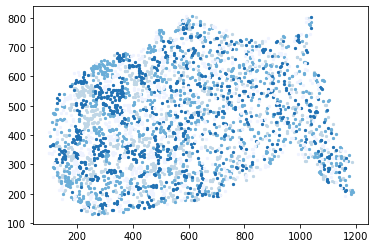

In [47]:
fig = plt.figure()
ax = fig.add_subplot()
xList = [pixelCoord[0] for pixelCoord in pixelCoordList0_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList0_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[0])/255.0)

xList = [pixelCoord[0] for pixelCoord in pixelCoordList1_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList1_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[1])/255.0)

xList = [pixelCoord[0] for pixelCoord in pixelCoordList2_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList2_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[2])/255.0)

xList = [pixelCoord[0] for pixelCoord in pixelCoordList3_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList3_sample]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[3])/255.0)
plt.show()

In [48]:
def moransi(z, w):
    """
    Input
      z: list of values
      w: weight matrix
    Output
      I: Moran's I measure
    """
    n = len(z)
    mean = float(sum(z))/n
    S0 = 0
    d = 0
    var = 0
    for i in range(n):
        var += (z[i]-mean)**2
        for j in range(i):
            if w[i][j]:
                S0 += w[i][j]
                d += w[i][j] * (z[i]-mean) * (z[j]-mean)
    I = n*d/S0/var
    return I

In [49]:
len0 = len(pixelCoordList0_sample)
len1 = len(pixelCoordList1_sample)
len2 = len(pixelCoordList2_sample)
len3 = len(pixelCoordList3_sample)

In [50]:
zList0 = [colorGrey0 for i in range(len0)]
zList1 = [colorGrey1 for i in range(len1)]
zList2 = [colorGrey2 for i in range(len2)]
zList3 = [colorGrey3 for i in range(len3)]

In [51]:
# attribute list and coordinate list
zList = zList0 + zList1 + zList2 + zList3
pixelCoordList_sample = pixelCoordList0_sample + pixelCoordList1_sample + pixelCoordList2_sample + pixelCoordList3_sample

In [52]:
wMatrix = np.zeros(shape=(len(zList), len(zList)))

In [53]:
import math

In [54]:
def distance(coord1, coord2):
    x1, y1 = coord1[0], coord1[1]
    x2, y2 = coord2[0], coord2[1]
    dist = math.sqrt((x1 - x2)**2 + (y1 - y2)**2)
    return dist

In [55]:
# 1/(distance(pixelCoordList_sample[i], pixelCoordList_sample[j]) + 0.0000001)
def calculateKNeighWeight(i, coordList, k = 6): 
    # i is the currently target, k includes the point itself
    # k nearest neighborhood, only consider the k nearest neighbors
    # based on distance to calcuate weight, and normalize weight
    distList = []
    for j in range(len(coordList)):
        dist = distance(coordList[i], coordList[j])
        distList.append(dist)
    
    neighIndice = sorted(range(len(distList)), key = lambda sub: distList[sub])[:k]
    distNeigh = [distList[ind] for ind in neighIndice]

    neighIndice = neighIndice[1:]
    distNeigh = distNeigh[1:]
    wNeigh = [1/distNeigh[j] for j in range(len(distNeigh))]
    
    # normalize weights
    wNeighNorm = (np.asarray(wNeigh)/sum(wNeigh)).tolist()
    
    # put weights together
    wList = [0 for j in range(len(coordList))]
    for ind, j in enumerate(neighIndice):
        wList[j] = wNeighNorm[ind]
        
    return wList

In [56]:
for i in range(len(pixelCoordList_sample)):
    if i % 100 == 0:
        print(i)
    wMatrix[i] = calculateKNeighWeight(i, pixelCoordList_sample)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100


In [57]:
w = wMatrix.tolist()

In [58]:
moransi(zList, w)

0.4265410255377638

In [59]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [60]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList0_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans0 = KMeans(n_clusters = numClusters).fit(x)
kmeans0.cluster_centers_

[0.37499034900493877, 0.4306947292662277, 0.40683104098091466, 0.40342488598036563, 0.4123913067361169, 0.41457248137983627, 0.4149681417579295, 0.4298078456970043, 0.4192870041196875, 0.4281875403366205, 0.42483480154495007, 0.42474112920913215, 0.4251443561978592, 0.42190195841280825, 0.41433934745048223, 0.41341266021005446, 0.41977340248550277, 0.41439299091842685, 0.41062562390298696, 0.4204434434467375, 0.43272453752680007, 0.4292688085147453, 0.4314767564784039, 0.4349903282623362, 0.43992894626978357, 0.4309892233232557, 0.4381616035545289, 0.44435482324302666, 0.436195358879539, 0.4418633098811033, 0.43809370429004113, 0.4482940701896535, 0.4382457009300765, 0.4428058429685192, 0.4415995762822097, 0.4420676530519032, 0.44286504343246497, 0.4518796207838009, 0.43771987916807403, 0.45497323496257225, 0.4442813791483021, 0.4575526829651645, 0.44837873459750205, 0.44686186219527935, 0.44816810800058027, 0.46459271530201196, 0.43113012900305825, 0.45936685990424153, 0.4420805409827

array([[ 338.5       ,  208.5       ],
       [ 803.33333333,  435.33333333],
       [ 444.22222222,  651.77777778],
       [ 209.18181818,  547.04545455],
       [1055.42857143,  517.57142857],
       [ 506.57142857,  245.42857143],
       [ 761.16666667,  534.16666667],
       [1092.57142857,  260.        ],
       [ 176.5       ,  232.83333333],
       [ 601.14285714,  334.        ],
       [ 726.        ,  722.9       ],
       [ 431.66666667,  473.66666667],
       [ 804.8       ,  262.4       ],
       [ 240.88      ,  443.48      ],
       [ 573.25      ,  635.75      ],
       [ 141.77777778,  376.33333333],
       [ 931.33333333,  716.        ],
       [ 683.91666667,  209.33333333],
       [ 644.        ,  482.81818182],
       [1050.        ,  325.11111111],
       [ 342.        ,  365.41666667],
       [ 667.53333333,  560.93333333],
       [ 735.        ,  421.33333333],
       [ 936.75      ,  429.125     ],
       [ 248.76470588,  264.35294118],
       [ 900.5       ,  6

In [61]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList1_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans1 = KMeans(n_clusters = numClusters).fit(x)
kmeans1.cluster_centers_

[0.39919475171957575, 0.40663004849016976, 0.414660014589462, 0.40757996552136605, 0.4052081592230681, 0.39336804900698524, 0.41039553980891974, 0.4154944878264714, 0.4164405905432162, 0.4244939783441474, 0.41759440924555774, 0.40954699491254953, 0.4124724627053449, 0.4047023143321887, 0.4035604898644562, 0.40185570771913864, 0.4165801239786777, 0.40845332500186066, 0.4078726742141171, 0.4017533002349768, 0.40143524118524126, 0.40441361314176544, 0.4109376930803151, 0.40523880241470456, 0.40414065953017575, 0.4165908256029704, 0.40697956826978715, 0.42260289550809815, 0.4195890427812311, 0.42239749311116903, 0.4092043703427299, 0.4205993415541156, 0.4055200758330674, 0.41579146859278054, 0.4150845244977936, 0.41567788475192163, 0.4266912727722326, 0.4119666011292187, 0.4172703800267161, 0.39628989677271836, 0.4198220902273978, 0.38843548081757057, 0.42925023727787615, 0.41158278506524665, 0.4213988335814243, 0.4045693916509315, 0.404799464829946, 0.4154432149485602, 0.42009666693731773

array([[ 888.88888889,  324.        ],
       [ 430.        ,  411.33333333],
       [ 701.8       ,  658.8       ],
       [ 149.6875    ,  283.        ],
       [ 906.14285714,  583.42857143],
       [ 497.5       ,  595.        ],
       [ 718.        ,  272.6       ],
       [1142.85714286,  319.92857143],
       [ 266.88235294,  626.29411765],
       [ 522.        ,  265.30769231],
       [ 245.85714286,  156.14285714],
       [ 644.28571429,  469.78571429],
       [ 354.33333333,  201.77777778],
       [ 499.22222222,  746.33333333],
       [ 208.75      ,  456.5       ],
       [ 772.5       ,  393.5       ],
       [1061.9       ,  594.5       ],
       [ 984.5       ,  444.8       ],
       [ 490.53846154,  416.07692308],
       [ 385.33333333,  526.22222222],
       [ 331.45454545,  414.18181818],
       [ 941.83333333,  701.5       ],
       [ 627.7       ,  608.5       ],
       [ 654.8       ,  739.5       ],
       [ 606.        ,  199.        ],
       [ 779.25      ,  6

In [62]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList2_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans2 = KMeans(n_clusters = numClusters).fit(x)
kmeans2.cluster_centers_

[0.39098687204446153, 0.4045072331748666, 0.4197998197121033, 0.4081388314870318, 0.40104888184698617, 0.4103629495336589, 0.41205367529261094, 0.4055089110601883, 0.41445586644232296, 0.41289568823269157, 0.42674851284510923, 0.4279728527585683, 0.4263707952226441, 0.422045217303785, 0.40981154094364497, 0.41712857008006976, 0.41445098130568536, 0.43103526124217967, 0.4208523789972818, 0.42755236642834354, 0.42987558291816874, 0.42079299916032464, 0.4234776383155201, 0.42437100717530396, 0.4277916545045716, 0.4123745605052652, 0.4130657522732409, 0.42767136923283766, 0.4366402977645256, 0.42006106330061677, 0.41270961518271754, 0.4239088445763276, 0.42739816559664884, 0.45192438111934075, 0.43588115164682206, 0.445169869328582, 0.45263311539078116, 0.4410762676289421, 0.4434760336097545, 0.4535845370768059, 0.4565120252434693, 0.45432807742229575, 0.45730770359136963, 0.4504247770527511, 0.45543286158110463, 0.4571766317306577, 0.44773990589840307, 0.44799471807328406, 0.4607998599928

array([[ 947.8       ,  563.        ],
       [ 425.44444444,  245.11111111],
       [ 481.11111111,  645.55555556],
       [ 318.        ,  539.85714286],
       [1095.66666667,  273.08333333],
       [ 217.75      ,  294.33333333],
       [ 646.16666667,  270.33333333],
       [ 745.66666667,  586.55555556],
       [ 624.77777778,  470.33333333],
       [1010.        ,  398.        ],
       [ 568.5       ,  655.        ],
       [ 476.875     ,  416.625     ],
       [ 415.125     ,  160.125     ],
       [ 826.        ,  452.71428571],
       [ 212.        ,  586.45454545],
       [ 196.90909091,  388.18181818],
       [ 352.69230769,  664.15384615],
       [ 736.4       ,  680.2       ],
       [ 326.75      ,  276.5       ],
       [ 633.64285714,  211.71428571],
       [ 984.55555556,  724.11111111],
       [ 383.8       ,  449.6       ],
       [1045.11111111,  470.33333333],
       [ 376.85714286,  344.71428571],
       [ 918.25      ,  384.25      ],
       [ 586.33333333,  7

In [63]:
sil = []
difSilList = []
kmax = 100
x = pixelCoordList3_sample
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(3, kmax+1):
#     print('K: '+str(k))
    kmeans = KMeans(n_clusters = k,random_state=0).fit(x)
    labels = kmeans.labels_
    silScore = silhouette_score(x, labels, metric = 'euclidean')
    difSil = 0
    if len(sil) > 0:
        difSil = silScore - sil[-1]
    sil.append(silScore)
    difSilList.append(difSil)
print(sil)

# find the best index of difSil
index = 0
maxValue = max(sil)
maxIndex = sil.index(maxValue)
maxDif = max(difSilList)
while maxIndex >= 3:
    maxValue = sil[maxIndex]
    i = maxIndex - 1
    if difSilList[maxIndex] < maxDif / 10:
        maxIndex = maxIndex - 1
    else:
        break
numClusters = maxIndex + 2
kmeans3 = KMeans(n_clusters = numClusters).fit(x)
kmeans3.cluster_centers_

[0.3844823538247027, 0.3844080574695675, 0.37573447722625986, 0.37286112279389305, 0.39161041879942515, 0.3840012852753281, 0.37920438400149975, 0.3974504793444627, 0.40233209159061806, 0.41117234532045727, 0.4160852479203549, 0.4210455813426047, 0.3891442866276552, 0.4224542635947245, 0.41917109948167774, 0.4145506259277294, 0.40481524337765895, 0.42416496567584416, 0.41614719933321365, 0.4199914620309096, 0.4309422137693839, 0.4321861753999532, 0.41993542299610787, 0.4227236011553903, 0.42209772530829537, 0.43266441425026025, 0.4443219880140012, 0.4324809159509059, 0.4345952378050478, 0.43390569369701676, 0.4337865510498213, 0.4283541262890426, 0.4376053082825902, 0.4336501985342917, 0.4585595623568179, 0.4387810871712354, 0.45300783223669167, 0.4519781640364883, 0.44626877210016624, 0.45126832357948066, 0.4430934897968178, 0.4390076873859587, 0.4517295316682108, 0.4548880356200748, 0.44901773399120704, 0.4656113328819062, 0.4475299615128564, 0.4588878484333218, 0.4504679009480817, 0

array([[ 580.75      ,  792.5       ],
       [ 397.83333333,  276.83333333],
       [ 827.75      ,  353.        ],
       [ 303.125     ,  570.375     ],
       [ 883.25      ,  702.25      ],
       [ 485.6       ,  568.4       ],
       [ 226.7       ,  341.3       ],
       [1144.33333333,  218.        ],
       [ 511.        ,  302.        ],
       [ 722.33333333,  506.66666667],
       [1021.        ,  466.66666667],
       [ 720.6       ,  682.        ],
       [ 325.1       ,  390.        ],
       [ 231.75      ,  152.5       ],
       [ 149.6       ,  490.2       ],
       [ 651.71428571,  223.71428571],
       [ 428.875     ,  436.        ],
       [ 352.2       ,  637.8       ],
       [ 569.14285714,  408.        ],
       [1053.5       ,  572.625     ],
       [ 563.5       ,  661.        ],
       [1077.        ,  373.        ],
       [ 901.66666667,  523.16666667],
       [ 738.77777778,  253.33333333],
       [ 190.94444444,  290.66666667],
       [ 318.6       ,  1

In [64]:
kmeans3.cluster_centers_.shape

(96, 2)

### try to use the random lines to get number of clusters

In [65]:
xList = [pixelCoord[0] for pixelCoord in pixelCoordList_sample]
yList = [pixelCoord[1] for pixelCoord in pixelCoordList_sample]
xMin, xMax = min(xList), max(xList)
yMin, yMax = min(yList), max(yList)
yMid = int((yMin + yMax) / 2)
xMin, xMax, yMin, yMax, yMid

(97, 1189, 131, 805, 468)

In [66]:
def calculateKNeigh(targetCoord, coordList, k = 6): 
    # targetCoord is the coordinate of current point
    # k nearest neighborhood, only consider the k nearest neighbors
    # CoordList is the set of coordinates to compare
    distList = []
    for j in range(len(coordList)):
        dist = distance(targetCoord, coordList[j])
        distList.append(dist)
    
    neighIndice = sorted(range(len(distList)), key = lambda sub: distList[sub])[:k]
#     [distList[ind] for ind in neighIndice]

    return neighIndice

In [67]:
def most_common(lst):
    return max(set(lst), key=lst.count)

In [68]:
def mostCommonListHLine(y,xMin, xMax, pixelCoordList_sample,zList):
    mostCommonList = []
    for x in range(xMin, xMax + 1):
        coord = (x,y)
        neighIndice = calculateKNeigh(coord, pixelCoordList_sample)
        # find the most common class
        zListNeighIndice = [zList[ind] for ind in neighIndice]
        mostCommon = most_common(zListNeighIndice)
        mostCommonList.append(mostCommon)
    return mostCommonList

In [69]:
def mostCommonListVLine(x,yMin, yMax, pixelCoordList_sample,zList):
    mostCommonList = []
    for y in range(yMin, yMax + 1):
        coord = (x,y)
        neighIndice = calculateKNeigh(coord, pixelCoordList_sample)
        # find the most common class
        zListNeighIndice = [zList[ind] for ind in neighIndice]
        mostCommon = most_common(zListNeighIndice)
        mostCommonList.append(mostCommon)
    return mostCommonList

In [70]:
mostCommonListLines = []
for y in range(yMin, yMax + 1, int((yMax + 1 - yMin) / 10)):
    print(y)
    mostCommonList = mostCommonListHLine(y, xMin, xMax, pixelCoordList_sample,zList)
    mostCommonListLines.append(mostCommonList)

131
198
265
332
399
466
533
600
667
734
801


In [71]:
for x in range(xMin, xMax + 1, int((xMax + 1 - xMin) / 10)):
    print(x)
    mostCommonList = mostCommonListHLine(x, yMin, yMax, pixelCoordList_sample,zList)
    mostCommonListLines.append(mostCommonList)

97
206
315
424
533
642
751
860
969
1078
1187


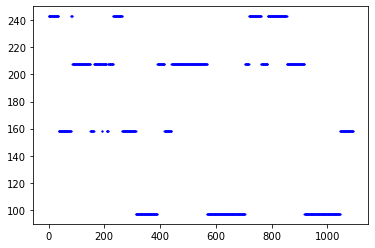

In [72]:
fig = plt.figure()
ax = fig.add_subplot()
xList = [i for i in range(len(mostCommonListLines[0]))]
yList = mostCommonListLines[0]
ax.scatter(xList, yList, s = 1,c = 'blue')

In [73]:
def countSegmentationFun(mostCommonList):
    countSegmentation = 1
    currentValue = mostCommonList[0]
    countDifferentTemp = 0
    for i in range(len(mostCommonList)):
        if mostCommonList[i] ==  currentValue:
            countDifferentTemp = 0
            continue
        else:
            countDifferentTemp += 1
            if countDifferentTemp > 20:
                currentValue = mostCommonList[i]
                countSegmentation += 1
    return countSegmentation

In [74]:
countSegmentationList = []
for mostCommonList in mostCommonListLines:
    countSegmentation = countSegmentationFun(mostCommonList)
    countSegmentationList.append(countSegmentation)
countSegmentationList

[16,
 20,
 26,
 23,
 25,
 22,
 17,
 19,
 17,
 18,
 18,
 8,
 11,
 17,
 10,
 14,
 15,
 9,
 9,
 7,
 8,
 6]

In [75]:
countSegmentation = max(countSegmentationList)
totalNumCluster = countSegmentation**2
numClusterEach = math.ceil(totalNumCluster / 4)
print(numClusterEach)
numCluster0, numCluster1, numCluster2, numCluster3 = numClusterEach,numClusterEach,numClusterEach,numClusterEach

169


In [76]:
kmeans0 = KMeans(n_clusters = numCluster0).fit(pixelCoordList0_sample)
kmeans1 = KMeans(n_clusters = numCluster1).fit(pixelCoordList1_sample)
kmeans2 = KMeans(n_clusters = numCluster2).fit(pixelCoordList2_sample)
kmeans3 = KMeans(n_clusters = numCluster3).fit(pixelCoordList3_sample)

In [77]:
zCenters0 = [colorGrey0 for i in range(kmeans0.cluster_centers_.shape[0])]
zCenters1 = [colorGrey1 for i in range(kmeans1.cluster_centers_.shape[0])]
zCenters2 = [colorGrey2 for i in range(kmeans2.cluster_centers_.shape[0])]
zCenters3 = [colorGrey3 for i in range(kmeans3.cluster_centers_.shape[0])]

In [78]:
coordCenters0 = kmeans0.cluster_centers_.tolist()
coordCenters1 = kmeans1.cluster_centers_.tolist()
coordCenters2 = kmeans2.cluster_centers_.tolist()
coordCenters3 = kmeans3.cluster_centers_.tolist()

In [79]:
zCenters = zCenters0 + zCenters1 + zCenters2 + zCenters3
coordCenters = coordCenters0 + coordCenters1 + coordCenters2 + coordCenters3
coordCenters

[[509.0, 270.0],
 [594.5, 664.5],
 [879.3333333333333, 423.6666666666667],
 [230.12499999999994, 428.75],
 [1077.6, 403.6],
 [411.0, 532.6666666666666],
 [931.3333333333334, 716.0],
 [242.77777777777777, 312.6666666666667],
 [754.8571428571429, 333.8571428571429],
 [612.0, 475.75],
 [210.71428571428572, 540.3571428571429],
 [336.5, 369.7],
 [804.8, 567.2],
 [444.22222222222223, 651.7777777777778],
 [671.625, 207.5],
 [236.0, 190.66666666666669],
 [1023.0, 505.0],
 [567.0, 359.1111111111111],
 [727.1111111111111, 725.6666666666666],
 [1140.5, 335.75],
 [388.28571428571433, 226.57142857142858],
 [602.0, 763.6666666666666],
 [712.6666666666666, 573.0],
 [146.0, 292.0],
 [442.6923076923077, 380.53846153846155],
 [516.6666666666666, 188.0],
 [527.0, 499.0],
 [811.8, 263.79999999999995],
 [394.1666666666667, 601.6666666666666],
 [897.4000000000001, 549.6],
 [170.28571428571433, 350.0],
 [1089.1666666666665, 254.5],
 [266.59999999999997, 476.26666666666665],
 [1024.75, 321.25],
 [598.0, 272.2

In [80]:
def calculateKNeighWeight(i, coordList, k = 6): 
    # i is the currently target, k includes the point itself
    distList = []
#     print('len of coordList: '+ str(len(coordList)))
    for j in range(len(coordList)):
        dist = distance(coordList[i], coordList[j])
        distList.append(dist)
    
#     for i in range(len(distList)):
#         print(str(i) + ': ' + str(distList[i]))
    neighIndice = sorted(range(len(distList)), key = lambda sub: distList[sub])[:k]
#     print(neighIndice)
    distNeigh = [distList[ind] for ind in neighIndice]
#     print(distNeigh)
    neighIndice = neighIndice[1:]
    distNeigh = distNeigh[1:]
    wNeigh = [1/distNeigh[j] for j in range(len(distNeigh))]
    
    # normalize weights
    wNeighNorm = (np.asarray(wNeigh)/sum(wNeigh)).tolist()
#     print(wNeighNorm)
    wList = [0 for j in range(len(coordList))]
#     print(len(wList))
    for ind, j in enumerate(neighIndice):
#         print('j:' + str(j))
        wList[j] = wNeighNorm[ind]
#     print(len(wList))
    return wList

In [81]:
wMatrix = np.zeros(shape=(len(zCenters), len(zCenters)))

In [82]:
for i in range(len(zCenters)):
    wMatrix[i] = calculateKNeighWeight(i, coordCenters)
    print(wMatrix[i])

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.15059064 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.19445011 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.10897219 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

 0.         0.         0.         0.21835241]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.18060328 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.22708427 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.       

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.14273421 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.        

In [86]:
w = wMatrix.tolist()

In [87]:
moransi(zCenters, w) # use line grid to decide number of clusters

-0.19534441027880606

In [62]:
moransi(zCenters, w) # use optimal k in kmeans

-0.2652823637532201

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

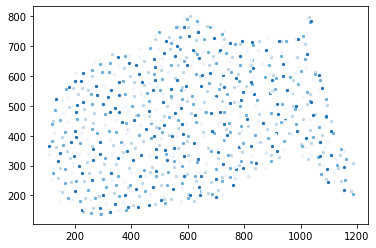

In [85]:
fig = plt.figure()
ax = fig.add_subplot()
xList = [pixelCoord[0] for pixelCoord in coordCenters0]
yList = [pixelCoord[1] for pixelCoord in coordCenters0]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[0])/255.0)

xList = [pixelCoord[0] for pixelCoord in coordCenters1]
yList = [pixelCoord[1] for pixelCoord in coordCenters1]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[1])/255.0)

xList = [pixelCoord[0] for pixelCoord in coordCenters2]
yList = [pixelCoord[1] for pixelCoord in coordCenters2]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[2])/255.0)

xList = [pixelCoord[0] for pixelCoord in coordCenters3]
yList = [pixelCoord[1] for pixelCoord in coordCenters3]
ax.scatter(xList, yList, s = 5,c = np.asarray(colorList[3])/255.0)
plt.show()